In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import clear_output
import tqdm.notebook as tq

# Importujemy przygotowane wagi dla czterech inwestcyji z krótką sprzedażą

Wagi zostały wygenerowane losowo

In [11]:
weight_df = pd.read_csv("weights_short_selling_4assets.csv")
weight_df_cols = ['Allegro waga','MSCI waga', 'Srebro waga', 'Ropa return']
weight_df.rename(columns={"0":"Allegro waga","1":"MSCI waga","2":"Srebro waga","3":"Ropa waga"}, inplace=True)
weight_df.drop(labels='Unnamed: 0', axis=1, inplace=True)
weight_df

,Allegro waga,MSCI waga,Srebro waga,Ropa waga
0,0.694402,0.468171,-0.484039,0.321466
1,0.602012,0.084887,-0.514141,0.827241
2,0.037189,0.311581,0.306160,0.345069
3,0.338497,-0.286980,1.154407,-0.205924
4,0.615496,-0.087788,-0.633099,1.105392
...,...,...,...,...
641041,-0.644466,-0.496221,2.852112,-0.711425
641042,0.540036,0.052584,0.248241,0.159138
641043,0.603030,-0.480396,0.775782,0.101583
641044,1.043485,-0.258463,-0.451284,0.666262


# Loading log returns data


In [12]:
return_df = pd.read_excel('IAEXCEL.xlsx',sheet_name='allgergo')
price_return_df = return_df.drop(0) 
return_df = price_return_df.iloc[:,5:]
return_df

,Return Allegro,Return MSCI,Return Srebro,Return Ropa
1,0.133531,0.004655,-0.046243,0.01934
2,-0.05182,-0.006212,0.010964,0.02068
3,0.042022,-0.007918,-0.007034,-0.001951
4,0.027761,0.011028,0.007444,-0.001955
5,0.023659,-0.009557,0.011934,-0.001224
...,...,...,...,...
269,0.009628,0.001816,-0.004658,-0.037526
270,-0.052337,0.004526,-0.019592,0.008505
271,0.003822,-0.009529,-0.036365,0.022545
272,-0.06891,0.005456,0.001871,-0.001402


# Adding to weights dataframe expected return of each inwestment.

In [13]:
mean_return_allegro = return_df['Return Allegro'].mean()
mean_return_msci = return_df['Return MSCI'].mean()
mean_return_silver = return_df['Return Srebro'].mean()
mean_return_oil = return_df['Return Ropa'].mean()

weight_df['Allegro'] = mean_return_allegro
weight_df['MSCI'] = mean_return_msci
weight_df['Srebro'] = mean_return_silver
weight_df['Ropa'] = mean_return_oil
weight_df

,Allegro waga,MSCI waga,Srebro waga,Ropa waga,Allegro,MSCI,Srebro,Ropa
0,0.694402,0.468171,-0.484039,0.321466,-0.001871,0.000838,-0.000323,0.002004
1,0.602012,0.084887,-0.514141,0.827241,-0.001871,0.000838,-0.000323,0.002004
2,0.037189,0.311581,0.306160,0.345069,-0.001871,0.000838,-0.000323,0.002004
3,0.338497,-0.286980,1.154407,-0.205924,-0.001871,0.000838,-0.000323,0.002004
4,0.615496,-0.087788,-0.633099,1.105392,-0.001871,0.000838,-0.000323,0.002004
...,...,...,...,...,...,...,...,...
641041,-0.644466,-0.496221,2.852112,-0.711425,-0.001871,0.000838,-0.000323,0.002004
641042,0.540036,0.052584,0.248241,0.159138,-0.001871,0.000838,-0.000323,0.002004
641043,0.603030,-0.480396,0.775782,0.101583,-0.001871,0.000838,-0.000323,0.002004
641044,1.043485,-0.258463,-0.451284,0.666262,-0.001871,0.000838,-0.000323,0.002004


# Calculating expected portfolio return

In [14]:
weight_df['E(Rp)'] = weight_df['Allegro waga'] * weight_df['Allegro'] + weight_df['MSCI waga'] * weight_df['MSCI'] + weight_df['Srebro waga'] * weight_df['Srebro'] + weight_df['Ropa waga'] * weight_df['Ropa']
weight_df

,Allegro waga,MSCI waga,Srebro waga,Ropa waga,Allegro,MSCI,Srebro,Ropa,E(Rp)
0,0.694402,0.468171,-0.484039,0.321466,-0.001871,0.000838,-0.000323,0.002004,-0.000106
1,0.602012,0.084887,-0.514141,0.827241,-0.001871,0.000838,-0.000323,0.002004,0.000769
2,0.037189,0.311581,0.306160,0.345069,-0.001871,0.000838,-0.000323,0.002004,0.000784
3,0.338497,-0.286980,1.154407,-0.205924,-0.001871,0.000838,-0.000323,0.002004,-0.001660
4,0.615496,-0.087788,-0.633099,1.105392,-0.001871,0.000838,-0.000323,0.002004,0.001195
...,...,...,...,...,...,...,...,...,...
641041,-0.644466,-0.496221,2.852112,-0.711425,-0.001871,0.000838,-0.000323,0.002004,-0.001559
641042,0.540036,0.052584,0.248241,0.159138,-0.001871,0.000838,-0.000323,0.002004,-0.000728
641043,0.603030,-0.480396,0.775782,0.101583,-0.001871,0.000838,-0.000323,0.002004,-0.001578
641044,1.043485,-0.258463,-0.451284,0.666262,-0.001871,0.000838,-0.000323,0.002004,-0.000688


# Tworzymy macierz wag, macierz kowariancji i korelacji stóp zwrotu. Będzie przydatne dla obliczenia odchylenia standardowego portfela

In [15]:
weigths_matrix = np.matrix(weight_df[['Allegro waga','MSCI waga','Srebro waga','Ropa waga']])
corr = return_df.astype('float64').corr()
cov_mat = return_df.astype('float64').cov()
cov_mat = np.matrix(cov_mat)

In [18]:
print(cov_mat)

[[ 9.13078072e-04  3.64900341e-05  6.17906779e-06 -9.86940490e-06]
 [ 3.64900341e-05  6.47918159e-05 -9.94068732e-06  4.08765247e-05]
 [ 6.17906779e-06 -9.94068732e-06  4.38705956e-04  1.79077511e-05]
 [-9.86940490e-06  4.08765247e-05  1.79077511e-05  5.14303722e-04]]


In [19]:
return_df['Return Srebro']

1     -0.046243
2      0.010964
3     -0.007034
4      0.007444
5      0.011934
         ...   
269   -0.004658
270   -0.019592
271   -0.036365
272    0.001871
273   -0.017185
Name: Return Srebro, Length: 273, dtype: object

/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Return Srebro', ylabel='Density'>

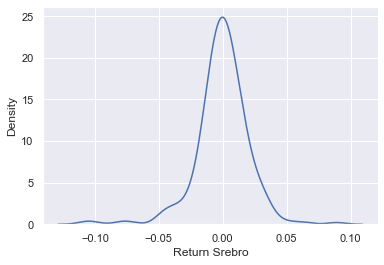

In [20]:
sns.set()
sns.distplot(return_df['Return Srebro'], label='Srebro', hist=False)

In [21]:
return_df

,Return Allegro,Return MSCI,Return Srebro,Return Ropa
1,0.133531,0.004655,-0.046243,0.01934
2,-0.05182,-0.006212,0.010964,0.02068
3,0.042022,-0.007918,-0.007034,-0.001951
4,0.027761,0.011028,0.007444,-0.001955
5,0.023659,-0.009557,0.011934,-0.001224
...,...,...,...,...
269,0.009628,0.001816,-0.004658,-0.037526
270,-0.052337,0.004526,-0.019592,0.008505
271,0.003822,-0.009529,-0.036365,0.022545
272,-0.06891,0.005456,0.001871,-0.001402


/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

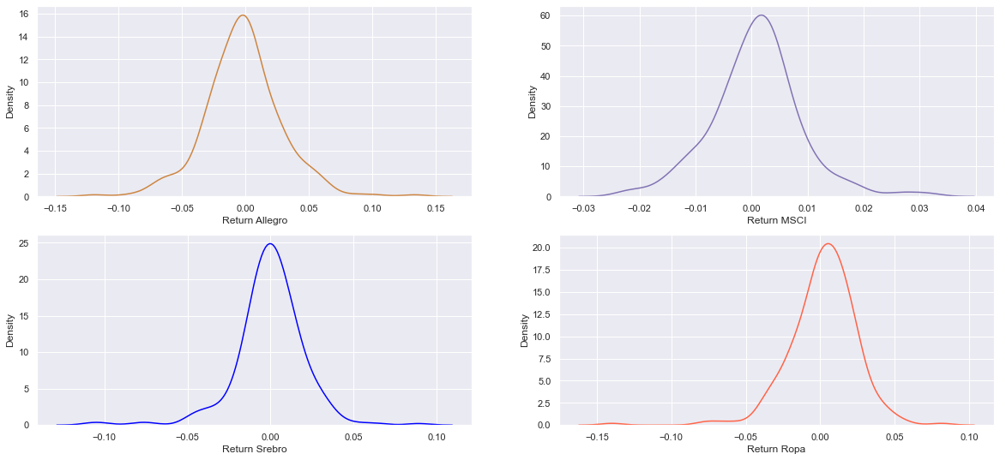

In [22]:
sns.set()
fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(20,9))
#plt.figure(figsize=(10, 6))

silver = pd.to_numeric(return_df['Return Srebro'])
msci = pd.to_numeric(return_df['Return MSCI'])
allegro = pd.to_numeric(return_df['Return Allegro'])
ropa = pd.to_numeric(return_df['Return Ropa'])

sns.distplot(allegro, label='Allegro', hist=False, ax=axs[0,0],color='peru') #
sns.distplot(msci, label='MSCI', hist=False, ax=axs[0,1], color='m')
sns.distplot(silver, label='Srebro', hist=False, ax=axs[1,0], color='blue')
sns.distplot(ropa, label='Ropa', hist=False, ax=axs[1,1],color='tomato')
fig.savefig('distplotmsci.png')


In [14]:
weight_df

,0,1,2,3,Allegro,MSCI,Srebro,Ropa
0,0.694402,0.468171,-0.484039,0.321466,-0.001871,0.000838,-0.000323,0.002004
1,0.602012,0.084887,-0.514141,0.827241,-0.001871,0.000838,-0.000323,0.002004
2,0.037189,0.311581,0.306160,0.345069,-0.001871,0.000838,-0.000323,0.002004
3,0.338497,-0.286980,1.154407,-0.205924,-0.001871,0.000838,-0.000323,0.002004
4,0.615496,-0.087788,-0.633099,1.105392,-0.001871,0.000838,-0.000323,0.002004
...,...,...,...,...,...,...,...,...
641041,-0.644466,-0.496221,2.852112,-0.711425,-0.001871,0.000838,-0.000323,0.002004
641042,0.540036,0.052584,0.248241,0.159138,-0.001871,0.000838,-0.000323,0.002004
641043,0.603030,-0.480396,0.775782,0.101583,-0.001871,0.000838,-0.000323,0.002004
641044,1.043485,-0.258463,-0.451284,0.666262,-0.001871,0.000838,-0.000323,0.002004


# Calculating variance

In [474]:
def portfolio_variance(weight_df,cov_mat):
    risk_arr = []
    
    for i in tq.tqdm(range(len(weight_df))):
        risk_arr.append(float(np.sqrt(np.matmul(np.matmul(weight_df[i],cov_mat),np.transpose(weight_df[i])))))
        
    return risk_arr

In [488]:
risk_arr = portfolio_variance(weight_df,cov_mat)

0.0
1.5599504559735183e-06
3.1199009119470366e-06
4.679851367920555e-06
6.239801823894073e-06
7.799752279867592e-06
9.35970273584111e-06
1.0919653191814629e-05
1.2479603647788146e-05
1.4039554103761664e-05
1.5599504559735184e-05
1.71594550157087e-05
1.871940547168222e-05
2.0279355927655737e-05
2.1839306383629258e-05
2.3399256839602775e-05
2.4959207295576293e-05
2.651915775154981e-05
2.807910820752333e-05
2.9639058663496846e-05
3.119900911947037e-05
3.2758959575443885e-05
3.43189100314174e-05
3.587886048739092e-05
3.743881094336444e-05
3.8998761399337955e-05
4.055871185531147e-05
4.211866231128499e-05
4.3678612767258515e-05
4.523856322323203e-05
4.679851367920555e-05
4.835846413517907e-05
4.9918414591152586e-05
5.1478365047126104e-05
5.303831550309962e-05
5.459826595907314e-05
5.615821641504666e-05
5.7718166871020174e-05
5.927811732699369e-05
6.083806778296721e-05
6.239801823894073e-05
6.395796869491425e-05
6.551791915088777e-05
6.707786960686129e-05
6.86378200628348e-05
7.0197770518808

0.0017549442629702081
0.0017565042134261816
0.0017580641638821552
0.0017596241143381286
0.0017611840647941022
0.0017627440152500756
0.0017643039657060493
0.0017658639161620227
0.0017674238666179963
0.0017689838170739697
0.0017705437675299433
0.0017721037179859167
0.0017736636684418904
0.0017752236188978638
0.0017767835693538374
0.0017783435198098108
0.0017799034702657844
0.0017814634207217578
0.0017830233711777315
0.0017845833216337049
0.0017861432720896785
0.001787703222545652
0.0017892631730016255
0.001790823123457599
0.0017923830739135726
0.001793943024369546
0.0017955029748255196
0.001797062925281493
0.0017986228757374666
0.00180018282619344
0.0018017427766494137
0.001803302727105387
0.0018048626775613607
0.0018064226280173341
0.0018079825784733077
0.0018095425289292812
0.0018111024793852548
0.0018126624298412282
0.0018142223802972018
0.0018157823307531752
0.0018173422812091489
0.0018189022316651223
0.0018204621821210959
0.0018220221325770693
0.001823582083033043
0.0018251420334890

0.0033601332821669586
0.003361693232622932
0.0033632531830789054
0.003364813133534879
0.0033663730839908527
0.003367933034446826
0.0033694929849027995
0.003371052935358773
0.0033726128858147467
0.00337417283627072
0.0033757327867266936
0.003377292737182667
0.003378852687638641
0.003380412638094614
0.0033819725885505876
0.003383532539006561
0.003385092489462535
0.0033866524399185083
0.0033882123903744817
0.003389772340830455
0.003391332291286429
0.0033928922417424024
0.0033944521921983758
0.003396012142654349
0.003397572093110323
0.0033991320435662964
0.00340069199402227
0.0034022519444782432
0.003403811894934217
0.0034053718453901905
0.003406931795846164
0.0034084917463021373
0.003410051696758111
0.0034116116472140846
0.003413171597670058
0.0034147315481260314
0.0034162914985820052
0.0034178514490379786
0.003419411399493952
0.0034209713499499255
0.0034225313004058993
0.0034240912508618727
0.003425651201317846
0.0034272111517738195
0.0034287711022297934
0.0034303310526857668
0.003431891

0.004920083738140476
0.0049216436885964505
0.004923203639052424
0.004924763589508397
0.004926323539964371
0.004927883490420344
0.004929443440876318
0.004931003391332291
0.004932563341788264
0.004934123292244239
0.004935683242700212
0.0049372431931561855
0.004938803143612159
0.004940363094068132
0.004941923044524106
0.004943482994980079
0.0049450429454360526
0.004946602895892027
0.004948162846348
0.004949722796803974
0.004951282747259947
0.0049528426977159205
0.004954402648171894
0.004955962598627867
0.004957522549083841
0.004959082499539815
0.004960642449995788
0.004962202400451762
0.004963762350907735
0.004965322301363709
0.004966882251819682
0.004968442202275655
0.004970002152731629
0.004971562103187603
0.0049731220536435765
0.00497468200409955
0.004976241954555523
0.004977801905011497
0.00497936185546747
0.0049809218059234436
0.004982481756379417
0.004984041706835391
0.004985601657291365
0.004987161607747338
0.0049887215582033115
0.004990281508659285
0.004991841459115258
0.004993401

0.006428555829066869
0.006430115779522842
0.006431675729978816
0.006433235680434789
0.006434795630890763
0.006436355581346737
0.00643791553180271
0.006439475482258684
0.006441035432714657
0.00644259538317063
0.006444155333626604
0.006445715284082577
0.0064472752345385515
0.006448835184994525
0.006450395135450498
0.006451955085906472
0.006453515036362445
0.0064550749868184185
0.006456634937274392
0.006458194887730365
0.00645975483818634
0.006461314788642313
0.0064628747390982864
0.00646443468955426
0.006465994640010233
0.006467554590466207
0.00646911454092218
0.0064706744913781535
0.006472234441834128
0.006473794392290101
0.006475354342746075
0.006476914293202048
0.006478474243658021
0.006480034194113995
0.006481594144569968
0.006483154095025942
0.006484714045481916
0.006486273995937889
0.006487833946393863
0.006489393896849836
0.0064909538473058095
0.006492513797761783
0.006494073748217756
0.00649563369867373
0.006497193649129704
0.0064987535995856775
0.006500313550041651
0.00650187350

0.007258449471644781
0.007260009422100754
0.0072615693725567275
0.007263129323012701
0.007264689273468674
0.007266249223924648
0.007267809174380622
0.007269369124836595
0.007270929075292569
0.007272489025748542
0.007274048976204516
0.007275608926660489
0.0072771688771164625
0.007278728827572437
0.00728028877802841
0.0072818487284843835
0.007283408678940357
0.00728496862939633
0.007286528579852304
0.007288088530308277
0.007289648480764251
0.007291208431220225
0.007292768381676198
0.007294328332132172
0.007295888282588145
0.0072974482330441185
0.007299008183500092
0.007300568133956065
0.007302128084412039
0.007303688034868013
0.007305247985323986
0.00730680793577996
0.007308367886235933
0.007309927836691907
0.00731148778714788
0.0073130477376038535
0.007314607688059827
0.007316167638515801
0.0073177275889717746
0.007319287539427748
0.007320847489883721
0.007322407440339695
0.007323967390795668
0.007325527341251642
0.007327087291707615
0.007328647242163589
0.007330207192619563
0.007331767

0.008036864749175567
0.008038424699631539
0.008039984650087513
0.008041544600543486
0.00804310455099946
0.008044664501455434
0.008046224451911407
0.008047784402367381
0.008049344352823354
0.008050904303279328
0.0080524642537353
0.008054024204191275
0.00805558415464725
0.008057144105103222
0.008058704055559196
0.008060264006015169
0.008061823956471143
0.008063383906927115
0.00806494385738309
0.008066503807839062
0.008068063758295036
0.00806962370875101
0.008071183659206983
0.008072743609662958
0.00807430356011893
0.008075863510574904
0.008077423461030877
0.008078983411486851
0.008080543361942825
0.008082103312398798
0.008083663262854772
0.008085223213310745
0.008086783163766719
0.008088343114222692
0.008089903064678666
0.008091463015134638
0.008093022965590613
0.008094582916046587
0.00809614286650256
0.008097702816958534
0.008099262767414506
0.00810082271787048
0.008102382668326453
0.008103942618782427
0.008105502569238402
0.008107062519694374
0.008108622470150349
0.008110182420606321
0

0.0095016582273347
0.009503218177790674
0.009504778128246646
0.00950633807870262
0.009507898029158595
0.009509457979614567
0.009511017930070541
0.009512577880526514
0.009514137830982488
0.00951569778143846
0.009517257731894435
0.00951881768235041
0.009520377632806382
0.009521937583262356
0.009523497533718329
0.009525057484174303
0.009526617434630276
0.00952817738508625
0.009529737335542222
0.009531297285998197
0.009532857236454171
0.009534417186910144
0.009535977137366118
0.00953753708782209
0.009539097038278065
0.009540656988734037
0.009542216939190011
0.009543776889645986
0.009545336840101958
0.009546896790557933
0.009548456741013905
0.00955001669146988
0.009551576641925852
0.009553136592381826
0.009554696542837799
0.009556256493293773
0.009557816443749747
0.00955937639420572
0.009560936344661694
0.009562496295117667
0.009564056245573641
0.009565616196029613
0.009567176146485588
0.009568736096941562
0.009570296047397535
0.009571855997853509
0.009573415948309481
0.009574975898765456
0

0.010493786717333857
0.010495346667789831
0.010496906618245804
0.010498466568701778
0.010500026519157752
0.010501586469613725
0.0105031464200697
0.010504706370525672
0.010506266320981646
0.010507826271437619
0.010509386221893593
0.010510946172349565
0.01051250612280554
0.010514066073261514
0.010515626023717486
0.01051718597417346
0.010518745924629433
0.010520305875085408
0.01052186582554138
0.010523425775997354
0.010524985726453329
0.010526545676909301
0.010528105627365275
0.010529665577821248
0.010531225528277222
0.010532785478733195
0.010534345429189169
0.010535905379645142
0.010537465330101116
0.01053902528055709
0.010540585231013063
0.010542145181469037
0.01054370513192501
0.010545265082380984
0.010546825032836956
0.01054838498329293
0.010549944933748905
0.010551504884204877
0.010553064834660852
0.010554624785116824
0.010556184735572799
0.010557744686028771
0.010559304636484745
0.010560864586940718
0.010562424537396692
0.010563984487852666
0.010565544438308639
0.010567104388764613


0.011170805215226365
0.011172365165682338
0.011173925116138312
0.011175485066594285
0.011177045017050259
0.011178604967506231
0.011180164917962206
0.01118172486841818
0.011183284818874152
0.011184844769330127
0.0111864047197861
0.011187964670242074
0.011189524620698046
0.01119108457115402
0.011192644521609993
0.011194204472065967
0.011195764422521941
0.011197324372977914
0.011198884323433888
0.01120044427388986
0.011202004224345835
0.011203564174801808
0.011205124125257782
0.011206684075713756
0.011208244026169729
0.011209803976625703
0.011211363927081676
0.01121292387753765
0.011214483827993622
0.011216043778449597
0.01121760372890557
0.011219163679361543
0.011220723629817518
0.01122228358027349
0.011223843530729465
0.011225403481185437
0.011226963431641411
0.011228523382097384
0.011230083332553358
0.011231643283009332
0.011233203233465305
0.01123476318392128
0.011236323134377252
0.011237883084833226
0.011239443035289199
0.011241002985745173
0.011242562936201145
0.01124412288665712
0.

0.011967939898228832
0.011969499848684806
0.011971059799140779
0.011972619749596753
0.011974179700052726
0.0119757396505087
0.011977299600964674
0.011978859551420647
0.011980419501876621
0.011981979452332593
0.011983539402788568
0.01198509935324454
0.011986659303700515
0.011988219254156487
0.011989779204612461
0.011991339155068436
0.011992899105524408
0.011994459055980383
0.011996019006436355
0.01199757895689233
0.011999138907348302
0.012000698857804276
0.01200225880826025
0.012003818758716223
0.012005378709172197
0.01200693865962817
0.012008498610084144
0.012010058560540117
0.012011618510996091
0.012013178461452063
0.012014738411908038
0.012016298362364012
0.012017858312819985
0.012019418263275959
0.012020978213731931
0.012022538164187906
0.012024098114643878
0.012025658065099852
0.012027218015555827
0.0120287779660118
0.012030337916467774
0.012031897866923746
0.01203345781737972
0.012035017767835693
0.012036577718291667
0.012038137668747641
0.012039697619203614
0.012041257569659588
0

0.012917949725916705
0.01291950967637268
0.012921069626828652
0.012922629577284626
0.012924189527740599
0.012925749478196573
0.012927309428652545
0.01292886937910852
0.012930429329564492
0.012931989280020467
0.01293354923047644
0.012935109180932413
0.012936669131388388
0.01293822908184436
0.012939789032300334
0.012941348982756307
0.012942908933212281
0.012944468883668256
0.012946028834124228
0.012947588784580202
0.012949148735036175
0.01295070868549215
0.012952268635948122
0.012953828586404096
0.012955388536860069
0.012956948487316043
0.012958508437772017
0.01296006838822799
0.012961628338683964
0.012963188289139936
0.01296474823959591
0.012966308190051883
0.012967868140507858
0.012969428090963832
0.012970988041419804
0.012972547991875779
0.012974107942331751
0.012975667892787725
0.012977227843243698
0.012978787793699672
0.012980347744155645
0.012981907694611619
0.012983467645067593
0.012985027595523566
0.01298658754597954
0.012988147496435513
0.012989707446891487
0.01299126739734746
0

0.01427198672170172
0.014273546672157692
0.014275106622613666
0.014276666573069639
0.014278226523525613
0.014279786473981586
0.01428134642443756
0.014282906374893533
0.014284466325349507
0.014286026275805481
0.014287586226261454
0.014289146176717428
0.0142907061271734
0.014292266077629375
0.014293826028085347
0.014295385978541322
0.014296945928997296
0.014298505879453268
0.014300065829909243
0.014301625780365215
0.01430318573082119
0.014304745681277162
0.014306305631733136
0.014307865582189109
0.014309425532645083
0.014310985483101057
0.01431254543355703
0.014314105384013004
0.014315665334468977
0.014317225284924951
0.014318785235380924
0.014320345185836898
0.014321905136292872
0.014323465086748845
0.014325025037204819
0.014326584987660792
0.014328144938116766
0.014329704888572738
0.014331264839028713
0.014332824789484685
0.01433438473994066
0.014335944690396634
0.014337504640852606
0.01433906459130858
0.014340624541764553
0.014342184492220527
0.0143437444426765
0.014345304393132474
0.

0.015298434121732294
0.015299994072188267
0.01530155402264424
0.015303113973100215
0.015304673923556188
0.015306233874012162
0.015307793824468134
0.015309353774924109
0.015310913725380081
0.015312473675836056
0.015314033626292028
0.015315593576748002
0.015317153527203977
0.01531871347765995
0.015320273428115923
0.015321833378571896
0.01532339332902787
0.015324953279483843
0.015326513229939817
0.015328073180395791
0.015329633130851764
0.015331193081307738
0.01533275303176371
0.015334312982219685
0.015335872932675658
0.015337432883131632
0.015338992833587604
0.015340552784043579
0.015342112734499553
0.015343672684955525
0.0153452326354115
0.015346792585867472
0.015348352536323447
0.01534991248677942
0.015351472437235393
0.015353032387691368
0.01535459233814734
0.015356152288603315
0.015357712239059287
0.015359272189515261
0.015360832139971234
0.015362392090427208
0.01536395204088318
0.015365511991339155
0.01536707194179513
0.015368631892251102
0.015370191842707076
0.015371751793163049
0.

0.01664467136523744
0.016646231315693413
0.016647791266149386
0.016649351216605362
0.016650911167061334
0.016652471117517307
0.01665403106797328
0.016655591018429255
0.016657150968885228
0.0166587109193412
0.016660270869797177
0.01666183082025315
0.01666339077070912
0.016664950721165094
0.01666651067162107
0.016668070622077043
0.016669630572533015
0.01667119052298899
0.016672750473444964
0.016674310423900936
0.01667587037435691
0.016677430324812885
0.016678990275268857
0.01668055022572483
0.016682110176180806
0.01668367012663678
0.01668523007709275
0.016686790027548724
0.0166883499780047
0.016689909928460672
0.016691469878916645
0.01669302982937262
0.016694589779828593
0.016696149730284566
0.01669770968074054
0.016699269631196514
0.016700829581652487
0.01670238953210846
0.016703949482564432
0.016705509433020408
0.01670706938347638
0.016708629333932353
0.01671018928438833
0.0167117492348443
0.016713309185300274
0.016714869135756247
0.016716429086212223
0.016717989036668195
0.01671954898

0.017473005057359377
0.017474565007815353
0.017476124958271326
0.0174776849087273
0.01747924485918327
0.017480804809639247
0.01748236476009522
0.017483924710551192
0.017485484661007165
0.01748704461146314
0.017488604561919113
0.017490164512375086
0.017491724462831062
0.017493284413287034
0.017494844363743007
0.01749640431419898
0.017497964264654955
0.017499524215110928
0.0175010841655669
0.017502644116022877
0.01750420406647885
0.01750576401693482
0.017507323967390794
0.01750888391784677
0.017510443868302743
0.017512003818758715
0.01751356376921469
0.017515123719670664
0.017516683670126636
0.01751824362058261
0.017519803571038585
0.017521363521494557
0.01752292347195053
0.017524483422406506
0.01752604337286248
0.01752760332331845
0.017529163273774424
0.0175307232242304
0.017532283174686372
0.017533843125142345
0.017535403075598317
0.017536963026054293
0.017538522976510266
0.01754008292696624
0.017541642877422214
0.017543202827878187
0.01754476277833416
0.017546322728790132
0.0175478826

0.01916711125254662
0.019168671203002592
0.019170231153458565
0.01917179110391454
0.019173351054370513
0.019174911004826486
0.019176470955282462
0.019178030905738434
0.019179590856194407
0.01918115080665038
0.019182710757106355
0.019184270707562328
0.0191858306580183
0.019187390608474277
0.01918895055893025
0.01919051050938622
0.019192070459842194
0.01919363041029817
0.019195190360754143
0.019196750311210115
0.019198310261666088
0.019199870212122064
0.019201430162578036
0.01920299011303401
0.019204550063489985
0.019206110013945957
0.01920766996440193
0.019209229914857903
0.01921078986531388
0.01921234981576985
0.019213909766225824
0.0192154697166818
0.019217029667137772
0.019218589617593745
0.019220149568049717
0.019221709518505693
0.019223269468961666
0.01922482941941764
0.019226389369873614
0.019227949320329587
0.01922950927078556
0.019231069221241532
0.019232629171697508
0.01923418912215348
0.019235749072609453
0.01923730902306543
0.0192388689735214
0.019240428923977374
0.0192419888

0.019839449899071205
0.019841009849527177
0.019842569799983154
0.019844129750439126
0.0198456897008951
0.019847249651351075
0.019848809601807047
0.01985036955226302
0.019851929502718992
0.019853489453174968
0.01985504940363094
0.019856609354086913
0.01985816930454289
0.019859729254998862
0.019861289205454834
0.019862849155910807
0.019864409106366783
0.019865969056822756
0.019867529007278728
0.019869088957734704
0.019870648908190677
0.01987220885864665
0.01987376880910262
0.019875328759558598
0.01987688871001457
0.019878448660470543
0.019880008610926515
0.01988156856138249
0.019883128511838464
0.019884688462294436
0.019886248412750412
0.019887808363206385
0.019889368313662358
0.01989092826411833
0.019892488214574306
0.01989404816503028
0.01989560811548625
0.019897168065942227
0.0198987280163982
0.019900287966854172
0.019901847917310145
0.01990340786776612
0.019904967818222093
0.019906527768678066
0.019908087719134042
0.019909647669590014
0.019911207620045987
0.01991276757050196
0.019914

0.020680263194840932
0.020681823145296905
0.020683383095752877
0.020684943046208853
0.020686502996664826
0.0206880629471208
0.020689622897576775
0.020691182848032747
0.02069274279848872
0.020694302748944692
0.020695862699400668
0.02069742264985664
0.020698982600312613
0.02070054255076859
0.020702102501224562
0.020703662451680534
0.020705222402136507
0.020706782352592483
0.020708342303048455
0.020709902253504428
0.0207114622039604
0.020713022154416377
0.02071458210487235
0.02071614205532832
0.020717702005784298
0.02071926195624027
0.020720821906696243
0.020722381857152215
0.02072394180760819
0.020725501758064164
0.020727061708520136
0.020728621658976112
0.020730181609432085
0.020731741559888058
0.02073330151034403
0.020734861460800006
0.02073642141125598
0.02073798136171195
0.020739541312167927
0.0207411012626239
0.020742661213079872
0.020744221163535845
0.02074578111399182
0.020747341064447793
0.020748901014903766
0.020750460965359742
0.020752020915815714
0.020753580866271687
0.0207551

0.0213182829313341
0.021319842881790074
0.02132140283224605
0.021322962782702022
0.021324522733157995
0.021326082683613967
0.021327642634069943
0.021329202584525916
0.02133076253498189
0.02133232248543786
0.021333882435893837
0.02133544238634981
0.021337002336805782
0.021338562287261758
0.02134012223771773
0.021341682188173703
0.021343242138629676
0.02134480208908565
0.021346362039541624
0.021347921989997597
0.021349481940453573
0.021351041890909545
0.021352601841365518
0.02135416179182149
0.021355721742277466
0.02135728169273344
0.02135884164318941
0.021360401593645387
0.02136196154410136
0.021363521494557332
0.021365081445013305
0.02136664139546928
0.021368201345925254
0.021369761296381226
0.021371321246837202
0.021372881197293175
0.021374441147749147
0.02137600109820512
0.021377561048661096
0.02137912099911707
0.02138068094957304
0.021382240900029013
0.02138380085048499
0.021385360800940962
0.021386920751396934
0.02138848070185291
0.021390040652308883
0.021391600602764856
0.02139316

0.02275811720219766
0.022759677152653632
0.022761237103109604
0.02276279705356558
0.022764357004021553
0.022765916954477525
0.022767476904933498
0.022769036855389474
0.022770596805845447
0.02277215675630142
0.022773716706757395
0.022775276657213368
0.02277683660766934
0.022778396558125313
0.02277995650858129
0.02278151645903726
0.022783076409493234
0.022784636359949206
0.022786196310405182
0.022787756260861155
0.022789316211317127
0.022790876161773103
0.022792436112229076
0.02279399606268505
0.02279555601314102
0.022797115963596997
0.02279867591405297
0.022800235864508942
0.022801795814964918
0.02280335576542089
0.022804915715876863
0.022806475666332836
0.022808035616788812
0.022809595567244784
0.022811155517700757
0.022812715468156733
0.022814275418612705
0.022815835369068678
0.02281739531952465
0.022818955269980627
0.0228205152204366
0.02282207517089257
0.022823635121348548
0.02282519507180452
0.022826755022260493
0.022828314972716465
0.02282987492317244
0.022831434873628414
0.022832

0.02440386493324972
0.024405424883705694
0.024406984834161666
0.02440854478461764
0.024410104735073615
0.024411664685529588
0.02441322463598556
0.024414784586441536
0.02441634453689751
0.02441790448735348
0.024419464437809454
0.02442102438826543
0.024422584338721402
0.024424144289177375
0.02442570423963335
0.024427264190089323
0.024428824140545296
0.02443038409100127
0.024431944041457244
0.024433503991913217
0.02443506394236919
0.024436623892825166
0.024438183843281138
0.02443974379373711
0.024441303744193083
0.02444286369464906
0.024444423645105032
0.024445983595561004
0.024447543546016977
0.024449103496472953
0.024450663446928925
0.024452223397384898
0.024453783347840874
0.024455343298296846
0.02445690324875282
0.02445846319920879
0.024460023149664768
0.02446158310012074
0.024463143050576713
0.02446470300103269
0.02446626295148866
0.024467822901944634
0.024469382852400606
0.024470942802856582
0.024472502753312555
0.024474062703768527
0.024475622654224503
0.024477182604680476
0.024478

0.025890497717792484
0.025892057668248456
0.02589361761870443
0.025895177569160405
0.025896737519616377
0.02589829747007235
0.025899857420528322
0.0259014173709843
0.02590297732144027
0.025904537271896243
0.02590609722235222
0.025907657172808192
0.025909217123264165
0.025910777073720137
0.025912337024176113
0.025913896974632086
0.025915456925088058
0.025917016875544034
0.025918576826000007
0.02592013677645598
0.025921696726911952
0.025923256677367928
0.0259248166278239
0.025926376578279873
0.02592793652873585
0.02592949647919182
0.025931056429647794
0.025932616380103767
0.025934176330559743
0.025935736281015715
0.025937296231471688
0.025938856181927664
0.025940416132383636
0.02594197608283961
0.02594353603329558
0.025945095983751557
0.02594665593420753
0.025948215884663502
0.025949775835119475
0.02595133578557545
0.025952895736031423
0.025954455686487396
0.025956015636943372
0.025957575587399345
0.025959135537855317
0.02596069548831129
0.025962255438767266
0.025963815389223238
0.025965

0.02697154338378213
0.026973103334238104
0.026974663284694077
0.026976223235150053
0.026977783185606025
0.026979343136061998
0.026980903086517974
0.026982463036973946
0.02698402298742992
0.02698558293788589
0.026987142888341868
0.02698870283879784
0.026990262789253813
0.026991822739709785
0.02699338269016576
0.026994942640621734
0.026996502591077706
0.026998062541533682
0.026999622491989655
0.027001182442445627
0.0270027423929016
0.027004302343357576
0.02700586229381355
0.02700742224426952
0.027008982194725497
0.02701054214518147
0.027012102095637442
0.027013662046093415
0.02701522199654939
0.027016781947005363
0.027018341897461336
0.02701990184791731
0.027021461798373284
0.027023021748829257
0.02702458169928523
0.027026141649741205
0.027027701600197178
0.02702926155065315
0.027030821501109126
0.0270323814515651
0.02703394140202107
0.027035501352477044
0.02703706130293302
0.027038621253388993
0.027040181203844965
0.027041741154300938
0.027043301104756914
0.027044861055212886
0.02704642

0.028494055028812283
0.02849561497926826
0.028497174929724232
0.028498734880180204
0.02850029483063618
0.028501854781092153
0.028503414731548125
0.028504974682004098
0.028506534632460074
0.028508094582916046
0.02850965453337202
0.028511214483827995
0.028512774434283968
0.02851433438473994
0.028515894335195913
0.02851745428565189
0.02851901423610786
0.028520574186563834
0.02852213413701981
0.028523694087475782
0.028525254037931755
0.028526813988387727
0.028528373938843703
0.028529933889299676
0.02853149383975565
0.028533053790211624
0.028534613740667597
0.02853617369112357
0.028537733641579542
0.028539293592035518
0.02854085354249149
0.028542413492947463
0.02854397344340344
0.028545533393859412
0.028547093344315384
0.028548653294771357
0.028550213245227333
0.028551773195683305
0.028553333146139278
0.02855489309659525
0.028556453047051227
0.0285580129975072
0.02855957294796317
0.028561132898419148
0.02856269284887512
0.028564252799331093
0.028565812749787065
0.02856737270024304
0.0285689

0.029403506144644848
0.02940506609510082
0.029406626045556793
0.029408185996012765
0.02940974594646874
0.029411305896924714
0.029412865847380686
0.029414425797836662
0.029415985748292635
0.029417545698748607
0.02941910564920458
0.029420665599660556
0.02942222555011653
0.0294237855005725
0.029425345451028477
0.02942690540148445
0.029428465351940422
0.029430025302396395
0.02943158525285237
0.029433145203308343
0.029434705153764316
0.02943626510422029
0.029437825054676264
0.029439385005132237
0.02944094495558821
0.029442504906044185
0.029444064856500158
0.02944562480695613
0.029447184757412103
0.02944874470786808
0.02945030465832405
0.029451864608780024
0.029453424559236
0.029454984509691973
0.029456544460147945
0.029458104410603918
0.029459664361059894
0.029461224311515866
0.02946278426197184
0.029464344212427815
0.029465904162883787
0.02946746411333976
0.029469024063795732
0.02947058401425171
0.02947214396470768
0.029473703915163654
0.02947526386561963
0.029476823816075602
0.02947838376

0.030100803998465007
0.030102363948920983
0.030103923899376956
0.03010548384983293
0.0301070438002889
0.030108603750744877
0.03011016370120085
0.030111723651656822
0.030113283602112798
0.03011484355256877
0.030116403503024743
0.030117963453480716
0.030119523403936692
0.030121083354392664
0.030122643304848637
0.030124203255304613
0.030125763205760586
0.030127323156216558
0.03012888310667253
0.030130443057128507
0.03013200300758448
0.03013356295804045
0.030135122908496428
0.0301366828589524
0.030138242809408373
0.030139802759864345
0.03014136271032032
0.030142922660776294
0.030144482611232266
0.030146042561688242
0.030147602512144215
0.030149162462600188
0.03015072241305616
0.030152282363512136
0.03015384231396811
0.03015540226442408
0.030156962214880054
0.03015852216533603
0.030160082115792002
0.030161642066247975
0.03016320201670395
0.030164761967159923
0.030166321917615896
0.03016788186807187
0.030169441818527844
0.030171001768983817
0.03017256171943979
0.030174121669895766
0.03017568

0.030745063536782073
0.030746623487238046
0.03074818343769402
0.03074974338814999
0.030751303338605967
0.03075286328906194
0.030754423239517912
0.030755983189973888
0.03075754314042986
0.030759103090885833
0.030760663041341806
0.03076222299179778
0.030763782942253754
0.030765342892709727
0.030766902843165703
0.030768462793621675
0.030770022744077648
0.03077158269453362
0.030773142644989596
0.03077470259544557
0.03077626254590154
0.030777822496357517
0.03077938244681349
0.030780942397269462
0.030782502347725435
0.03078406229818141
0.030785622248637384
0.030787182199093356
0.03078874214954933
0.030790302100005305
0.030791862050461277
0.03079342200091725
0.030794981951373226
0.0307965419018292
0.03079810185228517
0.030799661802741143
0.03080122175319712
0.030802781703653092
0.030804341654109064
0.03080590160456504
0.030807461555021013
0.030809021505476986
0.030810581455932958
0.030812141406388934
0.030813701356844907
0.03081526130730088
0.030816821257756855
0.030818381208212828
0.03081994

0.031793350243196274
0.03179491019365225
0.031796470144108226
0.031798030094564195
0.03179959004502017
0.03180114999547615
0.031802709945932116
0.03180426989638809
0.03180582984684406
0.03180738979730004
0.03180894974775601
0.03181050969821198
0.03181206964866796
0.031813629599123934
0.0318151895495799
0.03181674950003588
0.031818309450491855
0.031819869400947824
0.0318214293514038
0.031822989301859776
0.031824549252315745
0.03182610920277172
0.03182766915322769
0.031829229103683666
0.03183078905413964
0.03183234900459561
0.03183390895505159
0.031835468905507563
0.03183702885596353
0.03183858880641951
0.031840148756875485
0.031841708707331454
0.03184326865778743
0.0318448286082434
0.031846388558699375
0.03184794850915535
0.03184950845961132
0.031851068410067296
0.03185262836052327
0.03185418831097924
0.03185574826143522
0.03185730821189119
0.03185886816234716
0.03186042811280314
0.031861988063259114
0.03186354801371508
0.03186510796417106
0.03186666791462703
0.031868227865083004
0.0318

0.03275271977361999
0.03275427972407596
0.03275583967453194
0.03275739962498791
0.032758959575443884
0.03276051952589986
0.03276207947635583
0.032763639426811805
0.03276519937726778
0.03276675932772375
0.032768319278179726
0.032769879228635695
0.03277143917909167
0.03277299912954765
0.03277455908000362
0.03277611903045959
0.03277767898091557
0.03277923893137154
0.032780798881827514
0.03278235883228349
0.03278391878273946
0.032785478733195435
0.032787038683651404
0.03278859863410738
0.032790158584563356
0.032791718535019325
0.0327932784854753
0.03279483843593128
0.032796398386387246
0.03279795833684322
0.0327995182872992
0.03280107823775517
0.03280263818821114
0.03280419813866712
0.03280575808912309
0.032807318039579064
0.03280887799003503
0.03281043794049101
0.032811997890946985
0.032813557841402954
0.03281511779185893
0.032816677742314906
0.032818237692770875
0.03281979764322685
0.03282135759368283
0.0328229175441388
0.03282447749459477
0.03282603744505075
0.03282759739550672
0.032829

0.033417258667864706
0.03341881861832068
0.03342037856877666
0.03342193851923263
0.0334234984696886
0.03342505842014458
0.03342661837060055
0.033428178321056524
0.033429738271512494
0.03343129822196847
0.033432858172424446
0.033434418122880415
0.03343597807333639
0.03343753802379237
0.033439097974248336
0.03344065792470431
0.03344221787516029
0.03344377782561626
0.03344533777607223
0.03344689772652821
0.03344845767698418
0.033450017627440154
0.03345157757789612
0.0334531375283521
0.033454697478808075
0.033456257429264044
0.03345781737972002
0.033459377330175996
0.033460937280631965
0.03346249723108794
0.03346405718154392
0.033465617131999886
0.03346717708245586
0.03346873703291183
0.03347029698336781
0.03347185693382378
0.03347341688427975
0.03347497683473573
0.033476536785191705
0.033478096735647674
0.03347965668610365
0.033481216636559626
0.033482776587015595
0.03348433653747157
0.03348589648792755
0.033487456438383516
0.03348901638883949
0.03349057633929546
0.03349213628975144
0.033

0.034298630675489744
0.03430019062594572
0.034301750576401696
0.034303310526857665
0.03430487047731364
0.03430643042776962
0.034307990378225586
0.03430955032868156
0.03431111027913753
0.03431267022959351
0.03431423018004948
0.03431579013050545
0.03431735008096143
0.034318910031417404
0.034320469981873374
0.03432202993232935
0.034323589882785326
0.034325149833241295
0.03432670978369727
0.03432826973415325
0.034329829684609216
0.03433138963506519
0.03433294958552116
0.03433450953597714
0.03433606948643311
0.03433762943688908
0.03433918938734506
0.034340749337801034
0.034342309288257
0.03434386923871298
0.034345429189168955
0.034346989139624924
0.0343485490900809
0.03435010904053687
0.034351668990992845
0.03435322894144882
0.03435478889190479
0.034356348842360766
0.03435790879281674
0.03435946874327271
0.03436102869372869
0.03436258864418466
0.03436414859464063
0.03436570854509661
0.034367268495552585
0.034368828446008554
0.03437038839646453
0.0343719483469205
0.034373508297376475
0.03437

0.03517688278220284
0.03517844273265881
0.03518000268311478
0.03518156263357076
0.035183122584026734
0.0351846825344827
0.03518624248493868
0.035187802435394655
0.035189362385850624
0.0351909223363066
0.03519248228676257
0.035194042237218545
0.03519560218767452
0.03519716213813049
0.035198722088586466
0.03520028203904244
0.03520184198949841
0.03520340193995439
0.03520496189041036
0.03520652184086633
0.03520808179132231
0.035209641741778284
0.035211201692234254
0.03521276164269023
0.0352143215931462
0.035215881543602175
0.03521744149405815
0.03521900144451412
0.035220561394970096
0.03522212134542607
0.03522368129588204
0.03522524124633802
0.03522680119679399
0.03522836114724996
0.03522992109770594
0.03523148104816191
0.03523304099861788
0.03523460094907386
0.03523616089952983
0.035237720849985804
0.03523928080044178
0.03524084075089775
0.035242400701353725
0.0352439606518097
0.03524552060226567
0.035247080552721646
0.03524864050317762
0.03525020045363359
0.03525176040408957
0.0352533203

0.03602237592934048
0.03602393587979646
0.036025495830252434
0.0360270557807084
0.03602861573116438
0.036030175681620355
0.036031735632076324
0.0360332955825323
0.03603485553298827
0.036036415483444245
0.03603797543390022
0.03603953538435619
0.036041095334812166
0.03604265528526814
0.03604421523572411
0.03604577518618009
0.03604733513663606
0.03604889508709203
0.03605045503754801
0.03605201498800398
0.036053574938459954
0.03605513488891593
0.0360566948393719
0.036058254789827875
0.03605981474028385
0.03606137469073982
0.036062934641195796
0.03606449459165177
0.03606605454210774
0.03606761449256372
0.03606917444301969
0.03607073439347566
0.03607229434393164
0.03607385429438761
0.03607541424484358
0.03607697419529956
0.03607853414575553
0.036080094096211504
0.03608165404666748
0.03608321399712345
0.036084773947579425
0.0360863338980354
0.03608789384849137
0.036089453798947346
0.03609101374940332
0.03609257369985929
0.03609413365031527
0.036095693600771236
0.03609725355122721
0.0360988135

0.036847589720550473
0.03684914967100645
0.036850709621462426
0.036852269571918395
0.03685382952237437
0.03685538947283034
0.036856949423286316
0.03685850937374229
0.03686006932419826
0.03686162927465424
0.03686318922511021
0.03686474917556618
0.03686630912602216
0.036867869076478134
0.0368694290269341
0.03687098897739008
0.036872548927846055
0.036874108878302024
0.036875668828758
0.03687722877921397
0.036878788729669945
0.03688034868012592
0.03688190863058189
0.036883468581037866
0.03688502853149384
0.03688658848194981
0.03688814843240579
0.03688970838286176
0.03689126833331773
0.03689282828377371
0.03689438823422968
0.036895948184685654
0.03689750813514163
0.0368990680855976
0.036900628036053575
0.03690218798650955
0.03690374793696552
0.036905307887421496
0.03690686783787747
0.03690842778833344
0.03690998773878942
0.03691154768924539
0.03691310763970136
0.03691466759015734
0.03691622754061331
0.03691778749106928
0.03691934744152526
0.03692090739198123
0.036922467342437204
0.036924027

0.03820474661724744
0.03820630656770341
0.038207866518159384
0.03820942646861536
0.03821098641907133
0.038212546369527305
0.03821410631998328
0.03821566627043925
0.038217226220895226
0.038218786171351195
0.03822034612180717
0.03822190607226315
0.038223466022719116
0.03822502597317509
0.03822658592363107
0.03822814587408704
0.03822970582454301
0.03823126577499899
0.03823282572545496
0.038234385675910934
0.0382359456263669
0.03823750557682288
0.038239065527278855
0.038240625477734824
0.0382421854281908
0.038243745378646776
0.038245305329102745
0.03824686527955872
0.0382484252300147
0.038249985180470666
0.03825154513092664
0.03825310508138262
0.03825466503183859
0.038256224982294564
0.03825778493275053
0.03825934488320651
0.038260904833662485
0.038262464784118454
0.03826402473457443
0.038265584685030406
0.038267144635486375
0.03826870458594235
0.03827026453639833
0.038271824486854296
0.03827338443731027
0.03827494438776625
0.03827650433822222
0.03827806428867819
0.03827962423913416
0.0382

0.039816175438268084
0.03981773538872405
0.03981929533918003
0.039820855289636
0.039822415240091974
0.03982397519054795
0.03982553514100392
0.039827095091459895
0.03982865504191587
0.03983021499237184
0.039831774942827816
0.03983333489328379
0.03983489484373976
0.03983645479419574
0.03983801474465171
0.03983957469510768
0.03984113464556366
0.03984269459601963
0.0398442545464756
0.03984581449693158
0.03984737444738755
0.039848934397843525
0.0398504943482995
0.03985205429875547
0.039853614249211446
0.03985517419966742
0.03985673415012339
0.03985829410057937
0.039859854051035336
0.03986141400149131
0.03986297395194729
0.03986453390240326
0.03986609385285923
0.03986765380331521
0.03986921375377118
0.039870773704227154
0.03987233365468313
0.0398738936051391
0.039875453555595075
0.03987701350605105
0.03987857345650702
0.039880133406962996
0.039881693357418965
0.03988325330787494
0.03988481325833092
0.039886373208786886
0.03988793315924286
0.03988949310969884
0.03989105306015481
0.03989261301

0.04086758204559423
0.040869141996050205
0.04087070194650618
0.04087226189696215
0.040873821847418126
0.0408753817978741
0.04087694174833007
0.04087850169878605
0.040880061649242024
0.04088162159969799
0.04088318155015397
0.04088474150060994
0.040886301451065914
0.04088786140152189
0.04088942135197786
0.040890981302433835
0.04089254125288981
0.04089410120334578
0.040895661153801756
0.04089722110425773
0.0408987810547137
0.04090034100516968
0.040901900955625646
0.04090346090608162
0.0409050208565376
0.04090658080699357
0.04090814075744954
0.04090970070790552
0.04091126065836149
0.040912820608817464
0.04091438055927344
0.04091594050972941
0.040917500460185385
0.04091906041064136
0.04092062036109733
0.040922180311553306
0.040923740262009276
0.04092530021246525
0.04092686016292123
0.0409284201133772
0.04092998006383317
0.04093154001428915
0.04093309996474512
0.040934659915201094
0.04093621986565707
0.04093777981611304
0.040939339766569015
0.040940899717024984
0.04094245966748096
0.04094401

0.0418472309319456
0.04184879088240157
0.04185035083285755
0.041851910783313524
0.04185347073376949
0.04185503068422547
0.041856590634681445
0.041858150585137414
0.04185971053559339
0.041861270486049366
0.041862830436505336
0.04186439038696131
0.04186595033741728
0.04186751028787326
0.04186907023832923
0.0418706301887852
0.04187219013924118
0.041873750089697154
0.04187531004015312
0.0418768699906091
0.041878429941065075
0.041879989891521044
0.04188154984197702
0.04188310979243299
0.041884669742888965
0.04188622969334494
0.04188778964380091
0.041889349594256886
0.04189090954471286
0.04189246949516883
0.04189402944562481
0.04189558939608078
0.04189714934653675
0.04189870929699273
0.041900269247448704
0.04190182919790467
0.04190338914836065
0.04190494909881662
0.041906509049272594
0.04190806899972857
0.04190962895018454
0.041911188900640516
0.04191274885109649
0.04191430880155246
0.04191586875200844
0.04191742870246441
0.04191898865292038
0.04192054860337636
0.04192210855383233
0.04192366

0.043887646128358965
0.043889206078814934
0.04389076602927091
0.043892325979726886
0.043893885930182855
0.04389544588063883
0.04389700583109481
0.043898565781550776
0.04390012573200675
0.04390168568246273
0.0439032456329187
0.04390480558337467
0.04390636553383064
0.04390792548428662
0.043909485434742594
0.04391104538519856
0.04391260533565454
0.043914165286110515
0.043915725236566484
0.04391728518702246
0.043918845137478436
0.043920405087934405
0.04392196503839038
0.04392352498884636
0.04392508493930233
0.0439266448897583
0.04392820484021427
0.04392976479067025
0.043931324741126224
0.04393288469158219
0.04393444464203817
0.043936004592494145
0.043937564542950114
0.04393912449340609
0.043940684443862066
0.043942244394318035
0.04394380434477401
0.04394536429522999
0.043946924245685956
0.04394848419614193
0.0439500441465979
0.04395160409705388
0.04395316404750985
0.04395472399796582
0.0439562839484218
0.043957843898877774
0.04395940384933374
0.04396096379978972
0.043962523750245695
0.0439

0.04544603663387651
0.045447596584332485
0.045449156534788454
0.04545071648524443
0.0454522764357004
0.045453836386156375
0.04545539633661235
0.04545695628706832
0.045458516237524296
0.04546007618798027
0.04546163613843624
0.04546319608889222
0.04546475603934819
0.04546631598980416
0.04546787594026014
0.04546943589071611
0.045470995841172084
0.04547255579162806
0.04547411574208403
0.045475675692540005
0.04547723564299598
0.04547879559345195
0.045480355543907926
0.0454819154943639
0.04548347544481987
0.04548503539527585
0.04548659534573182
0.04548815529618779
0.04548971524664377
0.04549127519709974
0.04549283514755571
0.04549439509801169
0.04549595504846766
0.045497514998923634
0.04549907494937961
0.04550063489983558
0.045502194850291555
0.04550375480074753
0.0455053147512035
0.045506874701659476
0.045508434652115445
0.04550999460257142
0.0455115545530274
0.045513114503483366
0.04551467445393934
0.04551623440439532
0.04551779435485129
0.045519354305307264
0.04552091425576324
0.045522474

0.04700598708985003
0.047007547040306
0.047009106990761974
0.04701066694121795
0.04701222689167392
0.047013786842129895
0.047015346792585865
0.04701690674304184
0.04701846669349782
0.047020026643953786
0.04702158659440976
0.04702314654486574
0.04702470649532171
0.04702626644577768
0.04702782639623366
0.04702938634668963
0.047030946297145604
0.04703250624760157
0.04703406619805755
0.047035626148513525
0.047037186098969494
0.04703874604942547
0.047040305999881446
0.047041865950337415
0.04704342590079339
0.04704498585124937
0.047046545801705336
0.04704810575216131
0.04704966570261729
0.04705122565307326
0.04705278560352923
0.0470543455539852
0.04705590550444118
0.047057465454897154
0.04705902540535312
0.0470605853558091
0.047062145306265075
0.047063705256721045
0.04706526520717702
0.047066825157633
0.047068385108088966
0.04706994505854494
0.04707150500900091
0.04707306495945689
0.04707462490991286
0.04707618486036883
0.04707774481082481
0.047079304761280784
0.04708086471173675
0.047082424

0.048564377595367574
0.04856593754582354
0.04856749749627952
0.048569057446735495
0.048570617397191464
0.04857217734764744
0.04857373729810341
0.048575297248559385
0.04857685719901536
0.04857841714947133
0.048579977099927306
0.04858153705038328
0.04858309700083925
0.04858465695129523
0.0485862169017512
0.04858777685220717
0.04858933680266315
0.048590896753119124
0.04859245670357509
0.04859401665403107
0.04859557660448704
0.048597136554943014
0.04859869650539899
0.04860025645585496
0.048601816406310935
0.04860337635676691
0.04860493630722288
0.048606496257678856
0.04860805620813483
0.0486096161585908
0.04861117610904678
0.048612736059502754
0.04861429600995872
0.0486158559604147
0.04861741591087067
0.048618975861326644
0.04862053581178262
0.04862209576223859
0.048623655712694565
0.04862521566315054
0.04862677561360651
0.048628335564062486
0.04862989551451846
0.04863145546497443
0.04863301541543041
0.048634575365886376
0.04863613531634235
0.04863769526679833
0.0486392552172543
0.04864081

0.05012432805134109
0.05012588800179706
0.05012744795225304
0.05012900790270901
0.050130567853164984
0.05013212780362096
0.05013368775407693
0.050135247704532905
0.050136807654988874
0.05013836760544485
0.050139927555900826
0.050141487506356795
0.05014304745681277
0.05014460740726875
0.050146167357724716
0.05014772730818069
0.05014928725863667
0.05015084720909264
0.05015240715954861
0.05015396711000459
0.05015552706046056
0.050157087010916535
0.050158646961372504
0.05016020691182848
0.050161766862284456
0.050163326812740425
0.0501648867631964
0.05016644671365238
0.050168006664108346
0.05016956661456432
0.0501711265650203
0.05017268651547627
0.05017424646593224
0.05017580641638822
0.05017736636684419
0.050178926317300164
0.05018048626775613
0.05018204621821211
0.050183606168668085
0.050185166119124054
0.05018672606958003
0.050188286020036006
0.050189845970491975
0.05019140592094795
0.05019296587140393
0.050194525821859896
0.05019608577231587
0.05019764572277184
0.05019920567322782
0.050

0.05168271855685863
0.05168427850731461
0.05168583845777058
0.05168739840822655
0.05168895835868253
0.051690518309138504
0.05169207825959447
0.05169363821005045
0.051695198160506425
0.051696758110962394
0.05169831806141837
0.05169987801187434
0.051701437962330316
0.05170299791278629
0.05170455786324226
0.05170611781369824
0.05170767776415421
0.05170923771461018
0.05171079766506616
0.051712357615522134
0.0517139175659781
0.05171547751643408
0.051717037466890055
0.051718597417346024
0.051720157367802
0.05172171731825797
0.051723277268713945
0.05172483721916992
0.05172639716962589
0.051727957120081866
0.05172951707053784
0.05173107702099381
0.05173263697144979
0.05173419692190576
0.05173575687236173
0.05173731682281771
0.051738876773273684
0.05174043672372965
0.05174199667418563
0.0517435566246416
0.051745116575097574
0.05174667652555355
0.05174823647600952
0.051749796426465496
0.05175135637692147
0.05175291632737744
0.05175447627783342
0.05175603622828939
0.05175759617874536
0.0517591561

0.05324266901283215
0.05324422896328813
0.053245788913744097
0.05324734886420007
0.05324890881465605
0.05325046876511202
0.053252028715567994
0.05325358866602397
0.05325514861647994
0.053256708566935915
0.05325826851739189
0.05325982846784786
0.053261388418303836
0.053262948368759805
0.05326450831921578
0.05326606826967176
0.053267628220127726
0.0532691881705837
0.05327074812103968
0.05327230807149565
0.05327386802195162
0.0532754279724076
0.05327698792286357
0.053278547873319544
0.05328010782377552
0.05328166777423149
0.053283227724687465
0.053284787675143434
0.05328634762559941
0.053287907576055386
0.053289467526511355
0.05329102747696733
0.05329258742742331
0.053294147377879277
0.05329570732833525
0.05329726727879123
0.0532988272292472
0.053300387179703174
0.05330194713015914
0.05330350708061512
0.053305067031071095
0.053306626981527064
0.05330818693198304
0.053309746882439016
0.053311306832894985
0.05331286678335096
0.05331442673380694
0.053315986684262906
0.05331754663471888
0.053

0.054801059518349696
0.05480261946880567
0.05480417941926165
0.05480573936971762
0.05480729932017359
0.05480885927062956
0.05481041922108554
0.054811979171541514
0.05481353912199748
0.05481509907245346
0.054816659022909435
0.054818218973365404
0.05481977892382138
0.054821338874277356
0.054822898824733325
0.0548244587751893
0.05482601872564527
0.054827578676101246
0.05482913862655722
0.05483069857701319
0.05483225852746917
0.05483381847792514
0.05483537842838111
0.05483693837883709
0.054838498329293064
0.054840058279749034
0.05484161823020501
0.054843178180660986
0.054844738131116955
0.05484629808157293
0.0548478580320289
0.054849417982484876
0.05485097793294085
0.05485253788339682
0.0548540978338528
0.05485565778430877
0.05485721773476474
0.05485877768522072
0.054860337635676694
0.05486189758613266
0.05486345753658864
0.05486501748704461
0.054866577437500584
0.05486813738795656
0.05486969733841253
0.054871257288868505
0.05487281723932448
0.05487437718978045
0.054875937140236426
0.05487

0.056361009974323216
0.05636256992477919
0.05636412987523516
0.05636568982569114
0.056367249776147106
0.05636880972660308
0.05637036967705906
0.05637192962751503
0.056373489577971
0.05637504952842698
0.05637660947888295
0.056378169429338924
0.0563797293797949
0.05638128933025087
0.056382849280706845
0.05638440923116282
0.05638596918161879
0.056387529132074767
0.056389089082530736
0.05639064903298671
0.05639220898344269
0.05639376893389866
0.05639532888435463
0.05639688883481061
0.05639844878526658
0.056400008735722554
0.05640156868617853
0.0564031286366345
0.056404688587090475
0.05640624853754645
0.05640780848800242
0.056409368438458396
0.056410928388914365
0.05641248833937034
0.05641404828982632
0.056415608240282286
0.05641716819073826
0.05641872814119424
0.05642028809165021
0.05642184804210618
0.05642340799256216
0.05642496794301813
0.056426527893474104
0.05642808784393007
0.05642964779438605
0.056431207744842025
0.056432767695297995
0.05643432764575397
0.05643588759620995
0.05643744

0.05791940047984076
0.057920960430296736
0.057922520380752705
0.05792408033120868
0.05792564028166466
0.057927200232120626
0.0579287601825766
0.05793032013303257
0.05793188008348855
0.057933440033944524
0.05793499998440049
0.05793655993485647
0.057938119885312445
0.057939679835768414
0.05794123978622439
0.057942799736680366
0.057944359687136335
0.05794591963759231
0.05794747958804829
0.057949039538504256
0.05795059948896023
0.0579521594394162
0.05795371938987218
0.05795527934032815
0.05795683929078412
0.0579583992412401
0.057959959191696074
0.05796151914215204
0.05796307909260802
0.057964639043063995
0.057966198993519964
0.05796775894397594
0.057969318894431916
0.057970878844887885
0.05797243879534386
0.05797399874579983
0.057975558696255806
0.05797711864671178
0.05797867859716775
0.05798023854762373
0.057981798498079704
0.05798335844853567
0.05798491839899165
0.057986478349447625
0.057988038299903594
0.05798959825035957
0.05799115820081554
0.057992718151271515
0.05799427810172749
0.05

0.05947935093581428
0.05948091088627025
0.059482470836726226
0.0594840307871822
0.05948559073763817
0.05948715068809415
0.05948871063855012
0.05949027058900609
0.05949183053946207
0.05949339048991804
0.05949495044037401
0.05949651039082999
0.05949807034128596
0.059499630291741934
0.05950119024219791
0.05950275019265388
0.059504310143109855
0.05950587009356583
0.0595074300440218
0.059508989994477776
0.05951054994493375
0.05951210989538972
0.0595136698458457
0.059515229796301666
0.05951678974675764
0.05951834969721362
0.05951990964766959
0.05952146959812556
0.05952302954858154
0.05952458949903751
0.059526149449493485
0.05952770939994946
0.05952926935040543
0.059530829300861406
0.05953238925131738
0.05953394920177335
0.05953550915222933
0.059537069102685296
0.05953862905314127
0.05954018900359725
0.05954174895405322
0.05954330890450919
0.05954486885496517
0.05954642880542114
0.059547988755877114
0.05954954870633309
0.05955110865678906
0.059552668607245035
0.059554228557701004
0.0595557885

0.061037741441331825
0.061039301391787794
0.06104086134224377
0.061042421292699746
0.061043981243155715
0.06104554119361169
0.06104710114406767
0.061048661094523636
0.06105022104497961
0.06105178099543559
0.06105334094589156
0.06105490089634753
0.0610564608468035
0.06105802079725948
0.061059580747715454
0.06106114069817142
0.0610627006486274
0.061064260599083375
0.061065820549539344
0.06106738049999532
0.061068940450451296
0.061070500400907266
0.06107206035136324
0.06107362030181922
0.06107518025227519
0.06107674020273116
0.06107830015318713
0.06107986010364311
0.061081420054099084
0.06108298000455505
0.06108453995501103
0.061086099905467005
0.061087659855922974
0.06108921980637895
0.061090779756834926
0.061092339707290895
0.06109389965774687
0.06109545960820284
0.061097019558658816
0.06109857950911479
0.06110013945957076
0.06110169941002674
0.06110325936048271
0.06110481931093868
0.06110637926139466
0.061107939211850634
0.0611094991623066
0.06111105911276258
0.061112619063218555
0.061

0.06259769189730534
0.06259925184776131
0.06260081179821729
0.06260237174867327
0.06260393169912924
0.0626054916495852
0.06260705160004118
0.06260861155049716
0.06261017150095313
0.06261173145140911
0.06261329140186507
0.06261485135232105
0.06261641130277702
0.062617971253233
0.06261953120368897
0.06262109115414495
0.06262265110460091
0.06262421105505689
0.06262577100551286
0.06262733095596884
0.06262889090642482
0.06263045085688078
0.06263201080733675
0.06263357075779273
0.0626351307082487
0.06263669065870468
0.06263825060916066
0.06263981055961662
0.0626413705100726
0.06264293046052857
0.06264449041098455
0.06264605036144053
0.0626476103118965
0.06264917026235246
0.06265073021280844
0.06265229016326442
0.06265385011372039
0.06265541006417637
0.06265697001463233
0.0626585299650883
0.06266008991554428
0.06266164986600026
0.06266320981645623
0.06266476976691221
0.06266632971736817
0.06266788966782415
0.06266944961828012
0.0626710095687361
0.06267256951919208
0.06267412946964804
0.062675

0.06415608240282289
0.06415764235327887
0.06415920230373483
0.0641607622541908
0.06416232220464678
0.06416388215510276
0.06416544210555873
0.06416700205601471
0.06416856200647067
0.06417012195692665
0.06417168190738262
0.0641732418578386
0.06417480180829457
0.06417636175875054
0.06417792170920651
0.06417948165966249
0.06418104161011846
0.06418260156057444
0.06418416151103042
0.06418572146148638
0.06418728141194235
0.06418884136239833
0.0641904013128543
0.06419196126331028
0.06419352121376624
0.06419508116422222
0.0641966411146782
0.06419820106513417
0.06419976101559015
0.06420132096604612
0.06420288091650209
0.06420444086695806
0.06420600081741404
0.06420756076787001
0.06420912071832599
0.06421068066878195
0.06421224061923793
0.0642138005696939
0.06421536052014988
0.06421692047060586
0.06421848042106183
0.0642200403715178
0.06422160032197377
0.06422316027242975
0.06422472022288572
0.0642262801733417
0.06422784012379767
0.06422940007425364
0.06423096002470961
0.06423251997516559
0.06423

0.0657160328587964
0.06571759280925238
0.06571915275970835
0.06572071271016433
0.06572227266062029
0.06572383261107627
0.06572539256153224
0.06572695251198822
0.0657285124624442
0.06573007241290017
0.06573163236335614
0.06573319231381211
0.06573475226426809
0.06573631221472406
0.06573787216518004
0.065739432115636
0.06574099206609198
0.06574255201654795
0.06574411196700393
0.0657456719174599
0.06574723186791588
0.06574879181837184
0.06575035176882782
0.0657519117192838
0.06575347166973977
0.06575503162019575
0.06575659157065171
0.06575815152110769
0.06575971147156366
0.06576127142201964
0.06576283137247561
0.06576439132293159
0.06576595127338755
0.06576751122384353
0.0657690711742995
0.06577063112475548
0.06577219107521146
0.06577375102566742
0.0657753109761234
0.06577687092657937
0.06577843087703535
0.06577999082749132
0.0657815507779473
0.06578311072840326
0.06578467067885924
0.06578623062931521
0.06578779057977119
0.06578935053022716
0.06579091048068314
0.0657924704311391
0.06579403

0.06675028001110685
0.06675183996156282
0.0667533999120188
0.06675495986247476
0.06675651981293074
0.06675807976338671
0.06675963971384269
0.06676119966429866
0.06676275961475464
0.0667643195652106
0.06676587951566658
0.06676743946612256
0.06676899941657853
0.06677055936703451
0.06677211931749048
0.06677367926794645
0.06677523921840242
0.0667767991688584
0.06677835911931437
0.06677991906977035
0.06678147902022631
0.06678303897068229
0.06678459892113826
0.06678615887159424
0.06678771882205022
0.06678927877250619
0.06679083872296215
0.06679239867341813
0.0667939586238741
0.06679551857433008
0.06679707852478606
0.06679863847524202
0.066800198425698
0.06680175837615397
0.06680331832660995
0.06680487827706592
0.0668064382275219
0.06680799817797786
0.06680955812843384
0.06681111807888981
0.06681267802934579
0.06681423797980177
0.06681579793025773
0.0668173578807137
0.06681891783116968
0.06682047778162566
0.06682203773208163
0.06682359768253761
0.06682515763299357
0.06682671758344955
0.066828

0.06805439859230071
0.06805595854275669
0.06805751849321265
0.06805907844366862
0.0680606383941246
0.06806219834458058
0.06806375829503655
0.06806531824549253
0.06806687819594849
0.06806843814640447
0.06806999809686044
0.06807155804731642
0.0680731179977724
0.06807467794822837
0.06807623789868433
0.06807779784914031
0.06807935779959629
0.06808091775005226
0.06808247770050824
0.0680840376509642
0.06808559760142018
0.06808715755187615
0.06808871750233213
0.0680902774527881
0.06809183740324408
0.06809339735370004
0.06809495730415602
0.068096517254612
0.06809807720506797
0.06809963715552395
0.06810119710597991
0.06810275705643588
0.06810431700689186
0.06810587695734784
0.06810743690780381
0.06810899685825979
0.06811055680871575
0.06811211675917173
0.0681136767096277
0.06811523666008368
0.06811679661053965
0.06811835656099562
0.06811991651145159
0.06812147646190757
0.06812303641236354
0.06812459636281952
0.0681261563132755
0.06812771626373146
0.06812927621418743
0.06813083616464341
0.068132

0.06955819083185918
0.06955975078231515
0.06956131073277112
0.0695628706832271
0.06956443063368307
0.06956599058413905
0.06956755053459503
0.06956911048505099
0.06957067043550696
0.06957223038596294
0.06957379033641892
0.06957535028687489
0.06957691023733087
0.06957847018778683
0.06958003013824281
0.06958159008869878
0.06958315003915476
0.06958470998961074
0.0695862699400667
0.06958782989052267
0.06958938984097865
0.06959094979143463
0.0695925097418906
0.06959406969234658
0.06959562964280254
0.06959718959325852
0.06959874954371449
0.06960030949417047
0.06960186944462644
0.0696034293950824
0.06960498934553838
0.06960654929599436
0.06960810924645033
0.06960966919690631
0.06961122914736229
0.06961278909781825
0.06961434904827422
0.0696159089987302
0.06961746894918618
0.06961902889964215
0.06962058885009811
0.06962214880055409
0.06962370875101007
0.06962526870146604
0.06962682865192202
0.069628388602378
0.06962994855283396
0.06963150850328993
0.06963306845374591
0.06963462840420188
0.06963

0.07077807208843047
0.07077963203888644
0.07078119198934242
0.0707827519397984
0.07078431189025436
0.07078587184071033
0.07078743179116631
0.07078899174162229
0.07079055169207826
0.07079211164253424
0.0707936715929902
0.07079523154344618
0.07079679149390215
0.07079835144435813
0.0707999113948141
0.07080147134527008
0.07080303129572604
0.07080459124618202
0.070806151196638
0.07080771114709397
0.07080927109754995
0.07081083104800591
0.07081239099846189
0.07081395094891786
0.07081551089937384
0.07081707084982981
0.07081863080028579
0.07082019075074175
0.07082175070119773
0.0708233106516537
0.07082487060210968
0.07082643055256566
0.07082799050302162
0.0708295504534776
0.07083111040393357
0.07083267035438955
0.07083423030484552
0.0708357902553015
0.07083735020575746
0.07083891015621344
0.07084047010666941
0.07084203005712539
0.07084359000758136
0.07084514995803733
0.0708467099084933
0.07084826985894928
0.07084982980940525
0.07085138975986123
0.0708529497103172
0.07085450966077317
0.07085606

0.07232242303984425
0.07232398299030023
0.0723255429407562
0.07232710289121218
0.07232866284166815
0.07233022279212412
0.07233178274258009
0.07233334269303607
0.07233490264349204
0.07233646259394802
0.072338022544404
0.07233958249485996
0.07234114244531593
0.07234270239577191
0.07234426234622789
0.07234582229668386
0.07234738224713982
0.0723489421975958
0.07235050214805178
0.07235206209850775
0.07235362204896373
0.0723551819994197
0.07235674194987567
0.07235830190033164
0.07235986185078762
0.0723614218012436
0.07236298175169957
0.07236454170215553
0.07236610165261151
0.07236766160306748
0.07236922155352346
0.07237078150397944
0.07237234145443541
0.07237390140489137
0.07237546135534735
0.07237702130580333
0.0723785812562593
0.07238014120671528
0.07238170115717125
0.07238326110762722
0.07238482105808319
0.07238638100853917
0.07238794095899515
0.07238950090945112
0.07239106085990708
0.07239262081036306
0.07239418076081904
0.07239574071127501
0.07239730066173099
0.07239886061218696
0.07240

0.07369673939155692
0.0736982993420129
0.07369985929246888
0.07370141924292485
0.07370297919338081
0.07370453914383679
0.07370609909429277
0.07370765904474874
0.07370921899520472
0.07371077894566068
0.07371233889611666
0.07371389884657263
0.07371545879702861
0.07371701874748458
0.07371857869794056
0.07372013864839652
0.0737216985988525
0.07372325854930847
0.07372481849976445
0.07372637845022043
0.07372793840067639
0.07372949835113236
0.07373105830158834
0.07373261825204432
0.07373417820250029
0.07373573815295627
0.07373729810341223
0.0737388580538682
0.07374041800432418
0.07374197795478016
0.07374353790523613
0.07374509785569211
0.07374665780614807
0.07374821775660405
0.07374977770706002
0.073751337657516
0.07375289760797198
0.07375445755842794
0.07375601750888391
0.07375757745933989
0.07375913740979587
0.07376069736025184
0.07376225731070782
0.07376381726116378
0.07376537721161976
0.07376693716207573
0.07376849711253171
0.07377005706298768
0.07377161701344365
0.07377317696389962
0.073

0.07492754030132003
0.074929100251776
0.07493066020223198
0.07493222015268795
0.07493378010314393
0.07493534005359989
0.07493690000405587
0.07493845995451184
0.07494001990496782
0.0749415798554238
0.07494313980587977
0.07494469975633573
0.07494625970679171
0.07494781965724769
0.07494937960770366
0.07495093955815964
0.0749524995086156
0.07495405945907158
0.07495561940952755
0.07495717935998353
0.0749587393104395
0.07496029926089548
0.07496185921135144
0.07496341916180742
0.0749649791122634
0.07496653906271937
0.07496809901317535
0.07496965896363131
0.07497121891408728
0.07497277886454326
0.07497433881499924
0.07497589876545521
0.07497745871591119
0.07497901866636715
0.07498057861682313
0.0749821385672791
0.07498369851773508
0.07498525846819105
0.07498681841864703
0.07498837836910299
0.07498993831955897
0.07499149827001494
0.07499305822047092
0.0749946181709269
0.07499617812138286
0.07499773807183883
0.07499929802229481
0.07500085797275079
0.07500241792320676
0.07500397787366274
0.075005

0.07626285789163337
0.07626441784208933
0.0762659777925453
0.07626753774300128
0.07626909769345726
0.07627065764391323
0.0762722175943692
0.07627377754482517
0.07627533749528115
0.07627689744573712
0.0762784573961931
0.07628001734664908
0.07628157729710504
0.07628313724756101
0.07628469719801699
0.07628625714847297
0.07628781709892894
0.07628937704938492
0.07629093699984088
0.07629249695029686
0.07629405690075283
0.07629561685120881
0.07629717680166478
0.07629873675212075
0.07630029670257672
0.0763018566530327
0.07630341660348867
0.07630497655394465
0.07630653650440063
0.07630809645485659
0.07630965640531256
0.07631121635576854
0.07631277630622452
0.07631433625668049
0.07631589620713645
0.07631745615759243
0.07631901610804841
0.07632057605850438
0.07632213600896036
0.07632369595941633
0.0763252559098723
0.07632681586032827
0.07632837581078425
0.07632993576124023
0.0763314957116962
0.07633305566215216
0.07633461561260814
0.07633617556306412
0.07633773551352009
0.07633929546397607
0.0763

0.07818783675430468
0.07818939670476066
0.07819095665521664
0.0781925166056726
0.07819407655612857
0.07819563650658455
0.07819719645704053
0.0781987564074965
0.07820031635795247
0.07820187630840844
0.07820343625886442
0.0782049962093204
0.07820655615977637
0.07820811611023235
0.07820967606068831
0.07821123601114428
0.07821279596160026
0.07821435591205624
0.07821591586251221
0.07821747581296817
0.07821903576342415
0.07822059571388013
0.0782221556643361
0.07822371561479208
0.07822527556524805
0.07822683551570402
0.07822839546615999
0.07822995541661597
0.07823151536707194
0.07823307531752792
0.07823463526798388
0.07823619521843986
0.07823775516889583
0.07823931511935181
0.07824087506980779
0.07824243502026376
0.07824399497071972
0.0782455549211757
0.07824711487163168
0.07824867482208765
0.07825023477254363
0.0782517947229996
0.07825335467345557
0.07825491462391154
0.07825647457436752
0.0782580345248235
0.07825959447527947
0.07826115442573543
0.07826271437619141
0.07826427432664738
0.07826

0.0797477872102782
0.07974934716073417
0.07975090711119015
0.07975246706164613
0.0797540270121021
0.07975558696255806
0.07975714691301404
0.07975870686347002
0.07976026681392599
0.07976182676438197
0.07976338671483793
0.0797649466652939
0.07976650661574988
0.07976806656620586
0.07976962651666183
0.07977118646711781
0.07977274641757377
0.07977430636802975
0.07977586631848572
0.0797774262689417
0.07977898621939768
0.07978054616985364
0.07978210612030961
0.07978366607076559
0.07978522602122157
0.07978678597167754
0.07978834592213352
0.07978990587258948
0.07979146582304546
0.07979302577350143
0.07979458572395741
0.07979614567441339
0.07979770562486935
0.07979926557532532
0.0798008255257813
0.07980238547623728
0.07980394542669325
0.07980550537714923
0.07980706532760519
0.07980862527806117
0.07981018522851714
0.07981174517897312
0.0798133051294291
0.07981486507988507
0.07981642503034103
0.07981798498079701
0.07981954493125298
0.07982110488170896
0.07982266483216494
0.0798242247826209
0.07982

0.08130617771579575
0.08130773766625173
0.08130929761670769
0.08131085756716366
0.08131241751761964
0.08131397746807562
0.08131553741853159
0.08131709736898757
0.08131865731944353
0.0813202172698995
0.08132177722035548
0.08132333717081146
0.08132489712126743
0.0813264570717234
0.08132801702217937
0.08132957697263535
0.08133113692309132
0.0813326968735473
0.08133425682400328
0.08133581677445924
0.08133737672491521
0.08133893667537119
0.08134049662582717
0.08134205657628314
0.0813436165267391
0.08134517647719508
0.08134673642765106
0.08134829637810703
0.08134985632856301
0.08135141627901898
0.08135297622947495
0.08135453617993092
0.0813560961303869
0.08135765608084287
0.08135921603129885
0.08136077598175481
0.08136233593221079
0.08136389588266676
0.08136545583312274
0.08136701578357872
0.08136857573403469
0.08137013568449065
0.08137169563494663
0.0813732555854026
0.08137481553585858
0.08137637548631456
0.08137793543677053
0.0813794953872265
0.08138105533768247
0.08138261528813845
0.08138

0.08286612817176926
0.08286768812222524
0.08286924807268121
0.08287080802313719
0.08287236797359315
0.08287392792404913
0.0828754878745051
0.08287704782496108
0.08287860777541706
0.08288016772587303
0.082881727676329
0.08288328762678497
0.08288484757724095
0.08288640752769692
0.0828879674781529
0.08288952742860886
0.08289108737906484
0.08289264732952081
0.08289420727997679
0.08289576723043277
0.08289732718088874
0.0828988871313447
0.08290044708180068
0.08290200703225666
0.08290356698271263
0.08290512693316861
0.08290668688362457
0.08290824683408055
0.08290980678453652
0.0829113667349925
0.08291292668544847
0.08291448663590445
0.08291604658636041
0.08291760653681639
0.08291916648727236
0.08292072643772834
0.08292228638818432
0.08292384633864028
0.08292540628909625
0.08292696623955223
0.0829285261900082
0.08293008614046418
0.08293164609092016
0.08293320604137612
0.0829347659918321
0.08293632594228807
0.08293788589274405
0.08293944584320002
0.082941005793656
0.08294256574411196
0.08294412

0.08442451867728681
0.08442607862774278
0.08442763857819875
0.08442919852865473
0.0844307584791107
0.08443231842956668
0.08443387838002266
0.08443543833047862
0.0844369982809346
0.08443855823139057
0.08444011818184655
0.08444167813230252
0.0844432380827585
0.08444479803321446
0.08444635798367044
0.08444791793412641
0.08444947788458239
0.08445103783503836
0.08445259778549433
0.0844541577359503
0.08445571768640628
0.08445727763686225
0.08445883758731823
0.0844603975377742
0.08446195748823017
0.08446351743868614
0.08446507738914212
0.0844666373395981
0.08446819729005407
0.08446975724051003
0.08447131719096601
0.08447287714142199
0.08447443709187796
0.08447599704233394
0.08447755699278992
0.08447911694324588
0.08448067689370185
0.08448223684415783
0.0844837967946138
0.08448535674506978
0.08448691669552574
0.08448847664598172
0.0844900365964377
0.08449159654689367
0.08449315649734965
0.08449471644780562
0.08449627639826159
0.08449783634871756
0.08449939629917354
0.08450095624962951
0.084502

0.08598446913326033
0.0859860290837163
0.08598758903417228
0.08598914898462824
0.08599070893508422
0.0859922688855402
0.08599382883599617
0.08599538878645215
0.08599694873690812
0.08599850868736408
0.08600006863782006
0.08600162858827604
0.08600318853873201
0.08600474848918799
0.08600630843964396
0.08600786839009993
0.0860094283405559
0.08601098829101188
0.08601254824146785
0.08601410819192383
0.08601566814237979
0.08601722809283577
0.08601878804329174
0.08602034799374772
0.0860219079442037
0.08602346789465967
0.08602502784511563
0.08602658779557161
0.08602814774602759
0.08602970769648356
0.08603126764693954
0.0860328275973955
0.08603438754785148
0.08603594749830745
0.08603750744876343
0.0860390673992194
0.08604062734967538
0.08604218730013134
0.08604374725058732
0.0860453072010433
0.08604686715149927
0.08604842710195525
0.08604998705241121
0.08605154700286718
0.08605310695332316
0.08605466690377914
0.08605622685423511
0.08605778680469109
0.08605934675514705
0.08606090670560303
0.08606

0.08754285963877788
0.08754441958923384
0.08754597953968982
0.08754753949014579
0.08754909944060177
0.08755065939105774
0.0875522193415137
0.08755377929196968
0.08755533924242566
0.08755689919288163
0.08755845914333761
0.08756001909379359
0.08756157904424955
0.08756313899470552
0.0875646989451615
0.08756625889561748
0.08756781884607345
0.08756937879652943
0.08757093874698539
0.08757249869744137
0.08757405864789734
0.08757561859835332
0.0875771785488093
0.08757873849926526
0.08758029844972123
0.08758185840017721
0.08758341835063319
0.08758497830108916
0.08758653825154514
0.0875880982020011
0.08758965815245708
0.08759121810291305
0.08759277805336903
0.087594338003825
0.08759589795428097
0.08759745790473694
0.08759901785519292
0.0876005778056489
0.08760213775610487
0.08760369770656085
0.08760525765701681
0.08760681760747278
0.08760837755792876
0.08760993750838474
0.08761149745884071
0.08761305740929667
0.08761461735975265
0.08761617731020863
0.0876177372606646
0.08761929721112058
0.087620

0.08910281009475139
0.08910437004520737
0.08910592999566334
0.0891074899461193
0.08910904989657528
0.08911060984703126
0.08911216979748723
0.08911372974794321
0.08911528969839917
0.08911684964885515
0.08911840959931112
0.0891199695497671
0.08912152950022308
0.08912308945067905
0.08912464940113501
0.08912620935159099
0.08912776930204697
0.08912932925250294
0.08913088920295892
0.0891324491534149
0.08913400910387086
0.08913556905432683
0.08913712900478281
0.08913868895523878
0.08914024890569476
0.08914180885615072
0.0891433688066067
0.08914492875706267
0.08914648870751865
0.08914804865797463
0.0891496086084306
0.08915116855888656
0.08915272850934254
0.08915428845979852
0.08915584841025449
0.08915740836071047
0.08915896831116643
0.08916052826162241
0.08916208821207838
0.08916364816253436
0.08916520811299034
0.08916676806344631
0.08916832801390227
0.08916988796435825
0.08917144791481423
0.0891730078652702
0.08917456781572618
0.08917612776618214
0.08917768771663812
0.08917924766709409
0.0891

0.09066120060026893
0.0906627605507249
0.09066432050118088
0.09066588045163686
0.09066744040209283
0.09066900035254881
0.09067056030300477
0.09067212025346075
0.09067368020391672
0.0906752401543727
0.09067680010482868
0.09067836005528464
0.09067992000574061
0.09068147995619659
0.09068303990665257
0.09068459985710854
0.09068615980756452
0.09068771975802048
0.09068927970847646
0.09069083965893243
0.09069239960938841
0.09069395955984438
0.09069551951030036
0.09069707946075632
0.0906986394112123
0.09070019936166827
0.09070175931212425
0.09070331926258023
0.09070487921303619
0.09070643916349216
0.09070799911394814
0.09070955906440412
0.09071111901486009
0.09071267896531607
0.09071423891577203
0.090715798866228
0.09071735881668398
0.09071891876713996
0.09072047871759593
0.0907220386680519
0.09072359861850787
0.09072515856896385
0.09072671851941982
0.0907282784698758
0.09072983842033178
0.09073139837078774
0.09073295832124371
0.09073451827169969
0.09073607822215567
0.09073763817261164
0.09073

0.09222115105624246
0.09222271100669843
0.0922242709571544
0.09222583090761037
0.09222739085806635
0.09222895080852232
0.0922305107589783
0.09223207070943427
0.09223363065989024
0.09223519061034621
0.09223675056080219
0.09223831051125816
0.09223987046171414
0.0922414304121701
0.09224299036262608
0.09224455031308205
0.09224611026353803
0.092247670213994
0.09224923016444998
0.09225079011490595
0.09225235006536192
0.0922539100158179
0.09225546996627387
0.09225702991672985
0.09225858986718583
0.09226014981764179
0.09226170976809776
0.09226326971855374
0.09226482966900972
0.09226638961946569
0.09226794956992165
0.09226950952037763
0.0922710694708336
0.09227262942128958
0.09227418937174556
0.09227574932220153
0.0922773092726575
0.09227886922311347
0.09228042917356945
0.09228198912402542
0.0922835490744814
0.09228510902493736
0.09228666897539334
0.09228822892584931
0.09228978887630529
0.09229134882676127
0.09229290877721724
0.0922944687276732
0.09229602867812918
0.09229758862858516
0.09229914

0.09377954156176
0.09378110151221597
0.09378266146267195
0.09378422141312792
0.0937857813635839
0.09378734131403986
0.09378890126449584
0.09379046121495181
0.09379202116540779
0.09379358111586376
0.09379514106631974
0.0937967010167757
0.09379826096723168
0.09379982091768765
0.09380138086814363
0.0938029408185996
0.09380450076905557
0.09380606071951154
0.09380762066996752
0.0938091806204235
0.09381074057087947
0.09381230052133545
0.09381386047179141
0.09381542042224739
0.09381698037270336
0.09381854032315934
0.09382010027361531
0.09382166022407128
0.09382322017452725
0.09382478012498323
0.0938263400754392
0.09382790002589518
0.09382945997635116
0.09383101992680712
0.0938325798772631
0.09383413982771907
0.09383569977817505
0.09383725972863102
0.093838819679087
0.09384037962954296
0.09384193957999894
0.09384349953045491
0.09384505948091089
0.09384661943136687
0.09384817938182283
0.0938497393322788
0.09385129928273478
0.09385285923319076
0.09385441918364673
0.09385597913410271
0.0938575390

0.09533949201773352
0.0953410519681895
0.09534261191864546
0.09534417186910144
0.09534573181955741
0.09534729177001339
0.09534885172046936
0.09535041167092533
0.0953519716213813
0.09535353157183728
0.09535509152229325
0.09535665147274923
0.0953582114232052
0.09535977137366117
0.09536133132411714
0.09536289127457312
0.0953644512250291
0.09536601117548507
0.09536757112594103
0.09536913107639701
0.09537069102685299
0.09537225097730896
0.09537381092776494
0.09537537087822091
0.09537693082867688
0.09537849077913285
0.09538005072958883
0.0953816106800448
0.09538317063050078
0.09538473058095674
0.09538629053141272
0.0953878504818687
0.09538941043232467
0.09539097038278065
0.09539253033323662
0.09539409028369258
0.09539565023414856
0.09539721018460454
0.09539877013506051
0.09540033008551649
0.09540189003597246
0.09540344998642843
0.0954050099368844
0.09540656988734038
0.09540812983779635
0.09540968978825233
0.09541124973870829
0.09541280968916427
0.09541436963962024
0.09541592959007622
0.09541

0.09689788252325106
0.09689944247370703
0.09690100242416301
0.09690256237461899
0.09690412232507496
0.09690568227553092
0.0969072422259869
0.09690880217644288
0.09691036212689885
0.09691192207735483
0.09691348202781079
0.09691504197826677
0.09691660192872274
0.09691816187917872
0.0969197218296347
0.09692128178009067
0.09692284173054663
0.09692440168100261
0.09692596163145858
0.09692752158191456
0.09692908153237054
0.0969306414828265
0.09693220143328247
0.09693376138373845
0.09693532133419443
0.0969368812846504
0.09693844123510638
0.09694000118556234
0.09694156113601832
0.0969431210864743
0.09694468103693027
0.09694624098738625
0.09694780093784221
0.09694936088829818
0.09695092083875416
0.09695248078921014
0.09695404073966611
0.09695560069012209
0.09695716064057805
0.09695872059103403
0.09696028054149
0.09696184049194598
0.09696340044240195
0.09696496039285793
0.09696652034331389
0.09696808029376987
0.09696964024422584
0.09697120019468182
0.0969727601451378
0.09697432009559376
0.0969758

0.09845783297922459
0.09845939292968055
0.09846095288013652
0.0984625128305925
0.09846407278104848
0.09846563273150445
0.09846719268196043
0.09846875263241639
0.09847031258287237
0.09847187253332834
0.09847343248378432
0.0984749924342403
0.09847655238469626
0.09847811233515223
0.09847967228560821
0.09848123223606418
0.09848279218652016
0.09848435213697614
0.0984859120874321
0.09848747203788807
0.09848903198834405
0.09849059193880003
0.098492151889256
0.09849371183971196
0.09849527179016794
0.09849683174062392
0.09849839169107989
0.09849995164153587
0.09850151159199184
0.0985030715424478
0.09850463149290378
0.09850619144335976
0.09850775139381573
0.09850931134427171
0.09851087129472767
0.09851243124518365
0.09851399119563962
0.0985155511460956
0.09851711109655158
0.09851867104700755
0.09852023099746351
0.09852179094791949
0.09852335089837547
0.09852491084883144
0.09852647079928742
0.0985280307497434
0.09852959070019936
0.09853115065065533
0.09853271060111131
0.09853427055156729
0.098535

0.10001622348474212
0.1000177834351981
0.10001934338565407
0.10002090333611005
0.10002246328656601
0.10002402323702199
0.10002558318747796
0.10002714313793394
0.10002870308838992
0.10003026303884589
0.10003182298930186
0.10003338293975783
0.10003494289021381
0.10003650284066978
0.10003806279112576
0.10003962274158172
0.1000411826920377
0.10004274264249367
0.10004430259294965
0.10004586254340563
0.1000474224938616
0.10004898244431756
0.10005054239477354
0.10005210234522952
0.10005366229568549
0.10005522224614147
0.10005678219659743
0.1000583421470534
0.10005990209750938
0.10006146204796536
0.10006302199842133
0.10006458194887731
0.10006614189933327
0.10006770184978925
0.10006926180024522
0.1000708217507012
0.10007238170115718
0.10007394165161314
0.10007550160206911
0.10007706155252509
0.10007862150298107
0.10008018145343704
0.10008174140389302
0.10008330135434898
0.10008486130480496
0.10008642125526093
0.10008798120571691
0.10008954115617288
0.10009110110662886
0.10009266105708482
0.100

0.10157617394071564
0.10157773389117161
0.10157929384162759
0.10158085379208356
0.10158241374253954
0.10158397369299552
0.10158553364345148
0.10158709359390745
0.10158865354436343
0.1015902134948194
0.10159177344527538
0.10159333339573136
0.10159489334618732
0.1015964532966433
0.10159801324709927
0.10159957319755525
0.10160113314801122
0.10160269309846719
0.10160425304892316
0.10160581299937914
0.10160737294983511
0.10160893290029109
0.10161049285074707
0.10161205280120303
0.101613612751659
0.10161517270211498
0.10161673265257096
0.10161829260302693
0.1016198525534829
0.10162141250393887
0.10162297245439485
0.10162453240485082
0.1016260923553068
0.10162765230576278
0.10162921225621874
0.10163077220667471
0.10163233215713069
0.10163389210758667
0.10163545205804264
0.1016370120084986
0.10163857195895458
0.10164013190941056
0.10164169185986653
0.10164325181032251
0.10164481176077848
0.10164637171123445
0.10164793166169042
0.1016494916121464
0.10165105156260237
0.10165261151305835
0.101654

0.10305812687389049
0.10305968682434646
0.10306124677480243
0.1030628067252584
0.10306436667571438
0.10306592662617035
0.10306748657662633
0.1030690465270823
0.10307060647753827
0.10307216642799424
0.10307372637845022
0.1030752863289062
0.10307684627936217
0.10307840622981813
0.10307996618027411
0.10308152613073009
0.10308308608118606
0.10308464603164204
0.10308620598209801
0.10308776593255398
0.10308932588300995
0.10309088583346593
0.1030924457839219
0.10309400573437788
0.10309556568483386
0.10309712563528982
0.1030986855857458
0.10310024553620177
0.10310180548665775
0.10310336543711372
0.10310492538756968
0.10310648533802566
0.10310804528848164
0.10310960523893761
0.10311116518939359
0.10311272513984956
0.10311428509030553
0.1031158450407615
0.10311740499121748
0.10311896494167345
0.10312052489212943
0.1031220848425854
0.10312364479304137
0.10312520474349735
0.10312676469395332
0.1031283246444093
0.10312988459486527
0.10313144454532124
0.10313300449577721
0.10313456444623319
0.103136

0.10441840367149939
0.10441996362195537
0.10442152357241134
0.10442308352286732
0.10442464347332328
0.10442620342377926
0.10442776337423523
0.10442932332469121
0.10443088327514718
0.10443244322560316
0.10443400317605912
0.1044355631265151
0.10443712307697108
0.10443868302742705
0.10444024297788303
0.10444180292833899
0.10444336287879497
0.10444492282925094
0.10444648277970692
0.1044480427301629
0.10444960268061887
0.10445116263107483
0.10445272258153081
0.10445428253198678
0.10445584248244276
0.10445740243289874
0.10445896238335471
0.10446052233381067
0.10446208228426665
0.10446364223472263
0.1044652021851786
0.10446676213563458
0.10446832208609054
0.10446988203654652
0.10447144198700249
0.10447300193745847
0.10447456188791444
0.10447612183837042
0.10447768178882638
0.10447924173928236
0.10448080168973833
0.10448236164019431
0.10448392159065029
0.10448548154110625
0.10448704149156222
0.1044886014420182
0.10449016139247418
0.10449172134293015
0.10449328129338613
0.10449484124384209
0.10

0.10578804017184414
0.10578960012230011
0.10579116007275609
0.10579272002321206
0.10579427997366804
0.10579583992412402
0.10579739987457998
0.10579895982503595
0.10580051977549193
0.1058020797259479
0.10580363967640388
0.10580519962685984
0.10580675957731582
0.1058083195277718
0.10580987947822777
0.10581143942868375
0.10581299937913972
0.10581455932959569
0.10581611928005166
0.10581767923050764
0.10581923918096361
0.10582079913141959
0.10582235908187555
0.10582391903233153
0.1058254789827875
0.10582703893324348
0.10582859888369946
0.10583015883415543
0.1058317187846114
0.10583327873506737
0.10583483868552335
0.10583639863597932
0.1058379585864353
0.10583951853689127
0.10584107848734724
0.10584263843780321
0.10584419838825919
0.10584575833871517
0.10584731828917114
0.1058488782396271
0.10585043819008308
0.10585199814053906
0.10585355809099503
0.10585511804145101
0.10585667799190698
0.10585823794236295
0.10585979789281892
0.1058613578432749
0.10586291779373087
0.10586447774418685
0.10586

0.10728403265912274
0.10728559260957872
0.1072871525600347
0.10728871251049067
0.10729027246094663
0.10729183241140261
0.10729339236185859
0.10729495231231456
0.10729651226277054
0.10729807221322651
0.10729963216368248
0.10730119211413845
0.10730275206459443
0.1073043120150504
0.10730587196550638
0.10730743191596234
0.10730899186641832
0.1073105518168743
0.10731211176733027
0.10731367171778625
0.10731523166824222
0.10731679161869818
0.10731835156915416
0.10731991151961014
0.10732147147006611
0.10732303142052209
0.10732459137097806
0.10732615132143403
0.10732771127189
0.10732927122234598
0.10733083117280195
0.10733239112325793
0.10733395107371389
0.10733551102416987
0.10733707097462585
0.10733863092508182
0.1073401908755378
0.10734175082599377
0.10734331077644974
0.10734487072690571
0.10734643067736169
0.10734799062781766
0.10734955057827364
0.1073511105287296
0.10735267047918558
0.10735423042964155
0.10735579038009753
0.1073573503305535
0.10735891028100948
0.10736047023146544
0.1073620

0.10864274950627568
0.10864430945673166
0.10864586940718762
0.1086474293576436
0.10864898930809958
0.10865054925855555
0.10865210920901153
0.10865366915946749
0.10865522910992347
0.10865678906037944
0.10865834901083542
0.1086599089612914
0.10866146891174737
0.10866302886220333
0.10866458881265931
0.10866614876311528
0.10866770871357126
0.10866926866402724
0.1086708286144832
0.10867238856493917
0.10867394851539515
0.10867550846585113
0.1086770684163071
0.10867862836676308
0.10868018831721904
0.10868174826767502
0.10868330821813099
0.10868486816858697
0.10868642811904294
0.1086879880694989
0.10868954801995488
0.10869110797041086
0.10869266792086683
0.10869422787132281
0.10869578782177879
0.10869734777223475
0.10869890772269072
0.1087004676731467
0.10870202762360268
0.10870358757405865
0.10870514752451463
0.10870670747497059
0.10870826742542657
0.10870982737588254
0.10871138732633852
0.1087129472767945
0.10871450722725046
0.10871606717770643
0.10871762712816241
0.10871918707861838
0.10872

0.1099843068984129
0.10998586684886888
0.10998742679932486
0.10998898674978083
0.1099905467002368
0.10999210665069277
0.10999366660114875
0.10999522655160472
0.1099967865020607
0.10999834645251667
0.10999990640297264
0.11000146635342861
0.11000302630388459
0.11000458625434056
0.11000614620479654
0.11000770615525252
0.11000926610570848
0.11001082605616445
0.11001238600662043
0.1100139459570764
0.11001550590753238
0.11001706585798834
0.11001862580844432
0.1100201857589003
0.11002174570935627
0.11002330565981225
0.11002486561026822
0.11002642556072419
0.11002798551118016
0.11002954546163614
0.11003110541209211
0.11003266536254809
0.11003422531300405
0.11003578526346003
0.110037345213916
0.11003890516437198
0.11004046511482796
0.11004202506528393
0.1100435850157399
0.11004514496619587
0.11004670491665185
0.11004826486710782
0.1100498248175638
0.11005138476801976
0.11005294471847574
0.11005450466893171
0.11005606461938769
0.11005762456984367
0.11005918452029964
0.1100607444707556
0.11006230

0.1113102647859904
0.11131182473644637
0.11131338468690234
0.11131494463735832
0.1113165045878143
0.11131806453827027
0.11131962448872623
0.11132118443918221
0.11132274438963818
0.11132430434009416
0.11132586429055014
0.11132742424100611
0.11132898419146207
0.11133054414191805
0.11133210409237403
0.11133366404283
0.11133522399328598
0.11133678394374194
0.11133834389419792
0.11133990384465389
0.11134146379510987
0.11134302374556584
0.11134458369602182
0.11134614364647778
0.11134770359693376
0.11134926354738973
0.11135082349784571
0.11135238344830169
0.11135394339875765
0.11135550334921362
0.1113570632996696
0.11135862325012558
0.11136018320058155
0.11136174315103753
0.11136330310149349
0.11136486305194947
0.11136642300240544
0.11136798295286142
0.1113695429033174
0.11137110285377337
0.11137266280422933
0.11137422275468531
0.11137578270514129
0.11137734265559726
0.11137890260605324
0.1113804625565092
0.11138202250696518
0.11138358245742115
0.11138514240787713
0.1113867023583331
0.1113882

0.11276257866050174
0.11276413861095771
0.11276569856141369
0.11276725851186967
0.11276881846232564
0.1127703784127816
0.11277193836323758
0.11277349831369356
0.11277505826414953
0.11277661821460551
0.11277817816506147
0.11277973811551745
0.11278129806597342
0.1127828580164294
0.11278441796688538
0.11278597791734135
0.11278753786779731
0.11278909781825329
0.11279065776870927
0.11279221771916524
0.11279377766962122
0.11279533762007718
0.11279689757053316
0.11279845752098913
0.11280001747144511
0.11280157742190108
0.11280313737235706
0.11280469732281302
0.112806257273269
0.11280781722372497
0.11280937717418095
0.11281093712463693
0.1128124970750929
0.11281405702554886
0.11281561697600484
0.11281717692646082
0.11281873687691679
0.11282029682737277
0.11282185677782873
0.1128234167282847
0.11282497667874068
0.11282653662919666
0.11282809657965263
0.11282965653010861
0.11283121648056457
0.11283277643102055
0.11283433638147652
0.1128358963319325
0.11283745628238848
0.11283901623284444
0.11284

0.11482795306421067
0.11482951301466665
0.11483107296512263
0.1148326329155786
0.11483419286603458
0.11483575281649055
0.11483731276694652
0.1148388727174025
0.11484043266785847
0.11484199261831445
0.11484355256877042
0.11484511251922638
0.11484667246968236
0.11484823242013834
0.11484979237059431
0.11485135232105029
0.11485291227150626
0.11485447222196223
0.1148560321724182
0.11485759212287418
0.11485915207333015
0.11486071202378613
0.11486227197424209
0.11486383192469807
0.11486539187515404
0.11486695182561002
0.114868511776066
0.11487007172652197
0.11487163167697793
0.11487319162743391
0.11487475157788989
0.11487631152834586
0.11487787147880184
0.1148794314292578
0.11488099137971378
0.11488255133016975
0.11488411128062573
0.1148856712310817
0.11488723118153768
0.11488879113199364
0.11489035108244962
0.1148919110329056
0.11489347098336157
0.11489503093381755
0.11489659088427352
0.11489815083472948
0.11489971078518546
0.11490127073564144
0.11490283068609741
0.11490439063655339
0.114905

0.11613831144722844
0.1161398713976844
0.11614143134814038
0.11614299129859636
0.11614455124905233
0.11614611119950831
0.11614767114996427
0.11614923110042025
0.11615079105087622
0.1161523510013322
0.11615391095178818
0.11615547090224415
0.11615703085270011
0.11615859080315609
0.11616015075361207
0.11616171070406804
0.11616327065452402
0.11616483060497998
0.11616639055543596
0.11616795050589193
0.11616951045634791
0.11617107040680388
0.11617263035725986
0.11617419030771582
0.1161757502581718
0.11617731020862777
0.11617887015908375
0.11618043010953973
0.11618199005999569
0.11618355001045166
0.11618510996090764
0.11618666991136362
0.11618822986181959
0.11618978981227557
0.11619134976273153
0.1161929097131875
0.11619446966364348
0.11619602961409946
0.11619758956455543
0.11619914951501141
0.11620070946546737
0.11620226941592335
0.11620382936637932
0.1162053893168353
0.11620694926729128
0.11620850921774724
0.11621006916820321
0.11621162911865919
0.11621318906911517
0.11621474901957114
0.116

0.11716631879771498
0.11716787874817096
0.11716943869862693
0.11717099864908291
0.11717255859953887
0.11717411854999485
0.11717567850045083
0.1171772384509068
0.11717879840136278
0.11718035835181875
0.11718191830227472
0.11718347825273069
0.11718503820318667
0.11718659815364264
0.11718815810409862
0.11718971805455458
0.11719127800501056
0.11719283795546653
0.11719439790592251
0.11719595785637849
0.11719751780683446
0.11719907775729042
0.1172006377077464
0.11720219765820238
0.11720375760865835
0.11720531755911433
0.11720687750957029
0.11720843746002627
0.11720999741048224
0.11721155736093822
0.1172131173113942
0.11721467726185017
0.11721623721230613
0.11721779716276211
0.11721935711321808
0.11722091706367406
0.11722247701413004
0.117224036964586
0.11722559691504197
0.11722715686549795
0.11722871681595393
0.1172302767664099
0.11723183671686588
0.11723339666732184
0.11723495661777782
0.11723651656823379
0.11723807651868977
0.11723963646914574
0.11724119641960172
0.11724275637005768
0.1172

0.1187262692536885
0.11872782920414447
0.11872938915460045
0.11873094910505642
0.1187325090555124
0.11873406900596838
0.11873562895642434
0.11873718890688031
0.11873874885733629
0.11874030880779227
0.11874186875824824
0.11874342870870422
0.11874498865916018
0.11874654860961616
0.11874810856007213
0.11874966851052811
0.11875122846098408
0.11875278841144005
0.11875434836189602
0.118755908312352
0.11875746826280797
0.11875902821326395
0.11876058816371993
0.11876214811417589
0.11876370806463186
0.11876526801508784
0.11876682796554382
0.11876838791599979
0.11876994786645576
0.11877150781691173
0.11877306776736771
0.11877462771782368
0.11877618766827966
0.11877774761873564
0.1187793075691916
0.11878086751964757
0.11878242747010355
0.11878398742055953
0.1187855473710155
0.11878710732147146
0.11878866727192744
0.11879022722238342
0.11879178717283939
0.11879334712329537
0.11879490707375134
0.1187964670242073
0.11879802697466328
0.11879958692511926
0.11880114687557523
0.11880270682603121
0.11880

0.12010058560540117
0.12010214555585715
0.12010370550631312
0.1201052654567691
0.12010682540722506
0.12010838535768104
0.12010994530813701
0.12011150525859299
0.12011306520904896
0.12011462515950494
0.1201161851099609
0.12011774506041688
0.12011930501087285
0.12012086496132883
0.1201224249117848
0.12012398486224078
0.12012554481269674
0.12012710476315272
0.1201286647136087
0.12013022466406467
0.12013178461452065
0.12013334456497661
0.12013490451543259
0.12013646446588856
0.12013802441634454
0.12013958436680051
0.12014114431725649
0.12014270426771245
0.12014426421816843
0.1201458241686244
0.12014738411908038
0.12014894406953636
0.12015050401999232
0.1201520639704483
0.12015362392090427
0.12015518387136025
0.12015674382181622
0.1201583037722722
0.12015986372272816
0.12016142367318414
0.12016298362364011
0.12016454357409609
0.12016610352455206
0.12016766347500803
0.120169223425464
0.12017078337591998
0.12017234332637595
0.12017390327683193
0.12017546322728791
0.12017702317774387
0.1201785

0.1210646349871928
0.12106619493764878
0.12106775488810476
0.12106931483856073
0.1210708747890167
0.12107243473947267
0.12107399468992865
0.12107555464038462
0.1210771145908406
0.12107867454129657
0.12108023449175254
0.12108179444220851
0.12108335439266449
0.12108491434312046
0.12108647429357644
0.12108803424403242
0.12108959419448838
0.12109115414494435
0.12109271409540033
0.1210942740458563
0.12109583399631228
0.12109739394676824
0.12109895389722422
0.1211005138476802
0.12110207379813617
0.12110363374859215
0.12110519369904812
0.12110675364950409
0.12110831359996006
0.12110987355041604
0.12111143350087201
0.12111299345132799
0.12111455340178395
0.12111611335223993
0.1211176733026959
0.12111923325315188
0.12112079320360786
0.12112235315406383
0.1211239131045198
0.12112547305497577
0.12112703300543175
0.12112859295588772
0.1211301529063437
0.12113171285679966
0.12113327280725564
0.12113483275771161
0.12113639270816759
0.12113795265862357
0.12113951260907954
0.1211410725595355
0.1211426

0.12256998717720725
0.12257154712766323
0.12257310707811919
0.12257466702857517
0.12257622697903114
0.12257778692948712
0.1225793468799431
0.12258090683039907
0.12258246678085503
0.12258402673131101
0.12258558668176699
0.12258714663222296
0.12258870658267894
0.12259026653313491
0.12259182648359088
0.12259338643404685
0.12259494638450283
0.1225965063349588
0.12259806628541478
0.12259962623587074
0.12260118618632672
0.1226027461367827
0.12260430608723867
0.12260586603769465
0.12260742598815062
0.12260898593860659
0.12261054588906256
0.12261210583951854
0.12261366578997451
0.12261522574043049
0.12261678569088645
0.12261834564134243
0.1226199055917984
0.12262146554225438
0.12262302549271036
0.12262458544316633
0.1226261453936223
0.12262770534407827
0.12262926529453425
0.12263082524499022
0.1226323851954462
0.12263394514590216
0.12263550509635814
0.12263706504681411
0.12263862499727009
0.12264018494772606
0.12264174489818204
0.122643304848638
0.12264486479909398
0.12264642474954995
0.122647

0.12340300072069711
0.12340456067115309
0.12340612062160906
0.12340768057206503
0.123409240522521
0.12341080047297698
0.12341236042343295
0.12341392037388893
0.12341548032434489
0.12341704027480087
0.12341860022525684
0.12342016017571282
0.1234217201261688
0.12342328007662477
0.12342484002708073
0.12342639997753671
0.12342795992799269
0.12342951987844866
0.12343107982890464
0.1234326397793606
0.12343419972981658
0.12343575968027255
0.12343731963072853
0.1234388795811845
0.12344043953164048
0.12344199948209644
0.12344355943255242
0.1234451193830084
0.12344667933346437
0.12344823928392035
0.12344979923437632
0.12345135918483228
0.12345291913528826
0.12345447908574424
0.12345603903620021
0.12345759898665619
0.12345915893711215
0.12346071888756813
0.1234622788380241
0.12346383878848008
0.12346539873893606
0.12346695868939203
0.123468518639848
0.12347007859030397
0.12347163854075995
0.12347319849121592
0.1234747584416719
0.12347631839212786
0.12347787834258384
0.12347943829303981
0.12348099

0.12476171756785004
0.12476327751830601
0.12476483746876199
0.12476639741921797
0.12476795736967394
0.12476951732012992
0.12477107727058588
0.12477263722104186
0.12477419717149783
0.12477575712195381
0.12477731707240979
0.12477887702286575
0.12478043697332172
0.1247819969237777
0.12478355687423368
0.12478511682468965
0.12478667677514563
0.12478823672560159
0.12478979667605757
0.12479135662651354
0.12479291657696952
0.1247944765274255
0.12479603647788146
0.12479759642833743
0.12479915637879341
0.12480071632924938
0.12480227627970536
0.12480383623016134
0.1248053961806173
0.12480695613107327
0.12480851608152925
0.12481007603198523
0.1248116359824412
0.12481319593289718
0.12481475588335314
0.12481631583380912
0.12481787578426509
0.12481943573472107
0.12482099568517704
0.124822555635633
0.12482411558608898
0.12482567553654496
0.12482723548700093
0.12482879543745691
0.12483035538791289
0.12483191533836885
0.12483347528882482
0.1248350352392808
0.12483659518973678
0.12483815514019275
0.12483

0.12574136645420142
0.1257429264046574
0.12574448635511337
0.12574604630556935
0.1257476062560253
0.12574916620648127
0.12575072615693725
0.12575228610739322
0.1257538460578492
0.12575540600830518
0.12575696595876115
0.12575852590921713
0.1257600858596731
0.12576164581012908
0.12576320576058506
0.125764765711041
0.12576632566149698
0.12576788561195296
0.12576944556240893
0.1257710055128649
0.12577256546332088
0.12577412541377686
0.12577568536423284
0.1257772453146888
0.1257788052651448
0.12578036521560076
0.1257819251660567
0.1257834851165127
0.12578504506696866
0.12578660501742464
0.12578816496788062
0.1257897249183366
0.12579128486879257
0.12579284481924854
0.12579440476970452
0.1257959647201605
0.12579752467061647
0.12579908462107242
0.1258006445715284
0.12580220452198437
0.12580376447244035
0.12580532442289633
0.1258068843733523
0.12580844432380828
0.12581000427426425
0.12581156422472023
0.1258131241751762
0.12581468412563218
0.12581624407608816
0.1258178040265441
0.125819363977000

0.1272264392882882
0.12722799923874417
0.12722955918920015
0.12723111913965612
0.1272326790901121
0.12723423904056808
0.12723579899102405
0.12723735894148003
0.127238918891936
0.12724047884239195
0.12724203879284793
0.1272435987433039
0.12724515869375988
0.12724671864421586
0.12724827859467183
0.1272498385451278
0.12725139849558378
0.12725295844603976
0.12725451839649574
0.1272560783469517
0.1272576382974077
0.12725919824786364
0.1272607581983196
0.1272623181487756
0.12726387809923156
0.12726543804968754
0.12726699800014352
0.1272685579505995
0.12727011790105547
0.12727167785151144
0.12727323780196742
0.1272747977524234
0.12727635770287934
0.12727791765333532
0.1272794776037913
0.12728103755424727
0.12728259750470325
0.12728415745515922
0.1272857174056152
0.12728727735607118
0.12728883730652715
0.12729039725698313
0.1272919572074391
0.12729351715789505
0.12729507710835103
0.127296637058807
0.12729819700926298
0.12729975695971896
0.12730131691017493
0.1273028768606309
0.1273044368110868

0.1288581474652365
0.12885970741569247
0.12886126736614845
0.12886282731660442
0.1288643872670604
0.12886594721751637
0.12886750716797235
0.12886906711842833
0.1288706270688843
0.12887218701934028
0.12887374696979623
0.1288753069202522
0.12887686687070818
0.12887842682116415
0.12887998677162013
0.1288815467220761
0.12888310667253208
0.12888466662298806
0.12888622657344403
0.1288877865239
0.128889346474356
0.12889090642481194
0.1288924663752679
0.1288940263257239
0.12889558627617986
0.12889714622663584
0.12889870617709182
0.1289002661275478
0.12890182607800377
0.12890338602845974
0.12890494597891572
0.1289065059293717
0.12890806587982764
0.12890962583028362
0.1289111857807396
0.12891274573119557
0.12891430568165155
0.12891586563210752
0.1289174255825635
0.12891898553301948
0.12892054548347545
0.12892210543393143
0.1289236653843874
0.12892522533484335
0.12892678528529933
0.1289283452357553
0.12892990518621128
0.12893146513666726
0.12893302508712323
0.1289345850375792
0.12893614498803518


0.13041809792121004
0.13041965787166598
0.13042121782212196
0.13042277777257794
0.1304243377230339
0.1304258976734899
0.13042745762394586
0.13042901757440184
0.13043057752485782
0.1304321374753138
0.13043369742576977
0.13043525737622574
0.1304368173266817
0.13043837727713767
0.13043993722759364
0.13044149717804962
0.1304430571285056
0.13044461707896157
0.13044617702941755
0.13044773697987352
0.1304492969303295
0.13045085688078548
0.13045241683124145
0.1304539767816974
0.13045553673215338
0.13045709668260935
0.13045865663306533
0.1304602165835213
0.13046177653397728
0.13046333648443326
0.13046489643488923
0.1304664563853452
0.13046801633580118
0.13046957628625716
0.1304711362367131
0.13047269618716908
0.13047425613762506
0.13047581608808104
0.130477376038537
0.130478935988993
0.13048049593944896
0.13048205588990494
0.13048361584036092
0.1304851757908169
0.13048673574127287
0.13048829569172882
0.1304898556421848
0.13049141559264077
0.13049297554309675
0.13049453549355272
0.13049609544400

0.13197648842672757
0.13197804837718355
0.13197960832763952
0.1319811682780955
0.13198272822855145
0.13198428817900743
0.1319858481294634
0.13198740807991938
0.13198896803037535
0.13199052798083133
0.1319920879312873
0.13199364788174328
0.13199520783219926
0.13199676778265523
0.1319983277331112
0.13199988768356716
0.13200144763402313
0.1320030075844791
0.13200456753493509
0.13200612748539106
0.13200768743584704
0.132009247386303
0.132010807336759
0.13201236728721497
0.13201392723767094
0.13201548718812692
0.13201704713858287
0.13201860708903884
0.13202016703949482
0.1320217269899508
0.13202328694040677
0.13202484689086275
0.13202640684131872
0.1320279667917747
0.13202952674223067
0.13203108669268665
0.13203264664314263
0.13203420659359857
0.13203576654405455
0.13203732649451053
0.1320388864449665
0.13204044639542248
0.13204200634587845
0.13204356629633443
0.1320451262467904
0.13204668619724638
0.13204824614770236
0.13204980609815833
0.13205136604861428
0.13205292599907026
0.13205448594

0.13347404086446216
0.1334756008149181
0.13347716076537408
0.13347872071583006
0.13348028066628603
0.133481840616742
0.13348340056719799
0.13348496051765396
0.13348652046810994
0.1334880804185659
0.1334896403690219
0.13349120031947787
0.1334927602699338
0.1334943202203898
0.13349588017084577
0.13349744012130174
0.13349900007175772
0.1335005600222137
0.13350211997266967
0.13350367992312565
0.13350523987358162
0.1335067998240376
0.13350835977449357
0.13350991972494952
0.1335114796754055
0.13351303962586147
0.13351459957631745
0.13351615952677343
0.1335177194772294
0.13351927942768538
0.13352083937814135
0.13352239932859733
0.1335239592790533
0.13352551922950928
0.13352707917996526
0.1335286391304212
0.13353019908087718
0.13353175903133316
0.13353331898178913
0.1335348789322451
0.1335364388827011
0.13353799883315706
0.13353955878361304
0.13354111873406901
0.133542678684525
0.13354423863498097
0.13354579858543691
0.1335473585358929
0.13354891848634887
0.13355047843680484
0.1335520383872608

0.1348623967702786
0.13486395672073456
0.1348655166711905
0.1348670766216465
0.13486863657210246
0.13487019652255844
0.13487175647301441
0.1348733164234704
0.13487487637392637
0.13487643632438234
0.13487799627483832
0.1348795562252943
0.13488111617575027
0.13488267612620622
0.1348842360766622
0.13488579602711817
0.13488735597757415
0.13488891592803012
0.1348904758784861
0.13489203582894208
0.13489359577939805
0.13489515572985403
0.13489671568031
0.13489827563076598
0.13489983558122193
0.1349013955316779
0.13490295548213388
0.13490451543258986
0.13490607538304583
0.1349076353335018
0.13490919528395778
0.13491075523441376
0.13491231518486974
0.1349138751353257
0.1349154350857817
0.13491699503623764
0.1349185549866936
0.1349201149371496
0.13492167488760556
0.13492323483806154
0.13492479478851752
0.1349263547389735
0.13492791468942947
0.13492947463988544
0.13493103459034142
0.1349325945407974
0.13493415449125334
0.13493571444170932
0.1349372743921653
0.13493883434262127
0.13494039429307725

0.13620551411287177
0.13620707406332774
0.13620863401378372
0.1362101939642397
0.13621175391469567
0.13621331386515165
0.13621487381560762
0.1362164337660636
0.13621799371651958
0.13621955366697552
0.1362211136174315
0.13622267356788748
0.13622423351834345
0.13622579346879943
0.1362273534192554
0.13622891336971138
0.13623047332016736
0.13623203327062333
0.1362335932210793
0.13623515317153528
0.13623671312199123
0.1362382730724472
0.13623983302290318
0.13624139297335916
0.13624295292381514
0.1362445128742711
0.1362460728247271
0.13624763277518306
0.13624919272563904
0.13625075267609502
0.136252312626551
0.13625387257700697
0.13625543252746292
0.1362569924779189
0.13625855242837487
0.13626011237883084
0.13626167232928682
0.1362632322797428
0.13626479223019877
0.13626635218065475
0.13626791213111072
0.1362694720815667
0.13627103203202268
0.13627259198247862
0.1362741519329346
0.13627571188339058
0.13627727183384655
0.13627883178430253
0.1362803917347585
0.13628195168521448
0.1362835116356

0.13747999363540214
0.13748155358585812
0.1374831135363141
0.13748467348677007
0.13748623343722605
0.137487793387682
0.13748935333813797
0.13749091328859395
0.13749247323904992
0.1374940331895059
0.13749559313996187
0.13749715309041785
0.13749871304087383
0.1375002729913298
0.13750183294178578
0.13750339289224175
0.1375049528426977
0.13750651279315368
0.13750807274360966
0.13750963269406563
0.1375111926445216
0.13751275259497758
0.13751431254543356
0.13751587249588954
0.1375174324463455
0.1375189923968015
0.13752055234725746
0.1375221122977134
0.1375236722481694
0.13752523219862536
0.13752679214908134
0.13752835209953732
0.1375299120499933
0.13753147200044927
0.13753303195090524
0.13753459190136122
0.1375361518518172
0.13753771180227317
0.13753927175272912
0.1375408317031851
0.13754239165364107
0.13754395160409705
0.13754551155455302
0.137547071505009
0.13754863145546498
0.13755019140592095
0.13755175135637693
0.1375533113068329
0.13755487125728888
0.13755643120774486
0.137557991158200

0.13869207513969356
0.13869363509014954
0.1386951950406055
0.1386967549910615
0.13869831494151746
0.13869987489197344
0.13870143484242942
0.13870299479288536
0.13870455474334134
0.13870611469379732
0.1387076746442533
0.13870923459470927
0.13871079454516524
0.13871235449562122
0.1387139144460772
0.13871547439653317
0.13871703434698915
0.13871859429744512
0.13872015424790107
0.13872171419835705
0.13872327414881302
0.138724834099269
0.13872639404972498
0.13872795400018095
0.13872951395063693
0.1387310739010929
0.13873263385154888
0.13873419380200486
0.13873575375246083
0.1387373137029168
0.13873887365337276
0.13874043360382873
0.1387419935542847
0.13874355350474069
0.13874511345519666
0.13874667340565264
0.1387482333561086
0.1387497933065646
0.13875135325702057
0.13875291320747654
0.13875447315793252
0.13875603310838847
0.13875759305884444
0.13875915300930042
0.1387607129597564
0.13876227291021237
0.13876383286066835
0.13876539281112432
0.1387669527615803
0.13876851271203627
0.13877007266

0.13995251510812018
0.13995407505857613
0.1399556350090321
0.13995719495948808
0.13995875490994406
0.13996031486040003
0.139961874810856
0.13996343476131198
0.13996499471176796
0.13996655466222394
0.1399681146126799
0.1399696745631359
0.13997123451359184
0.1399727944640478
0.1399743544145038
0.13997591436495976
0.13997747431541574
0.13997903426587172
0.1399805942163277
0.13998215416678367
0.13998371411723964
0.13998527406769562
0.1399868340181516
0.13998839396860754
0.13998995391906352
0.1399915138695195
0.13999307381997547
0.13999463377043145
0.13999619372088742
0.1399977536713434
0.13999931362179938
0.14000087357225535
0.14000243352271133
0.1400039934731673
0.14000555342362325
0.14000711337407923
0.1400086733245352
0.14001023327499118
0.14001179322544716
0.14001335317590313
0.1400149131263591
0.14001647307681508
0.14001803302727106
0.14001959297772704
0.140021152928183
0.14002271287863896
0.14002427282909494
0.1400258327795509
0.1400273927300069
0.14002895268046286
0.1400305126309188

0.14149218620816603
0.141493746158622
0.14149530610907798
0.14149686605953396
0.14149842600998994
0.14149998596044588
0.14150154591090186
0.14150310586135784
0.1415046658118138
0.1415062257622698
0.14150778571272576
0.14150934566318174
0.14151090561363772
0.1415124655640937
0.14151402551454967
0.14151558546500564
0.1415171454154616
0.14151870536591757
0.14152026531637354
0.14152182526682952
0.1415233852172855
0.14152494516774147
0.14152650511819745
0.14152806506865342
0.1415296250191094
0.14153118496956538
0.14153274492002135
0.1415343048704773
0.14153586482093328
0.14153742477138925
0.14153898472184523
0.1415405446723012
0.14154210462275718
0.14154366457321316
0.14154522452366913
0.1415467844741251
0.14154834442458109
0.14154990437503706
0.141551464325493
0.14155302427594899
0.14155458422640496
0.14155614417686094
0.1415577041273169
0.1415592640777729
0.14156082402822887
0.14156238397868484
0.14156394392914082
0.1415655038795968
0.14156706383005277
0.14156862378050872
0.14157018373096

0.14334696730031854
0.14334852725077452
0.1433500872012305
0.14335164715168647
0.14335320710214244
0.14335476705259842
0.1433563270030544
0.14335788695351034
0.14335944690396632
0.1433610068544223
0.14336256680487827
0.14336412675533425
0.14336568670579022
0.1433672466562462
0.14336880660670218
0.14337036655715815
0.14337192650761413
0.1433734864580701
0.14337504640852605
0.14337660635898203
0.143378166309438
0.14337972625989398
0.14338128621034996
0.14338284616080593
0.1433844061112619
0.14338596606171788
0.14338752601217386
0.14338908596262984
0.1433906459130858
0.14339220586354176
0.14339376581399774
0.1433953257644537
0.1433968857149097
0.14339844566536566
0.14340000561582164
0.14340156556627762
0.1434031255167336
0.14340468546718957
0.14340624541764554
0.14340780536810152
0.14340936531855747
0.14341092526901345
0.14341248521946942
0.1434140451699254
0.14341560512038137
0.14341716507083735
0.14341872502129333
0.1434202849717493
0.14342184492220528
0.14342340487266125
0.143424964823

0.14462612667421682
0.1446276866246728
0.14462924657512877
0.14463080652558474
0.14463236647604072
0.1446339264264967
0.14463548637695267
0.14463704632740865
0.14463860627786462
0.1446401662283206
0.14464172617877658
0.14464328612923252
0.1446448460796885
0.14464640603014448
0.14464796598060045
0.14464952593105643
0.1446510858815124
0.14465264583196838
0.14465420578242436
0.14465576573288033
0.1446573256833363
0.14465888563379228
0.14466044558424823
0.1446620055347042
0.14466356548516018
0.14466512543561616
0.14466668538607214
0.1446682453365281
0.1446698052869841
0.14467136523744006
0.14467292518789604
0.14467448513835202
0.144676045088808
0.14467760503926394
0.14467916498971992
0.1446807249401759
0.14468228489063187
0.14468384484108784
0.14468540479154382
0.1446869647419998
0.14468852469245577
0.14469008464291175
0.14469164459336772
0.1446932045438237
0.14469476449427965
0.14469632444473562
0.1446978843951916
0.14469944434564758
0.14470100429610355
0.14470256424655953
0.1447041241970

0.14600824277820937
0.14600980272866534
0.14601136267912132
0.1460129226295773
0.14601448258003324
0.14601604253048922
0.1460176024809452
0.14601916243140117
0.14602072238185715
0.14602228233231312
0.1460238422827691
0.14602540223322508
0.14602696218368105
0.14602852213413703
0.146030082084593
0.14603164203504895
0.14603320198550493
0.1460347619359609
0.14603632188641688
0.14603788183687286
0.14603944178732883
0.1460410017377848
0.14604256168824079
0.14604412163869676
0.14604568158915274
0.1460472415396087
0.1460488014900647
0.14605036144052064
0.1460519213909766
0.1460534813414326
0.14605504129188857
0.14605660124234454
0.14605816119280052
0.1460597211432565
0.14606128109371247
0.14606284104416845
0.14606440099462442
0.1460659609450804
0.14606752089553635
0.14606908084599232
0.1460706407964483
0.14607220074690427
0.14607376069736025
0.14607532064781623
0.1460768805982722
0.14607844054872818
0.14608000049918415
0.14608156044964013
0.1460831204000961
0.14608468035055205
0.14608624030100

0.14756819323418288
0.14756975318463886
0.14757131313509483
0.1475728730855508
0.14757443303600679
0.14757599298646276
0.1475775529369187
0.14757911288737469
0.14758067283783066
0.14758223278828664
0.14758379273874261
0.1475853526891986
0.14758691263965457
0.14758847259011054
0.14759003254056652
0.1475915924910225
0.14759315244147847
0.14759471239193442
0.1475962723423904
0.14759783229284637
0.14759939224330235
0.14760095219375832
0.1476025121442143
0.14760407209467027
0.14760563204512625
0.14760719199558223
0.1476087519460382
0.14761031189649418
0.14761187184695015
0.1476134317974061
0.14761499174786208
0.14761655169831805
0.14761811164877403
0.14761967159923
0.14762123154968598
0.14762279150014196
0.14762435145059793
0.1476259114010539
0.1476274713515099
0.14762903130196586
0.1476305912524218
0.1476321512028778
0.14763371115333376
0.14763527110378974
0.14763683105424572
0.1476383910047017
0.14763995095515767
0.14764151090561364
0.14764307085606962
0.1476446308065256
0.147646190756981

0.14912658373970042
0.1491281436901564
0.14912970364061237
0.14913126359106835
0.14913282354152432
0.1491343834919803
0.14913594344243628
0.14913750339289225
0.14913906334334823
0.14914062329380418
0.14914218324426015
0.14914374319471613
0.1491453031451721
0.14914686309562808
0.14914842304608406
0.14914998299654003
0.149151542946996
0.14915310289745198
0.14915466284790796
0.14915622279836394
0.14915778274881988
0.14915934269927586
0.14916090264973184
0.1491624626001878
0.1491640225506438
0.14916558250109976
0.14916714245155574
0.14916870240201172
0.1491702623524677
0.14917182230292367
0.14917338225337964
0.14917494220383562
0.14917650215429157
0.14917806210474754
0.14917962205520352
0.1491811820056595
0.14918274195611547
0.14918430190657145
0.14918586185702742
0.1491874218074834
0.14918898175793938
0.14919054170839535
0.14919210165885133
0.14919366160930728
0.14919522155976325
0.14919678151021923
0.1491983414606752
0.14919990141113118
0.14920146136158716
0.14920302131204313
0.149204581

0.15068653419567393
0.1506880941461299
0.15068965409658588
0.15069121404704186
0.15069277399749784
0.1506943339479538
0.1506958938984098
0.15069745384886576
0.15069901379932174
0.15070057374977772
0.1507021337002337
0.15070369365068964
0.15070525360114562
0.1507068135516016
0.15070837350205757
0.15070993345251354
0.15071149340296952
0.1507130533534255
0.15071461330388147
0.15071617325433745
0.15071773320479342
0.1507192931552494
0.15072085310570535
0.15072241305616133
0.1507239730066173
0.15072553295707328
0.15072709290752925
0.15072865285798523
0.1507302128084412
0.15073177275889718
0.15073333270935316
0.15073489265980913
0.1507364526102651
0.15073801256072109
0.15073957251117703
0.150741132461633
0.15074269241208899
0.15074425236254496
0.15074581231300094
0.1507473722634569
0.1507489322139129
0.15075049216436887
0.15075205211482484
0.15075361206528082
0.1507551720157368
0.15075673196619274
0.15075829191664872
0.1507598518671047
0.15076141181756067
0.15076297176801665
0.15076453171847

0.1522449247011915
0.15224648465164747
0.15224804460210345
0.1522496045525594
0.15225116450301537
0.15225272445347135
0.15225428440392733
0.1522558443543833
0.15225740430483928
0.15225896425529525
0.15226052420575123
0.1522620841562072
0.15226364410666318
0.15226520405711916
0.1522667640075751
0.15226832395803108
0.15226988390848706
0.15227144385894303
0.152273003809399
0.152274563759855
0.15227612371031096
0.15227768366076694
0.15227924361122291
0.1522808035616789
0.15228236351213487
0.15228392346259081
0.1522854834130468
0.15228704336350277
0.15228860331395874
0.15229016326441472
0.1522917232148707
0.15229328316532667
0.15229484311578265
0.15229640306623862
0.1522979630166946
0.15229952296715057
0.15230108291760655
0.1523026428680625
0.15230420281851847
0.15230576276897445
0.15230732271943043
0.1523088826698864
0.15231044262034238
0.15231200257079835
0.15231356252125433
0.1523151224717103
0.15231668242216628
0.15231824237262226
0.1523198023230782
0.15232136227353418
0.152322922223990

0.153804875157165
0.153806435107621
0.15380799505807696
0.15380955500853294
0.15381111495898891
0.15381267490944486
0.15381423485990084
0.15381579481035682
0.1538173547608128
0.15381891471126877
0.15382047466172474
0.15382203461218072
0.1538235945626367
0.15382515451309267
0.15382671446354865
0.15382827441400462
0.15382983436446057
0.15383139431491655
0.15383295426537252
0.1538345142158285
0.15383607416628448
0.15383763411674045
0.15383919406719643
0.1538407540176524
0.15384231396810838
0.15384387391856436
0.15384543386902033
0.15384699381947628
0.15384855376993226
0.15385011372038823
0.1538516736708442
0.15385323362130018
0.15385479357175616
0.15385635352221214
0.1538579134726681
0.1538594734231241
0.15386103337358006
0.15386259332403604
0.15386415327449202
0.15386571322494796
0.15386727317540394
0.15386883312585992
0.1538703930763159
0.15387195302677187
0.15387351297722784
0.15387507292768382
0.1538766328781398
0.15387819282859577
0.15387975277905175
0.15388131272950772
0.15388287267

0.15536326566268255
0.15536482561313852
0.1553663855635945
0.15536794551405048
0.15536950546450645
0.15537106541496243
0.1553726253654184
0.15537418531587438
0.15537574526633033
0.1553773052167863
0.15537886516724228
0.15538042511769826
0.15538198506815423
0.1553835450186102
0.15538510496906618
0.15538666491952216
0.15538822486997814
0.1553897848204341
0.1553913447708901
0.15539290472134604
0.155394464671802
0.155396024622258
0.15539758457271396
0.15539914452316994
0.15540070447362592
0.1554022644240819
0.15540382437453787
0.15540538432499384
0.15540694427544982
0.1554085042259058
0.15541006417636175
0.15541162412681772
0.1554131840772737
0.15541474402772967
0.15541630397818565
0.15541786392864163
0.1554194238790976
0.15542098382955358
0.15542254378000955
0.15542410373046553
0.1554256636809215
0.15542722363137748
0.15542878358183343
0.1554303435322894
0.15543190348274538
0.15543346343320136
0.15543502338365733
0.1554365833341133
0.15543814328456929
0.15543970323502526
0.155441263185481

0.15692321611865606
0.15692477606911204
0.156926336019568
0.156927895970024
0.15692945592047997
0.15693101587093594
0.15693257582139192
0.1569341357718479
0.15693569572230387
0.15693725567275985
0.1569388156232158
0.15694037557367177
0.15694193552412775
0.15694349547458372
0.1569450554250397
0.15694661537549567
0.15694817532595165
0.15694973527640763
0.1569512952268636
0.15695285517731958
0.15695441512777555
0.1569559750782315
0.15695753502868748
0.15695909497914345
0.15696065492959943
0.1569622148800554
0.15696377483051138
0.15696533478096736
0.15696689473142333
0.1569684546818793
0.1569700146323353
0.15697157458279126
0.1569731345332472
0.1569746944837032
0.15697625443415916
0.15697781438461514
0.15697937433507111
0.1569809342855271
0.15698249423598307
0.15698405418643904
0.15698561413689502
0.156987174087351
0.15698873403780697
0.15699029398826292
0.1569918539387189
0.15699341388917487
0.15699497383963085
0.15699653379008682
0.1569980937405428
0.15699965369099877
0.15700121364145475

0.15848160662417363
0.1584831665746296
0.15848472652508555
0.15848628647554153
0.1584878464259975
0.15848940637645348
0.15849096632690945
0.15849252627736543
0.1584940862278214
0.15849564617827738
0.15849720612873336
0.15849876607918933
0.1585003260296453
0.15850188598010126
0.15850344593055724
0.1585050058810132
0.1585065658314692
0.15850812578192516
0.15850968573238114
0.15851124568283712
0.1585128056332931
0.15851436558374907
0.15851592553420504
0.15851748548466102
0.15851904543511697
0.15852060538557294
0.15852216533602892
0.1585237252864849
0.15852528523694087
0.15852684518739685
0.15852840513785282
0.1585299650883088
0.15853152503876478
0.15853308498922075
0.15853464493967673
0.15853620489013268
0.15853776484058865
0.15853932479104463
0.1585408847415006
0.15854244469195658
0.15854400464241256
0.15854556459286853
0.1585471245433245
0.15854868449378048
0.15855024444423646
0.15855180439469244
0.15855336434514838
0.15855492429560436
0.15855648424606034
0.1585580441965163
0.1585596041

0.16004155708014714
0.16004311703060312
0.1600446769810591
0.16004623693151507
0.16004779688197102
0.160049356832427
0.16005091678288297
0.16005247673333894
0.16005403668379492
0.1600555966342509
0.16005715658470687
0.16005871653516285
0.16006027648561882
0.1600618364360748
0.16006339638653078
0.16006495633698672
0.1600665162874427
0.16006807623789868
0.16006963618835465
0.16007119613881063
0.1600727560892666
0.16007431603972258
0.16007587599017856
0.16007743594063453
0.1600789958910905
0.16008055584154648
0.16008211579200243
0.1600836757424584
0.16008523569291438
0.16008679564337036
0.16008835559382634
0.1600899155442823
0.1600914754947383
0.16009303544519426
0.16009459539565024
0.16009615534610622
0.1600977152965622
0.16009927524701814
0.16010083519747412
0.1601023951479301
0.16010395509838607
0.16010551504884205
0.16010707499929802
0.160108634949754
0.16011019490020997
0.16011175485066595
0.16011331480112193
0.1601148747515779
0.16011643470203385
0.16011799465248983
0.16011955460294

0.16159994758566468
0.16160150753612065
0.16160306748657663
0.1616046274370326
0.16160618738748858
0.16160774733794456
0.16160930728840053
0.16161086723885648
0.16161242718931246
0.16161398713976843
0.1616155470902244
0.16161710704068039
0.16161866699113636
0.16162022694159234
0.1616217868920483
0.1616233468425043
0.16162490679296027
0.16162646674341624
0.1616280266938722
0.16162958664432817
0.16163114659478414
0.16163270654524012
0.1616342664956961
0.16163582644615207
0.16163738639660805
0.16163894634706402
0.16164050629752
0.16164206624797597
0.16164362619843195
0.1616451861488879
0.16164674609934387
0.16164830604979985
0.16164986600025583
0.1616514259507118
0.16165298590116778
0.16165454585162375
0.16165610580207973
0.1616576657525357
0.16165922570299168
0.16166078565344766
0.1616623456039036
0.16166390555435958
0.16166546550481556
0.16166702545527153
0.1616685854057275
0.1616701453561835
0.16167170530663946
0.16167326525709544
0.16167482520755141
0.1616763851580074
0.16167794510846

0.1631598980416382
0.16316145799209417
0.16316301794255014
0.16316457789300612
0.1631661378434621
0.16316769779391807
0.16316925774437405
0.16317081769483002
0.163172377645286
0.16317393759574195
0.16317549754619792
0.1631770574966539
0.16317861744710987
0.16318017739756585
0.16318173734802183
0.1631832972984778
0.16318485724893378
0.16318641719938975
0.16318797714984573
0.1631895371003017
0.16319109705075766
0.16319265700121363
0.1631942169516696
0.16319577690212558
0.16319733685258156
0.16319889680303754
0.1632004567534935
0.1632020167039495
0.16320357665440546
0.16320513660486144
0.16320669655531742
0.16320825650577336
0.16320981645622934
0.16321137640668532
0.1632129363571413
0.16321449630759727
0.16321605625805324
0.16321761620850922
0.1632191761589652
0.16322073610942117
0.16322229605987715
0.16322385601033312
0.16322541596078907
0.16322697591124505
0.16322853586170102
0.163230095812157
0.16323165576261298
0.16323321571306895
0.16323477566352493
0.1632363356139809
0.1632378955644

0.1646730499839325
0.16467460993438848
0.16467616988484446
0.16467772983530043
0.1646792897857564
0.1646808497362124
0.16468240968666836
0.1646839696371243
0.1646855295875803
0.16468708953803626
0.16468864948849224
0.16469020943894822
0.1646917693894042
0.16469332933986017
0.16469488929031614
0.16469644924077212
0.1646980091912281
0.16469956914168407
0.16470112909214005
0.164702689042596
0.16470424899305197
0.16470580894350795
0.16470736889396392
0.1647089288444199
0.16471048879487588
0.16471204874533185
0.16471360869578783
0.1647151686462438
0.16471672859669978
0.16471828854715576
0.1647198484976117
0.16472140844806768
0.16472296839852366
0.16472452834897963
0.1647260882994356
0.16472764824989158
0.16472920820034756
0.16473076815080354
0.1647323281012595
0.1647338880517155
0.16473544800217146
0.1647370079526274
0.1647385679030834
0.16474012785353936
0.16474168780399534
0.16474324775445132
0.1647448077049073
0.16474636765536327
0.16474792760581924
0.16474948755627522
0.1647510475067312

0.1661050845025162
0.16610664445297219
0.16610820440342813
0.1661097643538841
0.16611132430434009
0.16611288425479606
0.16611444420525204
0.166116004155708
0.166117564106164
0.16611912405661997
0.16612068400707594
0.16612224395753192
0.1661238039079879
0.16612536385844387
0.16612692380889982
0.1661284837593558
0.16613004370981177
0.16613160366026775
0.16613316361072372
0.1661347235611797
0.16613628351163567
0.16613784346209165
0.16613940341254763
0.1661409633630036
0.16614252331345958
0.16614408326391553
0.1661456432143715
0.16614720316482748
0.16614876311528345
0.16615032306573943
0.1661518830161954
0.16615344296665138
0.16615500291710736
0.16615656286756333
0.1661581228180193
0.1661596827684753
0.16616124271893123
0.1661628026693872
0.1661643626198432
0.16616592257029916
0.16616748252075514
0.16616904247121111
0.1661706024216671
0.16617216237212307
0.16617372232257904
0.16617528227303502
0.166176842223491
0.16617840217394694
0.16617996212440292
0.1661815220748589
0.16618308202531487


0.16756519812930742
0.1675667580797634
0.16756831803021935
0.16756987798067532
0.1675714379311313
0.16757299788158728
0.16757455783204325
0.16757611778249923
0.1675776777329552
0.16757923768341118
0.16758079763386716
0.16758235758432313
0.1675839175347791
0.16758547748523506
0.16758703743569103
0.167588597386147
0.16759015733660299
0.16759171728705896
0.16759327723751494
0.1675948371879709
0.1675963971384269
0.16759795708888287
0.16759951703933884
0.16760107698979482
0.16760263694025077
0.16760419689070674
0.16760575684116272
0.1676073167916187
0.16760887674207467
0.16761043669253065
0.16761199664298662
0.1676135565934426
0.16761511654389857
0.16761667649435455
0.16761823644481053
0.16761979639526647
0.16762135634572245
0.16762291629617843
0.1676244762466344
0.16762603619709038
0.16762759614754635
0.16762915609800233
0.1676307160484583
0.16763227599891428
0.16763383594937026
0.16763539589982623
0.16763695585028218
0.16763851580073816
0.16764007575119413
0.1676416357016501
0.16764319565

0.169003472449715
0.16900503240017098
0.16900659235062696
0.16900815230108293
0.16900971225153888
0.16901127220199486
0.16901283215245083
0.1690143921029068
0.16901595205336278
0.16901751200381876
0.16901907195427474
0.1690206319047307
0.1690221918551867
0.16902375180564266
0.16902531175609864
0.1690268717065546
0.16902843165701056
0.16902999160746654
0.16903155155792252
0.1690331115083785
0.16903467145883447
0.16903623140929044
0.16903779135974642
0.1690393513102024
0.16904091126065837
0.16904247121111435
0.1690440311615703
0.16904559111202627
0.16904715106248225
0.16904871101293822
0.1690502709633942
0.16905183091385018
0.16905339086430615
0.16905495081476213
0.1690565107652181
0.16905807071567408
0.16905963066613006
0.169061190616586
0.16906275056704198
0.16906431051749796
0.16906587046795393
0.1690674304184099
0.16906899036886588
0.16907055031932186
0.16907211026977784
0.1690736702202338
0.1690752301706898
0.16907679012114576
0.1690783500716017
0.1690799100220577
0.1690814699725136

0.17039026840507546
0.17039182835553143
0.1703933883059874
0.17039494825644338
0.17039650820689936
0.1703980681573553
0.17039962810781129
0.17040118805826726
0.17040274800872324
0.1704043079591792
0.1704058679096352
0.17040742786009117
0.17040898781054714
0.17041054776100312
0.1704121077114591
0.17041366766191507
0.17041522761237102
0.170416787562827
0.17041834751328297
0.17041990746373895
0.17042146741419492
0.1704230273646509
0.17042458731510687
0.17042614726556285
0.17042770721601883
0.1704292671664748
0.17043082711693078
0.17043238706738675
0.1704339470178427
0.17043550696829868
0.17043706691875465
0.17043862686921063
0.1704401868196666
0.17044174677012258
0.17044330672057856
0.17044486667103453
0.1704464266214905
0.17044798657194649
0.17044954652240246
0.1704511064728584
0.1704526664233144
0.17045422637377036
0.17045578632422634
0.17045734627468231
0.1704589062251383
0.17046046617559427
0.17046202612605024
0.17046358607650622
0.1704651460269622
0.17046670597741817
0.17046826592787

0.17170374668900515
0.17170530663946112
0.1717068665899171
0.17170842654037308
0.17170998649082905
0.17171154644128503
0.171713106391741
0.17171466634219698
0.17171622629265296
0.1717177862431089
0.17171934619356488
0.17172090614402086
0.17172246609447683
0.1717240260449328
0.17172558599538879
0.17172714594584476
0.17172870589630074
0.1717302658467567
0.1717318257972127
0.17173338574766867
0.17173494569812464
0.1717365056485806
0.17173806559903657
0.17173962554949254
0.17174118549994852
0.1717427454504045
0.17174430540086047
0.17174586535131645
0.17174742530177242
0.1717489852522284
0.17175054520268437
0.17175210515314035
0.1717536651035963
0.17175522505405227
0.17175678500450825
0.17175834495496423
0.1717599049054202
0.17176146485587618
0.17176302480633215
0.17176458475678813
0.1717661447072441
0.17176770465770008
0.17176926460815606
0.171770824558612
0.17177238450906798
0.17177394445952396
0.17177550440997993
0.1717770643604359
0.1717786243108919
0.17178018426134786
0.171781744211803

0.17295794685560786
0.17295950680606384
0.17296106675651982
0.1729626267069758
0.17296418665743177
0.17296574660788774
0.17296730655834372
0.17296886650879967
0.17297042645925564
0.17297198640971162
0.1729735463601676
0.17297510631062357
0.17297666626107955
0.17297822621153552
0.1729797861619915
0.17298134611244748
0.17298290606290345
0.17298446601335943
0.17298602596381538
0.17298758591427135
0.17298914586472733
0.1729907058151833
0.17299226576563928
0.17299382571609526
0.17299538566655123
0.1729969456170072
0.17299850556746318
0.17300006551791916
0.17300162546837514
0.17300318541883108
0.17300474536928706
0.17300630531974304
0.173007865270199
0.173009425220655
0.17301098517111096
0.17301254512156694
0.17301410507202292
0.1730156650224789
0.17301722497293487
0.17301878492339084
0.1730203448738468
0.17302190482430277
0.17302346477475875
0.17302502472521472
0.1730265846756707
0.17302814462612667
0.17302970457658265
0.17303126452703863
0.1730328244774946
0.17303438442795058
0.17303594437

0.17422618657631433
0.1742277465267703
0.1742293064772263
0.17423086642768226
0.17423242637813824
0.17423398632859421
0.1742355462790502
0.17423710622950614
0.17423866617996212
0.1742402261304181
0.17424178608087407
0.17424334603133004
0.17424490598178602
0.174246465932242
0.17424802588269797
0.17424958583315395
0.17425114578360992
0.1742527057340659
0.17425426568452185
0.17425582563497782
0.1742573855854338
0.17425894553588978
0.17426050548634575
0.17426206543680173
0.1742636253872577
0.17426518533771368
0.17426674528816966
0.17426830523862563
0.1742698651890816
0.17427142513953756
0.17427298508999353
0.1742745450404495
0.17427610499090548
0.17427766494136146
0.17427922489181744
0.1742807848422734
0.1742823447927294
0.17428390474318536
0.17428546469364134
0.17428702464409732
0.17428858459455326
0.17429014454500924
0.17429170449546522
0.1742932644459212
0.17429482439637717
0.17429638434683314
0.17429794429728912
0.1742995042477451
0.17430106419820107
0.17430262414865705
0.1743041840991

0.17641167716513323
0.1764132371155892
0.17641479706604518
0.17641635701650116
0.17641791696695713
0.1764194769174131
0.17642103686786909
0.17642259681832506
0.176424156768781
0.17642571671923699
0.17642727666969296
0.17642883662014894
0.1764303965706049
0.1764319565210609
0.17643351647151687
0.17643507642197284
0.17643663637242882
0.1764381963228848
0.17643975627334077
0.17644131622379675
0.1764428761742527
0.17644443612470867
0.17644599607516465
0.17644755602562062
0.1764491159760766
0.17645067592653257
0.17645223587698855
0.17645379582744453
0.1764553557779005
0.17645691572835648
0.17645847567881245
0.1764600356292684
0.17646159557972438
0.17646315553018035
0.17646471548063633
0.1764662754310923
0.17646783538154828
0.17646939533200426
0.17647095528246023
0.1764725152329162
0.1764740751833722
0.17647563513382816
0.1764771950842841
0.1764787550347401
0.17648031498519606
0.17648187493565204
0.17648343488610801
0.176484994836564
0.17648655478701997
0.17648811473747594
0.1764896746879319

0.17797162762110674
0.17797318757156272
0.1779747475220187
0.17797630747247467
0.17797786742293065
0.17797942737338662
0.1779809873238426
0.17798254727429857
0.17798410722475455
0.17798566717521053
0.17798722712566648
0.17798878707612245
0.17799034702657843
0.1779919069770344
0.17799346692749038
0.17799502687794636
0.17799658682840233
0.1779981467788583
0.17799970672931428
0.17800126667977026
0.17800282663022624
0.1780043865806822
0.17800594653113816
0.17800750648159414
0.1780090664320501
0.1780106263825061
0.17801218633296206
0.17801374628341804
0.17801530623387402
0.17801686618433
0.17801842613478597
0.17801998608524194
0.17802154603569792
0.17802310598615387
0.17802466593660984
0.17802622588706582
0.1780277858375218
0.17802934578797777
0.17803090573843375
0.17803246568888972
0.1780340256393457
0.17803558558980168
0.17803714554025765
0.17803870549071363
0.17804026544116958
0.17804182539162555
0.17804338534208153
0.1780449452925375
0.17804650524299348
0.17804806519344946
0.17804962514

0.17934906387373137
0.17935062382418734
0.17935218377464332
0.1793537437250993
0.17935530367555527
0.17935686362601125
0.17935842357646722
0.17935998352692317
0.17936154347737915
0.17936310342783512
0.1793646633782911
0.17936622332874708
0.17936778327920305
0.17936934322965903
0.179370903180115
0.17937246313057098
0.17937402308102696
0.17937558303148293
0.17937714298193888
0.17937870293239486
0.17938026288285083
0.1793818228333068
0.17938338278376278
0.17938494273421876
0.17938650268467474
0.1793880626351307
0.1793896225855867
0.17939118253604266
0.17939274248649864
0.1793943024369546
0.17939586238741057
0.17939742233786654
0.17939898228832252
0.1794005422387785
0.17940210218923447
0.17940366213969045
0.17940522209014642
0.1794067820406024
0.17940834199105837
0.17940990194151435
0.1794114618919703
0.17941302184242627
0.17941458179288225
0.17941614174333823
0.1794177016937942
0.17941926164425018
0.17942082159470615
0.17942238154516213
0.1794239414956181
0.17942550144607408
0.17942706139

0.18040983018379336
0.18041139013424934
0.18041295008470531
0.1804145100351613
0.18041606998561727
0.18041762993607324
0.1804191898865292
0.18042074983698517
0.18042230978744114
0.18042386973789712
0.1804254296883531
0.18042698963880907
0.18042854958926505
0.18043010953972102
0.180431669490177
0.18043322944063298
0.18043478939108895
0.1804363493415449
0.18043790929200088
0.18043946924245685
0.18044102919291283
0.1804425891433688
0.18044414909382478
0.18044570904428076
0.18044726899473673
0.1804488289451927
0.18045038889564868
0.18045194884610466
0.1804535087965606
0.18045506874701658
0.18045662869747256
0.18045818864792854
0.1804597485983845
0.1804613085488405
0.18046286849929646
0.18046442844975244
0.18046598840020842
0.1804675483506644
0.18046910830112037
0.18047066825157632
0.1804722282020323
0.18047378815248827
0.18047534810294424
0.18047690805340022
0.1804784680038562
0.18048002795431217
0.18048158790476815
0.18048314785522412
0.1804847078056801
0.18048626775613608
0.1804878277065

0.1818683838601286
0.18186994381058458
0.18187150376104055
0.18187306371149653
0.1818746236619525
0.18187618361240848
0.18187774356286443
0.1818793035133204
0.18188086346377638
0.18188242341423236
0.18188398336468833
0.1818855433151443
0.1818871032656003
0.18188866321605626
0.18189022316651224
0.18189178311696821
0.1818933430674242
0.18189490301788014
0.18189646296833611
0.1818980229187921
0.18189958286924807
0.18190114281970404
0.18190270277016002
0.181904262720616
0.18190582267107197
0.18190738262152795
0.18190894257198392
0.1819105025224399
0.18191206247289587
0.18191362242335182
0.1819151823738078
0.18191674232426377
0.18191830227471975
0.18191986222517573
0.1819214221756317
0.18192298212608768
0.18192454207654365
0.18192610202699963
0.1819276619774556
0.18192922192791158
0.18193078187836753
0.1819323418288235
0.18193390177927948
0.18193546172973546
0.18193702168019144
0.1819385816306474
0.1819401415811034
0.18194170153155936
0.18194326148201534
0.18194482143247132
0.18194638138292

0.18342833431610212
0.1834298942665581
0.18343145421701407
0.18343301416747004
0.18343457411792602
0.183436134068382
0.18343769401883797
0.18343925396929395
0.1834408139197499
0.18344237387020587
0.18344393382066185
0.18344549377111782
0.1834470537215738
0.18344861367202978
0.18345017362248575
0.18345173357294173
0.1834532935233977
0.18345485347385368
0.18345641342430966
0.1834579733747656
0.18345953332522158
0.18346109327567756
0.18346265322613353
0.1834642131765895
0.18346577312704548
0.18346733307750146
0.18346889302795744
0.1834704529784134
0.1834720129288694
0.18347357287932536
0.18347513282978134
0.1834766927802373
0.18347825273069326
0.18347981268114924
0.18348137263160522
0.1834829325820612
0.18348449253251717
0.18348605248297314
0.18348761243342912
0.1834891723838851
0.18349073233434107
0.18349229228479705
0.183493852235253
0.18349541218570897
0.18349697213616495
0.18349853208662092
0.1835000920370769
0.18350165198753288
0.18350321193798885
0.18350477188844483
0.18350633183890

0.18498672482161965
0.18498828477207563
0.1849898447225316
0.18499140467298758
0.18499296462344356
0.18499452457389953
0.1849960845243555
0.18499764447481148
0.18499920442526746
0.18500076437572344
0.1850023243261794
0.18500388427663536
0.18500544422709134
0.1850070041775473
0.1850085641280033
0.18501012407845926
0.18501168402891524
0.18501324397937122
0.1850148039298272
0.18501636388028317
0.18501792383073914
0.18501948378119512
0.18502104373165107
0.18502260368210705
0.18502416363256302
0.185025723583019
0.18502728353347497
0.18502884348393095
0.18503040343438693
0.1850319633848429
0.18503352333529888
0.18503508328575485
0.18503664323621083
0.1850382031866668
0.18503976313712275
0.18504132308757873
0.1850428830380347
0.18504444298849068
0.18504600293894666
0.18504756288940263
0.1850491228398586
0.18505068279031459
0.18505224274077056
0.18505380269122654
0.1850553626416825
0.18505692259213846
0.18505848254259444
0.18506004249305041
0.1850616024435064
0.18506316239396237
0.185064722344

0.1865466752775932
0.18654823522804917
0.18654979517850512
0.1865513551289611
0.18655291507941707
0.18655447502987305
0.18655603498032902
0.186557594930785
0.18655915488124097
0.18656071483169695
0.18656227478215293
0.1865638347326089
0.18656539468306488
0.18656695463352083
0.1865685145839768
0.18657007453443278
0.18657163448488875
0.18657319443534473
0.1865747543858007
0.18657631433625668
0.18657787428671266
0.18657943423716863
0.1865809941876246
0.1865825541380806
0.18658411408853653
0.1865856740389925
0.1865872339894485
0.18658879393990446
0.18659035389036044
0.18659191384081641
0.1865934737912724
0.18659503374172837
0.18659659369218434
0.18659815364264032
0.1865997135930963
0.18660127354355224
0.18660283349400822
0.1866043934444642
0.18660595339492017
0.18660751334537615
0.18660907329583212
0.1866106332462881
0.18661219319674408
0.18661375314720005
0.18661531309765603
0.186616873048112
0.18661843299856798
0.18661999294902393
0.1866215528994799
0.18662311284993588
0.1866246728003918

0.18810506578311073
0.1881066257335667
0.18810818568402268
0.18810974563447866
0.18811130558493463
0.18811286553539058
0.18811442548584656
0.18811598543630254
0.1881175453867585
0.1881191053372145
0.18812066528767046
0.18812222523812644
0.18812378518858242
0.1881253451390384
0.18812690508949437
0.18812846503995034
0.1881300249904063
0.18813158494086227
0.18813314489131824
0.18813470484177422
0.1881362647922302
0.18813782474268617
0.18813938469314215
0.18814094464359812
0.1881425045940541
0.18814406454451008
0.18814562449496605
0.188147184445422
0.18814874439587798
0.18815030434633395
0.18815186429678993
0.1881534242472459
0.18815498419770188
0.18815654414815786
0.18815810409861383
0.1881596640490698
0.18816122399952578
0.18816278394998176
0.1881643439004377
0.18816590385089368
0.18816746380134966
0.18816902375180564
0.1881705837022616
0.1881721436527176
0.18817370360317356
0.18817526355362954
0.18817682350408552
0.1881783834545415
0.18817994340499747
0.18818150335545344
0.1881830633059

0.18966501623908424
0.18966657618954022
0.1896681361399962
0.18966969609045217
0.18967125604090815
0.18967281599136412
0.1896743759418201
0.18967593589227605
0.18967749584273202
0.189679055793188
0.18968061574364398
0.18968217569409995
0.18968373564455593
0.1896852955950119
0.18968685554546788
0.18968841549592386
0.18968997544637983
0.1896915353968358
0.18969309534729176
0.18969465529774773
0.1896962152482037
0.18969777519865968
0.18969933514911566
0.18970089509957164
0.1897024550500276
0.1897040150004836
0.18970557495093957
0.18970713490139554
0.18970869485185152
0.18971025480230747
0.18971181475276344
0.18971337470321942
0.1897149346536754
0.18971649460413137
0.18971805455458735
0.18971961450504332
0.1897211744554993
0.18972273440595527
0.18972429435641125
0.18972585430686723
0.18972741425732317
0.18972897420777915
0.18973053415823513
0.1897320941086911
0.18973365405914708
0.18973521400960305
0.18973677396005903
0.189738333910515
0.18973989386097098
0.18974145381142696
0.189743013761

0.19122340674460178
0.19122496669505776
0.19122652664551373
0.1912280865959697
0.19122964654642569
0.19123120649688166
0.19123276644733764
0.1912343263977936
0.1912358863482496
0.19123744629870557
0.19123900624916151
0.1912405661996175
0.19124212615007347
0.19124368610052944
0.19124524605098542
0.1912468060014414
0.19124836595189737
0.19124992590235335
0.19125148585280932
0.1912530458032653
0.19125460575372127
0.19125616570417722
0.1912577256546332
0.19125928560508917
0.19126084555554515
0.19126240550600113
0.1912639654564571
0.19126552540691308
0.19126708535736905
0.19126864530782503
0.191270205258281
0.19127176520873698
0.19127332515919293
0.1912748851096489
0.19127644506010488
0.19127800501056086
0.19127956496101683
0.1912811249114728
0.1912826848619288
0.19128424481238476
0.19128580476284074
0.19128736471329671
0.1912889246637527
0.19129048461420864
0.19129204456466462
0.1912936045151206
0.19129516446557657
0.19129672441603254
0.19129828436648852
0.1912998443169445
0.19130140426740

0.19278335720057532
0.19278491715103127
0.19278647710148725
0.19278803705194322
0.1927895970023992
0.19279115695285517
0.19279271690331115
0.19279427685376713
0.1927958368042231
0.19279739675467908
0.19279895670513506
0.19280051665559103
0.19280207660604698
0.19280363655650296
0.19280519650695893
0.1928067564574149
0.19280831640787088
0.19280987635832686
0.19281143630878284
0.1928129962592388
0.1928145562096948
0.19281611616015076
0.19281767611060674
0.1928192360610627
0.19282079601151866
0.19282235596197464
0.19282391591243062
0.1928254758628866
0.19282703581334257
0.19282859576379854
0.19283015571425452
0.1928317156647105
0.19283327561516647
0.19283483556562245
0.1928363955160784
0.19283795546653437
0.19283951541699035
0.19284107536744632
0.1928426353179023
0.19284419526835828
0.19284575521881425
0.19284731516927023
0.1928488751197262
0.19285043507018218
0.19285199502063816
0.1928535549710941
0.19285511492155008
0.19285667487200606
0.19285823482246203
0.192859794772918
0.192861354723

0.19434174770609286
0.19434330765654884
0.1943448676070048
0.1943464275574608
0.19434798750791674
0.1943495474583727
0.1943511074088287
0.19435266735928466
0.19435422730974064
0.19435578726019662
0.1943573472106526
0.19435890716110857
0.19436046711156454
0.19436202706202052
0.1943635870124765
0.19436514696293244
0.19436670691338842
0.1943682668638444
0.19436982681430037
0.19437138676475635
0.19437294671521232
0.1943745066656683
0.19437606661612428
0.19437762656658025
0.19437918651703623
0.1943807464674922
0.19438230641794815
0.19438386636840413
0.1943854263188601
0.19438698626931608
0.19438854621977206
0.19439010617022803
0.194391666120684
0.19439322607113999
0.19439478602159596
0.19439634597205194
0.1943979059225079
0.19439946587296386
0.19440102582341984
0.1944025857738758
0.1944041457243318
0.19440570567478777
0.19440726562524374
0.19440882557569972
0.1944103855261557
0.19441194547661167
0.19441350542706765
0.19441506537752362
0.19441662532797957
0.19441818527843555
0.19441974522889

0.19590169816206637
0.19590325811252235
0.19590481806297833
0.1959063780134343
0.19590793796389028
0.19590949791434625
0.1959110578648022
0.19591261781525818
0.19591417776571415
0.19591573771617013
0.1959172976666261
0.19591885761708208
0.19592041756753806
0.19592197751799403
0.19592353746845
0.19592509741890599
0.19592665736936196
0.1959282173198179
0.19592977727027389
0.19593133722072986
0.19593289717118584
0.19593445712164181
0.1959360170720978
0.19593757702255377
0.19593913697300974
0.19594069692346572
0.1959422568739217
0.19594381682437767
0.19594537677483362
0.1959469367252896
0.19594849667574557
0.19595005662620155
0.19595161657665752
0.1959531765271135
0.19595473647756947
0.19595629642802545
0.19595785637848143
0.1959594163289374
0.19596097627939338
0.19596253622984933
0.1959640961803053
0.19596565613076128
0.19596721608121725
0.19596877603167323
0.1959703359821292
0.19597189593258518
0.19597345588304116
0.19597501583349713
0.1959765757839531
0.1959781357344091
0.19597969568486

0.19745384886576003
0.197455408816216
0.19745696876667196
0.19745852871712793
0.1974600886675839
0.1974616486180399
0.19746320856849586
0.19746476851895184
0.19746632846940781
0.1974678884198638
0.19746944837031977
0.19747100832077574
0.19747256827123172
0.19747412822168767
0.19747568817214364
0.19747724812259962
0.1974788080730556
0.19748036802351157
0.19748192797396755
0.19748348792442352
0.1974850478748795
0.19748660782533548
0.19748816777579145
0.19748972772624743
0.19749128767670338
0.19749284762715935
0.19749440757761533
0.1974959675280713
0.19749752747852728
0.19749908742898326
0.19750064737943923
0.1975022073298952
0.19750376728035118
0.19750532723080716
0.19750688718126314
0.19750844713171908
0.19751000708217506
0.19751156703263104
0.197513126983087
0.197514686933543
0.19751624688399896
0.19751780683445494
0.19751936678491092
0.1975209267353669
0.19752248668582287
0.19752404663627884
0.1975256065867348
0.19752716653719077
0.19752872648764674
0.19753028643810272
0.1975318463885

0.1988624841275041
0.19886404407796007
0.19886560402841605
0.19886716397887202
0.198868723929328
0.19887028387978398
0.19887184383023995
0.19887340378069593
0.1988749637311519
0.19887652368160788
0.19887808363206386
0.19887964358251983
0.19888120353297578
0.19888276348343176
0.19888432343388773
0.1988858833843437
0.19888744333479969
0.19888900328525566
0.19889056323571164
0.1988921231861676
0.1988936831366236
0.19889524308707957
0.19889680303753554
0.1988983629879915
0.19889992293844747
0.19890148288890344
0.19890304283935942
0.1989046027898154
0.19890616274027137
0.19890772269072735
0.19890928264118332
0.1989108425916393
0.19891240254209527
0.19891396249255125
0.1989155224430072
0.19891708239346317
0.19891864234391915
0.19892020229437513
0.1989217622448311
0.19892332219528708
0.19892488214574305
0.19892644209619903
0.198928002046655
0.19892956199711098
0.19893112194756696
0.1989326818980229
0.19893424184847888
0.19893580179893486
0.19893736174939083
0.1989389216998468
0.19894048165030

0.20030387834882366
0.2003054382992796
0.20030699824973558
0.20030855820019156
0.20031011815064753
0.2003116781011035
0.20031323805155948
0.20031479800201546
0.20031635795247144
0.2003179179029274
0.2003194778533834
0.20032103780383936
0.2003225977542953
0.2003241577047513
0.20032571765520726
0.20032727760566324
0.20032883755611922
0.2003303975065752
0.20033195745703117
0.20033351740748714
0.20033507735794312
0.2003366373083991
0.20033819725885507
0.20033975720931102
0.200341317159767
0.20034287711022297
0.20034443706067895
0.20034599701113492
0.2003475569615909
0.20034911691204688
0.20035067686250285
0.20035223681295883
0.2003537967634148
0.20035535671387078
0.20035691666432673
0.2003584766147827
0.20036003656523868
0.20036159651569466
0.20036315646615063
0.2003647164166066
0.20036627636706258
0.20036783631751856
0.20036939626797454
0.2003709562184305
0.2003725161688865
0.20037407611934244
0.2003756360697984
0.2003771960202544
0.20037875597071036
0.20038031592116634
0.2003818758716223

0.20175307232242304
0.20175463227287901
0.201756192223335
0.20175775217379097
0.20175931212424694
0.20176087207470292
0.2017624320251589
0.20176399197561484
0.20176555192607082
0.2017671118765268
0.20176867182698277
0.20177023177743875
0.20177179172789472
0.2017733516783507
0.20177491162880667
0.20177647157926265
0.20177803152971863
0.2017795914801746
0.20178115143063055
0.20178271138108653
0.2017842713315425
0.20178583128199848
0.20178739123245445
0.20178895118291043
0.2017905111333664
0.20179207108382238
0.20179363103427836
0.20179519098473434
0.2017967509351903
0.20179831088564626
0.20179987083610224
0.2018014307865582
0.2018029907370142
0.20180455068747016
0.20180611063792614
0.20180767058838212
0.2018092305388381
0.20181079048929407
0.20181235043975004
0.20181391039020602
0.20181547034066197
0.20181703029111794
0.20181859024157392
0.2018201501920299
0.20182171014248587
0.20182327009294185
0.20182483004339782
0.2018263899938538
0.20182794994430978
0.20182950989476575
0.201831069845

0.20312582872367974
0.2031273886741357
0.2031289486245917
0.20313050857504766
0.20313206852550364
0.20313362847595962
0.20313518842641556
0.20313674837687154
0.20313830832732752
0.2031398682777835
0.20314142822823947
0.20314298817869544
0.20314454812915142
0.2031461080796074
0.20314766803006337
0.20314922798051935
0.20315078793097532
0.20315234788143127
0.20315390783188725
0.20315546778234322
0.2031570277327992
0.20315858768325518
0.20316014763371115
0.20316170758416713
0.2031632675346231
0.20316482748507908
0.20316638743553506
0.20316794738599103
0.20316950733644698
0.20317106728690296
0.20317262723735893
0.2031741871878149
0.20317574713827088
0.20317730708872686
0.20317886703918284
0.2031804269896388
0.2031819869400948
0.20318354689055076
0.20318510684100674
0.20318666679146272
0.20318822674191866
0.20318978669237464
0.20319134664283062
0.2031929065932866
0.20319446654374257
0.20319602649419855
0.20319758644465452
0.2031991463951105
0.20320070634556647
0.20320226629602245
0.203203826

0.20446426621490502
0.204465826165361
0.20446738611581697
0.20446894606627294
0.20447050601672892
0.20447206596718487
0.20447362591764084
0.20447518586809682
0.2044767458185528
0.20447830576900877
0.20447986571946475
0.20448142566992072
0.2044829856203767
0.20448454557083268
0.20448610552128865
0.20448766547174463
0.2044892254222006
0.20449078537265655
0.20449234532311253
0.2044939052735685
0.20449546522402448
0.20449702517448046
0.20449858512493643
0.2045001450753924
0.20450170502584838
0.20450326497630436
0.20450482492676034
0.2045063848772163
0.20450794482767226
0.20450950477812824
0.2045110647285842
0.2045126246790402
0.20451418462949617
0.20451574457995214
0.20451730453040812
0.2045188644808641
0.20452042443132007
0.20452198438177605
0.20452354433223202
0.20452510428268797
0.20452666423314395
0.20452822418359992
0.2045297841340559
0.20453134408451187
0.20453290403496785
0.20453446398542383
0.2045360239358798
0.20453758388633578
0.20453914383679175
0.20454070378724773
0.20454226373

0.2058916208821208
0.20589318083257677
0.20589474078303274
0.2058963007334887
0.20589786068394467
0.20589942063440064
0.20590098058485662
0.2059025405353126
0.20590410048576857
0.20590566043622455
0.20590722038668052
0.2059087803371365
0.20591034028759247
0.20591190023804845
0.20591346018850443
0.20591502013896038
0.20591658008941635
0.20591814003987233
0.2059196999903283
0.20592125994078428
0.20592281989124026
0.20592437984169623
0.2059259397921522
0.20592749974260818
0.20592905969306416
0.20593061964352014
0.20593217959397608
0.20593373954443206
0.20593529949488804
0.205936859445344
0.2059384193958
0.20593997934625596
0.20594153929671194
0.20594309924716792
0.2059446591976239
0.20594621914807987
0.20594777909853584
0.2059493390489918
0.20595089899944777
0.20595245894990374
0.20595401890035972
0.2059555788508157
0.20595713880127167
0.20595869875172765
0.20596025870218362
0.2059618186526396
0.20596337860309558
0.20596493855355155
0.2059664985040075
0.20596805845446348
0.205969618404919

0.20701166530950976
0.20701322525996574
0.20701478521042171
0.2070163451608777
0.20701790511133367
0.20701946506178964
0.20702102501224562
0.2070225849627016
0.20702414491315757
0.20702570486361352
0.2070272648140695
0.20702882476452547
0.20703038471498145
0.20703194466543742
0.2070335046158934
0.20703506456634937
0.20703662451680535
0.20703818446726133
0.2070397444177173
0.20704130436817328
0.20704286431862923
0.2070444242690852
0.20704598421954118
0.20704754416999716
0.20704910412045313
0.2070506640709091
0.20705222402136508
0.20705378397182106
0.20705534392227704
0.207056903872733
0.207058463823189
0.20706002377364494
0.2070615837241009
0.2070631436745569
0.20706470362501286
0.20706626357546884
0.20706782352592482
0.2070693834763808
0.20707094342683677
0.20707250337729274
0.20707406332774872
0.2070756232782047
0.20707718322866064
0.20707874317911662
0.2070803031295726
0.20708186308002857
0.20708342303048455
0.20708498298094052
0.2070865429313965
0.20708810288185248
0.207089662832308

0.2083282634943514
0.20832982344480738
0.20833138339526336
0.20833294334571933
0.2083345032961753
0.2083360632466313
0.20833762319708726
0.20833918314754324
0.20834074309799921
0.2083423030484552
0.20834386299891117
0.20834542294936712
0.2083469828998231
0.20834854285027907
0.20835010280073504
0.20835166275119102
0.208353222701647
0.20835478265210297
0.20835634260255895
0.20835790255301492
0.2083594625034709
0.20836102245392688
0.20836258240438282
0.2083641423548388
0.20836570230529478
0.20836726225575075
0.20836882220620673
0.2083703821566627
0.20837194210711868
0.20837350205757466
0.20837506200803063
0.2083766219584866
0.20837818190894258
0.20837974185939853
0.2083813018098545
0.20838286176031048
0.20838442171076646
0.20838598166122244
0.2083875416116784
0.2083891015621344
0.20839066151259036
0.20839222146304634
0.20839378141350232
0.2083953413639583
0.20839690131441427
0.20839846126487022
0.2084000212153262
0.20840158116578217
0.20840314111623814
0.20840470106669412
0.20840626101715

0.2100738480545858
0.21007540800504176
0.21007696795549774
0.21007852790595372
0.2100800878564097
0.21008164780686564
0.21008320775732162
0.2100847677077776
0.21008632765823357
0.21008788760868954
0.21008944755914552
0.2100910075096015
0.21009256746005747
0.21009412741051345
0.21009568736096942
0.2100972473114254
0.21009880726188138
0.21010036721233732
0.2101019271627933
0.21010348711324928
0.21010504706370525
0.21010660701416123
0.2101081669646172
0.21010972691507318
0.21011128686552916
0.21011284681598513
0.2101144067664411
0.21011596671689708
0.21011752666735303
0.210119086617809
0.21012064656826498
0.21012220651872096
0.21012376646917694
0.2101253264196329
0.2101268863700889
0.21012844632054486
0.21013000627100084
0.21013156622145682
0.2101331261719128
0.21013468612236874
0.21013624607282472
0.2101378060232807
0.21013936597373667
0.21014092592419265
0.21014248587464862
0.2101440458251046
0.21014560577556057
0.21014716572601655
0.21014872567647253
0.2101502856269285
0.21015184557738

0.2114918430190657
0.21149340296952168
0.21149496291997766
0.21149652287043363
0.2114980828208896
0.2114996427713456
0.21150120272180156
0.21150276267225754
0.21150432262271351
0.21150588257316946
0.21150744252362544
0.21150900247408141
0.2115105624245374
0.21151212237499337
0.21151368232544934
0.21151524227590532
0.2115168022263613
0.21151836217681727
0.21151992212727325
0.21152148207772922
0.2115230420281852
0.21152460197864115
0.21152616192909712
0.2115277218795531
0.21152928183000907
0.21153084178046505
0.21153240173092103
0.211533961681377
0.21153552163183298
0.21153708158228895
0.21153864153274493
0.2115402014832009
0.21154176143365686
0.21154332138411283
0.2115448813345688
0.21154644128502478
0.21154800123548076
0.21154956118593674
0.2115511211363927
0.2115526810868487
0.21155424103730466
0.21155580098776064
0.21155736093821662
0.21155892088867256
0.21156048083912854
0.21156204078958452
0.2115636007400405
0.21156516069049647
0.21156672064095244
0.21156828059140842
0.211569840541

0.21305179347503922
0.2130533534254952
0.21305491337595117
0.21305647332640715
0.21305803327686312
0.2130595932273191
0.21306115317777508
0.21306271312823105
0.21306427307868703
0.213065833029143
0.21306739297959898
0.21306895293005493
0.2130705128805109
0.21307207283096688
0.21307363278142286
0.21307519273187883
0.2130767526823348
0.21307831263279078
0.21307987258324676
0.21308143253370274
0.2130829924841587
0.2130845524346147
0.21308611238507066
0.2130876723355266
0.2130892322859826
0.21309079223643856
0.21309235218689454
0.21309391213735052
0.2130954720878065
0.21309703203826247
0.21309859198871844
0.21310015193917442
0.2131017118896304
0.21310327184008637
0.21310483179054232
0.2131063917409983
0.21310795169145427
0.21310951164191025
0.21311107159236622
0.2131126315428222
0.21311419149327818
0.21311575144373415
0.21311731139419013
0.2131188713446461
0.21312043129510208
0.21312199124555803
0.213123551196014
0.21312511114646998
0.21312667109692596
0.21312823104738193
0.213129790997837

0.21461018398055678
0.21461174393101276
0.21461330388146874
0.21461486383192468
0.21461642378238066
0.21461798373283664
0.2146195436832926
0.2146211036337486
0.21462266358420456
0.21462422353466054
0.21462578348511652
0.2146273434355725
0.21462890338602847
0.21463046333648444
0.2146320232869404
0.21463358323739637
0.21463514318785235
0.21463670313830832
0.2146382630887643
0.21463982303922027
0.21464138298967625
0.21464294294013223
0.2146445028905882
0.21464606284104418
0.21464762279150015
0.21464918274195613
0.21465074269241208
0.21465230264286805
0.21465386259332403
0.21465542254378
0.21465698249423598
0.21465854244469196
0.21466010239514793
0.2146616623456039
0.21466322229605989
0.21466478224651586
0.21466634219697184
0.21466790214742779
0.21466946209788376
0.21467102204833974
0.21467258199879571
0.2146741419492517
0.21467570189970767
0.21467726185016364
0.21467882180061962
0.2146803817510756
0.21468194170153157
0.21468350165198755
0.2146850616024435
0.21468662155289947
0.21468818150

0.2161701344365303
0.21617169438698627
0.21617325433744225
0.21617481428789823
0.2161763742383542
0.21617793418881015
0.21617949413926613
0.2161810540897221
0.21618261404017808
0.21618417399063405
0.21618573394109003
0.216187293891546
0.21618885384200198
0.21619041379245796
0.21619197374291393
0.2161935336933699
0.21619509364382586
0.21619665359428183
0.2161982135447378
0.2161997734951938
0.21620133344564976
0.21620289339610574
0.21620445334656171
0.2162060132970177
0.21620757324747367
0.21620913319792964
0.21621069314838562
0.21621225309884157
0.21621381304929754
0.21621537299975352
0.2162169329502095
0.21621849290066547
0.21622005285112145
0.21622161280157742
0.2162231727520334
0.21622473270248938
0.21622629265294535
0.21622785260340133
0.2162294125538573
0.21623097250431325
0.21623253245476923
0.2162340924052252
0.21623565235568118
0.21623721230613716
0.21623877225659313
0.2162403322070491
0.21624189215750508
0.21624345210796106
0.21624501205841704
0.216246572008873
0.21624813195932

0.21772852494204784
0.2177300848925038
0.2177316448429598
0.21773320479341576
0.21773476474387174
0.21773632469432772
0.2177378846447837
0.21773944459523967
0.21774100454569562
0.2177425644961516
0.21774412444660757
0.21774568439706354
0.21774724434751952
0.2177488042979755
0.21775036424843147
0.21775192419888745
0.21775348414934342
0.2177550440997994
0.21775660405025538
0.21775816400071132
0.2177597239511673
0.21776128390162328
0.21776284385207925
0.21776440380253523
0.2177659637529912
0.21776752370344718
0.21776908365390316
0.21777064360435913
0.2177722035548151
0.21777376350527108
0.21777532345572703
0.217776883406183
0.21777844335663898
0.21778000330709496
0.21778156325755094
0.2177831232080069
0.2177846831584629
0.21778624310891886
0.21778780305937484
0.21778936300983082
0.2177909229602868
0.21779248291074277
0.21779404286119872
0.2177956028116547
0.21779716276211067
0.21779872271256664
0.21780028266302262
0.2178018426134786
0.21780340256393457
0.21780496251439055
0.21780652246484

0.21928847539802135
0.21929003534847732
0.2192915952989333
0.21929315524938928
0.21929471519984525
0.21929627515030123
0.2192978351007572
0.21929939505121318
0.21930095500166916
0.21930251495212513
0.21930407490258108
0.21930563485303706
0.21930719480349303
0.219308754753949
0.21931031470440498
0.21931187465486096
0.21931343460531694
0.2193149945557729
0.2193165545062289
0.21931811445668487
0.21931967440714084
0.2193212343575968
0.21932279430805277
0.21932435425850874
0.21932591420896472
0.2193274741594207
0.21932903410987667
0.21933059406033265
0.21933215401078862
0.2193337139612446
0.21933527391170057
0.21933683386215655
0.2193383938126125
0.21933995376306847
0.21934151371352445
0.21934307366398043
0.2193446336144364
0.21934619356489238
0.21934775351534835
0.21934931346580433
0.2193508734162603
0.21935243336671628
0.21935399331717226
0.21935555326762823
0.21935711321808418
0.21935867316854016
0.21936023311899613
0.2193617930694521
0.21936335301990809
0.21936491297036406
0.21936647292

0.2208468659035389
0.2208484258539949
0.22084998580445084
0.22085154575490681
0.2208531057053628
0.22085466565581877
0.22085622560627474
0.22085778555673072
0.2208593455071867
0.22086090545764267
0.22086246540809865
0.22086402535855462
0.2208655853090106
0.22086714525946655
0.22086870520992252
0.2208702651603785
0.22087182511083447
0.22087338506129045
0.22087494501174643
0.2208765049622024
0.22087806491265838
0.22087962486311435
0.22088118481357033
0.2208827447640263
0.22088430471448225
0.22088586466493823
0.2208874246153942
0.22088898456585018
0.22089054451630616
0.22089210446676213
0.2208936644172181
0.2208952243676741
0.22089678431813006
0.22089834426858604
0.22089990421904201
0.22090146416949796
0.22090302411995394
0.22090458407040992
0.2209061440208659
0.22090770397132187
0.22090926392177784
0.22091082387223382
0.2209123838226898
0.22091394377314577
0.22091550372360175
0.22091706367405772
0.2209186236245137
0.22092018357496965
0.22092174352542562
0.2209233034758816
0.2209248634263

0.22240681635951243
0.2224083763099684
0.22240993626042438
0.22241149621088036
0.2224130561613363
0.22241461611179228
0.22241617606224826
0.22241773601270423
0.2224192959631602
0.22242085591361618
0.22242241586407216
0.22242397581452814
0.2224255357649841
0.2224270957154401
0.22242865566589606
0.222430215616352
0.222431775566808
0.22243333551726396
0.22243489546771994
0.22243645541817592
0.2224380153686319
0.22243957531908787
0.22244113526954384
0.22244269521999982
0.2224442551704558
0.22244581512091177
0.22244737507136772
0.2224489350218237
0.22245049497227967
0.22245205492273565
0.22245361487319162
0.2224551748236476
0.22245673477410358
0.22245829472455955
0.22245985467501553
0.2224614146254715
0.22246297457592748
0.22246453452638343
0.2224660944768394
0.22246765442729538
0.22246921437775136
0.22247077432820733
0.2224723342786633
0.22247389422911928
0.22247545417957526
0.22247701413003124
0.2224785740804872
0.2224801340309432
0.22248169398139916
0.2224832539318551
0.2224848138823111


0.22396520686502996
0.22396676681548594
0.22396832676594192
0.2239698867163979
0.22397144666685387
0.22397300661730984
0.22397456656776582
0.22397612651822177
0.22397768646867774
0.22397924641913372
0.2239808063695897
0.22398236632004567
0.22398392627050165
0.22398548622095762
0.2239870461714136
0.22398860612186958
0.22399016607232555
0.22399172602278153
0.22399328597323748
0.22399484592369345
0.22399640587414943
0.2239979658246054
0.22399952577506138
0.22400108572551736
0.22400264567597333
0.2240042056264293
0.22400576557688529
0.22400732552734126
0.22400888547779724
0.22401044542825319
0.22401200537870916
0.22401356532916514
0.2240151252796211
0.2240166852300771
0.22401824518053307
0.22401980513098904
0.22402136508144502
0.224022925031901
0.22402448498235697
0.22402604493281295
0.2240276048832689
0.22402916483372487
0.22403072478418085
0.22403228473463682
0.2240338446850928
0.22403540463554877
0.22403696458600475
0.22403852453646073
0.2240400844869167
0.22404164443737268
0.2240432043

0.22552515732100348
0.22552671727145945
0.22552827722191543
0.2255298371723714
0.22553139712282738
0.22553295707328336
0.22553451702373933
0.2255360769741953
0.22553763692465129
0.22553919687510723
0.2255407568255632
0.22554231677601919
0.22554387672647516
0.22554543667693114
0.22554699662738711
0.2255485565778431
0.22555011652829907
0.22555167647875504
0.22555323642921102
0.225554796379667
0.22555635633012294
0.22555791628057892
0.2255594762310349
0.22556103618149087
0.22556259613194685
0.22556415608240282
0.2255657160328588
0.22556727598331477
0.22556883593377075
0.22557039588422673
0.2255719558346827
0.22557351578513865
0.22557507573559463
0.2255766356860506
0.22557819563650658
0.22557975558696255
0.22558131553741853
0.2255828754878745
0.22558443543833048
0.22558599538878646
0.22558755533924243
0.2255891152896984
0.22559067524015436
0.22559223519061034
0.2255937951410663
0.2255953550915223
0.22559691504197826
0.22559847499243424
0.22560003494289022
0.2256015948933462
0.2256031548438

0.22708354782652104
0.227085107776977
0.22708666772743297
0.22708822767788894
0.22708978762834492
0.2270913475788009
0.22709290752925687
0.22709446747971285
0.22709602743016882
0.2270975873806248
0.22709914733108078
0.22710070728153675
0.2271022672319927
0.22710382718244868
0.22710538713290465
0.22710694708336063
0.2271085070338166
0.22711006698427258
0.22711162693472856
0.22711318688518453
0.2271147468356405
0.22711630678609648
0.22711786673655246
0.2271194266870084
0.22712098663746438
0.22712254658792036
0.22712410653837634
0.2271256664888323
0.2271272264392883
0.22712878638974426
0.22713034634020024
0.22713190629065622
0.2271334662411122
0.22713502619156817
0.22713658614202412
0.2271381460924801
0.22713970604293607
0.22714126599339204
0.22714282594384802
0.227144385894304
0.22714594584475997
0.22714750579521595
0.22714906574567192
0.2271506256961279
0.22715218564658388
0.22715374559703982
0.2271553055474958
0.22715686549795178
0.22715842544840775
0.22715998539886373
0.22716154534931

0.22864349828249456
0.22864505823295053
0.2286466181834065
0.22864817813386246
0.22864973808431843
0.2286512980347744
0.22865285798523038
0.22865441793568636
0.22865597788614234
0.2286575378365983
0.2286590977870543
0.22866065773751026
0.22866221768796624
0.22866377763842222
0.22866533758887816
0.22866689753933414
0.22866845748979012
0.2286700174402461
0.22867157739070207
0.22867313734115804
0.22867469729161402
0.22867625724207
0.22867781719252597
0.22867937714298195
0.22868093709343792
0.22868249704389387
0.22868405699434985
0.22868561694480583
0.2286871768952618
0.22868873684571778
0.22869029679617375
0.22869185674662973
0.2286934166970857
0.22869497664754168
0.22869653659799766
0.22869809654845363
0.22869965649890958
0.22870121644936556
0.22870277639982153
0.2287043363502775
0.22870589630073349
0.22870745625118946
0.22870901620164544
0.2287105761521014
0.2287121361025574
0.22871369605301337
0.22871525600346934
0.2287168159539253
0.22871837590438127
0.22871993585483724
0.228721495805

0.2301550902743329
0.23015665022478887
0.23015821017524482
0.2301597701257008
0.23016133007615677
0.23016289002661275
0.23016444997706872
0.2301660099275247
0.23016756987798068
0.23016912982843665
0.23017068977889263
0.2301722497293486
0.23017380967980458
0.23017536963026056
0.2301769295807165
0.23017848953117248
0.23018004948162846
0.23018160943208443
0.2301831693825404
0.23018472933299639
0.23018628928345236
0.23018784923390834
0.2301894091843643
0.2301909691348203
0.23019252908527627
0.2301940890357322
0.2301956489861882
0.23019720893664417
0.23019876888710014
0.23020032883755612
0.2302018887880121
0.23020344873846807
0.23020500868892405
0.23020656863938002
0.230208128589836
0.23020968854029197
0.23021124849074792
0.2302128084412039
0.23021436839165987
0.23021592834211585
0.23021748829257183
0.2302190482430278
0.23022060819348378
0.23022216814393975
0.23022372809439573
0.2302252880448517
0.23022684799530768
0.23022840794576363
0.2302299678962196
0.23023152784667558
0.230233087797131

0.23098186401599885
0.23098342396645483
0.2309849839169108
0.23098654386736678
0.23098810381782275
0.23098966376827873
0.2309912237187347
0.23099278366919065
0.23099434361964663
0.2309959035701026
0.23099746352055858
0.23099902347101456
0.23100058342147053
0.2310021433719265
0.2310037033223825
0.23100526327283846
0.23100682322329444
0.23100838317375041
0.23100994312420636
0.23101150307466234
0.23101306302511831
0.2310146229755743
0.23101618292603027
0.23101774287648624
0.23101930282694222
0.2310208627773982
0.23102242272785417
0.23102398267831015
0.23102554262876612
0.23102710257922207
0.23102866252967805
0.23103022248013402
0.23103178243059
0.23103334238104598
0.23103490233150195
0.23103646228195793
0.2310380222324139
0.23103958218286988
0.23104114213332586
0.23104270208378183
0.23104426203423778
0.23104582198469376
0.23104738193514973
0.2310489418856057
0.23105050183606168
0.23105206178651766
0.23105362173697364
0.2310551816874296
0.2310567416378856
0.23105830158834156
0.231059861538

0.2325402545215164
0.23254181447197236
0.23254337442242834
0.23254493437288432
0.2325464943233403
0.23254805427379627
0.23254961422425224
0.23255117417470822
0.2325527341251642
0.23255429407562017
0.23255585402607612
0.2325574139765321
0.23255897392698807
0.23256053387744405
0.23256209382790002
0.232563653778356
0.23256521372881198
0.23256677367926795
0.23256833362972393
0.2325698935801799
0.23257145353063588
0.23257301348109183
0.2325745734315478
0.23257613338200378
0.23257769333245976
0.23257925328291573
0.2325808132333717
0.23258237318382768
0.23258393313428366
0.23258549308473964
0.2325870530351956
0.2325886129856516
0.23259017293610754
0.2325917328865635
0.2325932928370195
0.23259485278747546
0.23259641273793144
0.23259797268838742
0.2325995326388434
0.23260109258929937
0.23260265253975534
0.23260421249021132
0.2326057724406673
0.23260733239112324
0.23260889234157922
0.2326104522920352
0.23261201224249117
0.23261357219294715
0.23261513214340312
0.2326166920938591
0.232618252044315

0.23406120621609058
0.23406276616654656
0.23406432611700254
0.23406588606745848
0.23406744601791446
0.23406900596837044
0.2340705659188264
0.2340721258692824
0.23407368581973836
0.23407524577019434
0.23407680572065032
0.2340783656711063
0.23407992562156227
0.23408148557201824
0.2340830455224742
0.23408460547293017
0.23408616542338614
0.23408772537384212
0.2340892853242981
0.23409084527475407
0.23409240522521005
0.23409396517566602
0.234095525126122
0.23409708507657798
0.23409864502703395
0.23410020497748993
0.23410176492794588
0.23410332487840185
0.23410488482885783
0.2341064447793138
0.23410800472976978
0.23410956468022576
0.23411112463068173
0.2341126845811377
0.23411424453159368
0.23411580448204966
0.23411736443250564
0.23411892438296159
0.23412048433341756
0.23412204428387354
0.2341236042343295
0.2341251641847855
0.23412672413524147
0.23412828408569744
0.23412984403615342
0.2341314039866094
0.23413296393706537
0.23413452388752135
0.2341360838379773
0.23413764378843327
0.23413920373

0.23538560415321208
0.23538716410366806
0.23538872405412403
0.23539028400458
0.23539184395503598
0.23539340390549196
0.23539496385594794
0.2353965238064039
0.2353980837568599
0.23539964370731586
0.23540120365777184
0.23540276360822782
0.23540432355868376
0.23540588350913974
0.23540744345959572
0.2354090034100517
0.23541056336050767
0.23541212331096364
0.23541368326141962
0.2354152432118756
0.23541680316233157
0.23541836311278755
0.23541992306324352
0.23542148301369947
0.23542304296415545
0.23542460291461142
0.2354261628650674
0.23542772281552338
0.23542928276597935
0.23543084271643533
0.2354324026668913
0.23543396261734728
0.23543552256780326
0.23543708251825923
0.23543864246871518
0.23544020241917116
0.23544176236962713
0.2354433223200831
0.23544488227053909
0.23544644222099506
0.23544800217145104
0.235449562121907
0.235451122072363
0.23545268202281897
0.23545424197327494
0.2354558019237309
0.23545736187418687
0.23545892182464284
0.23546048177509882
0.2354620417255548
0.23546360167601

0.23676772025720463
0.2367692802076606
0.23677084015811659
0.23677240010857256
0.23677396005902854
0.23677552000948449
0.23677707995994046
0.23677863991039644
0.23678019986085241
0.2367817598113084
0.23678331976176437
0.23678487971222034
0.23678643966267632
0.2367879996131323
0.23678955956358827
0.23679111951404425
0.2367926794645002
0.23679423941495617
0.23679579936541215
0.23679735931586812
0.2367989192663241
0.23680047921678007
0.23680203916723605
0.23680359911769203
0.236805159068148
0.23680671901860398
0.23680827896905995
0.2368098389195159
0.23681139886997188
0.23681295882042785
0.23681451877088383
0.2368160787213398
0.23681763867179578
0.23681919862225176
0.23682075857270773
0.2368223185231637
0.2368238784736197
0.23682543842407566
0.23682699837453164
0.2368285583249876
0.23683011827544356
0.23683167822589954
0.23683323817635552
0.2368347981268115
0.23683635807726747
0.23683791802772344
0.23683947797817942
0.2368410379286354
0.23684259787909137
0.23684415782954735
0.236845717780

0.23817635551894872
0.2381779154694047
0.23817947541986068
0.23818103537031665
0.2381825953207726
0.23818415527122858
0.23818571522168455
0.23818727517214053
0.2381888351225965
0.23819039507305248
0.23819195502350846
0.23819351497396443
0.2381950749244204
0.23819663487487638
0.23819819482533236
0.2381997547757883
0.23820131472624428
0.23820287467670026
0.23820443462715624
0.2382059945776122
0.2382075545280682
0.23820911447852416
0.23821067442898014
0.23821223437943612
0.2382137943298921
0.23821535428034807
0.23821691423080402
0.23821847418126
0.23822003413171597
0.23822159408217194
0.23822315403262792
0.2382247139830839
0.23822627393353987
0.23822783388399585
0.23822939383445182
0.2382309537849078
0.23823251373536378
0.23823407368581972
0.2382356336362757
0.23823719358673168
0.23823875353718765
0.23824031348764363
0.2382418734380996
0.23824343338855558
0.23824499333901156
0.23824655328946753
0.2382481132399235
0.23824967319037949
0.23825123314083543
0.2382527930912914
0.238254353041747

0.23935879796457665
0.23936035791503263
0.2393619178654886
0.23936347781594455
0.23936503776640053
0.2393665977168565
0.23936815766731248
0.23936971761776846
0.23937127756822443
0.2393728375186804
0.23937439746913639
0.23937595741959236
0.23937751737004834
0.2393790773205043
0.23938063727096026
0.23938219722141624
0.2393837571718722
0.2393853171223282
0.23938687707278417
0.23938843702324014
0.23938999697369612
0.2393915569241521
0.23939311687460807
0.23939467682506405
0.23939623677552002
0.23939779672597597
0.23939935667643195
0.23940091662688792
0.2394024765773439
0.23940403652779987
0.23940559647825585
0.23940715642871183
0.2394087163791678
0.23941027632962378
0.23941183628007975
0.23941339623053573
0.23941495618099168
0.23941651613144765
0.23941807608190363
0.2394196360323596
0.23942119598281558
0.23942275593327156
0.23942431588372753
0.2394258758341835
0.2394274357846395
0.23942899573509546
0.23943055568555144
0.2394321156360074
0.23943367558646336
0.23943523553691934
0.23943679548

0.24077991282996852
0.2407814727804245
0.24078303273088048
0.24078459268133645
0.24078615263179243
0.24078771258224838
0.24078927253270435
0.24079083248316033
0.2407923924336163
0.24079395238407228
0.24079551233452826
0.24079707228498423
0.2407986322354402
0.24080019218589618
0.24080175213635216
0.24080331208680814
0.24080487203726408
0.24080643198772006
0.24080799193817604
0.240809551888632
0.240811111839088
0.24081267178954396
0.24081423173999994
0.24081579169045592
0.2408173516409119
0.24081891159136787
0.24082047154182384
0.2408220314922798
0.24082359144273577
0.24082515139319174
0.24082671134364772
0.2408282712941037
0.24082983124455967
0.24083139119501565
0.24083295114547162
0.2408345110959276
0.24083607104638358
0.24083763099683955
0.2408391909472955
0.24084075089775148
0.24084231084820745
0.24084387079866343
0.2408454307491194
0.24084699069957538
0.24084855065003136
0.24085011060048733
0.2408516705509433
0.24085323050139928
0.24085479045185526
0.2408563504023112
0.2408579103527

0.24207779160933848
0.24207935155979446
0.24208091151025043
0.2420824714607064
0.2420840314111624
0.24208559136161836
0.24208715131207434
0.24208871126253032
0.24209027121298626
0.24209183116344224
0.24209339111389822
0.2420949510643542
0.24209651101481017
0.24209807096526614
0.24209963091572212
0.2421011908661781
0.24210275081663407
0.24210431076709005
0.24210587071754602
0.24210743066800197
0.24210899061845795
0.24211055056891392
0.2421121105193699
0.24211367046982588
0.24211523042028185
0.24211679037073783
0.2421183503211938
0.24211991027164978
0.24212147022210576
0.24212303017256173
0.24212459012301768
0.24212615007347366
0.24212771002392963
0.2421292699743856
0.24213082992484158
0.24213238987529756
0.24213394982575354
0.2421355097762095
0.2421370697266655
0.24213862967712146
0.24214018962757744
0.2421417495780334
0.24214330952848936
0.24214486947894534
0.24214642942940132
0.2421479893798573
0.24214954933031327
0.24215110928076924
0.24215266923122522
0.2421542291816812
0.2421557891

0.2442336431394939
0.24423520308994986
0.24423676304040584
0.24423832299086182
0.2442398829413178
0.24424144289177377
0.24424300284222972
0.2442445627926857
0.24424612274314167
0.24424768269359765
0.24424924264405362
0.2442508025945096
0.24425236254496557
0.24425392249542155
0.24425548244587753
0.2442570423963335
0.24425860234678948
0.24426016229724543
0.2442617222477014
0.24426328219815738
0.24426484214861335
0.24426640209906933
0.2442679620495253
0.24426952199998128
0.24427108195043726
0.24427264190089323
0.2442742018513492
0.24427576180180519
0.24427732175226116
0.2442788817027171
0.24428044165317309
0.24428200160362906
0.24428356155408504
0.24428512150454101
0.244286681454997
0.24428824140545297
0.24428980135590894
0.24429136130636492
0.2442929212568209
0.24429448120727687
0.24429604115773282
0.2442976011081888
0.24429916105864477
0.24430072100910075
0.24430228095955672
0.2443038409100127
0.24430540086046867
0.24430696081092465
0.24430852076138063
0.2443100807118366
0.2443116406622

0.2457935935954674
0.24579515354592338
0.24579671349637935
0.24579827344683533
0.2457998333972913
0.24580139334774728
0.24580295329820326
0.24580451324865923
0.24580607319911518
0.24580763314957116
0.24580919310002713
0.2458107530504831
0.2458123130009391
0.24581387295139506
0.24581543290185104
0.24581699285230701
0.245818552802763
0.24582011275321897
0.24582167270367494
0.2458232326541309
0.24582479260458687
0.24582635255504284
0.24582791250549882
0.2458294724559548
0.24583103240641077
0.24583259235686675
0.24583415230732272
0.2458357122577787
0.24583727220823468
0.24583883215869065
0.24584039210914663
0.24584195205960258
0.24584351201005855
0.24584507196051453
0.2458466319109705
0.24584819186142648
0.24584975181188246
0.24585131176233843
0.2458528717127944
0.24585443166325038
0.24585599161370636
0.24585755156416234
0.24585911151461828
0.24586067146507426
0.24586223141553024
0.2458637913659862
0.2458653513164422
0.24586691126689816
0.24586847121735414
0.24587003116781012
0.24587159111

0.24735198410098494
0.24735354405144092
0.2473551040018969
0.24735666395235287
0.24735822390280884
0.24735978385326482
0.2473613438037208
0.24736290375417677
0.24736446370463275
0.24736602365508872
0.2473675836055447
0.24736914355600065
0.24737070350645662
0.2473722634569126
0.24737382340736858
0.24737538335782455
0.24737694330828053
0.2473785032587365
0.24738006320919248
0.24738162315964846
0.24738318311010443
0.2473847430605604
0.24738630301101636
0.24738786296147233
0.2473894229119283
0.24739098286238428
0.24739254281284026
0.24739410276329624
0.2473956627137522
0.2473972226642082
0.24739878261466416
0.24740034256512014
0.24740190251557612
0.2474034624660321
0.24740502241648804
0.24740658236694402
0.2474081423174
0.24740970226785597
0.24741126221831194
0.24741282216876792
0.2474143821192239
0.24741594206967987
0.24741750202013585
0.24741906197059182
0.2474206219210478
0.24742218187150375
0.24742374182195973
0.2474253017724157
0.24742686172287168
0.24742842167332765
0.247429981623783

0.24891193455695848
0.24891349450741446
0.2489150544578704
0.24891661440832638
0.24891817435878236
0.24891973430923833
0.2489212942596943
0.24892285421015029
0.24892441416060626
0.24892597411106224
0.2489275340615182
0.2489290940119742
0.24893065396243017
0.2489322139128861
0.2489337738633421
0.24893533381379807
0.24893689376425404
0.24893845371471002
0.248940013665166
0.24894157361562197
0.24894313356607795
0.24894469351653392
0.2489462534669899
0.24894781341744587
0.24894937336790182
0.2489509333183578
0.24895249326881377
0.24895405321926975
0.24895561316972573
0.2489571731201817
0.24895873307063768
0.24896029302109365
0.24896185297154963
0.2489634129220056
0.24896497287246158
0.24896653282291756
0.2489680927733735
0.24896965272382948
0.24897121267428546
0.24897277262474143
0.2489743325751974
0.2489758925256534
0.24897745247610936
0.24897901242656534
0.24898057237702131
0.2489821323274773
0.24898369227793327
0.24898525222838921
0.2489868121788452
0.24898837212930117
0.248989932079757

0.250470325062476
0.250471885012932
0.25047344496338797
0.25047500491384395
0.2504765648642999
0.2504781248147559
0.2504796847652119
0.25048124471566785
0.2504828046661238
0.2504843646165798
0.2504859245670358
0.2504874845174917
0.2504890444679477
0.25049060441840365
0.2504921643688596
0.2504937243193156
0.2504952842697716
0.25049684422022755
0.25049840417068353
0.2504999641211395
0.2505015240715955
0.25050308402205146
0.25050464397250743
0.2505062039229634
0.2505077638734194
0.25050932382387536
0.25051088377433134
0.2505124437247873
0.2505140036752433
0.25051556362569927
0.25051712357615524
0.2505186835266112
0.2505202434770672
0.2505218034275231
0.2505233633779791
0.25052492332843507
0.25052648327889104
0.250528043229347
0.250529603179803
0.25053116313025897
0.25053272308071495
0.2505342830311709
0.2505358429816269
0.2505374029320829
0.25053896288253885
0.2505405228329948
0.2505420827834508
0.2505436427339068
0.25054520268436276
0.25054676263481873
0.2505483225852747
0.25054988253573

0.25203027551844953
0.2520318354689055
0.2520333954193615
0.25203495536981746
0.25203651532027344
0.2520380752707294
0.2520396352211854
0.25204119517164136
0.25204275512209734
0.2520443150725533
0.2520458750230093
0.25204743497346527
0.25204899492392124
0.25205055487437716
0.25205211482483314
0.2520536747752891
0.2520552347257451
0.25205679467620107
0.25205835462665704
0.252059914577113
0.252061474527569
0.25206303447802497
0.25206459442848095
0.2520661543789369
0.2520677143293929
0.2520692742798489
0.25207083423030485
0.25207239418076083
0.2520739541312168
0.2520755140816728
0.25207707403212876
0.25207863398258473
0.2520801939330407
0.2520817538834967
0.25208331383395266
0.2520848737844086
0.25208643373486456
0.25208799368532053
0.2520895536357765
0.2520911135862325
0.25209267353668846
0.25209423348714444
0.2520957934376004
0.2520973533880564
0.25209891333851236
0.25210047328896834
0.2521020332394243
0.2521035931898803
0.25210515314033627
0.25210671309079224
0.2521082730412482
0.25210

0.2533889923656025
0.25339055231605845
0.2533921122665144
0.2533936722169704
0.2533952321674264
0.25339679211788235
0.25339835206833833
0.2533999120187943
0.2534014719692503
0.25340303191970626
0.2534045918701622
0.25340615182061815
0.25340771177107413
0.2534092717215301
0.2534108316719861
0.25341239162244206
0.25341395157289803
0.253415511523354
0.25341707147381
0.25341863142426596
0.25342019137472194
0.2534217513251779
0.2534233112756339
0.25342487122608987
0.25342643117654584
0.2534279911270018
0.2534295510774578
0.25343111102791377
0.25343267097836975
0.2534342309288257
0.2534357908792817
0.2534373508297377
0.2534389107801936
0.25344047073064957
0.25344203068110555
0.2534435906315615
0.2534451505820175
0.2534467105324735
0.25344827048292945
0.2534498304333854
0.2534513903838414
0.2534529503342974
0.25345451028475335
0.25345607023520933
0.2534576301856653
0.2534591901361213
0.25346075008657726
0.25346231003703323
0.2534638699874892
0.2534654299379452
0.25346698988840116
0.2534685498

0.2545074768425355
0.25450903679299147
0.25451059674344745
0.2545121566939034
0.2545137166443594
0.2545152765948154
0.2545168365452713
0.2545183964957273
0.25451995644618325
0.2545215163966392
0.2545230763470952
0.2545246362975512
0.25452619624800715
0.25452775619846313
0.2545293161489191
0.2545308760993751
0.25453243604983106
0.25453399600028703
0.254535555950743
0.254537115901199
0.25453867585165496
0.25454023580211094
0.2545417957525669
0.2545433557030229
0.25454491565347886
0.25454647560393484
0.2545480355543908
0.2545495955048468
0.2545511554553027
0.2545527154057587
0.25455427535621467
0.25455583530667064
0.2545573952571266
0.2545589552075826
0.25456051515803857
0.25456207510849455
0.2545636350589505
0.2545651950094065
0.2545667549598625
0.25456831491031845
0.2545698748607744
0.2545714348112304
0.2545729947616864
0.25457455471214235
0.25457611466259833
0.2545776746130543
0.2545792345635103
0.25458079451396626
0.25458235446442223
0.2545839144148782
0.25458547436533413
0.2545870343

0.2559270317574714
0.25592859170792737
0.25593015165838334
0.2559317116088393
0.2559332715592953
0.25593483150975127
0.25593639146020725
0.2559379514106632
0.2559395113611192
0.2559410713115751
0.2559426312620311
0.25594419121248707
0.25594575116294305
0.255947311113399
0.255948871063855
0.255950431014311
0.25595199096476695
0.2559535509152229
0.2559551108656789
0.2559566708161349
0.25595823076659086
0.25595979071704683
0.2559613506675028
0.2559629106179588
0.25596447056841476
0.25596603051887074
0.2559675904693267
0.2559691504197827
0.25597071037023866
0.25597227032069464
0.2559738302711506
0.25597539022160654
0.2559769501720625
0.2559785101225185
0.25598007007297446
0.25598163002343044
0.2559831899738864
0.2559847499243424
0.25598630987479837
0.25598786982525434
0.2559894297757103
0.2559909897261663
0.25599254967662227
0.25599410962707825
0.2559956695775342
0.2559972295279902
0.2559987894784462
0.25600034942890215
0.25600190937935813
0.2560034693298141
0.2560050292802701
0.2560065892

0.2574869822134449
0.2574885421639009
0.25749010211435686
0.25749166206481283
0.2574932220152688
0.2574947819657248
0.25749634191618076
0.25749790186663674
0.2574994618170927
0.2575010217675487
0.25750258171800466
0.2575041416684606
0.25750570161891656
0.25750726156937254
0.2575088215198285
0.2575103814702845
0.25751194142074046
0.25751350137119644
0.2575150613216524
0.2575166212721084
0.25751818122256437
0.25751974117302034
0.2575213011234763
0.2575228610739323
0.2575244210243883
0.25752598097484425
0.2575275409253002
0.2575291008757562
0.2575306608262122
0.25753222077666815
0.25753378072712413
0.2575353406775801
0.2575369006280361
0.257538460578492
0.257540020528948
0.25754158047940395
0.25754314042985993
0.2575447003803159
0.2575462603307719
0.25754782028122786
0.25754938023168383
0.2575509401821398
0.2575525001325958
0.25755406008305176
0.25755562003350774
0.2575571799839637
0.2575587399344197
0.25756029988487567
0.25756185983533164
0.2575634197857876
0.2575649797362436
0.257566539

0.25904537271896244
0.2590469326694184
0.2590484926198744
0.25905005257033037
0.25905161252078635
0.2590531724712423
0.2590547324216983
0.2590562923721543
0.25905785232261025
0.2590594122730662
0.2590609722235222
0.2590625321739782
0.25906409212443415
0.2590656520748901
0.25906721202534605
0.259068771975802
0.259070331926258
0.259071891876714
0.25907345182716995
0.25907501177762593
0.2590765717280819
0.2590781316785379
0.25907969162899386
0.25908125157944983
0.2590828115299058
0.2590843714803618
0.25908593143081776
0.25908749138127374
0.2590890513317297
0.2590906112821857
0.25909217123264167
0.25909373118309764
0.2590952911335536
0.2590968510840096
0.25909841103446557
0.25909997098492155
0.25910153093537747
0.25910309088583344
0.2591046508362894
0.2591062107867454
0.25910777073720137
0.25910933068765735
0.2591108906381133
0.2591124505885693
0.2591140105390253
0.25911557048948125
0.2591171304399372
0.2591186903903932
0.2591202503408492
0.25912181029130515
0.25912337024176113
0.259124930

0.26060532317493595
0.26060688312539193
0.2606084430758479
0.2606100030263039
0.26061156297675986
0.26061312292721583
0.2606146828776718
0.2606162428281278
0.26061780277858376
0.26061936272903974
0.2606209226794957
0.2606224826299517
0.26062404258040767
0.26062560253086364
0.2606271624813196
0.26062872243177554
0.2606302823822315
0.2606318423326875
0.26063340228314347
0.26063496223359944
0.2606365221840554
0.2606380821345114
0.26063964208496737
0.26064120203542335
0.2606427619858793
0.2606443219363353
0.2606458818867913
0.26064744183724725
0.2606490017877032
0.2606505617381592
0.2606521216886152
0.26065368163907116
0.26065524158952713
0.2606568015399831
0.2606583614904391
0.26065992144089506
0.26066148139135104
0.260663041341807
0.26066460129226293
0.2606661612427189
0.2606677211931749
0.26066928114363086
0.26067084109408684
0.2606724010445428
0.2606739609949988
0.26067552094545476
0.26067708089591074
0.2606786408463667
0.2606802007968227
0.26068176074727867
0.26068332069773464
0.26068

0.2620919559594787
0.2620935159099347
0.26209507586039066
0.26209663581084663
0.2620981957613026
0.2620997557117586
0.26210131566221456
0.26210287561267054
0.2621044355631265
0.2621059955135825
0.26210755546403847
0.26210911541449444
0.2621106753649504
0.2621122353154064
0.26211379526586237
0.26211535521631835
0.2621169151667743
0.2621184751172303
0.2621200350676863
0.26212159501814225
0.26212315496859817
0.26212471491905415
0.2621262748695101
0.2621278348199661
0.2621293947704221
0.26213095472087805
0.262132514671334
0.26213407462179
0.262135634572246
0.26213719452270196
0.26213875447315793
0.2621403144236139
0.2621418743740699
0.26214343432452586
0.26214499427498184
0.2621465542254378
0.2621481141758938
0.26214967412634976
0.26215123407680574
0.2621527940272617
0.2621543539777177
0.26215591392817367
0.2621574738786296
0.26215903382908556
0.26216059377954154
0.2621621537299975
0.2621637136804535
0.26216527363090947
0.26216683358136544
0.2621683935318214
0.2621699534822774
0.2621715134

0.2633196369683299
0.26332119691878586
0.26332275686924184
0.2633243168196978
0.2633258767701538
0.26332743672060976
0.26332899667106574
0.2633305566215217
0.2633321165719777
0.26333367652243367
0.26333523647288964
0.2633367964233456
0.26333835637380154
0.2633399163242575
0.2633414762747135
0.26334303622516947
0.26334459617562544
0.2633461561260814
0.2633477160765374
0.2633492760269934
0.26335083597744935
0.2633523959279053
0.2633539558783613
0.2633555158288173
0.26335707577927325
0.26335863572972923
0.2633601956801852
0.2633617556306412
0.26336331558109716
0.26336487553155313
0.2633664354820091
0.2633679954324651
0.26336955538292106
0.26337111533337704
0.263372675283833
0.26337423523428893
0.2633757951847449
0.2633773551352009
0.26337891508565686
0.26338047503611284
0.2633820349865688
0.2633835949370248
0.26338515488748077
0.26338671483793674
0.2633882747883927
0.2633898347388487
0.26339139468930467
0.26339295463976065
0.2633945145902166
0.2633960745406726
0.2633976344911286
0.2633991

0.26476103118964944
0.26476259114010536
0.26476415109056134
0.2647657110410173
0.2647672709914733
0.26476883094192927
0.26477039089238524
0.2647719508428412
0.2647735107932972
0.26477507074375317
0.26477663069420915
0.2647781906446651
0.2647797505951211
0.2647813105455771
0.26478287049603305
0.264784430446489
0.264785990396945
0.264787550347401
0.26478911029785696
0.26479067024831293
0.2647922301987689
0.2647937901492249
0.26479535009968086
0.2647969100501368
0.26479847000059276
0.26480002995104873
0.2648015899015047
0.2648031498519607
0.26480470980241666
0.26480626975287264
0.2648078297033286
0.2648093896537846
0.26481094960424056
0.26481250955469654
0.2648140695051525
0.2648156294556085
0.26481718940606447
0.26481874935652044
0.2648203093069764
0.2648218692574324
0.2648234292078884
0.26482498915834435
0.2648265491088003
0.2648281090592563
0.2648296690097123
0.26483122896016825
0.2648327889106242
0.26483434886108015
0.2648359088115361
0.2648374687619921
0.2648390287124481
0.2648405886

0.2661915057577771
0.2661930657082331
0.26619462565868907
0.26619618560914504
0.266197745559601
0.266199305510057
0.26620086546051297
0.26620242541096895
0.2662039853614249
0.2662055453118809
0.2662071052623369
0.26620866521279285
0.2662102251632488
0.2662117851137048
0.2662133450641608
0.26621490501461675
0.26621646496507273
0.2662180249155287
0.2662195848659847
0.2662211448164406
0.2662227047668966
0.26622426471735255
0.26622582466780853
0.2662273846182645
0.2662289445687205
0.26623050451917646
0.26623206446963243
0.2662336244200884
0.2662351843705444
0.26623674432100036
0.26623830427145634
0.2662398642219123
0.2662414241723683
0.26624298412282427
0.26624454407328024
0.2662461040237362
0.2662476639741922
0.26624922392464817
0.26625078387510415
0.2662523438255601
0.2662539037760161
0.2662554637264721
0.266257023676928
0.26625858362738397
0.26626014357783995
0.2662617035282959
0.2662632634787519
0.2662648234292079
0.26626638337966385
0.2662679433301198
0.2662695032805758
0.266271063231

0.26762042037544886
0.26762198032590484
0.2676235402763608
0.2676251002268168
0.26762666017727277
0.26762822012772874
0.2676297800781847
0.2676313400286407
0.2676328999790967
0.26763445992955265
0.2676360198800086
0.2676375798304646
0.2676391397809206
0.26764069973137655
0.26764225968183253
0.2676438196322885
0.2676453795827444
0.2676469395332004
0.2676484994836564
0.26765005943411235
0.26765161938456833
0.2676531793350243
0.2676547392854803
0.26765629923593626
0.26765785918639223
0.2676594191368482
0.2676609790873042
0.26766253903776016
0.26766409898821614
0.2676656589386721
0.2676672188891281
0.26766877883958407
0.26767033879004004
0.267671898740496
0.267673458690952
0.26767501864140797
0.26767657859186395
0.2676781385423199
0.2676796984927759
0.2676812584432318
0.2676828183936878
0.26768437834414377
0.26768593829459975
0.2676874982450557
0.2676890581955117
0.2676906181459677
0.26769217809642365
0.2676937380468796
0.2676952979973356
0.2676968579477916
0.26769841789824755
0.2676999778

0.26900409642989737
0.26900565638035334
0.2690072163308093
0.2690087762812653
0.26901033623172127
0.26901189618217725
0.2690134561326332
0.2690150160830892
0.2690165760335452
0.26901813598400115
0.2690196959344571
0.2690212558849131
0.2690228158353691
0.26902437578582505
0.26902593573628103
0.269027495686737
0.269029055637193
0.26903061558764896
0.26903217553810493
0.2690337354885609
0.26903529543901683
0.2690368553894728
0.2690384153399288
0.26903997529038476
0.26904153524084073
0.2690430951912967
0.2690446551417527
0.26904621509220866
0.26904777504266464
0.2690493349931206
0.2690508949435766
0.26905245489403257
0.26905401484448854
0.2690555747949445
0.2690571347454005
0.26905869469585647
0.26906025464631245
0.2690618145967684
0.2690633745472244
0.2690649344976804
0.26906649444813635
0.2690680543985923
0.26906961434904825
0.2690711742995042
0.2690727342499602
0.2690742942004162
0.26907585415087215
0.2690774141013281
0.2690789740517841
0.2690805340022401
0.26908209395269606
0.269083653

0.2700461433344877
0.27004770328494365
0.27004926323539963
0.2700508231858556
0.2700523831363116
0.27005394308676756
0.27005550303722353
0.2700570629876795
0.2700586229381355
0.27006018288859146
0.27006174283904744
0.2700633027895034
0.2700648627399594
0.27006642269041536
0.27006798264087134
0.2700695425913273
0.2700711025417833
0.27007266249223927
0.27007422244269524
0.2700757823931512
0.27007734234360714
0.2700789022940631
0.2700804622445191
0.27008202219497507
0.27008358214543104
0.270085142095887
0.270086702046343
0.270088261996799
0.27008982194725495
0.2700913818977109
0.2700929418481669
0.2700945017986229
0.27009606174907885
0.27009762169953483
0.2700991816499908
0.2701007416004468
0.27010230155090276
0.27010386150135873
0.2701054214518147
0.2701069814022707
0.27010854135272666
0.27011010130318264
0.27011166125363856
0.27011322120409453
0.2701147811545505
0.2701163411050065
0.27011790105546246
0.27011946100591844
0.2701210209563744
0.2701225809068304
0.27012414085728637
0.2701257

0.27138770072662494
0.2713892606770809
0.2713908206275369
0.27139238057799286
0.27139394052844884
0.2713955004789048
0.27139706042936074
0.2713986203798167
0.2714001803302727
0.27140174028072866
0.27140330023118464
0.2714048601816406
0.2714064201320966
0.27140798008255257
0.27140954003300855
0.2714110999834645
0.2714126599339205
0.2714142198843765
0.27141577983483245
0.2714173397852884
0.2714188997357444
0.2714204596862004
0.27142201963665635
0.27142357958711233
0.2714251395375683
0.2714266994880243
0.27142825943848026
0.27142981938893623
0.27143137933939215
0.27143293928984813
0.2714344992403041
0.2714360591907601
0.27143761914121606
0.27143917909167203
0.271440739042128
0.271442298992584
0.27144385894303996
0.27144541889349594
0.2714469788439519
0.2714485387944079
0.27145009874486387
0.27145165869531984
0.2714532186457758
0.2714547785962318
0.27145633854668777
0.27145789849714375
0.2714594584475997
0.2714610183980557
0.2714625783485117
0.27146413829896765
0.2714656982494236
0.2714672

0.2726543804968754
0.2726559404473314
0.27265750039778736
0.27265906034824333
0.2726606202986993
0.2726621802491553
0.27266374019961126
0.27266530015006724
0.2726668601005232
0.2726684200509792
0.27266998000143516
0.27267153995189114
0.2726730999023471
0.2726746598528031
0.27267621980325907
0.27267777975371504
0.272679339704171
0.272680899654627
0.2726824596050829
0.2726840195555389
0.27268557950599487
0.27268713945645084
0.2726886994069068
0.2726902593573628
0.2726918193078188
0.27269337925827475
0.2726949392087307
0.2726964991591867
0.2726980591096427
0.27269961906009865
0.27270117901055463
0.2727027389610106
0.2727042989114666
0.27270585886192256
0.27270741881237853
0.2727089787628345
0.2727105387132905
0.27271209866374646
0.27271365861420244
0.2727152185646584
0.27271677851511433
0.2727183384655703
0.2727198984160263
0.27272145836648226
0.27272301831693824
0.2727245782673942
0.2727261382178502
0.27272769816830617
0.27272925811876214
0.2727308180692181
0.2727323780196741
0.272733937

0.2739210602671259
0.2739226202175819
0.2739241801680379
0.27392574011849385
0.27392730006894983
0.2739288600194058
0.2739304199698618
0.2739319799203177
0.2739335398707737
0.27393509982122966
0.27393665977168563
0.2739382197221416
0.2739397796725976
0.27394133962305356
0.27394289957350954
0.2739444595239655
0.2739460194744215
0.27394757942487746
0.27394913937533344
0.2739506993257894
0.2739522592762454
0.27395381922670137
0.27395537917715734
0.2739569391276133
0.2739584990780693
0.27396005902852527
0.27396161897898125
0.2739631789294372
0.2739647388798932
0.2739662988303492
0.2739678587808051
0.27396941873126107
0.27397097868171705
0.273972538632173
0.273974098582629
0.273975658533085
0.27397721848354095
0.27397877843399693
0.2739803383844529
0.2739818983349089
0.27398345828536486
0.27398501823582083
0.2739865781862768
0.2739881381367328
0.27398969808718876
0.27399125803764474
0.2739928179881007
0.2739943779385567
0.27399593788901266
0.27399749783946864
0.2739990577899246
0.2740006177

0.2761954680319353
0.27619702798239126
0.27619858793284724
0.2762001478833032
0.2762017078337592
0.27620326778421517
0.27620482773467114
0.2762063876851271
0.2762079476355831
0.27620950758603907
0.27621106753649505
0.276212627486951
0.276214187437407
0.276215747387863
0.27621730733831895
0.2762188672887749
0.2762204272392309
0.2762219871896869
0.27622354714014286
0.2762251070905988
0.27622666704105475
0.27622822699151073
0.2762297869419667
0.2762313468924227
0.27623290684287866
0.27623446679333463
0.2762360267437906
0.2762375866942466
0.27623914664470256
0.27624070659515854
0.2762422665456145
0.2762438264960705
0.27624538644652646
0.27624694639698244
0.2762485063474384
0.2762500662978944
0.27625162624835037
0.27625318619880634
0.2762547461492623
0.2762563060997183
0.27625786605017427
0.2762594260006302
0.27626098595108617
0.27626254590154214
0.2762641058519981
0.2762656658024541
0.2762672257529101
0.27626878570336605
0.276270345653822
0.276271905604278
0.276273465554734
0.2762750255051

0.2777554184879088
0.2777569784383648
0.27775853838882075
0.27776009833927673
0.2777616582897327
0.2777632182401887
0.27776477819064466
0.27776633814110063
0.2777678980915566
0.2777694580420126
0.27777101799246856
0.27777257794292454
0.2777741378933805
0.2777756978438365
0.27777725779429246
0.27777881774474844
0.2777803776952044
0.2777819376456604
0.27778349759611637
0.27778505754657234
0.2777866174970283
0.27778817744748424
0.2777897373979402
0.2777912973483962
0.27779285729885217
0.27779441724930815
0.2777959771997641
0.2777975371502201
0.2777990971006761
0.27780065705113205
0.277802217001588
0.277803776952044
0.2778053369025
0.27780689685295595
0.27780845680341193
0.2778100167538679
0.2778115767043239
0.27781313665477986
0.27781469660523583
0.2778162565556918
0.2778178165061478
0.27781937645660376
0.27782093640705974
0.27782249635751566
0.27782405630797163
0.2778256162584276
0.2778271762088836
0.27782873615933956
0.27783029610979554
0.2778318560602515
0.2778334160107075
0.2778349759

0.2793138089934264
0.27931536894388237
0.2793169288943383
0.27931848884479427
0.27932004879525024
0.2793216087457062
0.2793231686961622
0.27932472864661817
0.27932628859707415
0.2793278485475301
0.2793294084979861
0.2793309684484421
0.27933252839889805
0.279334088349354
0.27933564829981
0.279337208250266
0.27933876820072195
0.27934032815117793
0.2793418881016339
0.2793434480520899
0.27934500800254586
0.27934656795300183
0.2793481279034578
0.2793496878539138
0.2793512478043697
0.2793528077548257
0.27935436770528166
0.27935592765573763
0.2793574876061936
0.2793590475566496
0.27936060750710556
0.27936216745756154
0.2793637274080175
0.2793652873584735
0.27936684730892947
0.27936840725938544
0.2793699672098414
0.2793715271602974
0.27937308711075337
0.27937464706120935
0.2793762070116653
0.2793777669621213
0.2793793269125773
0.27938088686303325
0.2793824468134892
0.2793840067639452
0.2793855667144011
0.2793871266648571
0.2793886866153131
0.27939024656576905
0.279391806516225
0.27939336646668

0.2808737594493999
0.2808753193998559
0.28087687935031186
0.28087843930076783
0.28087999925122376
0.28088155920167973
0.2808831191521357
0.2808846791025917
0.28088623905304766
0.28088779900350364
0.2808893589539596
0.2808909189044156
0.28089247885487156
0.28089403880532754
0.2808955987557835
0.2808971587062395
0.28089871865669547
0.28090027860715144
0.2809018385576074
0.2809033985080634
0.28090495845851937
0.28090651840897535
0.2809080783594313
0.2809096383098873
0.2809111982603433
0.28091275821079925
0.28091431816125517
0.28091587811171115
0.2809174380621671
0.2809189980126231
0.2809205579630791
0.28092211791353505
0.28092367786399103
0.280925237814447
0.280926797764903
0.28092835771535896
0.28092991766581493
0.2809314776162709
0.2809330375667269
0.28093459751718286
0.28093615746763884
0.2809377174180948
0.2809392773685508
0.28094083731900676
0.28094239726946274
0.2809439572199187
0.2809455171703747
0.28094707712083067
0.2809486370712866
0.28095019702174256
0.28095175697219854
0.28095

0.28243214995491744
0.2824337099053734
0.2824352698558294
0.28243682980628537
0.28243838975674135
0.2824399497071973
0.2824415096576533
0.2824430696081092
0.2824446295585652
0.2824461895090212
0.28244774945947715
0.2824493094099331
0.2824508693603891
0.2824524293108451
0.28245398926130105
0.28245554921175703
0.282457109162213
0.282458669112669
0.28246022906312496
0.28246178901358093
0.2824633489640369
0.2824649089144929
0.28246646886494886
0.28246802881540484
0.2824695887658608
0.2824711487163168
0.28247270866677276
0.28247426861722874
0.2824758285676847
0.28247738851814064
0.2824789484685966
0.2824805084190526
0.28248206836950857
0.28248362831996454
0.2824851882704205
0.2824867482208765
0.28248830817133247
0.28248986812178845
0.2824914280722444
0.2824929880227004
0.2824945479731564
0.28249610792361235
0.2824976678740683
0.2824992278245243
0.2825007877749803
0.28250234772543625
0.28250390767589223
0.2825054676263482
0.2825070275768042
0.28250858752726016
0.28251014747771613
0.282511707

0.28349759611634734
0.2834991560668033
0.2835007160172593
0.28350227596771527
0.28350383591817124
0.2835053958686272
0.2835069558190832
0.28350851576953917
0.28351007571999515
0.2835116356704511
0.2835131956209071
0.2835147555713631
0.28351631552181905
0.283517875472275
0.28351943542273095
0.2835209953731869
0.2835225553236429
0.2835241152740989
0.28352567522455485
0.2835272351750108
0.2835287951254668
0.2835303550759228
0.28353191502637876
0.28353347497683473
0.2835350349272907
0.2835365948777467
0.28353815482820266
0.28353971477865864
0.2835412747291146
0.2835428346795706
0.28354439463002656
0.28354595458048254
0.2835475145309385
0.2835490744813945
0.28355063443185047
0.28355219438230644
0.28355375433276236
0.28355531428321834
0.2835568742336743
0.2835584341841303
0.28355999413458627
0.28356155408504224
0.2835631140354982
0.2835646739859542
0.2835662339364102
0.28356779388686615
0.2835693538373221
0.2835709137877781
0.2835724737382341
0.28357403368869005
0.28357559363914603
0.2835771

0.2847705156884217
0.2847720756388777
0.28477363558933366
0.28477519553978964
0.2847767554902456
0.2847783154407016
0.28477987539115757
0.28478143534161354
0.2847829952920695
0.2847845552425255
0.28478611519298147
0.28478767514343745
0.2847892350938934
0.2847907950443494
0.2847923549948054
0.28479391494526135
0.2847954748957173
0.2847970348461733
0.2847985947966293
0.28480015474708525
0.28480171469754123
0.2848032746479972
0.2848048345984531
0.2848063945489091
0.2848079544993651
0.28480951444982106
0.28481107440027703
0.284812634350733
0.284814194301189
0.28481575425164496
0.28481731420210094
0.2848188741525569
0.2848204341030129
0.28482199405346886
0.28482355400392484
0.2848251139543808
0.2848266739048368
0.28482823385529277
0.28482979380574874
0.2848313537562047
0.2848329137066607
0.28483447365711667
0.28483603360757265
0.2848375935580286
0.28483915350848454
0.2848407134589405
0.2848422734093965
0.28484383335985247
0.28484539331030845
0.2848469532607644
0.2848485132112204
0.284850073

0.2863304661443953
0.28633202609485126
0.2863335860453072
0.28633514599576315
0.2863367059462191
0.2863382658966751
0.2863398258471311
0.28634138579758706
0.28634294574804303
0.286344505698499
0.286346065648955
0.28634762559941096
0.28634918554986694
0.2863507455003229
0.2863523054507789
0.28635386540123486
0.28635542535169084
0.2863569853021468
0.2863585452526028
0.28636010520305877
0.28636166515351474
0.2863632251039707
0.2863647850544267
0.28636634500488267
0.2863679049553386
0.28636946490579457
0.28637102485625054
0.2863725848067065
0.2863741447571625
0.2863757047076185
0.28637726465807445
0.2863788246085304
0.2863803845589864
0.2863819445094424
0.28638350445989835
0.28638506441035433
0.2863866243608103
0.2863881843112663
0.28638974426172226
0.28639130421217823
0.2863928641626342
0.2863944241130902
0.28639598406354616
0.28639754401400214
0.2863991039644581
0.2864006639149141
0.28640222386537
0.286403783815826
0.28640534376628196
0.28640690371673794
0.2864084636671939
0.286410023617

0.2878888566499128
0.2878904166003688
0.28789197655082477
0.28789353650128074
0.2878950964517367
0.28789665640219264
0.2878982163526486
0.2878997763031046
0.28790133625356057
0.28790289620401655
0.2879044561544725
0.2879060161049285
0.2879075760553845
0.28790913600584045
0.2879106959562964
0.2879122559067524
0.2879138158572084
0.28791537580766435
0.28791693575812033
0.2879184957085763
0.2879200556590323
0.28792161560948826
0.28792317555994423
0.2879247355104002
0.2879262954608562
0.28792785541131216
0.28792941536176814
0.28793097531222406
0.28793253526268003
0.287934095213136
0.287935655163592
0.28793721511404796
0.28793877506450394
0.2879403350149599
0.2879418949654159
0.28794345491587187
0.28794501486632784
0.2879465748167838
0.2879481347672398
0.28794969471769577
0.28795125466815175
0.2879528146186077
0.2879543745690637
0.2879559345195197
0.28795749446997565
0.2879590544204316
0.2879606143708876
0.2879621743213436
0.28796373427179955
0.2879652942222555
0.28796685417271145
0.28796841

0.28944880710588633
0.2894503670563423
0.2894519270067983
0.28945348695725426
0.28945504690771023
0.2894566068581662
0.28945816680862213
0.2894597267590781
0.2894612867095341
0.28946284665999006
0.28946440661044603
0.289465966560902
0.289467526511358
0.28946908646181396
0.28947064641226994
0.2894722063627259
0.2894737663131819
0.28947532626363787
0.28947688621409384
0.2894784461645498
0.2894800061150058
0.28948156606546177
0.28948312601591775
0.2894846859663737
0.2894862459168297
0.2894878058672857
0.28948936581774165
0.2894909257681976
0.2894924857186536
0.2894940456691095
0.2894956056195655
0.2894971655700215
0.28949872552047745
0.2895002854709334
0.2895018454213894
0.2895034053718454
0.28950496532230136
0.28950652527275733
0.2895080852232133
0.2895096451736693
0.28951120512412526
0.28951276507458124
0.2895143250250372
0.2895158849754932
0.28951744492594916
0.28951900487640514
0.2895205648268611
0.2895221247773171
0.28952368472777307
0.28952524467822904
0.289526804628685
0.2895283645

0.29100719761140387
0.29100875756185984
0.2910103175123158
0.2910118774627718
0.29101343741322777
0.29101499736368375
0.2910165573141397
0.2910181172645957
0.2910196772150517
0.2910212371655076
0.29102279711596357
0.29102435706641955
0.2910259170168755
0.2910274769673315
0.2910290369177875
0.29103059686824345
0.29103215681869943
0.2910337167691554
0.2910352767196114
0.29103683667006736
0.29103839662052333
0.2910399565709793
0.2910415165214353
0.29104307647189126
0.29104463642234724
0.2910461963728032
0.2910477563232592
0.29104931627371516
0.29105087622417114
0.2910524361746271
0.2910539961250831
0.29105555607553907
0.291057116025995
0.29105867597645096
0.29106023592690694
0.2910617958773629
0.2910633558278189
0.29106491577827487
0.29106647572873084
0.2910680356791868
0.2910695956296428
0.2910711555800988
0.29107271553055475
0.2910742754810107
0.2910758354314667
0.2910773953819227
0.29107895533237865
0.29108051528283463
0.2910820752332906
0.2910836351837466
0.29108519513420256
0.2910867

0.2925671480673774
0.29256870801783336
0.29257026796828933
0.2925718279187453
0.2925733878692013
0.29257494781965726
0.29257650777011324
0.2925780677205692
0.2925796276710252
0.29258118762148116
0.29258274757193714
0.29258430752239306
0.29258586747284904
0.292587427423305
0.292588987373761
0.29259054732421697
0.29259210727467294
0.2925936672251289
0.2925952271755849
0.29259678712604087
0.29259834707649685
0.2925999070269528
0.2926014669774088
0.2926030269278648
0.29260458687832075
0.2926061468287767
0.2926077067792327
0.2926092667296887
0.29261082668014465
0.29261238663060063
0.2926139465810566
0.2926155065315126
0.29261706648196856
0.29261862643242453
0.29262018638288045
0.29262174633333643
0.2926233062837924
0.2926248662342484
0.29262642618470436
0.29262798613516033
0.2926295460856163
0.2926311060360723
0.29263266598652826
0.29263422593698424
0.2926357858874402
0.2926373458378962
0.29263890578835217
0.29264046573880814
0.2926420256892641
0.2926435856397201
0.29264514559017607
0.29264

0.2941255385728949
0.2941270985233509
0.29412865847380687
0.29413021842426285
0.2941317783747188
0.2941333383251748
0.2941348982756308
0.29413645822608675
0.2941380181765427
0.2941395781269987
0.2941411380774547
0.29414269802791065
0.29414425797836663
0.2941458179288226
0.2941473778792785
0.2941489378297345
0.2941504977801905
0.29415205773064645
0.29415361768110243
0.2941551776315584
0.2941567375820144
0.29415829753247036
0.29415985748292633
0.2941614174333823
0.2941629773838383
0.29416453733429426
0.29416609728475024
0.2941676572352062
0.2941692171856622
0.29417077713611817
0.29417233708657414
0.2941738970370301
0.2941754569874861
0.29417701693794207
0.29417857688839805
0.294180136838854
0.29418169678931
0.2941832567397659
0.2941848166902219
0.29418637664067787
0.29418793659113385
0.2941894965415898
0.2941910564920458
0.2941926164425018
0.29419417639295775
0.2941957363434137
0.2941972962938697
0.2941988562443257
0.29420041619478166
0.29420197614523763
0.2942035360956936
0.294205096046

0.29568548902886843
0.2956870489793244
0.2956886089297804
0.29569016888023636
0.29569172883069234
0.2956932887811483
0.2956948487316043
0.29569640868206026
0.29569796863251624
0.2956995285829722
0.2957010885334282
0.29570264848388417
0.29570420843434014
0.2957057683847961
0.2957073283352521
0.29570888828570807
0.295710448236164
0.29571200818661997
0.29571356813707594
0.2957151280875319
0.2957166880379879
0.29571824798844387
0.29571980793889985
0.2957213678893558
0.2957229278398118
0.2957244877902678
0.29572604774072375
0.29572760769117973
0.2957291676416357
0.2957307275920917
0.29573228754254766
0.29573384749300363
0.2957354074434596
0.2957369673939156
0.29573852734437156
0.29574008729482754
0.2957416472452835
0.2957432071957395
0.29574476714619546
0.2957463270966514
0.29574788704710736
0.29574944699756334
0.2957510069480193
0.2957525668984753
0.29575412684893126
0.29575568679938724
0.2957572467498432
0.2957588067002992
0.29576036665075517
0.29576192660121114
0.2957634865516671
0.29576

0.29723451983165017
0.29723607978210614
0.2972376397325621
0.29723919968301804
0.297240759633474
0.29724231958393
0.29724387953438597
0.29724543948484194
0.2972469994352979
0.2972485593857539
0.2972501193362099
0.29725167928666585
0.2972532392371218
0.2972547991875778
0.2972563591380338
0.29725791908848975
0.29725947903894573
0.2972610389894017
0.2972625989398577
0.29726415889031366
0.29726571884076963
0.2972672787912256
0.2972688387416816
0.29727039869213756
0.29727195864259354
0.29727351859304946
0.29727507854350543
0.2972766384939614
0.2972781984444174
0.29727975839487336
0.29728131834532934
0.2972828782957853
0.2972844382462413
0.29728599819669727
0.29728755814715324
0.2972891180976092
0.2972906780480652
0.29729223799852117
0.29729379794897715
0.2972953578994331
0.2972969178498891
0.2972984778003451
0.29730003775080105
0.297301597701257
0.297303157651713
0.297304717602169
0.29730627755262495
0.29730783750308093
0.29730939745353685
0.2973109574039928
0.2973125173544488
0.29731407730

0.298657194647498
0.298658754597954
0.29866031454840997
0.29866187449886594
0.29866343444932186
0.29866499439977784
0.2986665543502338
0.2986681143006898
0.29866967425114577
0.29867123420160174
0.2986727941520577
0.2986743541025137
0.29867591405296967
0.29867747400342565
0.2986790339538816
0.2986805939043376
0.2986821538547936
0.29868371380524955
0.2986852737557055
0.2986868337061615
0.2986883936566175
0.29868995360707346
0.29869151355752943
0.2986930735079854
0.2986946334584414
0.29869619340889736
0.2986977533593533
0.29869931330980926
0.29870087326026523
0.2987024332107212
0.2987039931611772
0.29870555311163316
0.29870711306208914
0.2987086730125451
0.2987102329630011
0.29871179291345706
0.29871335286391304
0.298714912814369
0.298716472764825
0.29871803271528097
0.29871959266573694
0.2987211526161929
0.2987227125666489
0.29872427251710487
0.29872583246756085
0.2987273924180168
0.2987289523684728
0.2987305123189288
0.29873207226938475
0.2987336322198407
0.29873519217029665
0.298736752

0.3000065517919151
0.3000081117423711
0.30000967169282705
0.300011231643283
0.300012791593739
0.300014351544195
0.30001591149465096
0.3000174714451069
0.30001903139556285
0.30002059134601883
0.3000221512964748
0.3000237112469308
0.30002527119738676
0.30002683114784273
0.3000283910982987
0.3000299510487547
0.30003151099921066
0.30003307094966664
0.3000346309001226
0.3000361908505786
0.30003775080103456
0.30003931075149054
0.3000408707019465
0.3000424306524025
0.30004399060285847
0.30004555055331444
0.3000471105037704
0.3000486704542264
0.30005023040468237
0.30005179035513835
0.30005335030559427
0.30005491025605024
0.3000564702065062
0.3000580301569622
0.3000595901074182
0.30006115005787415
0.3000627100083301
0.3000642699587861
0.3000658299092421
0.30006738985969805
0.30006894981015403
0.30007050976061
0.300072069711066
0.30007362966152196
0.30007518961197793
0.3000767495624339
0.3000783095128899
0.30007986946334586
0.30008142941380184
0.3000829893642578
0.3000845493147138
0.300086109265

0.30108759745790475
0.30108915740836073
0.3010907173588167
0.3010922773092727
0.30109383725972866
0.3010953972101846
0.30109695716064055
0.30109851711109653
0.3011000770615525
0.3011016370120085
0.30110319696246446
0.30110475691292043
0.3011063168633764
0.3011078768138324
0.30110943676428836
0.30111099671474434
0.3011125566652003
0.3011141166156563
0.30111567656611227
0.30111723651656824
0.3011187964670242
0.3011203564174802
0.30112191636793617
0.30112347631839215
0.3011250362688481
0.3011265962193041
0.3011281561697601
0.301129716120216
0.30113127607067197
0.30113283602112795
0.3011343959715839
0.3011359559220399
0.3011375158724959
0.30113907582295185
0.3011406357734078
0.3011421957238638
0.3011437556743198
0.30114531562477576
0.30114687557523173
0.3011484355256877
0.3011499954761437
0.30115155542659966
0.30115311537705564
0.3011546753275116
0.3011562352779676
0.30115779522842356
0.30115935517887954
0.3011609151293355
0.3011624750797915
0.3011640350302474
0.3011655949807034
0.30116715

0.3025102722737526
0.3025118322242086
0.30251339217466455
0.30251495212512053
0.3025165120755765
0.3025180720260325
0.3025196319764884
0.3025211919269444
0.30252275187740035
0.30252431182785633
0.3025258717783123
0.3025274317287683
0.30252899167922426
0.30253055162968023
0.3025321115801362
0.3025336715305922
0.30253523148104816
0.30253679143150414
0.3025383513819601
0.3025399113324161
0.30254147128287207
0.30254303123332804
0.302544591183784
0.30254615113424
0.30254771108469597
0.30254927103515195
0.3025508309856079
0.3025523909360639
0.3025539508865198
0.3025555108369758
0.30255707078743177
0.30255863073788775
0.3025601906883437
0.3025617506387997
0.3025633105892557
0.30256487053971165
0.3025664304901676
0.3025679904406236
0.3025695503910796
0.30257111034153555
0.30257267029199153
0.3025742302424475
0.3025757901929035
0.30257735014335946
0.30257891009381543
0.3025804700442714
0.3025820299947274
0.30258358994518336
0.30258514989563934
0.3025867098460953
0.30258826979655123
0.3025898297

0.30385026971543383
0.3038518296658898
0.3038533896163458
0.30385494956680176
0.30385650951725773
0.3038580694677137
0.3038596294181697
0.30386118936862566
0.30386274931908164
0.3038643092695376
0.3038658692199936
0.30386742917044957
0.30386898912090554
0.3038705490713615
0.3038721090218175
0.3038736689722734
0.3038752289227294
0.30387678887318537
0.30387834882364134
0.3038799087740973
0.3038814687245533
0.30388302867500927
0.30388458862546525
0.3038861485759212
0.3038877085263772
0.3038892684768332
0.30389082842728915
0.3038923883777451
0.3038939483282011
0.3038955082786571
0.30389706822911305
0.30389862817956903
0.303900188130025
0.303901748080481
0.30390330803093696
0.30390486798139293
0.3039064279318489
0.30390798788230483
0.3039095478327608
0.3039111077832168
0.30391266773367276
0.30391422768412873
0.3039157876345847
0.3039173475850407
0.30391890753549666
0.30392046748595264
0.3039220274364086
0.3039235873868646
0.30392514733732057
0.30392670728777654
0.3039282672382325
0.30392982

0.30532442289632883
0.3053259828467848
0.3053275427972408
0.30532910274769676
0.30533066269815273
0.30533222264860865
0.30533378259906463
0.3053353425495206
0.3053369024999766
0.30533846245043256
0.30534002240088853
0.3053415823513445
0.3053431423018005
0.30534470225225646
0.30534626220271244
0.3053478221531684
0.3053493821036244
0.30535094205408037
0.30535250200453634
0.3053540619549923
0.3053556219054483
0.30535718185590427
0.30535874180636025
0.3053603017568162
0.3053618617072722
0.3053634216577282
0.30536498160818415
0.30536654155864007
0.30536810150909605
0.305369661459552
0.305371221410008
0.305372781360464
0.30537434131091995
0.3053759012613759
0.3053774612118319
0.3053790211622879
0.30538058111274385
0.30538214106319983
0.3053837010136558
0.3053852609641118
0.30538682091456776
0.30538838086502373
0.3053899408154797
0.3053915007659357
0.30539306071639166
0.30539462066684764
0.3053961806173036
0.3053977405677596
0.30539930051821557
0.30540086046867154
0.30540242041912746
0.305403

0.3065848628647554
0.30658642281521137
0.30658798276566734
0.3065895427161233
0.3065911026665793
0.30659266261703527
0.30659422256749125
0.3065957825179472
0.3065973424684032
0.3065989024188592
0.30660046236931515
0.30660202231977113
0.3066035822702271
0.3066051422206831
0.30660670217113906
0.30660826212159503
0.306609822072051
0.306611382022507
0.30661294197296296
0.30661450192341894
0.3066160618738749
0.30661762182433083
0.3066191817747868
0.3066207417252428
0.30662230167569876
0.30662386162615474
0.3066254215766107
0.3066269815270667
0.30662854147752266
0.30663010142797864
0.3066316613784346
0.3066332213288906
0.30663478127934657
0.30663634122980254
0.3066379011802585
0.3066394611307145
0.3066410210811705
0.30664258103162645
0.3066441409820824
0.3066457009325384
0.3066472608829944
0.30664882083345035
0.30665038078390633
0.30665194073436225
0.3066535006848182
0.3066550606352742
0.3066566205857302
0.30665818053618615
0.30665974048664213
0.3066613004370981
0.3066628603875541
0.30666442

0.30783594313044615
0.30783750308090213
0.3078390630313581
0.3078406229818141
0.30784218293227006
0.30784374288272603
0.307845302833182
0.307846862783638
0.30784842273409396
0.30784998268454994
0.3078515426350059
0.3078531025854619
0.30785466253591787
0.30785622248637384
0.3078577824368298
0.3078593423872858
0.30786090233774177
0.30786246228819775
0.3078640222386537
0.3078655821891097
0.3078671421395657
0.3078687020900216
0.30787026204047757
0.30787182199093355
0.3078733819413895
0.3078749418918455
0.3078765018423015
0.30787806179275745
0.3078796217432134
0.3078811816936694
0.3078827416441254
0.30788430159458136
0.30788586154503733
0.3078874214954933
0.3078889814459493
0.30789054139640526
0.30789210134686124
0.3078936612973172
0.3078952212477732
0.30789678119822916
0.30789834114868514
0.3078999010991411
0.3079014610495971
0.307903021000053
0.307904580950509
0.30790614090096496
0.30790770085142094
0.3079092608018769
0.3079108207523329
0.30791238070278887
0.30791394065324484
0.3079155006

0.3097172433803502
0.3097188033308062
0.3097203632812622
0.30972192323171815
0.30972348318217413
0.3097250431326301
0.3097266030830861
0.30972816303354206
0.30972972298399803
0.309731282934454
0.30973284288491
0.30973440283536596
0.30973596278582194
0.3097375227362779
0.3097390826867339
0.30974064263718987
0.30974220258764584
0.30974376253810176
0.30974532248855774
0.3097468824390137
0.3097484423894697
0.30975000233992567
0.30975156229038164
0.3097531222408376
0.3097546821912936
0.30975624214174957
0.30975780209220555
0.3097593620426615
0.3097609219931175
0.3097624819435735
0.30976404189402945
0.3097656018444854
0.3097671617949414
0.3097687217453974
0.30977028169585336
0.30977184164630933
0.3097734015967653
0.3097749615472213
0.30977652149767726
0.3097780814481332
0.30977964139858916
0.30978120134904513
0.3097827612995011
0.3097843212499571
0.30978588120041306
0.30978744115086904
0.309789001101325
0.309790561051781
0.30979212100223696
0.30979368095269294
0.3097952409031489
0.3097968008

0.31127563388586776
0.31127719383632374
0.3112787537867797
0.3112803137372357
0.31128187368769167
0.31128343363814764
0.3112849935886036
0.3112865535390596
0.31128811348951557
0.31128967343997155
0.3112912333904275
0.3112927933408835
0.3112943532913395
0.31129591324179545
0.31129747319225143
0.3112990331427074
0.3113005930931634
0.31130215304361936
0.31130371299407533
0.3113052729445313
0.31130683289498723
0.3113083928454432
0.3113099527958992
0.31131151274635516
0.31131307269681113
0.3113146326472671
0.3113161925977231
0.31131775254817906
0.31131931249863504
0.311320872449091
0.311322432399547
0.31132399235000296
0.31132555230045894
0.3113271122509149
0.3113286722013709
0.31133023215182687
0.31133179210228284
0.3113333520527388
0.3113349120031948
0.3113364719536508
0.31133803190410675
0.3113395918545627
0.31134115180501865
0.3113427117554746
0.3113442717059306
0.3113458316563866
0.31134739160684255
0.3113489515572985
0.3113505115077545
0.3113520714582105
0.31135363140866645
0.31135519

0.3128355843418413
0.31283714429229725
0.31283870424275323
0.3128402641932092
0.3128418241436652
0.31284338409412116
0.31284494404457713
0.3128465039950331
0.3128480639454891
0.31284962389594506
0.31285118384640104
0.312852743796857
0.312854303747313
0.31285586369776897
0.31285742364822494
0.3128589835986809
0.3128605435491369
0.31286210349959287
0.31286366345004885
0.3128652234005048
0.3128667833509608
0.3128683433014168
0.3128699032518727
0.31287146320232867
0.31287302315278465
0.3128745831032406
0.3128761430536966
0.3128777030041526
0.31287926295460855
0.3128808229050645
0.3128823828555205
0.3128839428059765
0.31288550275643245
0.31288706270688843
0.3128886226573444
0.3128901826078004
0.31289174255825636
0.31289330250871233
0.3128948624591683
0.3128964224096243
0.31289798236008026
0.31289954231053624
0.3129011022609922
0.3129026622114482
0.3129042221619041
0.3129057821123601
0.31290734206281606
0.31290890201327204
0.312910461963728
0.312912021914184
0.31291358186463997
0.31291514181

0.31439397484735887
0.31439553479781485
0.3143970947482708
0.31439865469872674
0.3144002146491827
0.3144017745996387
0.31440333455009467
0.31440489450055065
0.3144064544510066
0.3144080144014626
0.3144095743519186
0.31441113430237455
0.3144126942528305
0.3144142542032865
0.3144158141537425
0.31441737410419845
0.31441893405465443
0.3144204940051104
0.3144220539555664
0.31442361390602236
0.31442517385647833
0.3144267338069343
0.3144282937573903
0.31442985370784626
0.31443141365830224
0.31443297360875816
0.31443453355921414
0.3144360935096701
0.3144376534601261
0.31443921341058206
0.31444077336103804
0.314442333311494
0.31444389326195
0.31444545321240597
0.31444701316286194
0.3144485731133179
0.3144501330637739
0.31445169301422987
0.31445325296468585
0.3144548129151418
0.3144563728655978
0.3144579328160538
0.31445949276650975
0.3144610527169657
0.3144626126674217
0.3144641726178777
0.31446573256833366
0.3144672925187896
0.31446885246924555
0.31447041241970153
0.3144719723701575
0.31447353

0.3159539253033324
0.31595548525378836
0.31595704520424434
0.3159586051547003
0.3159601651051563
0.3159617250556122
0.3159632850060682
0.31596484495652416
0.31596640490698014
0.3159679648574361
0.3159695248078921
0.31597108475834806
0.31597264470880404
0.31597420465926
0.315975764609716
0.31597732456017197
0.31597888451062794
0.3159804444610839
0.3159820044115399
0.3159835643619959
0.31598512431245185
0.3159866842629078
0.3159882442133638
0.3159898041638198
0.31599136411427575
0.31599292406473173
0.3159944840151877
0.3159960439656436
0.3159976039160996
0.3159991638665556
0.31600072381701155
0.31600228376746753
0.3160038437179235
0.3160054036683795
0.31600696361883546
0.31600852356929143
0.3160100835197474
0.3160116434702034
0.31601320342065936
0.31601476337111534
0.3160163233215713
0.3160178832720273
0.31601944322248327
0.31602100317293924
0.3160225631233952
0.3160241230738512
0.31602568302430717
0.31602724297476315
0.3160288029252191
0.31603036287567504
0.316031922826131
0.31603348277

0.3175123158088499
0.3175138757593059
0.3175154357097619
0.31751699566021785
0.3175185556106738
0.3175201155611298
0.3175216755115858
0.31752323546204175
0.3175247954124977
0.31752635536295365
0.3175279153134096
0.3175294752638656
0.3175310352143216
0.31753259516477755
0.31753415511523353
0.3175357150656895
0.3175372750161455
0.31753883496660146
0.31754039491705743
0.3175419548675134
0.3175435148179694
0.31754507476842536
0.31754663471888134
0.3175481946693373
0.3175497546197933
0.31755131457024927
0.31755287452070524
0.3175544344711612
0.3175559944216172
0.31755755437207317
0.3175591143225291
0.31756067427298507
0.31756223422344104
0.317563794173897
0.317565354124353
0.31756691407480897
0.31756847402526495
0.3175700339757209
0.3175715939261769
0.3175731538766329
0.31757471382708885
0.3175762737775448
0.3175778337280008
0.3175793936784568
0.31758095362891275
0.31758251357936873
0.3175840735298247
0.3175856334802807
0.31758719343073666
0.31758875338119263
0.3175903133316486
0.3175918732

0.31907226626482343
0.3190738262152794
0.3190753861657354
0.31907694611619136
0.31907850606664734
0.3190800660171033
0.3190816259675593
0.31908318591801527
0.31908474586847124
0.3190863058189272
0.31908786576938314
0.3190894257198391
0.3190909856702951
0.31909254562075107
0.31909410557120704
0.319095665521663
0.319097225472119
0.31909878542257497
0.31910034537303095
0.3191019053234869
0.3191034652739429
0.3191050252243989
0.31910658517485485
0.3191081451253108
0.3191097050757668
0.3191112650262228
0.31911282497667876
0.31911438492713473
0.3191159448775907
0.3191175048280467
0.31911906477850266
0.31912062472895864
0.31912218467941456
0.31912374462987053
0.3191253045803265
0.3191268645307825
0.31912842448123846
0.31912998443169444
0.3191315443821504
0.3191331043326064
0.31913466428306236
0.31913622423351834
0.3191377841839743
0.3191393441344303
0.31914090408488627
0.31914246403534224
0.3191440239857982
0.3191455839362542
0.31914714388671017
0.31914870383716615
0.3191502637876221
0.319151

0.32063065677034097
0.32063221672079695
0.3206337766712529
0.3206353366217089
0.3206368965721649
0.32063845652262085
0.3206400164730768
0.3206415764235328
0.3206431363739888
0.32064469632444476
0.32064625627490073
0.3206478162253567
0.3206493761758127
0.3206509361262686
0.3206524960767246
0.32065405602718056
0.32065561597763653
0.3206571759280925
0.3206587358785485
0.32066029582900446
0.32066185577946044
0.3206634157299164
0.3206649756803724
0.32066653563082836
0.32066809558128434
0.3206696555317403
0.3206712154821963
0.32067277543265227
0.32067433538310824
0.3206758953335642
0.3206774552840202
0.3206790152344762
0.32068057518493215
0.3206821351353881
0.3206836950858441
0.3206852550363
0.320686814986756
0.320688374937212
0.32068993488766795
0.3206914948381239
0.3206930547885799
0.3206946147390359
0.32069617468949185
0.32069773463994783
0.3206992945904038
0.3207008545408598
0.32070241449131576
0.32070397444177173
0.3207055343922277
0.3207070943426837
0.32070865429313966
0.32071021424359

0.3221906072263145
0.32219216717677046
0.32219372712722644
0.3221952870776824
0.3221968470281384
0.32219840697859436
0.32219996692905034
0.3222015268795063
0.3222030868299623
0.32220464678041827
0.32220620673087425
0.3222077666813302
0.3222093266317862
0.3222108865822422
0.32221244653269815
0.32221400648315407
0.32221556643361005
0.322217126384066
0.322218686334522
0.322220246284978
0.32222180623543395
0.3222233661858899
0.3222249261363459
0.3222264860868019
0.32222804603725785
0.32222960598771383
0.3222311659381698
0.3222327258886258
0.32223428583908176
0.32223584578953773
0.3222374057399937
0.3222389656904497
0.32224052564090566
0.32224208559136164
0.3222436455418176
0.3222452054922736
0.32224676544272957
0.3222483253931855
0.32224988534364146
0.32225144529409744
0.3222530052445534
0.3222545651950094
0.32225612514546537
0.32225768509592134
0.3222592450463773
0.3222608049968333
0.32226236494728927
0.32226392489774525
0.3222654848482012
0.3222670447986572
0.3222686047491132
0.322270164

0.323748997731832
0.323750557682288
0.323752117632744
0.32375367758319995
0.3237552375336559
0.3237567974841119
0.3237583574345679
0.32375991738502385
0.32376147733547983
0.3237630372859358
0.3237645972363918
0.32376615718684776
0.32376771713730373
0.3237692770877597
0.3237708370382157
0.32377239698867166
0.32377395693912764
0.3237755168895836
0.32377707684003953
0.3237786367904955
0.3237801967409515
0.32378175669140746
0.32378331664186344
0.3237848765923194
0.3237864365427754
0.32378799649323137
0.32378955644368734
0.3237911163941433
0.3237926763445993
0.32379423629505527
0.32379579624551125
0.3237973561959672
0.3237989161464232
0.3238004760968792
0.32380203604733515
0.3238035959977911
0.3238051559482471
0.3238067158987031
0.32380827584915906
0.32380983579961503
0.32381139575007095
0.3238129557005269
0.3238145156509829
0.3238160756014389
0.32381763555189486
0.32381919550235083
0.3238207554528068
0.3238223154032628
0.32382387535371876
0.32382543530417474
0.3238269952546307
0.3238285552

0.32530894818780554
0.3253105081382615
0.3253120680887175
0.32531362803917346
0.32531518798962944
0.3253167479400854
0.3253183078905414
0.32531986784099737
0.32532142779145334
0.3253229877419093
0.3253245476923653
0.32532610764282127
0.32532766759327725
0.3253292275437332
0.3253307874941892
0.3253323474446452
0.32533390739510115
0.32533546734555713
0.3253370272960131
0.3253385872464691
0.325340147196925
0.325341707147381
0.32534326709783695
0.32534482704829293
0.3253463869987489
0.3253479469492049
0.32534950689966086
0.32535106685011683
0.3253526268005728
0.3253541867510288
0.32535574670148476
0.32535730665194074
0.3253588666023967
0.3253604265528527
0.32536198650330866
0.32536354645376464
0.3253651064042206
0.3253666663546766
0.32536822630513257
0.32536978625558854
0.3253713462060445
0.3253729061565005
0.3253744661069564
0.3253760260574124
0.32537758600786837
0.32537914595832435
0.3253807059087803
0.3253822658592363
0.3253838258096923
0.32538538576014825
0.3253869457106042
0.325388505

0.3268673386933231
0.32686889864377905
0.326870458594235
0.326872018544691
0.326873578495147
0.32687513844560295
0.32687669839605893
0.3268782583465149
0.3268798182969709
0.32688137824742686
0.32688293819788283
0.3268844981483388
0.3268860580987948
0.32688761804925076
0.32688917799970674
0.3268907379501627
0.3268922979006187
0.32689385785107467
0.32689541780153064
0.3268969777519866
0.3268985377024426
0.32690009765289857
0.32690165760335455
0.32690321755381047
0.32690477750426644
0.3269063374547224
0.3269078974051784
0.32690945735563437
0.32691101730609035
0.3269125772565463
0.3269141372070023
0.3269156971574583
0.32691725710791425
0.3269188170583702
0.3269203770088262
0.3269219369592822
0.32692349690973815
0.32692505686019413
0.3269266168106501
0.3269281767611061
0.32692973671156206
0.32693129666201803
0.326932856612474
0.32693441656293
0.32693597651338596
0.3269375364638419
0.32693909641429786
0.32694065636475383
0.3269422163152098
0.3269437762656658
0.32694533621612176
0.32694689616

0.32842728914929664
0.3284288490997526
0.32843040905020854
0.3284319690006645
0.3284335289511205
0.32843508890157647
0.32843664885203244
0.3284382088024884
0.3284397687529444
0.32844132870340037
0.32844288865385635
0.3284444486043123
0.3284460085547683
0.3284475685052243
0.32844912845568025
0.3284506884061362
0.3284522483565922
0.3284538083070482
0.32845536825750415
0.32845692820796013
0.3284584881584161
0.3284600481088721
0.32846160805932806
0.32846316800978403
0.32846472796024
0.32846628791069593
0.3284678478611519
0.3284694078116079
0.32847096776206386
0.32847252771251984
0.3284740876629758
0.3284756476134318
0.32847720756388776
0.32847876751434374
0.3284803274647997
0.3284818874152557
0.32848344736571167
0.32848500731616764
0.3284865672666236
0.3284881272170796
0.32848968716753557
0.32849124711799155
0.3284928070684475
0.3284943670189035
0.3284959269693595
0.32849748691981545
0.3284990468702714
0.32850060682072735
0.3285021667711833
0.3285037267216393
0.3285052866720953
0.328506846

0.3299856796548142
0.32998723960527016
0.32998879955572613
0.3299903595061821
0.3299919194566381
0.329993479407094
0.32999503935755
0.32999659930800596
0.32999815925846193
0.3299997192089179
0.3300012791593739
0.33000283910982986
0.33000439906028584
0.3300059590107418
0.3300075189611978
0.33000907891165376
0.33001063886210974
0.3300121988125657
0.3300137587630217
0.33001531871347767
0.33001687866393364
0.3300184386143896
0.3300199985648456
0.33002155851530157
0.33002311846575755
0.3300246784162135
0.3300262383666695
0.3300277983171254
0.3300293582675814
0.3300309182180374
0.33003247816849335
0.3300340381189493
0.3300355980694053
0.3300371580198613
0.33003871797031725
0.33004027792077323
0.3300418378712292
0.3300433978216852
0.33004495777214116
0.33004651772259713
0.3300480776730531
0.3300496376235091
0.33005119757396506
0.33005275752442104
0.330054317474877
0.330055877425333
0.33005743737578896
0.33005899732624494
0.3300605572767009
0.3300621172271569
0.3300636771776128
0.3300652371280

0.33150039154756444
0.3315019514980204
0.3315035114484764
0.33150507139893237
0.33150663134938835
0.3315081912998443
0.3315097512503003
0.3315113112007563
0.33151287115121225
0.3315144311016682
0.3315159910521242
0.3315175510025802
0.33151911095303616
0.33152067090349213
0.33152223085394805
0.33152379080440403
0.33152535075486
0.331526910705316
0.33152847065577196
0.33153003060622793
0.3315315905566839
0.3315331505071399
0.33153471045759586
0.33153627040805184
0.3315378303585078
0.3315393903089638
0.33154095025941976
0.33154251020987574
0.3315440701603317
0.3315456301107877
0.33154719006124367
0.33154875001169964
0.3315503099621556
0.3315518699126116
0.3315534298630676
0.33155498981352355
0.33155654976397947
0.33155810971443544
0.3315596696648914
0.3315612296153474
0.3315627895658034
0.33156434951625935
0.3315659094667153
0.3315674694171713
0.3315690293676273
0.33157058931808325
0.33157214926853923
0.3315737092189952
0.3315752691694512
0.33157682911990716
0.33157838907036313
0.33157994

0.3327280725564156
0.3327296325068716
0.3327311924573276
0.33273275240778355
0.3327343123582395
0.3327358723086955
0.3327374322591514
0.3327389922096074
0.3327405521600634
0.33274211211051935
0.3327436720609753
0.3327452320114313
0.3327467919618873
0.33274835191234325
0.33274991186279923
0.3327514718132552
0.3327530317637112
0.33275459171416716
0.33275615166462313
0.3327577116150791
0.3327592715655351
0.33276083151599106
0.33276239146644704
0.332763951416903
0.332765511367359
0.33276707131781497
0.33276863126827094
0.3327701912187269
0.3327717511691829
0.3327733111196388
0.3327748710700948
0.33277643102055077
0.33277799097100674
0.3327795509214627
0.3327811108719187
0.33278267082237467
0.33278423077283065
0.3327857907232866
0.3327873506737426
0.3327889106241986
0.33279047057465455
0.3327920305251105
0.3327935904755665
0.3327951504260225
0.33279671037647846
0.33279827032693443
0.3327998302773904
0.3328013902278464
0.33280295017830236
0.33280451012875834
0.3328060700792143
0.332807630029

0.3341632269759112
0.3341647869263672
0.3341663468768232
0.33416790682727915
0.3341694667777351
0.3341710267281911
0.3341725866786471
0.33417414662910305
0.33417570657955903
0.334177266530015
0.334178826480471
0.33418038643092696
0.33418194638138293
0.3341835063318389
0.3341850662822949
0.33418662623275086
0.33418818618320684
0.3341897461336628
0.3341913060841188
0.33419286603457476
0.33419442598503074
0.33419598593548666
0.33419754588594264
0.3341991058363986
0.3342006657868546
0.33420222573731057
0.33420378568776654
0.3342053456382225
0.3342069055886785
0.33420846553913447
0.33421002548959045
0.3342115854400464
0.3342131453905024
0.3342147053409584
0.33421626529141435
0.3342178252418703
0.3342193851923263
0.3342209451427823
0.33422250509323825
0.33422406504369423
0.3342256249941502
0.3342271849446062
0.33422874489506216
0.33423030484551813
0.33423186479597405
0.33423342474643003
0.334234984696886
0.334236544647342
0.33423810459779796
0.33423966454825393
0.3342412244987099
0.334242784

0.3356311403549823
0.3356327003054383
0.33563426025589427
0.33563582020635024
0.3356373801568062
0.3356389401072622
0.33564050005771817
0.33564206000817415
0.3356436199586301
0.3356451799090861
0.3356467398595421
0.33564829980999805
0.33564985976045403
0.33565141971091
0.335652979661366
0.33565453961182196
0.3356560995622779
0.33565765951273385
0.33565921946318983
0.3356607794136458
0.3356623393641018
0.33566389931455776
0.33566545926501373
0.3356670192154697
0.3356685791659257
0.33567013911638166
0.33567169906683764
0.3356732590172936
0.3356748189677496
0.33567637891820556
0.33567793886866154
0.3356794988191175
0.3356810587695735
0.33568261872002947
0.33568417867048544
0.3356857386209414
0.3356872985713974
0.3356888585218534
0.3356904184723093
0.33569197842276527
0.33569353837322125
0.3356950983236772
0.3356966582741332
0.3356982182245892
0.33569977817504515
0.3357013381255011
0.3357028980759571
0.3357044580264131
0.33570601797686905
0.33570757792732503
0.335709137877781
0.33571069782

0.33701793631034277
0.33701949626079875
0.3370210562112547
0.3370226161617107
0.3370241761121667
0.33702573606262265
0.3370272960130786
0.3370288559635346
0.3370304159139906
0.33703197586444655
0.33703353581490253
0.3370350957653585
0.3370366557158145
0.33703821566627046
0.33703977561672643
0.3370413355671824
0.3370428955176384
0.3370444554680943
0.3370460154185503
0.33704757536900626
0.33704913531946223
0.3370506952699182
0.3370522552203742
0.33705381517083016
0.33705537512128614
0.3370569350717421
0.3370584950221981
0.33706005497265407
0.33706161492311004
0.337063174873566
0.337064734824022
0.33706629477447797
0.33706785472493395
0.3370694146753899
0.3370709746258459
0.3370725345763019
0.33707409452675785
0.3370756544772138
0.3370772144276698
0.3370787743781258
0.3370803343285817
0.3370818942790377
0.33708345422949365
0.3370850141799496
0.3370865741304056
0.3370881340808616
0.33708969403131755
0.33709125398177353
0.3370928139322295
0.3370943738826855
0.33709593383314146
0.33709749378

0.3383345344951844
0.3383360944456404
0.33833765439609637
0.33833921434655234
0.3383407742970083
0.3383423342474643
0.33834389419792027
0.33834545414837625
0.3383470140988322
0.3383485740492882
0.3383501339997442
0.33835169395020015
0.3383532539006561
0.3383548138511121
0.3383563738015681
0.33835793375202405
0.33835949370248003
0.338361053652936
0.338362613603392
0.3383641735538479
0.3383657335043039
0.33836729345475985
0.33836885340521583
0.3383704133556718
0.3383719733061278
0.33837353325658376
0.33837509320703973
0.3383766531574957
0.3383782131079517
0.33837977305840766
0.33838133300886364
0.3383828929593196
0.3383844529097756
0.33838601286023157
0.33838757281068754
0.3383891327611435
0.3383906927115995
0.33839225266205547
0.33839381261251145
0.3383953725629674
0.3383969325134234
0.3383984924638794
0.3384000524143353
0.33840161236479127
0.33840317231524725
0.3384047322657032
0.3384062922161592
0.3384078521666152
0.33840941211707115
0.3384109720675271
0.3384125320179831
0.33841409196

0.33961369386908274
0.33961525381953866
0.33961681376999464
0.3396183737204506
0.3396199336709066
0.33962149362136257
0.33962305357181855
0.3396246135222745
0.3396261734727305
0.3396277334231865
0.33962929337364245
0.3396308533240984
0.3396324132745544
0.3396339732250104
0.33963553317546635
0.33963709312592233
0.3396386530763783
0.3396402130268343
0.33964177297729026
0.33964333292774623
0.3396448928782022
0.3396464528286582
0.33964801277911416
0.3396495727295701
0.33965113268002606
0.33965269263048203
0.339654252580938
0.339655812531394
0.33965737248184996
0.33965893243230594
0.3396604923827619
0.3396620523332179
0.33966361228367387
0.33966517223412984
0.3396667321845858
0.3396682921350418
0.33966985208549777
0.33967141203595375
0.3396729719864097
0.3396745319368657
0.3396760918873217
0.33967765183777765
0.3396792117882336
0.3396807717386896
0.3396823316891456
0.33968389163960155
0.3396854515900575
0.33968701154051345
0.3396885714909694
0.3396901314414254
0.3396916913918814
0.339693251

0.34090689279708475
0.3409084527475407
0.3409100126979967
0.3409115726484527
0.34091313259890865
0.34091469254936463
0.3409162524998206
0.3409178124502766
0.34091937240073256
0.34092093235118853
0.3409224923016445
0.3409240522521005
0.34092561220255646
0.34092717215301244
0.3409287321034684
0.3409302920539244
0.34093185200438036
0.34093341195483634
0.34093497190529226
0.34093653185574824
0.3409380918062042
0.3409396517566602
0.34094121170711617
0.34094277165757214
0.3409443316080281
0.3409458915584841
0.34094745150894007
0.34094901145939605
0.340950571409852
0.340952131360308
0.340953691310764
0.34095525126121995
0.3409568112116759
0.3409583711621319
0.3409599311125879
0.34096149106304385
0.34096305101349983
0.3409646109639558
0.3409661709144118
0.34096773086486776
0.3409692908153237
0.34097085076577965
0.34097241071623563
0.3409739706666916
0.3409755306171476
0.34097709056760356
0.34097865051805953
0.3409802104685155
0.3409817704189715
0.34098333036942746
0.34098489031988344
0.3409864

0.3417679854487821
0.3417695453992381
0.34177110534969407
0.34177266530015005
0.341774225250606
0.341775785201062
0.341777345151518
0.34177890510197395
0.3417804650524299
0.3417820250028859
0.3417835849533419
0.34178514490379786
0.34178670485425383
0.3417882648047098
0.3417898247551658
0.34179138470562176
0.34179294465607774
0.3417945046065337
0.3417960645569897
0.34179762450744566
0.34179918445790164
0.3418007444083576
0.3418023043588136
0.3418038643092695
0.3418054242597255
0.34180698421018146
0.34180854416063744
0.3418101041110934
0.3418116640615494
0.34181322401200537
0.34181478396246134
0.3418163439129173
0.3418179038633733
0.34181946381382927
0.34182102376428525
0.3418225837147412
0.3418241436651972
0.3418257036156532
0.34182726356610915
0.34182882351656513
0.3418303834670211
0.3418319434174771
0.34183350336793306
0.34183506331838903
0.341836623268845
0.34183818321930093
0.3418397431697569
0.3418413031202129
0.34184286307066886
0.34184442302112483
0.3418459829715808
0.34184754292

0.343366934666155
0.34336849461661095
0.34337005456706693
0.3433716145175229
0.3433731744679789
0.34337473441843486
0.34337629436889083
0.3433778543193468
0.3433794142698028
0.34338097422025876
0.34338253417071474
0.3433840941211707
0.3433856540716267
0.34338721402208267
0.34338877397253864
0.3433903339229946
0.3433918938734506
0.34339345382390657
0.34339501377436255
0.3433965737248185
0.3433981336752745
0.3433996936257305
0.3434012535761864
0.34340281352664237
0.34340437347709835
0.3434059334275543
0.3434074933780103
0.3434090533284663
0.34341061327892225
0.3434121732293782
0.3434137331798342
0.3434152931302902
0.34341685308074615
0.34341841303120213
0.3434199729816581
0.3434215329321141
0.34342309288257006
0.34342465283302603
0.343426212783482
0.343427772733938
0.34342933268439396
0.34343089263484994
0.3434324525853059
0.3434340125357619
0.3434355724862178
0.3434371324366738
0.34343869238712976
0.34344025233758574
0.3434418122880417
0.3434433722384977
0.34344493218895367
0.3434464921

0.3447974092342827
0.3447989691847387
0.34480052913519466
0.34480208908565063
0.3448036490361066
0.3448052089865626
0.34480676893701856
0.34480832888747454
0.3448098888379305
0.3448114487883865
0.34481300873884246
0.34481456868929844
0.3448161286397544
0.3448176885902104
0.34481924854066637
0.34482080849112234
0.3448223684415783
0.3448239283920343
0.3448254883424902
0.3448270482929462
0.34482860824340217
0.34483016819385814
0.3448317281443141
0.3448332880947701
0.3448348480452261
0.34483640799568205
0.344837967946138
0.344839527896594
0.34484108784705
0.34484264779750595
0.34484420774796193
0.3448457676984179
0.3448473276488739
0.34484888759932986
0.34485044754978583
0.3448520075002418
0.3448535674506978
0.34485512740115376
0.34485668735160974
0.3448582473020657
0.34485980725252163
0.3448613672029776
0.3448629271534336
0.34486448710388956
0.34486604705434554
0.3448676070048015
0.3448691669552575
0.34487072690571347
0.34487228685616944
0.3448738468066254
0.3448754067570814
0.34487696670

0.34635579973980024
0.3463573596902562
0.3463589196407122
0.34636047959116817
0.34636203954162414
0.3463635994920801
0.3463651594425361
0.3463667193929921
0.34636827934344805
0.346369839293904
0.34637139924436
0.346372959194816
0.34637451914527195
0.34637607909572793
0.3463776390461839
0.3463791989966399
0.34638075894709586
0.34638231889755183
0.3463838788480078
0.3463854387984638
0.34638699874891976
0.3463885586993757
0.34639011864983166
0.34639167860028763
0.3463932385507436
0.3463947985011996
0.34639635845165556
0.34639791840211154
0.3463994783525675
0.3464010383030235
0.34640259825347947
0.34640415820393544
0.3464057181543914
0.3464072781048474
0.34640883805530337
0.34641039800575935
0.3464119579562153
0.3464135179066713
0.3464150778571273
0.34641663780758325
0.3464181977580392
0.3464197577084952
0.3464213176589512
0.3464228776094071
0.3464244375598631
0.34642599751031905
0.346427557460775
0.346429117411231
0.346430677361687
0.34643223731214295
0.34643379726259893
0.346435357213054

0.3479157501957738
0.34791731014622973
0.3479188700966857
0.3479204300471417
0.34792198999759766
0.34792354994805363
0.3479251098985096
0.3479266698489656
0.34792822979942156
0.34792978974987754
0.3479313497003335
0.3479329096507895
0.34793446960124547
0.34793602955170144
0.3479375895021574
0.3479391494526134
0.34794070940306937
0.34794226935352535
0.3479438293039813
0.3479453892544373
0.3479469492048933
0.34794850915534925
0.3479500691058052
0.34795162905626115
0.3479531890067171
0.3479547489571731
0.3479563089076291
0.34795786885808505
0.347959428808541
0.347960988758997
0.347962548709453
0.34796410865990896
0.34796566861036493
0.3479672285608209
0.3479687885112769
0.34797034846173286
0.34797190841218884
0.3479734683626448
0.3479750283131008
0.34797658826355676
0.34797814821401274
0.3479797081644687
0.3479812681149247
0.34798282806538067
0.34798438801583664
0.34798594796629256
0.34798750791674854
0.3479890678672045
0.3479906278176605
0.34799218776811647
0.34799374771857244
0.34799530

0.34947414070129135
0.3494757006517473
0.3494772606022033
0.3494788205526593
0.3494803805031152
0.34948194045357117
0.34948350040402715
0.3494850603544831
0.3494866203049391
0.3494881802553951
0.34948974020585105
0.349491300156307
0.349492860106763
0.349494420057219
0.34949598000767496
0.34949753995813093
0.3494990999085869
0.3495006598590429
0.34950221980949886
0.34950377975995484
0.3495053397104108
0.3495068996608668
0.34950845961132276
0.34951001956177874
0.3495115795122347
0.3495131394626907
0.3495146994131466
0.3495162593636026
0.34951781931405856
0.34951937926451454
0.3495209392149705
0.3495224991654265
0.34952405911588247
0.34952561906633844
0.3495271790167944
0.3495287389672504
0.3495302989177064
0.34953185886816235
0.3495334188186183
0.3495349787690743
0.3495365387195303
0.34953809866998625
0.34953965862044223
0.3495412185708982
0.3495427785213542
0.34954433847181016
0.34954589842226613
0.3495474583727221
0.34954901832317803
0.349550578273634
0.34955213822409
0.349553698174545

0.35103409115726486
0.35103565110772084
0.3510372110581768
0.3510387710086328
0.35104033095908876
0.35104189090954474
0.35104345086000066
0.35104501081045664
0.3510465707609126
0.3510481307113686
0.35104969066182456
0.35105125061228054
0.3510528105627365
0.3510543705131925
0.35105593046364847
0.35105749041410444
0.3510590503645604
0.3510606103150164
0.3510621702654724
0.35106373021592835
0.3510652901663843
0.3510668501168403
0.3510684100672963
0.35106997001775225
0.35107152996820823
0.3510730899186642
0.3510746498691202
0.35107620981957616
0.3510777697700321
0.35107932972048805
0.35108088967094403
0.3510824496214
0.351084009571856
0.35108556952231196
0.35108712947276793
0.3510886894232239
0.3510902493736799
0.35109180932413586
0.35109336927459184
0.3510949292250478
0.3510964891755038
0.35109804912595977
0.35109960907641574
0.3511011690268717
0.3511027289773277
0.35110428892778367
0.35110584887823965
0.3511074088286956
0.3511089687791516
0.3511105287296076
0.3511120886800635
0.351113648

0.3525924816627824
0.3525940416132384
0.35259560156369435
0.3525971615141503
0.3525987214646063
0.3526002814150623
0.35260184136551825
0.35260340131597423
0.3526049612664302
0.3526065212168861
0.3526080811673421
0.3526096411177981
0.35261120106825405
0.35261276101871003
0.352614320969166
0.352615880919622
0.35261744087007796
0.35261900082053393
0.3526205607709899
0.3526221207214459
0.35262368067190186
0.35262524062235784
0.3526268005728138
0.3526283605232698
0.35262992047372577
0.35263148042418174
0.3526330403746377
0.3526346003250937
0.35263616027554967
0.35263772022600565
0.3526392801764616
0.35264084012691754
0.3526424000773735
0.3526439600278295
0.35264551997828547
0.35264707992874145
0.3526486398791974
0.3526501998296534
0.3526517597801094
0.35265331973056535
0.3526548796810213
0.3526564396314773
0.3526579995819333
0.35265955953238926
0.35266111948284523
0.3526626794333012
0.3526642393837572
0.35266579933421316
0.35266735928466914
0.3526689192351251
0.3526704791855811
0.3526720391

0.3541524321187559
0.3541539920692119
0.35415555201966786
0.35415711197012384
0.3541586719205798
0.3541602318710358
0.35416179182149177
0.35416335177194774
0.3541649117224037
0.3541664716728597
0.35416803162331567
0.3541695915737716
0.35417115152422757
0.35417271147468354
0.3541742714251395
0.3541758313755955
0.35417739132605147
0.35417895127650745
0.3541805112269634
0.3541820711774194
0.3541836311278754
0.35418519107833135
0.3541867510287873
0.3541883109792433
0.3541898709296993
0.35419143088015526
0.35419299083061123
0.3541945507810672
0.3541961107315232
0.35419767068197916
0.35419923063243514
0.3542007905828911
0.3542023505333471
0.354203910483803
0.354205470434259
0.35420703038471496
0.35420859033517094
0.3542101502856269
0.3542117102360829
0.35421327018653886
0.35421483013699484
0.3542163900874508
0.3542179500379068
0.35421950998836277
0.35422106993881874
0.3542226298892747
0.3542241898397307
0.3542257497901867
0.35422730974064265
0.3542288696910986
0.3542304296415546
0.3542319895

0.35571082262427345
0.3557123825747294
0.3557139425251854
0.3557155024756414
0.35571706242609735
0.35571862237655333
0.3557201823270093
0.3557217422774653
0.35572330222792126
0.35572486217837723
0.3557264221288332
0.3557279820792892
0.35572954202974516
0.35573110198020114
0.35573266193065706
0.35573422188111303
0.355735781831569
0.355737341782025
0.35573890173248096
0.35574046168293694
0.3557420216333929
0.3557435815838489
0.35574514153430487
0.35574670148476084
0.3557482614352168
0.3557498213856728
0.35575138133612877
0.35575294128658475
0.3557545012370407
0.3557560611874967
0.3557576211379527
0.35575918108840865
0.3557607410388646
0.3557623009893206
0.3557638609397766
0.35576542089023255
0.3557669808406885
0.35576854079114445
0.3557701007416004
0.3557716606920564
0.3557732206425124
0.35577478059296835
0.35577634054342433
0.3557779004938803
0.3557794604443363
0.35578102039479226
0.35578258034524823
0.3557841402957042
0.3557857002461602
0.35578726019661616
0.35578882014707214
0.3557903

0.35727077308024696
0.35727233303070294
0.3572738929811589
0.3572754529316149
0.35727701288207087
0.35727857283252684
0.3572801327829828
0.3572816927334388
0.35728325268389477
0.35728481263435075
0.3572863725848067
0.3572879325352627
0.3572894924857187
0.35729105243617465
0.3572926123866306
0.3572941723370866
0.3572957322875425
0.3572972922379985
0.3572988521884545
0.35730041213891045
0.3573019720893664
0.3573035320398224
0.3573050919902784
0.35730665194073435
0.35730821189119033
0.3573097718416463
0.3573113317921023
0.35731289174255826
0.35731445169301423
0.3573160116434702
0.3573175715939262
0.35731913154438216
0.35732069149483814
0.3573222514452941
0.3573238113957501
0.35732537134620607
0.35732693129666204
0.357328491247118
0.35733005119757394
0.3573316111480299
0.3573331710984859
0.35733473104894187
0.35733629099939784
0.3573378509498538
0.3573394109003098
0.35734097085076577
0.35734253080122175
0.3573440907516777
0.3573456507021337
0.3573472106525897
0.35734877060304565
0.35735033

0.3588291635857645
0.3588307235362205
0.35883228348667645
0.3588338434371324
0.3588354033875884
0.3588369633380444
0.35883852328850036
0.35884008323895633
0.3588416431894123
0.3588432031398683
0.35884476309032426
0.35884632304078024
0.3588478829912362
0.3588494429416922
0.35885100289214816
0.35885256284260414
0.3588541227930601
0.3588556827435161
0.358857242693972
0.358858802644428
0.35886036259488396
0.35886192254533994
0.3588634824957959
0.3588650424462519
0.35886660239670787
0.35886816234716384
0.3588697222976198
0.3588712822480758
0.35887284219853177
0.35887440214898775
0.3588759620994437
0.3588775220498997
0.3588790820003557
0.35888064195081165
0.35888220190126763
0.3588837618517236
0.3588853218021796
0.35888688175263556
0.35888844170309153
0.3588900016535475
0.3588915616040035
0.3588931215544594
0.3588946815049154
0.35889624145537136
0.35889780140582733
0.3588993613562833
0.3589009213067393
0.35890248125719526
0.35890404120765124
0.3589056011581072
0.3589071611085632
0.3589087210

0.360389114041738
0.360390673992194
0.36039223394264996
0.36039379389310594
0.3603953538435619
0.3603969137940179
0.36039847374447387
0.36040003369492984
0.3604015936453858
0.3604031535958418
0.3604047135462978
0.36040627349675375
0.3604078334472097
0.3604093933976657
0.3604109533481217
0.36041251329857765
0.36041407324903363
0.3604156331994896
0.3604171931499456
0.36041875310040156
0.3604203130508575
0.36042187300131345
0.36042343295176943
0.3604249929022254
0.3604265528526814
0.36042811280313736
0.36042967275359333
0.3604312327040493
0.3604327926545053
0.36043435260496126
0.36043591255541724
0.3604374725058732
0.3604390324563292
0.36044059240678517
0.36044215235724114
0.3604437123076971
0.3604452722581531
0.36044683220860907
0.36044839215906505
0.360449952109521
0.360451512059977
0.360453072010433
0.36045463196088895
0.36045619191134487
0.36045775186180085
0.3604593118122568
0.3604608717627128
0.3604624317131688
0.36046399166362475
0.3604655516140807
0.3604671115645367
0.360468671514

0.3619475045472556
0.3619490644977115
0.3619506244481675
0.3619521843986235
0.36195374434907945
0.36195530429953543
0.3619568642499914
0.3619584242004474
0.36195998415090336
0.36196154410135933
0.3619631040518153
0.3619646640022713
0.36196622395272726
0.36196778390318324
0.3619693438536392
0.3619709038040952
0.36197246375455117
0.36197402370500714
0.3619755836554631
0.3619771436059191
0.36197870355637507
0.36198026350683105
0.361981823457287
0.36198338340774294
0.3619849433581989
0.3619865033086549
0.36198806325911087
0.36198962320956685
0.3619911831600228
0.3619927431104788
0.3619943030609348
0.36199586301139075
0.3619974229618467
0.3619989829123027
0.3620005428627587
0.36200210281321465
0.36200366276367063
0.3620052227141266
0.3620067826645826
0.36200834261503856
0.36200990256549453
0.3620114625159505
0.3620130224664065
0.36201458241686246
0.36201614236731844
0.3620177023177744
0.36201926226823034
0.3620208222186863
0.3620223821691423
0.36202394211959826
0.36202550207005424
0.3620270

0.3635074550032291
0.3635090149536851
0.36351057490414107
0.363512134854597
0.36351369480505297
0.36351525475550894
0.3635168147059649
0.3635183746564209
0.36351993460687687
0.36352149455733285
0.3635230545077888
0.3635246144582448
0.3635261744087008
0.36352773435915675
0.3635292943096127
0.3635308542600687
0.3635324142105247
0.36353397416098066
0.36353553411143663
0.3635370940618926
0.3635386540123486
0.36354021396280456
0.36354177391326054
0.3635433338637165
0.3635448938141725
0.3635464537646284
0.3635480137150844
0.36354957366554036
0.36355113361599634
0.3635526935664523
0.3635542535169083
0.36355581346736426
0.36355737341782024
0.3635589333682762
0.3635604933187322
0.36356205326918817
0.36356361321964414
0.3635651731701001
0.3635667331205561
0.36356829307101207
0.36356985302146805
0.363571412971924
0.36357297292238
0.363574532872836
0.36357609282329195
0.36357765277374793
0.3635792127242039
0.3635807726746599
0.3635823326251158
0.3635838925755718
0.36358545252602775
0.3635870124764

0.36506584550874666
0.36506740545920263
0.3650689654096586
0.3650705253601146
0.36507208531057056
0.36507364526102654
0.36507520521148246
0.36507676516193843
0.3650783251123944
0.3650798850628504
0.36508144501330636
0.36508300496376234
0.3650845649142183
0.3650861248646743
0.36508768481513026
0.36508924476558624
0.3650908047160422
0.3650923646664982
0.36509392461695417
0.36509548456741014
0.3650970445178661
0.3650986044683221
0.3651001644187781
0.36510172436923405
0.36510328431969
0.365104844270146
0.365106404220602
0.36510796417105795
0.3651095241215139
0.36511108407196985
0.3651126440224258
0.3651142039728818
0.3651157639233378
0.36511732387379375
0.36511888382424973
0.3651204437747057
0.3651220037251617
0.36512356367561766
0.36512512362607363
0.3651266835765296
0.3651282435269856
0.36512980347744156
0.36513136342789754
0.3651329233783535
0.3651344833288095
0.36513604327926547
0.36513760322972144
0.3651391631801774
0.3651407231306334
0.36514228308108937
0.36514384303154535
0.36514540

0.36656807779784917
0.3665696377483051
0.36657119769876106
0.36657275764921704
0.366574317599673
0.366575877550129
0.36657743750058497
0.36657899745104094
0.3665805574014969
0.3665821173519529
0.3665836773024089
0.36658523725286485
0.3665867972033208
0.3665883571537768
0.3665899171042328
0.36659147705468875
0.36659303700514473
0.3665945969556007
0.3665961569060567
0.36659771685651266
0.36659927680696863
0.3666008367574246
0.3666023967078806
0.3666039566583365
0.3666055166087925
0.36660707655924846
0.36660863650970443
0.3666101964601604
0.3666117564106164
0.36661331636107236
0.36661487631152834
0.3666164362619843
0.3666179962124403
0.36661955616289627
0.36662111611335224
0.3666226760638082
0.3666242360142642
0.36662579596472017
0.36662735591517615
0.3666289158656321
0.3666304758160881
0.3666320357665441
0.36663359571700005
0.366635155667456
0.366636715617912
0.3666382755683679
0.3666398355188239
0.3666413954692799
0.36664295541973585
0.3666445153701918
0.3666460753206478
0.3666476352711

0.36792835459545803
0.367929914545914
0.36793147449637
0.36793303444682596
0.36793459439728193
0.3679361543477379
0.3679377142981939
0.36793927424864986
0.36794083419910584
0.3679423941495618
0.3679439541000178
0.36794551405047377
0.36794707400092974
0.3679486339513857
0.3679501939018417
0.36795175385229767
0.36795331380275365
0.3679548737532096
0.3679564337036656
0.3679579936541215
0.3679595536045775
0.36796111355503347
0.36796267350548945
0.3679642334559454
0.3679657934064014
0.3679673533568574
0.36796891330731335
0.3679704732577693
0.3679720332082253
0.3679735931586813
0.36797515310913725
0.36797671305959323
0.3679782730100492
0.3679798329605052
0.36798139291096116
0.36798295286141713
0.3679845128118731
0.3679860727623291
0.36798763271278506
0.36798919266324104
0.367990752613697
0.367992312564153
0.3679938725146089
0.3679954324650649
0.36799699241552086
0.36799855236597684
0.3680001123164328
0.3680016722668888
0.36800323221734477
0.36800479216780074
0.3680063521182567
0.368007912068

0.3693978279249851
0.3693993878754411
0.36940094782589705
0.36940250777635303
0.369404067726809
0.369405627677265
0.36940718762772096
0.36940874757817693
0.3694103075286329
0.3694118674790889
0.36941342742954486
0.36941498738000084
0.36941654733045676
0.36941810728091273
0.3694196672313687
0.3694212271818247
0.36942278713228066
0.36942434708273664
0.3694259070331926
0.3694274669836486
0.36942902693410457
0.36943058688456054
0.3694321468350165
0.3694337067854725
0.36943526673592847
0.36943682668638445
0.3694383866368404
0.3694399465872964
0.3694415065377524
0.36944306648820835
0.3694446264386643
0.3694461863891203
0.3694477463395763
0.36944930629003225
0.36945086624048823
0.36945242619094415
0.3694539861414001
0.3694555460918561
0.3694571060423121
0.36945866599276805
0.36946022594322403
0.36946178589368
0.369463345844136
0.36946490579459196
0.36946646574504793
0.3694680256955039
0.3694695856459599
0.36947114559641586
0.36947270554687184
0.3694742654973278
0.3694758254477838
0.3694773853

0.3706691875466035
0.37067074749705947
0.37067230744751545
0.3706738673979714
0.3706754273484274
0.3706769872988834
0.37067854724933935
0.37068010719979533
0.3706816671502513
0.3706832271007073
0.37068478705116326
0.37068634700161923
0.3706879069520752
0.3706894669025312
0.37069102685298716
0.37069258680344314
0.3706941467538991
0.3706957067043551
0.37069726665481106
0.37069882660526704
0.370700386555723
0.37070194650617894
0.3707035064566349
0.3707050664070909
0.37070662635754686
0.37070818630800284
0.3707097462584588
0.3707113062089148
0.37071286615937077
0.37071442610982674
0.3707159860602827
0.3707175460107387
0.3707191059611947
0.37072066591165065
0.3707222258621066
0.3707237858125626
0.3707253457630186
0.37072690571347455
0.37072846566393053
0.3707300256143865
0.3707315855648425
0.37073314551529846
0.37073470546575443
0.3707362654162104
0.37073782536666633
0.3707393853171223
0.3707409452675783
0.37074250521803426
0.37074406516849023
0.3707456251189462
0.3707471850694022
0.3707487

0.372230697953033
0.37223225790348896
0.37223381785394494
0.3722353778044009
0.3722369377548569
0.37223849770531287
0.37224005765576884
0.3722416176062248
0.3722431775566808
0.37224473750713677
0.37224629745759275
0.3722478574080487
0.3722494173585047
0.3722509773089607
0.37225253725941665
0.3722540972098726
0.3722556571603286
0.3722572171107846
0.37225877706124055
0.37226033701169653
0.3722618969621525
0.3722634569126085
0.3722650168630644
0.3722665768135204
0.37226813676397635
0.37226969671443233
0.3722712566648883
0.3722728166153443
0.37227437656580026
0.37227593651625623
0.3722774964667122
0.3722790564171682
0.37228061636762416
0.37228217631808014
0.3722837362685361
0.3722852962189921
0.37228685616944807
0.37228841611990404
0.37228997607036
0.372291536020816
0.37229309597127197
0.37229465592172795
0.3722962158721839
0.3722977758226399
0.3722993357730959
0.3723008957235518
0.37230245567400777
0.37230401562446375
0.3723055755749197
0.3723071355253757
0.3723086954758317
0.372310255426

0.37370173123301603
0.373703291183472
0.373704851133928
0.37370641108438396
0.37370797103483994
0.3737095309852959
0.3737110909357519
0.37371265088620786
0.37371421083666384
0.3737157707871198
0.3737173307375758
0.37371889068803177
0.37372045063848774
0.3737220105889437
0.37372357053939964
0.3737251304898556
0.3737266904403116
0.37372825039076757
0.37372981034122355
0.3737313702916795
0.3737329302421355
0.3737344901925915
0.37373605014304745
0.3737376100935034
0.3737391700439594
0.3737407299944154
0.37374228994487135
0.37374384989532733
0.3737454098457833
0.3737469697962393
0.37374852974669526
0.37375008969715123
0.3737516496476072
0.3737532095980632
0.37375476954851916
0.37375632949897514
0.3737578894494311
0.37375944939988703
0.373761009350343
0.373762569300799
0.37376412925125496
0.37376568920171094
0.3737672491521669
0.3737688091026229
0.37377036905307887
0.37377192900353484
0.3737734889539908
0.3737750489044468
0.37377660885490277
0.37377816880535875
0.3737797287558147
0.373781288

0.374881053777732
0.374882613728188
0.37488417367864396
0.37488573362909994
0.3748872935795559
0.3748888535300119
0.37489041348046787
0.37489197343092384
0.3748935333813798
0.3748950933318358
0.37489665328229177
0.37489821323274775
0.3748997731832037
0.3749013331336597
0.3749028930841157
0.37490445303457165
0.37490601298502757
0.37490757293548355
0.3749091328859395
0.3749106928363955
0.3749122527868515
0.37491381273730745
0.3749153726877634
0.3749169326382194
0.3749184925886754
0.37492005253913135
0.37492161248958733
0.3749231724400433
0.3749247323904993
0.37492629234095526
0.37492785229141123
0.3749294122418672
0.3749309721923232
0.37493253214277916
0.37493409209323514
0.3749356520436911
0.3749372119941471
0.37493877194460307
0.374940331895059
0.37494189184551496
0.37494345179597094
0.3749450117464269
0.3749465716968829
0.37494813164733887
0.37494969159779484
0.3749512515482508
0.3749528114987068
0.37495437144916277
0.37495593139961875
0.3749574913500747
0.3749590513005307
0.374960611

0.37599797830420906
0.37599953825466503
0.376001098205121
0.376002658155577
0.37600421810603296
0.37600577805648894
0.3760073380069449
0.3760088979574009
0.37601045790785687
0.37601201785831284
0.3760135778087688
0.3760151377592248
0.3760166977096807
0.3760182576601367
0.37601981761059267
0.37602137756104864
0.3760229375115046
0.3760244974619606
0.37602605741241657
0.37602761736287255
0.3760291773133285
0.3760307372637845
0.3760322972142405
0.37603385716469645
0.3760354171151524
0.3760369770656084
0.3760385370160644
0.37604009696652035
0.37604165691697633
0.3760432168674323
0.3760447768178883
0.37604633676834426
0.37604789671880023
0.3760494566692562
0.37605101661971213
0.3760525765701681
0.3760541365206241
0.37605569647108006
0.37605725642153603
0.376058816371992
0.376060376322448
0.37606193627290396
0.37606349622335994
0.3760650561738159
0.3760666161242719
0.37606817607472787
0.37606973602518384
0.3760712959756398
0.3760728559260958
0.37607441587655177
0.37607597582700775
0.376077535

0.37831918458269764
0.3783207445331536
0.3783223044836096
0.37832386443406557
0.37832542438452155
0.3783269843349775
0.3783285442854335
0.3783301042358895
0.37833166418634545
0.3783332241368014
0.3783347840872574
0.3783363440377134
0.37833790398816936
0.37833946393862533
0.3783410238890813
0.3783425838395373
0.3783441437899932
0.3783457037404492
0.37834726369090516
0.37834882364136113
0.3783503835918171
0.3783519435422731
0.37835350349272906
0.37835506344318504
0.378356623393641
0.378358183344097
0.37835974329455296
0.37836130324500894
0.3783628631954649
0.3783644231459209
0.37836598309637687
0.37836754304683284
0.3783691029972888
0.3783706629477448
0.37837222289820077
0.37837378284865675
0.3783753427991127
0.3783769027495687
0.3783784627000246
0.3783800226504806
0.3783815826009366
0.37838314255139255
0.3783847025018485
0.3783862624523045
0.3783878224027605
0.37838938235321645
0.37839094230367243
0.3783925022541284
0.3783940622045844
0.37839562215504036
0.37839718210549633
0.3783987420

0.3798775750882152
0.37987913503867116
0.37988069498912713
0.3798822549395831
0.3798838148900391
0.37988537484049506
0.37988693479095104
0.379888494741407
0.379890054691863
0.37989161464231896
0.37989317459277494
0.3798947345432309
0.3798962944936869
0.37989785444414287
0.37989941439459884
0.3799009743450548
0.3799025342955108
0.3799040942459668
0.37990565419642275
0.37990721414687867
0.37990877409733464
0.3799103340477906
0.3799118939982466
0.3799134539487026
0.37991501389915855
0.3799165738496145
0.3799181338000705
0.3799196937505265
0.37992125370098245
0.37992281365143843
0.3799243736018944
0.3799259335523504
0.37992749350280636
0.37992905345326233
0.3799306134037183
0.3799321733541743
0.37993373330463026
0.37993529325508624
0.3799368532055422
0.3799384131559982
0.37993997310645417
0.3799415330569101
0.37994309300736606
0.37994465295782204
0.379946212908278
0.379947772858734
0.37994933280918997
0.37995089275964594
0.3799524527101019
0.3799540126605579
0.37995557261101387
0.379957132

0.3814375255441887
0.38143908549464467
0.38144064544510065
0.3814422053955566
0.3814437653460126
0.3814453252964686
0.38144688524692455
0.3814484451973805
0.3814500051478365
0.3814515650982925
0.38145312504874845
0.38145468499920443
0.3814562449496604
0.3814578049001164
0.38145936485057236
0.38146092480102833
0.3814624847514843
0.3814640447019403
0.38146560465239626
0.38146716460285224
0.3814687245533082
0.38147028450376413
0.3814718444542201
0.3814734044046761
0.38147496435513206
0.38147652430558804
0.381478084256044
0.3814796442065
0.38148120415695597
0.38148276410741194
0.3814843240578679
0.3814858840083239
0.38148744395877987
0.38148900390923585
0.3814905638596918
0.3814921238101478
0.3814936837606038
0.38149524371105975
0.3814968036615157
0.3814983636119717
0.3814999235624277
0.38150148351288365
0.38150304346333963
0.38150460341379555
0.3815061633642515
0.3815077233147075
0.3815092832651635
0.38151084321561946
0.38151240316607543
0.3815139631165314
0.3815155230669874
0.38151708301

0.3829959160497063
0.38299747600016226
0.3829990359506182
0.38300059590107416
0.38300215585153013
0.3830037158019861
0.3830052757524421
0.38300683570289806
0.38300839565335404
0.38300995560381
0.383011515554266
0.38301307550472197
0.38301463545517794
0.3830161954056339
0.3830177553560899
0.38301931530654587
0.38302087525700185
0.3830224352074578
0.3830239951579138
0.3830255551083698
0.38302711505882575
0.3830286750092817
0.3830302349597377
0.3830317949101937
0.3830333548606496
0.3830349148111056
0.38303647476156155
0.3830380347120175
0.3830395946624735
0.3830411546129295
0.38304271456338546
0.38304427451384143
0.3830458344642974
0.3830473944147534
0.38304895436520936
0.38305051431566534
0.3830520742661213
0.3830536342165773
0.38305519416703326
0.38305675411748924
0.3830583140679452
0.3830598740184012
0.38306143396885717
0.38306299391931314
0.3830645538697691
0.3830661138202251
0.383067673770681
0.383069233721137
0.38307079367159297
0.38307235362204894
0.3830739135725049
0.3830754735229

0.3845558665056798
0.3845574264561358
0.38455898640659175
0.38456054635704773
0.38456210630750365
0.3845636662579596
0.3845652262084156
0.3845667861588716
0.38456834610932755
0.38456990605978353
0.3845714660102395
0.3845730259606955
0.38457458591115146
0.38457614586160743
0.3845777058120634
0.3845792657625194
0.38458082571297536
0.38458238566343134
0.3845839456138873
0.3845855055643433
0.38458706551479926
0.38458862546525524
0.3845901854157112
0.3845917453661672
0.38459330531662317
0.38459486526707914
0.38459642521753507
0.38459798516799104
0.384599545118447
0.384601105068903
0.38460266501935897
0.38460422496981495
0.3846057849202709
0.3846073448707269
0.3846089048211829
0.38461046477163885
0.3846120247220948
0.3846135846725508
0.3846151446230068
0.38461670457346275
0.38461826452391873
0.3846198244743747
0.3846213844248307
0.38462294437528666
0.38462450432574263
0.3846260642761986
0.3846276242266546
0.38462918417711056
0.3846307441275665
0.38463230407802246
0.38463386402847843
0.384635

0.38611425701119734
0.3861158169616533
0.3861173769121093
0.38611893686256527
0.38612049681302124
0.3861220567634772
0.3861236167139332
0.3861251766643891
0.3861267366148451
0.38612829656530107
0.38612985651575704
0.386131416466213
0.386132976416669
0.38613453636712497
0.38613609631758095
0.3861376562680369
0.3861392162184929
0.3861407761689489
0.38614233611940485
0.3861438960698608
0.3861454560203168
0.3861470159707728
0.38614857592122875
0.38615013587168473
0.3861516958221407
0.3861532557725967
0.38615481572305266
0.38615637567350863
0.3861579356239646
0.38615949557442053
0.3861610555248765
0.3861626154753325
0.38616417542578846
0.38616573537624443
0.3861672953267004
0.3861688552771564
0.38617041522761236
0.38617197517806834
0.3861735351285243
0.3861750950789803
0.38617665502943627
0.38617821497989224
0.3861797749303482
0.3861813348808042
0.38618289483126017
0.38618445478171615
0.3861860147321721
0.3861875746826281
0.3861891346330841
0.38619069458354005
0.386192254533996
0.3861938144

0.38767420746717085
0.3876757674176268
0.3876773273680828
0.3876788873185388
0.38768044726899475
0.38768200721945073
0.3876835671699067
0.3876851271203627
0.38768668707081866
0.3876882470212746
0.38768980697173056
0.38769136692218653
0.3876929268726425
0.3876944868230985
0.38769604677355446
0.38769760672401044
0.3876991666744664
0.3877007266249224
0.38770228657537836
0.38770384652583434
0.3877054064762903
0.3877069664267463
0.38770852637720227
0.38771008632765824
0.3877116462781142
0.3877132062285702
0.38771476617902617
0.38771632612948215
0.3877178860799381
0.3877194460303941
0.3877210059808501
0.387722565931306
0.38772412588176197
0.38772568583221795
0.3877272457826739
0.3877288057331299
0.3877303656835859
0.38773192563404185
0.38773348558449783
0.3877350455349538
0.3877366054854098
0.38773816543586576
0.38773972538632173
0.3877412853367777
0.3877428452872337
0.38774440523768966
0.38774596518814564
0.3877475251386016
0.3877490850890576
0.38775064503951356
0.38775220498996954
0.387753

0.3892325979726884
0.38923415792314436
0.38923571787360034
0.3892372778240563
0.3892388377745123
0.38924039772496827
0.38924195767542424
0.3892435176258802
0.3892450775763362
0.38924663752679217
0.38924819747724815
0.38924975742770407
0.38925131737816004
0.389252877328616
0.389254437279072
0.389255997229528
0.38925755717998395
0.3892591171304399
0.3892606770808959
0.3892622370313519
0.38926379698180785
0.38926535693226383
0.3892669168827198
0.3892684768331758
0.38927003678363176
0.38927159673408773
0.3892731566845437
0.3892747166349997
0.38927627658545566
0.38927783653591164
0.3892793964863676
0.3892809564368236
0.38928251638727956
0.38928407633773554
0.38928563628819146
0.38928719623864744
0.3892887561891034
0.3892903161395594
0.38929187609001537
0.38929343604047134
0.3892949959909273
0.3892965559413833
0.38929811589183927
0.38929967584229525
0.3893012357927512
0.3893027957432072
0.3893043556936632
0.38930591564411915
0.3893074755945751
0.3893090355450311
0.3893105954954871
0.38931215

0.3907925484286619
0.3907941083791179
0.39079566832957385
0.39079722828002983
0.3907987882304858
0.3908003481809418
0.39080190813139776
0.39080346808185373
0.3908050280323097
0.3908065879827657
0.39080814793322166
0.39080970788367764
0.3908112678341336
0.39081282778458953
0.3908143877350455
0.3908159476855015
0.39081750763595746
0.39081906758641344
0.3908206275368694
0.3908221874873254
0.39082374743778137
0.39082530738823734
0.3908268673386933
0.3908284272891493
0.39082998723960527
0.39083154719006125
0.3908331071405172
0.3908346670909732
0.3908362270414292
0.39083778699188515
0.3908393469423411
0.3908409068927971
0.3908424668432531
0.39084402679370905
0.39084558674416503
0.390847146694621
0.3908487066450769
0.3908502665955329
0.3908518265459889
0.39085338649644485
0.39085494644690083
0.3908565063973568
0.3908580663478128
0.39085962629826876
0.39086118624872473
0.3908627461991807
0.3908643061496367
0.39086586610009266
0.39086742605054864
0.3908689860010046
0.3908705459514606
0.39087210

0.39235093893417944
0.3923524988846354
0.3923540588350914
0.39235561878554737
0.39235717873600334
0.3923587386864593
0.3923602986369153
0.39236185858737127
0.39236341853782725
0.3923649784882832
0.3923665384387392
0.3923680983891952
0.39236965833965115
0.3923712182901071
0.3923727782405631
0.3923743381910191
0.392375898141475
0.392377458091931
0.39237901804238695
0.3923805779928429
0.3923821379432989
0.3923836978937549
0.39238525784421086
0.39238681779466683
0.3923883777451228
0.3923899376955788
0.39239149764603476
0.39239305759649074
0.3923946175469467
0.3923961774974027
0.39239773744785866
0.39239929739831464
0.3924008573487706
0.3924024172992266
0.39240397724968257
0.39240553720013854
0.3924070971505945
0.3924086571010505
0.39241021705150647
0.3924117770019624
0.39241333695241837
0.39241489690287434
0.3924164568533303
0.3924180168037863
0.39241957675424227
0.39242113670469825
0.3924226966551542
0.3924242566056102
0.3924258165560662
0.39242737650652215
0.39242893645697813
0.392430496

0.39391088939015295
0.39391244934060893
0.3939140092910649
0.3939155692415209
0.39391712919197686
0.39391868914243283
0.3939202490928888
0.3939218090433448
0.39392336899380076
0.39392492894425674
0.3939264888947127
0.3939280488451687
0.39392960879562466
0.39393116874608064
0.3939327286965366
0.3939342886469926
0.39393584859744857
0.39393740854790454
0.39393896849836046
0.39394052844881644
0.3939420883992724
0.3939436483497284
0.39394520830018437
0.39394676825064034
0.3939483282010963
0.3939498881515523
0.3939514481020083
0.39395300805246425
0.3939545680029202
0.3939561279533762
0.3939576879038322
0.39395924785428815
0.39396080780474413
0.3939623677552001
0.3939639277056561
0.39396548765611206
0.39396704760656803
0.393968607557024
0.39397016750748
0.39397172745793596
0.39397328740839194
0.39397484735884786
0.39397640730930383
0.3939779672597598
0.3939795272102158
0.39398108716067176
0.39398264711112774
0.3939842070615837
0.3939857670120397
0.39398732696249567
0.39398888691295164
0.39399

0.3948078609023377
0.3948094208527937
0.39481098080324967
0.39481254075370564
0.3948141007041616
0.3948156606546176
0.39481722060507357
0.39481878055552955
0.3948203405059855
0.3948219004564415
0.3948234604068975
0.39482502035735345
0.3948265803078094
0.3948281402582654
0.3948297002087214
0.39483126015917736
0.39483282010963333
0.3948343800600893
0.3948359400105453
0.39483749996100126
0.39483905991145724
0.3948406198619132
0.39484217981236913
0.3948437397628251
0.3948452997132811
0.39484685966373706
0.39484841961419304
0.394849979564649
0.394851539515105
0.39485309946556096
0.39485465941601694
0.3948562193664729
0.3948577793169289
0.39485933926738487
0.39486089921784084
0.3948624591682968
0.3948640191187528
0.39486557906920877
0.39486713901966475
0.3948686989701207
0.3948702589205767
0.3948718188710327
0.39487337882148865
0.39487493877194463
0.3948764987224006
0.3948780586728565
0.3948796186233125
0.3948811785737685
0.39488273852422445
0.39488429847468043
0.3948858584251364
0.394887418

0.3962461352227453
0.3962476951732013
0.3962492551236573
0.39625081507411325
0.3962523750245692
0.3962539349750252
0.3962554949254812
0.39625705487593715
0.39625861482639313
0.3962601747768491
0.3962617347273051
0.39626329467776106
0.39626485462821703
0.39626641457867295
0.39626797452912893
0.3962695344795849
0.3962710944300409
0.39627265438049686
0.39627421433095283
0.3962757742814088
0.3962773342318648
0.39627889418232076
0.39628045413277674
0.3962820140832327
0.3962835740336887
0.39628513398414467
0.39628669393460064
0.3962882538850566
0.3962898138355126
0.39629137378596857
0.39629293373642455
0.3962944936868805
0.3962960536373365
0.3962976135877925
0.39629917353824845
0.3963007334887044
0.39630229343916035
0.3963038533896163
0.3963054133400723
0.3963069732905283
0.39630853324098425
0.3963100931914402
0.3963116531418962
0.3963132130923522
0.39631477304280815
0.39631633299326413
0.3963178929437201
0.3963194528941761
0.39632101284463206
0.39632257279508804
0.396324132745544
0.39632569

0.3970261104507321
0.3970276704011881
0.39702923035164406
0.3970307903021
0.39703235025255595
0.39703391020301193
0.3970354701534679
0.3970370301039239
0.39703859005437986
0.39704015000483583
0.3970417099552918
0.3970432699057478
0.39704482985620376
0.39704638980665974
0.3970479497571157
0.3970495097075717
0.39705106965802767
0.39705262960848364
0.3970541895589396
0.3970557495093956
0.39705730945985157
0.39705886941030755
0.3970604293607635
0.3970619893112195
0.3970635492616755
0.3970651092121314
0.39706666916258737
0.39706822911304335
0.3970697890634993
0.3970713490139553
0.3970729089644113
0.39707446891486725
0.3970760288653232
0.3970775888157792
0.3970791487662352
0.39708070871669116
0.39708226866714713
0.3970838286176031
0.3970853885680591
0.39708694851851506
0.39708850846897104
0.397090068419427
0.397091628369883
0.39709318832033896
0.39709474827079494
0.3970963082212509
0.3970978681717069
0.39709942812216287
0.3971009880726188
0.39710254802307476
0.39710410797353074
0.39710566792

0.39780452572826286
0.39780608567871883
0.3978076456291748
0.3978092055796308
0.39781076553008676
0.39781232548054274
0.3978138854309987
0.3978154453814547
0.39781700533191067
0.39781856528236664
0.3978201252328226
0.3978216851832786
0.39782324513373457
0.39782480508419055
0.3978263650346465
0.3978279249851025
0.3978294849355584
0.3978310448860144
0.39783260483647037
0.39783416478692635
0.3978357247373823
0.3978372846878383
0.3978388446382943
0.39784040458875025
0.3978419645392062
0.3978435244896622
0.3978450844401182
0.39784664439057416
0.39784820434103013
0.3978497642914861
0.3978513242419421
0.39785288419239806
0.39785444414285404
0.39785600409331
0.397857564043766
0.39785912399422196
0.39786068394467794
0.3978622438951339
0.3978638038455899
0.3978653637960458
0.3978669237465018
0.39786848369695776
0.39787004364741374
0.3978716035978697
0.3978731635483257
0.39787472349878167
0.39787628344923764
0.3978778433996936
0.3978794033501496
0.3978809633006056
0.39788252325106155
0.3978840832

0.39936447618423637
0.39936603613469235
0.3993675960851483
0.3993691560356043
0.3993707159860603
0.39937227593651625
0.39937383588697223
0.3993753958374282
0.3993769557878842
0.39937851573834016
0.39938007568879613
0.3993816356392521
0.3993831955897081
0.39938475554016406
0.39938631549062004
0.399387875441076
0.399389435391532
0.39939099534198796
0.3993925552924439
0.39939411524289986
0.39939567519335584
0.3993972351438118
0.3993987950942678
0.39940035504472376
0.39940191499517974
0.3994034749456357
0.3994050348960917
0.39940659484654767
0.39940815479700364
0.3994097147474596
0.3994112746979156
0.3994128346483716
0.39941439459882755
0.3994159545492835
0.3994175144997395
0.3994190744501955
0.39942063440065145
0.39942219435110743
0.3994237543015634
0.3994253142520194
0.39942687420247536
0.3994284341529313
0.39942999410338725
0.39943155405384323
0.3994331140042992
0.3994346739547552
0.39943623390521116
0.39943779385566713
0.3994393538061231
0.3994409137565791
0.39944247370703506
0.3994440

0.4009228666897539
0.4009244266402099
0.40092598659066586
0.40092754654112184
0.4009291064915778
0.4009306664420338
0.40093222639248977
0.40093378634294574
0.4009353462934017
0.4009369062438577
0.40093846619431367
0.40094002614476965
0.4009415860952256
0.4009431460456816
0.4009447059961376
0.40094626594659355
0.4009478258970495
0.4009493858475055
0.4009509457979615
0.40095250574841745
0.40095406569887343
0.40095562564932935
0.4009571855997853
0.4009587455502413
0.4009603055006973
0.40096186545115325
0.40096342540160923
0.4009649853520652
0.4009665453025212
0.40096810525297716
0.40096966520343313
0.4009712251538891
0.4009727851043451
0.40097434505480106
0.40097590500525704
0.400977464955713
0.400979024906169
0.40098058485662497
0.40098214480708094
0.4009837047575369
0.4009852647079929
0.40098682465844887
0.40098838460890485
0.40098994455936077
0.40099150450981674
0.4009930644602727
0.4009946244107287
0.40099618436118467
0.40099774431164065
0.4009993042620966
0.4010008642125526
0.4010024

0.4024828171457275
0.4024843770961834
0.4024859370466394
0.40248749699709535
0.4024890569475513
0.4024906168980073
0.4024921768484633
0.40249373679891925
0.40249529674937523
0.4024968566998312
0.4024984166502872
0.40249997660074316
0.40250153655119913
0.4025030965016551
0.4025046564521111
0.40250621640256706
0.40250777635302304
0.402509336303479
0.402510896253935
0.40251245620439097
0.40251401615484694
0.4025155761053029
0.4025171360557589
0.4025186960062148
0.4025202559566708
0.40252181590712677
0.40252337585758274
0.4025249358080387
0.4025264957584947
0.40252805570895067
0.40252961565940665
0.4025311756098626
0.4025327355603186
0.4025342955107746
0.40253585546123055
0.4025374154116865
0.4025389753621425
0.4025405353125985
0.40254209526305446
0.40254365521351043
0.4025452151639664
0.4025467751144224
0.40254833506487836
0.40254989501533434
0.4025514549657903
0.40255301491624623
0.4025545748667022
0.4025561348171582
0.40255769476761416
0.40255925471807014
0.4025608146685261
0.4025623746

0.40326123242325823
0.4032627923737142
0.4032643523241702
0.40326591227462616
0.40326747222508214
0.4032690321755381
0.4032705921259941
0.40327215207645006
0.40327371202690604
0.403275271977362
0.403276831927818
0.40327839187827397
0.40327995182872994
0.4032815117791859
0.40328307172964184
0.4032846316800978
0.4032861916305538
0.40328775158100977
0.40328931153146574
0.4032908714819217
0.4032924314323777
0.40329399138283367
0.40329555133328965
0.4032971112837456
0.4032986712342016
0.4033002311846576
0.40330179113511355
0.40330335108556953
0.4033049110360255
0.4033064709864815
0.40330803093693746
0.40330959088739343
0.4033111508378494
0.4033127107883054
0.40331427073876136
0.40331583068921734
0.40331739063967326
0.40331895059012923
0.4033205105405852
0.4033220704910412
0.40332363044149716
0.40332519039195314
0.4033267503424091
0.4033283102928651
0.40332987024332106
0.40333143019377704
0.403332990144233
0.403334550094689
0.40333611004514497
0.40333766999560094
0.4033392299460569
0.4033407

0.40482118287923174
0.4048227428296877
0.4048243027801437
0.4048258627305997
0.40482742268105565
0.4048289826315116
0.4048305425819676
0.4048321025324236
0.40483366248287955
0.40483522243333553
0.4048367823837915
0.4048383423342475
0.40483990228470346
0.40484146223515943
0.4048430221856154
0.4048445821360714
0.4048461420865273
0.4048477020369833
0.40484926198743926
0.40485082193789523
0.4048523818883512
0.4048539418388072
0.40485550178926316
0.40485706173971914
0.4048586216901751
0.4048601816406311
0.40486174159108707
0.40486330154154304
0.404864861491999
0.404866421442455
0.40486798139291097
0.40486954134336695
0.4048711012938229
0.4048726612442789
0.4048742211947349
0.40487578114519085
0.4048773410956468
0.4048789010461028
0.4048804609965587
0.4048820209470147
0.4048835808974707
0.40488514084792665
0.4048867007983826
0.4048882607488386
0.4048898206992946
0.40489138064975055
0.40489294060020653
0.4048945005506625
0.4048960605011185
0.40489762045157446
0.40489918040203043
0.40490074035

0.4063795733847493
0.40638113333520526
0.40638269328566123
0.4063842532361172
0.4063858131865732
0.40638737313702916
0.40638893308748514
0.4063904930379411
0.4063920529883971
0.40639361293885307
0.40639517288930904
0.406396732839765
0.406398292790221
0.40639985274067697
0.40640141269113295
0.4064029726415889
0.4064045325920449
0.4064060925425009
0.40640765249295685
0.40640921244341277
0.40641077239386875
0.4064123323443247
0.4064138922947807
0.4064154522452367
0.40641701219569265
0.4064185721461486
0.4064201320966046
0.4064216920470606
0.40642325199751655
0.40642481194797253
0.4064263718984285
0.4064279318488845
0.40642949179934046
0.40643105174979643
0.4064326117002524
0.4064341716507084
0.40643573160116436
0.40643729155162034
0.4064388515020763
0.4064404114525323
0.40644197140298827
0.4064435313534442
0.40644509130390016
0.40644665125435614
0.4064482112048121
0.4064497711552681
0.40645133110572407
0.40645289105618004
0.406454451006636
0.406456010957092
0.40645757090754797
0.406459130

0.4079395238407228
0.40794108379117877
0.40794264374163475
0.4079442036920907
0.4079457636425467
0.4079473235930027
0.40794888354345865
0.4079504434939146
0.4079520034443706
0.4079535633948266
0.40795512334528256
0.40795668329573853
0.4079582432461945
0.4079598031966505
0.40796136314710646
0.40796292309756244
0.4079644830480184
0.4079660429984744
0.40796760294893036
0.40796916289938634
0.4079707228498423
0.40797228280029824
0.4079738427507542
0.4079754027012102
0.40797696265166616
0.40797852260212214
0.4079800825525781
0.4079816425030341
0.40798320245349007
0.40798476240394604
0.407986322354402
0.407987882304858
0.40798944225531397
0.40799100220576995
0.4079925621562259
0.4079941221066819
0.4079956820571379
0.40799724200759385
0.40799880195804983
0.4080003619085058
0.4080019218589618
0.40800348180941776
0.40800504175987373
0.40800660171032965
0.40800816166078563
0.4080097216112416
0.4080112815616976
0.40801284151215356
0.40801440146260953
0.4080159614130655
0.4080175213635215
0.4080190

0.4094979143462404
0.40949947429669636
0.4095010342471523
0.40950259419760826
0.40950415414806424
0.4095057140985202
0.4095072740489762
0.40950883399943216
0.40951039394988814
0.4095119539003441
0.4095135138508001
0.40951507380125607
0.40951663375171204
0.409518193702168
0.409519753652624
0.40952131360308
0.40952287355353595
0.4095244335039919
0.4095259934544479
0.4095275534049039
0.40952911335535985
0.40953067330581583
0.4095322332562718
0.4095337932067278
0.4095353531571837
0.4095369131076397
0.40953847305809565
0.40954003300855163
0.4095415929590076
0.4095431529094636
0.40954471285991956
0.40954627281037553
0.4095478327608315
0.4095493927112875
0.40955095266174346
0.40955251261219944
0.4095540725626554
0.4095556325131114
0.40955719246356737
0.40955875241402334
0.4095603123644793
0.4095618723149353
0.40956343226539127
0.40956499221584725
0.4095665521663032
0.4095681121167592
0.4095696720672151
0.4095712320176711
0.40957279196812707
0.40957435191858305
0.409575911869039
0.409577471819

0.4110578648022139
0.4110594247526699
0.41106098470312585
0.41106254465358183
0.41106410460403775
0.4110656645544937
0.4110672245049497
0.4110687844554057
0.41107034440586165
0.41107190435631763
0.4110734643067736
0.4110750242572296
0.41107658420768556
0.41107814415814153
0.4110797041085975
0.4110812640590535
0.41108282400950946
0.41108438395996544
0.4110859439104214
0.4110875038608774
0.41108906381133337
0.41109062376178934
0.4110921837122453
0.4110937436627013
0.41109530361315727
0.41109686356361325
0.41109842351406917
0.41109998346452514
0.4111015434149811
0.4111031033654371
0.41110466331589307
0.41110622326634905
0.411107783216805
0.411109343167261
0.411110903117717
0.41111246306817295
0.4111140230186289
0.4111155829690849
0.4111171429195409
0.41111870286999685
0.41112026282045283
0.4111218227709088
0.4111233827213648
0.41112494267182076
0.41112650262227673
0.4111280625727327
0.4111296225231887
0.41113118247364466
0.4111327424241006
0.41113430237455656
0.41113586232501254
0.4111374

0.41261625530773144
0.4126178152581874
0.4126193752086434
0.41262093515909937
0.41262249510955534
0.4126240550600113
0.4126256150104673
0.4126271749609232
0.4126287349113792
0.41263029486183517
0.41263185481229114
0.4126334147627471
0.4126349747132031
0.41263653466365907
0.41263809461411505
0.412639654564571
0.412641214515027
0.412642774465483
0.41264433441593895
0.4126458943663949
0.4126474543168509
0.4126490142673069
0.41265057421776286
0.41265213416821883
0.4126536941186748
0.4126552540691308
0.41265681401958676
0.41265837397004274
0.4126599339204987
0.41266149387095463
0.4126630538214106
0.4126646137718666
0.41266617372232256
0.41266773367277854
0.4126692936232345
0.4126708535736905
0.41267241352414646
0.41267397347460244
0.4126755334250584
0.4126770933755144
0.41267865332597037
0.41268021327642634
0.4126817732268823
0.4126833331773383
0.4126848931277943
0.41268645307825025
0.4126880130287062
0.4126895729791622
0.4126911329296182
0.41269269288007415
0.41269425283053013
0.4126958127

0.41417620576370495
0.41417776571416093
0.4141793256646169
0.4141808856150729
0.41418244556552886
0.41418400551598483
0.4141855654664408
0.4141871254168968
0.41418868536735276
0.4141902453178087
0.41419180526826466
0.41419336521872063
0.4141949251691766
0.4141964851196326
0.41419804507008856
0.41419960502054454
0.4142011649710005
0.4142027249214565
0.41420428487191246
0.41420584482236844
0.4142074047728244
0.4142089647232804
0.41421052467373637
0.41421208462419234
0.4142136445746483
0.4142152045251043
0.4142167644755603
0.41421832442601625
0.4142198843764722
0.4142214443269282
0.4142230042773842
0.4142245642278401
0.4142261241782961
0.41422768412875205
0.414229244079208
0.414230804029664
0.41423236398012
0.41423392393057595
0.41423548388103193
0.4142370438314879
0.4142386037819439
0.41424016373239986
0.41424172368285583
0.4142432836333118
0.4142448435837678
0.41424640353422376
0.41424796348467974
0.4142495234351357
0.4142510833855917
0.41425264333604767
0.41425420328650364
0.4142557632

0.4156066803318327
0.41560824028228865
0.41560980023274463
0.4156113601832006
0.4156129201336566
0.4156144800841125
0.4156160400345685
0.41561759998502446
0.41561915993548043
0.4156207198859364
0.4156222798363924
0.41562383978684836
0.41562539973730434
0.4156269596877603
0.4156285196382163
0.41563007958867226
0.41563163953912824
0.4156331994895842
0.4156347594400402
0.41563631939049617
0.41563787934095214
0.4156394392914081
0.4156409992418641
0.41564255919232007
0.41564411914277605
0.415645679093232
0.415647239043688
0.4156487989941439
0.4156503589445999
0.41565191889505587
0.41565347884551185
0.4156550387959678
0.4156565987464238
0.4156581586968798
0.41565971864733575
0.41566127859779173
0.4156628385482477
0.4156643984987037
0.41566595844915966
0.41566751839961563
0.4156690783500716
0.4156706383005276
0.41567219825098356
0.41567375820143954
0.4156753181518955
0.4156768781023515
0.41567843805280746
0.41567999800326344
0.4156815579537194
0.41568311790417534
0.4156846778546313
0.41568623

0.41709175316591945
0.41709331311637543
0.4170948730668314
0.4170964330172874
0.41709799296774336
0.41709955291819933
0.4171011128686553
0.4171026728191113
0.41710423276956726
0.41710579272002324
0.41710735267047916
0.41710891262093513
0.4171104725713911
0.4171120325218471
0.41711359247230306
0.41711515242275904
0.417116712373215
0.417118272323671
0.41711983227412697
0.41712139222458294
0.4171229521750389
0.4171245121254949
0.41712607207595087
0.41712763202640685
0.4171291919768628
0.4171307519273188
0.4171323118777748
0.41713387182823075
0.4171354317786867
0.4171369917291427
0.4171385516795987
0.41714011163005466
0.4171416715805106
0.41714323153096655
0.4171447914814225
0.4171463514318785
0.4171479113823345
0.41714947133279046
0.41715103128324643
0.4171525912337024
0.4171541511841584
0.41715571113461436
0.41715727108507034
0.4171588310355263
0.4171603909859823
0.41716195093643826
0.41716351088689424
0.4171650708373502
0.4171666307878062
0.41716819073826217
0.41716975068871814
0.417171

0.41840367149939317
0.41840523144984915
0.4184067914003051
0.4184083513507611
0.4184099113012171
0.41841147125167305
0.418413031202129
0.418414591152585
0.418416151103041
0.41841771105349695
0.41841927100395293
0.4184208309544089
0.4184223909048649
0.41842395085532086
0.41842551080577683
0.41842707075623276
0.41842863070668873
0.4184301906571447
0.4184317506076007
0.41843331055805666
0.41843487050851264
0.4184364304589686
0.4184379904094246
0.41843955035988056
0.41844111031033654
0.4184426702607925
0.4184442302112485
0.41844579016170447
0.41844735011216044
0.4184489100626164
0.4184504700130724
0.41845202996352837
0.41845358991398435
0.4184551498644403
0.4184567098148963
0.4184582697653523
0.41845982971580825
0.41846138966626417
0.41846294961672015
0.4184645095671761
0.4184660695176321
0.4184676294680881
0.41846918941854405
0.41847074936900003
0.418472309319456
0.418473869269912
0.41847542922036796
0.41847698917082393
0.4184785491212799
0.4184801090717359
0.41848166902219186
0.418483228

0.41977954780156185
0.4197811077520178
0.41978266770247374
0.4197842276529297
0.4197857876033857
0.41978734755384167
0.41978890750429765
0.4197904674547536
0.4197920274052096
0.4197935873556656
0.41979514730612155
0.41979670725657753
0.4197982672070335
0.4197998271574895
0.41980138710794546
0.41980294705840143
0.4198045070088574
0.4198060669593134
0.41980762690976936
0.41980918686022534
0.4198107468106813
0.4198123067611373
0.41981386671159326
0.41981542666204924
0.41981698661250516
0.41981854656296114
0.4198201065134171
0.4198216664638731
0.41982322641432906
0.41982478636478504
0.419826346315241
0.419827906265697
0.41982946621615297
0.41983102616660894
0.4198325861170649
0.4198341460675209
0.4198357060179769
0.41983726596843285
0.4198388259188888
0.4198403858693448
0.4198419458198008
0.41984350577025675
0.41984506572071273
0.4198466256711687
0.4198481856216247
0.41984974557208066
0.4198513055225366
0.41985286547299255
0.41985442542344853
0.4198559853739045
0.4198575453243605
0.4198591

0.42124278132926496
0.42124434127972094
0.4212459012301769
0.4212474611806329
0.42124902113108886
0.42125058108154484
0.4212521410320008
0.4212537009824568
0.42125526093291277
0.42125682088336874
0.4212583808338247
0.4212599407842807
0.42126150073473667
0.42126306068519265
0.4212646206356486
0.4212661805861046
0.4212677405365606
0.42126930048701655
0.4212708604374725
0.4212724203879285
0.4212739803383845
0.4212755402888404
0.4212771002392964
0.42127866018975235
0.42128022014020833
0.4212817800906643
0.4212833400411203
0.42128489999157626
0.42128645994203223
0.4212880198924882
0.4212895798429442
0.42129113979340016
0.42129269974385614
0.4212942596943121
0.4212958196447681
0.42129737959522406
0.42129893954568004
0.421300499496136
0.421302059446592
0.42130361939704797
0.42130517934750394
0.4213067392979599
0.4213082992484159
0.4213098591988718
0.4213114191493278
0.42131297909978377
0.42131453905023974
0.4213160990006957
0.4213176589511517
0.4213192189016077
0.42132077885206365
0.421322338

0.4225500198113708
0.4225515797618268
0.42255313971228275
0.42255469966273873
0.4225562596131947
0.4225578195636507
0.42255937951410666
0.4225609394645626
0.42256249941501856
0.42256405936547453
0.4225656193159305
0.4225671792663865
0.42256873921684246
0.42257029916729844
0.4225718591177544
0.4225734190682104
0.42257497901866636
0.42257653896912234
0.4225780989195783
0.4225796588700343
0.42258121882049027
0.42258277877094624
0.4225843387214022
0.4225858986718582
0.42258745862231417
0.42258901857277015
0.4225905785232261
0.4225921384736821
0.4225936984241381
0.422595258374594
0.42259681832504997
0.42259837827550595
0.4225999382259619
0.4226014981764179
0.4226030581268739
0.42260461807732985
0.42260617802778583
0.4226077379782418
0.4226092979286978
0.42261085787915376
0.42261241782960973
0.4226139777800657
0.4226155377305217
0.42261709768097766
0.42261865763143364
0.4226202175818896
0.4226217775323456
0.42262333748280156
0.42262489743325754
0.4226264573837135
0.4226280173341695
0.4226295

0.42371218290107104
0.423713742851527
0.423715302801983
0.42371686275243897
0.42371842270289495
0.4237199826533509
0.4237215426038069
0.4237231025542629
0.42372466250471885
0.42372622245517483
0.4237277824056308
0.4237293423560868
0.42373090230654276
0.42373246225699873
0.4237340222074547
0.4237355821579107
0.42373714210836666
0.42373870205882264
0.4237402620092786
0.42374182195973453
0.4237433819101905
0.4237449418606465
0.42374650181110246
0.42374806176155844
0.4237496217120144
0.4237511816624704
0.42375274161292636
0.42375430156338234
0.4237558615138383
0.4237574214642943
0.42375898141475027
0.42376054136520624
0.4237621013156622
0.4237636612661182
0.4237652212165742
0.42376678116703015
0.4237683411174861
0.4237699010679421
0.4237714610183981
0.42377302096885405
0.42377458091931003
0.42377614086976595
0.4237777008202219
0.4237792607706779
0.4237808207211339
0.42378238067158985
0.42378394062204583
0.4237855005725018
0.4237870605229578
0.42378862047341376
0.42379018042386973
0.4237917

0.4256652408719499
0.4256668008224059
0.42566836077286185
0.42566992072331783
0.4256714806737738
0.4256730406242298
0.42567460057468576
0.42567616052514173
0.4256777204755977
0.4256792804260537
0.42568084037650966
0.42568240032696564
0.4256839602774216
0.4256855202278776
0.4256870801783335
0.4256886401287895
0.42569020007924546
0.42569176002970144
0.4256933199801574
0.4256948799306134
0.42569643988106937
0.42569799983152534
0.4256995597819813
0.4257011197324373
0.42570267968289327
0.42570423963334925
0.4257057995838052
0.4257073595342612
0.4257089194847172
0.42571047943517315
0.4257120393856291
0.4257135993360851
0.4257151592865411
0.42571671923699705
0.42571827918745303
0.425719839137909
0.4257213990883649
0.4257229590388209
0.4257245189892769
0.42572607893973285
0.42572763889018883
0.4257291988406448
0.4257307587911008
0.42573231874155676
0.42573387869201273
0.4257354386424687
0.4257369985929247
0.42573855854338066
0.42574011849383664
0.4257416784442926
0.4257432383947486
0.425744798

0.4267322469838358
0.42673380693429175
0.4267353668847477
0.4267369268352037
0.4267384867856597
0.42674004673611565
0.42674160668657163
0.4267431666370276
0.4267447265874836
0.42674628653793956
0.42674784648839553
0.4267494064388515
0.4267509663893075
0.42675252633976346
0.42675408629021944
0.4267556462406754
0.4267572061911314
0.42675876614158736
0.42676032609204334
0.4267618860424993
0.42676344599295524
0.4267650059434112
0.4267665658938672
0.42676812584432317
0.42676968579477914
0.4267712457452351
0.4267728056956911
0.42677436564614707
0.42677592559660305
0.426777485547059
0.426779045497515
0.426780605447971
0.42678216539842695
0.4267837253488829
0.4267852852993389
0.4267868452497949
0.42678840520025085
0.42678996515070683
0.4267915251011628
0.4267930850516188
0.42679464500207476
0.42679620495253073
0.42679776490298665
0.42679932485344263
0.4268008848038986
0.4268024447543546
0.42680400470481056
0.42680556465526653
0.4268071246057225
0.4268086845561785
0.42681024450663446
0.42681180

0.42820796011518675
0.4282095200656427
0.4282110800160987
0.4282126399665547
0.42821419991701065
0.4282157598674666
0.4282173198179226
0.4282188797683786
0.42822043971883456
0.4282219996692905
0.42822355961974645
0.42822511957020243
0.4282266795206584
0.4282282394711144
0.42822979942157036
0.42823135937202633
0.4282329193224823
0.4282344792729383
0.42823603922339426
0.42823759917385024
0.4282391591243062
0.4282407190747622
0.42824227902521816
0.42824383897567414
0.4282453989261301
0.4282469588765861
0.42824851882704207
0.42825007877749804
0.428251638727954
0.42825319867841
0.428254758628866
0.42825631857932195
0.42825787852977787
0.42825943848023384
0.4282609984306898
0.4282625583811458
0.4282641183316018
0.42826567828205775
0.4282672382325137
0.4282687981829697
0.4282703581334257
0.42827191808388165
0.42827347803433763
0.4282750379847936
0.4282765979352496
0.42827815788570556
0.42827971783616153
0.4282812777866175
0.4282828377370735
0.42828439768752946
0.42828595763798544
0.4282875175

0.4297663506207043
0.42976791057116026
0.42976947052161624
0.4297710304720722
0.4297725904225282
0.42977415037298417
0.42977571032344014
0.4297772702738961
0.4297788302243521
0.42978039017480807
0.42978195012526405
0.42978351007572
0.42978507002617594
0.4297866299766319
0.4297881899270879
0.42978974987754387
0.42979130982799985
0.4297928697784558
0.4297944297289118
0.4297959896793678
0.42979754962982375
0.4297991095802797
0.4298006695307357
0.4298022294811917
0.42980378943164765
0.42980534938210363
0.4298069093325596
0.4298084692830156
0.42981002923347156
0.42981158918392753
0.4298131491343835
0.4298147090848395
0.42981626903529546
0.42981782898575144
0.42981938893620736
0.42982094888666333
0.4298225088371193
0.4298240687875753
0.42982562873803126
0.42982718868848724
0.4298287486389432
0.4298303085893992
0.42983186853985517
0.42983342849031114
0.4298349884407671
0.4298365483912231
0.42983810834167907
0.42983966829213505
0.429841228242591
0.429842788193047
0.429844348143503
0.4298459080

0.4313263010766778
0.4313278610271338
0.43132942097758975
0.4313309809280457
0.4313325408785017
0.4313341008289577
0.43133566077941365
0.43133722072986963
0.4313387806803256
0.4313403406307816
0.43134190058123756
0.43134346053169353
0.4313450204821495
0.4313465804326055
0.4313481403830614
0.4313497003335174
0.43135126028397336
0.43135282023442933
0.4313543801848853
0.4313559401353413
0.43135750008579726
0.43135906003625324
0.4313606199867092
0.4313621799371652
0.43136373988762117
0.43136529983807714
0.4313668597885331
0.4313684197389891
0.43136997968944507
0.43137153963990105
0.431373099590357
0.431374659540813
0.431376219491269
0.43137777944172495
0.4313793393921809
0.4313808993426369
0.4313824592930928
0.4313840192435488
0.4313855791940048
0.43138713914446075
0.4313886990949167
0.4313902590453727
0.4313918189958287
0.43139337894628466
0.43139493889674063
0.4313964988471966
0.4313980587976526
0.43139961874810856
0.43140117869856454
0.4314027386490205
0.4314042985994765
0.4314058585499

0.43288469158219534
0.4328862515326513
0.4328878114831073
0.43288937143356326
0.43289093138401924
0.4328924913344752
0.4328940512849312
0.43289561123538717
0.43289717118584314
0.4328987311362991
0.4329002910867551
0.43290185103721107
0.43290341098766705
0.432904970938123
0.432906530888579
0.432908090839035
0.43290965078949095
0.4329112107399469
0.43291277069040285
0.4329143306408588
0.4329158905913148
0.4329174505417708
0.43291901049222675
0.43292057044268273
0.4329221303931387
0.4329236903435947
0.43292525029405066
0.43292681024450663
0.4329283701949626
0.4329299301454186
0.43293149009587456
0.43293305004633054
0.4329346099967865
0.4329361699472425
0.43293772989769846
0.43293928984815444
0.4329408497986104
0.4329424097490664
0.43294396969952237
0.4329455296499783
0.43294708960043427
0.43294864955089024
0.4329502095013462
0.4329517694518022
0.43295332940225817
0.43295488935271415
0.4329564493031701
0.4329580092536261
0.4329595692040821
0.43296112915453805
0.432962689104994
0.4329642490

0.43444464203816885
0.4344462019886248
0.4344477619390808
0.4344493218895368
0.43445088183999275
0.43445244179044873
0.4344540017409047
0.4344555616913607
0.43445712164181666
0.43445868159227263
0.4344602415427286
0.4344618014931846
0.43446336144364056
0.43446492139409654
0.4344664813445525
0.4344680412950085
0.43446960124546447
0.43447116119592044
0.4344727211463764
0.43447428109683234
0.4344758410472883
0.4344774009977443
0.43447896094820027
0.43448052089865624
0.4344820808491122
0.4344836407995682
0.43448520075002417
0.43448676070048015
0.4344883206509361
0.4344898806013921
0.4344914405518481
0.43449300050230405
0.43449456045276
0.434496120403216
0.434497680353672
0.43449924030412795
0.43450080025458393
0.4345023602050399
0.4345039201554959
0.43450548010595186
0.43450704005640783
0.43450860000686375
0.43451015995731973
0.4345117199077757
0.4345132798582317
0.43451483980868766
0.43451639975914363
0.4345179597095996
0.4345195196600556
0.43452107961051156
0.43452263956096754
0.43452419

0.4360030325436864
0.43600459249414236
0.43600615244459834
0.4360077123950543
0.4360092723455103
0.43601083229596627
0.43601239224642224
0.4360139521968782
0.4360155121473342
0.43601707209779017
0.43601863204824615
0.4360201919987021
0.4360217519491581
0.4360233118996141
0.43602487185007005
0.436026431800526
0.436027991750982
0.436029551701438
0.43603111165189395
0.43603267160234993
0.4360342315528059
0.4360357915032619
0.4360373514537178
0.4360389114041738
0.43604047135462976
0.43604203130508573
0.4360435912555417
0.4360451512059977
0.43604671115645366
0.43604827110690964
0.4360498310573656
0.4360513910078216
0.43605295095827756
0.43605451090873354
0.4360560708591895
0.4360576308096455
0.43605919076010147
0.43606075071055744
0.4360623106610134
0.4360638706114694
0.43606543056192537
0.43606699051238135
0.4360685504628373
0.4360701104132933
0.4360716703637492
0.4360732303142052
0.43607479026466117
0.43607635021511715
0.4360779101655731
0.4360794701160291
0.4360810300664851
0.43608259001

0.43756298299965996
0.43756454295011593
0.43756610290057185
0.4375676628510278
0.4375692228014838
0.4375707827519398
0.43757234270239576
0.43757390265285173
0.4375754626033077
0.4375770225537637
0.43757858250421966
0.43758014245467564
0.4375817024051316
0.4375832623555876
0.43758482230604356
0.43758638225649954
0.4375879422069555
0.4375895021574115
0.43759106210786747
0.43759262205832344
0.4375941820087794
0.4375957419592354
0.43759730190969137
0.43759886186014735
0.43760042181060327
0.43760198176105924
0.4376035417115152
0.4376051016619712
0.4376066616124272
0.43760822156288315
0.4376097815133391
0.4376113414637951
0.4376129014142511
0.43761446136470705
0.43761602131516303
0.437617581265619
0.437619141216075
0.43762070116653096
0.43762226111698693
0.4376238210674429
0.4376253810178989
0.43762694096835486
0.43762850091881084
0.4376300608692668
0.4376316208197228
0.43763318077017876
0.4376347407206347
0.43763630067109066
0.43763786062154664
0.4376394205720026
0.4376409805224586
0.437642

0.4391213735051775
0.43912293345563347
0.43912449340608944
0.4391260533565454
0.4391276133070014
0.4391291732574573
0.4391307332079133
0.43913229315836927
0.43913385310882525
0.4391354130592812
0.4391369730097372
0.4391385329601932
0.43914009291064915
0.4391416528611051
0.4391432128115611
0.4391447727620171
0.43914633271247305
0.43914789266292903
0.439149452613385
0.439151012563841
0.43915257251429696
0.43915413246475293
0.4391556924152089
0.4391572523656649
0.43915881231612086
0.43916037226657684
0.4391619322170328
0.43916349216748873
0.4391650521179447
0.4391666120684007
0.43916817201885666
0.43916973196931264
0.4391712919197686
0.4391728518702246
0.43917441182068057
0.43917597177113654
0.4391775317215925
0.4391790916720485
0.43918065162250447
0.43918221157296045
0.4391837715234164
0.4391853314738724
0.4391868914243284
0.43918845137478435
0.4391900113252403
0.4391915712756963
0.4391931312261523
0.43919469117660825
0.43919625112706423
0.43919781107752015
0.4391993710279761
0.439200930

0.440681323961151
0.440682883911607
0.44068444386206296
0.44068600381251893
0.4406875637629749
0.4406891237134309
0.44069068366388686
0.4406922436143428
0.44069380356479876
0.44069536351525473
0.4406969234657107
0.4406984834161667
0.44070004336662266
0.44070160331707864
0.4407031632675346
0.4407047232179906
0.44070628316844657
0.44070784311890254
0.4407094030693585
0.4407109630198145
0.44071252297027047
0.44071408292072645
0.4407156428711824
0.4407172028216384
0.4407187627720944
0.44072032272255035
0.4407218826730063
0.4407234426234623
0.4407250025739183
0.4407265625243742
0.4407281224748302
0.44072968242528615
0.4407312423757421
0.4407328023261981
0.4407343622766541
0.44073592222711006
0.44073748217756603
0.440739042128022
0.440740602078478
0.44074216202893396
0.44074372197938994
0.4407452819298459
0.4407468418803019
0.44074840183075786
0.44074996178121384
0.4407515217316698
0.4407530816821258
0.44075464163258177
0.44075620158303774
0.4407577615334937
0.4407593214839497
0.440760881434

0.44223971446666854
0.4422412744171245
0.4422428343675805
0.44224439431803647
0.44224595426849245
0.4422475142189484
0.4422490741694044
0.4422506341198604
0.44225219407031635
0.4422537540207723
0.44225531397122825
0.4422568739216842
0.4422584338721402
0.4422599938225962
0.44226155377305215
0.44226311372350813
0.4422646736739641
0.4422662336244201
0.44226779357487606
0.44226935352533203
0.442270913475788
0.442272473426244
0.44227403337669996
0.44227559332715594
0.4422771532776119
0.4422787132280679
0.44228027317852386
0.44228183312897984
0.4422833930794358
0.4422849530298918
0.44228651298034777
0.44228807293080374
0.44228963288125966
0.44229119283171564
0.4422927527821716
0.4422943127326276
0.44229587268308357
0.44229743263353954
0.4422989925839955
0.4423005525344515
0.4423021124849075
0.44230367243536345
0.4423052323858194
0.4423067923362754
0.4423083522867314
0.44230991223718735
0.44231147218764333
0.4423130321380993
0.4423145920885553
0.44231615203901126
0.44231771198946723
0.4423192

0.44379966492264206
0.44380122487309803
0.443802784823554
0.44380434477401
0.44380590472446596
0.44380746467492194
0.4438090246253779
0.4438105845758339
0.44381214452628986
0.44381370447674584
0.4438152644272018
0.4438168243776578
0.4438183843281137
0.4438199442785697
0.44382150422902567
0.44382306417948164
0.4438246241299376
0.4438261840803936
0.44382774403084957
0.44382930398130555
0.4438308639317615
0.4438324238822175
0.4438339838326735
0.44383554378312945
0.4438371037335854
0.4438386636840414
0.4438402236344974
0.44384178358495335
0.44384334353540933
0.4438449034858653
0.4438464634363213
0.44384802338677726
0.44384958333723323
0.4438511432876892
0.44385270323814513
0.4438542631886011
0.4438558231390571
0.44385738308951306
0.44385894303996903
0.443860502990425
0.443862062940881
0.44386362289133696
0.44386518284179294
0.4438667427922489
0.4438683027427049
0.44386986269316087
0.44387142264361684
0.4438729825940728
0.4438745425445288
0.44387610249498477
0.44387766244544075
0.4438792223

0.44524729894578546
0.44524885889624144
0.4452504188466974
0.4452519787971534
0.44525353874760937
0.44525509869806534
0.4452566586485213
0.4452582185989773
0.44525977854943327
0.44526133849988925
0.4452628984503452
0.4452644584008012
0.4452660183512572
0.44526757830171315
0.4452691382521691
0.4452706982026251
0.4452722581530811
0.44527381810353706
0.44527537805399303
0.44527693800444895
0.44527849795490493
0.4452800579053609
0.4452816178558169
0.44528317780627286
0.44528473775672883
0.4452862977071848
0.4452878576576408
0.44528941760809676
0.44529097755855274
0.4452925375090087
0.4452940974594647
0.44529565740992066
0.44529721736037664
0.4452987773108326
0.4453003372612886
0.44530189721174457
0.44530345716220054
0.4453050171126565
0.4453065770631125
0.4453081370135685
0.44530969696402445
0.44531125691448037
0.44531281686493634
0.4453143768153923
0.4453159367658483
0.4453174967163043
0.44531905666676025
0.4453206166172162
0.4453221765676722
0.4453237365181282
0.44532529646858415
0.44532

0.44663877475251385
0.4466403347029698
0.4466418946534258
0.4466434546038818
0.44664501455433775
0.4466465745047937
0.4466481344552497
0.4466496944057057
0.44665125435616165
0.44665281430661763
0.4466543742570736
0.4466559342075296
0.44665749415798556
0.44665905410844153
0.4466606140588975
0.4466621740093535
0.44666373395980946
0.44666529391026544
0.44666685386072136
0.44666841381117733
0.4466699737616333
0.4466715337120893
0.44667309366254526
0.44667465361300124
0.4466762135634572
0.4466777735139132
0.44667933346436917
0.44668089341482514
0.4466824533652811
0.4466840133157371
0.44668557326619307
0.44668713321664905
0.446688693167105
0.446690253117561
0.446691813068017
0.44669337301847295
0.4466949329689289
0.4466964929193849
0.4466980528698409
0.44669961282029685
0.4467011727707528
0.44670273272120875
0.4467042926716647
0.4467058526221207
0.4467074125725767
0.44670897252303265
0.44671053247348863
0.4467120924239446
0.4467136523744006
0.44671521232485656
0.44671677227531253
0.446718332

0.4481269674875126
0.44812852743796855
0.4481300873884245
0.4481316473388805
0.4481332072893365
0.44813476723979245
0.44813632719024843
0.4481378871407044
0.4481394470911604
0.44814100704161636
0.44814256699207233
0.4481441269425283
0.4481456868929843
0.44814724684344026
0.44814880679389624
0.4481503667443522
0.4481519266948082
0.44815348664526417
0.44815504659572014
0.4481566065461761
0.4481581664966321
0.448159726447088
0.448161286397544
0.44816284634799997
0.44816440629845594
0.4481659662489119
0.4481675261993679
0.44816908614982387
0.44817064610027985
0.4481722060507358
0.4481737660011918
0.4481753259516478
0.44817688590210375
0.4481784458525597
0.4481800058030157
0.4481815657534717
0.44818312570392765
0.44818468565438363
0.4481862456048396
0.4481878055552956
0.44818936550575156
0.44819092545620753
0.4481924854066635
0.44819404535711943
0.4481956053075754
0.4481971652580314
0.44819872520848736
0.44820028515894333
0.4482018451093993
0.4482034050598553
0.44820496501031126
0.448206524

0.44938272760457126
0.44938428755502724
0.4493858475054832
0.4493874074559392
0.44938896740639517
0.44939052735685114
0.4493920873073071
0.4493936472577631
0.44939520720821907
0.44939676715867505
0.449398327109131
0.449399887059587
0.449401447010043
0.44940300696049895
0.44940456691095493
0.4494061268614109
0.4494076868118669
0.44940924676232286
0.4494108067127788
0.44941236666323475
0.44941392661369073
0.4494154865641467
0.4494170465146027
0.44941860646505866
0.44942016641551463
0.4494217263659706
0.4494232863164266
0.44942484626688256
0.44942640621733854
0.4494279661677945
0.4494295261182505
0.44943108606870646
0.44943264601916244
0.4494342059696184
0.4494357659200744
0.44943732587053037
0.44943888582098634
0.4494404457714423
0.4494420057218983
0.4494435656723543
0.4494451256228102
0.44944668557326617
0.44944824552372215
0.4494498054741781
0.4494513654246341
0.4494529253750901
0.44945448532554605
0.449456045276002
0.449457605226458
0.449459165176914
0.44946072512736995
0.449462285077

0.45077264346084367
0.45077420341129965
0.4507757633617556
0.4507773233122116
0.4507788832626676
0.45078044321312355
0.4507820031635795
0.4507835631140355
0.4507851230644915
0.45078668301494745
0.45078824296540343
0.4507898029158594
0.4507913628663154
0.45079292281677136
0.45079448276722733
0.4507960427176833
0.4507976026681393
0.4507991626185952
0.4508007225690512
0.45080228251950716
0.45080384246996313
0.4508054024204191
0.4508069623708751
0.45080852232133106
0.45081008227178704
0.450811642222243
0.450813202172699
0.45081476212315497
0.45081632207361094
0.4508178820240669
0.4508194419745229
0.45082100192497887
0.45082256187543485
0.4508241218258908
0.4508256817763468
0.4508272417268028
0.45082880167725875
0.4508303616277147
0.4508319215781707
0.4508334815286267
0.4508350414790826
0.4508366014295386
0.45083816137999455
0.4508397213304505
0.4508412812809065
0.4508428412313625
0.45084440118181845
0.45084596113227443
0.4508475210827304
0.4508490810331864
0.45085064098364236
0.45085220093

0.45209860134842117
0.45210016129887715
0.4521017212493331
0.4521032811997891
0.4521048411502451
0.45210640110070105
0.452107961051157
0.452109521001613
0.452111080952069
0.45211264090252495
0.45211420085298093
0.4521157608034369
0.4521173207538929
0.4521188807043488
0.4521204406548048
0.45212200060526075
0.45212356055571673
0.4521251205061727
0.4521266804566287
0.45212824040708466
0.45212980035754063
0.4521313603079966
0.4521329202584526
0.45213448020890856
0.45213604015936454
0.4521376001098205
0.4521391600602765
0.45214072001073247
0.45214227996118844
0.4521438399116444
0.4521453998621004
0.45214695981255637
0.45214851976301235
0.4521500797134683
0.4521516396639243
0.4521531996143803
0.4521547595648362
0.45215631951529217
0.45215787946574815
0.4521594394162041
0.4521609993666601
0.4521625593171161
0.45216411926757205
0.452165679218028
0.452167239168484
0.45216879911894
0.45217035906939596
0.45217191901985193
0.4521734789703079
0.4521750389207639
0.45217659887121986
0.452178158821675

0.45321864577581017
0.45322020572626615
0.4532217656767221
0.4532233256271781
0.4532248855776341
0.45322644552809005
0.453228005478546
0.453229565429002
0.4532311253794579
0.4532326853299139
0.4532342452803699
0.45323580523082585
0.4532373651812818
0.4532389251317378
0.4532404850821938
0.45324204503264975
0.45324360498310573
0.4532451649335617
0.4532467248840177
0.45324828483447366
0.45324984478492963
0.4532514047353856
0.4532529646858416
0.45325452463629756
0.45325608458675354
0.4532576445372095
0.4532592044876655
0.45326076443812147
0.45326232438857744
0.4532638843390334
0.45326544428948934
0.4532670042399453
0.4532685641904013
0.45327012414085727
0.45327168409131324
0.4532732440417692
0.4532748039922252
0.45327636394268117
0.45327792389313715
0.4532794838435931
0.4532810437940491
0.4532826037445051
0.45328416369496105
0.453285723645417
0.453287283595873
0.453288843546329
0.45329040349678495
0.45329196344724093
0.4532935233976969
0.4532950833481529
0.45329664329860886
0.4532982032490

0.45456956287068323
0.4545711228211392
0.4545726827715952
0.45457424272205116
0.45457580267250713
0.4545773626229631
0.4545789225734191
0.45458048252387506
0.45458204247433104
0.454583602424787
0.45458516237524293
0.4545867223256989
0.4545882822761549
0.45458984222661086
0.45459140217706684
0.4545929621275228
0.4545945220779788
0.45459608202843477
0.45459764197889074
0.4545992019293467
0.4546007618798027
0.45460232183025867
0.45460388178071465
0.4546054417311706
0.4546070016816266
0.4546085616320826
0.45461012158253855
0.4546116815329945
0.4546132414834505
0.4546148014339065
0.45461636138436246
0.45461792133481843
0.4546194812852744
0.4546210412357303
0.4546226011861863
0.4546241611366423
0.45462572108709826
0.45462728103755423
0.4546288409880102
0.4546304009384662
0.45463196088892216
0.45463352083937814
0.4546350807898341
0.4546366407402901
0.45463820069074606
0.45463976064120204
0.454641320591658
0.454642880542114
0.45464444049256997
0.45464600044302594
0.4546475603934819
0.454649120

0.4558144033345501
0.45581596328500606
0.45581752323546204
0.455819083185918
0.455820643136374
0.45582220308682997
0.45582376303728595
0.4558253229877419
0.4558268829381979
0.4558284428886539
0.45583000283910985
0.4558315627895658
0.4558331227400218
0.4558346826904778
0.4558362426409337
0.4558378025913897
0.45583936254184565
0.4558409224923016
0.4558424824427576
0.4558440423932136
0.45584560234366955
0.45584716229412553
0.4558487222445815
0.4558502821950375
0.45585184214549346
0.45585340209594943
0.4558549620464054
0.4558565219968614
0.45585808194731736
0.45585964189777334
0.4558612018482293
0.4558627617986853
0.45586432174914127
0.45586588169959724
0.4558674416500532
0.4558690016005092
0.4558705615509651
0.4558721215014211
0.45587368145187707
0.45587524140233304
0.455876801352789
0.455878361303245
0.45587992125370097
0.45588148120415695
0.4558830411546129
0.4558846011050689
0.4558861610555249
0.45588772100598085
0.4558892809564368
0.4558908409068928
0.4558924008573488
0.45589396080780

0.4570748433029767
0.4570764032534327
0.45707796320388866
0.45707952315434464
0.4570810831048006
0.4570826430552566
0.45708420300571256
0.45708576295616854
0.45708732290662446
0.45708888285708044
0.4570904428075364
0.4570920027579924
0.45709356270844836
0.45709512265890434
0.4570966826093603
0.4570982425598163
0.45709980251027227
0.45710136246072824
0.4571029224111842
0.4571044823616402
0.4571060423120962
0.45710760226255215
0.4571091622130081
0.4571107221634641
0.4571122821139201
0.45711384206437605
0.45711540201483203
0.457116961965288
0.457118521915744
0.45712008186619996
0.4571216418166559
0.45712320176711185
0.45712476171756783
0.4571263216680238
0.4571278816184798
0.45712944156893576
0.45713100151939173
0.4571325614698477
0.4571341214203037
0.45713568137075966
0.45713724132121564
0.4571388012716716
0.4571403612221276
0.45714192117258357
0.45714348112303954
0.4571450410734955
0.4571466010239515
0.45714816097440747
0.45714972092486345
0.4571512808753194
0.4571528408257754
0.4571544

0.45868159227262945
0.4586831522230854
0.45868471217354134
0.4586862721239973
0.4586878320744533
0.45868939202490927
0.45869095197536525
0.4586925119258212
0.4586940718762772
0.4586956318267332
0.45869719177718915
0.4586987517276451
0.4587003116781011
0.4587018716285571
0.45870343157901305
0.45870499152946903
0.458706551479925
0.458708111430381
0.45870967138083696
0.45871123133129293
0.4587127912817489
0.4587143512322049
0.45871591118266086
0.45871747113311684
0.45871903108357276
0.45872059103402874
0.4587221509844847
0.4587237109349407
0.45872527088539666
0.45872683083585264
0.4587283907863086
0.4587299507367646
0.45873151068722057
0.45873307063767654
0.4587346305881325
0.4587361905385885
0.45873775048904447
0.45873931043950045
0.4587408703899564
0.4587424303404124
0.4587439902908684
0.45874555024132435
0.4587471101917803
0.4587486701422363
0.4587502300926923
0.45875179004314826
0.4587533499936042
0.45875490994406015
0.45875646989451613
0.4587580298449721
0.4587595897954281
0.45876114

0.4601697850076282
0.46017134495808415
0.4601729049085401
0.4601744648589961
0.4601760248094521
0.460177584759908
0.460179144710364
0.46018070466081995
0.4601822646112759
0.4601838245617319
0.4601853845121879
0.46018694446264385
0.46018850441309983
0.4601900643635558
0.4601916243140118
0.46019318426446776
0.46019474421492373
0.4601963041653797
0.4601978641158357
0.46019942406629166
0.46020098401674764
0.4602025439672036
0.4602041039176596
0.46020566386811557
0.46020722381857154
0.4602087837690275
0.4602103437194835
0.4602119036699394
0.4602134636203954
0.46021502357085137
0.46021658352130734
0.4602181434717633
0.4602197034222193
0.46022126337267527
0.46022282332313125
0.4602243832735872
0.4602259432240432
0.4602275031744992
0.46022906312495515
0.4602306230754111
0.4602321830258671
0.4602337429763231
0.46023530292677906
0.46023686287723503
0.460238422827691
0.460239982778147
0.46024154272860296
0.46024310267905894
0.4602446626295149
0.4602462225799709
0.4602477825304268
0.46024934248088

0.4617281755131457
0.4617297354636017
0.46173129541405766
0.46173285536451364
0.4617344153149696
0.4617359752654256
0.46173753521588157
0.46173909516633754
0.46174065511679346
0.46174221506724944
0.4617437750177054
0.4617453349681614
0.46174689491861737
0.46174845486907334
0.4617500148195293
0.4617515747699853
0.46175313472044127
0.46175469467089725
0.4617562546213532
0.4617578145718092
0.4617593745222652
0.46176093447272115
0.46176249442317713
0.4617640543736331
0.4617656143240891
0.46176717427454506
0.46176873422500103
0.461770294175457
0.461771854125913
0.46177341407636896
0.4617749740268249
0.46177653397728086
0.46177809392773683
0.4617796538781928
0.4617812138286488
0.46178277377910476
0.46178433372956074
0.4617858936800167
0.4617874536304727
0.46178901358092866
0.46179057353138464
0.4617921334818406
0.4617936934322966
0.46179525338275257
0.46179681333320854
0.4617983732836645
0.4617999332341205
0.4618014931845765
0.46180305313503245
0.4618046130854884
0.4618061730359444
0.4618077

0.4632881259691192
0.4632896859195752
0.4632912458700312
0.46329280582048715
0.46329436577094313
0.4632959257213991
0.4632974856718551
0.46329904562231106
0.46330060557276703
0.463302165523223
0.46330372547367893
0.4633052854241349
0.4633068453745909
0.46330840532504686
0.46330996527550283
0.4633115252259588
0.4633130851764148
0.46331464512687076
0.46331620507732674
0.4633177650277827
0.4633193249782387
0.46332088492869467
0.46332244487915064
0.4633240048296066
0.4633255647800626
0.46332712473051857
0.46332868468097455
0.4633302446314305
0.4633318045818865
0.4633333645323425
0.46333492448279845
0.4633364844332544
0.46333804438371035
0.4633396043341663
0.4633411642846223
0.4633427242350783
0.46334428418553425
0.4633458441359902
0.4633474040864462
0.4633489640369022
0.46335052398735815
0.46335208393781413
0.4633536438882701
0.4633552038387261
0.46335676378918206
0.46335832373963803
0.463359883690094
0.46336144364055
0.46336300359100596
0.46336456354146194
0.4633661234919179
0.46336768344

0.46484651647463676
0.46484807642509274
0.4648496363755487
0.4648511963260047
0.46485275627646067
0.46485431622691664
0.4648558761773726
0.4648574361278286
0.46485899607828457
0.46486055602874055
0.4648621159791965
0.4648636759296525
0.4648652358801085
0.4648667958305644
0.46486835578102037
0.46486991573147635
0.4648714756819323
0.4648730356323883
0.4648745955828443
0.46487615553330025
0.4648777154837562
0.4648792754342122
0.4648808353846682
0.46488239533512415
0.46488395528558013
0.4648855152360361
0.4648870751864921
0.46488863513694806
0.46489019508740403
0.46489175503786
0.464893314988316
0.46489487493877196
0.46489643488922794
0.4648979948396839
0.4648995547901399
0.4649011147405958
0.4649026746910518
0.46490423464150776
0.46490579459196374
0.4649073545424197
0.4649089144928757
0.46491047444333167
0.46491203439378764
0.4649135943442436
0.4649151542946996
0.46491671424515557
0.46491827419561155
0.4649198341460675
0.4649213940965235
0.4649229540469795
0.46492451399743545
0.4649260739

0.4664064669306103
0.46640802688106625
0.4664095868315222
0.4664111467819782
0.4664127067324342
0.46641426668289016
0.46641582663334613
0.4664173865838021
0.4664189465342581
0.46642050648471406
0.46642206643517004
0.466423626385626
0.466425186336082
0.46642674628653796
0.46642830623699394
0.46642986618744986
0.46643142613790584
0.4664329860883618
0.4664345460388178
0.46643610598927376
0.46643766593972974
0.4664392258901857
0.4664407858406417
0.46644234579109767
0.46644390574155364
0.4664454656920096
0.4664470256424656
0.46644858559292157
0.46645014554337755
0.4664517054938335
0.4664532654442895
0.4664548253947455
0.46645638534520145
0.46645794529565743
0.4664595052461134
0.4664610651965694
0.46646262514702536
0.4664641850974813
0.46646574504793725
0.46646730499839323
0.4664688649488492
0.4664704248993052
0.46647198484976116
0.46647354480021713
0.4664751047506731
0.4664766647011291
0.46647822465158506
0.46647978460204104
0.466481344552497
0.466482904502953
0.46648446445340896
0.46648602

0.4679648574361278
0.4679664173865838
0.46796797733703976
0.46796953728749574
0.4679710972379517
0.4679726571884077
0.46797421713886367
0.46797577708931964
0.4679773370397756
0.4679788969902316
0.4679804569406876
0.46798201689114355
0.4679835768415995
0.4679851367920555
0.4679866967425115
0.46798825669296745
0.46798981664342343
0.4679913765938794
0.4679929365443353
0.4679944964947913
0.4679960564452473
0.46799761639570325
0.46799917634615923
0.4680007362966152
0.4680022962470712
0.46800385619752716
0.46800541614798313
0.4680069760984391
0.4680085360488951
0.46801009599935106
0.46801165594980704
0.468013215900263
0.468014775850719
0.46801633580117497
0.46801789575163094
0.4680194557020869
0.4680210156525429
0.46802257560299887
0.46802413555345485
0.4680256955039108
0.46802725545436674
0.4680288154048227
0.4680303753552787
0.46803193530573467
0.46803349525619065
0.4680350552066466
0.4680366151571026
0.4680381751075586
0.46803973505801455
0.4680412950084705
0.4680428549589265
0.4680444149

0.4695248078921013
0.4695263678425573
0.4695279277930133
0.46952948774346925
0.46953104769392523
0.4695326076443812
0.4695341675948372
0.46953572754529316
0.46953728749574913
0.4695388474462051
0.4695404073966611
0.46954196734711706
0.46954352729757304
0.469545087248029
0.469546647198485
0.46954820714894097
0.46954976709939694
0.4695513270498529
0.4695528870003089
0.46955444695076487
0.4695560069012208
0.46955756685167677
0.46955912680213274
0.4695606867525887
0.4695622467030447
0.46956380665350067
0.46956536660395665
0.4695669265544126
0.4695684865048686
0.4695700464553246
0.46957160640578055
0.4695731663562365
0.4695747263066925
0.4695762862571485
0.46957784620760445
0.46957940615806043
0.4695809661085164
0.4695825260589724
0.46958408600942836
0.46958564595988433
0.4695872059103403
0.4695887658607963
0.4695903258112522
0.4695918857617082
0.46959344571216416
0.46959500566262014
0.4695965656130761
0.4695981255635321
0.46959968551398806
0.46960124546444404
0.4696028054149
0.469604365365

0.4710831983976189
0.47108475834807484
0.4710863182985308
0.4710878782489868
0.47108943819944277
0.47109099814989874
0.4710925581003547
0.4710941180508107
0.47109567800126667
0.47109723795172265
0.4710987979021786
0.4711003578526346
0.4711019178030906
0.47110347775354655
0.4711050377040025
0.4711065976544585
0.4711081576049145
0.47110971755537046
0.47111127750582643
0.4711128374562824
0.4711143974067384
0.47111595735719436
0.47111751730765034
0.47111907725810626
0.47112063720856223
0.4711221971590182
0.4711237571094742
0.47112531705993016
0.47112687701038614
0.4711284369608421
0.4711299969112981
0.47113155686175406
0.47113311681221004
0.471134676762666
0.471136236713122
0.47113779666357797
0.47113935661403394
0.4711409165644899
0.4711424765149459
0.47114403646540187
0.47114559641585785
0.4711471563663138
0.4711487163167698
0.4711502762672258
0.47115183621768175
0.4711533961681377
0.47115495611859365
0.4711565160690496
0.4711580760195056
0.4711596359699616
0.47116119592041755
0.47116275

0.47264314885359243
0.4726447088040484
0.4726462687545044
0.4726478287049603
0.4726493886554163
0.47265094860587226
0.47265250855632823
0.4726540685067842
0.4726556284572402
0.47265718840769616
0.47265874835815214
0.4726603083086081
0.4726618682590641
0.47266342820952006
0.47266498815997604
0.472666548110432
0.472668108060888
0.47266966801134397
0.47267122796179994
0.4726727879122559
0.4726743478627119
0.4726759078131679
0.47267746776362385
0.4726790277140798
0.4726805876645358
0.4726821476149917
0.4726837075654477
0.4726852675159037
0.47268682746635965
0.4726883874168156
0.4726899473672716
0.4726915073177276
0.47269306726818355
0.47269462721863953
0.4726961871690955
0.4726977471195515
0.47269930707000746
0.47270086702046343
0.4727024269709194
0.4727039869213754
0.47270554687183136
0.47270710682228734
0.4727086667727433
0.4727102267231993
0.47271178667365527
0.47271334662411124
0.4727149065745672
0.47271646652502314
0.4727180264754791
0.4727195864259351
0.47272114637639107
0.4727227063

0.47420153935910997
0.47420309930956595
0.4742046592600219
0.4742062192104779
0.4742077791609339
0.47420933911138985
0.47421089906184577
0.47421245901230175
0.4742140189627577
0.4742155789132137
0.4742171388636697
0.47421869881412565
0.4742202587645816
0.4742218187150376
0.4742233786654936
0.47422493861594955
0.47422649856640553
0.4742280585168615
0.4742296184673175
0.47423117841777346
0.47423273836822943
0.4742342983186854
0.4742358582691414
0.47423741821959736
0.47423897817005334
0.4742405381205093
0.4742420980709653
0.47424365802142127
0.4742452179718772
0.47424677792233316
0.47424833787278914
0.4742498978232451
0.4742514577737011
0.47425301772415707
0.47425457767461304
0.474256137625069
0.474257697575525
0.47425925752598097
0.47426081747643695
0.4742623774268929
0.4742639373773489
0.4742654973278049
0.47426705727826085
0.4742686172287168
0.4742701771791728
0.4742717371296288
0.47427329708008475
0.47427485703054073
0.4742764169809967
0.4742779769314527
0.4742795368819086
0.474281096

0.4757614898150835
0.47576304976553946
0.47576460971599543
0.4757661696664514
0.4757677296169074
0.47576928956736336
0.47577084951781934
0.4757724094682753
0.47577396941873124
0.4757755293691872
0.4757770893196432
0.47577864927009916
0.47578020922055514
0.4757817691710111
0.4757833291214671
0.47578488907192307
0.47578644902237904
0.475788008972835
0.475789568923291
0.47579112887374697
0.47579268882420295
0.4757942487746589
0.4757958087251149
0.4757973686755709
0.47579892862602685
0.4758004885764828
0.4758020485269388
0.4758036084773948
0.47580516842785076
0.47580672837830673
0.47580828832876265
0.47580984827921863
0.4758114082296746
0.4758129681801306
0.47581452813058656
0.47581608808104253
0.4758176480314985
0.4758192079819545
0.47582076793241046
0.47582232788286644
0.4758238878333224
0.4758254477837784
0.47582700773423436
0.47582856768469034
0.4758301276351463
0.4758316875856023
0.47583324753605827
0.47583480748651424
0.4758363674369702
0.4758379273874262
0.47583948733788217
0.475841

0.477319880320601
0.477321440271057
0.47732300022151297
0.47732456017196895
0.4773261201224249
0.4773276800728809
0.4773292400233369
0.47733079997379285
0.47733235992424883
0.4773339198747048
0.4773354798251608
0.4773370397756167
0.4773385997260727
0.47734015967652865
0.47734171962698463
0.4773432795774406
0.4773448395278966
0.47734639947835256
0.47734795942880853
0.4773495193792645
0.4773510793297205
0.47735263928017646
0.47735419923063244
0.4773557591810884
0.4773573191315444
0.47735887908200036
0.47736043903245634
0.4773619989829123
0.4773635589333683
0.47736511888382427
0.47736667883428024
0.4773682387847362
0.4773697987351922
0.4773713586856481
0.4773729186361041
0.47737447858656007
0.47737603853701605
0.477377598487472
0.477379158437928
0.477380718388384
0.47738227833883995
0.4773838382892959
0.4773853982397519
0.4773869581902079
0.47738851814066385
0.47739007809111983
0.4773916380415758
0.4773931979920318
0.47739475794248776
0.47739631789294373
0.4773978778433997
0.4773994377938

0.4781591336659148
0.47816069361637076
0.47816225356682673
0.4781638135172827
0.4781653734677387
0.47816693341819466
0.47816849336865064
0.47817005331910656
0.47817161326956253
0.4781731732200185
0.4781747331704745
0.47817629312093046
0.47817785307138644
0.4781794130218424
0.4781809729722984
0.47818253292275437
0.47818409287321034
0.4781856528236663
0.4781872127741223
0.47818877272457827
0.47819033267503425
0.4781918926254902
0.4781934525759462
0.4781950125264022
0.47819657247685815
0.4781981324273141
0.4781996923777701
0.4782012523282261
0.47820281227868205
0.478204372229138
0.47820593217959395
0.4782074921300499
0.4782090520805059
0.4782106120309619
0.47821217198141786
0.47821373193187383
0.4782152918823298
0.4782168518327858
0.47821841178324176
0.47821997173369774
0.4782215316841537
0.4782230916346097
0.47822465158506566
0.47822621153552164
0.4782277714859776
0.4782293314364336
0.47823089138688957
0.47823245133734554
0.4782340112878015
0.4782355712382575
0.47823713118871347
0.478238

0.47965824605410534
0.4796598060045613
0.4796613659550173
0.47966292590547327
0.4796644858559292
0.47966604580638517
0.47966760575684114
0.4796691657072971
0.4796707256577531
0.47967228560820907
0.47967384555866505
0.479675405509121
0.479676965459577
0.479678525410033
0.47968008536048895
0.4796816453109449
0.4796832052614009
0.4796847652118569
0.47968632516231285
0.47968788511276883
0.4796894450632248
0.4796910050136808
0.47969256496413676
0.47969412491459273
0.4796956848650487
0.4796972448155047
0.4796988047659606
0.4797003647164166
0.47970192466687256
0.47970348461732853
0.4797050445677845
0.4797066045182405
0.47970816446869646
0.47970972441915244
0.4797112843696084
0.4797128443200644
0.47971440427052037
0.47971596422097634
0.4797175241714323
0.4797190841218883
0.47972064407234427
0.47972220402280025
0.4797237639732562
0.4797253239237122
0.4797268838741682
0.47972844382462415
0.4797300037750801
0.4797315637255361
0.479733123675992
0.479734683626448
0.479736243576904
0.479737803527359

0.48121819651007885
0.48121975646053483
0.4812213164109908
0.4812228763614468
0.48122443631190276
0.48122599626235874
0.48122755621281466
0.48122911616327063
0.4812306761137266
0.4812322360641826
0.48123379601463856
0.48123535596509454
0.4812369159155505
0.4812384758660065
0.48124003581646246
0.48124159576691844
0.4812431557173744
0.4812447156678304
0.48124627561828637
0.48124783556874234
0.4812493955191983
0.4812509554696543
0.48125251542011027
0.48125407537056625
0.4812556353210222
0.4812571952714782
0.4812587552219342
0.48126031517239015
0.4812618751228461
0.48126343507330205
0.481264995023758
0.481266554974214
0.48126811492467
0.48126967487512595
0.48127123482558193
0.4812727947760379
0.4812743547264939
0.48127591467694986
0.48127747462740583
0.4812790345778618
0.4812805945283178
0.48128215447877376
0.48128371442922974
0.4812852743796857
0.4812868343301417
0.48128839428059766
0.48128995423105364
0.4812915141815096
0.4812930741319656
0.48129463408242157
0.4812961940328775
0.48129775

0.4827344683532851
0.48273602830374107
0.48273758825419705
0.482739148204653
0.482740708155109
0.482742268105565
0.48274382805602095
0.4827453880064769
0.4827469479569329
0.4827485079073889
0.48275006785784486
0.48275162780830083
0.4827531877587568
0.48275474770921273
0.4827563076596687
0.4827578676101247
0.48275942756058066
0.48276098751103663
0.4827625474614926
0.4827641074119486
0.48276566736240456
0.48276722731286054
0.4827687872633165
0.4827703472137725
0.48277190716422846
0.48277346711468444
0.4827750270651404
0.4827765870155964
0.48277814696605237
0.48277970691650834
0.4827812668669643
0.4827828268174203
0.4827843867678763
0.48278594671833225
0.4827875066687882
0.4827890666192442
0.4827906265697001
0.4827921865201561
0.4827937464706121
0.48279530642106805
0.482796866371524
0.48279842632198
0.482799986272436
0.48280154622289195
0.48280310617334793
0.4828046661238039
0.4828062260742599
0.48280778602471586
0.48280934597517183
0.4828109059256278
0.4828124658760838
0.4828140258265397

0.4841368638132053
0.4841384237636613
0.48413998371411726
0.48414154366457324
0.4841431036150292
0.48414466356548513
0.4841462235159411
0.4841477834663971
0.48414934341685306
0.48415090336730904
0.484152463317765
0.484154023268221
0.48415558321867697
0.48415714316913294
0.4841587031195889
0.4841602630700449
0.48416182302050087
0.48416338297095685
0.4841649429214128
0.4841665028718688
0.4841680628223248
0.48416962277278075
0.4841711827232367
0.4841727426736927
0.4841743026241487
0.48417586257460465
0.48417742252506063
0.48417898247551655
0.4841805424259725
0.4841821023764285
0.4841836623268845
0.48418522227734045
0.48418678222779643
0.4841883421782524
0.4841899021287084
0.48419146207916436
0.48419302202962033
0.4841945819800763
0.4841961419305323
0.48419770188098826
0.48419926183144424
0.4842008217819002
0.4842023817323562
0.48420394168281217
0.48420550163326814
0.4842070615837241
0.4842086215341801
0.48421018148463607
0.48421174143509205
0.48421330138554797
0.48421486133600394
0.484216

0.4855033804126381
0.48550494036309405
0.48550650031355
0.485508060264006
0.485509620214462
0.48551118016491795
0.48551274011537393
0.4855143000658299
0.4855158600162859
0.48551741996674186
0.48551897991719783
0.4855205398676538
0.4855220998181098
0.48552365976856576
0.48552521971902174
0.4855267796694777
0.4855283396199337
0.48552989957038967
0.48553145952084564
0.4855330194713016
0.48553457942175754
0.4855361393722135
0.4855376993226695
0.48553925927312547
0.48554081922358144
0.4855423791740374
0.4855439391244934
0.48554549907494937
0.48554705902540535
0.4855486189758613
0.4855501789263173
0.4855517388767733
0.48555329882722925
0.4855548587776852
0.4855564187281412
0.4855579786785972
0.48555953862905316
0.48556109857950913
0.4855626585299651
0.4855642184804211
0.48556577843087706
0.48556733838133304
0.48556889833178896
0.48557045828224493
0.4855720182327009
0.4855735781831569
0.48557513813361286
0.48557669808406884
0.4855782580345248
0.4855798179849808
0.48558137793543676
0.485582937

0.48686677711115894
0.4868683370616149
0.4868698970120709
0.48687145696252687
0.48687301691298285
0.4868745768634388
0.4868761368138948
0.4868776967643508
0.48687925671480675
0.48688081666526273
0.4868823766157187
0.4868839365661747
0.48688549651663066
0.48688705646708663
0.48688861641754255
0.48689017636799853
0.4868917363184545
0.4868932962689105
0.48689485621936646
0.48689641616982243
0.4868979761202784
0.4868995360707344
0.48690109602119036
0.48690265597164634
0.4869042159221023
0.4869057758725583
0.48690733582301426
0.48690889577347024
0.4869104557239262
0.4869120156743822
0.48691357562483817
0.48691513557529414
0.4869166955257501
0.4869182554762061
0.4869198154266621
0.48692137537711805
0.48692293532757397
0.48692449527802995
0.4869260552284859
0.4869276151789419
0.4869291751293979
0.48693073507985385
0.4869322950303098
0.4869338549807658
0.4869354149312218
0.48693697488167775
0.48693853483213373
0.4869400947825897
0.4869416547330457
0.48694321468350166
0.48694477463395763
0.4869

0.4881459364850572
0.4881474964355132
0.48814905638596917
0.48815061633642515
0.4881521762868811
0.4881537362373371
0.4881552961877931
0.48815685613824905
0.488158416088705
0.488159976039161
0.488161535989617
0.48816309594007296
0.48816465589052893
0.4881662158409849
0.4881677757914409
0.48816933574189686
0.48817089569235284
0.4881724556428088
0.48817401559326473
0.4881755755437207
0.4881771354941767
0.48817869544463266
0.48818025539508864
0.4881818153455446
0.4881833752960006
0.48818493524645656
0.48818649519691254
0.4881880551473685
0.4881896150978245
0.48819117504828047
0.48819273499873644
0.4881942949491924
0.4881958548996484
0.48819741485010437
0.48819897480056035
0.4882005347510163
0.4882020947014723
0.4882036546519283
0.48820521460238425
0.48820677455284023
0.48820833450329615
0.4882098944537521
0.4882114544042081
0.4882130143546641
0.48821457430512005
0.48821613425557603
0.488217694206032
0.488219254156488
0.48822081410694396
0.48822237405739993
0.4882239340078559
0.48822549395

0.48921294259694315
0.4892145025473991
0.48921606249785504
0.489217622448311
0.489219182398767
0.48922074234922297
0.48922230229967895
0.4892238622501349
0.4892254222005909
0.4892269821510469
0.48922854210150285
0.4892301020519588
0.4892316620024148
0.4892332219528708
0.48923478190332675
0.48923634185378273
0.4892379018042387
0.4892394617546947
0.48924102170515066
0.48924258165560663
0.4892441416060626
0.4892457015565186
0.48924726150697456
0.48924882145743054
0.48925038140788646
0.48925194135834243
0.4892535013087984
0.4892550612592544
0.48925662120971036
0.48925818116016634
0.4892597411106223
0.4892613010610783
0.48926286101153427
0.48926442096199024
0.4892659809124462
0.4892675408629022
0.48926910081335817
0.48927066076381415
0.4892722207142701
0.4892737806647261
0.4892753406151821
0.48927690056563805
0.489278460516094
0.48928002046655
0.489281580417006
0.48928314036746196
0.4892847003179179
0.48928626026837385
0.4892878202188298
0.4892893801692858
0.4892909401197418
0.4892925000701

0.4913516346720828
0.4913531946225388
0.49135475457299477
0.49135631452345074
0.4913578744739067
0.4913594344243627
0.49136099437481867
0.49136255432527465
0.4913641142757306
0.4913656742261866
0.4913672341766426
0.4913687941270985
0.49137035407755447
0.49137191402801045
0.4913734739784664
0.4913750339289224
0.4913765938793784
0.49137815382983435
0.49137971378029033
0.4913812737307463
0.4913828336812023
0.49138439363165826
0.49138595358211423
0.4913875135325702
0.4913890734830262
0.49139063343348216
0.49139219338393814
0.4913937533343941
0.4913953132848501
0.49139687323530606
0.49139843318576204
0.491399993136218
0.491401553086674
0.49140311303712997
0.4914046729875859
0.49140623293804186
0.49140779288849784
0.4914093528389538
0.4914109127894098
0.49141247273986577
0.49141403269032174
0.4914155926407777
0.4914171525912337
0.4914187125416897
0.49142027249214565
0.4914218324426016
0.4914233923930576
0.4914249523435136
0.49142651229396955
0.49142807224442553
0.4914296321948815
0.491431192

0.49291158512805633
0.4929131450785123
0.4929147050289683
0.49291626497942426
0.49291782492988023
0.4929193848803362
0.4929209448307922
0.49292250478124816
0.49292406473170414
0.4929256246821601
0.4929271846326161
0.49292874458307206
0.49293030453352804
0.49293186448398396
0.49293342443443994
0.4929349843848959
0.4929365443353519
0.49293810428580787
0.49293966423626384
0.4929412241867198
0.4929427841371758
0.49294434408763177
0.49294590403808775
0.4929474639885437
0.4929490239389997
0.4929505838894557
0.49295214383991165
0.4929537037903676
0.4929552637408236
0.4929568236912796
0.49295838364173555
0.49295994359219153
0.4929615035426475
0.4929630634931035
0.49296462344355946
0.49296618339401543
0.49296774334447135
0.49296930329492733
0.4929708632453833
0.4929724231958393
0.49297398314629526
0.49297554309675123
0.4929771030472072
0.4929786629976632
0.49298022294811916
0.49298178289857514
0.4929833428490311
0.4929849027994871
0.49298646274994307
0.49298802270039904
0.492989582650855
0.4929

0.49446997563357387
0.49447153558402984
0.4944730955344858
0.4944746554849418
0.49447621543539777
0.49447777538585375
0.4944793353363097
0.4944808952867657
0.4944824552372217
0.49448401518767765
0.4944855751381336
0.4944871350885896
0.4944886950390456
0.49449025498950155
0.49449181493995753
0.4944933748904135
0.4944949348408694
0.4944964947913254
0.4944980547417814
0.49449961469223735
0.49450117464269333
0.4945027345931493
0.4945042945436053
0.49450585449406126
0.49450741444451723
0.4945089743949732
0.4945105343454292
0.49451209429588516
0.49451365424634114
0.4945152141967971
0.4945167741472531
0.49451833409770907
0.49451989404816504
0.494521453998621
0.494523013949077
0.49452457389953297
0.49452613384998895
0.4945276938004449
0.4945292537509009
0.4945308137013568
0.4945323736518128
0.49453393360226877
0.49453549355272475
0.4945370535031807
0.4945386134536367
0.4945401734040927
0.49454173335454865
0.4945432933050046
0.4945448532554606
0.4945464132059166
0.49454797315637256
0.4945495331

0.4960299260895474
0.49603148604000336
0.49603304599045933
0.4960346059409153
0.4960361658913713
0.49603772584182726
0.49603928579228324
0.4960408457427392
0.4960424056931952
0.49604396564365116
0.49604552559410714
0.4960470855445631
0.4960486454950191
0.49605020544547507
0.49605176539593104
0.496053325346387
0.496054885296843
0.49605644524729897
0.4960580051977549
0.49605956514821087
0.49606112509866684
0.4960626850491228
0.4960642449995788
0.49606580495003477
0.49606736490049075
0.4960689248509467
0.4960704848014027
0.4960720447518587
0.49607360470231465
0.49607516465277063
0.4960767246032266
0.4960782845536826
0.49607984450413856
0.49608140445459453
0.4960829644050505
0.4960845243555065
0.49608608430596246
0.49608764425641844
0.4960892042068744
0.4960907641573304
0.49609232410778636
0.4960938840582423
0.49609544400869826
0.49609700395915424
0.4960985639096102
0.4961001238600662
0.49610168381052216
0.49610324376097814
0.4961048037114341
0.4961063636618901
0.49610792361234607
0.496109

0.4975883165950649
0.4975898765455209
0.49759143649597687
0.49759299644643284
0.4975945563968888
0.4975961163473448
0.4975976762978008
0.49759923624825675
0.4976007961987127
0.4976023561491687
0.4976039160996247
0.49760547605008065
0.49760703600053663
0.4976085959509926
0.4976101559014486
0.49761171585190456
0.49761327580236053
0.4976148357528165
0.4976163957032725
0.49761795565372846
0.49761951560418444
0.49762107555464036
0.49762263550509633
0.4976241954555523
0.4976257554060083
0.49762731535646426
0.49762887530692024
0.4976304352573762
0.4976319952078322
0.49763355515828817
0.49763511510874414
0.4976366750592001
0.4976382350096561
0.49763979496011207
0.49764135491056805
0.497642914861024
0.49764447481148
0.497646034761936
0.49764759471239195
0.4976491546628479
0.4976507146133039
0.4976522745637599
0.49765383451421585
0.49765539446467183
0.49765695441512775
0.4976585143655837
0.4976600743160397
0.4976616342664957
0.49766319421695165
0.49766475416740763
0.4976663141178636
0.4976678740

0.4991482670510385
0.4991498270014944
0.4991513869519504
0.49915294690240636
0.49915450685286233
0.4991560668033183
0.4991576267537743
0.49915918670423026
0.49916074665468624
0.4991623066051422
0.4991638665555982
0.49916542650605417
0.49916698645651014
0.4991685464069661
0.4991701063574221
0.49917166630787807
0.49917322625833405
0.49917478620879
0.499176346159246
0.499177906109702
0.49917946606015795
0.4991810260106139
0.4991825859610699
0.4991841459115258
0.4991857058619818
0.4991872658124378
0.49918882576289375
0.4991903857133497
0.4991919456638057
0.4991935056142617
0.49919506556471765
0.49919662551517363
0.4991981854656296
0.4991997454160856
0.49920130536654156
0.49920286531699753
0.4992044252674535
0.4992059852179095
0.49920754516836546
0.49920910511882144
0.4992106650692774
0.4992122250197334
0.49921378497018937
0.49921534492064534
0.4992169048711013
0.4992184648215573
0.4992200247720132
0.4992215847224692
0.49922314467292517
0.49922470462338114
0.4992262645738371
0.4992278245242

0.500706657556556
0.500708217507012
0.5007097774574679
0.500711337407924
0.5007128973583799
0.5007144573088359
0.5007160172592918
0.5007175772097479
0.5007191371602038
0.5007206971106598
0.5007222570611157
0.5007238170115718
0.5007253769620277
0.5007269369124837
0.5007284968629396
0.5007300568133956
0.5007316167638516
0.5007331767143075
0.5007347366647635
0.5007362966152195
0.5007378565656755
0.5007394165161314
0.5007409764665874
0.5007425364170434
0.5007440963674994
0.5007456563179553
0.5007472162684113
0.5007487762188673
0.5007503361693233
0.5007518961197792
0.5007534560702352
0.5007550160206912
0.5007565759711472
0.5007581359216031
0.5007596958720592
0.5007612558225151
0.5007628157729711
0.500764375723427
0.500765935673883
0.500767495624339
0.5007690555747949
0.5007706155252509
0.5007721754757068
0.5007737354261629
0.5007752953766188
0.5007768553270748
0.5007784152775308
0.5007799752279868
0.5007815351784427
0.5007830951288987
0.5007846550793547
0.5007862150298107
0.5007877749802666

0.5022666080125295
0.5022681679629855
0.5022697279134415
0.5022712878638974
0.5022728478143534
0.5022744077648094
0.5022759677152654
0.5022775276657213
0.5022790876161773
0.5022806475666333
0.5022822075170893
0.5022837674675452
0.5022853274180012
0.5022868873684572
0.5022884473189132
0.5022900072693691
0.5022915672198252
0.5022931271702811
0.502294687120737
0.502296247071193
0.502297807021649
0.502299366972105
0.5023009269225609
0.5023024868730169
0.5023040468234728
0.5023056067739289
0.5023071667243848
0.5023087266748408
0.5023102866252968
0.5023118465757528
0.5023134065262087
0.5023149664766647
0.5023165264271207
0.5023180863775767
0.5023196463280326
0.5023212062784886
0.5023227662289446
0.5023243261794006
0.5023258861298565
0.5023274460803124
0.5023290060307685
0.5023305659812244
0.5023321259316804
0.5023336858821363
0.5023352458325924
0.5023368057830483
0.5023383657335043
0.5023399256839602
0.5023414856344163
0.5023430455848722
0.5023446055353282
0.5023461654857841
0.50234772543624

0.5038249985180471
0.503826558468503
0.503828118418959
0.503829678369415
0.503831238319871
0.5038327982703269
0.5038343582207829
0.5038359181712389
0.5038374781216949
0.5038390380721508
0.5038405980226068
0.5038421579730628
0.5038437179235188
0.5038452778739747
0.5038468378244307
0.5038483977748867
0.5038499577253427
0.5038515176757986
0.5038530776262546
0.5038546375767106
0.5038561975271665
0.5038577574776225
0.5038593174280784
0.5038608773785345
0.5038624373289904
0.5038639972794464
0.5038655572299023
0.5038671171803584
0.5038686771308143
0.5038702370812703
0.5038717970317262
0.5038733569821823
0.5038749169326382
0.5038764768830942
0.5038780368335501
0.5038795967840062
0.5038811567344621
0.5038827166849181
0.503884276635374
0.5038858365858301
0.503887396536286
0.503888956486742
0.503890516437198
0.5038920763876539
0.5038936363381099
0.5038951962885658
0.5038967562390219
0.5038983161894778
0.5038998761399338
0.5039014360903897
0.5039029960408458
0.5039045559913017
0.5039061159417577
0

0.5053849489740205
0.5053865089244766
0.5053880688749325
0.5053896288253885
0.5053911887758444
0.5053927487263005
0.5053943086767564
0.5053958686272124
0.5053974285776683
0.5053989885281244
0.5054005484785803
0.5054021084290363
0.5054036683794922
0.5054052283299483
0.5054067882804042
0.5054083482308602
0.5054099081813161
0.5054114681317722
0.5054130280822281
0.5054145880326841
0.50541614798314
0.5054177079335961
0.505419267884052
0.5054208278345079
0.505422387784964
0.5054239477354199
0.5054255076858759
0.5054270676363318
0.5054286275867879
0.5054301875372438
0.5054317474876998
0.5054333074381557
0.5054348673886118
0.5054364273390677
0.5054379872895237
0.5054395472399796
0.5054411071904357
0.5054426671408916
0.5054442270913476
0.5054457870418035
0.5054473469922596
0.5054489069427155
0.5054504668931715
0.5054520268436274
0.5054535867940834
0.5054551467445394
0.5054567066949953
0.5054582666454513
0.5054598265959073
0.5054613865463633
0.5054629464968192
0.5054645064472753
0.50546606639773

0.5069433394795382
0.5069448994299941
0.5069464593804501
0.506948019330906
0.506949579281362
0.506951139231818
0.5069526991822739
0.50695425913273
0.5069558190831859
0.5069573790336419
0.5069589389840978
0.5069604989345539
0.5069620588850098
0.5069636188354658
0.5069651787859217
0.5069667387363778
0.5069682986868337
0.5069698586372897
0.5069714185877456
0.5069729785382017
0.5069745384886576
0.5069760984391136
0.5069776583895695
0.5069792183400256
0.5069807782904815
0.5069823382409374
0.5069838981913934
0.5069854581418494
0.5069870180923054
0.5069885780427613
0.5069901379932173
0.5069916979436733
0.5069932578941293
0.5069948178445852
0.5069963777950413
0.5069979377454972
0.5069994976959532
0.5070010576464091
0.5070026175968652
0.5070041775473211
0.5070057374977771
0.507007297448233
0.5070088573986891
0.507010417349145
0.507011977299601
0.5070135372500569
0.507015097200513
0.5070166571509689
0.5070182171014248
0.5070197770518808
0.5070213370023368
0.5070228969527928
0.5070244569032487
0.

0.5085032899355116
0.5085048498859677
0.5085064098364236
0.5085079697868796
0.5085095297373355
0.5085110896877915
0.5085126496382475
0.5085142095887034
0.5085157695391594
0.5085173294896154
0.5085188894400714
0.5085204493905273
0.5085220093409833
0.5085235692914393
0.5085251292418953
0.5085266891923512
0.5085282491428073
0.5085298090932632
0.5085313690437192
0.5085329289941751
0.5085344889446312
0.5085360488950871
0.5085376088455431
0.508539168795999
0.5085407287464551
0.508542288696911
0.508543848647367
0.5085454085978229
0.5085469685482789
0.5085485284987349
0.5085500884491908
0.5085516483996468
0.5085532083501028
0.5085547683005588
0.5085563282510147
0.5085578882014707
0.5085594481519267
0.5085610081023827
0.5085625680528386
0.5085641280032946
0.5085656879537506
0.5085672479042066
0.5085688078546625
0.5085703678051186
0.5085719277555745
0.5085734877060305
0.5085750476564864
0.5085766076069425
0.5085781675573984
0.5085797275078543
0.5085812874583103
0.5085828474087662
0.5085844073592

0.5099181649990796
0.5099197249495356
0.5099212848999916
0.5099228448504476
0.5099244048009035
0.5099259647513595
0.5099275247018155
0.5099290846522715
0.5099306446027274
0.5099322045531834
0.5099337645036394
0.5099353244540953
0.5099368844045513
0.5099384443550072
0.5099400043054633
0.5099415642559192
0.5099431242063752
0.5099446841568311
0.5099462441072872
0.5099478040577431
0.5099493640081991
0.509950923958655
0.5099524839091111
0.509954043859567
0.509955603810023
0.509957163760479
0.509958723710935
0.5099602836613909
0.5099618436118469
0.5099634035623029
0.5099649635127589
0.5099665234632148
0.5099680834136708
0.5099696433641268
0.5099712033145827
0.5099727632650387
0.5099743232154946
0.5099758831659507
0.5099774431164066
0.5099790030668626
0.5099805630173185
0.5099821229677746
0.5099836829182305
0.5099852428686865
0.5099868028191424
0.5099883627695985
0.5099899227200544
0.5099914826705104
0.5099930426209663
0.5099946025714224
0.5099961625218783
0.5099977224723343
0.509999282422790

0.510841655669016
0.5108432156194719
0.5108447755699279
0.5108463355203838
0.5108478954708399
0.5108494554212958
0.5108510153717518
0.5108525753222077
0.5108541352726638
0.5108556952231197
0.5108572551735757
0.5108588151240316
0.5108603750744877
0.5108619350249436
0.5108634949753996
0.5108650549258555
0.5108666148763116
0.5108681748267675
0.5108697347772235
0.5108712947276794
0.5108728546781354
0.5108744146285914
0.5108759745790473
0.5108775345295034
0.5108790944799593
0.5108806544304153
0.5108822143808712
0.5108837743313273
0.5108853342817832
0.5108868942322392
0.5108884541826951
0.5108900141331512
0.5108915740836071
0.5108931340340631
0.510894693984519
0.5108962539349751
0.510897813885431
0.510899373835887
0.5109009337863429
0.510902493736799
0.5109040536872549
0.5109056136377109
0.5109071735881668
0.5109087335386228
0.5109102934890788
0.5109118534395347
0.5109134133899907
0.5109149733404467
0.5109165332909027
0.5109180932413586
0.5109196531918146
0.5109212131422706
0.510922773092726

0.5116200709465467
0.5116216308970027
0.5116231908474587
0.5116247507979147
0.5116263107483706
0.5116278706988266
0.5116294306492826
0.5116309905997386
0.5116325505501945
0.5116341105006506
0.5116356704511065
0.5116372304015624
0.5116387903520184
0.5116403503024743
0.5116419102529304
0.5116434702033863
0.5116450301538423
0.5116465901042982
0.5116481500547543
0.5116497100052102
0.5116512699556662
0.5116528299061222
0.5116543898565782
0.5116559498070341
0.5116575097574901
0.5116590697079461
0.5116606296584021
0.511662189608858
0.511663749559314
0.51166530950977
0.511666869460226
0.5116684294106819
0.511669989361138
0.5116715493115939
0.5116731092620498
0.5116746692125058
0.5116762291629617
0.5116777891134178
0.5116793490638737
0.5116809090143297
0.5116824689647856
0.5116840289152417
0.5116855888656976
0.5116871488161536
0.5116887087666095
0.5116902687170656
0.5116918286675215
0.5116933886179775
0.5116949485684334
0.5116965085188895
0.5116980684693454
0.5116996284198014
0.5117011883702574

0.5131160634338253
0.5131176233842814
0.5131191833347373
0.5131207432851933
0.5131223032356492
0.5131238631861053
0.5131254231365612
0.5131269830870172
0.5131285430374731
0.513130102987929
0.5131316629383851
0.513133222888841
0.513134782839297
0.513136342789753
0.513137902740209
0.5131394626906649
0.5131410226411209
0.5131425825915769
0.5131441425420329
0.5131457024924888
0.5131472624429448
0.5131488223934008
0.5131503823438568
0.5131519422943127
0.5131535022447687
0.5131550621952247
0.5131566221456807
0.5131581820961366
0.5131597420465926
0.5131613019970486
0.5131628619475046
0.5131644218979605
0.5131659818484164
0.5131675417988725
0.5131691017493284
0.5131706616997844
0.5131722216502403
0.5131737816006964
0.5131753415511523
0.5131769015016083
0.5131784614520642
0.5131800214025203
0.5131815813529762
0.5131831413034322
0.5131847012538882
0.5131862612043442
0.5131878211548001
0.5131893811052561
0.5131909410557121
0.5131925010061681
0.513194060956624
0.51319562090708
0.513197180857536
0.

0.5144950596369059
0.5144966195873619
0.5144981795378178
0.5144997394882739
0.5145012994387298
0.5145028593891858
0.5145044193396417
0.5145059792900978
0.5145075392405537
0.5145090991910097
0.5145106591414657
0.5145122190919217
0.5145137790423776
0.5145153389928336
0.5145168989432896
0.5145184588937456
0.5145200188442015
0.5145215787946574
0.5145231387451135
0.5145246986955694
0.5145262586460254
0.5145278185964813
0.5145293785469374
0.5145309384973933
0.5145324984478493
0.5145340583983052
0.5145356183487613
0.5145371782992172
0.5145387382496732
0.5145402982001291
0.5145418581505852
0.5145434181010411
0.5145449780514971
0.514546538001953
0.5145480979524091
0.514549657902865
0.514551217853321
0.514552777803777
0.5145543377542329
0.5145558977046889
0.5145574576551448
0.5145590176056009
0.5145605775560568
0.5145621375065128
0.5145636974569687
0.5145652574074248
0.5145668173578807
0.5145683773083367
0.5145699372587926
0.5145714972092487
0.5145730571597046
0.5145746171101606
0.51457617706061

0.5158334971281312
0.5158350570785872
0.5158366170290432
0.5158381769794992
0.5158397369299551
0.515841296880411
0.5158428568308671
0.515844416781323
0.515845976731779
0.5158475366822349
0.515849096632691
0.5158506565831469
0.5158522165336029
0.5158537764840588
0.5158553364345149
0.5158568963849708
0.5158584563354268
0.5158600162858827
0.5158615762363388
0.5158631361867947
0.5158646961372507
0.5158662560877066
0.5158678160381627
0.5158693759886186
0.5158709359390746
0.5158724958895305
0.5158740558399865
0.5158756157904425
0.5158771757408984
0.5158787356913545
0.5158802956418104
0.5158818555922664
0.5158834155427223
0.5158849754931784
0.5158865354436343
0.5158880953940903
0.5158896553445462
0.5158912152950023
0.5158927752454582
0.5158943351959142
0.5158958951463701
0.5158974550968262
0.5158990150472821
0.5159005749977381
0.515902134948194
0.5159036948986501
0.515905254849106
0.515906814799562
0.5159083747500179
0.5159099347004739
0.5159114946509299
0.5159130546013858
0.5159146145518418


0.5169941002673755
0.5169956602178315
0.5169972201682874
0.5169987801187435
0.5170003400691994
0.5170019000196554
0.5170034599701113
0.5170050199205674
0.5170065798710233
0.5170081398214793
0.5170096997719352
0.5170112597223913
0.5170128196728472
0.5170143796233032
0.5170159395737591
0.5170174995242152
0.5170190594746711
0.517020619425127
0.517022179375583
0.517023739326039
0.517025299276495
0.5170268592269509
0.5170284191774069
0.5170299791278629
0.5170315390783189
0.5170330990287748
0.5170346589792308
0.5170362189296868
0.5170377788801428
0.5170393388305987
0.5170408987810547
0.5170424587315107
0.5170440186819667
0.5170455786324226
0.5170471385828787
0.5170486985333346
0.5170502584837906
0.5170518184342465
0.5170533783847026
0.5170549383351585
0.5170564982856144
0.5170580582360704
0.5170596181865263
0.5170611781369824
0.5170627380874383
0.5170642980378943
0.5170658579883503
0.5170674179388063
0.5170689778892622
0.5170705378397182
0.5170720977901742
0.5170736577406302
0.51707521769108

0.5180408270233338
0.5180423869737897
0.5180439469242457
0.5180455068747016
0.5180470668251577
0.5180486267756136
0.5180501867260696
0.5180517466765255
0.5180533066269816
0.5180548665774375
0.5180564265278935
0.5180579864783494
0.5180595464288055
0.5180611063792614
0.5180626663297173
0.5180642262801733
0.5180657862306293
0.5180673461810853
0.5180689061315412
0.5180704660819972
0.5180720260324532
0.5180735859829092
0.5180751459333651
0.5180767058838212
0.5180782658342771
0.5180798257847331
0.518081385735189
0.5180829456856451
0.518084505636101
0.518086065586557
0.5180876255370129
0.518089185487469
0.5180907454379249
0.5180923053883809
0.5180938653388368
0.5180954252892929
0.5180969852397488
0.5180985451902047
0.5181001051406607
0.5181016650911167
0.5181032250415727
0.5181047849920286
0.5181063449424846
0.5181079048929406
0.5181094648433966
0.5181110247938525
0.5181125847443085
0.5181141446947645
0.5181157046452205
0.5181172645956764
0.5181188245461325
0.5181203844965884
0.51812194444704

0.5191109530361315
0.5191125129865876
0.5191140729370435
0.5191156328874995
0.5191171928379554
0.5191187527884115
0.5191203127388674
0.5191218726893234
0.5191234326397793
0.5191249925902354
0.5191265525406913
0.5191281124911473
0.5191296724416032
0.5191312323920593
0.5191327923425152
0.5191343522929712
0.5191359122434271
0.5191374721938832
0.5191390321443391
0.519140592094795
0.519142152045251
0.519143711995707
0.519145271946163
0.5191468318966189
0.519148391847075
0.5191499517975309
0.5191515117479869
0.5191530716984428
0.5191546316488989
0.5191561915993548
0.5191577515498108
0.5191593115002667
0.5191608714507228
0.5191624314011787
0.5191639913516347
0.5191655513020906
0.5191671112525467
0.5191686712030026
0.5191702311534586
0.5191717911039145
0.5191733510543705
0.5191749110048265
0.5191764709552824
0.5191780309057384
0.5191795908561944
0.5191811508066504
0.5191827107571063
0.5191842707075623
0.5191858306580183
0.5191873906084743
0.5191889505589302
0.5191905105093862
0.519192070459842

0.5207520209158157
0.5207535808662717
0.5207551408167277
0.5207567007671836
0.5207582607176396
0.5207598206680956
0.5207613806185516
0.5207629405690075
0.5207645005194635
0.5207660604699195
0.5207676204203755
0.5207691803708314
0.5207707403212875
0.5207723002717434
0.5207738602221993
0.5207754201726553
0.5207769801231112
0.5207785400735673
0.5207801000240232
0.5207816599744792
0.5207832199249351
0.5207847798753912
0.5207863398258471
0.5207878997763031
0.520789459726759
0.5207910196772151
0.520792579627671
0.520794139578127
0.520795699528583
0.520797259479039
0.5207988194294949
0.5208003793799509
0.5208019393304069
0.5208034992808629
0.5208050592313188
0.5208066191817747
0.5208081791322308
0.5208097390826867
0.5208112990331427
0.5208128589835986
0.5208144189340547
0.5208159788845106
0.5208175388349666
0.5208190987854225
0.5208206587358786
0.5208222186863345
0.5208237786367905
0.5208253385872464
0.5208268985377025
0.5208284584881584
0.5208300184386144
0.5208315783890703
0.520833138339526

0.5225334843365375
0.5225350442869935
0.5225366042374494
0.5225381641879054
0.5225397241383614
0.5225412840888174
0.5225428440392733
0.5225444039897292
0.5225459639401853
0.5225475238906412
0.5225490838410972
0.5225506437915531
0.5225522037420092
0.5225537636924651
0.5225553236429211
0.522556883593377
0.5225584435438331
0.522560003494289
0.522561563444745
0.522563123395201
0.522564683345657
0.5225662432961129
0.5225678032465689
0.5225693631970248
0.5225709231474809
0.5225724830979368
0.5225740430483928
0.5225756029988488
0.5225771629493048
0.5225787228997607
0.5225802828502166
0.5225818428006727
0.5225834027511286
0.5225849627015846
0.5225865226520405
0.5225880826024966
0.5225896425529525
0.5225912025034085
0.5225927624538644
0.5225943224043205
0.5225958823547764
0.5225974423052324
0.5225990022556883
0.5226005622061444
0.5226021221566003
0.5226036821070563
0.5226052420575122
0.5226068020079683
0.5226083619584242
0.5226099219088802
0.5226114818593361
0.5226130418097921
0.522614601760248

0.524091874842055
0.524093434792511
0.524094994742967
0.524096554693423
0.5240981146438789
0.5240996745943349
0.5241012345447909
0.5241027944952469
0.5241043544457028
0.5241059143961587
0.5241074743466148
0.5241090342970707
0.5241105942475267
0.5241121541979826
0.5241137141484387
0.5241152740988946
0.5241168340493506
0.5241183939998065
0.5241199539502626
0.5241215139007185
0.5241230738511745
0.5241246338016304
0.5241261937520865
0.5241277537025424
0.5241293136529984
0.5241308736034543
0.5241324335539104
0.5241339935043663
0.5241355534548223
0.5241371134052782
0.5241386733557343
0.5241402333061902
0.5241417932566461
0.5241433532071021
0.5241449131575581
0.5241464731080141
0.52414803305847
0.524149593008926
0.524151152959382
0.524152712909838
0.5241542728602939
0.52415583281075
0.5241573927612059
0.5241589527116619
0.5241605126621178
0.5241620726125739
0.5241636325630298
0.5241651925134858
0.5241667524639417
0.5241683124143978
0.5241698723648537
0.5241714323153097
0.5241729922657656
0.52

0.5256518252980286
0.5256533852484845
0.5256549451989405
0.5256565051493964
0.5256580650998525
0.5256596250503084
0.5256611850007644
0.5256627449512203
0.5256643049016764
0.5256658648521323
0.5256674248025883
0.5256689847530442
0.5256705447035002
0.5256721046539562
0.5256736646044121
0.5256752245548681
0.5256767845053241
0.5256783444557801
0.525679904406236
0.525681464356692
0.525683024307148
0.525684584257604
0.5256861442080599
0.525687704158516
0.5256892641089719
0.5256908240594279
0.5256923840098838
0.5256939439603399
0.5256955039107958
0.5256970638612518
0.5256986238117077
0.5257001837621638
0.5257017437126197
0.5257033036630757
0.5257048636135316
0.5257064235639876
0.5257079835144436
0.5257095434648995
0.5257111034153555
0.5257126633658115
0.5257142233162675
0.5257157832667234
0.5257173432171794
0.5257189031676354
0.5257204631180914
0.5257220230685473
0.5257235830190033
0.5257251429694593
0.5257267029199153
0.5257282628703712
0.5257298228208273
0.5257313827712832
0.525732942721739

0.5272102158035461
0.527211775754002
0.527213335704458
0.527214895654914
0.52721645560537
0.5272180155558259
0.527219575506282
0.5272211354567379
0.5272226954071939
0.5272242553576498
0.5272258153081059
0.5272273752585618
0.5272289352090178
0.5272304951594737
0.5272320551099297
0.5272336150603857
0.5272351750108416
0.5272367349612976
0.5272382949117536
0.5272398548622096
0.5272414148126655
0.5272429747631215
0.5272445347135775
0.5272460946640335
0.5272476546144894
0.5272492145649454
0.5272507745154014
0.5272523344658574
0.5272538944163133
0.5272554543667693
0.5272570143172253
0.5272585742676813
0.5272601342181372
0.5272616941685933
0.5272632541190492
0.5272648140695052
0.5272663740199611
0.527267933970417
0.5272694939208731
0.527271053871329
0.527272613821785
0.527274173772241
0.527275733722697
0.5272772936731529
0.5272788536236089
0.5272804135740649
0.5272819735245209
0.5272835334749768
0.5272850934254328
0.5272866533758888
0.5272882133263448
0.5272897732768007
0.5272913332272567
0.52

0.5287701662595196
0.5287717262099756
0.5287732861604315
0.5287748461108875
0.5287764060613435
0.5287779660117995
0.5287795259622554
0.5287810859127114
0.5287826458631674
0.5287842058136234
0.5287857657640793
0.5287873257145354
0.5287888856649913
0.5287904456154473
0.5287920055659032
0.5287935655163593
0.5287951254668152
0.5287966854172711
0.5287982453677271
0.528799805318183
0.5288013652686391
0.528802925219095
0.528804485169551
0.528806045120007
0.528807605070463
0.5288091650209189
0.5288107249713749
0.5288122849218309
0.5288138448722869
0.5288154048227428
0.5288169647731988
0.5288185247236548
0.5288200846741108
0.5288216446245667
0.5288232045750227
0.5288247645254787
0.5288263244759347
0.5288278844263906
0.5288294443768466
0.5288310043273026
0.5288325642777585
0.5288341242282145
0.5288356841786704
0.5288372441291265
0.5288388040795824
0.5288403640300384
0.5288419239804943
0.5288434839309504
0.5288450438814063
0.5288466038318623
0.5288481637823182
0.5288497237327743
0.528851283683230

0.5303285567650371
0.5303301167154931
0.530331676665949
0.5303332366164051
0.530334796566861
0.530336356517317
0.530337916467773
0.530339476418229
0.5303410363686849
0.5303425963191409
0.5303441562695969
0.5303457162200529
0.5303472761705088
0.5303488361209648
0.5303503960714208
0.5303519560218768
0.5303535159723327
0.5303550759227887
0.5303566358732447
0.5303581958237006
0.5303597557741566
0.5303613157246125
0.5303628756750686
0.5303644356255245
0.5303659955759805
0.5303675555264364
0.5303691154768925
0.5303706754273484
0.5303722353778044
0.5303737953282603
0.5303753552787164
0.5303769152291723
0.5303784751796283
0.5303800351300842
0.5303815950805403
0.5303831550309962
0.5303847149814522
0.5303862749319082
0.5303878348823642
0.5303893948328201
0.5303909547832761
0.5303925147337321
0.530394074684188
0.530395634634644
0.5303971945850999
0.530398754535556
0.5304003144860119
0.5304018744364679
0.5304034343869238
0.5304049943373799
0.5304065542878358
0.5304081142382918
0.5304096741887477
0

0.5318885072210107
0.5318900671714666
0.5318916271219226
0.5318931870723785
0.5318947470228346
0.5318963069732905
0.5318978669237465
0.5318994268742024
0.5319009868246585
0.5319025467751144
0.5319041067255704
0.5319056666760263
0.5319072266264824
0.5319087865769383
0.5319103465273943
0.5319119064778502
0.5319134664283063
0.5319150263787622
0.5319165863292182
0.5319181462796742
0.5319197062301302
0.5319212661805861
0.531922826131042
0.5319243860814981
0.531925946031954
0.53192750598241
0.5319290659328659
0.531930625883322
0.5319321858337779
0.5319337457842339
0.5319353057346898
0.5319368656851459
0.5319384256356018
0.5319399855860578
0.5319415455365137
0.5319431054869698
0.5319446654374257
0.5319462253878817
0.5319477853383376
0.5319493452887937
0.5319509052392496
0.5319524651897056
0.5319540251401615
0.5319555850906175
0.5319571450410735
0.5319587049915294
0.5319602649419855
0.5319618248924414
0.5319633848428974
0.5319649447933533
0.5319665047438094
0.5319680646942653
0.531969624644721

0.5334468977265282
0.5334484576769842
0.5334500176274402
0.5334515775778961
0.5334531375283521
0.533454697478808
0.5334562574292641
0.53345781737972
0.533459377330176
0.5334609372806319
0.533462497231088
0.5334640571815439
0.5334656171319999
0.5334671770824558
0.5334687370329119
0.5334702969833678
0.5334718569338238
0.5334734168842797
0.5334749768347358
0.5334765367851917
0.5334780967356477
0.5334796566861036
0.5334812166365597
0.5334827765870156
0.5334843365374715
0.5334858964879275
0.5334874564383835
0.5334890163888395
0.5334905763392954
0.5334921362897515
0.5334936962402074
0.5334952561906634
0.5334968161411193
0.5334983760915754
0.5334999360420313
0.5335014959924873
0.5335030559429432
0.5335046158933993
0.5335061758438552
0.5335077357943112
0.5335092957447671
0.5335108556952232
0.5335124156456791
0.5335139755961351
0.533515535546591
0.5335170954970471
0.533518655447503
0.5335202153979589
0.5335217753484149
0.5335233352988709
0.5335248952493269
0.5335264551997828
0.5335280151502388


0.5350068481825018
0.5350084081329577
0.5350099680834137
0.5350115280338696
0.5350130879843256
0.5350146479347816
0.5350162078852375
0.5350177678356935
0.5350193277861495
0.5350208877366055
0.5350224476870614
0.5350240076375175
0.5350255675879734
0.5350271275384294
0.5350286874888853
0.5350302474393414
0.5350318073897973
0.5350333673402533
0.5350349272907092
0.5350364872411653
0.5350380471916212
0.5350396071420772
0.5350411670925331
0.5350427270429892
0.5350442869934451
0.5350458469439011
0.535047406894357
0.535048966844813
0.535050526795269
0.5350520867457249
0.5350536466961809
0.5350552066466369
0.5350567665970929
0.5350583265475488
0.5350598864980048
0.5350614464484608
0.5350630063989168
0.5350645663493727
0.5350661262998287
0.5350676862502847
0.5350692462007407
0.5350708061511966
0.5350723661016527
0.5350739260521086
0.5350754860025646
0.5350770459530205
0.5350786059034766
0.5350801658539325
0.5350817258043884
0.5350832857548444
0.5350848457053003
0.5350864056557564
0.5350879656062

0.5365652386880193
0.5365667986384752
0.5365683585889313
0.5365699185393872
0.5365714784898432
0.5365730384402991
0.5365745983907552
0.5365761583412111
0.536577718291667
0.536579278242123
0.536580838192579
0.536582398143035
0.5365839580934909
0.5365855180439469
0.5365870779944029
0.5365886379448589
0.5365901978953148
0.5365917578457708
0.5365933177962268
0.5365948777466828
0.5365964376971387
0.5365979976475947
0.5365995575980507
0.5366011175485067
0.5366026774989626
0.5366042374494187
0.5366057973998746
0.5366073573503306
0.5366089173007865
0.5366104772512424
0.5366120372016985
0.5366135971521544
0.5366151571026104
0.5366167170530663
0.5366182770035224
0.5366198369539783
0.5366213969044343
0.5366229568548903
0.5366245168053463
0.5366260767558022
0.5366276367062582
0.5366291966567142
0.5366307566071702
0.5366323165576261
0.5366338765080821
0.5366354364585381
0.5366369964089941
0.53663855635945
0.536640116309906
0.536641676260362
0.536643236210818
0.5366447961612739
0.5366463561117298
0.

0.5381251891439928
0.5381267490944488
0.5381283090449047
0.5381298689953607
0.5381314289458167
0.5381329888962727
0.5381345488467286
0.5381361087971847
0.5381376687476406
0.5381392286980965
0.5381407886485525
0.5381423485990084
0.5381439085494645
0.5381454684999204
0.5381470284503764
0.5381485884008324
0.5381501483512884
0.5381517083017443
0.5381532682522003
0.5381548282026563
0.5381563881531123
0.5381579481035682
0.5381595080540242
0.5381610680044802
0.5381626279549362
0.5381641879053921
0.5381657478558481
0.5381673078063041
0.5381688677567601
0.538170427707216
0.538171987657672
0.538173547608128
0.5381751075585839
0.5381766675090399
0.5381782274594958
0.5381797874099519
0.5381813473604078
0.5381829073108638
0.5381844672613197
0.5381860272117758
0.5381875871622317
0.5381891471126877
0.5381907070631436
0.5381922670135997
0.5381938269640556
0.5381953869145116
0.5381969468649676
0.5381985068154236
0.5382000667658795
0.5382016267163355
0.5382031866667915
0.5382047466172475
0.5382063065677

0.5394963855947935
0.5394979455452494
0.5394995054957055
0.5395010654461614
0.5395026253966174
0.5395041853470733
0.5395057452975294
0.5395073052479853
0.5395088651984413
0.5395104251488972
0.5395119850993533
0.5395135450498092
0.5395151050002652
0.5395166649507211
0.5395182249011772
0.5395197848516331
0.5395213448020891
0.539522904752545
0.5395244647030011
0.539526024653457
0.539527584603913
0.539529144554369
0.5395307045048249
0.5395322644552809
0.5395338244057368
0.5395353843561929
0.5395369443066488
0.5395385042571048
0.5395400642075607
0.5395416241580168
0.5395431841084727
0.5395447440589287
0.5395463040093846
0.5395478639598407
0.5395494239102966
0.5395509838607526
0.5395525438112085
0.5395541037616646
0.5395556637121205
0.5395572236625765
0.5395587836130324
0.5395603435634885
0.5395619035139444
0.5395634634644003
0.5395650234148563
0.5395665833653123
0.5395681433157683
0.5395697032662242
0.5395712632166803
0.5395728231671362
0.5395743831175922
0.5395759430680481
0.53957750301850

0.5407443459595723
0.5407459059100282
0.5407474658604843
0.5407490258109402
0.5407505857613962
0.5407521457118522
0.5407537056623082
0.5407552656127641
0.5407568255632201
0.540758385513676
0.5407599454641321
0.540761505414588
0.540763065365044
0.5407646253155
0.540766185265956
0.5407677452164119
0.5407693051668679
0.5407708651173239
0.5407724250677799
0.5407739850182358
0.5407755449686918
0.5407771049191478
0.5407786648696037
0.5407802248200597
0.5407817847705156
0.5407833447209717
0.5407849046714276
0.5407864646218836
0.5407880245723395
0.5407895845227956
0.5407911444732515
0.5407927044237075
0.5407942643741634
0.5407958243246195
0.5407973842750754
0.5407989442255314
0.5408005041759874
0.5408020641264434
0.5408036240768993
0.5408051840273553
0.5408067439778113
0.5408083039282673
0.5408098638787232
0.5408114238291792
0.5408129837796352
0.5408145437300911
0.5408161036805471
0.540817663631003
0.5408192235814591
0.540820783531915
0.540822343482371
0.5408239034328269
0.540825463383283
0.54

0.5420219453830146
0.5420235053334707
0.5420250652839266
0.5420266252343826
0.5420281851848385
0.5420297451352944
0.5420313050857505
0.5420328650362064
0.5420344249866624
0.5420359849371184
0.5420375448875744
0.5420391048380303
0.5420406647884863
0.5420422247389423
0.5420437846893983
0.5420453446398542
0.5420469045903102
0.5420484645407662
0.5420500244912222
0.5420515844416781
0.5420531443921341
0.5420547043425901
0.5420562642930461
0.542057824243502
0.542059384193958
0.542060944144414
0.54206250409487
0.5420640640453259
0.5420656239957818
0.5420671839462379
0.5420687438966938
0.5420703038471498
0.5420718637976057
0.5420734237480618
0.5420749836985177
0.5420765436489737
0.5420781035994297
0.5420796635498857
0.5420812235003416
0.5420827834507976
0.5420843434012536
0.5420859033517096
0.5420874633021655
0.5420890232526215
0.5420905832030775
0.5420921431535335
0.5420937031039894
0.5420952630544454
0.5420968230049014
0.5420983829553573
0.5420999429058133
0.5421015028562692
0.542103062806725

0.5435818958389882
0.5435834557894441
0.5435850157399001
0.5435865756903561
0.5435881356408121
0.543589695591268
0.543591255541724
0.54359281549218
0.5435943754426359
0.5435959353930919
0.5435974953435478
0.5435990552940039
0.5436006152444598
0.5436021751949158
0.5436037351453717
0.5436052950958278
0.5436068550462837
0.5436084149967397
0.5436099749471957
0.5436115348976517
0.5436130948481076
0.5436146547985636
0.5436162147490196
0.5436177746994756
0.5436193346499315
0.5436208946003875
0.5436224545508435
0.5436240145012995
0.5436255744517554
0.5436271344022113
0.5436286943526674
0.5436302543031233
0.5436318142535793
0.5436333742040352
0.5436349341544913
0.5436364941049472
0.5436380540554032
0.5436396140058591
0.5436411739563152
0.5436427339067711
0.5436442938572271
0.543645853807683
0.5436474137581391
0.543648973708595
0.543650533659051
0.543652093609507
0.543653653559963
0.5436552135104189
0.5436567734608749
0.5436583334113309
0.5436598933617869
0.5436614533122428
0.5436630132626987
0.

0.5449281330824933
0.5449296930329492
0.5449312529834053
0.5449328129338612
0.5449343728843172
0.5449359328347732
0.5449374927852292
0.5449390527356851
0.5449406126861411
0.544942172636597
0.5449437325870531
0.544945292537509
0.5449468524879649
0.544948412438421
0.5449499723888769
0.5449515323393329
0.5449530922897888
0.5449546522402449
0.5449562121907008
0.5449577721411568
0.5449593320916127
0.5449608920420688
0.5449624519925247
0.5449640119429807
0.5449655718934366
0.5449671318438927
0.5449686917943486
0.5449702517448046
0.5449718116952605
0.5449733716457166
0.5449749315961725
0.5449764915466285
0.5449780514970844
0.5449796114475405
0.5449811713979964
0.5449827313484523
0.5449842912989084
0.5449858512493643
0.5449874111998203
0.5449889711502762
0.5449905311007323
0.5449920910511882
0.5449936510016442
0.5449952109521001
0.5449967709025562
0.5449983308530121
0.5449998908034681
0.545001450753924
0.5450030107043801
0.545004570654836
0.545006130605292
0.5450076905557479
0.545009250506204


0.5462150922086715
0.5462166521591274
0.5462182121095834
0.5462197720600394
0.5462213320104954
0.5462228919609513
0.5462244519114073
0.5462260118618633
0.5462275718123193
0.5462291317627752
0.5462306917132312
0.5462322516636872
0.5462338116141431
0.5462353715645991
0.546236931515055
0.5462384914655111
0.546240051415967
0.546241611366423
0.5462431713168789
0.546244731267335
0.5462462912177909
0.5462478511682469
0.5462494111187028
0.5462509710691589
0.5462525310196148
0.5462540909700708
0.5462556509205267
0.5462572108709828
0.5462587708214387
0.5462603307718947
0.5462618907223507
0.5462634506728067
0.5462650106232626
0.5462665705737185
0.5462681305241746
0.5462696904746305
0.5462712504250865
0.5462728103755424
0.5462743703259985
0.5462759302764544
0.5462774902269104
0.5462790501773663
0.5462806101278224
0.5462821700782783
0.5462837300287343
0.5462852899791902
0.5462868499296463
0.5462884098801022
0.5462899698305582
0.5462915297810141
0.5462930897314702
0.5462946496819261
0.54629620963238

0.5475582095512647
0.5475597695017206
0.5475613294521766
0.5475628894026325
0.5475644493530886
0.5475660093035445
0.5475675692540005
0.5475691292044564
0.5475706891549125
0.5475722491053684
0.5475738090558244
0.5475753690062803
0.5475769289567364
0.5475784889071923
0.5475800488576483
0.5475816088081042
0.5475831687585603
0.5475847287090162
0.5475862886594721
0.5475878486099282
0.5475894085603841
0.5475909685108401
0.547592528461296
0.5475940884117521
0.547595648362208
0.547597208312664
0.5475987682631199
0.547600328213576
0.5476018881640319
0.5476034481144879
0.5476050080649438
0.5476065680153999
0.5476081279658558
0.5476096879163118
0.5476112478667677
0.5476128078172238
0.5476143677676797
0.5476159277181357
0.5476174876685916
0.5476190476190477
0.5476206075695036
0.5476221675199595
0.5476237274704155
0.5476252874208715
0.5476268473713275
0.5476284073217834
0.5476299672722394
0.5476315272226954
0.5476330871731514
0.5476346471236073
0.5476362070740634
0.5476377670245193
0.54763932697497

0.5488592082315465
0.5488607681820026
0.5488623281324585
0.5488638880829145
0.5488654480333705
0.5488670079838265
0.5488685679342824
0.5488701278847384
0.5488716878351944
0.5488732477856503
0.5488748077361063
0.5488763676865622
0.5488779276370183
0.5488794875874742
0.5488810475379302
0.5488826074883861
0.5488841674388422
0.5488857273892981
0.5488872873397541
0.54888884729021
0.5488904072406661
0.548891967191122
0.548893527141578
0.5488950870920339
0.54889664704249
0.5488982069929459
0.5488997669434019
0.5489013268938578
0.5489028868443139
0.5489044467947698
0.5489060067452257
0.5489075666956817
0.5489091266461377
0.5489106865965937
0.5489122465470496
0.5489138064975057
0.5489153664479616
0.5489169263984176
0.5489184863488735
0.5489200462993296
0.5489216062497855
0.5489231662002415
0.5489247261506974
0.5489262861011535
0.5489278460516094
0.5489294060020654
0.5489309659525213
0.5489325259029774
0.5489340858534333
0.5489356458038893
0.5489372057543452
0.5489387657048013
0.5489403256552572

0.5496407434099893
0.5496423033604453
0.5496438633109012
0.5496454232613572
0.5496469832118132
0.5496485431622692
0.5496501031127251
0.5496516630631811
0.5496532230136371
0.5496547829640931
0.549656342914549
0.549657902865005
0.549659462815461
0.549661022765917
0.5496625827163729
0.549664142666829
0.5496657026172849
0.5496672625677409
0.5496688225181968
0.5496703824686527
0.5496719424191088
0.5496735023695647
0.5496750623200207
0.5496766222704766
0.5496781822209327
0.5496797421713886
0.5496813021218446
0.5496828620723005
0.5496844220227566
0.5496859819732125
0.5496875419236685
0.5496891018741245
0.5496906618245805
0.5496922217750364
0.5496937817254924
0.5496953416759484
0.5496969016264044
0.5496984615768603
0.5497000215273163
0.5497015814777723
0.5497031414282283
0.5497047013786842
0.5497062613291401
0.5497078212795962
0.5497093812300521
0.5497109411805081
0.549712501130964
0.5497140610814201
0.549715621031876
0.549717180982332
0.5497187409327879
0.549720300883244
0.5497218608336999
0.

0.5507280288778028
0.5507295888282588
0.5507311487787148
0.5507327087291708
0.5507342686796267
0.5507358286300827
0.5507373885805387
0.5507389485309947
0.5507405084814506
0.5507420684319067
0.5507436283823626
0.5507451883328186
0.5507467482832745
0.5507483082337304
0.5507498681841865
0.5507514281346424
0.5507529880850984
0.5507545480355543
0.5507561079860104
0.5507576679364663
0.5507592278869223
0.5507607878373783
0.5507623477878343
0.5507639077382902
0.5507654676887462
0.5507670276392022
0.5507685875896582
0.5507701475401141
0.5507717074905701
0.5507732674410261
0.5507748273914821
0.550776387341938
0.550777947292394
0.55077950724285
0.550781067193306
0.5507826271437619
0.5507841870942178
0.5507857470446739
0.5507873069951298
0.5507888669455858
0.5507904268960417
0.5507919868464978
0.5507935467969537
0.5507951067474097
0.5507966666978656
0.5507982266483217
0.5507997865987776
0.5508013465492336
0.5508029064996895
0.5508044664501456
0.5508060264006015
0.5508075863510575
0.550809146301513

0.5521522636441066
0.5521538235945627
0.5521553835450186
0.5521569434954746
0.5521585034459305
0.5521600633963866
0.5521616233468425
0.5521631832972985
0.5521647432477544
0.5521663031982105
0.5521678631486664
0.5521694230991224
0.5521709830495783
0.5521725430000343
0.5521741029504903
0.5521756629009462
0.5521772228514022
0.5521787828018582
0.5521803427523142
0.5521819027027701
0.5521834626532262
0.5521850226036821
0.5521865825541381
0.552188142504594
0.5521897024550501
0.552191262405506
0.552192822355962
0.5521943823064179
0.552195942256874
0.5521975022073299
0.5521990621577859
0.5522006221082418
0.5522021820586979
0.5522037420091538
0.5522053019596098
0.5522068619100657
0.5522084218605217
0.5522099818109777
0.5522115417614336
0.5522131017118896
0.5522146616623456
0.5522162216128016
0.5522177815632575
0.5522193415137135
0.5522209014641695
0.5522224614146255
0.5522240213650814
0.5522255813155375
0.5522271412659934
0.5522287012164494
0.5522302611669053
0.5522318211173614
0.55223338106781

0.5537153340009922
0.5537168939514481
0.5537184539019041
0.55372001385236
0.5537215738028161
0.553723133753272
0.553724693703728
0.5537262536541839
0.55372781360464
0.5537293735550959
0.5537309335055519
0.5537324934560078
0.5537340534064638
0.5537356133569198
0.5537371733073757
0.5537387332578317
0.5537402932082877
0.5537418531587437
0.5537434131091996
0.5537449730596556
0.5537465330101116
0.5537480929605676
0.5537496529110235
0.5537512128614795
0.5537527728119355
0.5537543327623915
0.5537558927128474
0.5537574526633035
0.5537590126137594
0.5537605725642154
0.5537621325146713
0.5537636924651274
0.5537652524155833
0.5537668123660393
0.5537683723164952
0.5537699322669511
0.5537714922174072
0.5537730521678631
0.5537746121183191
0.553776172068775
0.5537777320192311
0.553779291969687
0.553780851920143
0.553782411870599
0.553783971821055
0.5537855317715109
0.5537870917219669
0.5537886516724229
0.5537902116228789
0.5537917715733348
0.5537933315237908
0.5537948914742468
0.5537964514247028
0.55

0.5552737245065097
0.5552752844569656
0.5552768444074216
0.5552784043578776
0.5552799643083336
0.5552815242587895
0.5552830842092455
0.5552846441597015
0.5552862041101575
0.5552877640606134
0.5552893240110695
0.5552908839615254
0.5552924439119814
0.5552940038624373
0.5552955638128934
0.5552971237633493
0.5552986837138052
0.5553002436642612
0.5553018036147171
0.5553033635651732
0.5553049235156291
0.5553064834660851
0.555308043416541
0.5553096033669971
0.555311163317453
0.555312723267909
0.555314283218365
0.555315843168821
0.5553174031192769
0.5553189630697329
0.5553205230201889
0.5553220829706449
0.5553236429211008
0.5553252028715568
0.5553267628220128
0.5553283227724688
0.5553298827229247
0.5553314426733807
0.5553330026238367
0.5553345625742926
0.5553361225247486
0.5553376824752045
0.5553392424256606
0.5553408023761165
0.5553423623265725
0.5553439222770284
0.5553454822274845
0.5553470421779404
0.5553486021283964
0.5553501620788523
0.5553517220293084
0.5553532819797643
0.555354841930220

0.5568336749624831
0.5568352349129392
0.5568367948633951
0.5568383548138511
0.556839914764307
0.5568414747147631
0.556843034665219
0.556844594615675
0.556846154566131
0.556847714516587
0.5568492744670429
0.5568508344174989
0.5568523943679549
0.5568539543184109
0.5568555142688668
0.5568570742193228
0.5568586341697788
0.5568601941202347
0.5568617540706907
0.5568633140211466
0.5568648739716027
0.5568664339220586
0.5568679938725146
0.5568695538229705
0.5568711137734266
0.5568726737238825
0.5568742336743385
0.5568757936247944
0.5568773535752505
0.5568789135257064
0.5568804734761624
0.5568820334266184
0.5568835933770744
0.5568851533275303
0.5568867132779863
0.5568882732284423
0.5568898331788983
0.5568913931293542
0.5568929530798102
0.5568945130302662
0.5568960729807221
0.5568976329311781
0.556899192881634
0.5569007528320901
0.556902312782546
0.556903872733002
0.5569054326834579
0.556906992633914
0.5569085525843699
0.5569101125348259
0.5569116724852818
0.5569132324357379
0.5569147923861938
0.

0.5583920654680007
0.5583936254184567
0.5583951853689126
0.5583967453193687
0.5583983052698246
0.5583998652202806
0.5584014251707365
0.5584029851211926
0.5584045450716485
0.5584061050221045
0.5584076649725604
0.5584092249230165
0.5584107848734724
0.5584123448239284
0.5584139047743844
0.5584154647248404
0.5584170246752963
0.5584185846257523
0.5584201445762083
0.5584217045266643
0.5584232644771202
0.5584248244275761
0.5584263843780322
0.5584279443284881
0.5584295042789441
0.5584310642294
0.5584326241798561
0.558434184130312
0.558435744080768
0.5584373040312239
0.55843886398168
0.5584404239321359
0.5584419838825919
0.5584435438330478
0.5584451037835039
0.5584466637339598
0.5584482236844158
0.5584497836348717
0.5584513435853278
0.5584529035357837
0.5584544634862397
0.5584560234366956
0.5584575833871517
0.5584591433376076
0.5584607032880635
0.5584622632385196
0.5584638231889755
0.5584653831394315
0.5584669430898874
0.5584685030403435
0.5584700629907994
0.5584716229412554
0.5584731828917113


0.5599520159239743
0.5599535758744302
0.5599551358248862
0.5599566957753421
0.5599582557257982
0.5599598156762541
0.5599613756267101
0.559962935577166
0.5599644955276221
0.559966055478078
0.559967615428534
0.5599691753789899
0.559970735329446
0.5599722952799019
0.5599738552303579
0.5599754151808138
0.5599769751312699
0.5599785350817258
0.5599800950321818
0.5599816549826377
0.5599832149330938
0.5599847748835497
0.5599863348340056
0.5599878947844616
0.5599894547349176
0.5599910146853736
0.5599925746358295
0.5599941345862856
0.5599956945367415
0.5599972544871975
0.5599988144376534
0.5600003743881095
0.5600019343385654
0.5600034942890214
0.5600050542394773
0.5600066141899334
0.5600081741403893
0.5600097340908453
0.5600112940413012
0.5600128539917573
0.5600144139422132
0.5600159738926692
0.5600175338431251
0.5600190937935812
0.5600206537440371
0.560022213694493
0.560023773644949
0.560025333595405
0.560026893545861
0.5600284534963169
0.560030013446773
0.5600315733972289
0.5600331333476849
0.

0.5615104064294918
0.5615119663799478
0.5615135263304037
0.5615150862808597
0.5615166462313157
0.5615182061817716
0.5615197661322276
0.5615213260826836
0.5615228860331396
0.5615244459835955
0.5615260059340516
0.5615275658845075
0.5615291258349635
0.5615306857854194
0.5615322457358755
0.5615338056863314
0.5615353656367874
0.5615369255872433
0.5615384855376994
0.5615400454881553
0.5615416054386113
0.5615431653890672
0.5615447253395233
0.5615462852899792
0.5615478452404352
0.5615494051908911
0.5615509651413471
0.5615525250918031
0.561554085042259
0.561555644992715
0.561557204943171
0.561558764893627
0.5615603248440829
0.561561884794539
0.5615634447449949
0.5615650046954509
0.5615665646459068
0.5615681245963628
0.5615696845468188
0.5615712444972748
0.5615728044477307
0.5615743643981868
0.5615759243486427
0.5615774842990987
0.5615790442495546
0.5615806042000107
0.5615821641504666
0.5615837241009226
0.5615852840513785
0.5615868440018345
0.5615884039522905
0.5615899639027464
0.561591523853202

0.5630703568854654
0.5630719168359213
0.5630734767863773
0.5630750367368332
0.5630765966872893
0.5630781566377452
0.5630797165882011
0.5630812765386571
0.5630828364891131
0.5630843964395691
0.563085956390025
0.563087516340481
0.563089076290937
0.563090636241393
0.5630921961918489
0.563093756142305
0.5630953160927609
0.5630968760432169
0.5630984359936728
0.5630999959441289
0.5631015558945848
0.5631031158450408
0.5631046757954967
0.5631062357459528
0.5631077956964087
0.5631093556468647
0.5631109155973206
0.5631124755477765
0.5631140354982326
0.5631155954486885
0.5631171553991445
0.5631187153496005
0.5631202753000565
0.5631218352505124
0.5631233952009684
0.5631249551514244
0.5631265151018804
0.5631280750523363
0.5631296350027923
0.5631311949532483
0.5631327549037043
0.5631343148541602
0.5631358748046162
0.5631374347550722
0.5631389947055282
0.5631405546559841
0.5631421146064401
0.5631436745568961
0.5631452345073521
0.563146794457808
0.5631483544082639
0.56314991435872
0.5631514743091759
0

0.5645991083323194
0.5646006682827753
0.5646022282332314
0.5646037881836873
0.5646053481341433
0.5646069080845992
0.5646084680350552
0.5646100279855112
0.5646115879359671
0.5646131478864231
0.5646147078368791
0.5646162677873351
0.564617827737791
0.564619387688247
0.564620947638703
0.564622507589159
0.5646240675396149
0.564625627490071
0.5646271874405269
0.5646287473909829
0.5646303073414388
0.5646318672918949
0.5646334272423508
0.5646349871928068
0.5646365471432627
0.5646381070937188
0.5646396670441747
0.5646412269946306
0.5646427869450866
0.5646443468955425
0.5646459068459986
0.5646474667964545
0.5646490267469105
0.5646505866973665
0.5646521466478225
0.5646537065982784
0.5646552665487344
0.5646568264991904
0.5646583864496464
0.5646599464001023
0.5646615063505583
0.5646630663010143
0.5646646262514703
0.5646661862019262
0.5646677461523822
0.5646693061028382
0.5646708660532942
0.5646724260037501
0.5646739859542061
0.5646755459046621
0.564677105855118
0.564678665805574
0.5646802257560299


0.5658065099852428
0.5658080699356989
0.5658096298861548
0.5658111898366108
0.5658127497870667
0.5658143097375228
0.5658158696879787
0.5658174296384347
0.5658189895888907
0.5658205495393467
0.5658221094898026
0.5658236694402585
0.5658252293907146
0.5658267893411705
0.5658283492916265
0.5658299092420824
0.5658314691925385
0.5658330291429944
0.5658345890934504
0.5658361490439063
0.5658377089943624
0.5658392689448183
0.5658408288952743
0.5658423888457302
0.5658439487961863
0.5658455087466422
0.5658470686970982
0.5658486286475541
0.5658501885980102
0.5658517485484661
0.5658533084989221
0.565854868449378
0.565856428399834
0.56585798835029
0.5658595483007459
0.565861108251202
0.5658626682016579
0.5658642281521139
0.5658657881025698
0.5658673480530259
0.5658689080034818
0.5658704679539378
0.5658720279043937
0.5658735878548498
0.5658751478053057
0.5658767077557617
0.5658782677062176
0.5658798276566737
0.5658813876071296
0.5658829475575856
0.5658845075080415
0.5658860674584976
0.565887627408953

0.5669671131244872
0.5669686730749431
0.5669702330253991
0.5669717929758551
0.566973352926311
0.566974912876767
0.566976472827223
0.566978032777679
0.5669795927281349
0.566981152678591
0.5669827126290469
0.5669842725795029
0.5669858325299588
0.5669873924804149
0.5669889524308708
0.5669905123813268
0.5669920723317827
0.5669936322822388
0.5669951922326947
0.5669967521831507
0.5669983121336066
0.5669998720840627
0.5670014320345186
0.5670029919849745
0.5670045519354305
0.5670061118858865
0.5670076718363425
0.5670092317867984
0.5670107917372544
0.5670123516877104
0.5670139116381664
0.5670154715886223
0.5670170315390783
0.5670185914895343
0.5670201514399903
0.5670217113904462
0.5670232713409022
0.5670248312913582
0.5670263912418142
0.5670279511922701
0.5670295111427262
0.5670310710931821
0.5670326310436381
0.567034190994094
0.56703575094455
0.567037310895006
0.5670388708454619
0.5670404307959179
0.5670419907463738
0.5670435506968299
0.5670451106472858
0.5670466705977418
0.5670482305481978
0.

0.5684209869494545
0.5684225468999105
0.5684241068503665
0.5684256668008224
0.5684272267512783
0.5684287867017344
0.5684303466521903
0.5684319066026463
0.5684334665531022
0.5684350265035583
0.5684365864540142
0.5684381464044702
0.5684397063549261
0.5684412663053822
0.5684428262558381
0.5684443862062941
0.56844594615675
0.5684475061072061
0.568449066057662
0.568450626008118
0.5684521859585739
0.56845374590903
0.5684553058594859
0.5684568658099419
0.5684584257603978
0.5684599857108539
0.5684615456613098
0.5684631056117657
0.5684646655622217
0.5684662255126777
0.5684677854631337
0.5684693454135896
0.5684709053640457
0.5684724653145016
0.5684740252649576
0.5684755852154135
0.5684771451658696
0.5684787051163255
0.5684802650667815
0.5684818250172374
0.5684833849676935
0.5684849449181494
0.5684865048686054
0.5684880648190613
0.5684896247695174
0.5684911847199733
0.5684927446704293
0.5684943046208852
0.5684958645713413
0.5684974245217972
0.5684989844722531
0.5685005444227091
0.5685021043731651

0.5696580276610415
0.5696595876114975
0.5696611475619534
0.5696627075124094
0.5696642674628654
0.5696658274133214
0.5696673873637773
0.5696689473142333
0.5696705072646893
0.5696720672151453
0.5696736271656012
0.5696751871160572
0.5696767470665132
0.5696783070169691
0.5696798669674251
0.569681426917881
0.5696829868683371
0.569684546818793
0.569686106769249
0.5696876667197049
0.569689226670161
0.5696907866206169
0.5696923465710729
0.5696939065215288
0.5696954664719849
0.5696970264224408
0.5696985863728968
0.5697001463233528
0.5697017062738088
0.5697032662242647
0.5697048261747207
0.5697063861251767
0.5697079460756327
0.5697095060260886
0.5697110659765446
0.5697126259270006
0.5697141858774565
0.5697157458279125
0.5697173057783684
0.5697188657288245
0.5697204256792804
0.5697219856297364
0.5697235455801923
0.5697251055306484
0.5697266654811043
0.5697282254315603
0.5697297853820162
0.5697313453324723
0.5697329052829282
0.5697344652333842
0.5697360251838401
0.5697375851342962
0.56973914508475

0.5709137877781002
0.5709153477285561
0.5709169076790122
0.5709184676294681
0.5709200275799241
0.57092158753038
0.5709231474808361
0.570924707431292
0.570926267381748
0.5709278273322039
0.5709293872826599
0.5709309472331159
0.5709325071835718
0.5709340671340278
0.5709356270844838
0.5709371870349398
0.5709387469853957
0.5709403069358517
0.5709418668863077
0.5709434268367637
0.5709449867872196
0.5709465467376756
0.5709481066881316
0.5709496666385876
0.5709512265890435
0.5709527865394995
0.5709543464899555
0.5709559064404115
0.5709574663908674
0.5709590263413235
0.5709605862917794
0.5709621462422353
0.5709637061926913
0.5709652661431472
0.5709668260936033
0.5709683860440592
0.5709699459945152
0.5709715059449711
0.5709730658954272
0.5709746258458831
0.5709761857963391
0.570977745746795
0.5709793056972511
0.570980865647707
0.570982425598163
0.570983985548619
0.570985545499075
0.5709871054495309
0.5709886653999869
0.5709902253504429
0.5709917853008989
0.5709933452513548
0.5709949052018108
0.

0.5724238198194825
0.5724253797699385
0.5724269397203945
0.5724284996708504
0.5724300596213064
0.5724316195717624
0.5724331795222184
0.5724347394726743
0.5724362994231303
0.5724378593735863
0.5724394193240423
0.5724409792744982
0.5724425392249542
0.5724440991754102
0.5724456591258662
0.5724472190763221
0.5724487790267782
0.5724503389772341
0.5724518989276901
0.572453458878146
0.5724550188286021
0.572456578779058
0.5724581387295139
0.5724596986799699
0.5724612586304259
0.5724628185808819
0.5724643785313378
0.5724659384817938
0.5724674984322498
0.5724690583827058
0.5724706183331617
0.5724721782836177
0.5724737382340737
0.5724752981845297
0.5724768581349856
0.5724784180854416
0.5724799780358976
0.5724815379863536
0.5724830979368095
0.5724846578872655
0.5724862178377215
0.5724877777881775
0.5724893377386334
0.5724908976890893
0.5724924576395454
0.5724940175900013
0.5724955775404573
0.5724971374909132
0.5724986974413693
0.5725002573918252
0.5725018173422812
0.5725033772927371
0.572504937243

0.5738496145362423
0.5738511744866983
0.5738527344371542
0.5738542943876103
0.5738558543380662
0.5738574142885222
0.5738589742389781
0.5738605341894342
0.5738620941398901
0.5738636540903461
0.573865214040802
0.5738667739912581
0.573868333941714
0.57386989389217
0.573871453842626
0.573873013793082
0.5738745737435379
0.5738761336939939
0.5738776936444498
0.5738792535949059
0.5738808135453618
0.5738823734958177
0.5738839334462738
0.5738854933967297
0.5738870533471857
0.5738886132976416
0.5738901732480977
0.5738917331985536
0.5738932931490096
0.5738948530994655
0.5738964130499216
0.5738979730003775
0.5738995329508335
0.5739010929012894
0.5739026528517455
0.5739042128022014
0.5739057727526574
0.5739073327031133
0.5739088926535694
0.5739104526040253
0.5739120125544813
0.5739135725049372
0.5739151324553932
0.5739166924058492
0.5739182523563051
0.5739198123067611
0.5739213722572171
0.5739229322076731
0.573924492158129
0.573926052108585
0.573927612059041
0.573929172009497
0.5739307319599529
0.5

0.5751755724238198
0.5751771323742758
0.5751786923247317
0.5751802522751878
0.5751818122256437
0.5751833721760997
0.5751849321265556
0.5751864920770117
0.5751880520274676
0.5751896119779236
0.5751911719283795
0.5751927318788356
0.5751942918292915
0.5751958517797475
0.5751974117302034
0.5751989716806595
0.5752005316311154
0.5752020915815713
0.5752036515320273
0.5752052114824833
0.5752067714329393
0.5752083313833952
0.5752098913338513
0.5752114512843072
0.5752130112347632
0.5752145711852191
0.5752161311356752
0.5752176910861311
0.5752192510365871
0.575220810987043
0.5752223709374991
0.575223930887955
0.575225490838411
0.5752270507888669
0.575228610739323
0.5752301706897789
0.5752317306402349
0.5752332905906908
0.5752348505411468
0.5752364104916028
0.5752379704420587
0.5752395303925147
0.5752410903429707
0.5752426502934267
0.5752442102438826
0.5752457701943386
0.5752473301447946
0.5752488900952506
0.5752504500457065
0.5752520099961625
0.5752535699466185
0.5752551298970745
0.57525668984753

0.5765186897664131
0.576520249716869
0.5765218096673249
0.576523369617781
0.5765249295682369
0.5765264895186929
0.5765280494691488
0.5765296094196048
0.5765311693700608
0.5765327293205168
0.5765342892709727
0.5765358492214288
0.5765374091718847
0.5765389691223407
0.5765405290727966
0.5765420890232527
0.5765436489737086
0.5765452089241646
0.5765467688746205
0.5765483288250766
0.5765498887755325
0.5765514487259885
0.5765530086764444
0.5765545686269004
0.5765561285773564
0.5765576885278123
0.5765592484782683
0.5765608084287243
0.5765623683791803
0.5765639283296362
0.5765654882800922
0.5765670482305482
0.5765686081810042
0.5765701681314601
0.5765717280819161
0.5765732880323721
0.5765748479828281
0.576576407933284
0.57657796788374
0.576579527834196
0.576581087784652
0.5765826477351079
0.576584207685564
0.5765857676360199
0.5765873275864759
0.5765888875369318
0.5765904474873877
0.5765920074378438
0.5765935673882997
0.5765951273387557
0.5765966872892117
0.5765982472396677
0.5765998071901236
0

0.577933564829981
0.577935124780437
0.577936684730893
0.5779382446813489
0.5779398046318049
0.5779413645822609
0.5779429245327169
0.5779444844831728
0.5779460444336287
0.5779476043840848
0.5779491643345407
0.5779507242849967
0.5779522842354526
0.5779538441859087
0.5779554041363646
0.5779569640868206
0.5779585240372765
0.5779600839877326
0.5779616439381885
0.5779632038886445
0.5779647638391004
0.5779663237895565
0.5779678837400124
0.5779694436904684
0.5779710036409244
0.5779725635913804
0.5779741235418363
0.5779756834922923
0.5779772434427483
0.5779788033932042
0.5779803633436602
0.5779819232941161
0.5779834832445722
0.5779850431950281
0.5779866031454841
0.57798816309594
0.5779897230463961
0.577991282996852
0.577992842947308
0.5779944028977639
0.57799596284822
0.5779975227986759
0.5779990827491319
0.5780006426995878
0.5780022026500439
0.5780037626004998
0.5780053225509558
0.5780068825014117
0.5780084424518678
0.5780100024023237
0.5780115623527797
0.5780131223032356
0.5780146822536916
0.

0.5791659256902001
0.579167485640656
0.579169045591112
0.579170605541568
0.579172165492024
0.5791737254424799
0.579175285392936
0.5791768453433919
0.5791784052938479
0.5791799652443038
0.5791815251947598
0.5791830851452158
0.5791846450956718
0.5791862050461277
0.5791877649965838
0.5791893249470397
0.5791908848974957
0.5791924448479516
0.5791940047984077
0.5791955647488636
0.5791971246993195
0.5791986846497755
0.5792002446002315
0.5792018045506875
0.5792033645011434
0.5792049244515994
0.5792064844020554
0.5792080443525114
0.5792096043029673
0.5792111642534233
0.5792127242038793
0.5792142841543353
0.5792158441047912
0.5792174040552472
0.5792189640057032
0.5792205239561592
0.5792220839066151
0.5792236438570711
0.5792252038075271
0.5792267637579831
0.579228323708439
0.5792298836588949
0.579231443609351
0.5792330035598069
0.5792345635102629
0.5792361234607188
0.5792376834111749
0.5792392433616308
0.5792408033120868
0.5792423632625427
0.5792439232129988
0.5792454831634547
0.5792470431139107


0.5801908131397747
0.5801923730902306
0.5801939330406867
0.5801954929911426
0.5801970529415986
0.5801986128920545
0.5802001728425106
0.5802017327929665
0.5802032927434224
0.5802048526938784
0.5802064126443344
0.5802079725947904
0.5802095325452463
0.5802110924957024
0.5802126524461583
0.5802142123966143
0.5802157723470702
0.5802173322975263
0.5802188922479822
0.5802204521984382
0.5802220121488941
0.5802235720993502
0.5802251320498061
0.5802266920002621
0.580228251950718
0.5802298119011741
0.58023137185163
0.580232931802086
0.5802344917525419
0.580236051702998
0.5802376116534539
0.5802391716039098
0.5802407315543658
0.5802422915048218
0.5802438514552778
0.5802454114057337
0.5802469713561897
0.5802485313066457
0.5802500912571017
0.5802516512075576
0.5802532111580136
0.5802547711084696
0.5802563310589256
0.5802578910093815
0.5802594509598376
0.5802610109102935
0.5802625708607495
0.5802641308112054
0.5802656907616615
0.5802672507121174
0.5802688106625734
0.5802703706130293
0.580271930563485

0.5811829416297738
0.5811845015802298
0.5811860615306857
0.5811876214811418
0.5811891814315977
0.5811907413820537
0.5811923013325097
0.5811938612829657
0.5811954212334216
0.5811969811838776
0.5811985411343336
0.5812001010847896
0.5812016610352455
0.5812032209857015
0.5812047809361575
0.5812063408866135
0.5812079008370694
0.5812094607875253
0.5812110207379814
0.5812125806884373
0.5812141406388933
0.5812157005893492
0.5812172605398053
0.5812188204902612
0.5812203804407172
0.5812219403911731
0.5812235003416292
0.5812250602920851
0.5812266202425411
0.581228180192997
0.5812297401434531
0.581231300093909
0.581232860044365
0.581234419994821
0.581235979945277
0.5812375398957329
0.5812390998461889
0.5812406597966449
0.5812422197471009
0.5812437796975568
0.5812453396480127
0.5812468995984688
0.5812484595489247
0.5812500194993807
0.5812515794498366
0.5812531394002927
0.5812546993507486
0.5812562593012046
0.5812578192516605
0.5812593792021166
0.5812609391525725
0.5812624991030285
0.581264059053484

0.5823607042240339
0.5823622641744898
0.5823638241249458
0.5823653840754017
0.5823669440258578
0.5823685039763137
0.5823700639267697
0.5823716238772256
0.5823731838276817
0.5823747437781376
0.5823763037285936
0.5823778636790495
0.5823794236295056
0.5823809835799615
0.5823825435304175
0.5823841034808734
0.5823856634313295
0.5823872233817854
0.5823887833322414
0.5823903432826973
0.5823919032331533
0.5823934631836093
0.5823950231340652
0.5823965830845212
0.5823981430349772
0.5823997029854332
0.5824012629358891
0.5824028228863452
0.5824043828368011
0.5824059427872571
0.582407502737713
0.582409062688169
0.582410622638625
0.582412182589081
0.5824137425395369
0.582415302489993
0.5824168624404489
0.5824184223909049
0.5824199823413608
0.5824215422918169
0.5824231022422728
0.5824246621927287
0.5824262221431847
0.5824277820936407
0.5824293420440967
0.5824309019945526
0.5824324619450086
0.5824340218954646
0.5824355818459206
0.5824371417963765
0.5824387017468325
0.5824402616972885
0.582441821647744

0.5841172084374601
0.584118768387916
0.584120328338372
0.5841218882888279
0.584123448239284
0.5841250081897399
0.5841265681401958
0.5841281280906518
0.5841296880411078
0.5841312479915638
0.5841328079420197
0.5841343678924757
0.5841359278429317
0.5841374877933877
0.5841390477438436
0.5841406076942997
0.5841421676447556
0.5841437275952116
0.5841452875456675
0.5841468474961236
0.5841484074465795
0.5841499673970355
0.5841515273474914
0.5841530872979475
0.5841546472484034
0.5841562071988594
0.5841577671493153
0.5841593270997714
0.5841608870502273
0.5841624470006832
0.5841640069511392
0.5841655669015952
0.5841671268520512
0.5841686868025071
0.5841702467529631
0.5841718067034191
0.5841733666538751
0.584174926604331
0.584176486554787
0.584178046505243
0.584179606455699
0.5841811664061549
0.584182726356611
0.5841842863070669
0.5841858462575229
0.5841874062079788
0.5841889661584349
0.5841905261088908
0.5841920860593468
0.5841936460098027
0.5841952059602588
0.5841967659107147
0.5841983258611706
0

0.5856755989429776
0.5856771588934335
0.5856787188438896
0.5856802787943455
0.5856818387448015
0.5856833986952574
0.5856849586457135
0.5856865185961694
0.5856880785466254
0.5856896384970813
0.5856911984475373
0.5856927583979933
0.5856943183484492
0.5856958782989052
0.5856974382493612
0.5856989981998172
0.5857005581502731
0.5857021181007291
0.5857036780511851
0.5857052380016411
0.585706797952097
0.585708357902553
0.585709917853009
0.585711477803465
0.5857130377539209
0.585714597704377
0.5857161576548329
0.5857177176052889
0.5857192775557448
0.5857208375062009
0.5857223974566568
0.5857239574071128
0.5857255173575687
0.5857270773080246
0.5857286372584807
0.5857301972089366
0.5857317571593926
0.5857333171098486
0.5857348770603046
0.5857364370107605
0.5857379969612165
0.5857395569116725
0.5857411168621285
0.5857426768125844
0.5857442367630404
0.5857457967134964
0.5857473566639524
0.5857489166144083
0.5857504765648643
0.5857520365153203
0.5857535964657763
0.5857551564162322
0.585756716366688

0.5872355493989511
0.5872371093494071
0.587238669299863
0.587240229250319
0.587241789200775
0.587243349151231
0.5872449091016869
0.587246469052143
0.5872480290025989
0.5872495889530549
0.5872511489035108
0.5872527088539667
0.5872542688044228
0.5872558287548787
0.5872573887053347
0.5872589486557906
0.5872605086062467
0.5872620685567026
0.5872636285071586
0.5872651884576146
0.5872667484080706
0.5872683083585265
0.5872698683089825
0.5872714282594385
0.5872729882098945
0.5872745481603504
0.5872761081108064
0.5872776680612624
0.5872792280117184
0.5872807879621743
0.5872823479126303
0.5872839078630863
0.5872854678135423
0.5872870277639982
0.5872885877144541
0.5872901476649102
0.5872917076153661
0.5872932675658221
0.587294827516278
0.5872963874667341
0.58729794741719
0.587299507367646
0.5873010673181019
0.587302627268558
0.5873041872190139
0.5873057471694699
0.5873073071199258
0.5873088670703819
0.5873104270208378
0.5873119869712938
0.5873135469217498
0.5873151068722058
0.5873166668226617
0.5

0.5887939399044686
0.5887954998549246
0.5887970598053806
0.5887986197558366
0.5888001797062925
0.5888017396567485
0.5888032996072045
0.5888048595576605
0.5888064195081164
0.5888079794585724
0.5888095394090284
0.5888110993594844
0.5888126593099403
0.5888142192603963
0.5888157792108523
0.5888173391613082
0.5888188991117642
0.5888204590622201
0.5888220190126762
0.5888235789631321
0.5888251389135881
0.588826698864044
0.5888282588145001
0.588829818764956
0.588831378715412
0.5888329386658679
0.588834498616324
0.5888360585667799
0.5888376185172359
0.5888391784676918
0.5888407384181479
0.5888422983686038
0.5888438583190598
0.5888454182695158
0.5888469782199718
0.5888485381704277
0.5888500981208837
0.5888516580713397
0.5888532180217956
0.5888547779722516
0.5888563379227075
0.5888578978731636
0.5888594578236195
0.5888610177740755
0.5888625777245314
0.5888641376749875
0.5888656976254434
0.5888672575758994
0.5888688175263553
0.5888703774768114
0.5888719374272673
0.5888734973777233
0.58887505732817

0.5903538903604422
0.5903554503108981
0.5903570102613541
0.59035857021181
0.5903601301622661
0.590361690112722
0.590363250063178
0.590364810013634
0.59036636996409
0.5903679299145459
0.5903694898650019
0.5903710498154578
0.5903726097659139
0.5903741697163698
0.5903757296668258
0.5903772896172818
0.5903788495677377
0.5903804095181937
0.5903819694686496
0.5903835294191057
0.5903850893695616
0.5903866493200176
0.5903882092704735
0.5903897692209296
0.5903913291713855
0.5903928891218415
0.5903944490722974
0.5903960090227535
0.5903975689732094
0.5903991289236654
0.5904006888741213
0.5904022488245774
0.5904038087750333
0.5904053687254893
0.5904069286759452
0.5904084886264013
0.5904100485768572
0.5904116085273132
0.5904131684777691
0.5904147284282251
0.5904162883786811
0.590417848329137
0.590419408279593
0.590420968230049
0.590422528180505
0.5904240881309609
0.590425648081417
0.5904272080318729
0.5904287679823289
0.5904303279327848
0.5904318878832409
0.5904334478336968
0.5904350077841528
0.590

0.5919122808659597
0.5919138408164156
0.5919154007668717
0.5919169607173276
0.5919185206677836
0.5919200806182395
0.5919216405686956
0.5919232005191515
0.5919247604696075
0.5919263204200634
0.5919278803705195
0.5919294403209754
0.5919310002714314
0.5919325602218873
0.5919341201723434
0.5919356801227993
0.5919372400732553
0.5919388000237112
0.5919403599741673
0.5919419199246232
0.5919434798750791
0.5919450398255351
0.5919465997759911
0.5919481597264471
0.591949719676903
0.591951279627359
0.591952839577815
0.591954399528271
0.5919559594787269
0.591957519429183
0.5919590793796389
0.5919606393300949
0.5919621992805508
0.5919637592310069
0.5919653191814628
0.5919668791319188
0.5919684390823747
0.5919699990328308
0.5919715589832867
0.5919731189337427
0.5919746788841986
0.5919762388346547
0.5919777987851106
0.5919793587355665
0.5919809186860225
0.5919824786364785
0.5919840385869345
0.5919855985373904
0.5919871584878464
0.5919887184383024
0.5919902783887584
0.5919918383392143
0.591993398289670

0.5934722313219332
0.5934737912723892
0.5934753512228451
0.5934769111733011
0.5934784711237571
0.5934800310742131
0.593481591024669
0.593483150975125
0.593484710925581
0.593486270876037
0.5934878308264929
0.593489390776949
0.5934909507274049
0.5934925106778609
0.5934940706283168
0.5934956305787729
0.5934971905292288
0.5934987504796848
0.5935003104301407
0.5935018703805968
0.5935034303310527
0.5935049902815086
0.5935065502319646
0.5935081101824206
0.5935096701328766
0.5935112300833325
0.5935127900337885
0.5935143499842445
0.5935159099347005
0.5935174698851564
0.5935190298356124
0.5935205897860684
0.5935221497365244
0.5935237096869803
0.5935252696374363
0.5935268295878923
0.5935283895383483
0.5935299494888042
0.5935315094392603
0.5935330693897162
0.5935346293401722
0.5935361892906281
0.5935377492410842
0.5935393091915401
0.593540869141996
0.593542429092452
0.593543989042908
0.593545548993364
0.5935471089438199
0.5935486688942759
0.5935502288447319
0.5935517887951879
0.5935533487456438
0.

0.5950306218274508
0.5950321817779067
0.5950337417283627
0.5950353016788187
0.5950368616292746
0.5950384215797306
0.5950399815301866
0.5950415414806426
0.5950431014310985
0.5950446613815545
0.5950462213320105
0.5950477812824665
0.5950493412329224
0.5950509011833784
0.5950524611338344
0.5950540210842904
0.5950555810347463
0.5950571409852023
0.5950587009356583
0.5950602608861143
0.5950618208365702
0.5950633807870263
0.5950649407374822
0.5950665006879382
0.5950680606383941
0.59506962058885
0.5950711805393061
0.595072740489762
0.595074300440218
0.595075860390674
0.59507742034113
0.5950789802915859
0.5950805402420419
0.5950821001924979
0.5950836601429539
0.5950852200934098
0.5950867800438658
0.5950883399943218
0.5950898999447778
0.5950914598952337
0.5950930198456897
0.5950945797961457
0.5950961397466017
0.5950976996970576
0.5950992596475136
0.5951008195979696
0.5951023795484256
0.5951039394988815
0.5951054994493374
0.5951070593997935
0.5951086193502494
0.5951101793007054
0.5951117392511613


0.5965905722834243
0.5965921322338803
0.5965936921843362
0.5965952521347923
0.5965968120852482
0.5965983720357041
0.5965999319861601
0.596601491936616
0.5966030518870721
0.596604611837528
0.596606171787984
0.59660773173844
0.596609291688896
0.5966108516393519
0.5966124115898079
0.5966139715402639
0.5966155314907199
0.5966170914411758
0.5966186513916318
0.5966202113420878
0.5966217712925438
0.5966233312429997
0.5966248911934557
0.5966264511439117
0.5966280110943677
0.5966295710448236
0.5966311309952795
0.5966326909457356
0.5966342508961915
0.5966358108466475
0.5966373707971034
0.5966389307475595
0.5966404906980154
0.5966420506484714
0.5966436105989273
0.5966451705493834
0.5966467304998393
0.5966482904502953
0.5966498504007512
0.5966514103512073
0.5966529703016632
0.5966545302521192
0.5966560902025752
0.5966576501530312
0.5966592101034871
0.5966607700539431
0.596662330004399
0.5966638899548551
0.596665449905311
0.5966670098557669
0.596668569806223
0.5966701297566789
0.5966716897071349
0.

0.5981489627889418
0.5981505227393978
0.5981520826898538
0.5981536426403098
0.5981552025907657
0.5981567625412217
0.5981583224916777
0.5981598824421336
0.5981614423925896
0.5981630023430455
0.5981645622935016
0.5981661222439575
0.5981676821944135
0.5981692421448694
0.5981708020953255
0.5981723620457814
0.5981739219962374
0.5981754819466933
0.5981770418971494
0.5981786018476053
0.5981801617980613
0.5981817217485172
0.5981832816989733
0.5981848416494292
0.5981864015998852
0.5981879615503412
0.5981895215007972
0.5981910814512531
0.5981926414017091
0.5981942013521651
0.598195761302621
0.598197321253077
0.5981988812035329
0.598200441153989
0.5982020011044449
0.5982035610549009
0.5982051210053568
0.5982066809558129
0.5982082409062688
0.5982098008567248
0.5982113608071807
0.5982129207576368
0.5982144807080927
0.5982160406585487
0.5982176006090046
0.5982191605594607
0.5982207205099166
0.5982222804603726
0.5982238404108285
0.5982254003612846
0.5982269603117405
0.5982285202621965
0.5982300802126

0.5997089132449154
0.5997104731953713
0.5997120331458273
0.5997135930962832
0.5997151530467393
0.5997167129971952
0.5997182729476512
0.5997198328981072
0.5997213928485632
0.5997229527990191
0.599724512749475
0.5997260726999311
0.599727632650387
0.599729192600843
0.5997307525512989
0.599732312501755
0.5997338724522109
0.5997354324026669
0.5997369923531228
0.5997385523035789
0.5997401122540348
0.5997416722044908
0.5997432321549467
0.5997447921054028
0.5997463520558587
0.5997479120063147
0.5997494719567706
0.5997510319072267
0.5997525918576826
0.5997541518081386
0.5997557117585945
0.5997572717090505
0.5997588316595065
0.5997603916099624
0.5997619515604184
0.5997635115108744
0.5997650714613304
0.5997666314117863
0.5997681913622424
0.5997697513126983
0.5997713112631543
0.5997728712136102
0.5997744311640663
0.5997759911145222
0.5997775510649782
0.5997791110154341
0.5997806709658902
0.5997822309163461
0.5997837908668021
0.599785350817258
0.5997869107677141
0.59978847071817
0.599790030668626
0

0.6012673037504329
0.6012688637008888
0.6012704236513449
0.6012719836018008
0.6012735435522568
0.6012751035027127
0.6012766634531688
0.6012782234036247
0.6012797833540807
0.6012813433045366
0.6012829032549927
0.6012844632054486
0.6012860231559045
0.6012875831063605
0.6012891430568165
0.6012907030072725
0.6012922629577284
0.6012938229081844
0.6012953828586404
0.6012969428090964
0.6012985027595523
0.6013000627100084
0.6013016226604643
0.6013031826109203
0.6013047425613762
0.6013063025118323
0.6013078624622882
0.6013094224127442
0.6013109823632001
0.6013125423136562
0.6013141022641121
0.6013156622145681
0.601317222165024
0.6013187821154801
0.601320342065936
0.6013219020163919
0.6013234619668479
0.6013250219173039
0.6013265818677599
0.6013281418182158
0.6013297017686718
0.6013312617191278
0.6013328216695838
0.6013343816200397
0.6013359415704957
0.6013375015209517
0.6013390614714077
0.6013406214218636
0.6013421813723197
0.6013437413227756
0.6013453012732316
0.6013468612236875
0.601348421174

0.6028272542064064
0.6028288141568624
0.6028303741073183
0.6028319340577744
0.6028334940082303
0.6028350539586863
0.6028366139091422
0.6028381738595983
0.6028397338100542
0.6028412937605102
0.6028428537109661
0.6028444136614222
0.6028459736118781
0.6028475335623341
0.60284909351279
0.602850653463246
0.602852213413702
0.6028537733641579
0.6028553333146139
0.6028568932650699
0.6028584532155259
0.6028600131659818
0.6028615731164378
0.6028631330668938
0.6028646930173498
0.6028662529678057
0.6028678129182617
0.6028693728687177
0.6028709328191737
0.6028724927696296
0.6028740527200857
0.6028756126705416
0.6028771726209976
0.6028787325714535
0.6028802925219096
0.6028818524723655
0.6028834124228214
0.6028849723732774
0.6028865323237333
0.6028880922741894
0.6028896522246453
0.6028912121751013
0.6028927721255573
0.6028943320760133
0.6028958920264692
0.6028974519769252
0.6028990119273812
0.6029005718778372
0.6029021318282931
0.6029036917787491
0.6029052517292051
0.6029068116796611
0.60290837163011

0.6042405693195184
0.6042421292699743
0.6042436892204304
0.6042452491708863
0.6042468091213423
0.6042483690717982
0.6042499290222543
0.6042514889727102
0.6042530489231662
0.6042546088736221
0.6042561688240782
0.6042577287745341
0.6042592887249901
0.604260848675446
0.6042624086259021
0.604263968576358
0.604265528526814
0.60426708847727
0.604268648427726
0.6042702083781819
0.6042717683286379
0.6042733282790939
0.6042748882295498
0.6042764481800058
0.6042780081304617
0.6042795680809178
0.6042811280313737
0.6042826879818297
0.6042842479322856
0.6042858078827417
0.6042873678331976
0.6042889277836536
0.6042904877341095
0.6042920476845656
0.6042936076350215
0.6042951675854775
0.6042967275359334
0.6042982874863895
0.6042998474368454
0.6043014073873014
0.6043029673377573
0.6043045272882134
0.6043060872386693
0.6043076471891252
0.6043092071395813
0.6043107670900372
0.6043123270404932
0.6043138869909491
0.6043154469414052
0.6043170068918611
0.6043185668423171
0.604320126792773
0.6043216867432291


0.6054526508238098
0.6054542107742658
0.6054557707247218
0.6054573306751777
0.6054588906256337
0.6054604505760897
0.6054620105265457
0.6054635704770016
0.6054651304274576
0.6054666903779136
0.6054682503283696
0.6054698102788255
0.6054713702292815
0.6054729301797375
0.6054744901301935
0.6054760500806494
0.6054776100311055
0.6054791699815614
0.6054807299320174
0.6054822898824733
0.6054838498329294
0.6054854097833853
0.6054869697338413
0.6054885296842972
0.6054900896347531
0.6054916495852092
0.6054932095356651
0.6054947694861211
0.605496329436577
0.6054978893870331
0.605499449337489
0.605501009287945
0.605502569238401
0.605504129188857
0.6055056891393129
0.6055072490897689
0.6055088090402249
0.6055103689906809
0.6055119289411368
0.6055134888915928
0.6055150488420488
0.6055166087925048
0.6055181687429607
0.6055197286934167
0.6055212886438727
0.6055228485943286
0.6055244085447846
0.6055259684952405
0.6055275284456966
0.6055290883961525
0.6055306483466085
0.6055322082970644
0.605533768247520

0.6067240104454282
0.6067255703958843
0.6067271303463402
0.6067286902967962
0.6067302502472521
0.6067318101977082
0.6067333701481641
0.6067349300986201
0.606736490049076
0.6067380499995321
0.606739609949988
0.6067411699004439
0.6067427298508999
0.6067442898013559
0.6067458497518119
0.6067474097022678
0.6067489696527238
0.6067505296031798
0.6067520895536358
0.6067536495040917
0.6067552094545478
0.6067567694050037
0.6067583293554597
0.6067598893059156
0.6067614492563717
0.6067630092068276
0.6067645691572836
0.6067661291077395
0.6067676890581956
0.6067692490086515
0.6067708089591075
0.6067723689095634
0.6067739288600194
0.6067754888104754
0.6067770487609313
0.6067786087113873
0.6067801686618433
0.6067817286122993
0.6067832885627552
0.6067848485132112
0.6067864084636672
0.6067879684141232
0.6067895283645791
0.6067910883150351
0.6067926482654911
0.6067942082159471
0.606795768166403
0.606797328116859
0.606798888067315
0.606800448017771
0.6068020079682269
0.606803567918683
0.6068051278691389


0.6081763243199396
0.6081778842703955
0.6081794442208516
0.6081810041713075
0.6081825641217635
0.6081841240722194
0.6081856840226755
0.6081872439731314
0.6081888039235874
0.6081903638740433
0.6081919238244994
0.6081934837749553
0.6081950437254113
0.6081966036758673
0.6081981636263232
0.6081997235767792
0.6082012835272351
0.6082028434776912
0.6082044034281471
0.6082059633786031
0.608207523329059
0.6082090832795151
0.608210643229971
0.608212203180427
0.6082137631308829
0.608215323081339
0.6082168830317949
0.6082184429822509
0.6082200029327068
0.6082215628831629
0.6082231228336188
0.6082246827840748
0.6082262427345307
0.6082278026849868
0.6082293626354427
0.6082309225858987
0.6082324825363546
0.6082340424868106
0.6082356024372666
0.6082371623877225
0.6082387223381786
0.6082402822886345
0.6082418422390905
0.6082434021895464
0.6082449621400025
0.6082465220904584
0.6082480820409144
0.6082496419913703
0.6082512019418264
0.6082527618922823
0.6082543218427383
0.6082558817931942
0.60825744174365

0.6094336443874543
0.6094352043379102
0.6094367642883662
0.6094383242388222
0.6094398841892782
0.6094414441397341
0.6094430040901901
0.6094445640406461
0.6094461239911021
0.609447683941558
0.6094492438920139
0.60945080384247
0.6094523637929259
0.6094539237433819
0.6094554836938378
0.6094570436442939
0.6094586035947498
0.6094601635452058
0.6094617234956617
0.6094632834461178
0.6094648433965737
0.6094664033470297
0.6094679632974856
0.6094695232479417
0.6094710831983976
0.6094726431488536
0.6094742030993096
0.6094757630497656
0.6094773230002215
0.6094788829506775
0.6094804429011335
0.6094820028515895
0.6094835628020454
0.6094851227525013
0.6094866827029574
0.6094882426534133
0.6094898026038693
0.6094913625543252
0.6094929225047813
0.6094944824552372
0.6094960424056932
0.6094976023561491
0.6094991623066052
0.6095007222570611
0.6095022822075171
0.609503842157973
0.6095054021084291
0.609506962058885
0.609508522009341
0.609510081959797
0.609511641910253
0.6095132018607089
0.6095147618111649
0

0.6107861214327833
0.6107876813832392
0.6107892413336953
0.6107908012841512
0.6107923612346072
0.6107939211850631
0.6107954811355192
0.6107970410859751
0.6107986010364311
0.610800160986887
0.6108017209373431
0.610803280887799
0.6108048408382549
0.610806400788711
0.6108079607391669
0.6108095206896229
0.6108110806400788
0.6108126405905349
0.6108142005409908
0.6108157604914468
0.6108173204419027
0.6108188803923588
0.6108204403428147
0.6108220002932707
0.6108235602437266
0.6108251201941827
0.6108266801446386
0.6108282400950946
0.6108298000455505
0.6108313599960066
0.6108329199464625
0.6108344798969185
0.6108360398473744
0.6108375997978304
0.6108391597482864
0.6108407196987423
0.6108422796491983
0.6108438395996543
0.6108453995501103
0.6108469595005662
0.6108485194510223
0.6108500794014782
0.6108516393519342
0.6108531993023901
0.6108547592528462
0.6108563192033021
0.6108578791537581
0.610859439104214
0.6108609990546701
0.610862559005126
0.610864118955582
0.6108656789060379
0.610867238856494


0.6121635576854079
0.6121651176358639
0.6121666775863198
0.6121682375367758
0.6121697974872318
0.6121713574376878
0.6121729173881437
0.6121744773385998
0.6121760372890557
0.6121775972395117
0.6121791571899676
0.6121807171404237
0.6121822770908796
0.6121838370413356
0.6121853969917915
0.6121869569422476
0.6121885168927035
0.6121900768431595
0.6121916367936154
0.6121931967440714
0.6121947566945274
0.6121963166449833
0.6121978765954393
0.6121994365458953
0.6122009964963513
0.6122025564468072
0.6122041163972632
0.6122056763477192
0.6122072362981752
0.6122087962486311
0.6122103561990871
0.6122119161495431
0.6122134760999991
0.612215036050455
0.612216596000911
0.612218155951367
0.612219715901823
0.6122212758522789
0.612222835802735
0.6122243957531909
0.6122259557036469
0.6122275156541028
0.6122290756045587
0.6122306355550148
0.6122321955054707
0.6122337554559267
0.6122353154063827
0.6122368753568387
0.6122384353072946
0.6122399952577506
0.6122415552082066
0.6122431151586626
0.612244675109118

0.6134598765143219
0.6134614364647779
0.6134629964152338
0.6134645563656899
0.6134661163161458
0.6134676762666018
0.6134692362170577
0.6134707961675138
0.6134723561179697
0.6134739160684257
0.6134754760188816
0.6134770359693376
0.6134785959197936
0.6134801558702495
0.6134817158207055
0.6134832757711615
0.6134848357216175
0.6134863956720734
0.6134879556225294
0.6134895155729854
0.6134910755234414
0.6134926354738973
0.6134941954243534
0.6134957553748093
0.6134973153252653
0.6134988752757212
0.6135004352261773
0.6135019951766332
0.6135035551270892
0.6135051150775451
0.6135066750280012
0.6135082349784571
0.6135097949289131
0.613511354879369
0.613512914829825
0.613514474780281
0.6135160347307369
0.6135175946811929
0.6135191546316489
0.6135207145821049
0.6135222745325608
0.6135238344830168
0.6135253944334728
0.6135269543839288
0.6135285143343847
0.6135300742848407
0.6135316342352967
0.6135331941857527
0.6135347541362086
0.6135363140866646
0.6135378740371206
0.6135394339875766
0.6135409939380

0.6146111199508304
0.6146126799012863
0.6146142398517423
0.6146157998021983
0.6146173597526543
0.6146189197031102
0.6146204796535663
0.6146220396040222
0.6146235995544781
0.6146251595049341
0.61462671945539
0.6146282794058461
0.614629839356302
0.614631399306758
0.614632959257214
0.61463451920767
0.6146360791581259
0.6146376391085819
0.6146391990590379
0.6146407590094939
0.6146423189599498
0.6146438789104058
0.6146454388608618
0.6146469988113178
0.6146485587617737
0.6146501187122297
0.6146516786626857
0.6146532386131417
0.6146547985635976
0.6146563585140536
0.6146579184645096
0.6146594784149655
0.6146610383654215
0.6146625983158774
0.6146641582663335
0.6146657182167894
0.6146672781672454
0.6146688381177013
0.6146703980681574
0.6146719580186133
0.6146735179690693
0.6146750779195252
0.6146766378699813
0.6146781978204372
0.6146797577708932
0.6146813177213492
0.6146828776718052
0.6146844376222611
0.6146859975727171
0.6146875575231731
0.6146891174736291
0.614690677424085
0.614692237374541
0.

0.6156843658645401
0.6156859258149961
0.6156874857654521
0.6156890457159081
0.615690605666364
0.61569216561682
0.615693725567276
0.615695285517732
0.6156968454681879
0.615698405418644
0.6156999653690999
0.6157015253195558
0.6157030852700118
0.6157046452204678
0.6157062051709238
0.6157077651213797
0.6157093250718357
0.6157108850222917
0.6157124449727477
0.6157140049232036
0.6157155648736596
0.6157171248241156
0.6157186847745716
0.6157202447250275
0.6157218046754835
0.6157233646259395
0.6157249245763955
0.6157264845268514
0.6157280444773074
0.6157296044277634
0.6157311643782194
0.6157327243286753
0.6157342842791313
0.6157358442295873
0.6157374041800432
0.6157389641304992
0.6157405240809551
0.6157420840314112
0.6157436439818671
0.6157452039323231
0.615746763882779
0.6157483238332351
0.615749883783691
0.615751443734147
0.615753003684603
0.615754563635059
0.6157561235855149
0.6157576835359709
0.6157592434864269
0.6157608034368829
0.6157623633873388
0.6157639233377948
0.6157654832882508
0.61

0.617637423835419
0.617638983785875
0.6176405437363309
0.617642103686787
0.6176436636372429
0.6176452235876988
0.6176467835381548
0.6176483434886108
0.6176499034390668
0.6176514633895227
0.6176530233399787
0.6176545832904347
0.6176561432408907
0.6176577031913466
0.6176592631418026
0.6176608230922586
0.6176623830427146
0.6176639429931705
0.6176655029436265
0.6176670628940825
0.6176686228445385
0.6176701827949944
0.6176717427454504
0.6176733026959064
0.6176748626463624
0.6176764225968183
0.6176779825472744
0.6176795424977303
0.6176811024481862
0.6176826623986422
0.6176842223490981
0.6176857822995542
0.6176873422500101
0.6176889022004661
0.617690462150922
0.6176920221013781
0.617693582051834
0.61769514200229
0.617696701952746
0.617698261903202
0.6176998218536579
0.6177013818041139
0.6177029417545699
0.6177045017050259
0.6177060616554818
0.6177076216059378
0.6177091815563938
0.6177107415068498
0.6177123014573057
0.6177138614077617
0.6177154213582177
0.6177169813086736
0.6177185412591296
0.

0.6191973742913925
0.6191989342418485
0.6192004941923045
0.6192020541427604
0.6192036140932164
0.6192051740436724
0.6192067339941284
0.6192082939445843
0.6192098538950402
0.6192114138454963
0.6192129737959522
0.6192145337464082
0.6192160936968641
0.6192176536473202
0.6192192135977761
0.6192207735482321
0.619222333498688
0.6192238934491441
0.6192254533996
0.619227013350056
0.619228573300512
0.619230133250968
0.6192316932014239
0.6192332531518799
0.6192348131023359
0.6192363730527919
0.6192379330032478
0.6192394929537038
0.6192410529041598
0.6192426128546158
0.6192441728050717
0.6192457327555276
0.6192472927059837
0.6192488526564396
0.6192504126068956
0.6192519725573515
0.6192535325078076
0.6192550924582635
0.6192566524087195
0.6192582123591754
0.6192597723096315
0.6192613322600874
0.6192628922105434
0.6192644521609993
0.6192660121114554
0.6192675720619113
0.6192691320123673
0.6192706919628232
0.6192722519132793
0.6192738118637352
0.6192753718141912
0.6192769317646472
0.6192784917151031


0.6207557647969101
0.620757324747366
0.620758884697822
0.620760444648278
0.620762004598734
0.6207635645491899
0.6207651244996459
0.6207666844501019
0.6207682444005579
0.6207698043510138
0.6207713643014697
0.6207729242519258
0.6207744842023817
0.6207760441528377
0.6207776041032936
0.6207791640537497
0.6207807240042056
0.6207822839546616
0.6207838439051175
0.6207854038555736
0.6207869638060295
0.6207885237564855
0.6207900837069414
0.6207916436573975
0.6207932036078534
0.6207947635583094
0.6207963235087653
0.6207978834592214
0.6207994434096773
0.6208010033601333
0.6208025633105893
0.6208041232610453
0.6208056832115012
0.6208072431619571
0.6208088031124132
0.6208103630628691
0.6208119230133251
0.620813482963781
0.6208150429142371
0.620816602864693
0.620818162815149
0.6208197227656049
0.620821282716061
0.6208228426665169
0.6208244026169729
0.6208259625674288
0.6208275225178849
0.6208290824683408
0.6208306424187968
0.6208322023692527
0.6208337623197088
0.6208353222701647
0.6208368822206207
0

0.6223157152528835
0.6223172752033396
0.6223188351537955
0.6223203951042515
0.6223219550547074
0.6223235150051635
0.6223250749556194
0.6223266349060754
0.6223281948565313
0.6223297548069874
0.6223313147574433
0.6223328747078993
0.6223344346583553
0.6223359946088112
0.6223375545592672
0.6223391145097231
0.6223406744601792
0.6223422344106351
0.6223437943610911
0.622345354311547
0.6223469142620031
0.622348474212459
0.622350034162915
0.6223515941133709
0.622353154063827
0.6223547140142829
0.6223562739647389
0.6223578339151948
0.6223593938656509
0.6223609538161068
0.6223625137665628
0.6223640737170187
0.6223656336674748
0.6223671936179307
0.6223687535683867
0.6223703135188426
0.6223718734692986
0.6223734334197546
0.6223749933702105
0.6223765533206665
0.6223781132711225
0.6223796732215785
0.6223812331720344
0.6223827931224905
0.6223843530729464
0.6223859130234024
0.6223874729738583
0.6223890329243144
0.6223905928747703
0.6223921528252263
0.6223937127756822
0.6223952727261383
0.62239683267659

0.6238741057584011
0.6238756657088571
0.623877225659313
0.6238787856097691
0.623880345560225
0.623881905510681
0.6238834654611369
0.623885025411593
0.6238865853620489
0.6238881453125049
0.6238897052629608
0.6238912652134169
0.6238928251638728
0.6238943851143288
0.6238959450647847
0.6238975050152407
0.6238990649656967
0.6239006249161526
0.6239021848666086
0.6239037448170646
0.6239053047675206
0.6239068647179765
0.6239084246684325
0.6239099846188885
0.6239115445693445
0.6239131045198004
0.6239146644702565
0.6239162244207124
0.6239177843711684
0.6239193443216243
0.6239209042720804
0.6239224642225363
0.6239240241729923
0.6239255841234482
0.6239271440739043
0.6239287040243602
0.6239302639748162
0.6239318239252721
0.623933383875728
0.6239349438261841
0.62393650377664
0.623938063727096
0.623939623677552
0.623941183628008
0.6239427435784639
0.6239443035289199
0.6239458634793759
0.6239474234298319
0.6239489833802878
0.6239505433307438
0.6239521032811998
0.6239536632316558
0.6239552231821117
0.6

0.6254340562143746
0.6254356161648306
0.6254371761152866
0.6254387360657425
0.6254402960161985
0.6254418559666545
0.6254434159171105
0.6254449758675664
0.6254465358180225
0.6254480957684784
0.6254496557189344
0.6254512156693903
0.6254527756198464
0.6254543355703023
0.6254558955207583
0.6254574554712142
0.6254590154216703
0.6254605753721262
0.6254621353225821
0.6254636952730381
0.625465255223494
0.6254668151739501
0.625468375124406
0.625469935074862
0.625471495025318
0.625473054975774
0.6254746149262299
0.6254761748766859
0.6254777348271419
0.6254792947775979
0.6254808547280538
0.6254824146785098
0.6254839746289658
0.6254855345794218
0.6254870945298777
0.6254886544803338
0.6254902144307897
0.6254917743812457
0.6254933343317016
0.6254948942821577
0.6254964542326136
0.6254980141830695
0.6254995741335255
0.6255011340839814
0.6255026940344375
0.6255042539848934
0.6255058139353494
0.6255073738858054
0.6255089338362614
0.6255104937867173
0.6255120537371733
0.6255136136876293
0.625515173638085

0.6269924467198922
0.6269940066703481
0.6269955666208041
0.62699712657126
0.6269986865217161
0.627000246472172
0.627001806422628
0.627003366373084
0.62700492632354
0.6270064862739959
0.6270080462244519
0.6270096061749079
0.6270111661253639
0.6270127260758198
0.6270142860262758
0.6270158459767318
0.6270174059271878
0.6270189658776437
0.6270205258280998
0.6270220857785557
0.6270236457290116
0.6270252056794676
0.6270267656299235
0.6270283255803796
0.6270298855308355
0.6270314454812915
0.6270330054317474
0.6270345653822035
0.6270361253326594
0.6270376852831154
0.6270392452335714
0.6270408051840274
0.6270423651344833
0.6270439250849393
0.6270454850353953
0.6270470449858513
0.6270486049363072
0.6270501648867632
0.6270517248372192
0.6270532847876752
0.6270548447381311
0.6270564046885871
0.6270579646390431
0.627059524589499
0.627061084539955
0.6270626444904109
0.627064204440867
0.6270657643913229
0.6270673243417789
0.6270688842922348
0.6270704442426909
0.6270720041931468
0.6270735641436028
0.6

0.6285523971758656
0.6285539571263217
0.6285555170767776
0.6285570770272336
0.6285586369776895
0.6285601969281456
0.6285617568786015
0.6285633168290575
0.6285648767795134
0.6285664367299695
0.6285679966804254
0.6285695566308814
0.6285711165813374
0.6285726765317934
0.6285742364822493
0.6285757964327053
0.6285773563831613
0.6285789163336173
0.6285804762840732
0.6285820362345292
0.6285835961849852
0.6285851561354412
0.6285867160858971
0.628588276036353
0.6285898359868091
0.628591395937265
0.628592955887721
0.6285945158381769
0.628596075788633
0.6285976357390889
0.6285991956895449
0.6286007556400008
0.6286023155904569
0.6286038755409128
0.6286054354913688
0.6286069954418247
0.6286085553922808
0.6286101153427367
0.6286116752931927
0.6286132352436486
0.6286147951941047
0.6286163551445606
0.6286179150950166
0.6286194750454726
0.6286210349959286
0.6286225949463845
0.6286241548968404
0.6286257148472965
0.6286272747977524
0.6286288347482084
0.6286303946986643
0.6286319546491204
0.62863351459957

0.6301107876813833
0.6301123476318392
0.6301139075822952
0.6301154675327512
0.6301170274832071
0.6301185874336631
0.630120147384119
0.6301217073345751
0.630123267285031
0.630124827235487
0.6301263871859429
0.630127947136399
0.6301295070868549
0.6301310670373109
0.6301326269877668
0.6301341869382229
0.6301357468886788
0.6301373068391348
0.6301388667895907
0.6301404267400468
0.6301419866905027
0.6301435466409587
0.6301451065914146
0.6301466665418707
0.6301482264923266
0.6301497864427825
0.6301513463932386
0.6301529063436945
0.6301544662941505
0.6301560262446064
0.6301575861950625
0.6301591461455184
0.6301607060959744
0.6301622660464303
0.6301638259968864
0.6301653859473423
0.6301669458977983
0.6301685058482542
0.6301700657987103
0.6301716257491662
0.6301731856996222
0.6301747456500781
0.6301763056005342
0.6301778655509901
0.6301794255014461
0.630180985451902
0.6301825454023581
0.630184105352814
0.6301856653032699
0.630187225253726
0.6301887852041819
0.6301903451546379
0.6301919051050938


0.6316707381373567
0.6316722980878128
0.6316738580382687
0.6316754179887247
0.6316769779391807
0.6316785378896366
0.6316800978400926
0.6316816577905485
0.6316832177410046
0.6316847776914605
0.6316863376419165
0.6316878975923724
0.6316894575428285
0.6316910174932844
0.6316925774437404
0.6316941373941963
0.6316956973446524
0.6316972572951083
0.6316988172455643
0.6317003771960202
0.6317019371464763
0.6317034970969322
0.6317050570473882
0.6317066169978441
0.6317081769483002
0.6317097368987561
0.6317112968492121
0.631712856799668
0.631714416750124
0.63171597670058
0.6317175366510359
0.631719096601492
0.6317206565519479
0.6317222165024039
0.6317237764528598
0.6317253364033159
0.6317268963537718
0.6317284563042278
0.6317300162546837
0.6317315762051398
0.6317331361555957
0.6317346961060517
0.6317362560565076
0.6317378160069637
0.6317393759574196
0.6317409359078756
0.6317424958583315
0.6317440558087876
0.6317456157592435
0.6317471757096994
0.6317487356601554
0.6317502956106114
0.631751855561067

0.6332291286428743
0.6332306885933303
0.6332322485437862
0.6332338084942423
0.6332353684446982
0.6332369283951542
0.6332384883456101
0.6332400482960662
0.6332416082465221
0.633243168196978
0.633244728147434
0.63324628809789
0.633247848048346
0.6332494079988019
0.633250967949258
0.6332525278997139
0.6332540878501699
0.6332556478006258
0.6332572077510819
0.6332587677015378
0.6332603276519938
0.6332618876024497
0.6332634475529058
0.6332650075033617
0.6332665674538177
0.6332681274042736
0.6332696873547297
0.6332712473051856
0.6332728072556416
0.6332743672060975
0.6332759271565535
0.6332774871070095
0.6332790470574654
0.6332806070079214
0.6332821669583774
0.6332837269088334
0.6332852868592893
0.6332868468097453
0.6332884067602013
0.6332899667106573
0.6332915266611132
0.6332930866115692
0.6332946465620252
0.6332962065124812
0.6332977664629371
0.6332993264133931
0.6333008863638491
0.6333024463143051
0.633304006264761
0.633305566215217
0.633307126165673
0.633308686116129
0.6333102460665849
0.6

0.6347890790988479
0.6347906390493038
0.6347921989997598
0.6347937589502157
0.6347953189006718
0.6347968788511277
0.6347984388015837
0.6347999987520396
0.6348015587024957
0.6348031186529516
0.6348046786034075
0.6348062385538635
0.6348077985043195
0.6348093584547755
0.6348109184052314
0.6348124783556874
0.6348140383061434
0.6348155982565994
0.6348171582070553
0.6348187181575113
0.6348202781079673
0.6348218380584233
0.6348233980088792
0.6348249579593352
0.6348265179097912
0.6348280778602472
0.6348296378107031
0.6348311977611591
0.6348327577116151
0.6348343176620711
0.634835877612527
0.634837437562983
0.634838997513439
0.6348405574638949
0.6348421174143509
0.6348436773648068
0.6348452373152629
0.6348467972657188
0.6348483572161748
0.6348499171666308
0.6348514771170868
0.6348530370675427
0.6348545970179987
0.6348561569684547
0.6348577169189107
0.6348592768693666
0.6348608368198226
0.6348623967702786
0.6348639567207346
0.6348655166711905
0.6348670766216465
0.6348686365721025
0.6348701965225

0.6356486118000892
0.6356501717505452
0.6356517317010012
0.6356532916514571
0.6356548516019132
0.6356564115523691
0.6356579715028251
0.635659531453281
0.635661091403737
0.635662651354193
0.635664211304649
0.6356657712551049
0.635667331205561
0.6356688911560169
0.6356704511064729
0.6356720110569288
0.6356735710073848
0.6356751309578408
0.6356766909082967
0.6356782508587527
0.6356798108092087
0.6356813707596647
0.6356829307101206
0.6356844906605766
0.6356860506110326
0.6356876105614886
0.6356891705119445
0.6356907304624005
0.6356922904128565
0.6356938503633125
0.6356954103137684
0.6356969702642244
0.6356985302146804
0.6357000901651364
0.6357016501155923
0.6357032100660484
0.6357047700165043
0.6357063299669603
0.6357078899174162
0.6357094498678721
0.6357110098183282
0.6357125697687841
0.6357141297192401
0.635715689669696
0.6357172496201521
0.635718809570608
0.635720369521064
0.63572192947152
0.635723489421976
0.6357250493724319
0.6357266093228879
0.6357281692733439
0.6357297292237999
0.63

0.6371274448323522
0.6371290047828081
0.6371305647332641
0.63713212468372
0.637133684634176
0.637135244584632
0.6371368045350879
0.637138364485544
0.6371399244359999
0.6371414843864559
0.6371430443369118
0.6371446042873679
0.6371461642378238
0.6371477241882798
0.6371492841387357
0.6371508440891918
0.6371524040396477
0.6371539639901037
0.6371555239405596
0.6371570838910157
0.6371586438414716
0.6371602037919276
0.6371617637423835
0.6371633236928396
0.6371648836432955
0.6371664435937514
0.6371680035442074
0.6371695634946634
0.6371711234451194
0.6371726833955753
0.6371742433460313
0.6371758032964873
0.6371773632469433
0.6371789231973992
0.6371804831478552
0.6371820430983112
0.6371836030487672
0.6371851629992231
0.6371867229496792
0.6371882829001351
0.6371898428505911
0.637191402801047
0.6371929627515031
0.637194522701959
0.637196082652415
0.6371976426028709
0.637199202553327
0.6372007625037829
0.6372023224542388
0.6372038824046948
0.6372054423551508
0.6372070023056068
0.6372085622560627
0.

0.6386858353378697
0.6386873952883256
0.6386889552387817
0.6386905151892376
0.6386920751396936
0.6386936350901495
0.6386951950406055
0.6386967549910615
0.6386983149415174
0.6386998748919734
0.6387014348424294
0.6387029947928854
0.6387045547433413
0.6387061146937973
0.6387076746442533
0.6387092345947093
0.6387107945451652
0.6387123544956212
0.6387139144460772
0.6387154743965332
0.6387170343469891
0.6387185942974452
0.6387201542479011
0.6387217141983571
0.638723274148813
0.6387248340992691
0.638726394049725
0.638727954000181
0.6387295139506369
0.6387310739010928
0.6387326338515489
0.6387341938020048
0.6387357537524608
0.6387373137029168
0.6387388736533728
0.6387404336038287
0.6387419935542847
0.6387435535047407
0.6387451134551967
0.6387466734056526
0.6387482333561086
0.6387497933065646
0.6387513532570206
0.6387529132074765
0.6387544731579325
0.6387560331083885
0.6387575930588445
0.6387591530093004
0.6387607129597564
0.6387622729102124
0.6387638328606683
0.6387653928111243
0.6387669527615

0.6402457857938432
0.6402473457442992
0.6402489056947551
0.6402504656452112
0.6402520255956671
0.6402535855461231
0.640255145496579
0.6402567054470351
0.640258265397491
0.6402598253479469
0.6402613852984029
0.6402629452488589
0.6402645051993149
0.6402660651497708
0.6402676251002268
0.6402691850506828
0.6402707450011388
0.6402723049515947
0.6402738649020507
0.6402754248525067
0.6402769848029627
0.6402785447534186
0.6402801047038746
0.6402816646543306
0.6402832246047866
0.6402847845552425
0.6402863445056985
0.6402879044561545
0.6402894644066105
0.6402910243570664
0.6402925843075223
0.6402941442579784
0.6402957042084343
0.6402972641588903
0.6402988241093462
0.6403003840598023
0.6403019440102582
0.6403035039607142
0.6403050639111701
0.6403066238616262
0.6403081838120821
0.6403097437625381
0.640311303712994
0.6403128636634501
0.640314423613906
0.640315983564362
0.640317543514818
0.640319103465274
0.6403206634157299
0.6403222233661859
0.6403237833166419
0.6403253432670979
0.6403269032175538


0.6416279018978357
0.6416294618482917
0.6416310217987476
0.6416325817492037
0.6416341416996596
0.6416357016501156
0.6416372616005716
0.6416388215510276
0.6416403815014835
0.6416419414519395
0.6416435014023955
0.6416450613528515
0.6416466213033074
0.6416481812537633
0.6416497412042194
0.6416513011546753
0.6416528611051313
0.6416544210555872
0.6416559810060433
0.6416575409564992
0.6416591009069552
0.6416606608574111
0.6416622208078672
0.6416637807583231
0.6416653407087791
0.641666900659235
0.6416684606096911
0.641670020560147
0.641671580510603
0.6416731404610589
0.641674700411515
0.6416762603619709
0.6416778203124269
0.6416793802628828
0.6416809402133389
0.6416825001637948
0.6416840601142507
0.6416856200647068
0.6416871800151627
0.6416887399656187
0.6416902999160746
0.6416918598665307
0.6416934198169866
0.6416949797674426
0.6416965397178985
0.6416980996683546
0.6416996596188105
0.6417012195692665
0.6417027795197224
0.6417043394701785
0.6417058994206344
0.6417074593710904
0.64170901932154

0.643030297357756
0.6430318573082119
0.6430334172586679
0.6430349772091238
0.6430365371595798
0.6430380971100358
0.6430396570604917
0.6430412170109477
0.6430427769614037
0.6430443369118597
0.6430458968623156
0.6430474568127716
0.6430490167632276
0.6430505767136836
0.6430521366641395
0.6430536966145955
0.6430552565650515
0.6430568165155075
0.6430583764659634
0.6430599364164195
0.6430614963668754
0.6430630563173314
0.6430646162677873
0.6430661762182434
0.6430677361686993
0.6430692961191553
0.6430708560696112
0.6430724160200672
0.6430739759705232
0.6430755359209791
0.6430770958714351
0.643078655821891
0.6430802157723471
0.643081775722803
0.643083335673259
0.643084895623715
0.643086455574171
0.6430880155246269
0.6430895754750829
0.6430911354255389
0.6430926953759949
0.6430942553264508
0.6430958152769068
0.6430973752273628
0.6430989351778188
0.6431004951282747
0.6431020550787307
0.6431036150291867
0.6431051749796427
0.6431067349300986
0.6431082948805545
0.6431098548310106
0.6431114147814665

0.6443266161866699
0.6443281761371259
0.6443297360875818
0.6443312960380378
0.6443328559884938
0.6443344159389498
0.6443359758894057
0.6443375358398618
0.6443390957903177
0.6443406557407737
0.6443422156912296
0.6443437756416857
0.6443453355921416
0.6443468955425976
0.6443484554930535
0.6443500154435096
0.6443515753939655
0.6443531353444215
0.6443546952948774
0.6443562552453334
0.6443578151957894
0.6443593751462453
0.6443609350967013
0.6443624950471573
0.6443640549976133
0.6443656149480692
0.6443671748985252
0.6443687348489812
0.6443702947994372
0.6443718547498931
0.6443734147003491
0.6443749746508051
0.6443765346012611
0.644378094551717
0.644379654502173
0.644381214452629
0.644382774403085
0.6443843343535409
0.644385894303997
0.6443874542544529
0.6443890142049089
0.6443905741553648
0.6443921341058207
0.6443936940562768
0.6443952540067327
0.6443968139571887
0.6443983739076447
0.6443999338581007
0.6444014938085566
0.6444030537590126
0.6444046137094686
0.6444061736599246
0.644407733610380

0.6454170215553954
0.6454185815058514
0.6454201414563073
0.6454217014067634
0.6454232613572193
0.6454248213076753
0.6454263812581312
0.6454279412085873
0.6454295011590432
0.6454310611094992
0.6454326210599551
0.6454341810104111
0.6454357409608671
0.645437300911323
0.645438860861779
0.645440420812235
0.645441980762691
0.6454435407131469
0.6454451006636029
0.6454466606140589
0.6454482205645149
0.6454497805149708
0.6454513404654268
0.6454529004158828
0.6454544603663388
0.6454560203167947
0.6454575802672508
0.6454591402177067
0.6454607001681627
0.6454622601186186
0.6454638200690747
0.6454653800195306
0.6454669399699866
0.6454684999204425
0.6454700598708984
0.6454716198213545
0.6454731797718104
0.6454747397222664
0.6454762996727224
0.6454778596231784
0.6454794195736343
0.6454809795240903
0.6454825394745463
0.6454840994250023
0.6454856593754582
0.6454872193259142
0.6454887792763702
0.6454903392268262
0.6454918991772821
0.6454934591277381
0.6454950190781941
0.6454965790286501
0.64549813897910

0.6472608829943561
0.647262442944812
0.6472640028952681
0.647265562845724
0.64726712279618
0.647268682746636
0.647270242697092
0.6472718026475479
0.6472733625980038
0.6472749225484599
0.6472764824989158
0.6472780424493718
0.6472796023998277
0.6472811623502838
0.6472827223007397
0.6472842822511957
0.6472858422016516
0.6472874021521077
0.6472889621025636
0.6472905220530196
0.6472920820034755
0.6472936419539316
0.6472952019043875
0.6472967618548435
0.6472983218052994
0.6472998817557555
0.6473014417062114
0.6473030016566674
0.6473045616071234
0.6473061215575794
0.6473076815080353
0.6473092414584912
0.6473108014089473
0.6473123613594032
0.6473139213098592
0.6473154812603151
0.6473170412107712
0.6473186011612271
0.6473201611116831
0.647321721062139
0.6473232810125951
0.647324840963051
0.647326400913507
0.6473279608639629
0.647329520814419
0.6473310807648749
0.6473326407153309
0.6473342006657868
0.6473357606162429
0.6473373205666988
0.6473388805171548
0.6473404404676107
0.6473420004180668
0.6

0.6488208334503296
0.6488223934007856
0.6488239533512415
0.6488255133016976
0.6488270732521535
0.6488286332026095
0.6488301931530654
0.6488317531035215
0.6488333130539774
0.6488348730044334
0.6488364329548894
0.6488379929053453
0.6488395528558013
0.6488411128062572
0.6488426727567133
0.6488442327071692
0.6488457926576252
0.6488473526080811
0.6488489125585372
0.6488504725089931
0.6488520324594491
0.648853592409905
0.6488551523603611
0.648856712310817
0.648858272261273
0.6488598322117289
0.648861392162185
0.6488629521126409
0.6488645120630969
0.6488660720135528
0.6488676319640089
0.6488691919144648
0.6488707518649208
0.6488723118153767
0.6488738717658327
0.6488754317162887
0.6488769916667446
0.6488785516172006
0.6488801115676566
0.6488816715181126
0.6488832314685685
0.6488847914190246
0.6488863513694805
0.6488879113199365
0.6488894712703924
0.6488910312208485
0.6488925911713044
0.6488941511217604
0.6488957110722163
0.6488972710226724
0.6488988309731283
0.6489003909235843
0.64890195087404

0.6503792239558471
0.6503807839063032
0.6503823438567591
0.6503839038072151
0.650385463757671
0.6503870237081271
0.650388583658583
0.650390143609039
0.6503917035594949
0.650393263509951
0.6503948234604069
0.6503963834108629
0.6503979433613188
0.6503995033117748
0.6504010632622308
0.6504026232126867
0.6504041831631427
0.6504057431135987
0.6504073030640547
0.6504088630145106
0.6504104229649667
0.6504119829154226
0.6504135428658786
0.6504151028163345
0.6504166627667906
0.6504182227172465
0.6504197826677025
0.6504213426181584
0.6504229025686145
0.6504244625190704
0.6504260224695264
0.6504275824199823
0.6504291423704384
0.6504307023208943
0.6504322622713503
0.6504338222218062
0.6504353821722622
0.6504369421227182
0.6504385020731741
0.6504400620236301
0.6504416219740861
0.6504431819245421
0.650444741874998
0.650446301825454
0.65044786177591
0.650449421726366
0.6504509816768219
0.650452541627278
0.6504541015777339
0.6504556615281899
0.6504572214786458
0.6504587814291019
0.6504603413795578
0.6

0.6519391744118207
0.6519407343622766
0.6519422943127327
0.6519438542631886
0.6519454142136446
0.6519469741641005
0.6519485341145566
0.6519500940650125
0.6519516540154685
0.6519532139659244
0.6519547739163805
0.6519563338668364
0.6519578938172924
0.6519594537677483
0.6519610137182044
0.6519625736686603
0.6519641336191162
0.6519656935695722
0.6519672535200282
0.6519688134704842
0.6519703734209401
0.6519719333713961
0.6519734933218521
0.6519750532723081
0.651976613222764
0.65197817317322
0.651979733123676
0.651981293074132
0.6519828530245879
0.651984412975044
0.6519859729254999
0.6519875328759559
0.6519890928264118
0.6519906527768679
0.6519922127273238
0.6519937726777798
0.6519953326282357
0.6519968925786918
0.6519984525291477
0.6520000124796036
0.6520015724300596
0.6520031323805155
0.6520046923309716
0.6520062522814275
0.6520078122318835
0.6520093721823395
0.6520109321327955
0.6520124920832514
0.6520140520337074
0.6520156119841634
0.6520171719346194
0.6520187318850753
0.6520202918355313

0.6534975649173382
0.6534991248677942
0.6535006848182502
0.6535022447687061
0.6535038047191621
0.6535053646696181
0.6535069246200741
0.65350848457053
0.653510044520986
0.653511604471442
0.653513164421898
0.6535147243723539
0.65351628432281
0.6535178442732659
0.6535194042237219
0.6535209641741778
0.6535225241246339
0.6535240840750898
0.6535256440255457
0.6535272039760017
0.6535287639264576
0.6535303238769137
0.6535318838273696
0.6535334437778256
0.6535350037282815
0.6535365636787376
0.6535381236291935
0.6535396835796495
0.6535412435301055
0.6535428034805615
0.6535443634310174
0.6535459233814734
0.6535474833319294
0.6535490432823854
0.6535506032328413
0.6535521631832973
0.6535537231337533
0.6535552830842093
0.6535568430346652
0.6535584029851212
0.6535599629355772
0.6535615228860331
0.6535630828364891
0.653564642786945
0.6535662027374011
0.653567762687857
0.653569322638313
0.6535708825887689
0.653572442539225
0.6535740024896809
0.6535755624401369
0.6535771223905928
0.6535786823410489
0.65

0.6550575153733117
0.6550590753237677
0.6550606352742236
0.6550621952246797
0.6550637551751356
0.6550653151255916
0.6550668750760476
0.6550684350265036
0.6550699949769595
0.6550715549274155
0.6550731148778715
0.6550746748283275
0.6550762347787834
0.6550777947292394
0.6550793546796954
0.6550809146301514
0.6550824745806073
0.6550840345310633
0.6550855944815193
0.6550871544319753
0.6550887143824312
0.6550902743328871
0.6550918342833432
0.6550933942337991
0.6550949541842551
0.655096514134711
0.6550980740851671
0.655099634035623
0.655101193986079
0.6551027539365349
0.655104313886991
0.6551058738374469
0.6551074337879029
0.6551089937383588
0.6551105536888149
0.6551121136392708
0.6551136735897268
0.6551152335401828
0.6551167934906388
0.6551183534410947
0.6551199133915507
0.6551214733420067
0.6551230332924627
0.6551245932429186
0.6551261531933745
0.6551277131438306
0.6551292730942865
0.6551308330447425
0.6551323929951984
0.6551339529456545
0.6551355128961104
0.6551370728465664
0.65513863279702

0.6566159058788293
0.6566174658292853
0.6566190257797412
0.6566205857301972
0.6566221456806531
0.6566237056311092
0.6566252655815651
0.6566268255320211
0.656628385482477
0.6566299454329331
0.656631505383389
0.656633065333845
0.6566346252843009
0.656636185234757
0.6566377451852129
0.6566393051356689
0.6566408650861248
0.6566424250365809
0.6566439849870368
0.6566455449374928
0.6566471048879488
0.6566486648384048
0.6566502247888607
0.6566517847393166
0.6566533446897727
0.6566549046402286
0.6566564645906846
0.6566580245411405
0.6566595844915966
0.6566611444420525
0.6566627043925085
0.6566642643429644
0.6566658242934205
0.6566673842438764
0.6566689441943324
0.6566705041447883
0.6566720640952444
0.6566736240457003
0.6566751839961563
0.6566767439466122
0.6566783038970683
0.6566798638475242
0.6566814237979802
0.6566829837484361
0.6566845436988922
0.6566861036493481
0.656687663599804
0.65668922355026
0.656690783500716
0.656692343451172
0.6566939034016279
0.656695463352084
0.6566970233025399
0.6

0.6581758563348028
0.6581774162852588
0.6581789762357148
0.6581805361861707
0.6581820961366267
0.6581836560870826
0.6581852160375387
0.6581867759879946
0.6581883359384506
0.6581898958889065
0.6581914558393626
0.6581930157898185
0.6581945757402745
0.6581961356907304
0.6581976956411865
0.6581992555916424
0.6582008155420984
0.6582023754925543
0.6582039354430104
0.6582054953934663
0.6582070553439223
0.6582086152943782
0.6582101752448343
0.6582117351952902
0.6582132951457462
0.6582148550962021
0.6582164150466581
0.6582179749971141
0.65821953494757
0.658221094898026
0.658222654848482
0.658224214798938
0.6582257747493939
0.65822733469985
0.6582288946503059
0.6582304546007619
0.6582320145512178
0.6582335745016739
0.6582351344521298
0.6582366944025858
0.6582382543530417
0.6582398143034978
0.6582413742539537
0.6582429342044097
0.6582444941548656
0.6582460541053217
0.6582476140557776
0.6582491740062336
0.6582507339566895
0.6582522939071455
0.6582538538576015
0.6582554138080574
0.6582569737585134


0.6597342468403203
0.6597358067907764
0.6597373667412323
0.6597389266916883
0.6597404866421442
0.6597420465926003
0.6597436065430562
0.6597451664935121
0.6597467264439681
0.6597482863944241
0.6597498463448801
0.659751406295336
0.659752966245792
0.659754526196248
0.659756086146704
0.6597576460971599
0.659759206047616
0.6597607659980719
0.6597623259485279
0.6597638858989838
0.6597654458494399
0.6597670057998958
0.6597685657503518
0.6597701257008077
0.6597716856512638
0.6597732456017197
0.6597748055521757
0.6597763655026316
0.6597779254530876
0.6597794854035436
0.6597810453539995
0.6597826053044555
0.6597841652549115
0.6597857252053675
0.6597872851558234
0.6597888451062794
0.6597904050567354
0.6597919650071914
0.6597935249576473
0.6597950849081033
0.6597966448585593
0.6597982048090153
0.6597997647594712
0.6598013247099273
0.6598028846603832
0.6598044446108392
0.6598060045612951
0.6598075645117512
0.6598091244622071
0.6598106844126631
0.659812244363119
0.659813804313575
0.659815364264031
0

0.6612941972962939
0.6612957572467498
0.6612973171972059
0.6612988771476618
0.6613004370981178
0.6613019970485737
0.6613035569990298
0.6613051169494857
0.6613066768999416
0.6613082368503976
0.6613097968008536
0.6613113567513096
0.6613129167017655
0.6613144766522215
0.6613160366026775
0.6613175965531335
0.6613191565035894
0.6613207164540454
0.6613222764045014
0.6613238363549574
0.6613253963054133
0.6613269562558693
0.6613285162063253
0.6613300761567813
0.6613316361072372
0.6613331960576933
0.6613347560081492
0.6613363159586052
0.6613378759090611
0.6613394358595172
0.6613409958099731
0.661342555760429
0.661344115710885
0.661345675661341
0.661347235611797
0.6613487955622529
0.6613503555127089
0.6613519154631649
0.6613534754136209
0.6613550353640768
0.6613565953145328
0.6613581552649888
0.6613597152154448
0.6613612751659007
0.6613628351163567
0.6613643950668127
0.6613659550172687
0.6613675149677246
0.6613690749181806
0.6613706348686366
0.6613721948190926
0.6613737547695485
0.66137531472000

0.6627340315671574
0.6627355915176134
0.6627371514680693
0.6627387114185254
0.6627402713689813
0.6627418313194373
0.6627433912698932
0.6627449512203493
0.6627465111708052
0.6627480711212612
0.6627496310717171
0.6627511910221732
0.6627527509726291
0.6627543109230851
0.662755870873541
0.6627574308239971
0.662758990774453
0.662760550724909
0.662762110675365
0.662763670625821
0.6627652305762769
0.6627667905267328
0.6627683504771889
0.6627699104276448
0.6627714703781008
0.6627730303285567
0.6627745902790128
0.6627761502294687
0.6627777101799247
0.6627792701303806
0.6627808300808367
0.6627823900312926
0.6627839499817486
0.6627855099322045
0.6627870698826606
0.6627886298331165
0.6627901897835725
0.6627917497340284
0.6627933096844845
0.6627948696349404
0.6627964295853964
0.6627979895358523
0.6627995494863084
0.6628011094367643
0.6628026693872202
0.6628042293376762
0.6628057892881322
0.6628073492385882
0.6628089091890441
0.6628104691395001
0.6628120290899561
0.6628135890404121
0.662815148990868

0.6639710722787444
0.6639726322292004
0.6639741921796564
0.6639757521301124
0.6639773120805683
0.6639788720310243
0.6639804319814803
0.6639819919319362
0.6639835518823922
0.6639851118328481
0.6639866717833042
0.6639882317337601
0.6639897916842161
0.663991351634672
0.6639929115851281
0.663994471535584
0.66399603148604
0.663997591436496
0.663999151386952
0.6640007113374079
0.6640022712878639
0.6640038312383199
0.6640053911887759
0.6640069511392318
0.6640085110896878
0.6640100710401438
0.6640116309905998
0.6640131909410557
0.6640147508915117
0.6640163108419677
0.6640178707924236
0.6640194307428796
0.6640209906933355
0.6640225506437916
0.6640241105942475
0.6640256705447035
0.6640272304951594
0.6640287904456155
0.6640303503960714
0.6640319103465274
0.6640334702969833
0.6640350302474394
0.6640365901978953
0.6640381501483513
0.6640397100988072
0.6640412700492633
0.6640428299997192
0.6640443899501752
0.6640459499006311
0.6640475098510872
0.6640490698015431
0.664050629751999
0.664052189702455
0

0.66529391026541
0.665295470215866
0.6652970301663219
0.6652985901167779
0.6653001500672339
0.6653017100176898
0.6653032699681458
0.6653048299186017
0.6653063898690578
0.6653079498195137
0.6653095097699697
0.6653110697204256
0.6653126296708817
0.6653141896213376
0.6653157495717936
0.6653173095222495
0.6653188694727056
0.6653204294231615
0.6653219893736175
0.6653235493240734
0.6653251092745295
0.6653266692249854
0.6653282291754414
0.6653297891258974
0.6653313490763534
0.6653329090268093
0.6653344689772653
0.6653360289277213
0.6653375888781772
0.6653391488286332
0.6653407087790891
0.6653422687295452
0.6653438286800011
0.6653453886304571
0.665346948580913
0.6653485085313691
0.665350068481825
0.665351628432281
0.6653531883827369
0.665354748333193
0.6653563082836489
0.6653578682341049
0.6653594281845608
0.6653609881350169
0.6653625480854728
0.6653641080359288
0.6653656679863847
0.6653672279368408
0.6653687878872967
0.6653703478377526
0.6653719077882086
0.6653734677386646
0.6653750276891206


0.6667509039912892
0.6667524639417453
0.6667540238922012
0.6667555838426572
0.6667571437931131
0.6667587037435692
0.6667602636940251
0.666761823644481
0.666763383594937
0.666764943545393
0.666766503495849
0.6667680634463049
0.6667696233967609
0.6667711833472169
0.6667727432976729
0.6667743032481288
0.6667758631985848
0.6667774231490408
0.6667789830994968
0.6667805430499527
0.6667821030004087
0.6667836629508647
0.6667852229013207
0.6667867828517766
0.6667883428022326
0.6667899027526886
0.6667914627031446
0.6667930226536005
0.6667945826040564
0.6667961425545125
0.6667977025049684
0.6667992624554244
0.6668008224058803
0.6668023823563364
0.6668039423067923
0.6668055022572483
0.6668070622077042
0.6668086221581603
0.6668101821086162
0.6668117420590722
0.6668133020095282
0.6668148619599842
0.6668164219104401
0.6668179818608961
0.6668195418113521
0.6668211017618081
0.666822661712264
0.66682422166272
0.666825781613176
0.666827341563632
0.6668289015140879
0.6668304614645438
0.6668320214149999
0.

0.6682546962308477
0.6682562561813037
0.6682578161317596
0.6682593760822156
0.6682609360326716
0.6682624959831276
0.6682640559335835
0.6682656158840395
0.6682671758344955
0.6682687357849515
0.6682702957354074
0.6682718556858634
0.6682734156363194
0.6682749755867754
0.6682765355372313
0.6682780954876874
0.6682796554381433
0.6682812153885993
0.6682827753390552
0.6682843352895113
0.6682858952399672
0.6682874551904232
0.6682890151408791
0.668290575091335
0.6682921350417911
0.668293694992247
0.668295254942703
0.668296814893159
0.668298374843615
0.6682999347940709
0.6683014947445269
0.6683030546949829
0.6683046146454389
0.6683061745958948
0.6683077345463508
0.6683092944968068
0.6683108544472628
0.6683124143977187
0.6683139743481747
0.6683155342986307
0.6683170942490867
0.6683186541995426
0.6683202141499986
0.6683217741004546
0.6683233340509105
0.6683248940013665
0.6683264539518224
0.6683280139022785
0.6683295738527344
0.6683311338031904
0.6683326937536463
0.6683342537041024
0.668335813654558

0.6693513414013971
0.6693529013518531
0.669354461302309
0.669356021252765
0.669357581203221
0.669359141153677
0.6693607011041329
0.669362261054589
0.6693638210050449
0.6693653809555008
0.6693669409059568
0.6693685008564128
0.6693700608068688
0.6693716207573247
0.6693731807077807
0.6693747406582367
0.6693763006086927
0.6693778605591486
0.6693794205096046
0.6693809804600606
0.6693825404105166
0.6693841003609725
0.6693856603114285
0.6693872202618845
0.6693887802123405
0.6693903401627964
0.6693919001132524
0.6693934600637084
0.6693950200141644
0.6693965799646203
0.6693981399150764
0.6693996998655323
0.6694012598159882
0.6694028197664442
0.6694043797169001
0.6694059396673562
0.6694074996178121
0.6694090595682681
0.669410619518724
0.6694121794691801
0.669413739419636
0.669415299370092
0.669416859320548
0.669418419271004
0.6694199792214599
0.6694215391719159
0.6694230991223719
0.6694246590728279
0.6694262190232838
0.6694277789737398
0.6694293389241958
0.6694308988746518
0.6694324588251077
0.6

0.6704261472655628
0.6704277072160189
0.6704292671664748
0.6704308271169308
0.6704323870673867
0.6704339470178428
0.6704355069682987
0.6704370669187547
0.6704386268692106
0.6704401868196667
0.6704417467701226
0.6704433067205785
0.6704448666710345
0.6704464266214905
0.6704479865719465
0.6704495465224024
0.6704511064728584
0.6704526664233144
0.6704542263737704
0.6704557863242263
0.6704573462746823
0.6704589062251383
0.6704604661755943
0.6704620261260502
0.6704635860765062
0.6704651460269622
0.6704667059774182
0.6704682659278741
0.6704698258783302
0.6704713858287861
0.6704729457792421
0.670474505729698
0.6704760656801539
0.67047762563061
0.6704791855810659
0.6704807455315219
0.6704823054819778
0.6704838654324339
0.6704854253828898
0.6704869853333458
0.6704885452838018
0.6704901052342578
0.6704916651847137
0.6704932251351697
0.6704947850856257
0.6704963450360817
0.6704979049865376
0.6704994649369936
0.6705010248874496
0.6705025848379056
0.6705041447883615
0.6705057047388175
0.6705072646892

0.6716288690671184
0.6716304290175744
0.6716319889680303
0.6716335489184864
0.6716351088689423
0.6716366688193983
0.6716382287698542
0.6716397887203103
0.6716413486707662
0.6716429086212222
0.6716444685716781
0.6716460285221342
0.6716475884725901
0.6716491484230461
0.671650708373502
0.6716522683239581
0.671653828274414
0.67165538822487
0.671656948175326
0.6716585081257819
0.6716600680762379
0.6716616280266938
0.6716631879771499
0.6716647479276058
0.6716663078780618
0.6716678678285177
0.6716694277789738
0.6716709877294297
0.6716725476798857
0.6716741076303416
0.6716756675807977
0.6716772275312536
0.6716787874817096
0.6716803474321655
0.6716819073826216
0.6716834673330775
0.6716850272835335
0.6716865872339894
0.6716881471844455
0.6716897071349014
0.6716912670853574
0.6716928270358133
0.6716943869862693
0.6716959469367253
0.6716975068871812
0.6716990668376372
0.6717006267880932
0.6717021867385492
0.6717037466890051
0.6717053066394612
0.6717068665899171
0.6717084265403731
0.671709986490829

0.6729407874005922
0.6729423473510481
0.6729439073015041
0.67294546725196
0.6729470272024161
0.672948587152872
0.672950147103328
0.6729517070537839
0.67295326700424
0.6729548269546959
0.6729563869051519
0.6729579468556078
0.6729595068060639
0.6729610667565198
0.6729626267069758
0.6729641866574317
0.6729657466078878
0.6729673065583437
0.6729688665087997
0.6729704264592556
0.6729719864097117
0.6729735463601676
0.6729751063106236
0.6729766662610795
0.6729782262115355
0.6729797861619915
0.6729813461124474
0.6729829060629035
0.6729844660133594
0.6729860259638154
0.6729875859142713
0.6729891458647274
0.6729907058151833
0.6729922657656393
0.6729938257160952
0.6729953856665513
0.6729969456170072
0.6729985055674632
0.6730000655179191
0.6730016254683752
0.6730031854188311
0.6730047453692871
0.673006305319743
0.6730078652701991
0.673009425220655
0.673010985171111
0.6730125451215669
0.6730141050720229
0.6730156650224789
0.6730172249729348
0.6730187849233908
0.6730203448738468
0.6730219048243028
0.

0.6742402261304181
0.674241786080874
0.6742433460313301
0.674244905981786
0.674246465932242
0.6742480258826979
0.674249585833154
0.6742511457836099
0.6742527057340659
0.6742542656845218
0.6742558256349779
0.6742573855854338
0.6742589455358898
0.6742605054863458
0.6742620654368017
0.6742636253872577
0.6742651853377136
0.6742667452881697
0.6742683052386256
0.6742698651890816
0.6742714251395375
0.6742729850899936
0.6742745450404495
0.6742761049909055
0.6742776649413614
0.6742792248918175
0.6742807848422734
0.6742823447927294
0.6742839047431853
0.6742854646936414
0.6742870246440973
0.6742885845945533
0.6742901445450092
0.6742917044954653
0.6742932644459212
0.6742948243963772
0.6742963843468331
0.6742979442972891
0.6742995042477451
0.674301064198201
0.674302624148657
0.674304184099113
0.674305744049569
0.6743073040000249
0.674308863950481
0.6743104239009369
0.6743119838513929
0.6743135438018488
0.6743151037523049
0.6743166637027608
0.6743182236532168
0.6743197836036727
0.6743213435541288
0.

0.6754741469410932
0.6754757068915491
0.6754772668420052
0.6754788267924611
0.675480386742917
0.675481946693373
0.675483506643829
0.675485066594285
0.6754866265447409
0.6754881864951969
0.6754897464456528
0.6754913063961089
0.6754928663465648
0.6754944262970208
0.6754959862474768
0.6754975461979328
0.6754991061483887
0.6755006660988447
0.6755022260493007
0.6755037859997567
0.6755053459502126
0.6755069059006686
0.6755084658511246
0.6755100258015806
0.6755115857520365
0.6755131457024924
0.6755147056529485
0.6755162656034044
0.6755178255538604
0.6755193855043163
0.6755209454547724
0.6755225054052283
0.6755240653556843
0.6755256253061402
0.6755271852565963
0.6755287452070522
0.6755303051575082
0.6755318651079641
0.6755334250584202
0.6755349850088761
0.6755365449593321
0.675538104909788
0.6755396648602441
0.6755412248107
0.675542784761156
0.675544344711612
0.675545904662068
0.6755474646125239
0.6755490245629798
0.6755505845134359
0.6755521444638918
0.6755537044143478
0.6755552643648037
0.67

0.6768469033423499
0.6768484632928058
0.6768500232432618
0.6768515831937177
0.6768531431441738
0.6768547030946297
0.6768562630450857
0.6768578229955416
0.6768593829459977
0.6768609428964536
0.6768625028469096
0.6768640627973656
0.6768656227478216
0.6768671826982775
0.6768687426487334
0.6768703025991895
0.6768718625496454
0.6768734225001014
0.6768749824505573
0.6768765424010134
0.6768781023514693
0.6768796623019253
0.6768812222523812
0.6768827822028373
0.6768843421532932
0.6768859021037492
0.6768874620542051
0.6768890220046612
0.6768905819551171
0.6768921419055731
0.676893701856029
0.6768952618064851
0.676896821756941
0.676898381707397
0.6768999416578529
0.676901501608309
0.6769030615587649
0.6769046215092208
0.6769061814596768
0.6769077414101328
0.6769093013605888
0.6769108613110447
0.6769124212615008
0.6769139812119567
0.6769155411624127
0.6769171011128686
0.6769186610633247
0.6769202210137806
0.6769217809642366
0.6769233409146925
0.6769249008651486
0.6769264608156045
0.67692802076606

0.6781198229144242
0.6781213828648802
0.6781229428153361
0.6781245027657922
0.6781260627162481
0.6781276226667041
0.67812918261716
0.6781307425676161
0.678132302518072
0.678133862468528
0.678135422418984
0.67813698236944
0.6781385423198959
0.6781401022703519
0.6781416622208079
0.6781432221712639
0.6781447821217198
0.6781463420721758
0.6781479020226318
0.6781494619730878
0.6781510219235437
0.6781525818739996
0.6781541418244557
0.6781557017749116
0.6781572617253676
0.6781588216758235
0.6781603816262796
0.6781619415767355
0.6781635015271915
0.6781650614776474
0.6781666214281035
0.6781681813785594
0.6781697413290154
0.6781713012794713
0.6781728612299274
0.6781744211803833
0.6781759811308393
0.6781775410812952
0.6781791010317513
0.6781806609822072
0.6781822209326632
0.6781837808831191
0.6781853408335752
0.6781869007840311
0.678188460734487
0.678190020684943
0.678191580635399
0.678193140585855
0.6781947005363109
0.678196260486767
0.6781978204372229
0.6781993803876789
0.6782009403381348
0.678

0.6797718104473002
0.6797733703977562
0.6797749303482121
0.6797764902986682
0.6797780502491241
0.6797796101995801
0.679781170150036
0.6797827301004921
0.679784290050948
0.6797858500014039
0.6797874099518599
0.6797889699023159
0.6797905298527719
0.6797920898032278
0.6797936497536838
0.6797952097041398
0.6797967696545958
0.6797983296050517
0.6797998895555077
0.6798014495059637
0.6798030094564197
0.6798045694068756
0.6798061293573316
0.6798076893077876
0.6798092492582436
0.6798108092086995
0.6798123691591555
0.6798139291096115
0.6798154890600675
0.6798170490105234
0.6798186089609795
0.6798201689114354
0.6798217288618913
0.6798232888123473
0.6798248487628032
0.6798264087132593
0.6798279686637152
0.6798295286141712
0.6798310885646272
0.6798326485150832
0.6798342084655391
0.6798357684159951
0.679837328366451
0.6798388883169071
0.679840448267363
0.679842008217819
0.679843568168275
0.679845128118731
0.6798466880691869
0.6798482480196429
0.6798498079700989
0.6798513679205549
0.6798529278710108


0.6814986756020629
0.6815002355525188
0.6815017955029748
0.6815033554534308
0.6815049154038868
0.6815064753543427
0.6815080353047988
0.6815095952552547
0.6815111552057107
0.6815127151561666
0.6815142751066227
0.6815158350570786
0.6815173950075346
0.6815189549579905
0.6815205149084466
0.6815220748589025
0.6815236348093584
0.6815251947598144
0.6815267547102704
0.6815283146607264
0.6815298746111823
0.6815314345616383
0.6815329945120943
0.6815345544625503
0.6815361144130062
0.6815376743634622
0.6815392343139182
0.6815407942643742
0.6815423542148301
0.6815439141652861
0.6815454741157421
0.6815470340661981
0.681548594016654
0.68155015396711
0.681551713917566
0.681553273868022
0.6815548338184779
0.6815563937689338
0.6815579537193899
0.6815595136698458
0.6815610736203018
0.6815626335707577
0.6815641935212138
0.6815657534716697
0.6815673134221257
0.6815688733725817
0.6815704333230377
0.6815719932734936
0.6815735532239496
0.6815751131744056
0.6815766731248616
0.6815782330753175
0.681579793025773

0.6823410488482886
0.6823426087987445
0.6823441687492006
0.6823457286996565
0.6823472886501125
0.6823488486005684
0.6823504085510245
0.6823519685014804
0.6823535284519364
0.6823550884023923
0.6823566483528483
0.6823582083033043
0.6823597682537602
0.6823613282042162
0.6823628881546722
0.6823644481051282
0.6823660080555841
0.6823675680060401
0.6823691279564961
0.6823706879069521
0.682372247857408
0.682373807807864
0.68237536775832
0.682376927708776
0.6823784876592319
0.682380047609688
0.6823816075601439
0.6823831675105999
0.6823847274610558
0.6823862874115119
0.6823878473619678
0.6823894073124238
0.6823909672628797
0.6823925272133357
0.6823940871637917
0.6823956471142476
0.6823972070647036
0.6823987670151596
0.6824003269656156
0.6824018869160715
0.6824034468665275
0.6824050068169835
0.6824065667674395
0.6824081267178954
0.6824096866683514
0.6824112466188074
0.6824128065692634
0.6824143665197193
0.6824159264701753
0.6824174864206313
0.6824190463710873
0.6824206063215432
0.6824221662719993

0.6838994393538061
0.6839009993042621
0.6839025592547181
0.683904119205174
0.68390567915563
0.683907239106086
0.683908799056542
0.6839103590069979
0.683911918957454
0.6839134789079099
0.6839150388583659
0.6839165988088218
0.6839181587592778
0.6839197187097338
0.6839212786601897
0.6839228386106457
0.6839243985611017
0.6839259585115577
0.6839275184620136
0.6839290784124696
0.6839306383629256
0.6839321983133816
0.6839337582638375
0.6839353182142935
0.6839368781647495
0.6839384381152055
0.6839399980656614
0.6839415580161174
0.6839431179665734
0.6839446779170294
0.6839462378674853
0.6839477978179413
0.6839493577683973
0.6839509177188533
0.6839524776693092
0.6839540376197651
0.6839555975702212
0.6839571575206771
0.6839587174711331
0.683960277421589
0.6839618373720451
0.683963397322501
0.683964957272957
0.683966517223413
0.683968077173869
0.6839696371243249
0.6839711970747809
0.6839727570252369
0.6839743169756929
0.6839758769261488
0.6839774368766048
0.6839789968270608
0.6839805567775168
0.68

0.6854593898097796
0.6854609497602356
0.6854625097106916
0.6854640696611476
0.6854656296116035
0.6854671895620595
0.6854687495125155
0.6854703094629715
0.6854718694134274
0.6854734293638834
0.6854749893143394
0.6854765492647954
0.6854781092152513
0.6854796691657074
0.6854812291161633
0.6854827890666192
0.6854843490170752
0.6854859089675311
0.6854874689179872
0.6854890288684431
0.6854905888188991
0.685492148769355
0.6854937087198111
0.685495268670267
0.685496828620723
0.685498388571179
0.685499948521635
0.6855015084720909
0.6855030684225469
0.6855046283730029
0.6855061883234589
0.6855077482739148
0.6855093082243708
0.6855108681748268
0.6855124281252828
0.6855139880757387
0.6855155480261947
0.6855171079766507
0.6855186679271066
0.6855202278775626
0.6855217878280185
0.6855233477784746
0.6855249077289305
0.6855264676793865
0.6855280276298424
0.6855295875802985
0.6855311475307544
0.6855327074812104
0.6855342674316663
0.6855358273821224
0.6855373873325783
0.6855389472830343
0.685540507233490

0.6870177803152971
0.6870193402657532
0.6870209002162091
0.6870224601666651
0.687024020117121
0.6870255800675771
0.687027140018033
0.687028699968489
0.687030259918945
0.687031819869401
0.6870333798198569
0.6870349397703129
0.6870364997207689
0.6870380596712249
0.6870396196216808
0.6870411795721368
0.6870427395225928
0.6870442994730487
0.6870458594235047
0.6870474193739606
0.6870489793244167
0.6870505392748726
0.6870520992253286
0.6870536591757845
0.6870552191262406
0.6870567790766965
0.6870583390271525
0.6870598989776084
0.6870614589280645
0.6870630188785204
0.6870645788289764
0.6870661387794323
0.6870676987298884
0.6870692586803443
0.6870708186308003
0.6870723785812562
0.6870739385317123
0.6870754984821682
0.6870770584326242
0.6870786183830802
0.6870801783335361
0.6870817382839921
0.687083298234448
0.6870848581849041
0.68708641813536
0.687087978085816
0.6870895380362719
0.687091097986728
0.6870926579371839
0.6870942178876399
0.6870957778380958
0.6870973377885519
0.6870988977390078
0.6

0.6885777307712707
0.6885792907217266
0.6885808506721827
0.6885824106226386
0.6885839705730946
0.6885855305235505
0.6885870904740066
0.6885886504244625
0.6885902103749185
0.6885917703253744
0.6885933302758305
0.6885948902262864
0.6885964501767424
0.6885980101271983
0.6885995700776544
0.6886011300281103
0.6886026899785663
0.6886042499290222
0.6886058098794783
0.6886073698299342
0.6886089297803901
0.6886104897308462
0.6886120496813021
0.6886136096317581
0.688615169582214
0.6886167295326701
0.688618289483126
0.688619849433582
0.6886214093840379
0.688622969334494
0.6886245292849499
0.6886260892354059
0.6886276491858618
0.6886292091363179
0.6886307690867738
0.6886323290372298
0.6886338889876857
0.6886354489381418
0.6886370088885977
0.6886385688390537
0.6886401287895096
0.6886416887399657
0.6886432486904216
0.6886448086408775
0.6886463685913335
0.6886479285417895
0.6886494884922455
0.6886510484427014
0.6886526083931575
0.6886541683436134
0.6886557282940694
0.6886572882445253
0.68865884819498

0.6901361212767883
0.6901376812272442
0.6901392411777002
0.6901408011281561
0.6901423610786122
0.6901439210290681
0.6901454809795241
0.69014704092998
0.6901486008804361
0.690150160830892
0.690151720781348
0.6901532807318039
0.69015484068226
0.6901564006327159
0.6901579605831719
0.6901595205336278
0.6901610804840839
0.6901626404345398
0.6901642003849958
0.6901657603354517
0.6901673202859078
0.6901688802363637
0.6901704401868196
0.6901720001372756
0.6901735600877316
0.6901751200381876
0.6901766799886435
0.6901782399390995
0.6901797998895555
0.6901813598400115
0.6901829197904674
0.6901844797409235
0.6901860396913794
0.6901875996418354
0.6901891595922913
0.6901907195427474
0.6901922794932033
0.6901938394436593
0.6901953993941152
0.6901969593445713
0.6901985192950272
0.6902000792454832
0.6902016391959391
0.6902031991463952
0.6902047590968511
0.690206319047307
0.690207878997763
0.690209438948219
0.690210998898675
0.6902125588491309
0.6902141187995869
0.6902156787500429
0.6902172387004989
0.6

0.6916960717327618
0.6916976316832177
0.6916991916336737
0.6917007515841297
0.6917023115345856
0.6917038714850416
0.6917054314354976
0.6917069913859536
0.6917085513364095
0.6917101112868655
0.6917116712373215
0.6917132311877775
0.6917147911382334
0.6917163510886895
0.6917179110391454
0.6917194709896014
0.6917210309400573
0.6917225908905134
0.6917241508409693
0.6917257107914253
0.6917272707418812
0.6917288306923373
0.6917303906427932
0.6917319505932492
0.6917335105437051
0.691735070494161
0.6917366304446171
0.691738190395073
0.691739750345529
0.691741310295985
0.691742870246441
0.6917444301968969
0.6917459901473529
0.6917475500978089
0.6917491100482649
0.6917506699987208
0.6917522299491768
0.6917537898996328
0.6917553498500888
0.6917569098005447
0.6917584697510007
0.6917600297014567
0.6917615896519127
0.6917631496023686
0.6917647095528247
0.6917662695032806
0.6917678294537366
0.6917693894041925
0.6917709493546484
0.6917725093051045
0.6917740692555604
0.6917756292060164
0.691777189156472

0.6924744870102926
0.6924760469607485
0.6924776069112045
0.6924791668616604
0.6924807268121165
0.6924822867625724
0.6924838467130284
0.6924854066634843
0.6924869666139404
0.6924885265643963
0.6924900865148523
0.6924916464653083
0.6924932064157643
0.6924947663662202
0.6924963263166762
0.6924978862671322
0.6924994462175881
0.6925010061680441
0.6925025661185
0.6925041260689561
0.692505686019412
0.692507245969868
0.6925088059203239
0.69251036587078
0.6925119258212359
0.6925134857716919
0.6925150457221478
0.6925166056726039
0.6925181656230598
0.6925197255735158
0.6925212855239717
0.6925228454744278
0.6925244054248837
0.6925259653753397
0.6925275253257956
0.6925290852762517
0.6925306452267076
0.6925322051771635
0.6925337651276195
0.6925353250780755
0.6925368850285315
0.6925384449789874
0.6925400049294435
0.6925415648798994
0.6925431248303554
0.6925446847808113
0.6925462447312674
0.6925478046817233
0.6925493646321793
0.6925509245826352
0.6925524845330913
0.6925540444835472
0.6925556044340032


0.694034437466266
0.6940359974167221
0.694037557367178
0.694039117317634
0.6940406772680899
0.694042237218546
0.6940437971690019
0.6940453571194579
0.6940469170699138
0.6940484770203699
0.6940500369708258
0.6940515969212818
0.6940531568717377
0.6940547168221938
0.6940562767726497
0.6940578367231057
0.6940593966735616
0.6940609566240176
0.6940625165744736
0.6940640765249295
0.6940656364753856
0.6940671964258415
0.6940687563762975
0.6940703163267534
0.6940718762772095
0.6940734362276654
0.6940749961781214
0.6940765561285773
0.6940781160790334
0.6940796760294893
0.6940812359799453
0.6940827959304012
0.6940843558808573
0.6940859158313132
0.6940874757817692
0.6940890357322251
0.6940905956826812
0.6940921556331371
0.6940937155835931
0.694095275534049
0.694096835484505
0.694098395434961
0.6940999553854169
0.6941015153358729
0.6941030752863289
0.6941046352367849
0.6941061951872408
0.6941077551376968
0.6941093150881528
0.6941108750386088
0.6941124349890647
0.6941139949395208
0.6941155548899767


0.6955928279717836
0.6955943879222396
0.6955959478726955
0.6955975078231516
0.6955990677736075
0.6956006277240635
0.6956021876745194
0.6956037476249755
0.6956053075754314
0.6956068675258874
0.6956084274763433
0.6956099874267994
0.6956115473772553
0.6956131073277113
0.6956146672781672
0.6956162272286233
0.6956177871790792
0.6956193471295352
0.6956209070799911
0.6956224670304472
0.6956240269809031
0.695625586931359
0.695627146881815
0.695628706832271
0.695630266782727
0.6956318267331829
0.6956333866836389
0.6956349466340949
0.6956365065845509
0.6956380665350068
0.6956396264854628
0.6956411864359188
0.6956427463863748
0.6956443063368307
0.6956458662872868
0.6956474262377427
0.6956489861881987
0.6956505461386546
0.6956521060891107
0.6956536660395666
0.6956552259900226
0.6956567859404785
0.6956583458909344
0.6956599058413905
0.6956614657918464
0.6956630257423024
0.6956645856927584
0.6956661456432144
0.6956677055936703
0.6956692655441263
0.6956708254945823
0.6956723854450383
0.69567394539549

0.6971527784277571
0.6971543383782131
0.6971558983286691
0.697157458279125
0.697159018229581
0.697160578180037
0.697162138130493
0.6971636980809489
0.6971652580314049
0.6971668179818609
0.6971683779323169
0.6971699378827728
0.6971714978332288
0.6971730577836848
0.6971746177341408
0.6971761776845967
0.6971777376350528
0.6971792975855087
0.6971808575359647
0.6971824174864206
0.6971839774368767
0.6971855373873326
0.6971870973377885
0.6971886572882445
0.6971902172387004
0.6971917771891565
0.6971933371396124
0.6971948970900684
0.6971964570405244
0.6971980169909804
0.6971995769414363
0.6972011368918923
0.6972026968423483
0.6972042567928043
0.6972058167432602
0.6972073766937162
0.6972089366441722
0.6972104965946282
0.6972120565450841
0.6972136164955401
0.6972151764459961
0.6972167363964521
0.697218296346908
0.697219856297364
0.69722141624782
0.6972229761982759
0.6972245361487319
0.6972260960991878
0.6972276560496439
0.6972292160000998
0.6972307759505558
0.6972323359010117
0.6972338958514678
0

0.698689329626891
0.698690889577347
0.698692449527803
0.698694009478259
0.6986955694287149
0.698697129379171
0.6986986893296269
0.6987002492800829
0.6987018092305388
0.6987033691809948
0.6987049291314508
0.6987064890819068
0.6987080490323627
0.6987096089828188
0.6987111689332747
0.6987127288837307
0.6987142888341866
0.6987158487846425
0.6987174087350986
0.6987189686855545
0.6987205286360105
0.6987220885864664
0.6987236485369225
0.6987252084873784
0.6987267684378344
0.6987283283882904
0.6987298883387464
0.6987314482892023
0.6987330082396583
0.6987345681901143
0.6987361281405703
0.6987376880910262
0.6987392480414822
0.6987408079919382
0.6987423679423942
0.6987439278928501
0.6987454878433061
0.6987470477937621
0.6987486077442181
0.698750167694674
0.6987517276451299
0.698753287595586
0.6987548475460419
0.6987564074964979
0.6987579674469538
0.6987595273974099
0.6987610873478658
0.6987626472983218
0.6987642072487777
0.6987657671992338
0.6987673271496897
0.6987688871001457
0.6987704470506017


0.7001213641454748
0.7001229240959307
0.7001244840463867
0.7001260439968426
0.7001276039472987
0.7001291638977546
0.7001307238482106
0.7001322837986665
0.7001338437491226
0.7001354036995785
0.7001369636500345
0.7001385236004904
0.7001400835509464
0.7001416435014024
0.7001432034518583
0.7001447634023144
0.7001463233527703
0.7001478833032263
0.7001494432536822
0.7001510032041383
0.7001525631545942
0.7001541231050502
0.7001556830555061
0.7001572430059622
0.7001588029564181
0.7001603629068741
0.70016192285733
0.7001634828077861
0.700165042758242
0.700166602708698
0.7001681626591539
0.70016972260961
0.7001712825600659
0.7001728425105219
0.7001744024609778
0.7001759624114338
0.7001775223618898
0.7001790823123457
0.7001806422628017
0.7001822022132577
0.7001837621637137
0.7001853221141696
0.7001868820646256
0.7001884420150816
0.7001900019655376
0.7001915619159935
0.7001931218664496
0.7001946818169055
0.7001962417673615
0.7001978017178174
0.7001993616682735
0.7002009216187294
0.7002024815691854

0.7013178461452064
0.7013194060956625
0.7013209660461184
0.7013225259965743
0.7013240859470303
0.7013256458974862
0.7013272058479423
0.7013287657983982
0.7013303257488542
0.7013318856993102
0.7013334456497662
0.7013350056002221
0.7013365655506781
0.7013381255011341
0.7013396854515901
0.701341245402046
0.701342805352502
0.701344365302958
0.701345925253414
0.7013474852038699
0.701349045154326
0.7013506051047819
0.7013521650552379
0.7013537250056938
0.7013552849561497
0.7013568449066058
0.7013584048570617
0.7013599648075177
0.7013615247579736
0.7013630847084297
0.7013646446588856
0.7013662046093416
0.7013677645597975
0.7013693245102536
0.7013708844607095
0.7013724444111655
0.7013740043616215
0.7013755643120775
0.7013771242625334
0.7013786842129894
0.7013802441634454
0.7013818041139014
0.7013833640643573
0.7013849240148133
0.7013864839652693
0.7013880439157253
0.7013896038661812
0.7013911638166371
0.7013927237670932
0.7013942837175491
0.7013958436680051
0.701397403618461
0.7013989635689171

0.7026531637355198
0.7026547236859757
0.7026562836364317
0.7026578435868877
0.7026594035373437
0.7026609634877996
0.7026625234382556
0.7026640833887116
0.7026656433391676
0.7026672032896235
0.7026687632400795
0.7026703231905355
0.7026718831409915
0.7026734430914474
0.7026750030419033
0.7026765629923594
0.7026781229428153
0.7026796828932713
0.7026812428437272
0.7026828027941833
0.7026843627446392
0.7026859226950952
0.7026874826455511
0.7026890425960072
0.7026906025464631
0.7026921624969191
0.702693722447375
0.7026952823978311
0.702696842348287
0.702698402298743
0.702699962249199
0.702701522199655
0.7027030821501109
0.7027046421005669
0.7027062020510229
0.7027077620014789
0.7027093219519348
0.7027108819023907
0.7027124418528468
0.7027140018033027
0.7027155617537587
0.7027171217042146
0.7027186816546707
0.7027202416051266
0.7027218015555826
0.7027233615060385
0.7027249214564946
0.7027264814069505
0.7027280413574065
0.7027296013078624
0.7027311612583185
0.7027327212087744
0.702734281159230

0.7038527656361634
0.7038543255866194
0.7038558855370753
0.7038574454875313
0.7038590054379873
0.7038605653884432
0.7038621253388992
0.7038636852893552
0.7038652452398112
0.7038668051902671
0.7038683651407232
0.7038699250911791
0.7038714850416351
0.703873044992091
0.703874604942547
0.703876164893003
0.703877724843459
0.7038792847939149
0.703880844744371
0.7038824046948269
0.7038839646452829
0.7038855245957388
0.7038870845461949
0.7038886444966508
0.7038902044471068
0.7038917643975627
0.7038933243480187
0.7038948842984747
0.7038964442489306
0.7038980041993866
0.7038995641498426
0.7039011241002986
0.7039026840507545
0.7039042440012105
0.7039058039516665
0.7039073639021225
0.7039089238525784
0.7039104838030344
0.7039120437534904
0.7039136037039464
0.7039151636544023
0.7039167236048584
0.7039182835553143
0.7039198435057703
0.7039214034562262
0.7039229634066823
0.7039245233571382
0.7039260833075941
0.7039276432580501
0.703929203208506
0.7039307631589621
0.703932323109418
0.703933883059874
0

0.7051615640687252
0.7051631240191811
0.7051646839696372
0.7051662439200931
0.7051678038705491
0.705169363821005
0.7051709237714611
0.705172483721917
0.705174043672373
0.7051756036228289
0.7051771635732849
0.7051787235237409
0.7051802834741968
0.7051818434246528
0.7051834033751088
0.7051849633255648
0.7051865232760207
0.7051880832264767
0.7051896431769327
0.7051912031273887
0.7051927630778446
0.7051943230283007
0.7051958829787566
0.7051974429292126
0.7051990028796685
0.7052005628301246
0.7052021227805805
0.7052036827310365
0.7052052426814924
0.7052068026319485
0.7052083625824044
0.7052099225328604
0.7052114824833163
0.7052130424337723
0.7052146023842283
0.7052161623346842
0.7052177222851402
0.7052192822355962
0.7052208421860522
0.7052224021365081
0.7052239620869641
0.7052255220374201
0.7052270819878761
0.705228641938332
0.705230201888788
0.705231761839244
0.7052333217897
0.7052348817401559
0.705236441690612
0.7052380016410679
0.7052395615915239
0.7052411215419798
0.7052426814924359
0.7

0.7064594428480951
0.7064610027985511
0.7064625627490071
0.706464122699463
0.706465682649919
0.706467242600375
0.706468802550831
0.7064703625012869
0.706471922451743
0.7064734824021989
0.7064750423526549
0.7064766023031108
0.7064781622535669
0.7064797222040228
0.7064812821544788
0.7064828421049347
0.7064844020553908
0.7064859620058467
0.7064875219563027
0.7064890819067586
0.7064906418572147
0.7064922018076706
0.7064937617581266
0.7064953217085825
0.7064968816590385
0.7064984416094945
0.7065000015599504
0.7065015615104064
0.7065031214608624
0.7065046814113184
0.7065062413617743
0.7065078013122303
0.7065093612626863
0.7065109212131423
0.7065124811635982
0.7065140411140542
0.7065156010645102
0.7065171610149662
0.7065187209654221
0.7065202809158782
0.7065218408663341
0.7065234008167901
0.706524960767246
0.7065265207177021
0.706528080668158
0.706529640618614
0.7065312005690699
0.7065327605195258
0.7065343204699819
0.7065358804204378
0.7065374403708938
0.7065390003213498
0.7065405602718058
0

0.7078446788529996
0.7078462388034557
0.7078477987539116
0.7078493587043676
0.7078509186548235
0.7078524786052794
0.7078540385557355
0.7078555985061914
0.7078571584566474
0.7078587184071033
0.7078602783575594
0.7078618383080153
0.7078633982584713
0.7078649582089273
0.7078665181593833
0.7078680781098392
0.7078696380602952
0.7078711980107512
0.7078727579612072
0.7078743179116631
0.7078758778621191
0.7078774378125751
0.7078789977630311
0.707880557713487
0.707882117663943
0.707883677614399
0.7078852375648549
0.7078867975153109
0.7078883574657668
0.7078899174162229
0.7078914773666788
0.7078930373171348
0.7078945972675907
0.7078961572180468
0.7078977171685027
0.7078992771189587
0.7079008370694146
0.7079023970198707
0.7079039569703266
0.7079055169207826
0.7079070768712385
0.7079086368216946
0.7079101967721505
0.7079117567226065
0.7079133166730625
0.7079148766235185
0.7079164365739744
0.7079179965244304
0.7079195564748864
0.7079211164253423
0.7079226763757983
0.7079242363262542
0.7079257962767

0.7086371336846342
0.7086386936350901
0.7086402535855462
0.7086418135360021
0.7086433734864581
0.708644933436914
0.7086464933873701
0.708648053337826
0.7086496132882819
0.7086511732387379
0.7086527331891939
0.7086542931396499
0.7086558530901058
0.7086574130405618
0.7086589729910178
0.7086605329414738
0.7086620928919297
0.7086636528423857
0.7086652127928417
0.7086667727432977
0.7086683326937536
0.7086698926442097
0.7086714525946656
0.7086730125451216
0.7086745724955775
0.7086761324460336
0.7086776923964895
0.7086792523469455
0.7086808122974014
0.7086823722478575
0.7086839321983134
0.7086854921487693
0.7086870520992253
0.7086886120496813
0.7086901720001373
0.7086917319505932
0.7086932919010492
0.7086948518515052
0.7086964118019612
0.7086979717524171
0.7086995317028731
0.7087010916533291
0.7087026516037851
0.708704211554241
0.708705771504697
0.708707331455153
0.708708891405609
0.7087104513560649
0.708712011306521
0.7087135712569769
0.7087151312074329
0.7087166911578888
0.7087182511083449


0.7104045575512522
0.7104061175017081
0.7104076774521642
0.7104092374026201
0.7104107973530761
0.710412357303532
0.7104139172539881
0.710415477204444
0.7104170371549
0.7104185971053559
0.710420157055812
0.7104217170062679
0.7104232769567238
0.7104248369071798
0.7104263968576358
0.7104279568080918
0.7104295167585477
0.7104310767090037
0.7104326366594597
0.7104341966099157
0.7104357565603716
0.7104373165108276
0.7104388764612836
0.7104404364117396
0.7104419963621955
0.7104435563126515
0.7104451162631075
0.7104466762135635
0.7104482361640194
0.7104497961144755
0.7104513560649314
0.7104529160153874
0.7104544759658433
0.7104560359162992
0.7104575958667553
0.7104591558172112
0.7104607157676672
0.7104622757181231
0.7104638356685792
0.7104653956190351
0.7104669555694911
0.710468515519947
0.7104700754704031
0.710471635420859
0.710473195371315
0.710474755321771
0.710476315272227
0.7104778752226829
0.7104794351731389
0.7104809951235949
0.7104825550740509
0.7104841150245068
0.7104856749749628
0.71

0.7119629480567697
0.7119645080072257
0.7119660679576817
0.7119676279081376
0.7119691878585936
0.7119707478090496
0.7119723077595056
0.7119738677099615
0.7119754276604175
0.7119769876108735
0.7119785475613295
0.7119801075117854
0.7119816674622415
0.7119832274126974
0.7119847873631533
0.7119863473136093
0.7119879072640652
0.7119894672145213
0.7119910271649772
0.7119925871154332
0.7119941470658891
0.7119957070163452
0.7119972669668011
0.7119988269172571
0.712000386867713
0.7120019468181691
0.712003506768625
0.712005066719081
0.712006626669537
0.712008186619993
0.7120097465704489
0.7120113065209049
0.7120128664713609
0.7120144264218169
0.7120159863722728
0.7120175463227288
0.7120191062731848
0.7120206662236407
0.7120222261740967
0.7120237861245526
0.7120253460750087
0.7120269060254646
0.7120284659759206
0.7120300259263765
0.7120315858768326
0.7120331458272885
0.7120347057777445
0.7120362657282004
0.7120378256786565
0.7120393856291124
0.7120409455795684
0.7120425055300243
0.712044065480480

0.7135228985127432
0.7135244584631992
0.7135260184136551
0.7135275783641112
0.7135291383145671
0.7135306982650231
0.713532258215479
0.7135338181659351
0.713535378116391
0.713536938066847
0.713538498017303
0.713540057967759
0.7135416179182149
0.7135431778686709
0.7135447378191269
0.7135462977695829
0.7135478577200388
0.7135494176704947
0.7135509776209508
0.7135525375714067
0.7135540975218627
0.7135556574723186
0.7135572174227747
0.7135587773732306
0.7135603373236866
0.7135618972741425
0.7135634572245986
0.7135650171750545
0.7135665771255105
0.7135681370759664
0.7135696970264225
0.7135712569768784
0.7135728169273344
0.7135743768777904
0.7135759368282464
0.7135774967787023
0.7135790567291583
0.7135806166796143
0.7135821766300702
0.7135837365805262
0.7135852965309821
0.7135868564814382
0.7135884164318941
0.7135899763823501
0.713591536332806
0.7135930962832621
0.713594656233718
0.713596216184174
0.7135977761346299
0.713599336085086
0.7136008960355419
0.7136024559859979
0.7136040159364538
0.

0.7150812890182607
0.7150828489687168
0.7150844089191727
0.7150859688696287
0.7150875288200846
0.7150890887705407
0.7150906487209966
0.7150922086714526
0.7150937686219085
0.7150953285723646
0.7150968885228205
0.7150984484732765
0.7151000084237324
0.7151015683741885
0.7151031283246444
0.7151046882751004
0.7151062482255564
0.7151078081760124
0.7151093681264683
0.7151109280769242
0.7151124880273803
0.7151140479778362
0.7151156079282922
0.7151171678787481
0.7151187278292042
0.7151202877796601
0.7151218477301161
0.715123407680572
0.7151249676310281
0.715126527581484
0.71512808753194
0.7151296474823959
0.715131207432852
0.7151327673833079
0.7151343273337639
0.7151358872842198
0.7151374472346759
0.7151390071851318
0.7151405671355878
0.7151421270860437
0.7151436870364998
0.7151452469869557
0.7151468069374116
0.7151483668878676
0.7151499268383236
0.7151514867887796
0.7151530467392355
0.7151546066896916
0.7151561666401475
0.7151577265906035
0.7151592865410594
0.7151608464915155
0.715162406441971

0.7166412394742343
0.7166427994246902
0.7166443593751463
0.7166459193256022
0.7166474792760582
0.7166490392265141
0.7166505991769702
0.7166521591274261
0.7166537190778821
0.716655279028338
0.7166568389787941
0.71665839892925
0.716659958879706
0.7166615188301619
0.716663078780618
0.7166646387310739
0.7166661986815299
0.7166677586319858
0.7166693185824419
0.7166708785328978
0.7166724384833538
0.7166739984338097
0.7166755583842657
0.7166771183347217
0.7166786782851776
0.7166802382356336
0.7166817981860896
0.7166833581365456
0.7166849180870015
0.7166864780374576
0.7166880379879135
0.7166895979383695
0.7166911578888254
0.7166927178392815
0.7166942777897374
0.7166958377401934
0.7166973976906493
0.7166989576411054
0.7167005175915613
0.7167020775420173
0.7167036374924732
0.7167051974429293
0.7167067573933852
0.7167083173438411
0.7167098772942971
0.7167114372447531
0.7167129971952091
0.716714557145665
0.716716117096121
0.716717677046577
0.716719236997033
0.7167207969474889
0.716722356897945
0.7

0.7181996299797518
0.7182011899302078
0.7182027498806638
0.7182043098311197
0.7182058697815757
0.7182074297320317
0.7182089896824877
0.7182105496329436
0.7182121095833996
0.7182136695338556
0.7182152294843116
0.7182167894347675
0.7182183493852236
0.7182199093356795
0.7182214692861355
0.7182230292365914
0.7182245891870475
0.7182261491375034
0.7182277090879594
0.7182292690384153
0.7182308289888714
0.7182323889393273
0.7182339488897833
0.7182355088402392
0.7182370687906952
0.7182386287411512
0.7182401886916071
0.7182417486420631
0.7182433085925191
0.7182448685429751
0.718246428493431
0.718247988443887
0.718249548394343
0.718251108344799
0.7182526682952549
0.718254228245711
0.7182557881961669
0.7182573481466229
0.7182589080970788
0.7182604680475349
0.7182620279979908
0.7182635879484468
0.7182651478989027
0.7182667078493588
0.7182682677998147
0.7182698277502707
0.7182713877007266
0.7182729476511825
0.7182745076016386
0.7182760675520945
0.7182776275025505
0.7182791874530065
0.718280747403462

0.7197595804357254
0.7197611403861813
0.7197627003366374
0.7197642602870933
0.7197658202375492
0.7197673801880052
0.7197689401384612
0.7197705000889172
0.7197720600393731
0.7197736199898291
0.7197751799402851
0.7197767398907411
0.719778299841197
0.719779859791653
0.719781419742109
0.719782979692565
0.7197845396430209
0.719786099593477
0.7197876595439329
0.7197892194943889
0.7197907794448448
0.7197923393953009
0.7197938993457568
0.7197954592962128
0.7197970192466687
0.7197985791971246
0.7198001391475807
0.7198016990980366
0.7198032590484926
0.7198048189989485
0.7198063789494046
0.7198079388998605
0.7198094988503165
0.7198110588007725
0.7198126187512285
0.7198141787016844
0.7198157386521404
0.7198172986025964
0.7198188585530524
0.7198204185035083
0.7198219784539643
0.7198235384044203
0.7198250983548763
0.7198266583053322
0.7198282182557882
0.7198297782062442
0.7198313381567002
0.7198328981071561
0.719834458057612
0.7198360180080681
0.719837577958524
0.71983913790898
0.7198406978594359
0.

0.7204958770509449
0.7204974370014008
0.7204989969518568
0.7205005569023127
0.7205021168527688
0.7205036768032247
0.7205052367536807
0.7205067967041366
0.7205083566545927
0.7205099166050486
0.7205114765555046
0.7205130365059605
0.7205145964564166
0.7205161564068725
0.7205177163573285
0.7205192763077845
0.7205208362582405
0.7205223962086964
0.7205239561591524
0.7205255161096084
0.7205270760600644
0.7205286360105203
0.7205301959609762
0.7205317559114323
0.7205333158618882
0.7205348758123442
0.7205364357628001
0.7205379957132562
0.7205395556637121
0.7205411156141681
0.720542675564624
0.7205442355150801
0.720545795465536
0.720547355415992
0.7205489153664479
0.720550475316904
0.7205520352673599
0.7205535952178159
0.7205551551682718
0.7205567151187279
0.7205582750691838
0.7205598350196398
0.7205613949700957
0.7205629549205517
0.7205645148710077
0.7205660748214636
0.7205676347719197
0.7205691947223756
0.7205707546728316
0.7205723146232875
0.7205738745737436
0.7205754345241995
0.72057699447465

0.7217999956321387
0.7218015555825947
0.7218031155330507
0.7218046754835067
0.7218062354339626
0.7218077953844186
0.7218093553348746
0.7218109152853306
0.7218124752357865
0.7218140351862424
0.7218155951366985
0.7218171550871544
0.7218187150376104
0.7218202749880663
0.7218218349385224
0.7218233948889783
0.7218249548394343
0.7218265147898902
0.7218280747403463
0.7218296346908022
0.7218311946412582
0.7218327545917141
0.7218343145421702
0.7218358744926261
0.7218374344430821
0.721838994393538
0.7218405543439941
0.72184211429445
0.721843674244906
0.721845234195362
0.721846794145818
0.7218483540962739
0.7218499140467298
0.7218514739971859
0.7218530339476418
0.7218545938980978
0.7218561538485537
0.7218577137990098
0.7218592737494657
0.7218608336999217
0.7218623936503776
0.7218639536008337
0.7218655135512896
0.7218670735017456
0.7218686334522015
0.7218701934026576
0.7218717533531135
0.7218733133035695
0.7218748732540254
0.7218764332044815
0.7218779931549374
0.7218795531053934
0.7218811130558493

0.7228763614467605
0.7228779213972164
0.7228794813476724
0.7228810412981284
0.7228826012485844
0.7228841611990403
0.7228857211494963
0.7228872810999523
0.7228888410504083
0.7228904010008642
0.7228919609513201
0.7228935209017762
0.7228950808522321
0.7228966408026881
0.722898200753144
0.7228997607036001
0.722901320654056
0.722902880604512
0.7229044405549679
0.722906000505424
0.7229075604558799
0.7229091204063359
0.7229106803567918
0.7229122403072479
0.7229138002577038
0.7229153602081598
0.7229169201586158
0.7229184801090718
0.7229200400595277
0.7229216000099837
0.7229231599604397
0.7229247199108956
0.7229262798613516
0.7229278398118075
0.7229293997622636
0.7229309597127195
0.7229325196631755
0.7229340796136314
0.7229356395640875
0.7229371995145434
0.7229387594649994
0.7229403194154553
0.7229418793659114
0.7229434393163673
0.7229449992668233
0.7229465592172792
0.7229481191677353
0.7229496791181912
0.7229512390686472
0.7229527990191031
0.7229543589695592
0.7229559189200151
0.72295747887047

0.7244269521999981
0.7244285121504541
0.72443007210091
0.7244316320513661
0.724433192001822
0.724434751952278
0.7244363119027339
0.72443787185319
0.7244394318036459
0.7244409917541019
0.7244425517045578
0.7244441116550139
0.7244456716054698
0.7244472315559258
0.7244487915063818
0.7244503514568378
0.7244519114072937
0.7244534713577496
0.7244550313082057
0.7244565912586616
0.7244581512091176
0.7244597111595735
0.7244612711100296
0.7244628310604855
0.7244643910109415
0.7244659509613974
0.7244675109118535
0.7244690708623094
0.7244706308127654
0.7244721907632213
0.7244737507136774
0.7244753106641333
0.7244768706145893
0.7244784305650452
0.7244799905155013
0.7244815504659572
0.7244831104164132
0.7244846703668691
0.7244862303173252
0.7244877902677811
0.724489350218237
0.724490910168693
0.724492470119149
0.724494030069605
0.7244955900200609
0.724497149970517
0.7244987099209729
0.7245002698714289
0.7245018298218848
0.7245033897723409
0.7245049497227968
0.7245065096732528
0.7245080696237087
0.72

0.725617194397906
0.7256187543483619
0.7256203142988179
0.7256218742492738
0.7256234341997299
0.7256249941501858
0.7256265541006418
0.7256281140510977
0.7256296740015538
0.7256312339520097
0.7256327939024657
0.7256343538529216
0.7256359138033776
0.7256374737538336
0.7256390337042895
0.7256405936547455
0.7256421536052015
0.7256437135556575
0.7256452735061134
0.7256468334565694
0.7256483934070254
0.7256499533574814
0.7256515133079373
0.7256530732583933
0.7256546332088493
0.7256561931593053
0.7256577531097612
0.7256593130602172
0.7256608730106732
0.7256624329611292
0.7256639929115851
0.7256655528620412
0.7256671128124971
0.725668672762953
0.725670232713409
0.725671792663865
0.725673352614321
0.7256749125647769
0.7256764725152329
0.7256780324656888
0.7256795924161449
0.7256811523666008
0.7256827123170568
0.7256842722675128
0.7256858322179688
0.7256873921684247
0.7256889521188807
0.7256905120693367
0.7256920720197927
0.7256936319702486
0.7256951919207046
0.7256967518711606
0.725698311821616

0.7268214761499174
0.7268230361003735
0.7268245960508294
0.7268261560012854
0.7268277159517413
0.7268292759021974
0.7268308358526533
0.7268323958031093
0.7268339557535652
0.7268355157040213
0.7268370756544772
0.7268386356049332
0.7268401955553891
0.7268417555058452
0.7268433154563011
0.7268448754067571
0.726846435357213
0.7268479953076691
0.726849555258125
0.7268511152085809
0.726852675159037
0.7268542351094929
0.7268557950599489
0.7268573550104048
0.7268589149608609
0.7268604749113168
0.7268620348617728
0.7268635948122287
0.7268651547626848
0.7268667147131407
0.7268682746635967
0.7268698346140526
0.7268713945645087
0.7268729545149646
0.7268745144654206
0.7268760744158765
0.7268776343663326
0.7268791943167885
0.7268807542672445
0.7268823142177004
0.7268838741681565
0.7268854341186124
0.7268869940690683
0.7268885540195243
0.7268901139699803
0.7268916739204363
0.7268932338708922
0.7268947938213483
0.7268963537718042
0.7268979137222602
0.7268994736727161
0.7269010336231722
0.7269025935736

0.7283330681417558
0.7283346280922118
0.7283361880426678
0.7283377479931238
0.7283393079435797
0.7283408678940357
0.7283424278444917
0.7283439877949476
0.7283455477454036
0.7283471076958595
0.7283486676463156
0.7283502275967715
0.7283517875472275
0.7283533474976834
0.7283549074481395
0.7283564673985954
0.7283580273490514
0.7283595872995073
0.7283611472499634
0.7283627072004193
0.7283642671508753
0.7283658271013312
0.7283673870517873
0.7283689470022432
0.7283705069526992
0.7283720669031551
0.7283736268536112
0.7283751868040671
0.7283767467545231
0.728378306704979
0.728379866655435
0.728381426605891
0.7283829865563469
0.728384546506803
0.7283861064572589
0.7283876664077149
0.7283892263581708
0.7283907863086269
0.7283923462590828
0.7283939062095388
0.7283954661599947
0.7283970261104508
0.7283985860609067
0.7284001460113627
0.7284017059618186
0.7284032659122747
0.7284048258627306
0.7284063858131866
0.7284079457636425
0.7284095057140986
0.7284110656645545
0.7284126256150105
0.72841418556546

0.7298930185977294
0.7298945785481853
0.7298961384986413
0.7298976984490972
0.7298992583995533
0.7299008183500092
0.7299023783004652
0.7299039382509211
0.7299054982013772
0.7299070581518331
0.729908618102289
0.729910178052745
0.729911738003201
0.729913297953657
0.7299148579041129
0.729916417854569
0.7299179778050249
0.7299195377554809
0.7299210977059368
0.7299226576563929
0.7299242176068488
0.7299257775573048
0.7299273375077607
0.7299288974582168
0.7299304574086727
0.7299320173591287
0.7299335773095846
0.7299351372600407
0.7299366972104966
0.7299382571609526
0.7299398171114085
0.7299413770618645
0.7299429370123205
0.7299444969627764
0.7299460569132324
0.7299476168636884
0.7299491768141444
0.7299507367646003
0.7299522967150563
0.7299538566655123
0.7299554166159683
0.7299569765664242
0.7299585365168803
0.7299600964673362
0.7299616564177922
0.7299632163682481
0.7299647763187042
0.7299663362691601
0.7299678962196161
0.729969456170072
0.7299710161205281
0.729972576070984
0.72997413602144
0.

0.7311082200029327
0.7311097799533887
0.7311113399038447
0.7311128998543006
0.7311144598047566
0.7311160197552126
0.7311175797056686
0.7311191396561245
0.7311206996065805
0.7311222595570365
0.7311238195074924
0.7311253794579484
0.7311269394084043
0.7311284993588604
0.7311300593093163
0.7311316192597723
0.7311331792102282
0.7311347391606843
0.7311362991111402
0.7311378590615962
0.7311394190120521
0.7311409789625082
0.7311425389129641
0.7311440988634201
0.731145658813876
0.7311472187643321
0.731148778714788
0.731150338665244
0.7311518986157
0.731153458566156
0.7311550185166119
0.7311565784670679
0.7311581384175239
0.7311596983679798
0.7311612583184358
0.7311628182688917
0.7311643782193478
0.7311659381698037
0.7311674981202597
0.7311690580707156
0.7311706180211717
0.7311721779716276
0.7311737379220836
0.7311752978725395
0.7311768578229956
0.7311784177734515
0.7311799777239075
0.7311815376743634
0.7311830976248195
0.7311846575752754
0.7311862175257314
0.7311877774761874
0.7311893374266434


0.7320738293351803
0.7320753892856363
0.7320769492360922
0.7320785091865483
0.7320800691370042
0.7320816290874602
0.7320831890379161
0.7320847489883722
0.7320863089388281
0.7320878688892841
0.73208942883974
0.7320909887901961
0.732092548740652
0.732094108691108
0.732095668641564
0.7320972285920199
0.7320987885424759
0.7321003484929318
0.7321019084433878
0.7321034683938438
0.7321050283442998
0.7321065882947557
0.7321081482452118
0.7321097081956677
0.7321112681461237
0.7321128280965796
0.7321143880470357
0.7321159479974916
0.7321175079479476
0.7321190678984035
0.7321206278488596
0.7321221877993155
0.7321237477497715
0.7321253077002274
0.7321268676506835
0.7321284276011394
0.7321299875515953
0.7321315475020513
0.7321331074525073
0.7321346674029633
0.7321362273534192
0.7321377873038752
0.7321393472543312
0.7321409072047872
0.7321424671552431
0.7321440271056991
0.7321455870561551
0.7321471470066111
0.732148706957067
0.732150266907523
0.732151826857979
0.732153386808435
0.7321549467588909
0.

0.7333498688081667
0.7333514287586226
0.7333529887090786
0.7333545486595345
0.7333561086099906
0.7333576685604465
0.7333592285109025
0.7333607884613584
0.7333623484118145
0.7333639083622704
0.7333654683127264
0.7333670282631823
0.7333685882136384
0.7333701481640943
0.7333717081145503
0.7333732680650062
0.7333748280154623
0.7333763879659182
0.7333779479163742
0.7333795078668301
0.7333810678172861
0.7333826277677421
0.733384187718198
0.733385747668654
0.73338730761911
0.733388867569566
0.7333904275200219
0.733391987470478
0.7333935474209339
0.7333951073713899
0.7333966673218458
0.7333982272723019
0.7333997872227578
0.7334013471732138
0.7334029071236697
0.7334044670741258
0.7334060270245817
0.7334075869750377
0.7334091469254936
0.7334107068759497
0.7334122668264056
0.7334138267768616
0.7334153867273175
0.7334169466777735
0.7334185066282295
0.7334200665786854
0.7334216265291414
0.7334231864795974
0.7334247464300534
0.7334263063805093
0.7334278663309654
0.7334294262814213
0.7334309862318773

0.7344730331364676
0.7344745930869235
0.7344761530373796
0.7344777129878355
0.7344792729382915
0.7344808328887474
0.7344823928392035
0.7344839527896594
0.7344855127401154
0.7344870726905713
0.7344886326410274
0.7344901925914833
0.7344917525419392
0.7344933124923952
0.7344948724428512
0.7344964323933072
0.7344979923437631
0.7344995522942191
0.7345011122446751
0.7345026721951311
0.734504232145587
0.734505792096043
0.734507352046499
0.734508911996955
0.7345104719474109
0.734512031897867
0.7345135918483229
0.7345151517987789
0.7345167117492348
0.7345182716996909
0.7345198316501468
0.7345213916006028
0.7345229515510587
0.7345245115015148
0.7345260714519707
0.7345276314024266
0.7345291913528826
0.7345307513033386
0.7345323112537946
0.7345338712042505
0.7345354311547065
0.7345369911051625
0.7345385510556185
0.7345401110060744
0.7345416709565304
0.7345432309069864
0.7345447908574424
0.7345463508078983
0.7345479107583543
0.7345494707088103
0.7345510306592663
0.7345525906097222
0.734554150560178

0.7353481653422688
0.7353497252927247
0.7353512852431807
0.7353528451936366
0.7353544051440927
0.7353559650945486
0.7353575250450046
0.7353590849954605
0.7353606449459165
0.7353622048963725
0.7353637648468284
0.7353653247972844
0.7353668847477404
0.7353684446981964
0.7353700046486523
0.7353715645991084
0.7353731245495643
0.7353746845000203
0.7353762444504762
0.7353778044009323
0.7353793643513882
0.7353809243018442
0.7353824842523001
0.7353840442027562
0.7353856041532121
0.7353871641036681
0.735388724054124
0.7353902840045801
0.735391843955036
0.735393403905492
0.7353949638559479
0.7353965238064039
0.7353980837568599
0.7353996437073158
0.7354012036577718
0.7354027636082278
0.7354043235586838
0.7354058835091397
0.7354074434595957
0.7354090034100517
0.7354105633605077
0.7354121233109636
0.7354136832614196
0.7354152432118756
0.7354168031623316
0.7354183631127875
0.7354199230632436
0.7354214830136995
0.7354230429641555
0.7354246029146114
0.7354261628650675
0.7354277228155234
0.7354292827659

0.7361811788857586
0.7361827388362145
0.7361842987866706
0.7361858587371265
0.7361874186875825
0.7361889786380384
0.7361905385884945
0.7361920985389504
0.7361936584894063
0.7361952184398624
0.7361967783903183
0.7361983383407743
0.7361998982912302
0.7362014582416863
0.7362030181921422
0.7362045781425982
0.7362061380930541
0.7362076980435102
0.7362092579939661
0.7362108179444221
0.736212377894878
0.7362139378453341
0.73621549779579
0.736217057746246
0.7362186176967019
0.736220177647158
0.7362217375976139
0.7362232975480699
0.7362248574985258
0.7362264174489819
0.7362279773994378
0.7362295373498937
0.7362310973003497
0.7362326572508057
0.7362342172012617
0.7362357771517176
0.7362373371021737
0.7362388970526296
0.7362404570030856
0.7362420169535415
0.7362435769039976
0.7362451368544535
0.7362466968049095
0.7362482567553654
0.7362498167058215
0.7362513766562774
0.7362529366067334
0.7362544965571893
0.7362560565076454
0.7362576164581013
0.7362591764085573
0.7362607363590132
0.736262296309469

0.736982993420129
0.736984553370585
0.7369861133210409
0.736987673271497
0.7369892332219529
0.7369907931724089
0.7369923531228648
0.7369939130733207
0.7369954730237768
0.7369970329742327
0.7369985929246887
0.7370001528751446
0.7370017128256007
0.7370032727760566
0.7370048327265126
0.7370063926769685
0.7370079526274246
0.7370095125778805
0.7370110725283365
0.7370126324787925
0.7370141924292485
0.7370157523797044
0.7370173123301604
0.7370188722806164
0.7370204322310724
0.7370219921815283
0.7370235521319843
0.7370251120824403
0.7370266720328963
0.7370282319833522
0.7370297919338081
0.7370313518842642
0.7370329118347201
0.7370344717851761
0.737036031735632
0.7370375916860881
0.737039151636544
0.737040711587
0.7370422715374559
0.737043831487912
0.7370453914383679
0.7370469513888239
0.7370485113392798
0.7370500712897359
0.7370516312401918
0.7370531911906478
0.7370547511411037
0.7370563110915598
0.7370578710420157
0.7370594309924717
0.7370609909429277
0.7370625508933836
0.7370641108438396
0.7

0.737862805477298
0.737864365427754
0.7378659253782099
0.737867485328666
0.7378690452791219
0.7378706052295779
0.7378721651800338
0.7378737251304899
0.7378752850809458
0.7378768450314018
0.7378784049818577
0.7378799649323138
0.7378815248827697
0.7378830848332257
0.7378846447836817
0.7378862047341377
0.7378877646845936
0.7378893246350496
0.7378908845855056
0.7378924445359616
0.7378940044864175
0.7378955644368734
0.7378971243873295
0.7378986843377854
0.7379002442882414
0.7379018042386973
0.7379033641891534
0.7379049241396093
0.7379064840900653
0.7379080440405212
0.7379096039909773
0.7379111639414332
0.7379127238918892
0.7379142838423451
0.7379158437928012
0.7379174037432571
0.7379189636937131
0.737920523644169
0.7379220835946251
0.737923643545081
0.737925203495537
0.737926763445993
0.737928323396449
0.7379298833469049
0.7379314432973608
0.7379330032478169
0.7379345631982728
0.7379361231487288
0.7379376830991847
0.7379392430496408
0.7379408030000967
0.7379423629505527
0.7379439229010086
0

0.7389547707964795
0.7389563307469355
0.7389578906973915
0.7389594506478474
0.7389610105983034
0.7389625705487594
0.7389641304992154
0.7389656904496713
0.7389672504001273
0.7389688103505833
0.7389703703010393
0.7389719302514952
0.7389734902019511
0.7389750501524072
0.7389766101028631
0.7389781700533191
0.738979730003775
0.7389812899542311
0.738982849904687
0.738984409855143
0.7389859698055989
0.738987529756055
0.7389890897065109
0.7389906496569669
0.7389922096074228
0.7389937695578789
0.7389953295083348
0.7389968894587908
0.7389984494092467
0.7390000093597028
0.7390015693101587
0.7390031292606147
0.7390046892110707
0.7390062491615267
0.7390078091119826
0.7390093690624385
0.7390109290128946
0.7390124889633505
0.7390140489138065
0.7390156088642624
0.7390171688147185
0.7390187287651744
0.7390202887156304
0.7390218486660863
0.7390234086165424
0.7390249685669983
0.7390265285174543
0.7390280884679102
0.7390296484183663
0.7390312083688222
0.7390327683192782
0.7390343282697341
0.73903588822019

0.7400108572551736
0.7400124172056296
0.7400139771560855
0.7400155371065414
0.7400170970569975
0.7400186570074534
0.7400202169579094
0.7400217769083653
0.7400233368588214
0.7400248968092773
0.7400264567597333
0.7400280167101893
0.7400295766606453
0.7400311366111012
0.7400326965615572
0.7400342565120132
0.7400358164624692
0.7400373764129251
0.7400389363633811
0.7400404963138371
0.7400420562642931
0.740043616214749
0.740045176165205
0.740046736115661
0.740048296066117
0.7400498560165729
0.7400514159670288
0.7400529759174849
0.7400545358679408
0.7400560958183968
0.7400576557688527
0.7400592157193088
0.7400607756697647
0.7400623356202207
0.7400638955706766
0.7400654555211327
0.7400670154715886
0.7400685754220446
0.7400701353725005
0.7400716953229566
0.7400732552734125
0.7400748152238685
0.7400763751743245
0.7400779351247805
0.7400794950752364
0.7400810550256924
0.7400826149761484
0.7400841749266043
0.7400857348770603
0.7400872948275162
0.7400888547779723
0.7400904147284282
0.74009197467888

0.7408017521363521
0.7408033120868082
0.7408048720372641
0.7408064319877201
0.740807991938176
0.7408095518886321
0.740811111839088
0.740812671789544
0.7408142317399999
0.7408157916904559
0.7408173516409119
0.7408189115913678
0.7408204715418238
0.7408220314922798
0.7408235914427358
0.7408251513931917
0.7408267113436477
0.7408282712941037
0.7408298312445597
0.7408313911950156
0.7408329511454717
0.7408345110959276
0.7408360710463836
0.7408376309968395
0.7408391909472956
0.7408407508977515
0.7408423108482075
0.7408438707986634
0.7408454307491195
0.7408469906995754
0.7408485506500313
0.7408501106004873
0.7408516705509433
0.7408532305013993
0.7408547904518552
0.7408563504023112
0.7408579103527672
0.7408594703032232
0.7408610302536791
0.7408625902041351
0.7408641501545911
0.7408657101050471
0.740867270055503
0.740868830005959
0.740870389956415
0.740871949906871
0.7408735098573269
0.740875069807783
0.7408766297582389
0.7408781897086949
0.7408797496591508
0.7408813096096069
0.7408828695600628
0

0.7421979077944485
0.7421994677449044
0.7422010276953604
0.7422025876458164
0.7422041475962723
0.7422057075467283
0.7422072674971842
0.7422088274476403
0.7422103873980962
0.7422119473485522
0.7422135072990081
0.7422150672494642
0.7422166271999201
0.7422181871503761
0.742219747100832
0.7422213070512881
0.742222867001744
0.7422244269522
0.742225986902656
0.742227546853112
0.7422291068035679
0.7422306667540239
0.7422322267044799
0.7422337866549359
0.7422353466053918
0.7422369065558477
0.7422384665063038
0.7422400264567597
0.7422415864072157
0.7422431463576716
0.7422447063081277
0.7422462662585836
0.7422478262090396
0.7422493861594955
0.7422509461099516
0.7422525060604075
0.7422540660108635
0.7422556259613194
0.7422571859117755
0.7422587458622314
0.7422603058126874
0.7422618657631433
0.7422634257135994
0.7422649856640553
0.7422665456145113
0.7422681055649673
0.7422696655154233
0.7422712254658792
0.7422727854163351
0.7422743453667912
0.7422759053172471
0.7422774652677031
0.742279025218159
0

0.7430293613874823
0.7430309213379384
0.7430324812883943
0.7430340412388503
0.7430356011893062
0.7430371611397621
0.7430387210902182
0.7430402810406741
0.7430418409911301
0.743043400941586
0.7430449608920421
0.743046520842498
0.743048080792954
0.74304964074341
0.743051200693866
0.7430527606443219
0.7430543205947779
0.7430558805452339
0.7430574404956899
0.7430590004461458
0.7430605603966018
0.7430621203470578
0.7430636802975138
0.7430652402479697
0.7430668001984257
0.7430683601488817
0.7430699200993377
0.7430714800497936
0.7430730400002495
0.7430745999507056
0.7430761599011615
0.7430777198516175
0.7430792798020734
0.7430808397525295
0.7430823997029854
0.7430839596534414
0.7430855196038973
0.7430870795543534
0.7430886395048093
0.7430901994552653
0.7430917594057213
0.7430933193561773
0.7430948793066332
0.7430964392570892
0.7430979992075452
0.7430995591580012
0.7431011191084571
0.7431026790589131
0.7431042390093691
0.743105798959825
0.743107358910281
0.7431089188607369
0.743110478811193
0.

0.7443085207613807
0.7443100807118366
0.7443116406622926
0.7443132006127485
0.7443147605632046
0.7443163205136605
0.7443178804641165
0.7443194404145724
0.7443210003650284
0.7443225603154844
0.7443241202659403
0.7443256802163963
0.7443272401668523
0.7443288001173083
0.7443303600677642
0.7443319200182202
0.7443334799686762
0.7443350399191322
0.7443365998695881
0.7443381598200441
0.7443397197705001
0.7443412797209561
0.744342839671412
0.744344399621868
0.744345959572324
0.74434751952278
0.7443490794732359
0.744350639423692
0.7443521993741479
0.7443537593246039
0.7443553192750598
0.7443568792255157
0.7443584391759718
0.7443599991264277
0.7443615590768837
0.7443631190273396
0.7443646789777957
0.7443662389282516
0.7443677988787076
0.7443693588291636
0.7443709187796196
0.7443724787300755
0.7443740386805315
0.7443755986309875
0.7443771585814435
0.7443787185318994
0.7443802784823554
0.7443818384328114
0.7443833983832674
0.7443849583337233
0.7443865182841793
0.7443880782346353
0.7443896381850913

0.7457889137440995
0.7457904736945554
0.7457920336450115
0.7457935935954674
0.7457951535459234
0.7457967134963793
0.7457982734468354
0.7457998333972913
0.7458013933477473
0.7458029532982032
0.7458045132486593
0.7458060731991152
0.7458076331495712
0.7458091931000271
0.7458107530504832
0.7458123130009391
0.7458138729513951
0.745815432901851
0.745816992852307
0.745818552802763
0.7458201127532189
0.7458216727036749
0.7458232326541309
0.7458247926045869
0.7458263525550428
0.7458279125054988
0.7458294724559548
0.7458310324064108
0.7458325923568667
0.7458341523073228
0.7458357122577787
0.7458372722082347
0.7458388321586906
0.7458403921091467
0.7458419520596026
0.7458435120100586
0.7458450719605145
0.7458466319109706
0.7458481918614265
0.7458497518118824
0.7458513117623384
0.7458528717127944
0.7458544316632504
0.7458559916137063
0.7458575515641623
0.7458591115146183
0.7458606714650743
0.7458622314155302
0.7458637913659862
0.7458653513164422
0.7458669112668982
0.7458684712173541
0.7458700311678

0.7469292375274161
0.746930797477872
0.7469323574283281
0.746933917378784
0.74693547732924
0.746937037279696
0.746938597230152
0.7469401571806079
0.7469417171310639
0.7469432770815199
0.7469448370319759
0.7469463969824318
0.7469479569328878
0.7469495168833438
0.7469510768337998
0.7469526367842557
0.7469541967347118
0.7469557566851677
0.7469573166356237
0.7469588765860796
0.7469604365365357
0.7469619964869916
0.7469635564374475
0.7469651163879035
0.7469666763383594
0.7469682362888155
0.7469697962392714
0.7469713561897274
0.7469729161401834
0.7469744760906394
0.7469760360410953
0.7469775959915513
0.7469791559420073
0.7469807158924633
0.7469822758429192
0.7469838357933752
0.7469853957438312
0.7469869556942872
0.7469885156447431
0.7469900755951991
0.7469916355456551
0.7469931954961111
0.746994755446567
0.7469963153970229
0.746997875347479
0.7469994352979349
0.7470009952483909
0.7470025551988468
0.7470041151493029
0.7470056750997588
0.7470072350502148
0.7470087950006707
0.7470103549511268
0

0.7476733338949155
0.7476748938453714
0.7476764537958275
0.7476780137462834
0.7476795736967394
0.7476811336471954
0.7476826935976514
0.7476842535481073
0.7476858134985633
0.7476873734490193
0.7476889333994753
0.7476904933499312
0.7476920533003871
0.7476936132508432
0.7476951732012991
0.7476967331517551
0.747698293102211
0.7476998530526671
0.747701413003123
0.747702972953579
0.7477045329040349
0.747706092854491
0.7477076528049469
0.7477092127554029
0.7477107727058588
0.7477123326563149
0.7477138926067708
0.7477154525572268
0.7477170125076827
0.7477185724581388
0.7477201324085947
0.7477216923590507
0.7477232523095066
0.7477248122599627
0.7477263722104186
0.7477279321608745
0.7477294921113306
0.7477310520617865
0.7477326120122425
0.7477341719626984
0.7477357319131545
0.7477372918636104
0.7477388518140664
0.7477404117645223
0.7477419717149784
0.7477435316654343
0.7477450916158903
0.7477466515663462
0.7477482115168023
0.7477497714672582
0.7477513314177142
0.7477528913681701
0.74775445131862

0.7485952646143958
0.7485968245648518
0.7485983845153078
0.7485999444657637
0.7486015044162198
0.7486030643666757
0.7486046243171317
0.7486061842675876
0.7486077442180437
0.7486093041684996
0.7486108641189556
0.7486124240694115
0.7486139840198676
0.7486155439703235
0.7486171039207795
0.7486186638712354
0.7486202238216915
0.7486217837721474
0.7486233437226034
0.7486249036730593
0.7486264636235154
0.7486280235739713
0.7486295835244272
0.7486311434748832
0.7486327034253392
0.7486342633757952
0.7486358233262511
0.7486373832767071
0.7486389432271631
0.7486405031776191
0.748642063128075
0.748643623078531
0.748645183028987
0.748646742979443
0.7486483029298989
0.748649862880355
0.7486514228308109
0.7486529827812669
0.7486545427317228
0.7486561026821789
0.7486576626326348
0.7486592225830908
0.7486607825335467
0.7486623424840028
0.7486639024344587
0.7486654623849146
0.7486670223353706
0.7486685822858266
0.7486701422362826
0.7486717021867385
0.7486732621371945
0.7486748220876505
0.748676382038106

0.7494267182074298
0.7494282781578857
0.7494298381083416
0.7494313980587977
0.7494329580092536
0.7494345179597096
0.7494360779101655
0.7494376378606216
0.7494391978110775
0.7494407577615335
0.7494423177119894
0.7494438776624455
0.7494454376129014
0.7494469975633574
0.7494485575138133
0.7494501174642694
0.7494516774147253
0.7494532373651813
0.7494547973156372
0.7494563572660933
0.7494579172165492
0.7494594771670052
0.7494610371174611
0.7494625970679171
0.7494641570183731
0.749465716968829
0.749467276919285
0.749468836869741
0.749470396820197
0.7494719567706529
0.749473516721109
0.7494750766715649
0.7494766366220209
0.7494781965724768
0.7494797565229329
0.7494813164733888
0.7494828764238448
0.7494844363743007
0.7494859963247568
0.7494875562752127
0.7494891162256687
0.7494906761761246
0.7494922361265807
0.7494937960770366
0.7494953560274926
0.7494969159779485
0.7494984759284045
0.7495000358788605
0.7495015958293164
0.7495031557797724
0.7495047157302284
0.7495062756806844
0.749507835631140

0.7502519319986397
0.7502534919490957
0.7502550518995517
0.7502566118500077
0.7502581718004636
0.7502597317509196
0.7502612917013756
0.7502628516518315
0.7502644116022875
0.7502659715527434
0.7502675315031995
0.7502690914536554
0.7502706514041114
0.7502722113545673
0.7502737713050234
0.7502753312554793
0.7502768912059353
0.7502784511563912
0.7502800111068473
0.7502815710573032
0.7502831310077592
0.7502846909582152
0.7502862509086712
0.7502878108591271
0.7502893708095831
0.750290930760039
0.7502924907104951
0.750294050660951
0.7502956106114069
0.750297170561863
0.7502987305123189
0.7503002904627749
0.7503018504132308
0.7503034103636869
0.7503049703141428
0.7503065302645988
0.7503080902150547
0.7503096501655108
0.7503112101159667
0.7503127700664227
0.7503143300168786
0.7503158899673347
0.7503174499177906
0.7503190098682466
0.7503205698187025
0.7503221297691586
0.7503236897196145
0.7503252496700705
0.7503268096205264
0.7503283695709825
0.7503299295214384
0.7503314894718943
0.7503330494223

0.7509320703974441
0.7509336303479002
0.7509351902983561
0.7509367502488121
0.750938310199268
0.7509398701497241
0.75094143010018
0.750942990050636
0.750944550001092
0.750946109951548
0.7509476699020039
0.7509492298524599
0.7509507898029159
0.7509523497533719
0.7509539097038278
0.7509554696542837
0.7509570296047398
0.7509585895551957
0.7509601495056517
0.7509617094561076
0.7509632694065637
0.7509648293570196
0.7509663893074756
0.7509679492579315
0.7509695092083876
0.7509710691588435
0.7509726291092995
0.7509741890597554
0.7509757490102115
0.7509773089606674
0.7509788689111234
0.7509804288615793
0.7509819888120354
0.7509835487624913
0.7509851087129473
0.7509866686634032
0.7509882286138593
0.7509897885643152
0.7509913485147711
0.7509929084652271
0.7509944684156831
0.7509960283661391
0.750997588316595
0.750999148267051
0.751000708217507
0.751002268167963
0.7510038281184189
0.751005388068875
0.7510069480193309
0.7510085079697869
0.7510100679202428
0.7510116278706989
0.7510131878211548
0.75

0.7516808466163115
0.7516824065667674
0.7516839665172235
0.7516855264676794
0.7516870864181353
0.7516886463685913
0.7516902063190473
0.7516917662695033
0.7516933262199592
0.7516948861704152
0.7516964461208712
0.7516980060713272
0.7516995660217831
0.7517011259722391
0.7517026859226951
0.7517042458731511
0.751705805823607
0.751707365774063
0.751708925724519
0.751710485674975
0.7517120456254309
0.751713605575887
0.7517151655263429
0.7517167254767989
0.7517182854272548
0.7517198453777107
0.7517214053281668
0.7517229652786227
0.7517245252290787
0.7517260851795347
0.7517276451299907
0.7517292050804466
0.7517307650309026
0.7517323249813586
0.7517338849318146
0.7517354448822705
0.7517370048327265
0.7517385647831825
0.7517401247336385
0.7517416846840944
0.7517432446345504
0.7517448045850064
0.7517463645354624
0.7517479244859183
0.7517494844363743
0.7517510443868303
0.7517526043372863
0.7517541642877422
0.7517557242381981
0.7517572841886542
0.7517588441391101
0.7517604040895661
0.751761964040022

0.7525653385248484
0.7525668984753044
0.7525684584257604
0.7525700183762164
0.7525715783266723
0.7525731382771284
0.7525746982275843
0.7525762581780403
0.7525778181284962
0.7525793780789523
0.7525809380294082
0.7525824979798642
0.7525840579303201
0.7525856178807762
0.7525871778312321
0.752588737781688
0.752590297732144
0.7525918576826
0.752593417633056
0.7525949775835119
0.7525965375339679
0.7525980974844239
0.7525996574348799
0.7526012173853358
0.7526027773357918
0.7526043372862478
0.7526058972367038
0.7526074571871597
0.7526090171376157
0.7526105770880717
0.7526121370385277
0.7526136969889836
0.7526152569394396
0.7526168168898956
0.7526183768403516
0.7526199367908075
0.7526214967412636
0.7526230566917195
0.7526246166421754
0.7526261765926314
0.7526277365430873
0.7526292964935434
0.7526308564439993
0.7526324163944553
0.7526339763449112
0.7526355362953673
0.7526370962458232
0.7526386561962792
0.7526402161467352
0.7526417760971912
0.7526433360476471
0.7526448959981031
0.7526464559485591

0.7537446610695644
0.7537462210200204
0.7537477809704763
0.7537493409209324
0.7537509008713883
0.7537524608218443
0.7537540207723002
0.7537555807227563
0.7537571406732122
0.7537587006236682
0.7537602605741242
0.7537618205245802
0.7537633804750361
0.7537649404254921
0.7537665003759481
0.7537680603264041
0.75376962027686
0.7537711802273159
0.753772740177772
0.7537743001282279
0.7537758600786839
0.7537774200291398
0.7537789799795959
0.7537805399300518
0.7537820998805078
0.7537836598309637
0.7537852197814198
0.7537867797318757
0.7537883396823317
0.7537898996327876
0.7537914595832437
0.7537930195336996
0.7537945794841556
0.7537961394346115
0.7537976993850676
0.7537992593355235
0.7538008192859795
0.7538023792364354
0.7538039391868914
0.7538054991373474
0.7538070590878033
0.7538086190382594
0.7538101789887153
0.7538117389391713
0.7538132988896272
0.7538148588400833
0.7538164187905392
0.7538179787409952
0.7538195386914511
0.7538210986419072
0.7538226585923631
0.7538242185428191
0.7538257784932

0.7547773482714188
0.7547789082218749
0.7547804681723308
0.7547820281227868
0.7547835880732428
0.7547851480236988
0.7547867079741547
0.7547882679246107
0.7547898278750667
0.7547913878255227
0.7547929477759786
0.7547945077264346
0.7547960676768906
0.7547976276273466
0.7547991875778025
0.7548007475282585
0.7548023074787145
0.7548038674291705
0.7548054273796264
0.7548069873300824
0.7548085472805384
0.7548101072309944
0.7548116671814503
0.7548132271319062
0.7548147870823623
0.7548163470328182
0.7548179069832742
0.7548194669337301
0.7548210268841862
0.7548225868346421
0.7548241467850981
0.754825706735554
0.7548272666860101
0.754828826636466
0.754830386586922
0.754831946537378
0.754833506487834
0.7548350664382899
0.7548366263887459
0.7548381863392019
0.7548397462896579
0.7548413062401138
0.7548428661905698
0.7548444261410258
0.7548459860914817
0.7548475460419377
0.7548491059923936
0.7548506659428497
0.7548522258933056
0.7548537858437616
0.7548553457942175
0.7548569057446736
0.754858465695129

0.7556166016167326
0.7556181615671886
0.7556197215176446
0.7556212814681006
0.7556228414185565
0.7556244013690125
0.7556259613194685
0.7556275212699245
0.7556290812203804
0.7556306411708364
0.7556322011212924
0.7556337610717484
0.7556353210222043
0.7556368809726604
0.7556384409231163
0.7556400008735723
0.7556415608240282
0.7556431207744843
0.7556446807249402
0.7556462406753961
0.7556478006258521
0.755649360576308
0.7556509205267641
0.75565248047722
0.755654040427676
0.755655600378132
0.755657160328588
0.7556587202790439
0.7556602802294999
0.7556618401799559
0.7556634001304119
0.7556649600808678
0.7556665200313238
0.7556680799817798
0.7556696399322358
0.7556711998826917
0.7556727598331477
0.7556743197836037
0.7556758797340597
0.7556774396845156
0.7556789996349716
0.7556805595854276
0.7556821195358835
0.7556836794863395
0.7556852394367954
0.7556867993872515
0.7556883593377074
0.7556899192881634
0.7556914792386193
0.7556930391890754
0.7556945991395313
0.7556961590899873
0.7556977190404432

0.7571656324195144
0.7571671923699703
0.7571687523204264
0.7571703122708823
0.7571718722213383
0.7571734321717942
0.7571749921222501
0.7571765520727062
0.7571781120231621
0.7571796719736181
0.757181231924074
0.7571827918745301
0.757184351824986
0.757185911775442
0.757187471725898
0.757189031676354
0.7571905916268099
0.7571921515772659
0.7571937115277219
0.7571952714781779
0.7571968314286338
0.7571983913790898
0.7571999513295458
0.7572015112800018
0.7572030712304577
0.7572046311809137
0.7572061911313697
0.7572077510818256
0.7572093110322816
0.7572108709827375
0.7572124309331936
0.7572139908836495
0.7572155508341055
0.7572171107845614
0.7572186707350175
0.7572202306854734
0.7572217906359294
0.7572233505863853
0.7572249105368414
0.7572264704872973
0.7572280304377533
0.7572295903882093
0.7572311503386653
0.7572327102891212
0.7572342702395772
0.7572358301900332
0.7572373901404892
0.7572389500909451
0.7572405100414011
0.7572420699918571
0.757243629942313
0.757245189892769
0.7572467498432249


0.7587240229250319
0.7587255828754879
0.7587271428259439
0.7587287027763998
0.7587302627268558
0.7587318226773118
0.7587333826277678
0.7587349425782237
0.7587365025286796
0.7587380624791357
0.7587396224295916
0.7587411823800476
0.7587427423305035
0.7587443022809596
0.7587458622314155
0.7587474221818715
0.7587489821323274
0.7587505420827835
0.7587521020332394
0.7587536619836954
0.7587552219341513
0.7587567818846074
0.7587583418350633
0.7587599017855193
0.7587614617359753
0.7587630216864313
0.7587645816368872
0.7587661415873432
0.7587677015377992
0.7587692614882552
0.7587708214387111
0.758772381389167
0.7587739413396231
0.758775501290079
0.758777061240535
0.7587786211909909
0.758780181141447
0.7587817410919029
0.7587833010423589
0.7587848609928148
0.7587864209432709
0.7587879808937268
0.7587895408441828
0.7587911007946387
0.7587926607450948
0.7587942206955507
0.7587957806460067
0.7587973405964626
0.7587989005469187
0.7588004604973746
0.7588020204478306
0.7588035803982865
0.75880514034874

0.7602839733810054
0.7602855333314614
0.7602870932819173
0.7602886532323734
0.7602902131828293
0.7602917731332853
0.7602933330837413
0.7602948930341973
0.7602964529846532
0.7602980129351092
0.7602995728855652
0.7603011328360211
0.7603026927864771
0.760304252736933
0.7603058126873891
0.760307372637845
0.760308932588301
0.7603104925387569
0.760312052489213
0.7603136124396689
0.7603151723901249
0.7603167323405808
0.7603182922910369
0.7603198522414928
0.7603214121919488
0.7603229721424047
0.7603245320928608
0.7603260920433167
0.7603276519937727
0.7603292119442286
0.7603307718946847
0.7603323318451406
0.7603338917955965
0.7603354517460525
0.7603370116965085
0.7603385716469645
0.7603401315974204
0.7603416915478765
0.7603432514983324
0.7603448114487884
0.7603463713992443
0.7603479313497004
0.7603494913001563
0.7603510512506123
0.7603526112010682
0.7603541711515243
0.7603557311019802
0.7603572910524362
0.7603588510028921
0.7603604109533482
0.7603619709038041
0.7603635308542601
0.76036509080471

0.7618423638865229
0.761843923836979
0.7618454837874349
0.7618470437378909
0.7618486036883468
0.7618501636388029
0.7618517235892588
0.7618532835397148
0.7618548434901707
0.7618564034406268
0.7618579633910827
0.7618595233415387
0.7618610832919946
0.7618626432424506
0.7618642031929066
0.7618657631433625
0.7618673230938185
0.7618688830442745
0.7618704429947305
0.7618720029451864
0.7618735628956425
0.7618751228460984
0.7618766827965544
0.7618782427470103
0.7618798026974664
0.7618813626479223
0.7618829225983783
0.7618844825488342
0.7618860424992903
0.7618876024497462
0.7618891624002022
0.7618907223506581
0.7618922823011142
0.7618938422515701
0.7618954022020261
0.761896962152482
0.761898522102938
0.761900082053394
0.7619016420038499
0.7619032019543059
0.7619047619047619
0.7619063218552179
0.7619078818056738
0.7619094417561298
0.7619110017065858
0.7619125616570418
0.7619141216074977
0.7619156815579538
0.7619172415084097
0.7619188014588657
0.7619203614093216
0.7619219213597777
0.76192348131023

0.7634023143424965
0.7634038742929524
0.7634054342434085
0.7634069941938644
0.7634085541443204
0.7634101140947763
0.7634116740452324
0.7634132339956883
0.7634147939461443
0.7634163538966002
0.7634179138470563
0.7634194737975122
0.7634210337479682
0.7634225936984241
0.7634241536488802
0.7634257135993361
0.763427273549792
0.763428833500248
0.763430393450704
0.76343195340116
0.7634335133516159
0.7634350733020719
0.7634366332525279
0.7634381932029839
0.7634397531534398
0.7634413131038958
0.7634428730543518
0.7634444330048078
0.7634459929552637
0.7634475529057198
0.7634491128561757
0.7634506728066317
0.7634522327570876
0.7634537927075437
0.7634553526579996
0.7634569126084556
0.7634584725589115
0.7634600325093674
0.7634615924598235
0.7634631524102794
0.7634647123607354
0.7634662723111914
0.7634678322616474
0.7634693922121033
0.7634709521625593
0.7634725121130153
0.7634740720634713
0.7634756320139272
0.7634771919643832
0.7634787519148392
0.7634803118652952
0.7634818718157511
0.763483431766207

0.7647001931218664
0.7647017530723225
0.7647033130227784
0.7647048729732344
0.7647064329236903
0.7647079928741464
0.7647095528246023
0.7647111127750582
0.7647126727255142
0.7647142326759702
0.7647157926264262
0.7647173525768821
0.7647189125273381
0.7647204724777941
0.7647220324282501
0.764723592378706
0.764725152329162
0.764726712279618
0.764728272230074
0.7647298321805299
0.764731392130986
0.7647329520814419
0.7647345120318979
0.7647360719823538
0.7647376319328099
0.7647391918832658
0.7647407518337218
0.7647423117841777
0.7647438717346338
0.7647454316850897
0.7647469916355456
0.7647485515860016
0.7647501115364576
0.7647516714869136
0.7647532314373695
0.7647547913878255
0.7647563513382815
0.7647579112887375
0.7647594712391934
0.7647610311896494
0.7647625911401054
0.7647641510905614
0.7647657110410173
0.7647672709914733
0.7647688309419293
0.7647703908923853
0.7647719508428412
0.7647735107932973
0.7647750707437532
0.7647766306942092
0.7647781906446651
0.764779750595121
0.7647813105455771

0.7657406800760008
0.7657422400264567
0.7657437999769128
0.7657453599273687
0.7657469198778247
0.7657484798282806
0.7657500397787367
0.7657515997291926
0.7657531596796485
0.7657547196301046
0.7657562795805605
0.7657578395310165
0.7657593994814724
0.7657609594319285
0.7657625193823844
0.7657640793328404
0.7657656392832963
0.7657671992337524
0.7657687591842083
0.7657703191346643
0.7657718790851202
0.7657734390355763
0.7657749989860322
0.7657765589364882
0.7657781188869441
0.7657796788374002
0.7657812387878561
0.7657827987383121
0.765784358688768
0.7657859186392241
0.76578747858968
0.7657890385401359
0.765790598490592
0.7657921584410479
0.7657937183915039
0.7657952783419598
0.7657968382924158
0.7657983982428718
0.7657999581933278
0.7658015181437837
0.7658030780942398
0.7658046380446957
0.7658061979951517
0.7658077579456076
0.7658093178960637
0.7658108778465196
0.7658124377969756
0.7658139977474315
0.7658155576978876
0.7658171176483435
0.7658186775987995
0.7658202375492554
0.76582179749971

0.7672990705815184
0.7673006305319743
0.7673021904824303
0.7673037504328862
0.7673053103833423
0.7673068703337982
0.7673084302842542
0.7673099902347101
0.7673115501851662
0.7673131101356221
0.7673146700860781
0.767316230036534
0.76731778998699
0.767319349937446
0.7673209098879019
0.767322469838358
0.7673240297888139
0.7673255897392699
0.7673271496897258
0.7673287096401818
0.7673302695906378
0.7673318295410938
0.7673333894915497
0.7673349494420058
0.7673365093924617
0.7673380693429177
0.7673396292933736
0.7673411892438297
0.7673427491942856
0.7673443091447416
0.7673458690951975
0.7673474290456536
0.7673489889961095
0.7673505489465654
0.7673521088970214
0.7673536688474774
0.7673552287979334
0.7673567887483893
0.7673583486988453
0.7673599086493013
0.7673614685997573
0.7673630285502132
0.7673645885006692
0.7673661484511252
0.7673677084015812
0.7673692683520371
0.7673708283024931
0.7673723882529491
0.7673739482034051
0.767375508153861
0.767377068104317
0.767378628054773
0.767380188005229
0.

0.7688449814833881
0.768846541433844
0.7688481013843
0.768849661334756
0.768851221285212
0.7688527812356679
0.768854341186124
0.7688559011365799
0.7688574610870359
0.7688590210374918
0.7688605809879479
0.7688621409384038
0.7688637008888598
0.7688652608393157
0.7688668207897718
0.7688683807402277
0.7688699406906837
0.7688715006411396
0.7688730605915957
0.7688746205420516
0.7688761804925076
0.7688777404429635
0.7688793003934195
0.7688808603438755
0.7688824202943314
0.7688839802447874
0.7688855401952434
0.7688871001456994
0.7688886600961553
0.7688902200466113
0.7688917799970673
0.7688933399475233
0.7688948998979792
0.7688964598484352
0.7688980197988912
0.7688995797493472
0.7689011396998031
0.7689026996502591
0.7689042596007151
0.7689058195511711
0.768907379501627
0.768908939452083
0.768910499402539
0.768912059352995
0.7689136193034509
0.7689151792539068
0.7689167392043629
0.7689182991548188
0.7689198591052748
0.7689214190557307
0.7689229790061868
0.7689245389566427
0.7689260989070987
0.76

0.7696577156709503
0.7696592756214062
0.7696608355718623
0.7696623955223182
0.7696639554727742
0.7696655154232301
0.7696670753736862
0.7696686353241421
0.7696701952745981
0.769671755225054
0.7696733151755101
0.769674875125966
0.769676435076422
0.769677995026878
0.7696795549773339
0.7696811149277899
0.7696826748782458
0.7696842348287019
0.7696857947791578
0.7696873547296138
0.7696889146800697
0.7696904746305258
0.7696920345809817
0.7696935945314377
0.7696951544818936
0.7696967144323497
0.7696982743828056
0.7696998343332616
0.7697013942837175
0.7697029542341736
0.7697045141846295
0.7697060741350855
0.7697076340855414
0.7697091940359975
0.7697107539864534
0.7697123139369093
0.7697138738873653
0.7697154338378213
0.7697169937882773
0.7697185537387332
0.7697201136891892
0.7697216736396452
0.7697232335901012
0.7697247935405571
0.7697263534910131
0.7697279134414691
0.7697294733919251
0.769731033342381
0.769732593292837
0.769734153243293
0.769735713193749
0.7697372731442049
0.769738833094661
0.

0.7704486105521289
0.7704501705025848
0.7704517304530408
0.7704532904034967
0.7704548503539528
0.7704564103044087
0.7704579702548647
0.7704595302053207
0.7704610901557767
0.7704626501062326
0.7704642100566886
0.7704657700071446
0.7704673299576006
0.7704688899080565
0.7704704498585125
0.7704720098089685
0.7704735697594245
0.7704751297098804
0.7704766896603363
0.7704782496107924
0.7704798095612483
0.7704813695117043
0.7704829294621602
0.7704844894126163
0.7704860493630722
0.7704876093135282
0.7704891692639841
0.7704907292144402
0.7704922891648961
0.7704938491153521
0.770495409065808
0.7704969690162641
0.77049852896672
0.770500088917176
0.770501648867632
0.770503208818088
0.7705047687685439
0.7705063287189999
0.7705078886694559
0.7705094486199119
0.7705110085703678
0.7705125685208237
0.7705141284712798
0.7705156884217357
0.7705172483721917
0.7705188083226476
0.7705203682731037
0.7705219282235596
0.7705234881740156
0.7705250481244715
0.7705266080749276
0.7705281680253835
0.7705297279758395

0.7711396686041251
0.7711412285545811
0.771142788505037
0.7711443484554931
0.771145908405949
0.771147468356405
0.7711490283068609
0.771150588257317
0.7711521482077729
0.7711537081582289
0.7711552681086848
0.7711568280591409
0.7711583880095968
0.7711599479600528
0.7711615079105087
0.7711630678609648
0.7711646278114207
0.7711661877618767
0.7711677477123327
0.7711693076627887
0.7711708676132446
0.7711724275637005
0.7711739875141566
0.7711755474646125
0.7711771074150685
0.7711786673655244
0.7711802273159805
0.7711817872664364
0.7711833472168924
0.7711849071673483
0.7711864671178044
0.7711880270682603
0.7711895870187163
0.7711911469691722
0.7711927069196283
0.7711942668700842
0.7711958268205402
0.7711973867709961
0.7711989467214522
0.7712005066719081
0.7712020666223641
0.77120362657282
0.7712051865232761
0.771206746473732
0.7712083064241879
0.771209866374644
0.7712114263250999
0.7712129862755559
0.7712145462260118
0.7712161061764679
0.7712176661269238
0.7712192260773798
0.7712207860278357
0

0.7724141481266555
0.7724157080771115
0.7724172680275675
0.7724188279780234
0.7724203879284794
0.7724219478789354
0.7724235078293913
0.7724250677798473
0.7724266277303032
0.7724281876807593
0.7724297476312152
0.7724313075816712
0.7724328675321271
0.7724344274825832
0.7724359874330391
0.7724375473834951
0.772439107333951
0.7724406672844071
0.772442227234863
0.772443787185319
0.772445347135775
0.772446907086231
0.7724484670366869
0.7724500269871429
0.7724515869375989
0.7724531468880549
0.7724547068385108
0.7724562667889667
0.7724578267394228
0.7724593866898787
0.7724609466403347
0.7724625065907906
0.7724640665412467
0.7724656264917026
0.7724671864421586
0.7724687463926145
0.7724703063430706
0.7724718662935265
0.7724734262439825
0.7724749861944384
0.7724765461448945
0.7724781060953504
0.7724796660458064
0.7724812259962623
0.7724827859467184
0.7724843458971743
0.7724859058476303
0.7724874657980862
0.7724890257485423
0.7724905856989982
0.7724921456494541
0.7724937055999102
0.772495265550366

0.773385997260727
0.773387557211183
0.7733891171616389
0.773390677112095
0.7733922370625509
0.7733937970130068
0.7733953569634628
0.7733969169139188
0.7733984768643748
0.7734000368148307
0.7734015967652867
0.7734031567157427
0.7734047166661987
0.7734062766166546
0.7734078365671107
0.7734093965175666
0.7734109564680226
0.7734125164184785
0.7734140763689346
0.7734156363193905
0.7734171962698465
0.7734187562203024
0.7734203161707585
0.7734218761212144
0.7734234360716704
0.7734249960221263
0.7734265559725824
0.7734281159230383
0.7734296758734942
0.7734312358239502
0.7734327957744062
0.7734343557248622
0.7734359156753181
0.7734374756257741
0.7734390355762301
0.7734405955266861
0.773442155477142
0.773443715427598
0.773445275378054
0.77344683532851
0.7734483952789659
0.773449955229422
0.7734515151798779
0.7734530751303339
0.7734546350807898
0.7734561950312459
0.7734577549817018
0.7734593149321578
0.7734608748826137
0.7734624348330698
0.7734639947835257
0.7734655547339816
0.7734671146844376
0.

0.775211139294216
0.775212699244672
0.775214259195128
0.7752158191455839
0.7752173790960399
0.7752189390464959
0.7752204989969519
0.7752220589474078
0.7752236188978638
0.7752251788483198
0.7752267387987758
0.7752282987492317
0.7752298586996877
0.7752314186501437
0.7752329786005997
0.7752345385510556
0.7752360985015115
0.7752376584519676
0.7752392184024235
0.7752407783528795
0.7752423383033354
0.7752438982537915
0.7752454582042474
0.7752470181547034
0.7752485781051593
0.7752501380556154
0.7752516980060713
0.7752532579565273
0.7752548179069833
0.7752563778574393
0.7752579378078952
0.7752594977583512
0.7752610577088072
0.7752626176592632
0.7752641776097191
0.7752657375601751
0.7752672975106311
0.7752688574610871
0.775270417411543
0.7752719773619989
0.775273537312455
0.7752750972629109
0.7752766572133669
0.7752782171638228
0.7752797771142789
0.7752813370647348
0.7752828970151908
0.7752844569656467
0.7752860169161028
0.7752875768665587
0.7752891368170147
0.7752906967674706
0.775292256717926

0.7764169809966835
0.7764185409471395
0.7764201008975955
0.7764216608480514
0.7764232207985075
0.7764247807489634
0.7764263406994194
0.7764279006498753
0.7764294606003314
0.7764310205507873
0.7764325805012433
0.7764341404516992
0.7764357004021553
0.7764372603526112
0.7764388203030672
0.7764403802535231
0.7764419402039792
0.7764435001544351
0.7764450601048911
0.776446620055347
0.7764481800058031
0.776449739956259
0.7764512999067149
0.7764528598571709
0.7764544198076269
0.7764559797580829
0.7764575397085388
0.7764590996589948
0.7764606596094508
0.7764622195599068
0.7764637795103627
0.7764653394608187
0.7764668994112747
0.7764684593617307
0.7764700193121866
0.7764715792626427
0.7764731392130986
0.7764746991635546
0.7764762591140105
0.7764778190644666
0.7764793790149225
0.7764809389653785
0.7764824989158344
0.7764840588662905
0.7764856188167464
0.7764871787672023
0.7764887387176583
0.7764902986681143
0.7764918586185703
0.7764934185690262
0.7764949785194822
0.7764965384699382
0.776498098420

0.7771470378100791
0.7771485977605351
0.777150157710991
0.7771517176614471
0.777153277611903
0.777154837562359
0.777156397512815
0.777157957463271
0.7771595174137269
0.7771610773641829
0.7771626373146389
0.7771641972650949
0.7771657572155508
0.7771673171660068
0.7771688771164628
0.7771704370669188
0.7771719970173747
0.7771735569678307
0.7771751169182867
0.7771766768687427
0.7771782368191986
0.7771797967696545
0.7771813567201106
0.7771829166705665
0.7771844766210225
0.7771860365714784
0.7771875965219345
0.7771891564723904
0.7771907164228464
0.7771922763733023
0.7771938363237584
0.7771953962742143
0.7771969562246703
0.7771985161751263
0.7772000761255823
0.7772016360760382
0.7772031960264942
0.7772047559769502
0.7772063159274062
0.7772078758778621
0.7772094358283181
0.7772109957787741
0.7772125557292301
0.777214115679686
0.7772156756301419
0.777217235580598
0.7772187955310539
0.7772203554815099
0.7772219154319658
0.7772234753824219
0.7772250353328778
0.7772265952833338
0.7772281552337897


0.778513554409512
0.7785151143599679
0.7785166743104239
0.7785182342608798
0.7785197942113359
0.7785213541617918
0.7785229141122478
0.7785244740627038
0.7785260340131598
0.7785275939636157
0.7785291539140717
0.7785307138645277
0.7785322738149837
0.7785338337654396
0.7785353937158955
0.7785369536663516
0.7785385136168075
0.7785400735672635
0.7785416335177194
0.7785431934681755
0.7785447534186314
0.7785463133690874
0.7785478733195433
0.7785494332699994
0.7785509932204553
0.7785525531709113
0.7785541131213672
0.7785556730718233
0.7785572330222792
0.7785587929727352
0.7785603529231911
0.7785619128736472
0.7785634728241031
0.7785650327745591
0.778566592725015
0.7785681526754711
0.778569712625927
0.7785712725763829
0.778572832526839
0.7785743924772949
0.7785759524277509
0.7785775123782068
0.7785790723286629
0.7785806322791188
0.7785821922295748
0.7785837521800307
0.7785853121304868
0.7785868720809427
0.7785884320313987
0.7785899919818546
0.7785915519323107
0.7785931118827666
0.77859467183322

0.7796632378955645
0.7796647978460204
0.7796663577964764
0.7796679177469323
0.7796694776973884
0.7796710376478443
0.7796725975983003
0.7796741575487562
0.7796757174992123
0.7796772774496682
0.7796788374001242
0.7796803973505801
0.7796819573010361
0.7796835172514921
0.779685077201948
0.779686637152404
0.77968819710286
0.779689757053316
0.7796913170037719
0.779692876954228
0.7796944369046839
0.7796959968551399
0.7796975568055958
0.7796991167560519
0.7797006767065078
0.7797022366569638
0.7797037966074197
0.7797053565578758
0.7797069165083317
0.7797084764587877
0.7797100364092436
0.7797115963596997
0.7797131563101556
0.7797147162606116
0.7797162762110675
0.7797178361615235
0.7797193961119795
0.7797209560624354
0.7797225160128914
0.7797240759633474
0.7797256359138034
0.7797271958642593
0.7797287558147153
0.7797303157651713
0.7797318757156273
0.7797334356660832
0.7797349956165393
0.7797365555669952
0.7797381155174512
0.7797396754679071
0.7797412354183632
0.7797427953688191
0.7797443553192751

0.7807817223724974
0.7807832823229535
0.7807848422734094
0.7807864022238654
0.7807879621743213
0.7807895221247774
0.7807910820752333
0.7807926420256892
0.7807942019761452
0.7807957619266012
0.7807973218770572
0.7807988818275131
0.7808004417779691
0.7808020017284251
0.7808035616788811
0.780805121629337
0.780806681579793
0.780808241530249
0.780809801480705
0.7808113614311609
0.780812921381617
0.7808144813320729
0.7808160412825289
0.7808176012329848
0.7808191611834409
0.7808207211338968
0.7808222810843528
0.7808238410348087
0.7808254009852648
0.7808269609357207
0.7808285208861766
0.7808300808366326
0.7808316407870886
0.7808332007375446
0.7808347606880005
0.7808363206384565
0.7808378805889125
0.7808394405393685
0.7808410004898244
0.7808425604402804
0.7808441203907364
0.7808456803411924
0.7808472402916483
0.7808488002421043
0.7808503601925603
0.7808519201430163
0.7808534800934722
0.7808550400439283
0.7808565999943842
0.7808581599448402
0.7808597198952961
0.7808612798457522
0.780862839796208

0.7816802538351382
0.7816818137855942
0.7816833737360501
0.7816849336865062
0.7816864936369621
0.7816880535874181
0.781689613537874
0.7816911734883301
0.781692733438786
0.781694293389242
0.7816958533396979
0.7816974132901539
0.7816989732406099
0.7817005331910658
0.7817020931415218
0.7817036530919778
0.7817052130424338
0.7817067729928897
0.7817083329433457
0.7817098928938017
0.7817114528442577
0.7817130127947136
0.7817145727451696
0.7817161326956256
0.7817176926460816
0.7817192525965375
0.7817208125469935
0.7817223724974495
0.7817239324479055
0.7817254923983614
0.7817270523488175
0.7817286122992734
0.7817301722497293
0.7817317322001853
0.7817332921506412
0.7817348521010973
0.7817364120515532
0.7817379720020092
0.7817395319524651
0.7817410919029212
0.7817426518533771
0.7817442118038331
0.781745771754289
0.7817473317047451
0.781748891655201
0.781750451605657
0.781752011556113
0.781753571506569
0.7817551314570249
0.7817566914074809
0.7817582513579369
0.7817598113083929
0.7817613712588488
0

0.7828860955376057
0.7828876554880617
0.7828892154385176
0.7828907753889737
0.7828923353394296
0.7828938952898856
0.7828954552403415
0.7828970151907976
0.7828985751412535
0.7829001350917095
0.7829016950421654
0.7829032549926215
0.7829048149430774
0.7829063748935334
0.7829079348439894
0.7829094947944454
0.7829110547449013
0.7829126146953572
0.7829141746458133
0.7829157345962692
0.7829172945467252
0.7829188544971811
0.7829204144476372
0.7829219743980931
0.7829235343485491
0.782925094299005
0.7829266542494611
0.782928214199917
0.782929774150373
0.7829313341008289
0.782932894051285
0.7829344540017409
0.7829360139521969
0.7829375739026528
0.7829391338531089
0.7829406938035648
0.7829422537540208
0.7829438137044767
0.7829453736549328
0.7829469336053887
0.7829484935558446
0.7829500535063006
0.7829516134567566
0.7829531734072126
0.7829547333576685
0.7829562933081246
0.7829578532585805
0.7829594132090365
0.7829609731594924
0.7829625331099485
0.7829640930604044
0.7829656530108604
0.78296721296131

0.7843774081735164
0.7843789681239723
0.7843805280744284
0.7843820880248843
0.7843836479753403
0.7843852079257962
0.7843867678762523
0.7843883278267082
0.7843898877771642
0.7843914477276202
0.7843930076780762
0.7843945676285321
0.7843961275789881
0.784397687529444
0.7843992474799001
0.784400807430356
0.784402367380812
0.784403927331268
0.7844054872817239
0.7844070472321799
0.7844086071826358
0.7844101671330919
0.7844117270835478
0.7844132870340038
0.7844148469844597
0.7844164069349158
0.7844179668853717
0.7844195268358277
0.7844210867862836
0.7844226467367397
0.7844242066871956
0.7844257666376516
0.7844273265881075
0.7844288865385636
0.7844304464890195
0.7844320064394755
0.7844335663899314
0.7844351263403875
0.7844366862908434
0.7844382462412994
0.7844398061917554
0.7844413661422113
0.7844429260926673
0.7844444860431232
0.7844460459935793
0.7844476059440352
0.7844491658944912
0.7844507258449471
0.7844522857954032
0.7844538457458591
0.7844554056963151
0.784456965646771
0.784458525597227

0.7852556602802295
0.7852572202306854
0.7852587801811415
0.7852603401315974
0.7852619000820534
0.7852634600325094
0.7852650199829654
0.7852665799334213
0.7852681398838773
0.7852696998343333
0.7852712597847893
0.7852728197352452
0.7852743796857011
0.7852759396361572
0.7852774995866131
0.7852790595370691
0.785280619487525
0.7852821794379811
0.785283739388437
0.785285299338893
0.7852868592893489
0.785288419239805
0.7852899791902609
0.7852915391407169
0.7852930990911728
0.7852946590416289
0.7852962189920848
0.7852977789425408
0.7852993388929967
0.7853008988434528
0.7853024587939087
0.7853040187443647
0.7853055786948206
0.7853071386452767
0.7853086985957326
0.7853102585461885
0.7853118184966446
0.7853133784471005
0.7853149383975565
0.7853164983480124
0.7853180582984685
0.7853196182489244
0.7853211781993804
0.7853227381498363
0.7853242981002924
0.7853258580507483
0.7853274180012043
0.7853289779516602
0.7853305379021163
0.7853320978525722
0.7853336578030282
0.7853352177534841
0.78533677770394

0.7867844117270836
0.7867859716775395
0.7867875316279955
0.7867890915784514
0.7867906515289075
0.7867922114793634
0.7867937714298194
0.7867953313802754
0.7867968913307314
0.7867984512811873
0.7868000112316433
0.7868015711820993
0.7868031311325552
0.7868046910830112
0.7868062510334671
0.7868078109839232
0.7868093709343791
0.7868109308848351
0.786812490835291
0.7868140507857471
0.786815610736203
0.786817170686659
0.7868187306371149
0.786820290587571
0.7868218505380269
0.7868234104884829
0.7868249704389388
0.7868265303893949
0.7868280903398508
0.7868296502903068
0.7868312102407627
0.7868327701912188
0.7868343301416747
0.7868358900921306
0.7868374500425867
0.7868390099930426
0.7868405699434986
0.7868421298939545
0.7868436898444106
0.7868452497948665
0.7868468097453225
0.7868483696957784
0.7868499296462345
0.7868514895966904
0.7868530495471464
0.7868546094976023
0.7868561694480584
0.7868577293985143
0.7868592893489703
0.7868608492994262
0.7868624092498823
0.7868639692003382
0.78686552915079

0.7883428022326011
0.788344362183057
0.7883459221335131
0.788347482083969
0.788349042034425
0.7883506019848809
0.788352161935337
0.7883537218857929
0.7883552818362489
0.7883568417867048
0.7883584017371609
0.7883599616876168
0.7883615216380728
0.7883630815885287
0.7883646415389847
0.7883662014894407
0.7883677614398966
0.7883693213903527
0.7883708813408086
0.7883724412912646
0.7883740012417205
0.7883755611921766
0.7883771211426325
0.7883786810930885
0.7883802410435444
0.7883818009940005
0.7883833609444564
0.7883849208949124
0.7883864808453683
0.7883880407958244
0.7883896007462803
0.7883911606967363
0.7883927206471922
0.7883942805976483
0.7883958405481042
0.7883974004985602
0.7883989604490161
0.7884005203994721
0.7884020803499281
0.788403640300384
0.78840520025084
0.788406760201296
0.788408320151752
0.7884098801022079
0.788411440052664
0.7884130000031199
0.7884145599535759
0.7884161199040318
0.7884176798544879
0.7884192398049438
0.7884207997553998
0.7884223597058557
0.7884239196563118
0.7

0.7899027526885746
0.7899043126390306
0.7899058725894865
0.7899074325399426
0.7899089924903985
0.7899105524408545
0.7899121123913104
0.7899136723417665
0.7899152322922224
0.7899167922426784
0.7899183521931343
0.7899199121435904
0.7899214720940463
0.7899230320445023
0.7899245919949582
0.7899261519454143
0.7899277118958702
0.7899292718463261
0.7899308317967821
0.7899323917472381
0.7899339516976941
0.78993551164815
0.789937071598606
0.789938631549062
0.789940191499518
0.7899417514499739
0.78994331140043
0.7899448713508859
0.7899464313013419
0.7899479912517978
0.7899495512022539
0.7899511111527098
0.7899526711031658
0.7899542310536217
0.7899557910040778
0.7899573509545337
0.7899589109049897
0.7899604708554456
0.7899620308059015
0.7899635907563576
0.7899651507068135
0.7899667106572695
0.7899682706077255
0.7899698305581815
0.7899713905086374
0.7899729504590934
0.7899745104095494
0.7899760703600054
0.7899776303104613
0.7899791902609173
0.7899807502113733
0.7899823101618293
0.7899838701122852


0.7906811679661054
0.7906827279165614
0.7906842878670174
0.7906858478174733
0.7906874077679293
0.7906889677183853
0.7906905276688413
0.7906920876192972
0.7906936475697531
0.7906952075202092
0.7906967674706651
0.7906983274211211
0.790699887371577
0.7907014473220331
0.790703007272489
0.790704567222945
0.7907061271734009
0.790707687123857
0.7907092470743129
0.7907108070247689
0.7907123669752248
0.7907139269256809
0.7907154868761368
0.7907170468265928
0.7907186067770487
0.7907201667275048
0.7907217266779607
0.7907232866284167
0.7907248465788727
0.7907264065293286
0.7907279664797846
0.7907295264302405
0.7907310863806966
0.7907326463311525
0.7907342062816085
0.7907357662320644
0.7907373261825205
0.7907388861329764
0.7907404460834324
0.7907420060338883
0.7907435659843444
0.7907451259348003
0.7907466858852563
0.7907482458357122
0.7907498057861683
0.7907513657366242
0.7907529256870802
0.7907544856375361
0.7907560455879922
0.7907576055384481
0.7907591654889041
0.79076072543936
0.790762285389816


0.7919634472409156
0.7919650071913716
0.7919665671418276
0.7919681270922836
0.7919696870427395
0.7919712469931955
0.7919728069436515
0.7919743668941075
0.7919759268445634
0.7919774867950193
0.7919790467454754
0.7919806066959313
0.7919821666463873
0.7919837265968432
0.7919852865472993
0.7919868464977552
0.7919884064482112
0.7919899663986671
0.7919915263491232
0.7919930862995791
0.7919946462500351
0.791996206200491
0.7919977661509471
0.791999326101403
0.792000886051859
0.792002446002315
0.792004005952771
0.7920055659032269
0.7920071258536829
0.7920086858041389
0.7920102457545949
0.7920118057050508
0.7920133656555067
0.7920149256059628
0.7920164855564187
0.7920180455068747
0.7920196054573306
0.7920211654077867
0.7920227253582426
0.7920242853086986
0.7920258452591545
0.7920274052096106
0.7920289651600665
0.7920305251105225
0.7920320850609784
0.7920336450114345
0.7920352049618904
0.7920367649123464
0.7920383248628023
0.7920398848132584
0.7920414447637143
0.7920430047141703
0.792044564664626

0.7934344805208987
0.7934360404713546
0.7934376004218106
0.7934391603722666
0.7934407203227225
0.7934422802731785
0.7934438402236345
0.7934454001740905
0.7934469601245464
0.7934485200750024
0.7934500800254584
0.7934516399759144
0.7934531999263703
0.7934547598768263
0.7934563198272823
0.7934578797777383
0.7934594397281942
0.7934609996786502
0.7934625596291062
0.7934641195795622
0.7934656795300181
0.7934672394804742
0.7934687994309301
0.793470359381386
0.793471919331842
0.7934734792822979
0.793475039232754
0.7934765991832099
0.7934781591336659
0.7934797190841218
0.7934812790345779
0.7934828389850338
0.7934843989354898
0.7934859588859458
0.7934875188364018
0.7934890787868577
0.7934906387373137
0.7934921986877697
0.7934937586382257
0.7934953185886816
0.7934968785391376
0.7934984384895936
0.7934999984400496
0.7935015583905055
0.7935031183409615
0.7935046782914175
0.7935062382418734
0.7935077981923294
0.7935093581427853
0.7935109180932414
0.7935124780436973
0.7935140379941533
0.7935155979446

0.7944515682181934
0.7944531281686493
0.7944546881191054
0.7944562480695613
0.7944578080200173
0.7944593679704732
0.7944609279209293
0.7944624878713852
0.7944640478218412
0.7944656077722971
0.7944671677227532
0.7944687276732091
0.7944702876236651
0.794471847574121
0.7944734075245771
0.794474967475033
0.794476527425489
0.7944780873759449
0.7944796473264009
0.7944812072768569
0.7944827672273128
0.7944843271777688
0.7944858871282248
0.7944874470786808
0.7944890070291367
0.7944905669795927
0.7944921269300487
0.7944936868805047
0.7944952468309606
0.7944968067814167
0.7944983667318726
0.7944999266823286
0.7945014866327845
0.7945030465832406
0.7945046065336965
0.7945061664841525
0.7945077264346084
0.7945092863850645
0.7945108463355204
0.7945124062859763
0.7945139662364323
0.7945155261868883
0.7945170861373443
0.7945186460878002
0.7945202060382562
0.7945217659887122
0.7945233259391682
0.7945248858896241
0.7945264458400801
0.7945280057905361
0.7945295657409921
0.794531125691448
0.79453268564190

0.795357899433114
0.79535945938357
0.7953610193340259
0.795362579284482
0.7953641392349379
0.7953656991853939
0.7953672591358498
0.7953688190863059
0.7953703790367618
0.7953719389872178
0.7953734989376737
0.7953750588881298
0.7953766188385857
0.7953781787890417
0.7953797387394976
0.7953812986899536
0.7953828586404096
0.7953844185908655
0.7953859785413215
0.7953875384917775
0.7953890984422335
0.7953906583926894
0.7953922183431454
0.7953937782936014
0.7953953382440574
0.7953968981945133
0.7953984581449693
0.7954000180954253
0.7954015780458813
0.7954031379963372
0.7954046979467932
0.7954062578972492
0.7954078178477052
0.7954093777981611
0.7954109377486172
0.7954124976990731
0.7954140576495291
0.795415617599985
0.795417177550441
0.795418737500897
0.7954202974513529
0.7954218574018089
0.7954234173522648
0.7954249773027209
0.7954265372531768
0.7954280972036328
0.7954296571540888
0.7954312171045448
0.7954327770550007
0.7954343370054567
0.7954358969559127
0.7954374569063687
0.7954390168568246


0.7969162899386315
0.7969178498890875
0.7969194098395435
0.7969209697899995
0.7969225297404554
0.7969240896909114
0.7969256496413674
0.7969272095918234
0.7969287695422793
0.7969303294927353
0.7969318894431913
0.7969334493936473
0.7969350093441032
0.7969365692945592
0.7969381292450152
0.7969396891954712
0.7969412491459271
0.7969428090963832
0.7969443690468391
0.796945928997295
0.796947488947751
0.796949048898207
0.796950608848663
0.7969521687991189
0.7969537287495749
0.7969552887000309
0.7969568486504869
0.7969584086009428
0.7969599685513988
0.7969615285018548
0.7969630884523108
0.7969646484027667
0.7969662083532227
0.7969677683036787
0.7969693282541347
0.7969708882045906
0.7969724481550466
0.7969740081055026
0.7969755680559586
0.7969771280064145
0.7969786879568704
0.7969802479073265
0.7969818078577824
0.7969833678082384
0.7969849277586943
0.7969864877091504
0.7969880476596063
0.7969896076100623
0.7969911675605182
0.7969927275109743
0.7969942874614302
0.7969958474118862
0.79699740736234

0.7980269746632846
0.7980285346137407
0.7980300945641966
0.7980316545146526
0.7980332144651086
0.7980347744155646
0.7980363343660205
0.7980378943164765
0.7980394542669325
0.7980410142173885
0.7980425741678444
0.7980441341183004
0.7980456940687564
0.7980472540192124
0.7980488139696683
0.7980503739201243
0.7980519338705803
0.7980534938210363
0.7980550537714922
0.7980566137219481
0.7980581736724042
0.7980597336228601
0.7980612935733161
0.798062853523772
0.7980644134742281
0.798065973424684
0.79806753337514
0.798069093325596
0.798070653276052
0.7980722132265079
0.7980737731769639
0.7980753331274199
0.7980768930778759
0.7980784530283318
0.7980800129787878
0.7980815729292438
0.7980831328796998
0.7980846928301557
0.7980862527806117
0.7980878127310677
0.7980893726815237
0.7980909326319796
0.7980924925824355
0.7980940525328916
0.7980956124833475
0.7980971724338035
0.7980987323842594
0.7981002923347155
0.7981018522851714
0.7981034122356274
0.7981049721860833
0.7981065321365394
0.7981080920869953

0.7992546556721358
0.7992562156225919
0.7992577755730478
0.7992593355235038
0.7992608954739597
0.7992624554244158
0.7992640153748717
0.7992655753253277
0.7992671352757836
0.7992686952262397
0.7992702551766956
0.7992718151271515
0.7992733750776075
0.7992749350280635
0.7992764949785195
0.7992780549289754
0.7992796148794314
0.7992811748298874
0.7992827347803434
0.7992842947307993
0.7992858546812553
0.7992874146317113
0.7992889745821673
0.7992905345326232
0.7992920944830793
0.7992936544335352
0.7992952143839912
0.7992967743344471
0.7992983342849032
0.7992998942353591
0.7993014541858151
0.799303014136271
0.7993045740867271
0.799306134037183
0.7993076939876389
0.7993092539380949
0.7993108138885509
0.7993123738390069
0.7993139337894628
0.7993154937399188
0.7993170536903748
0.7993186136408308
0.7993201735912867
0.7993217335417427
0.7993232934921987
0.7993248534426547
0.7993264133931106
0.7993279733435666
0.7993295332940226
0.7993310932444786
0.7993326531949345
0.7993342131453905
0.799335773095

0.8006929299925435
0.8006944899429994
0.8006960498934553
0.8006976098439114
0.8006991697943673
0.8007007297448233
0.8007022896952792
0.8007038496457353
0.8007054095961912
0.8007069695466472
0.8007085294971031
0.8007100894475592
0.8007116493980151
0.8007132093484711
0.800714769298927
0.8007163292493831
0.800717889199839
0.800719449150295
0.800721009100751
0.800722569051207
0.8007241290016629
0.8007256889521189
0.8007272489025749
0.8007288088530309
0.8007303688034868
0.8007319287539427
0.8007334887043988
0.8007350486548547
0.8007366086053107
0.8007381685557666
0.8007397285062227
0.8007412884566786
0.8007428484071346
0.8007444083575905
0.8007459683080466
0.8007475282585025
0.8007490882089585
0.8007506481594144
0.8007522081098705
0.8007537680603264
0.8007553280107824
0.8007568879612383
0.8007584479116944
0.8007600078621503
0.8007615678126063
0.8007631277630622
0.8007646877135182
0.8007662476639742
0.8007678076144301
0.8007693675648861
0.8007709275153421
0.8007724874657981
0.800774047416254

0.8016678990275269
0.8016694589779828
0.8016710189284388
0.8016725788788948
0.8016741388293508
0.8016756987798067
0.8016772587302627
0.8016788186807187
0.8016803786311747
0.8016819385816306
0.8016834985320866
0.8016850584825426
0.8016866184329986
0.8016881783834545
0.8016897383339106
0.8016912982843665
0.8016928582348225
0.8016944181852784
0.8016959781357345
0.8016975380861904
0.8016990980366464
0.8017006579871023
0.8017022179375582
0.8017037778880143
0.8017053378384702
0.8017068977889262
0.8017084577393822
0.8017100176898382
0.8017115776402941
0.8017131375907501
0.8017146975412061
0.8017162574916621
0.801717817442118
0.801719377392574
0.80172093734303
0.801722497293486
0.8017240572439419
0.8017256171943979
0.8017271771448539
0.8017287370953099
0.8017302970457658
0.8017318569962218
0.8017334169466778
0.8017349768971338
0.8017365368475897
0.8017380967980456
0.8017396567485017
0.8017412166989576
0.8017427766494136
0.8017443365998695
0.8017458965503256
0.8017474565007815
0.801749016451237

0.802602309350655
0.802603869301111
0.802605429251567
0.8026069892020229
0.8026085491524789
0.8026101091029348
0.8026116690533909
0.8026132290038468
0.8026147889543028
0.8026163489047587
0.8026179088552148
0.8026194688056707
0.8026210287561267
0.8026225887065827
0.8026241486570387
0.8026257086074946
0.8026272685579506
0.8026288285084066
0.8026303884588626
0.8026319484093185
0.8026335083597745
0.8026350683102305
0.8026366282606865
0.8026381882111424
0.8026397481615984
0.8026413081120544
0.8026428680625103
0.8026444280129663
0.8026459879634222
0.8026475479138783
0.8026491078643342
0.8026506678147902
0.8026522277652461
0.8026537877157022
0.8026553476661581
0.8026569076166141
0.80265846756707
0.8026600275175261
0.802661587467982
0.802663147418438
0.802664707368894
0.80266626731935
0.8026678272698059
0.8026693872202619
0.8026709471707179
0.8026725071211739
0.8026740670716298
0.8026756270220857
0.8026771869725418
0.8026787469229977
0.8026803068734537
0.8026818668239096
0.8026834267743657
0.8

0.8043432140595215
0.8043447740099774
0.8043463339604334
0.8043478939108893
0.8043494538613454
0.8043510138118013
0.8043525737622573
0.8043541337127132
0.8043556936631693
0.8043572536136252
0.8043588135640812
0.8043603735145372
0.8043619334649932
0.8043634934154491
0.8043650533659051
0.8043666133163611
0.8043681732668171
0.804369733217273
0.804371293167729
0.804372853118185
0.804374413068641
0.8043759730190969
0.8043775329695528
0.8043790929200089
0.8043806528704648
0.8043822128209208
0.8043837727713767
0.8043853327218328
0.8043868926722887
0.8043884526227447
0.8043900125732006
0.8043915725236567
0.8043931324741126
0.8043946924245686
0.8043962523750245
0.8043978123254806
0.8043993722759365
0.8044009322263925
0.8044024921768484
0.8044040521273045
0.8044056120777604
0.8044071720282164
0.8044087319786724
0.8044102919291284
0.8044118518795843
0.8044134118300402
0.8044149717804963
0.8044165317309522
0.8044180916814082
0.8044196516318641
0.8044212115823202
0.8044227715327761
0.80442433148323

0.805489777644662
0.8054913375951179
0.805492897545574
0.8054944574960299
0.8054960174464859
0.8054975773969418
0.8054991373473979
0.8055006972978538
0.8055022572483098
0.8055038171987657
0.8055053771492218
0.8055069370996777
0.8055084970501337
0.8055100570005896
0.8055116169510457
0.8055131769015016
0.8055147368519576
0.8055162968024135
0.8055178567528696
0.8055194167033255
0.8055209766537815
0.8055225366042374
0.8055240965546934
0.8055256565051494
0.8055272164556053
0.8055287764060614
0.8055303363565173
0.8055318963069733
0.8055334562574292
0.8055350162078853
0.8055365761583412
0.8055381361087972
0.8055396960592531
0.8055412560097092
0.8055428159601651
0.8055443759106211
0.805545935861077
0.8055474958115331
0.805549055761989
0.805550615712445
0.8055521756629009
0.805553735613357
0.8055552955638129
0.8055568555142689
0.8055584154647248
0.8055599754151808
0.8055615353656368
0.8055630953160927
0.8055646552665487
0.8055662152170047
0.8055677751674607
0.8055693351179166
0.8055708950683726

0.8069249320641576
0.8069264920146136
0.8069280519650696
0.8069296119155256
0.8069311718659815
0.8069327318164375
0.8069342917668935
0.8069358517173495
0.8069374116678054
0.8069389716182614
0.8069405315687174
0.8069420915191734
0.8069436514696293
0.8069452114200854
0.8069467713705413
0.8069483313209972
0.8069498912714532
0.8069514512219091
0.8069530111723652
0.8069545711228211
0.8069561310732771
0.806957691023733
0.8069592509741891
0.806960810924645
0.806962370875101
0.806963930825557
0.806965490776013
0.8069670507264689
0.8069686106769249
0.8069701706273809
0.8069717305778369
0.8069732905282928
0.8069748504787488
0.8069764104292048
0.8069779703796608
0.8069795303301167
0.8069810902805727
0.8069826502310287
0.8069842101814846
0.8069857701319406
0.8069873300823965
0.8069888900328526
0.8069904499833085
0.8069920099337645
0.8069935698842204
0.8069951298346765
0.8069966897851324
0.8069982497355884
0.8069998096860443
0.8070013696365004
0.8070029295869563
0.8070044895374123
0.807006049487868

0.8078281433781663
0.8078297033286223
0.8078312632790783
0.8078328232295342
0.8078343831799902
0.8078359431304462
0.8078375030809022
0.8078390630313581
0.8078406229818141
0.8078421829322701
0.8078437428827261
0.807845302833182
0.807846862783638
0.807848422734094
0.8078499826845499
0.8078515426350059
0.8078531025854618
0.8078546625359179
0.8078562224863738
0.8078577824368298
0.8078593423872857
0.8078609023377418
0.8078624622881977
0.8078640222386537
0.8078655821891096
0.8078671421395657
0.8078687020900216
0.8078702620404776
0.8078718219909335
0.8078733819413896
0.8078749418918455
0.8078765018423015
0.8078780617927575
0.8078796217432135
0.8078811816936694
0.8078827416441254
0.8078843015945814
0.8078858615450373
0.8078874214954933
0.8078889814459492
0.8078905413964053
0.8078921013468612
0.8078936612973172
0.8078952212477731
0.8078967811982292
0.8078983411486851
0.8078999010991411
0.807901461049597
0.8079030210000531
0.807904580950509
0.807906140900965
0.8079077008514209
0.807909260801877


0.8093880938341398
0.8093896537845958
0.8093912137350517
0.8093927736855078
0.8093943336359637
0.8093958935864197
0.8093974535368756
0.8093990134873317
0.8094005734377876
0.8094021333882436
0.8094036933386995
0.8094052532891556
0.8094068132396115
0.8094083731900675
0.8094099331405235
0.8094114930909795
0.8094130530414354
0.8094146129918913
0.8094161729423474
0.8094177328928033
0.8094192928432593
0.8094208527937152
0.8094224127441713
0.8094239726946272
0.8094255326450832
0.8094270925955391
0.8094286525459952
0.8094302124964511
0.8094317724469071
0.809433332397363
0.8094348923478191
0.809436452298275
0.809438012248731
0.8094395721991869
0.809441132149643
0.8094426921000989
0.8094442520505549
0.8094458120010108
0.8094473719514669
0.8094489319019228
0.8094504918523787
0.8094520518028347
0.8094536117532907
0.8094551717037467
0.8094567316542026
0.8094582916046587
0.8094598515551146
0.8094614115055706
0.8094629714560265
0.8094645314064826
0.8094660913569385
0.8094676513073945
0.80946921125785

0.8106266944961829
0.8106282544466388
0.8106298143970947
0.8106313743475507
0.8106329342980066
0.8106344942484627
0.8106360541989186
0.8106376141493746
0.8106391740998306
0.8106407340502866
0.8106422940007425
0.8106438539511985
0.8106454139016545
0.8106469738521105
0.8106485338025664
0.8106500937530224
0.8106516537034784
0.8106532136539344
0.8106547736043903
0.8106563335548463
0.8106578935053023
0.8106594534557583
0.8106610134062142
0.8106625733566702
0.8106641333071262
0.8106656932575821
0.8106672532080381
0.810668813158494
0.8106703731089501
0.810671933059406
0.810673493009862
0.8106750529603179
0.810676612910774
0.8106781728612299
0.8106797328116859
0.8106812927621418
0.8106828527125979
0.8106844126630538
0.8106859726135098
0.8106875325639658
0.8106890925144218
0.8106906524648777
0.8106922124153337
0.8106937723657897
0.8106953323162457
0.8106968922667016
0.8106984522171575
0.8107000121676136
0.8107015721180695
0.8107031320685255
0.8107046920189814
0.8107062519694375
0.81070781191989

0.8117264595676441
0.8117280195181001
0.8117295794685561
0.8117311394190121
0.811732699369468
0.811734259319924
0.81173581927038
0.811737379220836
0.8117389391712919
0.8117404991217478
0.8117420590722039
0.8117436190226598
0.8117451789731158
0.8117467389235717
0.8117482988740278
0.8117498588244837
0.8117514187749397
0.8117529787253956
0.8117545386758517
0.8117560986263076
0.8117576585767636
0.8117592185272196
0.8117607784776756
0.8117623384281315
0.8117638983785875
0.8117654583290435
0.8117670182794995
0.8117685782299554
0.8117701381804114
0.8117716981308674
0.8117732580813234
0.8117748180317793
0.8117763779822352
0.8117779379326913
0.8117794978831472
0.8117810578336032
0.8117826177840591
0.8117841777345152
0.8117857376849711
0.8117872976354271
0.811788857585883
0.8117904175363391
0.811791977486795
0.811793537437251
0.8117950973877069
0.811796657338163
0.8117982172886189
0.8117997772390749
0.8118013371895308
0.8118028971399869
0.8118044570904428
0.8118060170408988
0.8118075769913548
0.

0.8132848500731616
0.8132864100236177
0.8132879699740736
0.8132895299245296
0.8132910898749856
0.8132926498254416
0.8132942097758975
0.8132957697263535
0.8132973296768095
0.8132988896272655
0.8133004495777214
0.8133020095281774
0.8133035694786334
0.8133051294290893
0.8133066893795453
0.8133082493300012
0.8133098092804573
0.8133113692309132
0.8133129291813692
0.8133144891318251
0.8133160490822812
0.8133176090327371
0.8133191689831931
0.813320728933649
0.8133222888841051
0.813323848834561
0.813325408785017
0.8133269687354729
0.813328528685929
0.8133300886363849
0.8133316485868409
0.8133332085372968
0.8133347684877529
0.8133363284382088
0.8133378883886648
0.8133394483391208
0.8133410082895767
0.8133425682400327
0.8133441281904886
0.8133456881409447
0.8133472480914006
0.8133488080418566
0.8133503679923125
0.8133519279427686
0.8133534878932245
0.8133550478436805
0.8133566077941364
0.8133581677445925
0.8133597276950484
0.8133612876455044
0.8133628475959603
0.8133644075464164
0.81336596749687

0.8148448005291352
0.8148463604795911
0.8148479204300472
0.8148494803805031
0.8148510403309591
0.814852600281415
0.8148541602318711
0.814855720182327
0.814857280132783
0.8148588400832389
0.814860400033695
0.8148619599841509
0.8148635199346069
0.8148650798850628
0.8148666398355188
0.8148681997859748
0.8148697597364307
0.8148713196868868
0.8148728796373427
0.8148744395877987
0.8148759995382546
0.8148775594887107
0.8148791194391666
0.8148806793896226
0.8148822393400785
0.8148837992905346
0.8148853592409905
0.8148869191914465
0.8148884791419024
0.8148900390923585
0.8148915990428144
0.8148931589932704
0.8148947189437263
0.8148962788941824
0.8148978388446383
0.8148993987950943
0.8149009587455502
0.8149025186960062
0.8149040786464622
0.8149056385969181
0.8149071985473741
0.8149087584978301
0.8149103184482861
0.814911878398742
0.814913438349198
0.814914998299654
0.81491655825011
0.8149181182005659
0.814919678151022
0.8149212381014779
0.8149227980519339
0.8149243580023898
0.8149259179528459
0.8

0.8162315964844956
0.8162331564349516
0.8162347163854076
0.8162362763358636
0.8162378362863195
0.8162393962367755
0.8162409561872315
0.8162425161376875
0.8162440760881434
0.8162456360385995
0.8162471959890554
0.8162487559395114
0.8162503158899673
0.8162518758404234
0.8162534357908793
0.8162549957413353
0.8162565556917912
0.8162581156422472
0.8162596755927032
0.8162612355431591
0.8162627954936151
0.816264355444071
0.8162659153945271
0.816267475344983
0.816269035295439
0.816270595245895
0.816272155196351
0.8162737151468069
0.8162752750972629
0.8162768350477189
0.8162783949981749
0.8162799549486308
0.8162815148990868
0.8162830748495428
0.8162846347999988
0.8162861947504547
0.8162877547009108
0.8162893146513667
0.8162908746018226
0.8162924345522786
0.8162939945027345
0.8162955544531906
0.8162971144036465
0.8162986743541025
0.8163002343045584
0.8163017942550145
0.8163033542054704
0.8163049141559264
0.8163064741063824
0.8163080340568384
0.8163095940072943
0.8163111539577503
0.816312713908206

0.8171831662626395
0.8171847262130955
0.8171862861635515
0.8171878461140074
0.8171894060644634
0.8171909660149194
0.8171925259653754
0.8171940859158313
0.8171956458662872
0.8171972058167433
0.8171987657671992
0.8172003257176552
0.8172018856681111
0.8172034456185672
0.8172050055690231
0.8172065655194791
0.817208125469935
0.8172096854203911
0.817211245370847
0.817212805321303
0.817214365271759
0.817215925222215
0.8172174851726709
0.8172190451231269
0.8172206050735829
0.8172221650240389
0.8172237249744948
0.8172252849249508
0.8172268448754068
0.8172284048258627
0.8172299647763187
0.8172315247267746
0.8172330846772307
0.8172346446276866
0.8172362045781426
0.8172377645285985
0.8172393244790546
0.8172408844295105
0.8172424443799665
0.8172440043304224
0.8172455642808785
0.8172471242313344
0.8172486841817904
0.8172502441322463
0.8172518040827024
0.8172533640331583
0.8172549239836143
0.8172564839340702
0.8172580438845263
0.8172596038349822
0.8172611637854382
0.8172627237358941
0.817264283686350

0.8183858880641951
0.818387448014651
0.818389007965107
0.818390567915563
0.818392127866019
0.8183936878164749
0.818395247766931
0.8183968077173869
0.8183983676678429
0.8183999276182988
0.8184014875687549
0.8184030475192108
0.8184046074696668
0.8184061674201227
0.8184077273705788
0.8184092873210347
0.8184108472714906
0.8184124072219466
0.8184139671724026
0.8184155271228586
0.8184170870733145
0.8184186470237705
0.8184202069742265
0.8184217669246825
0.8184233268751384
0.8184248868255944
0.8184264467760504
0.8184280067265064
0.8184295666769623
0.8184311266274183
0.8184326865778743
0.8184342465283303
0.8184358064787862
0.8184373664292423
0.8184389263796982
0.8184404863301542
0.8184420462806101
0.8184436062310662
0.8184451661815221
0.818446726131978
0.818448286082434
0.81844984603289
0.818451405983346
0.8184529659338019
0.8184545258842579
0.8184560858347139
0.8184576457851699
0.8184592057356258
0.8184607656860818
0.8184623256365378
0.8184638855869938
0.8184654455374497
0.8184670054879057
0.8

0.8195215319961437
0.8195230919465998
0.8195246518970557
0.8195262118475117
0.8195277717979677
0.8195293317484237
0.8195308916988796
0.8195324516493356
0.8195340115997916
0.8195355715502476
0.8195371315007035
0.8195386914511595
0.8195402514016155
0.8195418113520715
0.8195433713025274
0.8195449312529834
0.8195464912034394
0.8195480511538954
0.8195496111043513
0.8195511710548073
0.8195527310052633
0.8195542909557193
0.8195558509061752
0.8195574108566311
0.8195589708070872
0.8195605307575431
0.8195620907079991
0.819563650658455
0.8195652106089111
0.819566770559367
0.819568330509823
0.819569890460279
0.819571450410735
0.8195730103611909
0.8195745703116469
0.8195761302621029
0.8195776902125589
0.8195792501630148
0.8195808101134708
0.8195823700639268
0.8195839300143828
0.8195854899648387
0.8195870499152947
0.8195886098657507
0.8195901698162066
0.8195917297666626
0.8195932897171185
0.8195948496675746
0.8195964096180305
0.8195979695684865
0.8195995295189424
0.8196010894693985
0.819602649419854

0.8208100510727779
0.8208116110232339
0.8208131709736899
0.8208147309241458
0.8208162908746018
0.8208178508250578
0.8208194107755138
0.8208209707259697
0.8208225306764257
0.8208240906268817
0.8208256505773377
0.8208272105277936
0.8208287704782496
0.8208303304287056
0.8208318903791616
0.8208334503296175
0.8208350102800736
0.8208365702305295
0.8208381301809855
0.8208396901314414
0.8208412500818973
0.8208428100323534
0.8208443699828093
0.8208459299332653
0.8208474898837212
0.8208490498341773
0.8208506097846332
0.8208521697350892
0.8208537296855452
0.8208552896360012
0.8208568495864571
0.8208584095369131
0.8208599694873691
0.8208615294378251
0.820863089388281
0.820864649338737
0.820866209289193
0.820867769239649
0.8208693291901049
0.8208708891405609
0.8208724490910169
0.8208740090414729
0.8208755689919288
0.8208771289423847
0.8208786888928408
0.8208802488432967
0.8208818087937527
0.8208833687442086
0.8208849286946647
0.8208864886451206
0.8208880485955766
0.8208896085460325
0.82089116849648

0.8218598977296481
0.8218614576801041
0.82186301763056
0.821864577581016
0.821866137531472
0.821867697481928
0.8218692574323839
0.82187081738284
0.8218723773332959
0.8218739372837519
0.8218754972342078
0.8218770571846639
0.8218786171351198
0.8218801770855758
0.8218817370360317
0.8218832969864877
0.8218848569369437
0.8218864168873996
0.8218879768378556
0.8218895367883116
0.8218910967387676
0.8218926566892235
0.8218942166396795
0.8218957765901355
0.8218973365405915
0.8218988964910474
0.8219004564415034
0.8219020163919594
0.8219035763424154
0.8219051362928713
0.8219066962433274
0.8219082561937833
0.8219098161442393
0.8219113760946952
0.8219129360451513
0.8219144959956072
0.8219160559460632
0.8219176158965191
0.821919175846975
0.8219207357974311
0.821922295747887
0.821923855698343
0.821925415648799
0.821926975599255
0.8219285355497109
0.8219300955001669
0.8219316554506229
0.8219332154010789
0.8219347753515348
0.8219363353019908
0.8219378952524468
0.8219394552029028
0.8219410151533587
0.821

0.823043900125732
0.823045460076188
0.823047020026644
0.8230485799770999
0.8230501399275559
0.8230516998780119
0.8230532598284679
0.8230548197789238
0.8230563797293798
0.8230579396798358
0.8230594996302918
0.8230610595807477
0.8230626195312037
0.8230641794816597
0.8230657394321156
0.8230672993825716
0.8230688593330275
0.8230704192834836
0.8230719792339395
0.8230735391843955
0.8230750991348514
0.8230766590853075
0.8230782190357634
0.8230797789862194
0.8230813389366753
0.8230828988871314
0.8230844588375873
0.8230860187880433
0.8230875787384992
0.8230891386889553
0.8230906986394112
0.8230922585898672
0.8230938185403232
0.8230953784907792
0.8230969384412351
0.823098498391691
0.8231000583421471
0.823101618292603
0.823103178243059
0.8231047381935149
0.823106298143971
0.8231078580944269
0.8231094180448829
0.8231109779953388
0.8231125379457949
0.8231140978962508
0.8231156578467068
0.8231172177971627
0.8231187777476188
0.8231203376980747
0.8231218976485307
0.8231234575989866
0.8231250175494427


0.8241857838595046
0.8241873438099606
0.8241889037604165
0.8241904637108726
0.8241920236613285
0.8241935836117845
0.8241951435622404
0.8241967035126965
0.8241982634631524
0.8241998234136084
0.8242013833640643
0.8242029433145204
0.8242045032649763
0.8242060632154323
0.8242076231658882
0.8242091831163443
0.8242107430668002
0.8242123030172561
0.8242138629677122
0.8242154229181681
0.8242169828686241
0.82421854281908
0.8242201027695361
0.824221662719992
0.824223222670448
0.8242247826209039
0.82422634257136
0.8242279025218159
0.8242294624722719
0.8242310224227278
0.8242325823731839
0.8242341423236398
0.8242357022740958
0.8242372622245517
0.8242388221750078
0.8242403821254637
0.8242419420759197
0.8242435020263756
0.8242450619768316
0.8242466219272876
0.8242481818777435
0.8242497418281995
0.8242513017786555
0.8242528617291115
0.8242544216795674
0.8242559816300234
0.8242575415804794
0.8242591015309354
0.8242606614813913
0.8242622214318474
0.8242637813823033
0.8242653413327593
0.8242669012832152

0.8249111608215323
0.8249127207719883
0.8249142807224442
0.8249158406729002
0.8249174006233562
0.8249189605738122
0.8249205205242681
0.8249220804747242
0.8249236404251801
0.8249252003756361
0.824926760326092
0.824928320276548
0.824929880227004
0.82493144017746
0.8249330001279159
0.824934560078372
0.8249361200288279
0.8249376799792839
0.8249392399297398
0.8249407998801958
0.8249423598306518
0.8249439197811077
0.8249454797315637
0.8249470396820197
0.8249485996324757
0.8249501595829316
0.8249517195333876
0.8249532794838436
0.8249548394342996
0.8249563993847555
0.8249579593352115
0.8249595192856675
0.8249610792361235
0.8249626391865794
0.8249641991370354
0.8249657590874914
0.8249673190379474
0.8249688789884033
0.8249704389388594
0.8249719988893153
0.8249735588397713
0.8249751187902272
0.8249766787406831
0.8249782386911392
0.8249797986415951
0.8249813585920511
0.824982918542507
0.8249844784929631
0.824986038443419
0.824987598393875
0.824989158344331
0.824990718294787
0.8249922782452429
0.82

0.8258221718878208
0.8258237318382768
0.8258252917887328
0.8258268517391888
0.8258284116896447
0.8258299716401007
0.8258315315905567
0.8258330915410127
0.8258346514914686
0.8258362114419247
0.8258377713923806
0.8258393313428366
0.8258408912932925
0.8258424512437484
0.8258440111942045
0.8258455711446604
0.8258471310951164
0.8258486910455723
0.8258502509960284
0.8258518109464843
0.8258533708969403
0.8258549308473963
0.8258564907978523
0.8258580507483082
0.8258596106987642
0.8258611706492202
0.8258627305996762
0.8258642905501321
0.8258658505005881
0.8258674104510441
0.8258689704015001
0.825870530351956
0.825872090302412
0.825873650252868
0.825875210203324
0.8258767701537799
0.8258783301042358
0.8258798900546919
0.8258814500051478
0.8258830099556038
0.8258845699060597
0.8258861298565158
0.8258876898069717
0.8258892497574277
0.8258908097078836
0.8258923696583397
0.8258939296087956
0.8258954895592516
0.8258970495097075
0.8258986094601636
0.8259001694106195
0.8259017293610755
0.82590328931153

0.8273150444741875
0.8273166044246435
0.8273181643750994
0.8273197243255555
0.8273212842760114
0.8273228442264674
0.8273244041769233
0.8273259641273794
0.8273275240778353
0.8273290840282913
0.8273306439787472
0.8273322039292033
0.8273337638796592
0.8273353238301152
0.8273368837805711
0.827338443731027
0.8273400036814831
0.827341563631939
0.827343123582395
0.827344683532851
0.827346243483307
0.8273478034337629
0.8273493633842189
0.8273509233346749
0.8273524832851309
0.8273540432355868
0.8273556031860428
0.8273571631364988
0.8273587230869548
0.8273602830374107
0.8273618429878667
0.8273634029383227
0.8273649628887787
0.8273665228392346
0.8273680827896907
0.8273696427401466
0.8273712026906025
0.8273727626410585
0.8273743225915144
0.8273758825419705
0.8273774424924264
0.8273790024428824
0.8273805623933383
0.8273821223437944
0.8273836822942503
0.8273852422447063
0.8273868021951623
0.8273883621456183
0.8273899220960742
0.8273914820465302
0.8273930419969862
0.8273946019474422
0.827396161897898

0.8280934597517183
0.8280950197021743
0.8280965796526303
0.8280981396030862
0.8280996995535422
0.8281012595039982
0.8281028194544541
0.8281043794049101
0.828105939355366
0.8281074993058221
0.828109059256278
0.828110619206734
0.8281121791571899
0.828113739107646
0.8281152990581019
0.8281168590085579
0.8281184189590138
0.8281199789094699
0.8281215388599258
0.8281230988103818
0.8281246587608377
0.8281262187112938
0.8281277786617497
0.8281293386122057
0.8281308985626616
0.8281324585131177
0.8281340184635736
0.8281355784140295
0.8281371383644855
0.8281386983149415
0.8281402582653975
0.8281418182158534
0.8281433781663095
0.8281449381167654
0.8281464980672214
0.8281480580176773
0.8281496179681334
0.8281511779185893
0.8281527378690453
0.8281542978195012
0.8281558577699573
0.8281574177204132
0.8281589776708692
0.8281605376213251
0.8281620975717812
0.8281636575222371
0.8281652174726931
0.828166777423149
0.8281683373736051
0.828169897324061
0.8281714572745169
0.8281730172249729
0.8281745771754289

0.8294740159052548
0.8294755758557109
0.8294771358061668
0.8294786957566228
0.8294802557070787
0.8294818156575348
0.8294833756079907
0.8294849355584467
0.8294864955089026
0.8294880554593587
0.8294896154098146
0.8294911753602705
0.8294927353107265
0.8294942952611825
0.8294958552116385
0.8294974151620944
0.8294989751125504
0.8295005350630064
0.8295020950134624
0.8295036549639183
0.8295052149143743
0.8295067748648303
0.8295083348152863
0.8295098947657422
0.8295114547161982
0.8295130146666542
0.8295145746171102
0.8295161345675661
0.8295176945180222
0.8295192544684781
0.8295208144189341
0.82952237436939
0.8295239343198461
0.829525494270302
0.8295270542207579
0.8295286141712139
0.8295301741216698
0.8295317340721259
0.8295332940225818
0.8295348539730378
0.8295364139234938
0.8295379738739498
0.8295395338244057
0.8295410937748617
0.8295426537253177
0.8295442136757737
0.8295457736262296
0.8295473335766856
0.8295488935271416
0.8295504534775976
0.8295520134280535
0.8295535733785095
0.8295551333289

0.8304318254852225
0.8304333854356786
0.8304349453861345
0.8304365053365905
0.8304380652870464
0.8304396252375025
0.8304411851879584
0.8304427451384144
0.8304443050888703
0.8304458650393264
0.8304474249897823
0.8304489849402383
0.8304505448906943
0.8304521048411503
0.8304536647916062
0.8304552247420622
0.8304567846925182
0.8304583446429742
0.8304599045934301
0.8304614645438861
0.8304630244943421
0.830464584444798
0.830466144395254
0.8304677043457099
0.830469264296166
0.8304708242466219
0.8304723841970779
0.8304739441475338
0.8304755040979899
0.8304770640484458
0.8304786239989018
0.8304801839493577
0.8304817438998138
0.8304833038502697
0.8304848638007257
0.8304864237511816
0.8304879837016377
0.8304895436520936
0.8304911036025496
0.8304926635530056
0.8304942235034616
0.8304957834539175
0.8304973434043734
0.8304989033548295
0.8305004633052854
0.8305020232557414
0.8305035832061973
0.8305051431566534
0.8305067031071093
0.8305082630575653
0.8305098230080212
0.8305113829584773
0.8305129429089

0.8319917759411961
0.831993335891652
0.8319948958421081
0.831996455792564
0.83199801574302
0.8319995756934759
0.832001135643932
0.8320026955943879
0.8320042555448439
0.8320058154952998
0.8320073754457559
0.8320089353962118
0.8320104953466678
0.8320120552971237
0.8320136152475798
0.8320151751980357
0.8320167351484917
0.8320182950989476
0.8320198550494037
0.8320214149998596
0.8320229749503156
0.8320245349007716
0.8320260948512275
0.8320276548016835
0.8320292147521394
0.8320307747025955
0.8320323346530514
0.8320338946035074
0.8320354545539633
0.8320370145044194
0.8320385744548753
0.8320401344053313
0.8320416943557872
0.8320432543062433
0.8320448142566992
0.8320463742071552
0.8320479341576111
0.8320494941080672
0.8320510540585231
0.8320526140089791
0.832054173959435
0.8320557339098911
0.832057293860347
0.832058853810803
0.8320604137612589
0.8320619737117149
0.8320635336621709
0.8320650936126268
0.8320666535630828
0.8320682135135388
0.8320697734639948
0.8320713334144507
0.8320728933649068
0

0.8326875138445603
0.8326890737950162
0.8326906337454723
0.8326921936959282
0.8326937536463842
0.8326953135968401
0.8326968735472962
0.8326984334977521
0.8326999934482081
0.832701553398664
0.8327031133491201
0.832704673299576
0.832706233250032
0.8327077932004879
0.832709353150944
0.8327109131013999
0.8327124730518559
0.8327140330023118
0.8327155929527679
0.8327171529032238
0.8327187128536798
0.8327202728041357
0.8327218327545917
0.8327233927050477
0.8327249526555036
0.8327265126059596
0.8327280725564156
0.8327296325068716
0.8327311924573275
0.8327327524077835
0.8327343123582395
0.8327358723086955
0.8327374322591514
0.8327389922096075
0.8327405521600634
0.8327421121105194
0.8327436720609753
0.8327452320114314
0.8327467919618873
0.8327483519123433
0.8327499118627992
0.8327514718132553
0.8327530317637112
0.8327545917141671
0.8327561516646231
0.832757711615079
0.8327592715655351
0.832760831515991
0.832762391466447
0.832763951416903
0.832765511367359
0.8327670713178149
0.8327686312682709
0.

0.8336188042667765
0.8336203642172325
0.8336219241676884
0.8336234841181444
0.8336250440686004
0.8336266040190563
0.8336281639695123
0.8336297239199683
0.8336312838704243
0.8336328438208802
0.8336344037713362
0.8336359637217922
0.8336375236722482
0.8336390836227041
0.8336406435731601
0.8336422035236161
0.8336437634740721
0.833645323424528
0.833646883374984
0.83364844332544
0.833650003275896
0.8336515632263519
0.833653123176808
0.8336546831272639
0.8336562430777199
0.8336578030281758
0.8336593629786317
0.8336609229290878
0.8336624828795437
0.8336640428299997
0.8336656027804557
0.8336671627309117
0.8336687226813676
0.8336702826318236
0.8336718425822796
0.8336734025327356
0.8336749624831915
0.8336765224336475
0.8336780823841035
0.8336796423345595
0.8336812022850154
0.8336827622354714
0.8336843221859274
0.8336858821363834
0.8336874420868393
0.8336890020372953
0.8336905619877513
0.8336921219382073
0.8336936818886632
0.8336952418391191
0.8336968017895752
0.8336983617400311
0.8336999216904871

0.8350133999744168
0.8350149599248727
0.8350165198753288
0.8350180798257847
0.8350196397762407
0.8350211997266966
0.8350227596771527
0.8350243196276086
0.8350258795780646
0.8350274395285205
0.8350289994789766
0.8350305594294325
0.8350321193798885
0.8350336793303444
0.8350352392808005
0.8350367992312564
0.8350383591817124
0.8350399191321684
0.8350414790826244
0.8350430390330803
0.8350445989835363
0.8350461589339923
0.8350477188844482
0.8350492788349042
0.8350508387853601
0.8350523987358162
0.8350539586862721
0.8350555186367281
0.835057078587184
0.8350586385376401
0.835060198488096
0.835061758438552
0.8350633183890079
0.835064878339464
0.8350664382899199
0.8350679982403759
0.8350695581908318
0.8350711181412879
0.8350726780917438
0.8350742380421998
0.8350757979926557
0.8350773579431118
0.8350789178935677
0.8350804778440237
0.8350820377944796
0.8350835977449356
0.8350851576953916
0.8350867176458475
0.8350882775963036
0.8350898375467595
0.8350913974972155
0.8350929574476714
0.83509451739812

0.8361630834604693
0.8361646434109252
0.8361662033613813
0.8361677633118372
0.8361693232622932
0.8361708832127491
0.8361724431632052
0.8361740031136611
0.8361755630641171
0.836177123014573
0.8361786829650291
0.836180242915485
0.836181802865941
0.8361833628163969
0.836184922766853
0.8361864827173089
0.8361880426677649
0.8361896026182208
0.8361911625686769
0.8361927225191328
0.8361942824695887
0.8361958424200447
0.8361974023705007
0.8361989623209567
0.8362005222714126
0.8362020822218686
0.8362036421723246
0.8362052021227806
0.8362067620732365
0.8362083220236926
0.8362098819741485
0.8362114419246045
0.8362130018750604
0.8362145618255165
0.8362161217759724
0.8362176817264284
0.8362192416768843
0.8362208016273404
0.8362223615777963
0.8362239215282523
0.8362254814787082
0.8362270414291643
0.8362286013796202
0.8362301613300761
0.8362317212805321
0.8362332812309881
0.8362348411814441
0.8362364011319
0.836237961082356
0.836239521032812
0.836241080983268
0.8362426409337239
0.83624420088418
0.836

0.8374453627352795
0.8374469226857355
0.8374484826361914
0.8374500425866475
0.8374516025371034
0.8374531624875594
0.8374547224380153
0.8374562823884714
0.8374578423389273
0.8374594022893833
0.8374609622398392
0.8374625221902953
0.8374640821407512
0.8374656420912072
0.8374672020416631
0.8374687619921192
0.8374703219425751
0.8374718818930311
0.837473441843487
0.8374750017939431
0.837476561744399
0.837478121694855
0.837479681645311
0.8374812415957669
0.8374828015462229
0.8374843614966788
0.8374859214471349
0.8374874813975908
0.8374890413480468
0.8374906012985027
0.8374921612489588
0.8374937211994147
0.8374952811498707
0.8374968411003266
0.8374984010507827
0.8374999610012386
0.8375015209516946
0.8375030809021505
0.8375046408526066
0.8375062008030625
0.8375077607535185
0.8375093207039744
0.8375108806544305
0.8375124406048864
0.8375140005553423
0.8375155605057983
0.8375171204562543
0.8375186804067103
0.8375202403571662
0.8375218003076222
0.8375233602580782
0.8375249202085342
0.83752648015899

0.839005313191253
0.839006873141709
0.839008433092165
0.8390099930426209
0.839011552993077
0.8390131129435329
0.8390146728939889
0.8390162328444448
0.8390177927949009
0.8390193527453568
0.8390209126958128
0.8390224726462687
0.8390240325967248
0.8390255925471807
0.8390271524976367
0.8390287124480926
0.8390302723985487
0.8390318323490046
0.8390333922994606
0.8390349522499165
0.8390365122003726
0.8390380721508285
0.8390396321012845
0.8390411920517404
0.8390427520021964
0.8390443119526524
0.8390458719031083
0.8390474318535643
0.8390489918040203
0.8390505517544763
0.8390521117049322
0.8390536716553882
0.8390552316058442
0.8390567915563002
0.8390583515067561
0.8390599114572121
0.8390614714076681
0.8390630313581241
0.83906459130858
0.839066151259036
0.839067711209492
0.839069271159948
0.8390708311104039
0.83907239106086
0.8390739510113159
0.8390755109617719
0.8390770709122278
0.8390786308626837
0.8390801908131398
0.8390817507635957
0.8390833107140517
0.8390848706645077
0.8390864306149637
0.83

0.8397837284687838
0.8397852884192398
0.8397868483696957
0.8397884083201518
0.8397899682706077
0.8397915282210637
0.8397930881715197
0.8397946481219757
0.8397962080724316
0.8397977680228876
0.8397993279733436
0.8398008879237996
0.8398024478742555
0.8398040078247115
0.8398055677751675
0.8398071277256234
0.8398086876760794
0.8398102476265353
0.8398118075769914
0.8398133675274473
0.8398149274779033
0.8398164874283592
0.8398180473788153
0.8398196073292712
0.8398211672797272
0.8398227272301831
0.8398242871806392
0.8398258471310951
0.8398274070815511
0.839828967032007
0.8398305269824631
0.839832086932919
0.839833646883375
0.839835206833831
0.839836766784287
0.8398383267347429
0.8398398866851989
0.8398414466356549
0.8398430065861108
0.8398445665365668
0.8398461264870227
0.8398476864374788
0.8398492463879347
0.8398508063383907
0.8398523662888466
0.8398539262393027
0.8398554861897586
0.8398570461402146
0.8398586060906705
0.8398601660411266
0.8398617259915825
0.8398632859420385
0.839864845892494

0.8405824231022423
0.8405839830526982
0.8405855430031542
0.8405871029536102
0.8405886629040662
0.8405902228545221
0.8405917828049781
0.8405933427554341
0.8405949027058901
0.840596462656346
0.840598022606802
0.840599582557258
0.840601142507714
0.8406027024581699
0.840604262408626
0.8406058223590819
0.8406073823095378
0.8406089422599938
0.8406105022104498
0.8406120621609058
0.8406136221113617
0.8406151820618177
0.8406167420122737
0.8406183019627297
0.8406198619131856
0.8406214218636416
0.8406229818140976
0.8406245417645536
0.8406261017150095
0.8406276616654655
0.8406292216159215
0.8406307815663775
0.8406323415168334
0.8406339014672894
0.8406354614177454
0.8406370213682014
0.8406385813186573
0.8406401412691132
0.8406417012195693
0.8406432611700252
0.8406448211204812
0.8406463810709371
0.8406479410213932
0.8406495009718491
0.8406510609223051
0.840652620872761
0.8406541808232171
0.840655740773673
0.840657300724129
0.840658860674585
0.840660420625041
0.8406619805754969
0.8406635405259529
0.8

0.8414778346639711
0.841479394614427
0.841480954564883
0.841482514515339
0.841484074465795
0.8414856344162509
0.8414871943667069
0.8414887543171629
0.8414903142676189
0.8414918742180748
0.8414934341685308
0.8414949941189868
0.8414965540694428
0.8414981140198987
0.8414996739703547
0.8415012339208107
0.8415027938712667
0.8415043538217226
0.8415059137721786
0.8415074737226346
0.8415090336730905
0.8415105936235465
0.8415121535740024
0.8415137135244585
0.8415152734749144
0.8415168334253704
0.8415183933758263
0.8415199533262824
0.8415215132767383
0.8415230732271943
0.8415246331776502
0.8415261931281063
0.8415277530785622
0.8415293130290182
0.8415308729794742
0.8415324329299302
0.8415339928803861
0.8415355528308421
0.8415371127812981
0.8415386727317541
0.84154023268221
0.841541792632666
0.841543352583122
0.8415449125335779
0.8415464724840339
0.8415480324344898
0.8415495923849459
0.8415511523354018
0.8415527122858578
0.8415542722363137
0.8415558321867698
0.8415573921372257
0.8415589520876817
0

0.8424902425098979
0.8424918024603538
0.8424933624108099
0.8424949223612658
0.8424964823117218
0.8424980422621777
0.8424996022126338
0.8425011621630897
0.8425027221135457
0.8425042820640016
0.8425058420144577
0.8425074019649136
0.8425089619153696
0.8425105218658255
0.8425120818162816
0.8425136417667375
0.8425152017171934
0.8425167616676494
0.8425183216181054
0.8425198815685614
0.8425214415190173
0.8425230014694733
0.8425245614199293
0.8425261213703853
0.8425276813208412
0.8425292412712972
0.8425308012217532
0.8425323611722092
0.8425339211226651
0.8425354810731212
0.8425370410235771
0.8425386009740331
0.842540160924489
0.842541720874945
0.842543280825401
0.842544840775857
0.8425464007263129
0.842547960676769
0.8425495206272249
0.8425510805776808
0.8425526405281368
0.8425542004785928
0.8425557604290488
0.8425573203795047
0.8425588803299607
0.8425604402804167
0.8425620002308727
0.8425635601813286
0.8425651201317846
0.8425666800822406
0.8425682400326966
0.8425697999831525
0.842571359933608

0.8433326157561236
0.8433341757065795
0.8433357356570356
0.8433372956074915
0.8433388555579475
0.8433404155084034
0.8433419754588595
0.8433435354093154
0.8433450953597714
0.8433466553102273
0.8433482152606834
0.8433497752111393
0.8433513351615952
0.8433528951120512
0.8433544550625072
0.8433560150129632
0.8433575749634191
0.8433591349138752
0.8433606948643311
0.8433622548147871
0.843363814765243
0.8433653747156991
0.843366934666155
0.843368494616611
0.8433700545670669
0.843371614517523
0.8433731744679789
0.8433747344184349
0.8433762943688908
0.8433778543193469
0.8433794142698028
0.8433809742202588
0.8433825341707147
0.8433840941211707
0.8433856540716267
0.8433872140220826
0.8433887739725386
0.8433903339229946
0.8433918938734506
0.8433934538239065
0.8433950137743625
0.8433965737248185
0.8433981336752745
0.8433996936257304
0.8434012535761864
0.8434028135266424
0.8434043734770984
0.8434059334275543
0.8434074933780104
0.8434090533284663
0.8434106132789223
0.8434121732293782
0.84341373317983

0.8443325439984026
0.8443341039488585
0.8443356638993146
0.8443372238497705
0.8443387838002265
0.8443403437506825
0.8443419037011385
0.8443434636515944
0.8443450236020504
0.8443465835525064
0.8443481435029624
0.8443497034534183
0.8443512634038743
0.8443528233543303
0.8443543833047863
0.8443559432552422
0.8443575032056981
0.8443590631561542
0.8443606231066101
0.8443621830570661
0.844363743007522
0.8443653029579781
0.844366862908434
0.84436842285889
0.8443699828093459
0.844371542759802
0.8443731027102579
0.8443746626607139
0.8443762226111698
0.8443777825616259
0.8443793425120818
0.8443809024625378
0.8443824624129938
0.8443840223634498
0.8443855823139057
0.8443871422643617
0.8443887022148177
0.8443902621652737
0.8443918221157296
0.8443933820661855
0.8443949420166416
0.8443965019670975
0.8443980619175535
0.8443996218680094
0.8444011818184655
0.8444027417689214
0.8444043017193774
0.8444058616698333
0.8444074216202894
0.8444089815707453
0.8444105415212013
0.8444121014716572
0.844413661422113

0.8456163832236688
0.8456179431741248
0.8456195031245808
0.8456210630750367
0.8456226230254927
0.8456241829759487
0.8456257429264047
0.8456273028768606
0.8456288628273166
0.8456304227777726
0.8456319827282286
0.8456335426786845
0.8456351026291405
0.8456366625795965
0.8456382225300525
0.8456397824805084
0.8456413424309643
0.8456429023814204
0.8456444623318763
0.8456460222823323
0.8456475822327882
0.8456491421832443
0.8456507021337002
0.8456522620841562
0.8456538220346121
0.8456553819850682
0.8456569419355241
0.8456585018859801
0.845660061836436
0.8456616217868921
0.845663181737348
0.845664741687804
0.84566630163826
0.845667861588716
0.8456694215391719
0.8456709814896279
0.8456725414400839
0.8456741013905399
0.8456756613409958
0.8456772212914517
0.8456787812419078
0.8456803411923637
0.8456819011428197
0.8456834610932756
0.8456850210437317
0.8456865809941876
0.8456881409446436
0.8456897008950995
0.8456912608455556
0.8456928207960115
0.8456943807464675
0.8456959406969234
0.8456975006473795

0.8466693497814509
0.846670909731907
0.8466724696823629
0.8466740296328189
0.8466755895832748
0.8466771495337309
0.8466787094841868
0.8466802694346428
0.8466818293850987
0.8466833893355546
0.8466849492860107
0.8466865092364666
0.8466880691869226
0.8466896291373786
0.8466911890878346
0.8466927490382905
0.8466943089887465
0.8466958689392025
0.8466974288896585
0.8466989888401144
0.8467005487905704
0.8467021087410264
0.8467036686914824
0.8467052286419383
0.8467067885923943
0.8467083485428503
0.8467099084933063
0.8467114684437622
0.8467130283942182
0.8467145883446742
0.8467161482951302
0.8467177082455861
0.846719268196042
0.8467208281464981
0.846722388096954
0.84672394804741
0.846725507997866
0.846727067948322
0.8467286278987779
0.8467301878492339
0.8467317477996898
0.8467333077501459
0.8467348677006018
0.8467364276510578
0.8467379876015138
0.8467395475519698
0.8467411075024257
0.8467426674528817
0.8467442274033377
0.8467457873537937
0.8467473473042496
0.8467489072547056
0.8467504672051616


0.8475756809963716
0.8475772409468275
0.8475788008972835
0.8475803608477395
0.8475819207981955
0.8475834807486514
0.8475850406991075
0.8475866006495634
0.8475881606000193
0.8475897205504753
0.8475912805009312
0.8475928404513873
0.8475944004018432
0.8475959603522992
0.8475975203027551
0.8475990802532112
0.8476006402036671
0.8476022001541231
0.847603760104579
0.8476053200550351
0.847606880005491
0.847608439955947
0.847609999906403
0.847611559856859
0.8476131198073149
0.8476146797577709
0.8476162397082269
0.8476177996586829
0.8476193596091388
0.8476209195595947
0.8476224795100508
0.8476240394605067
0.8476255994109627
0.8476271593614186
0.8476287193118747
0.8476302792623306
0.8476318392127866
0.8476333991632425
0.8476349591136986
0.8476365190641545
0.8476380790146105
0.8476396389650664
0.8476411989155225
0.8476427588659784
0.8476443188164344
0.8476458787668903
0.8476474387173464
0.8476489986678023
0.8476505586182583
0.8476521185687143
0.8476536785191703
0.8476552384696262
0.847656798420082

0.8485272507745154
0.8485288107249713
0.8485303706754274
0.8485319306258833
0.8485334905763393
0.8485350505267952
0.8485366104772513
0.8485381704277072
0.8485397303781632
0.8485412903286191
0.8485428502790752
0.8485444102295311
0.8485459701799871
0.848547530130443
0.8485490900808991
0.848550650031355
0.848552209981811
0.8485537699322669
0.848555329882723
0.8485568898331789
0.8485584497836349
0.8485600097340908
0.8485615696845468
0.8485631296350028
0.8485646895854587
0.8485662495359148
0.8485678094863707
0.8485693694368267
0.8485709293872826
0.8485724893377387
0.8485740492881946
0.8485756092386506
0.8485771691891065
0.8485787291395626
0.8485802890900185
0.8485818490404745
0.8485834089909304
0.8485849689413865
0.8485865288918424
0.8485880888422984
0.8485896487927543
0.8485912087432104
0.8485927686936663
0.8485943286441222
0.8485958885945782
0.8485974485450342
0.8485990084954902
0.8486005684459461
0.8486021283964021
0.8486036883468581
0.8486052482973141
0.84860680824777
0.848608368198226


0.8499140467298758
0.8499156066803318
0.8499171666307878
0.8499187265812438
0.8499202865316997
0.8499218464821557
0.8499234064326117
0.8499249663830677
0.8499265263335236
0.8499280862839796
0.8499296462344356
0.8499312061848916
0.8499327661353475
0.8499343260858035
0.8499358860362595
0.8499374459867155
0.8499390059371714
0.8499405658876275
0.8499421258380834
0.8499436857885394
0.8499452457389953
0.8499468056894514
0.8499483656399073
0.8499499255903632
0.8499514855408192
0.8499530454912751
0.8499546054417312
0.8499561653921871
0.8499577253426431
0.849959285293099
0.8499608452435551
0.849962405194011
0.849963965144467
0.849965525094923
0.849967085045379
0.8499686449958349
0.8499702049462909
0.8499717648967469
0.8499733248472029
0.8499748847976588
0.8499764447481148
0.8499780046985708
0.8499795646490268
0.8499811245994827
0.8499826845499386
0.8499842445003947
0.8499858044508506
0.8499873644013066
0.8499889243517625
0.8499904843022186
0.8499920442526745
0.8499936042031305
0.849995164153586

0.850848457053004
0.85085001700346
0.8508515769539159
0.8508531369043719
0.8508546968548278
0.8508562568052839
0.8508578167557398
0.8508593767061958
0.8508609366566517
0.8508624966071078
0.8508640565575637
0.8508656165080197
0.8508671764584756
0.8508687364089317
0.8508702963593876
0.8508718563098436
0.8508734162602996
0.8508749762107556
0.8508765361612115
0.8508780961116675
0.8508796560621235
0.8508812160125795
0.8508827759630354
0.8508843359134914
0.8508858958639474
0.8508874558144033
0.8508890157648593
0.8508905757153152
0.8508921356657713
0.8508936956162272
0.8508952555666832
0.8508968155171391
0.8508983754675952
0.8508999354180511
0.8509014953685071
0.850903055318963
0.8509046152694191
0.850906175219875
0.850907735170331
0.850909295120787
0.850910855071243
0.8509124150216989
0.8509139749721549
0.8509155349226109
0.8509170948730669
0.8509186548235228
0.8509202147739788
0.8509217747244348
0.8509233346748907
0.8509248946253467
0.8509264545758026
0.8509280145262587
0.8509295744767146
0

0.8527874754697791
0.8527890354202351
0.852790595370691
0.852792155321147
0.852793715271603
0.852795275222059
0.8527968351725149
0.8527983951229708
0.8527999550734269
0.8528015150238828
0.8528030749743388
0.8528046349247947
0.8528061948752508
0.8528077548257067
0.8528093147761627
0.8528108747266187
0.8528124346770747
0.8528139946275306
0.8528155545779866
0.8528171145284426
0.8528186744788986
0.8528202344293545
0.8528217943798105
0.8528233543302665
0.8528249142807225
0.8528264742311784
0.8528280341816344
0.8528295941320904
0.8528311540825463
0.8528327140330023
0.8528342739834582
0.8528358339339143
0.8528373938843702
0.8528389538348262
0.8528405137852821
0.8528420737357382
0.8528436336861941
0.8528451936366501
0.852846753587106
0.8528483135375621
0.852849873488018
0.852851433438474
0.85285299338893
0.852854553339386
0.8528561132898419
0.8528576732402979
0.8528592331907539
0.8528607931412099
0.8528623530916658
0.8528639130421218
0.8528654729925778
0.8528670329430337
0.8528685928934897
0.8

0.8542335495424666
0.8542351094929225
0.8542366694433785
0.8542382293938344
0.8542397893442905
0.8542413492947464
0.8542429092452024
0.8542444691956583
0.8542460291461144
0.8542475890965703
0.8542491490470263
0.8542507089974822
0.8542522689479383
0.8542538288983942
0.8542553888488501
0.8542569487993061
0.8542585087497621
0.8542600687002181
0.854261628650674
0.85426318860113
0.854264748551586
0.854266308502042
0.8542678684524979
0.854269428402954
0.8542709883534099
0.8542725483038659
0.8542741082543218
0.8542756682047778
0.8542772281552338
0.8542787881056898
0.8542803480561457
0.8542819080066018
0.8542834679570577
0.8542850279075137
0.8542865878579696
0.8542881478084257
0.8542897077588816
0.8542912677093375
0.8542928276597935
0.8542943876102495
0.8542959475607055
0.8542975075111614
0.8542990674616174
0.8543006274120734
0.8543021873625294
0.8543037473129853
0.8543053072634413
0.8543068672138973
0.8543084271643533
0.8543099871148092
0.8543115470652652
0.8543131070157212
0.8543146669661772

0.8549573665540382
0.8549589265044942
0.8549604864549502
0.8549620464054062
0.8549636063558621
0.8549651663063181
0.8549667262567741
0.8549682862072301
0.854969846157686
0.854971406108142
0.854972966058598
0.854974526009054
0.8549760859595099
0.8549776459099659
0.8549792058604219
0.8549807658108779
0.8549823257613338
0.8549838857117898
0.8549854456622458
0.8549870056127017
0.8549885655631577
0.8549901255136136
0.8549916854640697
0.8549932454145256
0.8549948053649816
0.8549963653154375
0.8549979252658936
0.8549994852163495
0.8550010451668055
0.8550026051172614
0.8550041650677175
0.8550057250181734
0.8550072849686294
0.8550088449190854
0.8550104048695414
0.8550119648199973
0.8550135247704533
0.8550150847209093
0.8550166446713653
0.8550182046218212
0.8550197645722771
0.8550213245227332
0.8550228844731891
0.8550244444236451
0.855026004374101
0.8550275643245571
0.855029124275013
0.855030684225469
0.8550322441759249
0.855033804126381
0.8550353640768369
0.8550369240272929
0.8550384839777488
0

0.8560181328641002
0.8560196928145563
0.8560212527650122
0.8560228127154682
0.8560243726659241
0.8560259326163802
0.8560274925668361
0.856029052517292
0.856030612467748
0.856032172418204
0.85603373236866
0.8560352923191159
0.8560368522695719
0.8560384122200279
0.8560399721704839
0.8560415321209398
0.8560430920713958
0.8560446520218518
0.8560462119723078
0.8560477719227637
0.8560493318732197
0.8560508918236757
0.8560524517741317
0.8560540117245876
0.8560555716750436
0.8560571316254996
0.8560586915759556
0.8560602515264115
0.8560618114768674
0.8560633714273235
0.8560649313777794
0.8560664913282354
0.8560680512786913
0.8560696112291474
0.8560711711796033
0.8560727311300593
0.8560742910805152
0.8560758510309713
0.8560774109814272
0.8560789709318832
0.8560805308823392
0.8560820908327952
0.8560836507832511
0.8560852107337071
0.8560867706841631
0.8560883306346191
0.856089890585075
0.856091450535531
0.856093010485987
0.856094570436443
0.8560961303868989
0.8560976903373548
0.8560992502878109
0.

0.856972822543156
0.856974382493612
0.8569759424440679
0.856977502394524
0.8569790623449799
0.8569806222954359
0.8569821822458918
0.8569837421963479
0.8569853021468038
0.8569868620972598
0.8569884220477157
0.8569899819981718
0.8569915419486277
0.8569931018990837
0.8569946618495397
0.8569962217999957
0.8569977817504516
0.8569993417009075
0.8570009016513636
0.8570024616018195
0.8570040215522755
0.8570055815027314
0.8570071414531875
0.8570087014036434
0.8570102613540994
0.8570118213045553
0.8570133812550114
0.8570149412054673
0.8570165011559233
0.8570180611063792
0.8570196210568353
0.8570211810072912
0.8570227409577472
0.8570243009082031
0.8570258608586592
0.8570274208091151
0.8570289807595711
0.857030540710027
0.8570321006604831
0.857033660610939
0.8570352205613949
0.857036780511851
0.8570383404623069
0.8570399004127629
0.8570414603632188
0.8570430203136749
0.8570445802641308
0.8570461402145868
0.8570477001650427
0.8570492601154988
0.8570508200659547
0.8570523800164107
0.8570539399668666

0.8578089559875578
0.8578105159380138
0.8578120758884697
0.8578136358389258
0.8578151957893817
0.8578167557398377
0.8578183156902937
0.8578198756407497
0.8578214355912056
0.8578229955416616
0.8578245554921176
0.8578261154425736
0.8578276753930295
0.8578292353434855
0.8578307952939415
0.8578323552443975
0.8578339151948534
0.8578354751453093
0.8578370350957654
0.8578385950462213
0.8578401549966773
0.8578417149471332
0.8578432748975893
0.8578448348480452
0.8578463947985012
0.8578479547489571
0.8578495146994132
0.8578510746498691
0.8578526346003251
0.857854194550781
0.8578557545012371
0.857857314451693
0.857858874402149
0.857860434352605
0.857861994303061
0.8578635542535169
0.8578651142039729
0.8578666741544289
0.8578682341048848
0.8578697940553408
0.8578713540057967
0.8578729139562528
0.8578744739067087
0.8578760338571647
0.8578775938076206
0.8578791537580767
0.8578807137085326
0.8578822736589886
0.8578838336094445
0.8578853935599006
0.8578869535103565
0.8578885134608125
0.857890073411268

0.859273749465717
0.8592753094161729
0.859276869366629
0.8592784293170849
0.8592799892675409
0.8592815492179968
0.8592831091684529
0.8592846691189088
0.8592862290693648
0.8592877890198207
0.8592893489702768
0.8592909089207327
0.8592924688711886
0.8592940288216446
0.8592955887721005
0.8592971487225566
0.8592987086730125
0.8593002686234685
0.8593018285739245
0.8593033885243805
0.8593049484748364
0.8593065084252924
0.8593080683757484
0.8593096283262044
0.8593111882766603
0.8593127482271163
0.8593143081775723
0.8593158681280283
0.8593174280784842
0.8593189880289402
0.8593205479793962
0.8593221079298522
0.8593236678803081
0.8593252278307641
0.8593267877812201
0.859328347731676
0.859329907682132
0.8593314676325879
0.859333027583044
0.8593345875334999
0.8593361474839559
0.8593377074344118
0.8593392673848679
0.8593408273353238
0.8593423872857798
0.8593439472362358
0.8593455071866918
0.8593470671371477
0.8593486270876037
0.8593501870380597
0.8593517469885157
0.8593533069389716
0.859354866889427

0.8605404292359675
0.8605419891864234
0.8605435491368794
0.8605451090873354
0.8605466690377913
0.8605482289882473
0.8605497889387033
0.8605513488891593
0.8605529088396152
0.8605544687900712
0.8605560287405272
0.8605575886909832
0.8605591486414391
0.8605607085918952
0.8605622685423511
0.8605638284928071
0.860565388443263
0.8605669483937191
0.860568508344175
0.860570068294631
0.8605716282450869
0.860573188195543
0.8605747481459989
0.8605763080964549
0.8605778680469108
0.8605794279973668
0.8605809879478228
0.8605825478982787
0.8605841078487347
0.8605856677991907
0.8605872277496467
0.8605887877001026
0.8605903476505586
0.8605919076010146
0.8605934675514706
0.8605950275019265
0.8605965874523825
0.8605981474028385
0.8605997073532945
0.8606012673037504
0.8606028272542064
0.8606043872046624
0.8606059471551184
0.8606075071055743
0.8606090670560304
0.8606106270064863
0.8606121869569422
0.8606137469073982
0.8606153068578541
0.8606168668083102
0.8606184267587661
0.8606199867092221
0.86062154665967

0.8616011955460294
0.8616027554964855
0.8616043154469414
0.8616058753973974
0.8616074353478533
0.8616089952983094
0.8616105552487653
0.8616121151992213
0.8616136751496772
0.8616152351001333
0.8616167950505892
0.8616183550010452
0.8616199149515011
0.8616214749019571
0.8616230348524131
0.861624594802869
0.861626154753325
0.861627714703781
0.861629274654237
0.8616308346046929
0.861632394555149
0.8616339545056049
0.8616355144560609
0.8616370744065168
0.8616386343569729
0.8616401943074288
0.8616417542578848
0.8616433142083407
0.8616448741587968
0.8616464341092527
0.8616479940597087
0.8616495540101646
0.8616511139606207
0.8616526739110766
0.8616542338615325
0.8616557938119885
0.8616573537624445
0.8616589137129005
0.8616604736633564
0.8616620336138124
0.8616635935642684
0.8616651535147244
0.8616667134651803
0.8616682734156363
0.8616698333660923
0.8616713933165483
0.8616729532670042
0.8616745132174602
0.8616760731679162
0.8616776331183722
0.8616791930688281
0.8616807530192842
0.861682312969740

0.8623796108235603
0.8623811707740162
0.8623827307244722
0.8623842906749282
0.8623858506253841
0.8623874105758401
0.862388970526296
0.8623905304767521
0.862392090427208
0.862393650377664
0.8623952103281199
0.862396770278576
0.8623983302290319
0.8623998901794879
0.8624014501299438
0.8624030100803999
0.8624045700308558
0.8624061299813118
0.8624076899317678
0.8624092498822238
0.8624108098326797
0.8624123697831357
0.8624139297335917
0.8624154896840477
0.8624170496345036
0.8624186095849595
0.8624201695354156
0.8624217294858715
0.8624232894363275
0.8624248493867834
0.8624264093372395
0.8624279692876954
0.8624295292381514
0.8624310891886073
0.8624326491390634
0.8624342090895193
0.8624357690399753
0.8624373289904312
0.8624388889408873
0.8624404488913432
0.8624420088417992
0.8624435687922551
0.8624451287427112
0.8624466886931671
0.8624482486436231
0.862449808594079
0.8624513685445351
0.862452928494991
0.8624544884454469
0.862456048395903
0.8624576083463589
0.8624591682968149
0.8624607282472708


0.863159586051547
0.863161146002003
0.8631627059524589
0.863164265902915
0.8631658258533709
0.8631673858038269
0.8631689457542828
0.8631705057047389
0.8631720656551948
0.8631736256056508
0.8631751855561067
0.8631767455065628
0.8631783054570187
0.8631798654074747
0.8631814253579306
0.8631829853083866
0.8631845452588426
0.8631861052092985
0.8631876651597545
0.8631892251102105
0.8631907850606665
0.8631923450111224
0.8631939049615784
0.8631954649120344
0.8631970248624904
0.8631985848129463
0.8632001447634023
0.8632017047138583
0.8632032646643143
0.8632048246147702
0.8632063845652262
0.8632079445156822
0.8632095044661382
0.8632110644165941
0.8632126243670502
0.8632141843175061
0.8632157442679621
0.863217304218418
0.863218864168874
0.86322042411933
0.8632219840697859
0.8632235440202419
0.8632251039706978
0.8632266639211539
0.8632282238716098
0.8632297838220658
0.8632313437725218
0.8632329037229778
0.8632344636734337
0.8632360236238897
0.8632375835743457
0.8632391435248017
0.8632407034752576


0.8639380013290778
0.8639395612795338
0.8639411212299898
0.8639426811804457
0.8639442411309017
0.8639458010813577
0.8639473610318136
0.8639489209822696
0.8639504809327255
0.8639520408831816
0.8639536008336375
0.8639551607840935
0.8639567207345494
0.8639582806850055
0.8639598406354614
0.8639614005859174
0.8639629605363733
0.8639645204868294
0.8639660804372853
0.8639676403877413
0.8639692003381972
0.8639707602886533
0.8639723202391092
0.8639738801895652
0.8639754401400211
0.8639770000904772
0.8639785600409331
0.8639801199913891
0.863981679941845
0.863983239892301
0.863984799842757
0.8639863597932129
0.863987919743669
0.8639894796941249
0.8639910396445809
0.8639925995950368
0.8639941595454929
0.8639957194959488
0.8639972794464048
0.8639988393968607
0.8640003993473168
0.8640019592977727
0.8640035192482287
0.8640050791986846
0.8640066391491407
0.8640081990995966
0.8640097590500526
0.8640113190005085
0.8640128789509646
0.8640144389014205
0.8640159988518764
0.8640175588023324
0.86401911875278

0.8647179765570645
0.8647195365075205
0.8647210964579765
0.8647226564084325
0.8647242163588884
0.8647257763093444
0.8647273362598004
0.8647288962102564
0.8647304561607123
0.8647320161111683
0.8647335760616243
0.8647351360120803
0.8647366959625362
0.8647382559129922
0.8647398158634482
0.8647413758139042
0.8647429357643601
0.8647444957148162
0.8647460556652721
0.864747615615728
0.864749175566184
0.86475073551664
0.864752295467096
0.8647538554175519
0.8647554153680079
0.8647569753184638
0.8647585352689199
0.8647600952193758
0.8647616551698318
0.8647632151202878
0.8647647750707438
0.8647663350211997
0.8647678949716557
0.8647694549221117
0.8647710148725677
0.8647725748230236
0.8647741347734796
0.8647756947239356
0.8647772546743916
0.8647788146248475
0.8647803745753034
0.8647819345257595
0.8647834944762154
0.8647850544266714
0.8647866143771273
0.8647881743275834
0.8647897342780393
0.8647912942284953
0.8647928541789512
0.8647944141294073
0.8647959740798632
0.8647975340303192
0.864799093980775

0.8654963918345954
0.8654979517850513
0.8654995117355073
0.8655010716859632
0.8655026316364193
0.8655041915868752
0.8655057515373312
0.8655073114877871
0.8655088714382431
0.8655104313886991
0.865511991339155
0.865513551289611
0.865515111240067
0.865516671190523
0.8655182311409789
0.865519791091435
0.8655213510418909
0.8655229109923469
0.8655244709428028
0.8655260308932589
0.8655275908437148
0.8655291507941708
0.8655307107446267
0.8655322706950828
0.8655338306455387
0.8655353905959947
0.8655369505464506
0.8655385104969067
0.8655400704473626
0.8655416303978186
0.8655431903482745
0.8655447502987305
0.8655463102491865
0.8655478701996424
0.8655494301500984
0.8655509901005544
0.8655525500510104
0.8655541100014663
0.8655556699519223
0.8655572299023783
0.8655587898528343
0.8655603498032902
0.8655619097537463
0.8655634697042022
0.8655650296546582
0.8655665896051141
0.8655681495555702
0.8655697095060261
0.8655712694564821
0.865572829406938
0.8655743893573941
0.86557594930785
0.865577509258306
0.

0.866276367062582
0.8662779270130381
0.866279486963494
0.86628104691395
0.866282606864406
0.866284166814862
0.8662857267653179
0.8662872867157739
0.8662888466662299
0.8662904066166859
0.8662919665671418
0.8662935265175978
0.8662950864680538
0.8662966464185098
0.8662982063689657
0.8662997663194217
0.8663013262698777
0.8663028862203337
0.8663044461707896
0.8663060061212456
0.8663075660717016
0.8663091260221575
0.8663106859726135
0.8663122459230694
0.8663138058735255
0.8663153658239814
0.8663169257744374
0.8663184857248933
0.8663200456753494
0.8663216056258053
0.8663231655762613
0.8663247255267172
0.8663262854771733
0.8663278454276292
0.8663294053780852
0.8663309653285411
0.8663325252789972
0.8663340852294531
0.8663356451799091
0.866337205130365
0.8663387650808211
0.866340325031277
0.866341884981733
0.866343444932189
0.8663450048826449
0.8663465648331009
0.8663481247835568
0.8663496847340129
0.8663512446844688
0.8663528046349248
0.8663543645853807
0.8663559245358368
0.8663574844862927
0.8

0.8669689850650343
0.8669705450154903
0.8669721049659462
0.8669736649164023
0.8669752248668582
0.8669767848173142
0.8669783447677701
0.8669799047182262
0.8669814646686821
0.8669830246191381
0.866984584569594
0.8669861445200501
0.866987704470506
0.866989264420962
0.866990824371418
0.866992384321874
0.8669939442723299
0.8669955042227859
0.8669970641732418
0.8669986241236979
0.8670001840741538
0.8670017440246098
0.8670033039750658
0.8670048639255217
0.8670064238759777
0.8670079838264336
0.8670095437768897
0.8670111037273456
0.8670126636778016
0.8670142236282575
0.8670157835787136
0.8670173435291695
0.8670189034796255
0.8670204634300814
0.8670220233805375
0.8670235833309934
0.8670251432814494
0.8670267032319053
0.8670282631823614
0.8670298231328173
0.8670313830832733
0.8670329430337292
0.8670345029841853
0.8670360629346412
0.8670376228850971
0.8670391828355531
0.8670407427860091
0.8670423027364651
0.867043862686921
0.867045422637377
0.867046982587833
0.867048542538289
0.8670501024887449
0.

0.8682341048848289
0.8682356648352848
0.8682372247857408
0.8682387847361968
0.8682403446866528
0.8682419046371087
0.8682434645875647
0.8682450245380207
0.8682465844884767
0.8682481444389326
0.8682497043893886
0.8682512643398446
0.8682528242903006
0.8682543842407565
0.8682559441912124
0.8682575041416685
0.8682590640921244
0.8682606240425804
0.8682621839930363
0.8682637439434924
0.8682653038939483
0.8682668638444043
0.8682684237948602
0.8682699837453163
0.8682715436957722
0.8682731036462282
0.8682746635966841
0.8682762235471402
0.8682777834975961
0.8682793434480521
0.868280903398508
0.8682824633489641
0.86828402329942
0.868285583249876
0.868287143200332
0.8682887031507879
0.8682902631012439
0.8682918230516998
0.8682933830021559
0.8682949429526118
0.8682965029030678
0.8682980628535237
0.8682996228039798
0.8683011827544357
0.8683027427048917
0.8683043026553476
0.8683058626058037
0.8683074225562596
0.8683089825067156
0.8683105424571715
0.8683121024076276
0.8683136623580835
0.868315222308539

0.8690624385769508
0.8690639985274068
0.8690655584778627
0.8690671184283187
0.8690686783787747
0.8690702383292307
0.8690717982796866
0.8690733582301426
0.8690749181805986
0.8690764781310546
0.8690780380815105
0.8690795980319665
0.8690811579824225
0.8690827179328785
0.8690842778833344
0.8690858378337905
0.8690873977842464
0.8690889577347023
0.8690905176851583
0.8690920776356142
0.8690936375860703
0.8690951975365262
0.8690967574869822
0.8690983174374382
0.8690998773878942
0.8691014373383501
0.8691029972888061
0.869104557239262
0.8691061171897181
0.869107677140174
0.86910923709063
0.869110797041086
0.869112356991542
0.8691139169419979
0.8691154768924539
0.8691170368429099
0.8691185967933659
0.8691201567438218
0.8691217166942777
0.8691232766447338
0.8691248365951897
0.8691263965456457
0.8691279564961016
0.8691295164465577
0.8691310763970136
0.8691326363474696
0.8691341962979255
0.8691357562483816
0.8691373161988375
0.8691388761492935
0.8691404360997494
0.8691419960502055
0.8691435560006614

0.8703135188426415
0.8703150787930976
0.8703166387435535
0.8703181986940095
0.8703197586444654
0.8703213185949215
0.8703228785453774
0.8703244384958334
0.8703259984462893
0.8703275583967454
0.8703291183472013
0.8703306782976573
0.8703322382481132
0.8703337981985693
0.8703353581490252
0.8703369180994812
0.8703384780499371
0.8703400380003931
0.8703415979508491
0.870343157901305
0.870344717851761
0.870346277802217
0.870347837752673
0.8703493977031289
0.870350957653585
0.8703525176040409
0.8703540775544969
0.8703556375049528
0.8703571974554088
0.8703587574058648
0.8703603173563208
0.8703618773067767
0.8703634372572328
0.8703649972076887
0.8703665571581447
0.8703681171086006
0.8703696770590567
0.8703712370095126
0.8703727969599685
0.8703743569104245
0.8703759168608804
0.8703774768113365
0.8703790367617924
0.8703805967122484
0.8703821566627044
0.8703837166131604
0.8703852765636163
0.8703868365140723
0.8703883964645283
0.8703899564149843
0.8703915163654402
0.8703930763158962
0.870394636266352

0.8713961244590872
0.8713976844095431
0.8713992443599992
0.8714008043104551
0.8714023642609111
0.871403924211367
0.8714054841618231
0.871407044112279
0.871408604062735
0.8714101640131909
0.871411723963647
0.8714132839141029
0.8714148438645588
0.8714164038150148
0.8714179637654708
0.8714195237159268
0.8714210836663827
0.8714226436168387
0.8714242035672947
0.8714257635177507
0.8714273234682066
0.8714288834186626
0.8714304433691186
0.8714320033195746
0.8714335632700305
0.8714351232204866
0.8714366831709425
0.8714382431213985
0.8714398030718544
0.8714413630223105
0.8714429229727664
0.8714444829232224
0.8714460428736783
0.8714476028241344
0.8714491627745903
0.8714507227250462
0.8714522826755022
0.8714538426259582
0.8714554025764142
0.8714569625268701
0.8714585224773261
0.8714600824277821
0.8714616423782381
0.871463202328694
0.87146476227915
0.871466322229606
0.871467882180062
0.8714694421305179
0.8714710020809739
0.8714725620314299
0.8714741219818859
0.8714756819323418
0.8714772418827978
0.

0.8723820131472625
0.8723835730977184
0.8723851330481744
0.8723866929986304
0.8723882529490863
0.8723898128995423
0.8723913728499982
0.8723929328004543
0.8723944927509102
0.8723960527013662
0.8723976126518221
0.8723991726022782
0.8724007325527341
0.8724022925031901
0.872403852453646
0.8724054124041021
0.872406972354558
0.872408532305014
0.87241009225547
0.872411652205926
0.8724132121563819
0.8724147721068379
0.8724163320572939
0.8724178920077499
0.8724194519582058
0.8724210119086617
0.8724225718591178
0.8724241318095737
0.8724256917600297
0.8724272517104856
0.8724288116609417
0.8724303716113976
0.8724319315618536
0.8724334915123095
0.8724350514627656
0.8724366114132215
0.8724381713636775
0.8724397313141334
0.8724412912645895
0.8724428512150454
0.8724444111655014
0.8724459711159573
0.8724475310664134
0.8724490910168693
0.8724506509673253
0.8724522109177812
0.8724537708682373
0.8724553308186932
0.8724568907691491
0.8724584507196051
0.8724600106700611
0.8724615706205171
0.872463130570973


0.8740340006801384
0.8740355606305944
0.8740371205810503
0.8740386805315064
0.8740402404819623
0.8740418004324183
0.8740433603828742
0.8740449203333303
0.8740464802837862
0.8740480402342422
0.8740496001846981
0.8740511601351542
0.8740527200856101
0.874054280036066
0.874055839986522
0.874057399936978
0.874058959887434
0.8740605198378899
0.8740620797883459
0.8740636397388019
0.8740651996892579
0.8740667596397138
0.8740683195901698
0.8740698795406258
0.8740714394910818
0.8740729994415377
0.8740745593919937
0.8740761193424497
0.8740776792929057
0.8740792392433616
0.8740807991938176
0.8740823591442736
0.8740839190947296
0.8740854790451855
0.8740870389956416
0.8740885989460975
0.8740901588965534
0.8740917188470094
0.8740932787974653
0.8740948387479214
0.8740963986983773
0.8740979586488333
0.8740995185992892
0.8741010785497453
0.8741026385002012
0.8741041984506572
0.8741057584011132
0.8741073183515692
0.8741088783020251
0.8741104382524811
0.8741119982029371
0.8741135581533931
0.87411511810384

0.8748451749172447
0.8748467348677006
0.8748482948181566
0.8748498547686125
0.8748514147190686
0.8748529746695245
0.8748545346199804
0.8748560945704364
0.8748576545208924
0.8748592144713484
0.8748607744218043
0.8748623343722604
0.8748638943227163
0.8748654542731723
0.8748670142236282
0.8748685741740843
0.8748701341245402
0.8748716940749962
0.8748732540254521
0.8748748139759082
0.8748763739263641
0.8748779338768201
0.874879493827276
0.8748810537777321
0.874882613728188
0.874884173678644
0.8748857336290999
0.8748872935795559
0.8748888535300119
0.8748904134804678
0.8748919734309238
0.8748935333813798
0.8748950933318358
0.8748966532822917
0.8748982132327477
0.8748997731832037
0.8749013331336597
0.8749028930841156
0.8749044530345716
0.8749060129850276
0.8749075729354836
0.8749091328859395
0.8749106928363956
0.8749122527868515
0.8749138127373075
0.8749153726877634
0.8749169326382195
0.8749184925886754
0.8749200525391314
0.8749216124895873
0.8749231724400433
0.8749247323904993
0.8749262923409

0.8756657088570867
0.8756672688075426
0.8756688287579987
0.8756703887084546
0.8756719486589106
0.8756735086093665
0.8756750685598226
0.8756766285102785
0.8756781884607345
0.8756797484111905
0.8756813083616465
0.8756828683121024
0.8756844282625584
0.8756859882130144
0.8756875481634703
0.8756891081139263
0.8756906680643822
0.8756922280148383
0.8756937879652942
0.8756953479157502
0.8756969078662061
0.8756984678166622
0.8757000277671181
0.8757015877175741
0.87570314766803
0.8757047076184861
0.875706267568942
0.875707827519398
0.8757093874698539
0.87571094742031
0.8757125073707659
0.8757140673212219
0.8757156272716778
0.8757171872221339
0.8757187471725898
0.8757203071230458
0.8757218670735017
0.8757234270239577
0.8757249869744137
0.8757265469248696
0.8757281068753257
0.8757296668257816
0.8757312267762376
0.8757327867266935
0.8757343466771496
0.8757359066276055
0.8757374665780615
0.8757390265285174
0.8757405864789735
0.8757421464294294
0.8757437063798854
0.8757452663303413
0.8757468262807974

0.8764035654227622
0.8764051253732181
0.8764066853236742
0.8764082452741301
0.8764098052245861
0.876411365175042
0.8764129251254981
0.876414485075954
0.8764160450264099
0.8764176049768659
0.8764191649273219
0.8764207248777779
0.8764222848282338
0.8764238447786898
0.8764254047291458
0.8764269646796018
0.8764285246300577
0.8764300845805137
0.8764316445309697
0.8764332044814257
0.8764347644318816
0.8764363243823377
0.8764378843327936
0.8764394442832496
0.8764410042337055
0.8764425641841616
0.8764441241346175
0.8764456840850735
0.8764472440355294
0.8764488039859855
0.8764503639364414
0.8764519238868973
0.8764534838373533
0.8764550437878093
0.8764566037382653
0.8764581636887212
0.8764597236391772
0.8764612835896332
0.8764628435400892
0.8764644034905451
0.8764659634410011
0.8764675233914571
0.8764690833419131
0.876470643292369
0.876472203242825
0.876473763193281
0.876475323143737
0.8764768830941929
0.876478443044649
0.8764800029951049
0.8764815629455609
0.8764831228960168
0.8764846828464729


0.8772053799571325
0.8772069399075886
0.8772084998580445
0.8772100598085005
0.8772116197589565
0.8772131797094125
0.8772147396598684
0.8772162996103243
0.8772178595607804
0.8772194195112363
0.8772209794616923
0.8772225394121482
0.8772240993626043
0.8772256593130602
0.8772272192635162
0.8772287792139721
0.8772303391644282
0.8772318991148841
0.8772334590653401
0.877235019015796
0.8772365789662521
0.877238138916708
0.877239698867164
0.8772412588176199
0.877242818768076
0.8772443787185319
0.8772459386689879
0.8772474986194438
0.8772490585698998
0.8772506185203558
0.8772521784708117
0.8772537384212677
0.8772552983717237
0.8772568583221797
0.8772584182726356
0.8772599782230917
0.8772615381735476
0.8772630981240036
0.8772646580744595
0.8772662180249156
0.8772677779753715
0.8772693379258275
0.8772708978762834
0.8772724578267395
0.8772740177771954
0.8772755777276514
0.8772771376781073
0.8772786976285634
0.8772802575790193
0.8772818175294753
0.8772833774799312
0.8772849374303872
0.87728649738084

0.8779619559282797
0.8779635158787357
0.8779650758291917
0.8779666357796476
0.8779681957301037
0.8779697556805596
0.8779713156310156
0.8779728755814715
0.8779744355319276
0.8779759954823835
0.8779775554328395
0.8779791153832954
0.8779806753337513
0.8779822352842074
0.8779837952346633
0.8779853551851193
0.8779869151355753
0.8779884750860313
0.8779900350364872
0.8779915949869432
0.8779931549373992
0.8779947148878552
0.8779962748383111
0.8779978347887671
0.8779993947392231
0.8780009546896791
0.878002514640135
0.878004074590591
0.878005634541047
0.878007194491503
0.8780087544419589
0.878010314392415
0.8780118743428709
0.8780134342933268
0.8780149942437828
0.8780165541942387
0.8780181141446948
0.8780196740951507
0.8780212340456067
0.8780227939960626
0.8780243539465187
0.8780259138969746
0.8780274738474306
0.8780290337978865
0.8780305937483426
0.8780321536987985
0.8780337136492545
0.8780352735997105
0.8780368335501665
0.8780383935006224
0.8780399534510784
0.8780415134015344
0.878043073351990

0.8787419311562665
0.8787434911067225
0.8787450510571784
0.8787466110076344
0.8787481709580903
0.8787497309085464
0.8787512908590023
0.8787528508094583
0.8787544107599142
0.8787559707103703
0.8787575306608262
0.8787590906112822
0.8787606505617381
0.8787622105121942
0.8787637704626501
0.8787653304131061
0.878766890363562
0.8787684503140181
0.878770010264474
0.87877157021493
0.8787731301653859
0.878774690115842
0.8787762500662979
0.8787778100167538
0.8787793699672098
0.8787809299176658
0.8787824898681218
0.8787840498185777
0.8787856097690337
0.8787871697194897
0.8787887296699457
0.8787902896204016
0.8787918495708577
0.8787934095213136
0.8787949694717696
0.8787965294222255
0.8787980893726816
0.8787996493231375
0.8788012092735935
0.8788027692240494
0.8788043291745055
0.8788058891249614
0.8788074490754174
0.8788090090258733
0.8788105689763294
0.8788121289267853
0.8788136888772412
0.8788152488276972
0.8788168087781532
0.8788183687286092
0.8788199286790651
0.8788214886295211
0.878823048579977

0.8796872611325864
0.8796888210830424
0.8796903810334984
0.8796919409839543
0.8796935009344103
0.8796950608848663
0.8796966208353223
0.8796981807857782
0.8796997407362342
0.8797013006866902
0.8797028606371462
0.8797044205876021
0.8797059805380582
0.8797075404885141
0.8797091004389701
0.879710660389426
0.8797122203398821
0.879713780290338
0.8797153402407939
0.8797169001912499
0.8797184601417058
0.8797200200921619
0.8797215800426178
0.8797231399930738
0.8797246999435298
0.8797262598939858
0.8797278198444417
0.8797293797948977
0.8797309397453537
0.8797324996958097
0.8797340596462656
0.8797356195967216
0.8797371795471776
0.8797387394976336
0.8797402994480895
0.8797418593985455
0.8797434193490015
0.8797449792994575
0.8797465392499134
0.8797480992003694
0.8797496591508254
0.8797512191012813
0.8797527790517373
0.8797543390021932
0.8797558989526493
0.8797574589031052
0.8797590188535612
0.8797605788040171
0.8797621387544732
0.8797636987049291
0.8797652586553851
0.879766818605841
0.8797683785562

0.8810787369393148
0.8810802968897707
0.8810818568402268
0.8810834167906827
0.8810849767411387
0.8810865366915946
0.8810880966420507
0.8810896565925066
0.8810912165429626
0.8810927764934186
0.8810943364438746
0.8810958963943305
0.8810974563447865
0.8810990162952425
0.8811005762456985
0.8811021361961544
0.8811036961466104
0.8811052560970664
0.8811068160475223
0.8811083759979783
0.8811099359484342
0.8811114958988903
0.8811130558493462
0.8811146157998022
0.8811161757502581
0.8811177357007142
0.8811192956511701
0.8811208556016261
0.881122415552082
0.8811239755025381
0.881125535452994
0.88112709540345
0.8811286553539059
0.881130215304362
0.8811317752548179
0.8811333352052739
0.8811348951557298
0.8811364551061859
0.8811380150566418
0.8811395750070977
0.8811411349575538
0.8811426949080097
0.8811442548584657
0.8811458148089216
0.8811473747593777
0.8811489347098336
0.8811504946602896
0.8811520546107455
0.8811536145612016
0.8811551745116575
0.8811567344621135
0.8811582944125694
0.881159854363025

0.8818774315727732
0.8818789915232292
0.8818805514736852
0.8818821114241412
0.8818836713745971
0.8818852313250531
0.8818867912755091
0.8818883512259651
0.881889911176421
0.881891471126877
0.881893031077333
0.881894591027789
0.8818961509782449
0.881897710928701
0.8818992708791569
0.8819008308296129
0.8819023907800688
0.8819039507305247
0.8819055106809808
0.8819070706314367
0.8819086305818927
0.8819101905323486
0.8819117504828047
0.8819133104332606
0.8819148703837166
0.8819164303341726
0.8819179902846286
0.8819195502350845
0.8819211101855405
0.8819226701359965
0.8819242300864525
0.8819257900369084
0.8819273499873644
0.8819289099378204
0.8819304698882764
0.8819320298387323
0.8819335897891883
0.8819351497396443
0.8819367096901003
0.8819382696405562
0.8819398295910121
0.8819413895414682
0.8819429494919241
0.8819445094423801
0.881946069392836
0.8819476293432921
0.881949189293748
0.881950749244204
0.88195230919466
0.881953869145116
0.8819554290955719
0.8819569890460279
0.8819585489964838
0.88

0.8832907466858853
0.8832923066363413
0.8832938665867972
0.8832954265372531
0.8832969864877092
0.8832985464381651
0.8833001063886211
0.883301666339077
0.8833032262895331
0.883304786239989
0.883306346190445
0.8833079061409009
0.883309466091357
0.8833110260418129
0.8833125859922689
0.8833141459427248
0.8833157058931809
0.8833172658436368
0.8833188257940928
0.8833203857445487
0.8833219456950048
0.8833235056454607
0.8833250655959167
0.8833266255463726
0.8833281854968286
0.8833297454472846
0.8833313053977405
0.8833328653481965
0.8833344252986525
0.8833359852491085
0.8833375451995644
0.8833391051500205
0.8833406651004764
0.8833422250509324
0.8833437850013883
0.8833453449518444
0.8833469049023003
0.8833484648527563
0.8833500248032122
0.8833515847536683
0.8833531447041242
0.8833547046545802
0.8833562646050361
0.8833578245554922
0.8833593845059481
0.8833609444564041
0.88336250440686
0.883364064357316
0.883365624307772
0.8833671842582279
0.8833687442086839
0.8833703041591399
0.8833718641095959
0

0.884368672450963
0.8843702324014189
0.8843717923518749
0.8843733523023308
0.8843749122527869
0.8843764722032428
0.8843780321536988
0.8843795921041547
0.8843811520546108
0.8843827120050667
0.8843842719555227
0.8843858319059786
0.8843873918564347
0.8843889518068906
0.8843905117573466
0.8843920717078025
0.8843936316582586
0.8843951916087145
0.8843967515591705
0.8843983115096264
0.8843998714600825
0.8844014314105384
0.8844029913609944
0.8844045513114503
0.8844061112619063
0.8844076712123623
0.8844092311628182
0.8844107911132743
0.8844123510637302
0.8844139110141862
0.8844154709646421
0.8844170309150982
0.8844185908655541
0.8844201508160101
0.884421710766466
0.8844232707169221
0.884424830667378
0.884426390617834
0.8844279505682899
0.884429510518746
0.8844310704692019
0.8844326304196579
0.8844341903701138
0.8844357503205699
0.8844373102710258
0.8844388702214818
0.8844404301719377
0.8844419901223937
0.8844435500728497
0.8844451100233056
0.8844466699737616
0.8844482299242176
0.884449789874673

0.8857461087035876
0.8857476686540435
0.8857492286044996
0.8857507885549555
0.8857523485054115
0.8857539084558674
0.8857554684063235
0.8857570283567794
0.8857585883072354
0.8857601482576913
0.8857617082081473
0.8857632681586033
0.8857648281090592
0.8857663880595152
0.8857679480099712
0.8857695079604272
0.8857710679108831
0.8857726278613391
0.8857741878117951
0.8857757477622511
0.885777307712707
0.885778867663163
0.885780427613619
0.885781987564075
0.8857835475145309
0.885785107464987
0.8857866674154429
0.8857882273658989
0.8857897873163548
0.8857913472668109
0.8857929072172668
0.8857944671677227
0.8857960271181787
0.8857975870686347
0.8857991470190907
0.8858007069695466
0.8858022669200026
0.8858038268704586
0.8858053868209146
0.8858069467713705
0.8858085067218265
0.8858100666722825
0.8858116266227385
0.8858131865731944
0.8858147465236504
0.8858163064741064
0.8858178664245624
0.8858194263750183
0.8858209863254743
0.8858225462759303
0.8858241062263863
0.8858256661768422
0.885827226127298

0.8868926722887281
0.8868942322391841
0.8868957921896401
0.886897352140096
0.886898912090552
0.886900472041008
0.886902031991464
0.8869035919419199
0.886905151892376
0.8869067118428319
0.8869082717932878
0.8869098317437438
0.8869113916941997
0.8869129516446558
0.8869145115951117
0.8869160715455677
0.8869176314960237
0.8869191914464797
0.8869207513969356
0.8869223113473916
0.8869238712978476
0.8869254312483036
0.8869269911987595
0.8869285511492155
0.8869301110996715
0.8869316710501275
0.8869332310005834
0.8869347909510394
0.8869363509014954
0.8869379108519514
0.8869394708024073
0.8869410307528632
0.8869425907033193
0.8869441506537752
0.8869457106042312
0.8869472705546871
0.8869488305051432
0.8869503904555991
0.8869519504060551
0.886953510356511
0.8869550703069671
0.886956630257423
0.886958190207879
0.886959750158335
0.886961310108791
0.8869628700592469
0.8869644300097029
0.8869659899601589
0.8869675499106149
0.8869691098610708
0.8869706698115268
0.8869722297619828
0.8869737897124388
0.8

0.8881187933471233
0.8881203532975793
0.8881219132480352
0.8881234731984912
0.8881250331489472
0.8881265930994031
0.8881281530498591
0.8881297130003151
0.8881312729507711
0.888132832901227
0.888134392851683
0.888135952802139
0.888137512752595
0.8881390727030509
0.888140632653507
0.8881421926039629
0.8881437525544189
0.8881453125048748
0.8881468724553309
0.8881484324057868
0.8881499923562428
0.8881515523066987
0.8881531122571548
0.8881546722076107
0.8881562321580666
0.8881577921085226
0.8881593520589786
0.8881609120094346
0.8881624719598905
0.8881640319103465
0.8881655918608025
0.8881671518112585
0.8881687117617144
0.8881702717121704
0.8881718316626264
0.8881733916130824
0.8881749515635383
0.8881765115139943
0.8881780714644503
0.8881796314149063
0.8881811913653622
0.8881827513158183
0.8881843112662742
0.8881858712167302
0.8881874311671861
0.8881889911176422
0.8881905510680981
0.888192111018554
0.88819367096901
0.888195230919466
0.888196790869922
0.8881983508203779
0.8881999107708339
0.8

0.8895679873207227
0.8895695472711787
0.8895711072216347
0.8895726671720906
0.8895742271225466
0.8895757870730026
0.8895773470234586
0.8895789069739145
0.8895804669243704
0.8895820268748265
0.8895835868252824
0.8895851467757384
0.8895867067261943
0.8895882666766504
0.8895898266271063
0.8895913865775623
0.8895929465280182
0.8895945064784743
0.8895960664289302
0.8895976263793862
0.8895991863298421
0.8896007462802982
0.8896023062307541
0.8896038661812101
0.889605426131666
0.8896069860821221
0.889608546032578
0.889610105983034
0.88961166593349
0.889613225883946
0.8896147858344019
0.8896163457848578
0.8896179057353139
0.8896194656857698
0.8896210256362258
0.8896225855866817
0.8896241455371378
0.8896257054875937
0.8896272654380497
0.8896288253885056
0.8896303853389617
0.8896319452894176
0.8896335052398736
0.8896350651903295
0.8896366251407856
0.8896381850912415
0.8896397450416975
0.8896413049921534
0.8896428649426095
0.8896444248930654
0.8896459848435214
0.8896475447939773
0.8896491047444334

0.8904275200219641
0.89042907997242
0.8904306399228761
0.890432199873332
0.890433759823788
0.890435319774244
0.8904368797247
0.8904384396751559
0.8904399996256119
0.8904415595760679
0.8904431195265239
0.8904446794769798
0.8904462394274358
0.8904477993778918
0.8904493593283477
0.8904509192788037
0.8904524792292596
0.8904540391797157
0.8904555991301716
0.8904571590806276
0.8904587190310835
0.8904602789815396
0.8904618389319955
0.8904633988824515
0.8904649588329074
0.8904665187833635
0.8904680787338194
0.8904696386842754
0.8904711986347313
0.8904727585851874
0.8904743185356433
0.8904758784860993
0.8904774384365552
0.8904789983870113
0.8904805583374672
0.8904821182879232
0.8904836782383792
0.8904852381888351
0.8904867981392911
0.890488358089747
0.890489918040203
0.890491477990659
0.890493037941115
0.8904945978915709
0.890496157842027
0.8904977177924829
0.8904992777429389
0.8905008376933948
0.8905023976438509
0.8905039575943068
0.8905055175447628
0.8905070774952187
0.8905086374456748
0.8905

0.8912074952499509
0.8912090552004068
0.8912106151508629
0.8912121751013188
0.8912137350517747
0.8912152950022307
0.8912168549526867
0.8912184149031427
0.8912199748535986
0.8912215348040546
0.8912230947545106
0.8912246547049666
0.8912262146554225
0.8912277746058785
0.8912293345563345
0.8912308945067905
0.8912324544572464
0.8912340144077024
0.8912355743581584
0.8912371343086144
0.8912386942590703
0.8912402542095264
0.8912418141599823
0.8912433741104383
0.8912449340608942
0.8912464940113503
0.8912480539618062
0.8912496139122621
0.8912511738627181
0.891252733813174
0.8912542937636301
0.891255853714086
0.891257413664542
0.891258973614998
0.891260533565454
0.8912620935159099
0.8912636534663659
0.8912652134168219
0.8912667733672779
0.8912683333177338
0.8912698932681898
0.8912714532186458
0.8912730131691018
0.8912745731195577
0.8912761330700137
0.8912776930204697
0.8912792529709257
0.8912808129213816
0.8912823728718375
0.8912839328222936
0.8912854927727495
0.8912870527232055
0.891288612673661

0.8919859105274817
0.8919874704779376
0.8919890304283936
0.8919905903788495
0.8919921503293056
0.8919937102797615
0.8919952702302175
0.8919968301806734
0.8919983901311295
0.8919999500815854
0.8920015100320414
0.8920030699824973
0.8920046299329534
0.8920061898834093
0.8920077498338653
0.8920093097843212
0.8920108697347773
0.8920124296852332
0.8920139896356891
0.8920155495861452
0.8920171095366011
0.8920186694870571
0.892020229437513
0.892021789387969
0.892023349338425
0.892024909288881
0.8920264692393369
0.892028029189793
0.8920295891402489
0.8920311490907049
0.8920327090411608
0.8920342689916169
0.8920358289420728
0.8920373888925288
0.8920389488429847
0.8920405087934408
0.8920420687438967
0.8920436286943527
0.8920451886448086
0.8920467485952646
0.8920483085457206
0.8920498684961765
0.8920514284466325
0.8920529883970885
0.8920545483475445
0.8920561082980004
0.8920576682484564
0.8920592281989124
0.8920607881493684
0.8920623480998243
0.8920639080502804
0.8920654680007363
0.892067027951192

0.8927658857554684
0.8927674457059244
0.8927690056563804
0.8927705656068363
0.8927721255572924
0.8927736855077483
0.8927752454582043
0.8927768054086602
0.8927783653591161
0.8927799253095722
0.8927814852600281
0.8927830452104841
0.89278460516094
0.8927861651113961
0.892787725061852
0.892789285012308
0.892790844962764
0.89279240491322
0.8927939648636759
0.8927955248141319
0.8927970847645879
0.8927986447150439
0.8928002046654998
0.8928017646159558
0.8928033245664118
0.8928048845168678
0.8928064444673237
0.8928080044177797
0.8928095643682357
0.8928111243186916
0.8928126842691476
0.8928142442196035
0.8928158041700596
0.8928173641205155
0.8928189240709715
0.8928204840214274
0.8928220439718835
0.8928236039223394
0.8928251638727954
0.8928267238232513
0.8928282837737074
0.8928298437241633
0.8928314036746193
0.8928329636250752
0.8928345235755313
0.8928360835259872
0.8928376434764432
0.8928392034268992
0.8928407633773552
0.8928423233278111
0.8928438832782671
0.8928454432287231
0.892847003179179
0

0.8942135197786119
0.8942150797290678
0.8942166396795238
0.8942181996299797
0.8942197595804358
0.8942213195308917
0.8942228794813477
0.8942244394318036
0.8942259993822597
0.8942275593327156
0.8942291192831716
0.8942306792336275
0.8942322391840836
0.8942337991345395
0.8942353590849954
0.8942369190354514
0.8942384789859074
0.8942400389363634
0.8942415988868193
0.8942431588372753
0.8942447187877313
0.8942462787381873
0.8942478386886432
0.8942493986390992
0.8942509585895552
0.8942525185400112
0.8942540784904671
0.8942556384409232
0.8942571983913791
0.8942587583418351
0.894260318292291
0.894261878242747
0.894263438193203
0.894264998143659
0.8942665580941149
0.894268118044571
0.8942696779950269
0.8942712379454828
0.8942727978959388
0.8942743578463948
0.8942759177968508
0.8942774777473067
0.8942790376977627
0.8942805976482187
0.8942821575986747
0.8942837175491306
0.8942852774995866
0.8942868374500426
0.8942883974004986
0.8942899573509545
0.8942915173014105
0.8942930772518665
0.894294637202322

0.8953522836114725
0.8953538435619285
0.8953554035123844
0.8953569634628404
0.8953585234132964
0.8953600833637524
0.8953616433142083
0.8953632032646643
0.8953647632151203
0.8953663231655763
0.8953678831160322
0.8953694430664882
0.8953710030169442
0.8953725629674002
0.8953741229178561
0.8953756828683122
0.8953772428187681
0.8953788027692241
0.89538036271968
0.8953819226701359
0.895383482620592
0.8953850425710479
0.8953866025215039
0.8953881624719598
0.8953897224224159
0.8953912823728718
0.8953928423233278
0.8953944022737838
0.8953959622242398
0.8953975221746957
0.8953990821251517
0.8954006420756077
0.8954022020260637
0.8954037619765196
0.8954053219269756
0.8954068818774316
0.8954084418278876
0.8954100017783435
0.8954115617287995
0.8954131216792555
0.8954146816297115
0.8954162415801674
0.8954178015306233
0.8954193614810794
0.8954209214315353
0.8954224813819913
0.8954240413324472
0.8954256012829033
0.8954271612333592
0.8954287211838152
0.8954302811342711
0.8954318410847272
0.8954334010351

0.8960417817130127
0.8960433416634688
0.8960449016139247
0.8960464615643807
0.8960480215148366
0.8960495814652927
0.8960511414157486
0.8960527013662046
0.8960542613166605
0.8960558212671166
0.8960573812175725
0.8960589411680285
0.8960605011184845
0.8960620610689405
0.8960636210193964
0.8960651809698524
0.8960667409203084
0.8960683008707644
0.8960698608212203
0.8960714207716763
0.8960729807221323
0.8960745406725883
0.8960761006230442
0.8960776605735001
0.8960792205239562
0.8960807804744121
0.8960823404248681
0.896083900375324
0.8960854603257801
0.896087020276236
0.896088580226692
0.8960901401771479
0.896091700127604
0.8960932600780599
0.8960948200285159
0.8960963799789718
0.8960979399294279
0.8960994998798838
0.8961010598303398
0.8961026197807958
0.8961041797312518
0.8961057396817077
0.8961072996321637
0.8961088595826197
0.8961104195330756
0.8961119794835316
0.8961135394339875
0.8961150993844436
0.8961166593348995
0.8961182192853555
0.8961197792358114
0.8961213391862675
0.89612289913672

0.8973942587583419
0.8973958187087978
0.8973973786592537
0.8973989386097098
0.8974004985601657
0.8974020585106217
0.8974036184610776
0.8974051784115337
0.8974067383619896
0.8974082983124456
0.8974098582629015
0.8974114182133576
0.8974129781638135
0.8974145381142695
0.8974160980647254
0.8974176580151815
0.8974192179656374
0.8974207779160934
0.8974223378665493
0.8974238978170054
0.8974254577674613
0.8974270177179173
0.8974285776683733
0.8974301376188292
0.8974316975692852
0.8974332575197411
0.8974348174701972
0.8974363774206531
0.8974379373711091
0.897439497321565
0.8974410572720211
0.897442617222477
0.897444177172933
0.8974457371233889
0.897447297073845
0.8974488570243009
0.8974504169747569
0.8974519769252128
0.8974535368756689
0.8974550968261248
0.8974566567765808
0.8974582167270367
0.8974597766774928
0.8974613366279487
0.8974628965784047
0.8974644565288606
0.8974660164793166
0.8974675764297726
0.8974691363802285
0.8974706963306845
0.8974722562811405
0.8974738162315965
0.89747537618205

0.8982194725495518
0.8982210325000078
0.8982225924504638
0.8982241524009198
0.8982257123513757
0.8982272723018317
0.8982288322522877
0.8982303922027436
0.8982319521531996
0.8982335121036555
0.8982350720541116
0.8982366320045675
0.8982381919550235
0.8982397519054794
0.8982413118559355
0.8982428718063914
0.8982444317568474
0.8982459917073033
0.8982475516577594
0.8982491116082153
0.8982506715586713
0.8982522315091273
0.8982537914595833
0.8982553514100392
0.8982569113604952
0.8982584713109512
0.8982600312614072
0.8982615912118631
0.8982631511623191
0.8982647111127751
0.898266271063231
0.898267831013687
0.8982693909641429
0.898270950914599
0.8982725108650549
0.8982740708155109
0.8982756307659668
0.8982771907164229
0.8982787506668788
0.8982803106173348
0.8982818705677907
0.8982834305182468
0.8982849904687027
0.8982865504191587
0.8982881103696146
0.8982896703200707
0.8982912302705266
0.8982927902209826
0.8982943501714385
0.8982959101218946
0.8982974700723505
0.8982990300228064
0.8983005899732

0.8990587258948656
0.8990602858453216
0.8990618457957775
0.8990634057462334
0.8990649656966895
0.8990665256471454
0.8990680855976014
0.8990696455480574
0.8990712054985134
0.8990727654489693
0.8990743253994253
0.8990758853498813
0.8990774453003373
0.8990790052507932
0.8990805652012492
0.8990821251517052
0.8990836851021612
0.8990852450526171
0.8990868050030731
0.8990883649535291
0.8990899249039851
0.899091484854441
0.899093044804897
0.899094604755353
0.899096164705809
0.8990977246562649
0.8990992846067208
0.8991008445571769
0.8991024045076328
0.8991039644580888
0.8991055244085447
0.8991070843590008
0.8991086443094567
0.8991102042599127
0.8991117642103686
0.8991133241608247
0.8991148841112806
0.8991164440617366
0.8991180040121926
0.8991195639626486
0.8991211239131045
0.8991226838635605
0.8991242438140165
0.8991258037644725
0.8991273637149284
0.8991289236653844
0.8991304836158404
0.8991320435662963
0.8991336035167523
0.8991351634672082
0.8991367234176643
0.8991382833681202
0.89913984331857

0.8998699001319718
0.8998714600824278
0.8998730200328837
0.8998745799833398
0.8998761399337957
0.8998776998842517
0.8998792598347076
0.8998808197851637
0.8998823797356196
0.8998839396860756
0.8998854996365315
0.8998870595869876
0.8998886195374435
0.8998901794878995
0.8998917394383554
0.8998932993888115
0.8998948593392674
0.8998964192897233
0.8998979792401793
0.8998995391906353
0.8999010991410913
0.8999026590915472
0.8999042190420032
0.8999057789924592
0.8999073389429152
0.8999088988933711
0.8999104588438271
0.8999120187942831
0.8999135787447391
0.899915138695195
0.899916698645651
0.899918258596107
0.899919818546563
0.8999213784970189
0.899922938447475
0.8999244983979309
0.8999260583483869
0.8999276182988428
0.8999291782492989
0.8999307381997548
0.8999322981502107
0.8999338581006667
0.8999354180511226
0.8999369780015787
0.8999385379520346
0.8999400979024906
0.8999416578529466
0.8999432178034026
0.8999447777538585
0.8999463377043145
0.8999478976547705
0.8999494576052265
0.899951017555682

0.9005578382830561
0.900559398233512
0.9005609581839681
0.900562518134424
0.90056407808488
0.900565638035336
0.900567197985792
0.9005687579362479
0.9005703178867039
0.9005718778371599
0.9005734377876159
0.9005749977380718
0.9005765576885278
0.9005781176389838
0.9005796775894398
0.9005812375398957
0.9005827974903517
0.9005843574408077
0.9005859173912637
0.9005874773417196
0.9005890372921757
0.9005905972426316
0.9005921571930875
0.9005937171435435
0.9005952770939994
0.9005968370444555
0.9005983969949114
0.9005999569453674
0.9006015168958234
0.9006030768462794
0.9006046367967353
0.9006061967471913
0.9006077566976473
0.9006093166481033
0.9006108765985592
0.9006124365490152
0.9006139964994712
0.9006155564499272
0.9006171164003831
0.9006186763508391
0.9006202363012951
0.9006217962517511
0.900623356202207
0.900624916152663
0.900626476103119
0.9006280360535749
0.9006295960040309
0.9006311559544868
0.9006327159049429
0.9006342758553988
0.9006358358058548
0.9006373957563107
0.9006389557067668
0.

0.9013362535605869
0.9013378135110429
0.9013393734614988
0.9013409334119549
0.9013424933624108
0.9013440533128668
0.9013456132633227
0.9013471732137788
0.9013487331642347
0.9013502931146907
0.9013518530651466
0.9013534130156027
0.9013549729660586
0.9013565329165145
0.9013580928669706
0.9013596528174265
0.9013612127678825
0.9013627727183384
0.9013643326687945
0.9013658926192504
0.9013674525697064
0.9013690125201623
0.9013705724706184
0.9013721324210743
0.9013736923715303
0.9013752523219862
0.9013768122724423
0.9013783722228982
0.9013799321733542
0.9013814921238101
0.9013830520742662
0.9013846120247221
0.9013861719751781
0.901387731925634
0.9013892918760901
0.901390851826546
0.9013924117770019
0.9013939717274579
0.9013955316779139
0.9013970916283699
0.9013986515788258
0.9014002115292818
0.9014017714797378
0.9014033314301938
0.9014048913806497
0.9014064513311058
0.9014080112815617
0.9014095712320177
0.9014111311824736
0.9014126911329297
0.9014142510833856
0.9014158110338416
0.901417370984

0.9028946440661044
0.9028962040165605
0.9028977639670164
0.9028993239174724
0.9029008838679283
0.9029024438183844
0.9029040037688403
0.9029055637192963
0.9029071236697522
0.9029086836202083
0.9029102435706642
0.9029118035211202
0.9029133634715761
0.9029149234220322
0.9029164833724881
0.902918043322944
0.9029196032734
0.902921163223856
0.902922723174312
0.9029242831247679
0.9029258430752239
0.9029274030256799
0.9029289629761359
0.9029305229265918
0.9029320828770478
0.9029336428275038
0.9029352027779598
0.9029367627284157
0.9029383226788718
0.9029398826293277
0.9029414425797837
0.9029430025302396
0.9029445624806957
0.9029461224311516
0.9029476823816076
0.9029492423320635
0.9029508022825196
0.9029523622329755
0.9029539221834314
0.9029554821338874
0.9029570420843434
0.9029586020347994
0.9029601619852553
0.9029617219357113
0.9029632818861673
0.9029648418366233
0.9029664017870792
0.9029679617375352
0.9029695216879912
0.9029710816384472
0.9029726415889031
0.9029742015393591
0.9029757614898151

0.9036746192940912
0.9036761792445472
0.9036777391950032
0.9036792991454592
0.9036808590959151
0.903682419046371
0.9036839789968271
0.903685538947283
0.903687098897739
0.9036886588481949
0.903690218798651
0.9036917787491069
0.9036933386995629
0.9036948986500188
0.9036964586004749
0.9036980185509308
0.9036995785013868
0.9037011384518427
0.9037026984022988
0.9037042583527547
0.9037058183032107
0.9037073782536666
0.9037089382041227
0.9037104981545786
0.9037120581050346
0.9037136180554906
0.9037151780059466
0.9037167379564025
0.9037182979068584
0.9037198578573145
0.9037214178077704
0.9037229777582264
0.9037245377086823
0.9037260976591384
0.9037276576095943
0.9037292175600503
0.9037307775105062
0.9037323374609623
0.9037338974114182
0.9037354573618742
0.9037370173123301
0.9037385772627862
0.9037401372132421
0.9037416971636981
0.903743257114154
0.9037448170646101
0.903746377015066
0.903747936965522
0.903749496915978
0.903751056866434
0.9037526168168899
0.9037541767673458
0.9037557367178018
0.

0.904453034571622
0.904454594522078
0.9044561544725339
0.90445771442299
0.9044592743734459
0.9044608343239019
0.9044623942743578
0.9044639542248138
0.9044655141752698
0.9044670741257258
0.9044686340761817
0.9044701940266378
0.9044717539770937
0.9044733139275497
0.9044748738780056
0.9044764338284617
0.9044779937789176
0.9044795537293736
0.9044811136798295
0.9044826736302854
0.9044842335807415
0.9044857935311974
0.9044873534816534
0.9044889134321094
0.9044904733825654
0.9044920333330213
0.9044935932834773
0.9044951532339333
0.9044967131843893
0.9044982731348452
0.9044998330853012
0.9045013930357572
0.9045029529862132
0.9045045129366691
0.9045060728871251
0.9045076328375811
0.9045091927880371
0.904510752738493
0.904512312688949
0.904513872639405
0.904515432589861
0.9045169925403169
0.9045185524907728
0.9045201124412289
0.9045216723916848
0.9045232323421408
0.9045247922925967
0.9045263522430528
0.9045279121935087
0.9045294721439647
0.9045310320944207
0.9045325920448767
0.9045341519953326
0

0.9052330097996087
0.9052345697500648
0.9052361297005207
0.9052376896509767
0.9052392496014326
0.9052408095518887
0.9052423695023446
0.9052439294528006
0.9052454894032566
0.9052470493537125
0.9052486093041685
0.9052501692546244
0.9052517292050805
0.9052532891555364
0.9052548491059924
0.9052564090564483
0.9052579690069044
0.9052595289573603
0.9052610889078163
0.9052626488582722
0.9052642088087283
0.9052657687591842
0.9052673287096402
0.9052688886600961
0.9052704486105522
0.9052720085610081
0.9052735685114641
0.90527512846192
0.9052766884123761
0.905278248362832
0.9052798083132879
0.905281368263744
0.9052829282141999
0.9052844881646559
0.9052860481151118
0.9052876080655679
0.9052891680160238
0.9052907279664798
0.9052922879169357
0.9052938478673918
0.9052954078178477
0.9052969677683037
0.9052985277187596
0.9053000876692157
0.9053016476196716
0.9053032075701276
0.9053047675205835
0.9053063274710396
0.9053078874214955
0.9053094473719515
0.9053110073224074
0.9053125672728635
0.90531412722331

0.9060114250771395
0.9060129850275955
0.9060145449780515
0.9060161049285075
0.9060176648789634
0.9060192248294194
0.9060207847798754
0.9060223447303314
0.9060239046807873
0.9060254646312433
0.9060270245816993
0.9060285845321553
0.9060301444826112
0.9060317044330672
0.9060332643835232
0.9060348243339792
0.9060363842844351
0.9060379442348911
0.9060395041853471
0.9060410641358031
0.906042624086259
0.9060441840367149
0.906045743987171
0.9060473039376269
0.9060488638880829
0.9060504238385388
0.9060519837889949
0.9060535437394508
0.9060551036899068
0.9060566636403627
0.9060582235908188
0.9060597835412747
0.9060613434917307
0.9060629034421867
0.9060644633926427
0.9060660233430986
0.9060675832935546
0.9060691432440106
0.9060707031944666
0.9060722631449225
0.9060738230953785
0.9060753830458345
0.9060769429962905
0.9060785029467464
0.9060800628972023
0.9060816228476584
0.9060831827981143
0.9060847427485703
0.9060863026990262
0.9060878626494823
0.9060894225999382
0.9060909825503942
0.906092542500

0.906928675945252
0.906930235895708
0.9069317958461639
0.9069333557966199
0.9069349157470759
0.9069364756975319
0.9069380356479878
0.9069395955984438
0.9069411555488998
0.9069427154993558
0.9069442754498117
0.9069458354002677
0.9069473953507237
0.9069489553011796
0.9069505152516356
0.9069520752020915
0.9069536351525476
0.9069551951030035
0.9069567550534595
0.9069583150039154
0.9069598749543715
0.9069614349048274
0.9069629948552834
0.9069645548057393
0.9069661147561954
0.9069676747066513
0.9069692346571073
0.9069707946075632
0.9069723545580193
0.9069739145084752
0.9069754744589312
0.9069770344093872
0.9069785943598432
0.9069801543102991
0.906981714260755
0.906983274211211
0.906984834161667
0.906986394112123
0.9069879540625789
0.906989514013035
0.9069910739634909
0.9069926339139469
0.9069941938644028
0.9069957538148589
0.9069973137653148
0.9069988737157708
0.9070004336662267
0.9070019936166828
0.9070035535671387
0.9070051135175947
0.9070066734680506
0.9070082334185067
0.9070097933689626


0.9085011060048733
0.9085026659553292
0.9085042259057853
0.9085057858562412
0.9085073458066972
0.9085089057571532
0.9085104657076091
0.9085120256580651
0.908513585608521
0.908515145558977
0.908516705509433
0.908518265459889
0.9085198254103449
0.908521385360801
0.9085229453112569
0.9085245052617129
0.9085260652121688
0.9085276251626249
0.9085291851130808
0.9085307450635368
0.9085323050139927
0.9085338649644488
0.9085354249149047
0.9085369848653607
0.9085385448158166
0.9085401047662727
0.9085416647167286
0.9085432246671846
0.9085447846176405
0.9085463445680965
0.9085479045185525
0.9085494644690084
0.9085510244194644
0.9085525843699204
0.9085541443203764
0.9085557042708323
0.9085572642212884
0.9085588241717443
0.9085603841222003
0.9085619440726562
0.9085635040231123
0.9085650639735682
0.9085666239240242
0.9085681838744801
0.9085697438249362
0.9085713037753921
0.9085728637258481
0.908574423676304
0.9085759836267601
0.908577543577216
0.908579103527672
0.9085806634781279
0.9085822234285839
0

0.9099627795821205
0.9099643395325765
0.9099658994830324
0.9099674594334884
0.9099690193839444
0.9099705793344003
0.9099721392848563
0.9099736992353122
0.9099752591857683
0.9099768191362242
0.9099783790866802
0.9099799390371361
0.9099814989875922
0.9099830589380481
0.9099846188885041
0.90998617883896
0.9099877387894161
0.909989298739872
0.909990858690328
0.909992418640784
0.90999397859124
0.9099955385416959
0.9099970984921519
0.9099986584426079
0.9100002183930639
0.9100017783435198
0.9100033382939758
0.9100048982444318
0.9100064581948877
0.9100080181453437
0.9100095780957996
0.9100111380462557
0.9100126979967116
0.9100142579471676
0.9100158178976235
0.9100173778480796
0.9100189377985355
0.9100204977489915
0.9100220576994474
0.9100236176499035
0.9100251776003594
0.9100267375508154
0.9100282975012713
0.9100298574517274
0.9100314174021833
0.9100329773526393
0.9100345373030952
0.9100360972535513
0.9100376572040072
0.9100392171544631
0.9100407771049192
0.9100423370553751
0.9100438970058311


0.9109393085675599
0.9109408685180159
0.9109424284684718
0.9109439884189278
0.9109455483693838
0.9109471083198397
0.9109486682702957
0.9109502282207517
0.9109517881712077
0.9109533481216636
0.9109549080721197
0.9109564680225756
0.9109580279730316
0.9109595879234875
0.9109611478739436
0.9109627078243995
0.9109642677748555
0.9109658277253114
0.9109673876757675
0.9109689476262234
0.9109705075766794
0.9109720675271353
0.9109736274775914
0.9109751874280473
0.9109767473785032
0.9109783073289592
0.9109798672794152
0.9109814272298712
0.9109829871803271
0.9109845471307831
0.9109861070812391
0.9109876670316951
0.910989226982151
0.910990786932607
0.910992346883063
0.910993906833519
0.9109954667839749
0.910997026734431
0.9109985866848869
0.9110001466353429
0.9110017065857988
0.9110032665362549
0.9110048264867108
0.9110063864371668
0.9110079463876227
0.9110095063380788
0.9110110662885347
0.9110126262389906
0.9110141861894466
0.9110157461399025
0.9110173060903586
0.9110188660408145
0.911020425991270

0.9122449870992098
0.9122465470496657
0.9122481070001217
0.9122496669505776
0.9122512269010337
0.9122527868514896
0.9122543468019456
0.9122559067524015
0.9122574667028576
0.9122590266533135
0.9122605866037695
0.9122621465542254
0.9122637065046814
0.9122652664551374
0.9122668264055933
0.9122683863560493
0.9122699463065053
0.9122715062569613
0.9122730662074172
0.9122746261578732
0.9122761861083292
0.9122777460587852
0.9122793060092411
0.9122808659596972
0.9122824259101531
0.9122839858606091
0.912285545811065
0.912287105761521
0.912288665711977
0.912290225662433
0.9122917856128889
0.912293345563345
0.9122949055138009
0.9122964654642568
0.9122980254147128
0.9122995853651688
0.9123011453156248
0.9123027052660807
0.9123042652165367
0.9123058251669927
0.9123073851174487
0.9123089450679046
0.9123105050183606
0.9123120649688166
0.9123136249192726
0.9123151848697285
0.9123167448201845
0.9123183047706405
0.9123198647210965
0.9123214246715524
0.9123229846220084
0.9123245445724644
0.912326104522920

0.9138626557220543
0.9138642156725102
0.9138657756229662
0.9138673355734221
0.9138688955238782
0.9138704554743341
0.9138720154247901
0.913873575375246
0.9138751353257021
0.913876695276158
0.913878255226614
0.91387981517707
0.913881375127526
0.9138829350779819
0.9138844950284379
0.9138860549788939
0.9138876149293499
0.9138891748798058
0.9138907348302618
0.9138922947807178
0.9138938547311737
0.9138954146816297
0.9138969746320856
0.9138985345825417
0.9139000945329976
0.9139016544834536
0.9139032144339095
0.9139047743843656
0.9139063343348215
0.9139078942852775
0.9139094542357334
0.9139110141861895
0.9139125741366454
0.9139141340871014
0.9139156940375573
0.9139172539880134
0.9139188139384693
0.9139203738889253
0.9139219338393813
0.9139234937898373
0.9139250537402932
0.9139266136907492
0.9139281736412052
0.9139297335916611
0.9139312935421171
0.913932853492573
0.9139344134430291
0.913935973393485
0.913937533343941
0.9139390932943969
0.913940653244853
0.9139422131953089
0.9139437731457649
0.9

0.915408566623924
0.91541012657438
0.915411686524836
0.915413246475292
0.9154148064257479
0.9154163663762039
0.9154179263266599
0.9154194862771159
0.9154210462275718
0.9154226061780277
0.9154241661284838
0.9154257260789397
0.9154272860293957
0.9154288459798516
0.9154304059303077
0.9154319658807636
0.9154335258312196
0.9154350857816755
0.9154366457321316
0.9154382056825875
0.9154397656330435
0.9154413255834994
0.9154428855339555
0.9154444454844114
0.9154460054348674
0.9154475653853233
0.9154491253357794
0.9154506852862353
0.9154522452366913
0.9154538051871473
0.9154553651376033
0.9154569250880592
0.9154584850385151
0.9154600449889712
0.9154616049394271
0.9154631648898831
0.915464724840339
0.9154662847907951
0.915467844741251
0.915469404691707
0.9154709646421629
0.915472524592619
0.9154740845430749
0.9154756444935309
0.9154772044439868
0.9154787643944429
0.9154803243448988
0.9154818842953548
0.9154834442458107
0.9154850041962668
0.9154865641467227
0.9154881240971787
0.9154896840476346
0.

0.9162696592756214
0.9162712192260773
0.9162727791765334
0.9162743391269893
0.9162758990774453
0.9162774590279013
0.9162790189783573
0.9162805789288132
0.9162821388792692
0.9162836988297252
0.9162852587801812
0.9162868187306371
0.9162883786810931
0.9162899386315491
0.916291498582005
0.916293058532461
0.9162946184829169
0.916296178433373
0.9162977383838289
0.9162992983342849
0.9163008582847408
0.9163024182351969
0.9163039781856528
0.9163055381361088
0.9163070980865647
0.9163086580370208
0.9163102179874767
0.9163117779379327
0.9163133378883886
0.9163148978388447
0.9163164577893006
0.9163180177397566
0.9163195776902126
0.9163211376406686
0.9163226975911245
0.9163242575415805
0.9163258174920365
0.9163273774424924
0.9163289373929484
0.9163304973434043
0.9163320572938604
0.9163336172443163
0.9163351771947723
0.9163367371452282
0.9163382970956843
0.9163398570461402
0.9163414169965962
0.9163429769470521
0.9163445368975082
0.9163460968479641
0.9163476567984201
0.916349216748876
0.91635077669933

0.9169638372285296
0.9169653971789856
0.9169669571294415
0.9169685170798976
0.9169700770303535
0.9169716369808095
0.9169731969312654
0.9169747568817215
0.9169763168321774
0.9169778767826334
0.9169794367330893
0.9169809966835454
0.9169825566340013
0.9169841165844573
0.9169856765349133
0.9169872364853692
0.9169887964358252
0.9169903563862811
0.9169919163367372
0.9169934762871931
0.9169950362376491
0.916996596188105
0.9169981561385611
0.916999716089017
0.917001276039473
0.9170028359899289
0.917004395940385
0.9170059558908409
0.9170075158412969
0.9170090757917528
0.9170106357422089
0.9170121956926648
0.9170137556431208
0.9170153155935767
0.9170168755440328
0.9170184354944887
0.9170199954449446
0.9170215553954006
0.9170231153458566
0.9170246752963126
0.9170262352467685
0.9170277951972245
0.9170293551476805
0.9170309150981365
0.9170324750485924
0.9170340349990485
0.9170355949495044
0.9170371548999604
0.9170387148504163
0.9170402748008724
0.9170418347513283
0.9170433947017843
0.91704495465224

0.917764091812444
0.9177656517629
0.917767211713356
0.917768771663812
0.9177703316142679
0.9177718915647239
0.9177734515151799
0.9177750114656359
0.9177765714160918
0.9177781313665478
0.9177796913170038
0.9177812512674598
0.9177828112179157
0.9177843711683716
0.9177859311188277
0.9177874910692836
0.9177890510197396
0.9177906109701955
0.9177921709206516
0.9177937308711075
0.9177952908215635
0.9177968507720194
0.9177984107224755
0.9177999706729314
0.9178015306233874
0.9178030905738433
0.9178046505242994
0.9178062104747553
0.9178077704252113
0.9178093303756673
0.9178108903261233
0.9178124502765792
0.9178140102270352
0.9178155701774912
0.9178171301279472
0.9178186900784031
0.917820250028859
0.9178218099793151
0.917823369929771
0.917824929880227
0.9178264898306829
0.917828049781139
0.9178296097315949
0.9178311696820509
0.9178327296325068
0.9178342895829629
0.9178358495334188
0.9178374094838748
0.9178389694343307
0.9178405293847868
0.9178420893352427
0.9178436492856987
0.9178452092361546
0.9

0.9185815058513742
0.9185830658018301
0.918584625752286
0.9185861857027421
0.918587745653198
0.918589305603654
0.91859086555411
0.918592425504566
0.9185939854550219
0.9185955454054779
0.9185971053559339
0.9185986653063899
0.9186002252568458
0.9186017852073018
0.9186033451577578
0.9186049051082138
0.9186064650586697
0.9186080250091258
0.9186095849595817
0.9186111449100377
0.9186127048604936
0.9186142648109497
0.9186158247614056
0.9186173847118616
0.9186189446623175
0.9186205046127734
0.9186220645632295
0.9186236245136854
0.9186251844641414
0.9186267444145974
0.9186283043650534
0.9186298643155093
0.9186314242659653
0.9186329842164213
0.9186345441668773
0.9186361041173332
0.9186376640677892
0.9186392240182452
0.9186407839687012
0.9186423439191571
0.9186439038696131
0.9186454638200691
0.9186470237705251
0.918648583720981
0.918650143671437
0.918651703621893
0.9186532635723489
0.9186548235228049
0.9186563834732608
0.9186579434237169
0.9186595033741728
0.9186610633246288
0.9186626232750847
0.

0.9208169148547842
0.9208184748052402
0.9208200347556962
0.9208215947061521
0.9208231546566081
0.920824714607064
0.9208262745575201
0.920827834507976
0.920829394458432
0.920830954408888
0.920832514359344
0.9208340743097999
0.9208356342602559
0.9208371942107119
0.9208387541611679
0.9208403141116238
0.9208418740620797
0.9208434340125358
0.9208449939629917
0.9208465539134477
0.9208481138639036
0.9208496738143597
0.9208512337648156
0.9208527937152716
0.9208543536657275
0.9208559136161836
0.9208574735666395
0.9208590335170955
0.9208605934675514
0.9208621534180075
0.9208637133684634
0.9208652733189194
0.9208668332693754
0.9208683932198314
0.9208699531702873
0.9208715131207433
0.9208730730711993
0.9208746330216553
0.9208761929721112
0.9208777529225671
0.9208793128730232
0.9208808728234791
0.9208824327739351
0.920883992724391
0.9208855526748471
0.920887112625303
0.920888672575759
0.9208902325262149
0.920891792476671
0.9208933524271269
0.9208949123775829
0.9208964723280388
0.9208980322784949
0.

0.9222068307110566
0.9222083906615126
0.9222099506119685
0.9222115105624246
0.9222130705128805
0.9222146304633365
0.9222161904137924
0.9222177503642485
0.9222193103147044
0.9222208702651604
0.9222224302156163
0.9222239901660724
0.9222255501165283
0.9222271100669843
0.9222286700174402
0.9222302299678962
0.9222317899183522
0.9222333498688081
0.9222349098192641
0.9222364697697201
0.9222380297201761
0.922239589670632
0.922241149621088
0.922242709571544
0.922244269522
0.9222458294724559
0.922247389422912
0.9222489493733679
0.9222505093238239
0.9222520692742798
0.9222536292247359
0.9222551891751918
0.9222567491256478
0.9222583090761037
0.9222598690265598
0.9222614289770157
0.9222629889274717
0.9222645488779276
0.9222661088283836
0.9222676687788396
0.9222692287292955
0.9222707886797515
0.9222723486302075
0.9222739085806635
0.9222754685311194
0.9222770284815754
0.9222785884320314
0.9222801483824874
0.9222817083329433
0.9222832682833993
0.9222848282338553
0.9222863881843113
0.9222879481347672
0

0.9232239184083514
0.9232254783588073
0.9232270383092633
0.9232285982597193
0.9232301582101753
0.9232317181606312
0.9232332781110872
0.9232348380615432
0.9232363980119992
0.9232379579624551
0.923239517912911
0.9232410778633671
0.923242637813823
0.923244197764279
0.9232457577147349
0.923247317665191
0.9232488776156469
0.9232504375661029
0.9232519975165588
0.9232535574670149
0.9232551174174708
0.9232566773679268
0.9232582373183827
0.9232597972688388
0.9232613572192947
0.9232629171697507
0.9232644771202067
0.9232660370706627
0.9232675970211186
0.9232691569715746
0.9232707169220306
0.9232722768724865
0.9232738368229425
0.9232753967733984
0.9232769567238545
0.9232785166743104
0.9232800766247664
0.9232816365752223
0.9232831965256784
0.9232847564761343
0.9232863164265903
0.9232878763770462
0.9232894363275023
0.9232909962779582
0.9232925562284142
0.9232941161788701
0.9232956761293262
0.9232972360797821
0.9232987960302381
0.923300355980694
0.9233019159311501
0.923303475881606
0.923305035832062


0.9239336958658193
0.9239352558162752
0.9239368157667313
0.9239383757171872
0.9239399356676432
0.9239414956180991
0.9239430555685552
0.9239446155190111
0.9239461754694671
0.923947735419923
0.9239492953703791
0.923950855320835
0.923952415271291
0.9239539752217469
0.923955535172203
0.9239570951226589
0.9239586550731149
0.9239602150235708
0.9239617749740269
0.9239633349244828
0.9239648948749388
0.9239664548253947
0.9239680147758507
0.9239695747263067
0.9239711346767626
0.9239726946272186
0.9239742545776746
0.9239758145281306
0.9239773744785865
0.9239789344290426
0.9239804943794985
0.9239820543299545
0.9239836142804104
0.9239851742308665
0.9239867341813224
0.9239882941317784
0.9239898540822343
0.9239914140326904
0.9239929739831463
0.9239945339336023
0.9239960938840582
0.9239976538345143
0.9239992137849702
0.9240007737354262
0.9240023336858821
0.9240038936363381
0.9240054535867941
0.92400701353725
0.924008573487706
0.924010133438162
0.924011693388618
0.9240132533390739
0.92401481328953
0.92

0.9247136710938061
0.924715231044262
0.924716790994718
0.924718350945174
0.92471991089563
0.9247214708460859
0.924723030796542
0.9247245907469979
0.9247261506974539
0.9247277106479098
0.9247292705983658
0.9247308305488218
0.9247323904992777
0.9247339504497337
0.9247355104001896
0.9247370703506457
0.9247386303011016
0.9247401902515576
0.9247417502020135
0.9247433101524696
0.9247448701029255
0.9247464300533815
0.9247479900038375
0.9247495499542935
0.9247511099047494
0.9247526698552054
0.9247542298056614
0.9247557897561174
0.9247573497065733
0.9247589096570293
0.9247604696074853
0.9247620295579413
0.9247635895083972
0.9247651494588532
0.9247667094093092
0.9247682693597651
0.9247698293102211
0.924771389260677
0.9247729492111331
0.924774509161589
0.924776069112045
0.9247776290625009
0.924779189012957
0.9247807489634129
0.9247823089138689
0.9247838688643248
0.9247854288147809
0.9247869887652368
0.9247885487156928
0.9247901086661487
0.9247916686166048
0.9247932285670607
0.9247947885175167
0.9

0.9254920863713368
0.9254936463217929
0.9254952062722488
0.9254967662227047
0.9254983261731607
0.9254998861236167
0.9255014460740727
0.9255030060245286
0.9255045659749846
0.9255061259254406
0.9255076858758966
0.9255092458263525
0.9255108057768086
0.9255123657272645
0.9255139256777205
0.9255154856281764
0.9255170455786325
0.9255186055290884
0.9255201654795444
0.9255217254300003
0.9255232853804564
0.9255248453309123
0.9255264052813683
0.9255279652318242
0.9255295251822803
0.9255310851327362
0.9255326450831921
0.9255342050336481
0.9255357649841041
0.9255373249345601
0.925538884885016
0.925540444835472
0.925542004785928
0.925543564736384
0.9255451246868399
0.925546684637296
0.9255482445877519
0.9255498045382079
0.9255513644886638
0.9255529244391199
0.9255544843895758
0.9255560443400318
0.9255576042904877
0.9255591642409438
0.9255607241913997
0.9255622841418557
0.9255638440923116
0.9255654040427675
0.9255669639932236
0.9255685239436795
0.9255700838941355
0.9255716438445915
0.925573203795047

0.9262720615993236
0.9262736215497795
0.9262751815002356
0.9262767414506915
0.9262783014011475
0.9262798613516035
0.9262814213020595
0.9262829812525154
0.9262845412029714
0.9262861011534274
0.9262876611038834
0.9262892210543393
0.9262907810047953
0.9262923409552513
0.9262939009057072
0.9262954608561632
0.9262970208066191
0.9262985807570752
0.9263001407075311
0.9263017006579871
0.926303260608443
0.9263048205588991
0.926306380509355
0.926307940459811
0.9263095004102669
0.926311060360723
0.9263126203111789
0.9263141802616349
0.9263157402120908
0.9263173001625469
0.9263188601130028
0.9263204200634588
0.9263219800139147
0.9263235399643708
0.9263250999148267
0.9263266598652827
0.9263282198157387
0.9263297797661946
0.9263313397166506
0.9263328996671065
0.9263344596175626
0.9263360195680185
0.9263375795184745
0.9263391394689304
0.9263406994193865
0.9263422593698424
0.9263438193202984
0.9263453792707543
0.9263469392212104
0.9263484991716663
0.9263500591221223
0.9263516190725782
0.92635317902303

0.9270504768768544
0.9270520368273104
0.9270535967777663
0.9270551567282224
0.9270567166786783
0.9270582766291342
0.9270598365795902
0.9270613965300462
0.9270629564805022
0.9270645164309581
0.9270660763814141
0.9270676363318701
0.9270691962823261
0.927070756232782
0.927072316183238
0.927073876133694
0.92707543608415
0.9270769960346059
0.927078555985062
0.9270801159355179
0.9270816758859739
0.9270832358364298
0.9270847957868859
0.9270863557373418
0.9270879156877978
0.9270894756382537
0.9270910355887098
0.9270925955391657
0.9270941554896216
0.9270957154400776
0.9270972753905335
0.9270988353409896
0.9271003952914455
0.9271019552419015
0.9271035151923575
0.9271050751428135
0.9271066350932694
0.9271081950437254
0.9271097549941814
0.9271113149446374
0.9271128748950933
0.9271144348455493
0.9271159947960053
0.9271175547464613
0.9271191146969172
0.9271206746473732
0.9271222345978292
0.9271237945482852
0.9271253544987411
0.9271269144491971
0.9271284743996531
0.927130034350109
0.927131594300565
0

0.9278304521048412
0.9278320120552971
0.9278335720057531
0.927835131956209
0.9278366919066651
0.927838251857121
0.927839811807577
0.9278413717580329
0.927842931708489
0.9278444916589449
0.9278460516094009
0.9278476115598568
0.9278491715103129
0.9278507314607688
0.9278522914112248
0.9278538513616807
0.9278554113121368
0.9278569712625927
0.9278585312130486
0.9278600911635047
0.9278616511139606
0.9278632110644166
0.9278647710148725
0.9278663309653286
0.9278678909157845
0.9278694508662405
0.9278710108166964
0.9278725707671525
0.9278741307176084
0.9278756906680644
0.9278772506185203
0.9278788105689764
0.9278803705194323
0.9278819304698883
0.9278834904203442
0.9278850503708003
0.9278866103212562
0.9278881702717122
0.9278897302221681
0.9278912901726242
0.9278928501230801
0.927894410073536
0.927895970023992
0.927897529974448
0.927899089924904
0.9279006498753599
0.927902209825816
0.9279037697762719
0.9279053297267279
0.9279068896771838
0.9279084496276399
0.9279100095780958
0.9279115695285518
0.

0.9287087042115543
0.9287102641620102
0.9287118241124662
0.9287133840629221
0.9287149440133782
0.9287165039638341
0.9287180639142901
0.928719623864746
0.9287211838152021
0.928722743765658
0.928724303716114
0.92872586366657
0.9287274236170259
0.9287289835674819
0.9287305435179378
0.9287321034683939
0.9287336634188498
0.9287352233693058
0.9287367833197617
0.9287383432702178
0.9287399032206737
0.9287414631711297
0.9287430231215856
0.9287445830720417
0.9287461430224976
0.9287477029729536
0.9287492629234095
0.9287508228738656
0.9287523828243215
0.9287539427747775
0.9287555027252334
0.9287570626756895
0.9287586226261454
0.9287601825766013
0.9287617425270573
0.9287633024775133
0.9287648624279693
0.9287664223784252
0.9287679823288812
0.9287695422793372
0.9287711022297932
0.9287726621802491
0.9287742221307052
0.9287757820811611
0.9287773420316171
0.928778901982073
0.9287804619325291
0.928782021882985
0.928783581833441
0.9287851417838969
0.928786701734353
0.9287882616848089
0.9287898216352649
0.

0.9293872826599027
0.9293888426103587
0.9293904025608146
0.9293919625112707
0.9293935224617266
0.9293950824121826
0.9293966423626385
0.9293982023130946
0.9293997622635505
0.9294013222140065
0.9294028821644624
0.9294044421149185
0.9294060020653744
0.9294075620158304
0.9294091219662863
0.9294106819167424
0.9294122418671983
0.9294138018176543
0.9294153617681102
0.9294169217185663
0.9294184816690222
0.9294200416194781
0.9294216015699341
0.9294231615203901
0.9294247214708461
0.929426281421302
0.929427841371758
0.929429401322214
0.92943096127267
0.9294325212231259
0.929434081173582
0.9294356411240379
0.9294372010744939
0.9294387610249498
0.9294403209754059
0.9294418809258618
0.9294434408763178
0.9294450008267737
0.9294465607772298
0.9294481207276857
0.9294496806781417
0.9294512406285976
0.9294528005790537
0.9294543605295096
0.9294559204799655
0.9294574804304215
0.9294590403808775
0.9294606003313335
0.9294621602817894
0.9294637202322454
0.9294652801827014
0.9294668401331574
0.9294684000836133

0.9301485384824179
0.9301500984328738
0.9301516583833297
0.9301532183337857
0.9301547782842416
0.9301563382346977
0.9301578981851536
0.9301594581356096
0.9301610180860655
0.9301625780365216
0.9301641379869775
0.9301656979374335
0.9301672578878895
0.9301688178383455
0.9301703777888014
0.9301719377392574
0.9301734976897134
0.9301750576401694
0.9301766175906253
0.9301781775410813
0.9301797374915373
0.9301812974419933
0.9301828573924492
0.9301844173429051
0.9301859772933612
0.9301875372438171
0.9301890971942731
0.930190657144729
0.9301922170951851
0.930193777045641
0.930195336996097
0.9301968969465529
0.930198456897009
0.9302000168474649
0.9302015767979209
0.9302031367483768
0.9302046966988329
0.9302062566492888
0.9302078165997448
0.9302093765502008
0.9302109365006568
0.9302124964511127
0.9302140564015687
0.9302156163520247
0.9302171763024807
0.9302187362529366
0.9302202962033925
0.9302218561538486
0.9302234161043045
0.9302249760547605
0.9302265360052164
0.9302280959556725
0.93022965590612

0.9308817151967254
0.9308832751471813
0.9308848350976373
0.9308863950480932
0.9308879549985493
0.9308895149490052
0.9308910748994612
0.9308926348499171
0.9308941948003732
0.9308957547508291
0.9308973147012851
0.930898874651741
0.9309004346021971
0.930901994552653
0.930903554503109
0.9309051144535649
0.930906674404021
0.9309082343544769
0.9309097943049329
0.9309113542553888
0.9309129142058449
0.9309144741563008
0.9309160341067567
0.9309175940572127
0.9309191540076687
0.9309207139581247
0.9309222739085806
0.9309238338590367
0.9309253938094926
0.9309269537599486
0.9309285137104045
0.9309300736608606
0.9309316336113165
0.9309331935617725
0.9309347535122284
0.9309363134626845
0.9309378734131404
0.9309394333635964
0.9309409933140523
0.9309425532645084
0.9309441132149643
0.9309456731654203
0.9309472331158762
0.9309487930663322
0.9309503530167882
0.9309519129672441
0.9309534729177001
0.9309550328681561
0.9309565928186121
0.930958152769068
0.930959712719524
0.93096127266998
0.930962832620436
0.

0.9315930526046493
0.9315946125551052
0.9315961725055613
0.9315977324560172
0.9315992924064732
0.9316008523569291
0.9316024123073852
0.9316039722578411
0.9316055322082971
0.931607092158753
0.931608652109209
0.931610212059665
0.9316117720101209
0.9316133319605769
0.9316148919110329
0.9316164518614889
0.9316180118119448
0.9316195717624008
0.9316211317128568
0.9316226916633128
0.9316242516137687
0.9316258115642247
0.9316273715146807
0.9316289314651367
0.9316304914155926
0.9316320513660487
0.9316336113165046
0.9316351712669606
0.9316367312174165
0.9316382911678726
0.9316398511183285
0.9316414110687845
0.9316429710192404
0.9316445309696963
0.9316460909201524
0.9316476508706083
0.9316492108210643
0.9316507707715203
0.9316523307219763
0.9316538906724322
0.9316554506228882
0.9316570105733442
0.9316585705238002
0.9316601304742561
0.9316616904247121
0.9316632503751681
0.9316648103256241
0.93166637027608
0.931667930226536
0.931669490176992
0.931671050127448
0.9316726100779039
0.93167417002836
0.9

0.9324775445131862
0.9324791044636422
0.9324806644140982
0.9324822243645542
0.9324837843150101
0.9324853442654661
0.9324869042159221
0.9324884641663781
0.932490024116834
0.93249158406729
0.932493144017746
0.932494703968202
0.9324962639186579
0.932497823869114
0.9324993838195699
0.9325009437700259
0.9325025037204818
0.9325040636709379
0.9325056236213938
0.9325071835718498
0.9325087435223057
0.9325103034727618
0.9325118634232177
0.9325134233736736
0.9325149833241296
0.9325165432745856
0.9325181032250416
0.9325196631754975
0.9325212231259535
0.9325227830764095
0.9325243430268655
0.9325259029773214
0.9325274629277774
0.9325290228782334
0.9325305828286894
0.9325321427791453
0.9325337027296013
0.9325352626800573
0.9325368226305133
0.9325383825809692
0.9325399425314252
0.9325415024818812
0.9325430624323372
0.9325446223827931
0.932546182333249
0.9325477422837051
0.932549302234161
0.932550862184617
0.932552422135073
0.932553982085529
0.9325555420359849
0.9325571019864409
0.9325586619368968
0.93

0.9331701625156386
0.9331717224660945
0.9331732824165504
0.9331748423670064
0.9331764023174624
0.9331779622679184
0.9331795222183743
0.9331810821688303
0.9331826421192863
0.9331842020697423
0.9331857620201982
0.9331873219706542
0.9331888819211102
0.9331904418715662
0.9331920018220221
0.9331935617724781
0.9331951217229341
0.9331966816733901
0.933198241623846
0.933199801574302
0.933201361524758
0.933202921475214
0.9332044814256699
0.9332060413761258
0.9332076013265819
0.9332091612770378
0.9332107212274938
0.9332122811779497
0.9332138411284058
0.9332154010788617
0.9332169610293177
0.9332185209797736
0.9332200809302297
0.9332216408806856
0.9332232008311416
0.9332247607815976
0.9332263207320536
0.9332278806825095
0.9332294406329655
0.9332310005834215
0.9332325605338775
0.9332341204843334
0.9332356804347894
0.9332372403852454
0.9332388003357014
0.9332403602861573
0.9332419202366132
0.9332434801870693
0.9332450401375252
0.9332466000879812
0.9332481600384371
0.9332497199888932
0.93325127993934

0.9344321624345211
0.934433722384977
0.934435282335433
0.934436842285889
0.934438402236345
0.9344399621868009
0.934441522137257
0.9344430820877129
0.9344446420381689
0.9344462019886248
0.9344477619390809
0.9344493218895368
0.9344508818399928
0.9344524417904487
0.9344540017409048
0.9344555616913607
0.9344571216418166
0.9344586815922726
0.9344602415427286
0.9344618014931846
0.9344633614436405
0.9344649213940965
0.9344664813445525
0.9344680412950085
0.9344696012454644
0.9344711611959204
0.9344727211463764
0.9344742810968324
0.9344758410472883
0.9344774009977443
0.9344789609482003
0.9344805208986563
0.9344820808491122
0.9344836407995682
0.9344852007500242
0.9344867607004802
0.9344883206509361
0.9344898806013922
0.9344914405518481
0.934493000502304
0.93449456045276
0.934496120403216
0.934497680353672
0.9344992403041279
0.9345008002545839
0.9345023602050399
0.9345039201554959
0.9345054801059518
0.9345070400564078
0.9345086000068638
0.9345101599573198
0.9345117199077757
0.9345132798582317
0.9

0.9362167457561548
0.9362183057066108
0.9362198656570667
0.9362214256075228
0.9362229855579787
0.9362245455084347
0.9362261054588906
0.9362276654093467
0.9362292253598026
0.9362307853102585
0.9362323452607145
0.9362339052111704
0.9362354651616265
0.9362370251120824
0.9362385850625384
0.9362401450129944
0.9362417049634504
0.9362432649139063
0.9362448248643623
0.9362463848148183
0.9362479447652743
0.9362495047157302
0.9362510646661862
0.9362526246166422
0.9362541845670982
0.9362557445175541
0.9362573044680101
0.9362588644184661
0.9362604243689221
0.936261984319378
0.9362635442698339
0.93626510422029
0.9362666641707459
0.9362682241212019
0.9362697840716578
0.9362713440221139
0.9362729039725698
0.9362744639230258
0.9362760238734817
0.9362775838239378
0.9362791437743937
0.9362807037248497
0.9362822636753056
0.9362838236257617
0.9362853835762176
0.9362869435266736
0.9362885034771296
0.9362900634275856
0.9362916233780415
0.9362931833284975
0.9362947432789535
0.9362963032294095
0.9362978631798

0.9371761152865785
0.9371776752370344
0.9371792351874905
0.9371807951379464
0.9371823550884024
0.9371839150388583
0.9371854749893144
0.9371870349397703
0.9371885948902263
0.9371901548406822
0.9371917147911383
0.9371932747415942
0.9371948346920502
0.9371963946425061
0.9371979545929622
0.9371995145434181
0.937201074493874
0.93720263444433
0.937204194394786
0.937205754345242
0.9372073142956979
0.937208874246154
0.9372104341966099
0.9372119941470659
0.9372135540975218
0.9372151140479779
0.9372166739984338
0.9372182339488898
0.9372197938993457
0.9372213538498018
0.9372229138002577
0.9372244737507137
0.9372260337011696
0.9372275936516257
0.9372291536020816
0.9372307135525376
0.9372322735029935
0.9372338334534496
0.9372353934039055
0.9372369533543614
0.9372385133048174
0.9372400732552734
0.9372416332057294
0.9372431931561853
0.9372447531066413
0.9372463130570973
0.9372478730075533
0.9372494329580092
0.9372509929084653
0.9372525528589212
0.9372541128093772
0.9372556727598331
0.9372572327102892

0.9379545305641093
0.9379560905145653
0.9379576504650212
0.9379592104154773
0.9379607703659332
0.9379623303163892
0.9379638902668451
0.937965450217301
0.9379670101677571
0.937968570118213
0.937970130068669
0.937971690019125
0.937973249969581
0.9379748099200369
0.9379763698704929
0.9379779298209489
0.9379794897714049
0.9379810497218608
0.9379826096723168
0.9379841696227728
0.9379857295732288
0.9379872895236847
0.9379888494741407
0.9379904094245967
0.9379919693750527
0.9379935293255086
0.9379950892759646
0.9379966492264206
0.9379982091768766
0.9379997691273325
0.9380013290777884
0.9380028890282445
0.9380044489787004
0.9380060089291564
0.9380075688796123
0.9380091288300684
0.9380106887805243
0.9380122487309803
0.9380138086814362
0.9380153686318923
0.9380169285823482
0.9380184885328042
0.9380200484832601
0.9380216084337162
0.9380231683841721
0.9380247283346281
0.938026288285084
0.9380278482355401
0.938029408185996
0.938030968136452
0.938032528086908
0.9380340880373639
0.9380356479878199
0.

0.9386331090124578
0.9386346689629137
0.9386362289133697
0.9386377888638257
0.9386393488142817
0.9386409087647376
0.9386424687151936
0.9386440286656496
0.9386455886161056
0.9386471485665615
0.9386487085170175
0.9386502684674735
0.9386518284179295
0.9386533883683854
0.9386549483188414
0.9386565082692974
0.9386580682197534
0.9386596281702093
0.9386611881206652
0.9386627480711213
0.9386643080215772
0.9386658679720332
0.9386674279224891
0.9386689878729452
0.9386705478234011
0.9386721077738571
0.938673667724313
0.9386752276747691
0.938676787625225
0.938678347575681
0.938679907526137
0.938681467476593
0.9386830274270489
0.9386845873775049
0.9386861473279609
0.9386877072784169
0.9386892672288728
0.9386908271793288
0.9386923871297848
0.9386939470802408
0.9386955070306967
0.9386970669811526
0.9386986269316087
0.9387001868820646
0.9387017468325206
0.9387033067829765
0.9387048667334326
0.9387064266838885
0.9387079866343445
0.9387095465848004
0.9387111065352565
0.9387126664857124
0.938714226436168

0.9402928962976136
0.9402944562480695
0.9402960161985255
0.9402975761489815
0.9402991360994375
0.9403006960498934
0.9403022560003494
0.9403038159508054
0.9403053759012614
0.9403069358517173
0.9403084958021733
0.9403100557526293
0.9403116157030853
0.9403131756535412
0.9403147356039973
0.9403162955544532
0.9403178555049092
0.9403194154553651
0.9403209754058212
0.9403225353562771
0.9403240953067331
0.940325655257189
0.940327215207645
0.940328775158101
0.9403303351085569
0.9403318950590129
0.9403334550094689
0.9403350149599249
0.9403365749103808
0.9403381348608368
0.9403396948112928
0.9403412547617488
0.9403428147122047
0.9403443746626607
0.9403459346131167
0.9403474945635727
0.9403490545140286
0.9403506144644846
0.9403521744149406
0.9403537343653966
0.9403552943158525
0.9403568542663086
0.9403584142167645
0.9403599741672205
0.9403615341176764
0.9403630940681323
0.9403646540185884
0.9403662139690443
0.9403677739195003
0.9403693338699562
0.9403708938204123
0.9403724537708682
0.9403740137213

0.9411976675620782
0.9411992275125342
0.9412007874629902
0.9412023474134461
0.9412039073639021
0.9412054673143581
0.9412070272648141
0.94120858721527
0.941210147165726
0.941211707116182
0.941213267066638
0.9412148270170939
0.94121638696755
0.9412179469180059
0.9412195068684619
0.9412210668189178
0.9412226267693738
0.9412241867198298
0.9412257466702858
0.9412273066207417
0.9412288665711978
0.9412304265216537
0.9412319864721096
0.9412335464225656
0.9412351063730215
0.9412366663234776
0.9412382262739335
0.9412397862243895
0.9412413461748455
0.9412429061253015
0.9412444660757574
0.9412460260262134
0.9412475859766694
0.9412491459271254
0.9412507058775813
0.9412522658280373
0.9412538257784933
0.9412553857289493
0.9412569456794052
0.9412585056298612
0.9412600655803172
0.9412616255307732
0.9412631854812291
0.941264745431685
0.9412663053821411
0.941267865332597
0.941269425283053
0.9412709852335089
0.941272545183965
0.9412741051344209
0.9412756650848769
0.9412772250353328
0.9412787849857889
0.94

0.9431164066229256
0.9431179665733816
0.9431195265238376
0.9431210864742936
0.9431226464247495
0.9431242063752056
0.9431257663256615
0.9431273262761175
0.9431288862265734
0.9431304461770295
0.9431320061274854
0.9431335660779414
0.9431351260283973
0.9431366859788534
0.9431382459293093
0.9431398058797653
0.9431413658302212
0.9431429257806772
0.9431444857311332
0.9431460456815891
0.9431476056320451
0.9431491655825011
0.9431507255329571
0.943152285483413
0.943153845433869
0.943155405384325
0.943156965334781
0.9431585252852369
0.943160085235693
0.9431616451861489
0.9431632051366049
0.9431647650870608
0.9431663250375169
0.9431678849879728
0.9431694449384288
0.9431710048888847
0.9431725648393408
0.9431741247897967
0.9431756847402526
0.9431772446907086
0.9431788046411645
0.9431803645916206
0.9431819245420765
0.9431834844925325
0.9431850444429885
0.9431866043934445
0.9431881643439004
0.9431897242943564
0.9431912842448124
0.9431928441952684
0.9431944041457243
0.9431959640961803
0.943197524046636

0.9439182211572961
0.943919781107752
0.943921341058208
0.9439229010086639
0.94392446095912
0.9439260209095759
0.9439275808600319
0.9439291408104878
0.9439307007609439
0.9439322607113998
0.9439338206618558
0.9439353806123117
0.9439369405627678
0.9439385005132237
0.9439400604636796
0.9439416204141357
0.9439431803645916
0.9439447403150476
0.9439463002655035
0.9439478602159596
0.9439494201664155
0.9439509801168715
0.9439525400673274
0.9439541000177835
0.9439556599682394
0.9439572199186954
0.9439587798691513
0.9439603398196074
0.9439618997700633
0.9439634597205193
0.9439650196709752
0.9439665796214313
0.9439681395718872
0.9439696995223432
0.9439712594727991
0.9439728194232552
0.9439743793737111
0.943975939324167
0.943977499274623
0.943979059225079
0.943980619175535
0.9439821791259909
0.943983739076447
0.9439852990269029
0.9439868589773589
0.9439884189278148
0.9439899788782709
0.9439915388287268
0.9439930987791828
0.9439946587296387
0.9439962186800948
0.9439977786305507
0.9439993385810067
0.

0.9447621543539777
0.9447637143044337
0.9447652742548897
0.9447668342053457
0.9447683941558016
0.9447699541062576
0.9447715140567136
0.9447730740071695
0.9447746339576255
0.9447761939080814
0.9447777538585375
0.9447793138089934
0.9447808737594494
0.9447824337099053
0.9447839936603614
0.9447855536108173
0.9447871135612733
0.9447886735117292
0.9447902334621853
0.9447917934126412
0.9447933533630972
0.9447949133135531
0.9447964732640092
0.9447980332144651
0.9447995931649211
0.944801153115377
0.9448027130658331
0.944804273016289
0.944805832966745
0.944807392917201
0.9448089528676569
0.9448105128181129
0.9448120727685688
0.9448136327190249
0.9448151926694808
0.9448167526199368
0.9448183125703927
0.9448198725208488
0.9448214324713047
0.9448229924217607
0.9448245523722166
0.9448261123226727
0.9448276722731286
0.9448292322235846
0.9448307921740405
0.9448323521244966
0.9448339120749525
0.9448354720254085
0.9448370319758644
0.9448385919263205
0.9448401518767764
0.9448417118272324
0.94484327177768

0.9458369602181435
0.9458385201685995
0.9458400801190554
0.9458416400695114
0.9458432000199674
0.9458447599704234
0.9458463199208793
0.9458478798713353
0.9458494398217913
0.9458509997722472
0.9458525597227032
0.9458541196731591
0.9458556796236152
0.9458572395740711
0.9458587995245271
0.945860359474983
0.9458619194254391
0.945863479375895
0.945865039326351
0.9458665992768069
0.945868159227263
0.9458697191777189
0.9458712791281749
0.9458728390786308
0.9458743990290869
0.9458759589795428
0.9458775189299988
0.9458790788804547
0.9458806388309108
0.9458821987813667
0.9458837587318227
0.9458853186822787
0.9458868786327346
0.9458884385831906
0.9458899985336465
0.9458915584841026
0.9458931184345585
0.9458946783850145
0.9458962383354704
0.9458977982859265
0.9458993582363824
0.9459009181868384
0.9459024781372943
0.9459040380877504
0.9459055980382063
0.9459071579886623
0.9459087179391182
0.9459102778895743
0.9459118378400302
0.9459133977904862
0.9459149577409421
0.9459165176913982
0.94591807764185

0.9467682506403596
0.9467698105908157
0.9467713705412716
0.9467729304917276
0.9467744904421835
0.9467760503926396
0.9467776103430955
0.9467791702935515
0.9467807302440074
0.9467822901944635
0.9467838501449194
0.9467854100953754
0.9467869700458313
0.9467885299962873
0.9467900899467433
0.9467916498971992
0.9467932098476552
0.9467947697981112
0.9467963297485672
0.9467978896990231
0.9467994496494792
0.9468010095999351
0.9468025695503911
0.946804129500847
0.9468056894513031
0.946807249401759
0.946808809352215
0.9468103693026709
0.946811929253127
0.9468134892035829
0.9468150491540389
0.9468166091044948
0.9468181690549509
0.9468197290054068
0.9468212889558628
0.9468228489063187
0.9468244088567747
0.9468259688072307
0.9468275287576866
0.9468290887081426
0.9468306486585986
0.9468322086090546
0.9468337685595105
0.9468353285099665
0.9468368884604225
0.9468384484108785
0.9468400083613344
0.9468415683117904
0.9468431282622464
0.9468446882127024
0.9468462481631583
0.9468478081136144
0.94684936806407

0.9480817289242893
0.9480832888747454
0.9480848488252013
0.9480864087756573
0.9480879687261132
0.9480895286765693
0.9480910886270252
0.9480926485774812
0.9480942085279371
0.9480957684783932
0.9480973284288491
0.9480988883793051
0.948100448329761
0.9481020082802171
0.948103568230673
0.948105128181129
0.9481066881315849
0.9481082480820409
0.9481098080324969
0.9481113679829528
0.9481129279334088
0.9481144878838648
0.9481160478343208
0.9481176077847767
0.9481191677352327
0.9481207276856887
0.9481222876361447
0.9481238475866006
0.9481254075370567
0.9481269674875126
0.9481285274379686
0.9481300873884245
0.9481316473388806
0.9481332072893365
0.9481347672397925
0.9481363271902484
0.9481378871407045
0.9481394470911604
0.9481410070416164
0.9481425669920723
0.9481441269425283
0.9481456868929843
0.9481472468434402
0.9481488067938962
0.9481503667443522
0.9481519266948082
0.9481534866452641
0.9481550465957201
0.9481566065461761
0.9481581664966321
0.948159726447088
0.948161286397544
0.948162846348
0.

0.9488601442018202
0.9488617041522761
0.9488632641027321
0.9488648240531881
0.9488663840036441
0.9488679439541
0.948869503904556
0.948871063855012
0.9488726238054679
0.9488741837559239
0.9488757437063798
0.9488773036568359
0.9488788636072918
0.9488804235577478
0.9488819835082037
0.9488835434586598
0.9488851034091157
0.9488866633595717
0.9488882233100276
0.9488897832604837
0.9488913432109396
0.9488929031613956
0.9488944631118515
0.9488960230623076
0.9488975830127635
0.9488991429632195
0.9489007029136755
0.9489022628641315
0.9489038228145874
0.9489053827650434
0.9489069427154994
0.9489085026659553
0.9489100626164113
0.9489116225668672
0.9489131825173233
0.9489147424677792
0.9489163024182352
0.9489178623686911
0.9489194223191472
0.9489209822696031
0.9489225422200591
0.948924102170515
0.9489256621209711
0.948927222071427
0.948928782021883
0.9489303419723389
0.948931901922795
0.9489334618732509
0.9489350218237069
0.9489365817741628
0.9489381417246189
0.9489397016750748
0.9489412616255307
0.

0.9496401194298069
0.9496416793802629
0.9496432393307188
0.9496447992811748
0.9496463592316308
0.9496479191820868
0.9496494791325427
0.9496510390829987
0.9496525990334547
0.9496541589839107
0.9496557189343666
0.9496572788848227
0.9496588388352786
0.9496603987857346
0.9496619587361905
0.9496635186866466
0.9496650786371025
0.9496666385875585
0.9496681985380144
0.9496697584884705
0.9496713184389264
0.9496728783893823
0.9496744383398383
0.9496759982902943
0.9496775582407503
0.9496791181912062
0.9496806781416622
0.9496822380921182
0.9496837980425742
0.9496853579930301
0.9496869179434861
0.9496884778939421
0.9496900378443981
0.949691597794854
0.94969315774531
0.949694717695766
0.949696277646222
0.9496978375966779
0.949699397547134
0.9497009574975899
0.9497025174480459
0.9497040773985018
0.9497056373489577
0.9497071972994138
0.9497087572498697
0.9497103172003257
0.9497118771507816
0.9497134371012377
0.9497149970516936
0.9497165570021496
0.9497181169526056
0.9497196769030616
0.9497212368535175

0.9504185347073377
0.9504200946577936
0.9504216546082497
0.9504232145587056
0.9504247745091616
0.9504263344596176
0.9504278944100736
0.9504294543605295
0.9504310143109855
0.9504325742614415
0.9504341342118975
0.9504356941623534
0.9504372541128093
0.9504388140632654
0.9504403740137213
0.9504419339641773
0.9504434939146332
0.9504450538650893
0.9504466138155452
0.9504481737660012
0.9504497337164571
0.9504512936669132
0.9504528536173691
0.9504544135678251
0.950455973518281
0.9504575334687371
0.950459093419193
0.950460653369649
0.9504622133201049
0.950463773270561
0.9504653332210169
0.9504668931714729
0.9504684531219288
0.9504700130723848
0.9504715730228408
0.9504731329732967
0.9504746929237528
0.9504762528742087
0.9504778128246647
0.9504793727751206
0.9504809327255767
0.9504824926760326
0.9504840526264886
0.9504856125769445
0.9504871725274006
0.9504887324778565
0.9504902924283125
0.9504918523787684
0.9504934123292245
0.9504949722796804
0.9504965322301364
0.9504980921805923
0.95049965213104

0.9512328288453559
0.9512343887958118
0.9512359487462678
0.9512375086967237
0.9512390686471798
0.9512406285976357
0.9512421885480917
0.9512437484985476
0.9512453084490037
0.9512468683994596
0.9512484283499156
0.9512499883003716
0.9512515482508276
0.9512531082012835
0.9512546681517395
0.9512562281021955
0.9512577880526515
0.9512593480031074
0.9512609079535634
0.9512624679040194
0.9512640278544754
0.9512655878049313
0.9512671477553873
0.9512687077058433
0.9512702676562992
0.9512718276067552
0.9512733875572111
0.9512749475076672
0.9512765074581231
0.9512780674085791
0.951279627359035
0.9512811873094911
0.951282747259947
0.951284307210403
0.9512858671608589
0.951287427111315
0.9512889870617709
0.9512905470122269
0.9512921069626828
0.9512936669131389
0.9512952268635948
0.9512967868140508
0.9512983467645068
0.9512999067149628
0.9513014666654187
0.9513030266158746
0.9513045865663307
0.9513061465167866
0.9513077064672426
0.9513092664176985
0.9513108263681546
0.9513123863186105
0.95131394626906

0.9519769252128553
0.9519784851633112
0.9519800451137672
0.9519816050642231
0.9519831650146792
0.9519847249651351
0.9519862849155911
0.951987844866047
0.9519894048165031
0.951990964766959
0.951992524717415
0.9519940846678709
0.951995644618327
0.9519972045687829
0.9519987645192388
0.9520003244696948
0.9520018844201508
0.9520034443706068
0.9520050043210627
0.9520065642715188
0.9520081242219747
0.9520096841724307
0.9520112441228866
0.9520128040733427
0.9520143640237986
0.9520159239742546
0.9520174839247105
0.9520190438751666
0.9520206038256225
0.9520221637760785
0.9520237237265344
0.9520252836769905
0.9520268436274464
0.9520284035779024
0.9520299635283583
0.9520315234788144
0.9520330834292703
0.9520346433797262
0.9520362033301822
0.9520377632806382
0.9520393232310942
0.9520408831815501
0.9520424431320061
0.9520440030824621
0.9520455630329181
0.952047122983374
0.95204868293383
0.952050242884286
0.952051802834742
0.9520533627851979
0.952054922735654
0.9520564826861099
0.9520580426365659
0.9

0.9527537805399301
0.952755340490386
0.952756900440842
0.952758460391298
0.952760020341754
0.9527615802922099
0.9527631402426658
0.9527647001931219
0.9527662601435778
0.9527678200940338
0.9527693800444897
0.9527709399949458
0.9527724999454017
0.9527740598958577
0.9527756198463136
0.9527771797967697
0.9527787397472256
0.9527802996976816
0.9527818596481376
0.9527834195985936
0.9527849795490495
0.9527865394995055
0.9527880994499615
0.9527896594004175
0.9527912193508734
0.9527927793013294
0.9527943392517854
0.9527958992022414
0.9527974591526973
0.9527990191031532
0.9528005790536093
0.9528021390040652
0.9528036989545212
0.9528052589049771
0.9528068188554332
0.9528083788058891
0.9528099387563451
0.952811498706801
0.9528130586572571
0.952814618607713
0.952816178558169
0.952817738508625
0.952819298459081
0.9528208584095369
0.9528224183599929
0.9528239783104488
0.9528255382609049
0.9528270982113608
0.9528286581618168
0.9528302181122728
0.9528317780627287
0.9528333380131847
0.9528348979636406
0.

0.9534947570065174
0.9534963169569735
0.9534978769074294
0.9534994368578854
0.9535009968083413
0.9535025567587974
0.9535041167092533
0.9535056766597093
0.9535072366101652
0.9535087965606213
0.9535103565110772
0.9535119164615332
0.9535134764119891
0.9535150363624452
0.9535165963129011
0.9535181562633571
0.953519716213813
0.9535212761642691
0.953522836114725
0.953524396065181
0.9535259560156369
0.9535275159660929
0.9535290759165489
0.9535306358670048
0.9535321958174608
0.9535337557679168
0.9535353157183728
0.9535368756688287
0.9535384356192848
0.9535399955697407
0.9535415555201967
0.9535431154706526
0.9535446754211087
0.9535462353715646
0.9535477953220206
0.9535493552724765
0.9535509152229326
0.9535524751733885
0.9535540351238445
0.9535555950743004
0.9535571550247565
0.9535587149752124
0.9535602749256683
0.9535618348761243
0.9535633948265803
0.9535649547770363
0.9535665147274922
0.9535680746779482
0.9535696346284042
0.9535711945788602
0.9535727545293161
0.9535743144797721
0.9535758744302

0.954642880542114
0.9546444404925699
0.9546460004430259
0.9546475603934819
0.9546491203439379
0.9546506802943938
0.9546522402448498
0.9546538001953058
0.9546553601457618
0.9546569200962177
0.9546584800466738
0.9546600399971297
0.9546615999475857
0.9546631598980416
0.9546647198484977
0.9546662797989536
0.9546678397494096
0.9546693996998655
0.9546709596503216
0.9546725196007775
0.9546740795512334
0.9546756395016894
0.9546771994521454
0.9546787594026014
0.9546803193530573
0.9546818793035133
0.9546834392539693
0.9546849992044253
0.9546865591548812
0.9546881191053372
0.9546896790557932
0.9546912390062492
0.9546927989567051
0.9546943589071611
0.9546959188576171
0.9546974788080731
0.954699038758529
0.954700598708985
0.954702158659441
0.954703718609897
0.9547052785603529
0.9547068385108088
0.9547083984612649
0.9547099584117208
0.9547115183621768
0.9547130783126327
0.9547146382630888
0.9547161982135447
0.9547177581640007
0.9547193181144566
0.9547208780649127
0.9547224380153686
0.954723997965824

0.9554540547792202
0.9554556147296762
0.9554571746801321
0.9554587346305882
0.9554602945810441
0.9554618545315001
0.955463414481956
0.9554649744324121
0.955466534382868
0.955468094333324
0.95546965428378
0.9554712142342359
0.9554727741846919
0.9554743341351478
0.9554758940856038
0.9554774540360598
0.9554790139865158
0.9554805739369717
0.9554821338874278
0.9554836938378837
0.9554852537883397
0.9554868137387956
0.9554883736892517
0.9554899336397076
0.9554914935901636
0.9554930535406195
0.9554946134910756
0.9554961734415315
0.9554977333919875
0.9554992933424434
0.9555008532928995
0.9555024132433554
0.9555039731938114
0.9555055331442673
0.9555070930947233
0.9555086530451793
0.9555102129956352
0.9555117729460912
0.9555133328965472
0.9555148928470032
0.9555164527974591
0.9555180127479151
0.9555195726983711
0.9555211326488271
0.955522692599283
0.955524252549739
0.955525812500195
0.955527372450651
0.9555289324011069
0.955530492351563
0.9555320523020189
0.9555336122524749
0.9555351722029308
0.9

0.956468022575603
0.956469582526059
0.956471142476515
0.9564727024269709
0.9564742623774269
0.9564758223278829
0.9564773822783389
0.9564789422287948
0.9564805021792507
0.9564820621297068
0.9564836220801627
0.9564851820306187
0.9564867419810746
0.9564883019315307
0.9564898618819866
0.9564914218324426
0.9564929817828985
0.9564945417333546
0.9564961016838105
0.9564976616342665
0.9564992215847224
0.9565007815351785
0.9565023414856344
0.9565039014360904
0.9565054613865464
0.9565070213370024
0.9565085812874583
0.9565101412379143
0.9565117011883703
0.9565132611388262
0.9565148210892822
0.9565163810397381
0.9565179409901942
0.9565195009406501
0.9565210608911061
0.956522620841562
0.9565241807920181
0.956525740742474
0.95652730069293
0.9565288606433859
0.956530420593842
0.9565319805442979
0.9565335404947539
0.9565351004452098
0.9565366603956659
0.9565382203461218
0.9565397802965778
0.9565413402470337
0.9565429001974898
0.9565444601479457
0.9565460200984017
0.9565475800488576
0.9565491399993136
0

0.9574258321555708
0.9574273921060267
0.9574289520564827
0.9574305120069386
0.9574320719573947
0.9574336319078506
0.9574351918583066
0.9574367518087625
0.9574383117592186
0.9574398717096745
0.9574414316601305
0.9574429916105864
0.9574445515610425
0.9574461115114984
0.9574476714619544
0.9574492314124103
0.9574507913628663
0.9574523513133223
0.9574539112637782
0.9574554712142342
0.9574570311646902
0.9574585911151462
0.9574601510656021
0.9574617110160581
0.9574632709665141
0.9574648309169701
0.957466390867426
0.957467950817882
0.957469510768338
0.957471070718794
0.9574726306692499
0.957474190619706
0.9574757505701619
0.9574773105206179
0.9574788704710738
0.9574804304215299
0.9574819903719858
0.9574835503224418
0.9574851102728977
0.9574866702233537
0.9574882301738097
0.9574897901242656
0.9574913500747216
0.9574929100251776
0.9574944699756336
0.9574960299260895
0.9574975898765455
0.9574991498270015
0.9575007097774575
0.9575022697279134
0.9575038296783694
0.9575053896288254
0.957506949579281

0.9585817554434471
0.9585833153939031
0.9585848753443591
0.958586435294815
0.958587995245271
0.958589555195727
0.958591115146183
0.9585926750966389
0.958594235047095
0.9585957949975509
0.9585973549480068
0.9585989148984628
0.9586004748489187
0.9586020347993748
0.9586035947498307
0.9586051547002867
0.9586067146507427
0.9586082746011987
0.9586098345516546
0.9586113945021106
0.9586129544525666
0.9586145144030226
0.9586160743534785
0.9586176343039345
0.9586191942543905
0.9586207542048465
0.9586223141553024
0.9586238741057584
0.9586254340562144
0.9586269940066704
0.9586285539571263
0.9586301139075823
0.9586316738580383
0.9586332338084942
0.9586347937589502
0.9586363537094061
0.9586379136598622
0.9586394736103181
0.9586410335607741
0.95864259351123
0.9586441534616861
0.958645713412142
0.958647273362598
0.958648833313054
0.95865039326351
0.9586519532139659
0.9586535131644219
0.9586550731148779
0.9586566330653339
0.9586581930157898
0.9586597529662458
0.9586613129167018
0.9586628728671578
0.958

0.9597641978890751
0.959765757839531
0.959767317789987
0.959768877740443
0.959770437690899
0.9597719976413549
0.9597735575918109
0.9597751175422669
0.9597766774927229
0.9597782374431788
0.9597797973936347
0.9597813573440908
0.9597829172945467
0.9597844772450027
0.9597860371954586
0.9597875971459147
0.9597891570963706
0.9597907170468266
0.9597922769972825
0.9597938369477386
0.9597953968981945
0.9597969568486505
0.9597985167991064
0.9598000767495625
0.9598016367000184
0.9598031966504744
0.9598047566009303
0.9598063165513864
0.9598078765018423
0.9598094364522983
0.9598109964027542
0.9598125563532102
0.9598141163036662
0.9598156762541221
0.9598172362045782
0.9598187961550341
0.9598203561054901
0.959821916055946
0.959823476006402
0.959825035956858
0.959826595907314
0.9598281558577699
0.959829715808226
0.9598312757586819
0.9598328357091379
0.9598343956595938
0.9598359556100499
0.9598375155605058
0.9598390755109618
0.9598406354614177
0.9598421954118738
0.9598437553623297
0.9598453153127857
0.

0.9605441731170618
0.9605457330675178
0.9605472930179737
0.9605488529684297
0.9605504129188857
0.9605519728693417
0.9605535328197976
0.9605550927702536
0.9605566527207096
0.9605582126711656
0.9605597726216215
0.9605613325720775
0.9605628925225335
0.9605644524729895
0.9605660124234454
0.9605675723739014
0.9605691323243574
0.9605706922748134
0.9605722522252693
0.9605738121757254
0.9605753721261813
0.9605769320766372
0.9605784920270932
0.9605800519775491
0.9605816119280052
0.9605831718784611
0.9605847318289171
0.960586291779373
0.9605878517298291
0.960589411680285
0.960590971630741
0.960592531581197
0.960594091531653
0.9605956514821089
0.9605972114325649
0.9605987713830209
0.9606003313334769
0.9606018912839328
0.9606034512343888
0.9606050111848448
0.9606065711353008
0.9606081310857567
0.9606096910362127
0.9606112509866687
0.9606128109371246
0.9606143708875806
0.9606159308380365
0.9606174907884926
0.9606190507389485
0.9606206106894045
0.9606221706398604
0.9606237305903165
0.960625290540772

0.9613225883945926
0.9613241483450485
0.9613257082955046
0.9613272682459605
0.9613288281964165
0.9613303881468724
0.9613319480973285
0.9613335080477844
0.9613350679982404
0.9613366279486963
0.9613381878991524
0.9613397478496083
0.9613413078000642
0.9613428677505202
0.9613444277009762
0.9613459876514322
0.9613475476018881
0.9613491075523442
0.9613506675028001
0.9613522274532561
0.961353787403712
0.961355347354168
0.961356907304624
0.96135846725508
0.9613600272055359
0.961361587155992
0.9613631471064479
0.9613647070569039
0.9613662670073598
0.9613678269578159
0.9613693869082718
0.9613709468587278
0.9613725068091837
0.9613740667596398
0.9613756267100957
0.9613771866605516
0.9613787466110076
0.9613803065614636
0.9613818665119196
0.9613834264623755
0.9613849864128315
0.9613865463632875
0.9613881063137435
0.9613896662641994
0.9613912262146554
0.9613927861651114
0.9613943461155674
0.9613959060660233
0.9613974660164794
0.9613990259669353
0.9614005859173913
0.9614021458678472
0.9614037058183033

0.9621415623839786
0.9621431223344347
0.9621446822848906
0.9621462422353466
0.9621478021858025
0.9621493621362586
0.9621509220867145
0.9621524820371705
0.9621540419876264
0.9621556019380825
0.9621571618885384
0.9621587218389944
0.9621602817894503
0.9621618417399064
0.9621634016903623
0.9621649616408183
0.9621665215912742
0.9621680815417303
0.9621696414921862
0.9621712014426422
0.9621727613930982
0.9621743213435542
0.9621758812940101
0.962177441244466
0.9621790011949221
0.962180561145378
0.962182121095834
0.9621836810462899
0.962185240996746
0.9621868009472019
0.9621883608976579
0.9621899208481138
0.9621914807985699
0.9621930407490258
0.9621946006994818
0.9621961606499377
0.9621977206003938
0.9621992805508497
0.9622008405013057
0.9622024004517616
0.9622039604022177
0.9622055203526736
0.9622070803031296
0.9622086402535855
0.9622102002040415
0.9622117601544975
0.9622133201049534
0.9622148800554094
0.9622164400058654
0.9622179999563214
0.9622195599067773
0.9622211198572334
0.96222267980768

0.9629433769183491
0.962944936868805
0.962946496819261
0.962948056769717
0.962949616720173
0.9629511766706289
0.9629527366210849
0.9629542965715409
0.9629558565219969
0.9629574164724528
0.9629589764229088
0.9629605363733648
0.9629620963238208
0.9629636562742767
0.9629652162247327
0.9629667761751887
0.9629683361256447
0.9629698960761006
0.9629714560265566
0.9629730159770126
0.9629745759274685
0.9629761358779245
0.9629776958283804
0.9629792557788365
0.9629808157292924
0.9629823756797484
0.9629839356302043
0.9629854955806604
0.9629870555311163
0.9629886154815723
0.9629901754320283
0.9629917353824843
0.9629932953329402
0.9629948552833962
0.9629964152338522
0.9629979751843082
0.9629995351347641
0.9630010950852201
0.9630026550356761
0.9630042149861321
0.963005774936588
0.963007334887044
0.9630088948375
0.9630104547879559
0.9630120147384119
0.9630135746888678
0.9630151346393239
0.9630166945897798
0.9630182545402358
0.9630198144906917
0.9630213744411478
0.9630229343916037
0.9630244943420597
0.

0.9642677748554705
0.9642693348059266
0.9642708947563825
0.9642724547068385
0.9642740146572945
0.9642755746077505
0.9642771345582064
0.9642786945086624
0.9642802544591184
0.9642818144095744
0.9642833743600303
0.9642849343104863
0.9642864942609423
0.9642880542113983
0.9642896141618542
0.9642911741123102
0.9642927340627662
0.9642942940132221
0.9642958539636781
0.964297413914134
0.9642989738645901
0.964300533815046
0.964302093765502
0.9643036537159579
0.964305213666414
0.9643067736168699
0.9643083335673259
0.9643098935177818
0.9643114534682379
0.9643130134186938
0.9643145733691498
0.9643161333196058
0.9643176932700618
0.9643192532205177
0.9643208131709737
0.9643223731214297
0.9643239330718857
0.9643254930223416
0.9643270529727976
0.9643286129232536
0.9643301728737095
0.9643317328241655
0.9643332927746214
0.9643348527250775
0.9643364126755334
0.9643379726259894
0.9643395325764453
0.9643410925269014
0.9643426524773573
0.9643442124278133
0.9643457723782692
0.9643473323287253
0.96434889227918

0.9656077722971519
0.9656093322476078
0.9656108921980638
0.9656124521485198
0.9656140120989757
0.9656155720494317
0.9656171319998876
0.9656186919503437
0.9656202519007996
0.9656218118512556
0.9656233718017115
0.9656249317521676
0.9656264917026235
0.9656280516530795
0.9656296116035354
0.9656311715539915
0.9656327315044474
0.9656342914549034
0.9656358514053593
0.9656374113558154
0.9656389713062713
0.9656405312567273
0.9656420912071833
0.9656436511576393
0.9656452111080952
0.9656467710585512
0.9656483310090072
0.9656498909594631
0.9656514509099191
0.965653010860375
0.9656545708108311
0.965656130761287
0.965657690711743
0.9656592506621989
0.965660810612655
0.9656623705631109
0.9656639305135669
0.9656654904640228
0.9656670504144789
0.9656686103649348
0.9656701703153908
0.9656717302658467
0.9656732902163028
0.9656748501667587
0.9656764101172147
0.9656779700676706
0.9656795300181267
0.9656810899685826
0.9656826499190385
0.9656842098694945
0.9656857698199505
0.9656873297704065
0.96568888972086

0.9668011343959716
0.9668026943464275
0.9668042542968835
0.9668058142473395
0.9668073741977955
0.9668089341482514
0.9668104940987075
0.9668120540491634
0.9668136139996194
0.9668151739500753
0.9668167339005314
0.9668182938509873
0.9668198538014433
0.9668214137518992
0.9668229737023553
0.9668245336528112
0.9668260936032672
0.9668276535537231
0.966829213504179
0.9668307734546351
0.966832333405091
0.966833893355547
0.966835453306003
0.966837013256459
0.9668385732069149
0.9668401331573709
0.9668416931078269
0.9668432530582829
0.9668448130087388
0.9668463729591948
0.9668479329096508
0.9668494928601068
0.9668510528105627
0.9668526127610187
0.9668541727114747
0.9668557326619307
0.9668572926123866
0.9668588525628427
0.9668604125132986
0.9668619724637546
0.9668635324142105
0.9668650923646664
0.9668666523151225
0.9668682122655784
0.9668697722160344
0.9668713321664903
0.9668728921169464
0.9668744520674023
0.9668760120178583
0.9668775719683143
0.9668791319187703
0.9668806918692262
0.966882251819682

0.9683361256446495
0.9683376855951055
0.9683392455455615
0.9683408054960174
0.9683423654464735
0.9683439253969294
0.9683454853473854
0.9683470452978413
0.9683486052482974
0.9683501651987533
0.9683517251492093
0.9683532850996652
0.9683548450501213
0.9683564050005772
0.9683579649510331
0.9683595249014891
0.968361084851945
0.9683626448024011
0.968364204752857
0.968365764703313
0.968367324653769
0.968368884604225
0.9683704445546809
0.9683720045051369
0.9683735644555929
0.9683751244060489
0.9683766843565048
0.9683782443069608
0.9683798042574168
0.9683813642078728
0.9683829241583287
0.9683844841087847
0.9683860440592407
0.9683876040096967
0.9683891639601526
0.9683907239106087
0.9683922838610646
0.9683938438115205
0.9683954037619765
0.9683969637124324
0.9683985236628885
0.9684000836133444
0.9684016435638004
0.9684032035142563
0.9684047634647124
0.9684063234151683
0.9684078833656243
0.9684094433160803
0.9684110032665363
0.9684125632169922
0.9684141231674482
0.9684156831179042
0.968417243068360

0.9694483703197586
0.9694499302702146
0.9694514902206706
0.9694530501711266
0.9694546101215825
0.9694561700720385
0.9694577300224945
0.9694592899729505
0.9694608499234064
0.9694624098738625
0.9694639698243184
0.9694655297747744
0.9694670897252303
0.9694686496756862
0.9694702096261423
0.9694717695765982
0.9694733295270542
0.9694748894775101
0.9694764494279662
0.9694780093784221
0.9694795693288781
0.969481129279334
0.9694826892297901
0.969484249180246
0.969485809130702
0.969487369081158
0.969488929031614
0.9694904889820699
0.9694920489325259
0.9694936088829819
0.9694951688334379
0.9694967287838938
0.9694982887343498
0.9694998486848058
0.9695014086352618
0.9695029685857177
0.9695045285361736
0.9695060884866297
0.9695076484370856
0.9695092083875416
0.9695107683379975
0.9695123282884536
0.9695138882389095
0.9695154481893655
0.9695170081398214
0.9695185680902775
0.9695201280407334
0.9695216879911894
0.9695232479416453
0.9695248078921014
0.9695263678425573
0.9695279277930133
0.969529487743469

0.9702096261422737
0.9702111860927297
0.9702127460431856
0.9702143059936417
0.9702158659440976
0.9702174258945536
0.9702189858450095
0.9702205457954656
0.9702221057459215
0.9702236656963775
0.9702252256468334
0.9702267855972895
0.9702283455477454
0.9702299054982014
0.9702314654486573
0.9702330253991133
0.9702345853495693
0.9702361453000252
0.9702377052504813
0.9702392652009372
0.9702408251513932
0.9702423851018491
0.9702439450523052
0.9702455050027611
0.9702470649532171
0.970248624903673
0.9702501848541291
0.970251744804585
0.970253304755041
0.9702548647054969
0.970256424655953
0.9702579846064089
0.9702595445568649
0.9702611045073208
0.9702626644577769
0.9702642244082328
0.9702657843586888
0.9702673443091447
0.9702689042596007
0.9702704642100567
0.9702720241605126
0.9702735841109686
0.9702751440614246
0.9702767040118806
0.9702782639623365
0.9702798239127925
0.9702813838632485
0.9702829438137045
0.9702845037641604
0.9702860637146165
0.9702876236650724
0.9702891836155284
0.97029074356598

0.9716385407599455
0.9716401007104014
0.9716416606608574
0.9716432206113134
0.9716447805617694
0.9716463405122253
0.9716479004626813
0.9716494604131373
0.9716510203635933
0.9716525803140492
0.9716541402645053
0.9716557002149612
0.9716572601654171
0.9716588201158731
0.971660380066329
0.9716619400167851
0.971663499967241
0.971665059917697
0.971666619868153
0.971668179818609
0.9716697397690649
0.9716712997195209
0.9716728596699769
0.9716744196204329
0.9716759795708888
0.9716775395213448
0.9716790994718008
0.9716806594222568
0.9716822193727127
0.9716837793231687
0.9716853392736247
0.9716868992240807
0.9716884591745366
0.9716900191249926
0.9716915790754486
0.9716931390259045
0.9716946989763605
0.9716962589268164
0.9716978188772725
0.9716993788277284
0.9717009387781844
0.9717024987286403
0.9717040586790964
0.9717056186295523
0.9717071785800083
0.9717087385304642
0.9717102984809203
0.9717118584313762
0.9717134183818322
0.9717149783322881
0.9717165382827442
0.9717180982332001
0.971719658183656

0.9725199127675705
0.9725214727180265
0.9725230326684825
0.9725245926189384
0.9725261525693943
0.9725277125198504
0.9725292724703063
0.9725308324207623
0.9725323923712182
0.9725339523216743
0.9725355122721302
0.9725370722225862
0.9725386321730422
0.9725401921234982
0.9725417520739541
0.9725433120244101
0.972544871974866
0.9725464319253221
0.972547991875778
0.972549551826234
0.97255111177669
0.972552671727146
0.9725542316776019
0.9725557916280579
0.9725573515785139
0.9725589115289699
0.9725604714794258
0.9725620314298817
0.9725635913803378
0.9725651513307937
0.9725667112812497
0.9725682712317056
0.9725698311821617
0.9725713911326176
0.9725729510830736
0.9725745110335295
0.9725760709839856
0.9725776309344415
0.9725791908848975
0.9725807508353534
0.9725823107858095
0.9725838707362654
0.9725854306867214
0.9725869906371774
0.9725885505876334
0.9725901105380893
0.9725916704885453
0.9725932304390013
0.9725947903894572
0.9725963503399132
0.9725979102903691
0.9725994702408252
0.9726010301912811

0.9736368372940475
0.9736383972445035
0.9736399571949594
0.9736415171454155
0.9736430770958714
0.9736446370463274
0.9736461969967833
0.9736477569472394
0.9736493168976953
0.9736508768481513
0.9736524367986072
0.9736539967490633
0.9736555566995192
0.9736571166499752
0.9736586766004311
0.9736602365508872
0.9736617965013431
0.9736633564517991
0.973664916402255
0.9736664763527111
0.973668036303167
0.973669596253623
0.973671156204079
0.9736727161545349
0.9736742761049909
0.9736758360554468
0.9736773960059029
0.9736789559563588
0.9736805159068148
0.9736820758572707
0.9736836358077268
0.9736851957581827
0.9736867557086387
0.9736883156590946
0.9736898756095507
0.9736914355600066
0.9736929955104626
0.9736945554609185
0.9736961154113746
0.9736976753618305
0.9736992353122865
0.9737007952627424
0.9737023552131985
0.9737039151636544
0.9737054751141104
0.9737070350645664
0.9737085950150223
0.9737101549654783
0.9737117149159342
0.9737132748663903
0.9737148348168462
0.9737163947673022
0.97371795471775

0.9753512228451624
0.9753527827956184
0.9753543427460744
0.9753559026965304
0.9753574626469863
0.9753590225974423
0.9753605825478983
0.9753621424983543
0.9753637024488102
0.9753652623992662
0.9753668223497222
0.9753683823001782
0.9753699422506341
0.9753715022010901
0.9753730621515461
0.975374622102002
0.975376182052458
0.9753777420029139
0.97537930195337
0.9753808619038259
0.9753824218542819
0.9753839818047378
0.9753855417551939
0.9753871017056498
0.9753886616561058
0.9753902216065617
0.9753917815570178
0.9753933415074737
0.9753949014579297
0.9753964614083857
0.9753980213588417
0.9753995813092976
0.9754011412597536
0.9754027012102096
0.9754042611606656
0.9754058211111215
0.9754073810615775
0.9754089410120335
0.9754105009624894
0.9754120609129454
0.9754136208634013
0.9754151808138574
0.9754167407643133
0.9754183007147693
0.9754198606652252
0.9754214206156813
0.9754229805661372
0.9754245405165932
0.9754261004670491
0.9754276604175052
0.9754292203679611
0.9754307803184171
0.97543234026887

0.9767676578591864
0.9767692178096423
0.9767707777600984
0.9767723377105543
0.9767738976610103
0.9767754576114662
0.9767770175619223
0.9767785775123782
0.9767801374628342
0.9767816974132901
0.9767832573637462
0.9767848173142021
0.9767863772646581
0.976787937215114
0.9767894971655701
0.976791057116026
0.976792617066482
0.9767941770169379
0.976795736967394
0.9767972969178499
0.9767988568683058
0.9768004168187618
0.9768019767692178
0.9768035367196738
0.9768050966701297
0.9768066566205857
0.9768082165710417
0.9768097765214977
0.9768113364719536
0.9768128964224096
0.9768144563728656
0.9768160163233216
0.9768175762737775
0.9768191362242336
0.9768206961746895
0.9768222561251455
0.9768238160756014
0.9768253760260575
0.9768269359765134
0.9768284959269694
0.9768300558774253
0.9768316158278814
0.9768331757783373
0.9768347357287932
0.9768362956792492
0.9768378556297052
0.9768394155801612
0.9768409755306171
0.9768425354810731
0.9768440954315291
0.9768456553819851
0.976847215332441
0.976848775282897

0.9776895885786667
0.9776911485291228
0.9776927084795787
0.9776942684300347
0.9776958283804906
0.9776973883309467
0.9776989482814026
0.9777005082318586
0.9777020681823145
0.9777036281327705
0.9777051880832265
0.9777067480336824
0.9777083079841384
0.9777098679345944
0.9777114278850504
0.9777129878355063
0.9777145477859623
0.9777161077364183
0.9777176676868743
0.9777192276373302
0.9777207875877862
0.9777223475382422
0.9777239074886982
0.9777254674391541
0.9777270273896101
0.9777285873400661
0.9777301472905221
0.977731707240978
0.977733267191434
0.97773482714189
0.9777363870923459
0.9777379470428019
0.9777395069932578
0.9777410669437139
0.9777426268941698
0.9777441868446258
0.9777457467950817
0.9777473067455378
0.9777488666959937
0.9777504266464497
0.9777519865969057
0.9777535465473617
0.9777551064978176
0.9777566664482736
0.9777582263987296
0.9777597863491856
0.9777613462996415
0.9777629062500975
0.9777644662005535
0.9777660261510095
0.9777675861014654
0.9777691460519214
0.97777070600237

0.9790670248312914
0.9790685847817473
0.9790701447322033
0.9790717046826592
0.9790732646331153
0.9790748245835712
0.9790763845340272
0.9790779444844832
0.9790795044349392
0.9790810643853951
0.9790826243358511
0.9790841842863071
0.9790857442367631
0.979087304187219
0.979088864137675
0.979090424088131
0.9790919840385869
0.9790935439890429
0.9790951039394988
0.9790966638899549
0.9790982238404108
0.9790997837908668
0.9791013437413227
0.9791029036917788
0.9791044636422347
0.9791060235926907
0.9791075835431466
0.9791091434936027
0.9791107034440586
0.9791122633945146
0.9791138233449705
0.9791153832954266
0.9791169432458825
0.9791185031963385
0.9791200631467945
0.9791216230972505
0.9791231830477064
0.9791247429981623
0.9791263029486184
0.9791278628990743
0.9791294228495303
0.9791309827999862
0.9791325427504423
0.9791341027008982
0.9791356626513542
0.9791372226018101
0.9791387825522662
0.9791403425027221
0.9791419024531781
0.979143462403634
0.9791450223540901
0.979146582304546
0.979148142255002

0.980027954312171
0.980029514262627
0.980031074213083
0.9800326341635389
0.980034194113995
0.9800357540644509
0.9800373140149069
0.9800388739653628
0.9800404339158189
0.9800419938662748
0.9800435538167308
0.9800451137671867
0.9800466737176428
0.9800482336680987
0.9800497936185547
0.9800513535690106
0.9800529135194667
0.9800544734699226
0.9800560334203786
0.9800575933708345
0.9800591533212906
0.9800607132717465
0.9800622732222025
0.9800638331726584
0.9800653931231144
0.9800669530735704
0.9800685130240263
0.9800700729744823
0.9800716329249383
0.9800731928753943
0.9800747528258502
0.9800763127763062
0.9800778727267622
0.9800794326772182
0.9800809926276741
0.9800825525781302
0.9800841125285861
0.9800856724790421
0.980087232429498
0.980088792379954
0.98009035233041
0.980091912280866
0.9800934722313219
0.980095032181778
0.9800965921322339
0.9800981520826898
0.9800997120331458
0.9801012719836018
0.9801028319340578
0.9801043918845137
0.9801059518349697
0.9801075117854257
0.9801090717358817
0.9

0.9815863448176886
0.9815879047681446
0.9815894647186005
0.9815910246690565
0.9815925846195125
0.9815941445699684
0.9815957045204244
0.9815972644708804
0.9815988244213364
0.9816003843717923
0.9816019443222483
0.9816035042727043
0.9816050642231603
0.9816066241736162
0.9816081841240722
0.9816097440745282
0.9816113040249842
0.9816128639754401
0.9816144239258962
0.9816159838763521
0.9816175438268081
0.981619103777264
0.98162066372772
0.981622223678176
0.981623783628632
0.9816253435790879
0.9816269035295438
0.9816284634799999
0.9816300234304558
0.9816315833809118
0.9816331433313678
0.9816347032818238
0.9816362632322797
0.9816378231827357
0.9816393831331917
0.9816409430836477
0.9816425030341036
0.9816440629845596
0.9816456229350156
0.9816471828854716
0.9816487428359275
0.9816503027863835
0.9816518627368395
0.9816534226872955
0.9816549826377514
0.9816565425882074
0.9816581025386634
0.9816596624891194
0.9816612224395753
0.9816627823900312
0.9816643423404873
0.9816659022909432
0.981667462241399

0.9828062260742599
0.9828077860247159
0.9828093459751718
0.9828109059256278
0.9828124658760837
0.9828140258265398
0.9828155857769957
0.9828171457274517
0.9828187056779076
0.9828202656283637
0.9828218255788196
0.9828233855292756
0.9828249454797315
0.9828265054301876
0.9828280653806435
0.9828296253310995
0.9828311852815554
0.9828327452320115
0.9828343051824674
0.9828358651329234
0.9828374250833793
0.9828389850338354
0.9828405449842913
0.9828421049347472
0.9828436648852032
0.9828452248356592
0.9828467847861152
0.9828483447365711
0.9828499046870272
0.9828514646374831
0.9828530245879391
0.982854584538395
0.9828561444888511
0.982857704439307
0.982859264389763
0.9828608243402189
0.982862384290675
0.9828639442411309
0.9828655041915869
0.9828670641420428
0.9828686240924989
0.9828701840429548
0.9828717439934108
0.9828733039438667
0.9828748638943228
0.9828764238447787
0.9828779837952346
0.9828795437456906
0.9828811036961466
0.9828826636466026
0.9828842235970585
0.9828857835475145
0.98288734349797

0.9839247105511929
0.9839262705016488
0.9839278304521049
0.9839293904025608
0.9839309503530168
0.9839325103034727
0.9839340702539288
0.9839356302043847
0.9839371901548407
0.9839387501052966
0.9839403100557527
0.9839418700062086
0.9839434299566646
0.9839449899071205
0.9839465498575766
0.9839481098080325
0.9839496697584885
0.9839512297089444
0.9839527896594004
0.9839543496098564
0.9839559095603123
0.9839574695107683
0.9839590294612243
0.9839605894116803
0.9839621493621362
0.9839637093125922
0.9839652692630482
0.9839668292135042
0.9839683891639601
0.9839699491144162
0.9839715090648721
0.9839730690153281
0.983974628965784
0.9839761889162401
0.983977748866696
0.983979308817152
0.9839808687676079
0.983982428718064
0.9839839886685199
0.9839855486189759
0.9839871085694318
0.9839886685198878
0.9839902284703438
0.9839917884207997
0.9839933483712557
0.9839949083217117
0.9839964682721677
0.9839980282226236
0.9839995881730796
0.9840011481235356
0.9840027080739916
0.9840042680244475
0.98400582797490

0.9850478748794939
0.9850494348299498
0.9850509947804058
0.9850525547308617
0.9850541146813178
0.9850556746317737
0.9850572345822297
0.9850587945326856
0.9850603544831417
0.9850619144335976
0.9850634743840536
0.9850650343345095
0.9850665942849655
0.9850681542354215
0.9850697141858774
0.9850712741363334
0.9850728340867894
0.9850743940372454
0.9850759539877013
0.9850775139381573
0.9850790738886133
0.9850806338390693
0.9850821937895252
0.9850837537399812
0.9850853136904372
0.9850868736408932
0.9850884335913491
0.9850899935418052
0.9850915534922611
0.9850931134427171
0.985094673393173
0.9850962333436291
0.985097793294085
0.9850993532445409
0.9851009131949969
0.9851024731454529
0.9851040330959089
0.9851055930463648
0.9851071529968208
0.9851087129472768
0.9851102728977328
0.9851118328481887
0.9851133927986447
0.9851149527491007
0.9851165126995567
0.9851180726500126
0.9851196326004686
0.9851211925509246
0.9851227525013806
0.9851243124518365
0.9851258724022925
0.9851274323527485
0.985128992303

0.9862630762846972
0.9862646362351531
0.9862661961856092
0.9862677561360651
0.9862693160865211
0.986270876036977
0.9862724359874331
0.986273995937889
0.986275555888345
0.986277115838801
0.986278675789257
0.9862802357397129
0.9862817956901688
0.9862833556406249
0.9862849155910808
0.9862864755415368
0.9862880354919927
0.9862895954424488
0.9862911553929047
0.9862927153433607
0.9862942752938166
0.9862958352442727
0.9862973951947286
0.9862989551451846
0.9863005150956405
0.9863020750460966
0.9863036349965525
0.9863051949470085
0.9863067548974644
0.9863083148479205
0.9863098747983764
0.9863114347488324
0.9863129946992883
0.9863145546497444
0.9863161146002003
0.9863176745506562
0.9863192345011123
0.9863207944515682
0.9863223544020242
0.9863239143524801
0.9863254743029362
0.9863270342533921
0.9863285942038481
0.986330154154304
0.9863317141047601
0.986333274055216
0.986334834005672
0.9863363939561279
0.986337953906584
0.9863395138570399
0.9863410738074959
0.9863426337579518
0.9863441937084079
0.

0.9878230267406707
0.9878245866911267
0.9878261466415826
0.9878277065920387
0.9878292665424946
0.9878308264929506
0.9878323864434065
0.9878339463938626
0.9878355063443185
0.9878370662947745
0.9878386262452304
0.9878401861956865
0.9878417461461424
0.9878433060965983
0.9878448660470543
0.9878464259975103
0.9878479859479663
0.9878495458984222
0.9878511058488783
0.9878526657993342
0.9878542257497902
0.9878557857002461
0.9878573456507022
0.9878589056011581
0.9878604655516141
0.98786202550207
0.9878635854525261
0.987865145402982
0.987866705353438
0.9878682653038939
0.98786982525435
0.9878713852048059
0.9878729451552619
0.9878745051057178
0.9878760650561739
0.9878776250066298
0.9878791849570857
0.9878807449075417
0.9878823048579977
0.9878838648084537
0.9878854247589096
0.9878869847093656
0.9878885446598216
0.9878901046102776
0.9878916645607335
0.9878932245111895
0.9878947844616455
0.9878963444121015
0.9878979043625574
0.9878994643130135
0.9879010242634694
0.9879025842139254
0.9879041441643813

0.9893751774443643
0.9893767373948203
0.9893782973452763
0.9893798572957323
0.9893814172461882
0.9893829771966443
0.9893845371471002
0.9893860970975562
0.9893876570480121
0.9893892169984682
0.9893907769489241
0.9893923368993801
0.989393896849836
0.9893954568002921
0.989397016750748
0.989398576701204
0.9894001366516599
0.989401696602116
0.9894032565525719
0.9894048165030279
0.9894063764534838
0.9894079364039398
0.9894094963543958
0.9894110563048517
0.9894126162553077
0.9894141762057637
0.9894157361562197
0.9894172961066756
0.9894188560571316
0.9894204160075876
0.9894219759580436
0.9894235359084995
0.9894250958589556
0.9894266558094115
0.9894282157598675
0.9894297757103234
0.9894313356607795
0.9894328956112354
0.9894344555616914
0.9894360155121473
0.9894375754626034
0.9894391354130593
0.9894406953635153
0.9894422553139712
0.9894438152644272
0.9894453752148832
0.9894469351653391
0.9894484951157951
0.989450055066251
0.9894516150167071
0.989453174967163
0.989454734917619
0.989456294868075
0

0.9909008089903064
0.9909023689407624
0.9909039288912184
0.9909054888416744
0.9909070487921303
0.9909086087425863
0.9909101686930423
0.9909117286434983
0.9909132885939542
0.9909148485444103
0.9909164084948662
0.9909179684453222
0.9909195283957781
0.9909210883462342
0.9909226482966901
0.9909242082471461
0.990925768197602
0.9909273281480581
0.990928888098514
0.99093044804897
0.9909320079994259
0.990933567949882
0.9909351279003379
0.9909366878507938
0.9909382478012498
0.9909398077517058
0.9909413677021618
0.9909429276526177
0.9909444876030737
0.9909460475535297
0.9909476075039857
0.9909491674544416
0.9909507274048976
0.9909522873553536
0.9909538473058096
0.9909554072562655
0.9909569672067216
0.9909585271571775
0.9909600871076335
0.9909616470580894
0.9909632070085455
0.9909647669590014
0.9909663269094574
0.9909678868599133
0.9909694468103692
0.9909710067608253
0.9909725667112812
0.9909741266617372
0.9909756866121932
0.9909772465626492
0.9909788065131051
0.9909803664635611
0.990981926414017

0.9922798051933871
0.992281365143843
0.992282925094299
0.992284485044755
0.992286044995211
0.9922876049456669
0.9922891648961228
0.9922907248465789
0.9922922847970348
0.9922938447474908
0.9922954046979467
0.9922969646484028
0.9922985245988587
0.9923000845493147
0.9923016444997707
0.9923032044502267
0.9923047644006826
0.9923063243511386
0.9923078843015946
0.9923094442520506
0.9923110042025065
0.9923125641529625
0.9923141241034185
0.9923156840538745
0.9923172440043304
0.9923188039547864
0.9923203639052424
0.9923219238556984
0.9923234838061543
0.9923250437566102
0.9923266037070663
0.9923281636575222
0.9923297236079782
0.9923312835584341
0.9923328435088902
0.9923344034593461
0.9923359634098021
0.992337523360258
0.9923390833107141
0.99234064326117
0.992342203211626
0.992343763162082
0.992345323112538
0.9923468830629939
0.9923484430134499
0.9923500029639059
0.9923515629143619
0.9923531228648178
0.9923546828152738
0.9923562427657298
0.9923578027161858
0.9923593626666417
0.9923609226170976
0.9

0.9932781734852101
0.9932797334356661
0.993281293386122
0.9932828533365781
0.993284413287034
0.99328597323749
0.9932875331879459
0.993289093138402
0.9932906530888579
0.9932922130393139
0.9932937729897698
0.9932953329402259
0.9932968928906818
0.9932984528411377
0.9933000127915937
0.9933015727420497
0.9933031326925057
0.9933046926429616
0.9933062525934176
0.9933078125438736
0.9933093724943296
0.9933109324447855
0.9933124923952416
0.9933140523456975
0.9933156122961535
0.9933171722466094
0.9933187321970655
0.9933202921475214
0.9933218520979774
0.9933234120484333
0.9933249719988894
0.9933265319493453
0.9933280918998013
0.9933296518502572
0.9933312118007132
0.9933327717511692
0.9933343317016251
0.9933358916520811
0.9933374516025371
0.9933390115529931
0.993340571503449
0.993342131453905
0.993343691404361
0.993345251354817
0.9933468113052729
0.993348371255729
0.9933499312061849
0.9933514911566409
0.9933530511070968
0.9933546110575528
0.9933561710080088
0.9933577309584648
0.9933592909089207
0.9

0.9942640621733854
0.9942656221238414
0.9942671820742973
0.9942687420247533
0.9942703019752093
0.9942718619256652
0.9942734218761212
0.9942749818265771
0.9942765417770332
0.9942781017274891
0.9942796616779451
0.994281221628401
0.9942827815788571
0.994284341529313
0.994285901479769
0.994287461430225
0.994289021380681
0.9942905813311369
0.9942921412815929
0.9942937012320489
0.9942952611825049
0.9942968211329608
0.9942983810834168
0.9942999410338728
0.9943015009843288
0.9943030609347847
0.9943046208852406
0.9943061808356967
0.9943077407861526
0.9943093007366086
0.9943108606870645
0.9943124206375206
0.9943139805879765
0.9943155405384325
0.9943171004888884
0.9943186604393445
0.9943202203898004
0.9943217803402564
0.9943233402907123
0.9943249002411684
0.9943264601916243
0.9943280201420803
0.9943295800925362
0.9943311400429923
0.9943326999934482
0.9943342599439042
0.9943358198943602
0.9943373798448162
0.9943389397952721
0.994340499745728
0.994342059696184
0.99434361964664
0.994345179597096
0.9

0.9949660398785735
0.9949675998290294
0.9949691597794854
0.9949707197299413
0.9949722796803974
0.9949738396308533
0.9949753995813093
0.9949769595317652
0.9949785194822213
0.9949800794326772
0.9949816393831332
0.9949831993335891
0.9949847592840452
0.9949863192345011
0.9949878791849571
0.994989439135413
0.9949909990858691
0.994992559036325
0.994994118986781
0.994995678937237
0.994997238887693
0.9949987988381489
0.9950003587886048
0.9950019187390609
0.9950034786895168
0.9950050386399728
0.9950065985904287
0.9950081585408848
0.9950097184913407
0.9950112784417967
0.9950128383922526
0.9950143983427087
0.9950159582931646
0.9950175182436206
0.9950190781940765
0.9950206381445326
0.9950221980949885
0.9950237580454445
0.9950253179959004
0.9950268779463565
0.9950284378968124
0.9950299978472684
0.9950315577977243
0.9950331177481803
0.9950346776986363
0.9950362376490922
0.9950377975995482
0.9950393575500042
0.9950409175004602
0.9950424774509161
0.9950440374013722
0.9950455973518281
0.995047157302284

0.9957959335211514
0.9957974934716073
0.9957990534220633
0.9958006133725192
0.9958021733229753
0.9958037332734312
0.9958052932238872
0.9958068531743431
0.9958084131247992
0.9958099730752551
0.9958115330257111
0.995813092976167
0.9958146529266231
0.995816212877079
0.995817772827535
0.995819332777991
0.995820892728447
0.9958224526789029
0.9958240126293589
0.9958255725798149
0.9958271325302709
0.9958286924807268
0.9958302524311828
0.9958318123816388
0.9958333723320947
0.9958349322825507
0.9958364922330066
0.9958380521834627
0.9958396121339186
0.9958411720843746
0.9958427320348305
0.9958442919852866
0.9958458519357425
0.9958474118861985
0.9958489718366544
0.9958505317871105
0.9958520917375664
0.9958536516880224
0.9958552116384783
0.9958567715889344
0.9958583315393903
0.9958598914898463
0.9958614514403022
0.9958630113907583
0.9958645713412142
0.9958661312916702
0.9958676912421262
0.9958692511925821
0.9958708111430381
0.995872371093494
0.9958739310439501
0.995875490994406
0.995877050944862
0

0.9965603092445784
0.9965618691950343
0.9965634291454903
0.9965649890959463
0.9965665490464023
0.9965681089968582
0.9965696689473142
0.9965712288977702
0.9965727888482262
0.9965743487986821
0.9965759087491382
0.9965774686995941
0.9965790286500501
0.996580588600506
0.996582148550962
0.996583708501418
0.996585268451874
0.9965868284023299
0.996588388352786
0.9965899483032419
0.9965915082536979
0.9965930682041538
0.9965946281546099
0.9965961881050658
0.9965977480555217
0.9965993080059777
0.9966008679564337
0.9966024279068897
0.9966039878573456
0.9966055478078016
0.9966071077582576
0.9966086677087136
0.9966102276591695
0.9966117876096255
0.9966133475600815
0.9966149075105375
0.9966164674609934
0.9966180274114494
0.9966195873619054
0.9966211473123614
0.9966227072628173
0.9966242672132734
0.9966258271637293
0.9966273871141853
0.9966289470646412
0.9966305070150973
0.9966320669655532
0.9966336269160091
0.9966351868664651
0.996636746816921
0.9966383067673771
0.996639866717833
0.996641426668289
0

0.9977411917397504
0.9977427516902063
0.9977443116406622
0.9977458715911183
0.9977474315415742
0.9977489914920302
0.9977505514424861
0.9977521113929422
0.9977536713433981
0.9977552312938541
0.99775679124431
0.9977583511947661
0.997759911145222
0.997761471095678
0.997763031046134
0.99776459099659
0.9977661509470459
0.9977677108975019
0.9977692708479579
0.9977708307984139
0.9977723907488698
0.9977739506993258
0.9977755106497818
0.9977770706002377
0.9977786305506937
0.9977801905011496
0.9977817504516057
0.9977833104020616
0.9977848703525176
0.9977864303029735
0.9977879902534296
0.9977895502038855
0.9977911101543415
0.9977926701047974
0.9977942300552535
0.9977957900057094
0.9977973499561654
0.9977989099066213
0.9978004698570774
0.9978020298075333
0.9978035897579893
0.9978051497084452
0.9978067096589013
0.9978082696093572
0.9978098295598132
0.9978113895102692
0.9978129494607251
0.9978145094111811
0.997816069361637
0.9978176293120931
0.997819189262549
0.997820749213005
0.9978223091634609
0.9

0.9986693622610546
0.9986709222115105
0.9986724821619666
0.9986740421124225
0.9986756020628785
0.9986771620133345
0.9986787219637905
0.9986802819142464
0.9986818418647023
0.9986834018151584
0.9986849617656143
0.9986865217160703
0.9986880816665262
0.9986896416169823
0.9986912015674382
0.9986927615178942
0.9986943214683501
0.9986958814188062
0.9986974413692621
0.9986990013197181
0.998700561270174
0.9987021212206301
0.998703681171086
0.998705241121542
0.9987068010719979
0.998708361022454
0.9987099209729099
0.9987114809233659
0.9987130408738218
0.9987146008242779
0.9987161607747338
0.9987177207251897
0.9987192806756457
0.9987208406261017
0.9987224005765577
0.9987239605270136
0.9987255204774697
0.9987270804279256
0.9987286403783816
0.9987302003288375
0.9987317602792936
0.9987333202297495
0.9987348801802055
0.9987364401306614
0.9987380000811175
0.9987395600315734
0.9987411199820294
0.9987426799324853
0.9987442398829414
0.9987457998333973
0.9987473597838533
0.9987489197343092
0.99875047968476

In [ ]:
risk_df = pd.DataFrame(risk_arr)
weight_df['SD portfolio'] = risk_df

# Calculating Sharp Ratio

In [395]:
risk_free_rate = mean_return_allegro * 0.1
weight_df['Sharp Ratio'] = (weight_df['E(Rp)']-risk_free_rate)/weight_df['SD portfolio']
weight_df

,Allegro waga,MSCI waga,Srebro waga,Ropa waga,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
0,0.694402,0.468171,-0.484039,0.321466,-0.001871,0.000838,-0.000323,0.002004,-0.000106,0.025235,0.003214
1,0.602012,0.084887,-0.514141,0.827241,-0.001871,0.000838,-0.000323,0.002004,0.000769,0.027942,0.034221
2,0.037189,0.311581,0.306160,0.345069,-0.001871,0.000838,-0.000323,0.002004,0.000784,0.011015,0.088181
3,0.338497,-0.286980,1.154407,-0.205924,-0.001871,0.000838,-0.000323,0.002004,-0.001660,0.026804,-0.054955
4,0.615496,-0.087788,-0.633099,1.105392,-0.001871,0.000838,-0.000323,0.002004,0.001195,0.033081,0.041782
...,...,...,...,...,...,...,...,...,...,...,...
641041,-0.644466,-0.496221,2.852112,-0.711425,-0.001871,0.000838,-0.000323,0.002004,-0.001559,0.064808,-0.021162
641042,0.540036,0.052584,0.248241,0.159138,-0.001871,0.000838,-0.000323,0.002004,-0.000728,0.017618,-0.030686
641043,0.603030,-0.480396,0.775782,0.101583,-0.001871,0.000838,-0.000323,0.002004,-0.001578,0.024617,-0.056516
641044,1.043485,-0.258463,-0.451284,0.666262,-0.001871,0.000838,-0.000323,0.002004,-0.000688,0.035353,-0.014162


# Creating data backup

In [24]:
#backup
#weight_df.to_excel("IA_E_SD.xlsx")
weight_df = pd.read_excel('IA_E_SD.xlsx')

In [25]:
#weight_df.rename({'0':'Allegro waga','1':'MSCI waga','2':'Srebro waga','3':'Ropa waga'}, axis=1, inplace=True)
weight_df.drop(labels='Unnamed: 0', axis=1, inplace=True)
weight_df

,Allegro waga,MSCI waga,Srebro waga,Ropa waga,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
0,0.694402,0.468171,-0.484039,0.321466,-0.001871,0.000838,-0.000323,0.002004,-0.000106,0.025235,0.003214
1,0.602012,0.084887,-0.514141,0.827241,-0.001871,0.000838,-0.000323,0.002004,0.000769,0.027942,0.034221
2,0.037189,0.311581,0.306160,0.345069,-0.001871,0.000838,-0.000323,0.002004,0.000784,0.011015,0.088181
3,0.338497,-0.286980,1.154407,-0.205924,-0.001871,0.000838,-0.000323,0.002004,-0.001660,0.026804,-0.054955
4,0.615496,-0.087788,-0.633099,1.105392,-0.001871,0.000838,-0.000323,0.002004,0.001195,0.033081,0.041782
...,...,...,...,...,...,...,...,...,...,...,...
641041,-0.644466,-0.496221,2.852112,-0.711425,-0.001871,0.000838,-0.000323,0.002004,-0.001559,0.064808,-0.021162
641042,0.540036,0.052584,0.248241,0.159138,-0.001871,0.000838,-0.000323,0.002004,-0.000728,0.017618,-0.030686
641043,0.603030,-0.480396,0.775782,0.101583,-0.001871,0.000838,-0.000323,0.002004,-0.001578,0.024617,-0.056516
641044,1.043485,-0.258463,-0.451284,0.666262,-0.001871,0.000838,-0.000323,0.002004,-0.000688,0.035353,-0.014162


In [26]:
e_portfolio_return_df = weight_df['E(Rp)']
sd_portfolio_df = weight_df['SD portfolio']

# Minimal Risk Portfolio

In [27]:
#pd.to_numeric(return_df['Return Allegro']).std()
min_risk_w = weight_df[weight_df['SD portfolio']==weight_df['SD portfolio'].min()]
min_risk_w

,Allegro waga,MSCI waga,Srebro waga,Ropa waga,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
488166,0.026377,0.790381,0.127117,0.056125,-0.001871,0.000838,-0.000323,0.002004,0.000685,0.007296,0.119458


# Finding efficient frontier

In [1196]:
def efficient_frontier(weight_df): 
    efficient_frontier_array = []
    
    ROUNDINGS_NUM = 4 
    portfolio_sd = portfolio_sd.round(ROUNDINGS_NUM)
    portfolio_returns = portfolio_returns.round(ROUNDINGS_NUM)
    return_risk_pairs = zip(portfolio_returns,portfolio_sd)
    return_risk_pairs = pd.DataFrame(return_risk_pairs,columns=['Return','Risk'])
    
    
    for sd in tq.tqdm(portfolio_sd):
        
        given_sd = return_risk_pairs[return_risk_pairs['Risk'] == sd]
        efficient_frontier_array.append(given_sd.max())
        
        if len(efficient_frontier_array) == 641046:
            efficient_frontier_df = pd.DataFrame(efficient_frontier_array)
            efficient_frontier_df.to_excel("effective_front.xlsx")
            return efficient_frontier_df
    
    efficient_frontier_df = pd.DataFrame(efficient_frontier_array)
    
    return efficient_frontier_df

In [247]:
eff_front_df = efficient_frontier(e_portfolio_return_df,sd_portfolio_df)

In [400]:
eff_front_df.to_excel("effective_front.xlsx") #backup 
eff_front_df = eff_front_df.drop_duplicates()
eff_front_df['Risk'] = eff_front_df['Risk'].round(4) #looking for good value of rounding, 4 looks good
eff_front_df = eff_front_df.drop_duplicates('Risk')
eff_front_df

,Return,Risk
0,0.0034,0.0252
1,0.0037,0.0279
2,0.0016,0.0110
3,0.0036,0.0268
4,0.0043,0.0331
...,...,...
604714,-0.0087,0.1072
607764,-0.0068,0.0881
613489,0.0081,0.0818
623732,-0.0065,0.0887


In [33]:
#w_df_eff_front = weight_df.drop(['Allegro','MSCI','Srebro','Ropa','Sharp Ratio'],axis=1)
#w_df_eff_front = w_df_eff_front.round({'E(Rp)':4,'SD portfolio':4})
#w_df_eff_front[w_df_eff_front['E(Rp)'] == 0.0034]
w_df_eff_front = pd.read_excel("effective_front.xlsx")
w_df_eff_front.drop(labels='Unnamed: 0', axis=1, inplace=True)
w_df_eff_front

,Return,Risk
0,0.0034,0.0252
1,0.0037,0.0279
2,0.0016,0.0110
3,0.0036,0.0268
4,0.0043,0.0331
...,...,...
862,-0.0087,0.1072
863,-0.0068,0.0881
864,0.0081,0.0818
865,-0.0065,0.0887


In [137]:
def weights_eff_front(w_df_eff_front, eff_front_df):
    temp = []
    i=0
    for ret in tq.tqdm(eff_front_df['Return']):
        i=i+1
        a = w_df_eff_front[w_df_eff_front['E(Rp)'] == ret]
        min_sd = a['SD portfolio'].min()
        min_sd_given_ret = a[a['SD portfolio']==min_sd].copy()
        min_sd_given_ret.drop_duplicates(inplace=True,subset='SD portfolio')
        print(min_sd_given_ret)
        temp.append(min_sd_given_ret)
        #if i == 5:
        #    break
    #temp_df = pd.DataFrame(temp)
    return temp

In [138]:
w_eff = weights_eff_front(w_df_eff_front,eff_front_df)
w_eff

  0%|          | 0/867 [00:00<?, ?it/s]

        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
135683     -0.591376   1.480689    -0.341024   0.451711  0.0034        0.0249
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
115807       -0.6096   1.439851    -0.414418   0.584166  0.0037        0.0272
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
271305     -0.182106   0.932235     0.028612   0.221259  0.0016        0.0108
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
131732      -0.54638   1.230316    -0.371591   0.687655  0.0036        0.0265
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
223850     -0.699864   1.422252    -0.514142   0.791754  0.0043        0.0324
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
306998     -0.216091   1.001767     -0.03547   0.249794  0.0018        0.0121
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  

        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
259201     -0.494849   1.200088    -0.232068   0.526829  0.0031        0.0223
       Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  SD portfolio
62197     -0.257798   0.952315    -0.024774   0.330256  0.002        0.0136
       Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  SD portfolio
62197     -0.257798   0.952315    -0.024774   0.330256  0.002        0.0136
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
259201     -0.494849   1.200088    -0.232068   0.526829  0.0031        0.0223
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
400638     -0.404892   1.168553    -0.234693   0.471032  0.0028        0.0198
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
319212      -0.30106   1.057822    -0.049725   0.292963  0.0021        0.0143
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portf

        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
502817     -0.383076   1.146513    -0.131072   0.367634  0.0025        0.0174
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
421308     -0.569515   1.253442    -0.301649   0.617722  0.0035        0.0256
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
557510     -0.473566   1.248768    -0.201776   0.426573  0.0029        0.0206
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
465758     -0.787499   1.547715    -0.601749   0.841533  0.0047        0.0358
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
306998     -0.216091   1.001767     -0.03547   0.249794  0.0018        0.0121
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
589147     -0.801955   1.691003    -0.606845   0.717797  0.0046        0.0349
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp) 

        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
513615     -0.194346    0.97726     -0.01541   0.232496  0.0017        0.0114
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
557510     -0.473566   1.248768    -0.201776   0.426573  0.0029        0.0206
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
279879     -0.518776   1.234077    -0.250256   0.534954  0.0032        0.0231
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
271305     -0.182106   0.932235     0.028612   0.221259  0.0016        0.0108
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
117074     -0.630442   1.344486    -0.373948   0.659905  0.0038        0.0281
        Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  SD portfolio
593644     -0.845339   1.699271    -0.712399   0.858467  0.005        0.0385
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD

        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
168362     -0.684915   1.483622    -0.491491   0.692784  0.0041        0.0308
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
513615     -0.194346    0.97726     -0.01541   0.232496  0.0017        0.0114
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
474893     -0.496066   1.352081    -0.389174   0.533159  0.0033         0.024
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
465758     -0.787499   1.547715    -0.601749   0.841533  0.0047        0.0358
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
44888     -0.943038   0.914141    -0.948905   1.977802  0.0068        0.0579
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
22787     -0.830651   1.468307    -0.365745    0.72809  0.0044        0.0334
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD 

        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
324506     -0.959509   1.635313    -0.748527   1.072723  0.0056        0.0436
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
468749     -0.799255   1.608495    -0.398843   0.589604  0.0042        0.0316
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
400638     -0.404892   1.168553    -0.234693   0.471032  0.0028        0.0198
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
131732      -0.54638   1.230316    -0.371591   0.687655  0.0036        0.0265
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
468749     -0.799255   1.608495    -0.398843   0.589604  0.0042        0.0316
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
430220     -0.848477   1.618472    -0.621317   0.851322  0.0049        0.0375
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp) 

       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
72156     -0.937263   1.879931    -0.820203   0.877534  0.0054        0.0419
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
74985     -0.928609   1.830719    -0.769779    0.86767  0.0053        0.0411
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
29243     -0.302744   1.097889    -0.155518   0.360373  0.0023        0.0159
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
224869     -0.977425   1.459619     -0.97157   1.489376  0.0064        0.0515
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
229746     -0.103379   0.939279      0.01933   0.144769  0.0013        0.0091
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
468749     -0.799255   1.608495    -0.398843   0.589604  0.0042        0.0316
        Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  SD por

        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
204663     -0.963929   1.513273    -0.942181   1.392837  0.0062        0.0497
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
186784     -0.988459   1.291837    -0.967284   1.663906  0.0066        0.0541
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
204663     -0.963929   1.513273    -0.942181   1.392837  0.0062        0.0497
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
187346      2.434041  -0.837063     0.395419  -0.992397 -0.0074        0.0775
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
310342     -0.949162    1.53362    -0.936698   1.352239  0.0061        0.0488
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
147724     -0.981038   1.092877    -0.849575   1.737736  0.0065         0.054
        Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  

        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
198774     -0.966486   1.377422    -0.908028   1.497091  0.0063        0.0508
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
204663     -0.963929   1.513273    -0.942181   1.392837  0.0062        0.0497
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
224869     -0.977425   1.459619     -0.97157   1.489376  0.0064        0.0515
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
630902       1.81179  -0.902412     1.062009  -0.971387 -0.0064        0.0634
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
80545     -0.969365   1.530761    -0.772656   1.211261  0.0058        0.0457
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
39373      1.254876  -0.411474     1.021169  -0.864571 -0.0048        0.0479
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD 

        Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  SD portfolio
190877     -0.970882  -0.006157    -0.952037   2.929077  0.008        0.0751
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
186784     -0.988459   1.291837    -0.967284   1.663906  0.0066        0.0541
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
212338     -0.974842   1.066851    -0.918142   1.826132  0.0067        0.0558
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
212338     -0.974842   1.066851    -0.918142   1.826132  0.0067        0.0558
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
186784     -0.988459   1.291837    -0.967284   1.663906  0.0066        0.0541
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
196757     -0.902155  -0.272409    -0.797338   2.971902  0.0077        0.0741
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  S

        Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  SD portfolio
353913      2.725417  -0.967801     0.238741  -0.996357 -0.008        0.0856
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
403413      1.132679  -0.212836      1.03833  -0.958174 -0.0046        0.0461
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
187346      2.434041  -0.837063     0.395419  -0.992397 -0.0074        0.0775
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
196757     -0.902155  -0.272409    -0.797338   2.971902  0.0077        0.0741
        Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  SD portfolio
253238      1.565593  -0.886788     1.259177  -0.937982 -0.006        0.0586
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
69812      1.028159  -0.189219     0.986328  -0.825269 -0.0041        0.0418
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD por

182510       0.35985   0.493742     0.380229  -0.233821 -0.0009         0.015
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
64917     -0.994572   0.566868    -0.972337   2.400041  0.0075         0.066
        Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  SD portfolio
190877     -0.970882  -0.006157    -0.952037   2.929077  0.008        0.0751
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
315285     -0.937747   0.461241    -0.838596   2.315102  0.0071        0.0627
        Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  SD portfolio
392864     -0.964227   0.880404    -0.971062   2.054884  0.007        0.0597
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
44888     -0.943038   0.914141    -0.948905   1.977802  0.0068        0.0579
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
489777       1.52037  -0.926718      1.39989  -0.993541 -0.0061        0

401575     -0.953204  -0.191062    -0.870679   3.014945  0.0079         0.076
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
616454      2.388158  -0.937913     0.473152  -0.923396 -0.0073        0.0759
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
294274      3.020218  -0.995804    -0.106313  -0.918101 -0.0083        0.0935
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
210903       0.75083    0.18954     0.698121  -0.638491 -0.0028        0.0306
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
400731      1.976474  -0.915026     0.851606  -0.913055 -0.0066        0.0659
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
453227      2.915715  -0.762916    -0.197032  -0.955766 -0.0079        0.0908
        Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  SD portfolio
253238      1.565593  -0.886788     1.259177  -0.937982 -0.006   

        Allegro waga  MSCI waga  Srebro waga  Ropa waga  E(Rp)  SD portfolio
353913      2.725417  -0.967801     0.238741  -0.996357 -0.008        0.0856
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
545044      1.472615  -0.658906       1.1245  -0.938208 -0.0056         0.055
       Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
48567        1.5659  -0.975093     1.398648  -0.989456 -0.0062        0.0605
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
286880      2.809723  -0.922266    -0.108186   -0.77927 -0.0076        0.0866
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
283864      2.590816  -0.803449     0.191635  -0.979002 -0.0075        0.0815
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
538986      2.610958  -0.949612     0.082676  -0.744023 -0.0072        0.0805
        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD 

[        Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
 135683     -0.591376   1.480689    -0.341024   0.451711  0.0034        0.0249,
         Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
 115807       -0.6096   1.439851    -0.414418   0.584166  0.0037        0.0272,
         Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
 271305     -0.182106   0.932235     0.028612   0.221259  0.0016        0.0108,
         Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
 131732      -0.54638   1.230316    -0.371591   0.687655  0.0036        0.0265,
         Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
 223850     -0.699864   1.422252    -0.514142   0.791754  0.0043        0.0324,
         Allegro waga  MSCI waga  Srebro waga  Ropa waga   E(Rp)  SD portfolio
 306998     -0.216091   1.001767     -0.03547   0.249794  0.0018        0.0121,
        Allegro waga  MSCI waga  Srebro waga  

In [154]:
w_eff_dataframe = []

for eff in w_eff:
    w_eff_dataframe.append(eff.to_numpy()[0])
    
w_eff_dataframe

[array([-0.59137594,  1.48068889, -0.34102379,  0.45171084,  0.0034    ,
         0.0249    ]),
 array([-0.60959971,  1.43985125, -0.4144178 ,  0.58416626,  0.0037    ,
         0.0272    ]),
 array([-0.18210629,  0.9322352 ,  0.02861202,  0.22125906,  0.0016    ,
         0.0108    ]),
 array([-0.54637958,  1.23031568, -0.37159067,  0.68765457,  0.0036    ,
         0.0265    ]),
 array([-0.69986442,  1.42225249, -0.51414228,  0.79175421,  0.0043    ,
         0.0324    ]),
 array([-0.21609109,  1.00176671, -0.03547   ,  0.24979438,  0.0018    ,
         0.0121    ]),
 array([-0.98080872,  1.89750126, -0.97231147,  1.05561893,  0.0059    ,
         0.0465    ]),
 array([-0.60959971,  1.43985125, -0.4144178 ,  0.58416626,  0.0037    ,
         0.0272    ]),
 array([-0.60959971,  1.43985125, -0.4144178 ,  0.58416626,  0.0037    ,
         0.0272    ]),
 array([-0.30915814,  1.18530941, -0.23021742,  0.35406616,  0.0024    ,
         0.0167    ]),
 array([-0.25117709,  0.95314927,  0.005

In [155]:
w_eff_dataframe = pd.DataFrame(w_eff_dataframe)
w_eff_dataframe.drop_duplicates()

,0,1,2,3,4,5
0,-0.591376,1.480689,-0.341024,0.451711,0.0034,0.0249
1,-0.609600,1.439851,-0.414418,0.584166,0.0037,0.0272
2,-0.182106,0.932235,0.028612,0.221259,0.0016,0.0108
3,-0.546380,1.230316,-0.371591,0.687655,0.0036,0.0265
4,-0.699864,1.422252,-0.514142,0.791754,0.0043,0.0324
...,...,...,...,...,...,...
834,-0.951419,-0.411962,-0.976820,3.340201,0.0084,0.0828
840,0.704495,0.147707,0.627447,-0.479648,-0.0024,0.0273
850,1.472615,-0.658906,1.124500,-0.938208,-0.0056,0.0550
858,3.202824,-0.965798,-0.286637,-0.950390,-0.0086,0.0991


In [156]:
w_eff_dataframe.to_excel("eff_frontier_weights.xlsx")

In [1197]:
eff_front_df_no_ss = efficient_frontier(w['E(Rp)'],w['SD portfolio'])
eff_front_df_no_ss = eff_front_df_no_ss.drop_duplicates()
eff_front_df_no_ss

,Return,Risk
0,0.0010,0.0073
259,0.0010,0.0074
876,0.0011,0.0075
1418,0.0011,0.0076
2166,0.0011,0.0077
...,...,...
176765,-0.0018,0.0291
176766,-0.0018,0.0293
176775,-0.0018,0.0294
176776,-0.0018,0.0296


# Preparing data

In [592]:
allegro_std = pd.to_numeric(return_df['Return Allegro']).std()
allegro_ret = mean_return_allegro

msci_std = pd.to_numeric(return_df['Return MSCI']).std()
msci_ret = mean_return_msci

silver_ret = mean_return_silver
silver_std = pd.to_numeric(return_df['Return Srebro']).std()

oil_ret = mean_return_oil
oil_std = pd.to_numeric(return_df['Return Ropa']).std()

min_risk_ret = min_risk_w.iloc[0]['E(Rp)']
min_risk_std = min_risk_w.iloc[0]['SD portfolio']

x_eff = [0, 0.01036]
y_eff = [risk_free_rate, 0.001493]

x_mp = [0, min_risk_std]
y_mp =[risk_free_rate,min_risk_ret]

slope, intercept = np.polyfit(x_eff, y_eff, 1)
abline_values_y = [slope * i + intercept for i in range(0,4)]
abline_values_y
abline_values_x = [0,1,2,3]

slope, intercept = np.polyfit(x_mp, y_mp, 1)
abline_values_mp_y = [slope * i + intercept for i in range(0,4)]
abline_values_mp_y
abline_values_mp_x = [0,1,2,3]


In [589]:
abline_value_mp_x

[0, 1, 2, 3]

# Preparing data without short selling 

In [27]:
w = pd.read_csv('weights4inv.txt',sep=' ')
w['Allegro'] = mean_return_allegro
w['MSCI'] = mean_return_msci
w['Srebro'] = mean_return_silver
w['Ropa'] = mean_return_oil
w['E(Rp)'] = w['W1'] * w['Allegro'] + w['W2'] * w['MSCI'] + w['W3'] * w['Srebro'] + w['W4'] * w['Ropa']

In [28]:
w[['W1','W2','W3','W4']]

,W1,W2,W3,W4
1,1.00,0.00,0.00,0.00
2,0.99,0.01,0.00,0.00
3,0.99,0.00,0.01,0.00
4,0.99,0.00,0.00,0.01
5,0.98,0.02,0.00,0.00
...,...,...,...,...
176847,0.00,0.00,0.04,0.96
176848,0.00,0.00,0.03,0.97
176849,0.00,0.00,0.02,0.98
176850,0.00,0.00,0.01,0.99


In [475]:
risk_arr_no_ss = portfolio_variance(np.matrix(w[['W1','W2','W3','W4']]),cov_mat)
risk_arr_no_ss

[0.030217181728797178,
 0.02992719164676089,
 0.029917787921963562,
 0.029912603266196096,
 0.029637417331080468,
 0.029627771702085165,
 0.02962276201141731,
 0.029619889969991695,
 0.029613286408388593,
 0.029609779141546763,
 0.029347865173044125,
 0.02933797293410098,
 0.029333141703083303,
 0.02932986187110661,
 0.029323421024600196,
 0.029320107138767815,
 0.0293235334621125,
 0.029315482510578788,
 0.02931055874232966,
 0.029308763733432212,
 0.02905854181368358,
 0.029048398126180347,
 0.029043748950938388,
 0.029040053217682736,
 0.029033778383643943,
 0.02903066176321756,
 0.029033508639224076,
 0.029025607610612597,
 0.029020865067425062,
 0.029019282558209798,
 0.02902876560846567,
 0.029019238152116263,
 0.029012869074642178,
 0.029009660456311856,
 0.029009613345816355,
 0.02876945415582108,
 0.028759054043483202,
 0.028754590625515393,
 0.028750470645841096,
 0.028744365218926107,
 0.028741449861754267,
 0.02874370559040779,
 0.02873595757002586,
 0.028731399943262424,
 

In [480]:
risk_df_no_ss = pd.DataFrame(risk_arr_no_ss)
w['SD portfolio'] = risk_df_no_ss
w.dropna(inplace=True)

In [477]:
print(cov_mat)

[[ 9.13078072e-04  3.64900341e-05  6.17906779e-06 -9.86940490e-06]
 [ 3.64900341e-05  6.47918159e-05 -9.94068732e-06  4.08765247e-05]
 [ 6.17906779e-06 -9.94068732e-06  4.38705956e-04  1.79077511e-05]
 [-9.86940490e-06  4.08765247e-05  1.79077511e-05  5.14303722e-04]]


In [444]:
w['Sharp Ratio'] = (w['E(Rp)']-risk_free_rate)/w['SD portfolio']
w

,W1,W2,W3,W4,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
1,1.00,0.00,0.00,0.00,-0.001871,0.000838,-0.000323,0.002004,-0.001871,0.027942,-0.060269
2,0.99,0.01,0.00,0.00,-0.001871,0.000838,-0.000323,0.002004,-0.001844,0.011015,-0.150430
3,0.99,0.00,0.01,0.00,-0.001871,0.000838,-0.000323,0.002004,-0.001856,0.026804,-0.062252
4,0.99,0.00,0.00,0.01,-0.001871,0.000838,-0.000323,0.002004,-0.001832,0.033081,-0.049735
5,0.98,0.02,0.00,0.00,-0.001871,0.000838,-0.000323,0.002004,-0.001817,0.012739,-0.127942
...,...,...,...,...,...,...,...,...,...,...,...
176846,0.00,0.00,0.05,0.95,-0.001871,0.000838,-0.000323,0.002004,0.001888,0.016281,0.127454
176847,0.00,0.00,0.04,0.96,-0.001871,0.000838,-0.000323,0.002004,0.001911,0.027959,0.075051
176848,0.00,0.00,0.03,0.97,-0.001871,0.000838,-0.000323,0.002004,0.001935,0.013172,0.161065
176849,0.00,0.00,0.02,0.98,-0.001871,0.000838,-0.000323,0.002004,0.001958,0.018705,0.114669


# Efficient frontier without short selling

In [29]:
w = pd.read_excel('noss.xlsx')
no_ss_risk = w['SD portfolio']
no_ss_return = w['E(Rp)']
w

,Unnamed: 0,Unnamed: 0.1,W1,W2,W3,W4,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
0,41705,161857,0.02,0.81,0.14,0.03,-0.00187,0.00084,-0.00032,0.002,0.00066,0.00728,0.04152
1,42714,161875,0.02,0.80,0.15,0.03,-0.00187,0.00084,-0.00032,0.002,0.00064,0.00728,0.02055
2,42716,161839,0.02,0.82,0.14,0.02,-0.00187,0.00084,-0.00032,0.002,0.00064,0.00728,0.05926
3,43729,161856,0.02,0.81,0.15,0.02,-0.00187,0.00084,-0.00032,0.002,0.00063,0.00728,0.04635
4,44080,157006,0.03,0.80,0.14,0.03,-0.00187,0.00084,-0.00032,0.002,0.00063,0.00728,0.04790
...,...,...,...,...,...,...,...,...,...,...,...,...,...
176780,176797,5,0.98,0.02,0.00,0.00,-0.00187,0.00084,-0.00032,0.002,-0.00182,0.02963,-0.12794
176781,176800,4,0.99,0.00,0.00,0.01,-0.00187,0.00084,-0.00032,0.002,-0.00183,0.02964,-0.04973
176782,176803,3,0.99,0.00,0.01,0.00,-0.00187,0.00084,-0.00032,0.002,-0.00186,0.02991,-0.06225
176783,176802,2,0.99,0.01,0.00,0.00,-0.00187,0.00084,-0.00032,0.002,-0.00184,0.02992,-0.15043


In [583]:
w[w['SD portfolio'] == w['SD portfolio'].min()] #minimalne ryzyko

,Unnamed: 0,Unnamed: 0.1,W1,W2,W3,W4,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
0,41705,161857,0.02,0.81,0.14,0.03,-0.00187,0.00084,-0.00032,0.002,0.00066,0.00728,0.04152
1,42714,161875,0.02,0.80,0.15,0.03,-0.00187,0.00084,-0.00032,0.002,0.00064,0.00728,0.02055
2,42716,161839,0.02,0.82,0.14,0.02,-0.00187,0.00084,-0.00032,0.002,0.00064,0.00728,0.05926
3,43729,161856,0.02,0.81,0.15,0.02,-0.00187,0.00084,-0.00032,0.002,0.00063,0.00728,0.04635
4,44080,157006,0.03,0.80,0.14,0.03,-0.00187,0.00084,-0.00032,0.002,0.00063,0.00728,0.04790
5,45106,157024,0.03,0.79,0.15,0.03,-0.00187,0.00084,-0.00032,0.002,0.00062,0.00728,0.05222
6,45109,156988,0.03,0.81,0.14,0.02,-0.00187,0.00084,-0.00032,0.002,0.00062,0.00728,0.03361
7,46151,157005,0.03,0.80,0.15,0.02,-0.00187,0.00084,-0.00032,0.002,0.00061,0.00728,0.03393


In [1207]:
round(risk_free_rate*100,6)

-0.018712

In [1140]:
w[w['Sharp Ratio'] == w['Sharp Ratio'].max()] #max sharp

,Unnamed: 0,Unnamed: 0.1,W1,W2,W3,W4,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
163761,1371,141984,0.07,0.1,0.01,0.82,-0.00187,0.00084,-0.00032,0.002,0.00159,0.01912,0.23606


In [1044]:
#w[w['Sharp Ratio'] == w['Sharp Ratio'].max()]['SD portfolio']
#w[w['Sharp Ratio'] == w['Sharp Ratio'].max()]['E(Rp)']
max_ef_epr = w[w['Sharp Ratio'] == w['Sharp Ratio'].max()]['E(Rp)']
max_ef_sd = w[w['Sharp Ratio'] == w['Sharp Ratio'].max()]['SD portfolio']

In [1208]:
w[w['SD portfolio']==w['SD portfolio'].min()]

,Unnamed: 0,Unnamed: 0.1,W1,W2,W3,W4,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
0,41705,161857,0.02,0.81,0.14,0.03,-0.00187,0.00084,-0.00032,0.002,0.00066,0.00728,0.04152
1,42714,161875,0.02,0.80,0.15,0.03,-0.00187,0.00084,-0.00032,0.002,0.00064,0.00728,0.02055
2,42716,161839,0.02,0.82,0.14,0.02,-0.00187,0.00084,-0.00032,0.002,0.00064,0.00728,0.05926
3,43729,161856,0.02,0.81,0.15,0.02,-0.00187,0.00084,-0.00032,0.002,0.00063,0.00728,0.04635
4,44080,157006,0.03,0.80,0.14,0.03,-0.00187,0.00084,-0.00032,0.002,0.00063,0.00728,0.04790
5,45106,157024,0.03,0.79,0.15,0.03,-0.00187,0.00084,-0.00032,0.002,0.00062,0.00728,0.05222
6,45109,156988,0.03,0.81,0.14,0.02,-0.00187,0.00084,-0.00032,0.002,0.00062,0.00728,0.03361
7,46151,157005,0.03,0.80,0.15,0.02,-0.00187,0.00084,-0.00032,0.002,0.00061,0.00728,0.03393


In [1081]:
w[w['SD portfolio']==w['SD portfolio'].min()]

,Unnamed: 0,Unnamed: 0.1,W1,W2,W3,W4,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
0,41705,161857,0.02,0.81,0.14,0.03,-0.00187,0.00084,-0.00032,0.002,0.00066,0.00728,0.04152
1,42714,161875,0.02,0.80,0.15,0.03,-0.00187,0.00084,-0.00032,0.002,0.00064,0.00728,0.02055
2,42716,161839,0.02,0.82,0.14,0.02,-0.00187,0.00084,-0.00032,0.002,0.00064,0.00728,0.05926
3,43729,161856,0.02,0.81,0.15,0.02,-0.00187,0.00084,-0.00032,0.002,0.00063,0.00728,0.04635
4,44080,157006,0.03,0.80,0.14,0.03,-0.00187,0.00084,-0.00032,0.002,0.00063,0.00728,0.04790
5,45106,157024,0.03,0.79,0.15,0.03,-0.00187,0.00084,-0.00032,0.002,0.00062,0.00728,0.05222
6,45109,156988,0.03,0.81,0.14,0.02,-0.00187,0.00084,-0.00032,0.002,0.00062,0.00728,0.03361
7,46151,157005,0.03,0.80,0.15,0.02,-0.00187,0.00084,-0.00032,0.002,0.00061,0.00728,0.03393


# Calulating Sharp Ratio

In [1146]:
weight_df['Sharp Ratio'] = (weight_df['E(Rp)']-risk_free_rate)/weight_df['SD portfolio']

# Calculating line

In [1144]:
x_eff_no_ss = [0, 0.01912] #0.00159
y_eff_no_ss = [risk_free_rate, 0.00159]
slope, intercept = np.polyfit(x_eff_no_ss, y_eff_no_ss, 1)
abline_values_y_no_ss = [slope * i + intercept for i in range(0,4)]
abline_values_y
abline_values_x_no_ss = [0,1,2,3]

In [1199]:
eff_front_df_no_ss = eff_front_df_no_ss[eff_front_df_no_ss['Return']>= 0]

In [1139]:
x_mp_no_ss = [0, 0.00728]
y_mp_no_ss = [risk_free_rate,0.00061]

slope, intercept = np.polyfit(x_mp_no_ss, y_mp_no_ss, 1)

abline_values_mp_y_no_ss = [slope * i + intercept for i in range(0,4)]
abline_values_mp_y_no_ss
abline_values_mp_x_no_ss = [0,1,2,3]

In [1202]:
w[w['Sharp Ratio'] == w['Sharp Ratio'].max()]

,Unnamed: 0,Unnamed: 0.1,W1,W2,W3,W4,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
163761,1371,141984,0.07,0.1,0.01,0.82,-0.00187,0.00084,-0.00032,0.002,0.00159,0.01912,0.23606


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning:

Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.



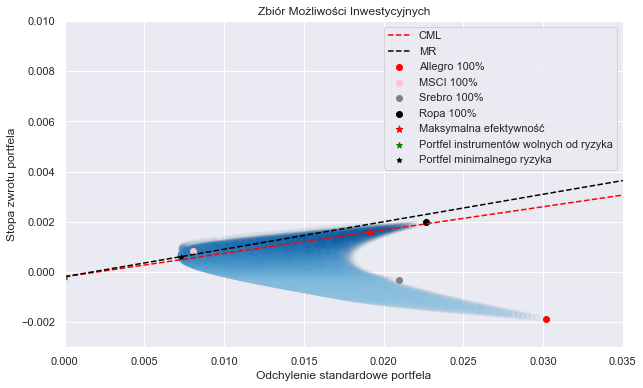

In [1201]:
plt.figure(figsize=(10, 6))
plt.scatter(w['SD portfolio'], w['E(Rp)'], alpha=0.01,c=w['Sharp Ratio'], cmap='Blues')
#plt.scatter(eff_front_df_no_ss['Risk'],eff_front_df_no_ss['Return'],color='palegreen',label="Granica efektywna")

plt.scatter(allegro_std, allegro_ret, color='red',label='Allegro 100%')
plt.scatter(msci_std, msci_ret, color='pink', label='MSCI 100%')
plt.scatter(silver_std, silver_ret, color='gray',label="Srebro 100%")
plt.scatter(oil_std, oil_ret, color='black', label='Ropa 100%')

plt.scatter(0.01912,0.00159, color='red',marker='*',s=50 ,label='Maksymalna efektywność')
plt.scatter(0,risk_free_rate, color='green',marker='*',label='Portfel instrumentów wolnych od ryzyka')
plt.scatter(0.00728,0.00061,color='black',label='Portfel minimalnego ryzyka',s=25,marker='*')

plt.plot(abline_values_x_no_ss, abline_values_y_no_ss, color='red',linestyle='--',label='CML') #cml
plt.plot(abline_values_mp_x_no_ss, abline_values_mp_y_no_ss ,color='black',linestyle='--',label='MR') #mr

plt.axis([0, 0.035, -0.003, 0.01])

plt.title("Zbiór Możliwości Inwestycyjnych")
plt.xlabel("Odchylenie standardowe portfela")
plt.ylabel("Stopa zwrotu portfela")
plt.legend()

plt.show()

# Efficient frontier with short selling

In [1210]:
weight_df[weight_df['SD portfolio']==weight_df['SD portfolio'].min()]

,Allegro waga,MSCI waga,Srebro waga,Ropa waga,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
488166,0.026377,0.790381,0.127117,0.056125,-0.001871,0.000838,-0.000323,0.002004,0.000685,0.007296,0.119458


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: UserWarning:

Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.



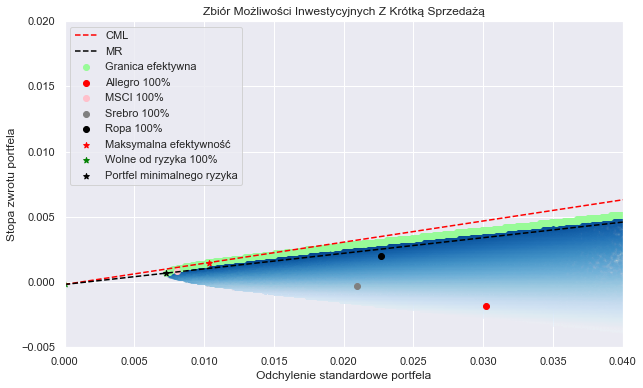

<Figure size 1152x432 with 0 Axes>

In [1186]:
plt.figure(figsize=(10, 6))

plt.scatter(sd_portfolio_df.round(4), e_portfolio_return_df.round(4), s=5, c=weight_df['Sharp Ratio'], alpha=0.1, cmap='Blues')
plt.scatter(eff_front_df['Risk'], eff_front_df['Return'], color='palegreen',label="Granica efektywna")

plt.scatter(allegro_std, allegro_ret, color='red',label='Allegro 100%') #allegro 1
plt.scatter(msci_std, msci_ret, color='pink', label='MSCI 100%') #msci 1 
plt.scatter(silver_std, silver_ret, color='gray',label="Srebro 100%") #silver 1
plt.scatter(oil_std, oil_ret, color='black', label='Ropa 100%') #oil 1

plt.scatter(0.01036,0.001493, color='red',marker='*', label='Maksymalna efektywność')
plt.scatter(0,risk_free_rate, color='green',marker='*', label='Wolne od ryzyka 100%')
plt.scatter(min_risk_std,min_risk_ret,color='black',label='Portfel minimalnego ryzyka',marker='*')

plt.plot(abline_values_x, abline_values_y, color='red',linestyle='--',label='CML') #cml
plt.plot(abline_values_mp_x, abline_values_mp_y, color='black',linestyle='--',label='MR') #mr

plt.axis([0, 0.04, -0.005, 0.02])

plt.title("Zbiór Możliwości Inwestycyjnych Z Krótką Sprzedażą")
plt.xlabel("Odchylenie standardowe portfela")
plt.ylabel("Stopa zwrotu portfela")
plt.legend(loc='upper left')
plt.figure(figsize=(16, 6))
plt.savefig("name.png")
plt.show()

# Correlation

In [648]:
corr

,Return Allegro,Return MSCI,Return Srebro,Return Ropa
Return Allegro,1.000000,0.150024,0.009763,-0.014402
Return MSCI,0.150024,1.000000,-0.058962,0.223926
Return Srebro,0.009763,-0.058962,1.000000,0.037700
Return Ropa,-0.014402,0.223926,0.037700,1.000000


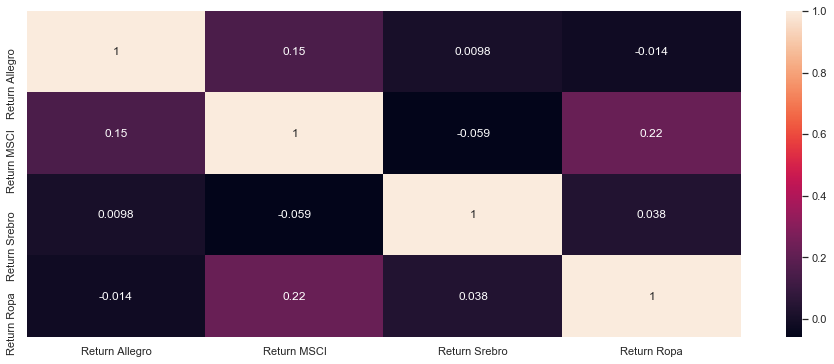

In [649]:
plt.figure(figsize=(16, 6))
sns.heatmap(corr,annot=True)
plt.savefig('corrplot.png')

In [516]:
weight_df[['Allegro','MSCI','Srebro','Ropa']].describe()

,Allegro,MSCI,Srebro,Ropa
count,6.410460e+05,6.410460e+05,6.410460e+05,6.410460e+05
mean,-1.871156e-03,8.381828e-04,-3.234830e-04,2.004338e-03
std,1.030383e-14,4.943966e-17,1.140527e-15,1.173108e-15
min,-1.871156e-03,8.381828e-04,-3.234830e-04,2.004338e-03
25%,-1.871156e-03,8.381828e-04,-3.234830e-04,2.004338e-03
50%,-1.871156e-03,8.381828e-04,-3.234830e-04,2.004338e-03
75%,-1.871156e-03,8.381828e-04,-3.234830e-04,2.004338e-03
max,-1.871156e-03,8.381828e-04,-3.234830e-04,2.004338e-03


In [531]:
weight_df['Allegro'].std()

1.0303831803169934e-14

# Analizowanie efektywnych portfeli według miesięcy

In [622]:
weight_df #podejrzenie danych, żeby nie pogubić się

,Allegro waga,MSCI waga,Srebro waga,Ropa waga,Allegro,MSCI,Srebro,Ropa,E(Rp),SD portfolio,Sharp Ratio
0,0.694402,0.468171,-0.484039,0.321466,-0.001871,0.000838,-0.000323,0.002004,-0.000106,0.025235,0.003214
1,0.602012,0.084887,-0.514141,0.827241,-0.001871,0.000838,-0.000323,0.002004,0.000769,0.027942,0.034221
2,0.037189,0.311581,0.306160,0.345069,-0.001871,0.000838,-0.000323,0.002004,0.000784,0.011015,0.088181
3,0.338497,-0.286980,1.154407,-0.205924,-0.001871,0.000838,-0.000323,0.002004,-0.001660,0.026804,-0.054955
4,0.615496,-0.087788,-0.633099,1.105392,-0.001871,0.000838,-0.000323,0.002004,0.001195,0.033081,0.041782
...,...,...,...,...,...,...,...,...,...,...,...
641041,-0.644466,-0.496221,2.852112,-0.711425,-0.001871,0.000838,-0.000323,0.002004,-0.001559,0.064808,-0.021162
641042,0.540036,0.052584,0.248241,0.159138,-0.001871,0.000838,-0.000323,0.002004,-0.000728,0.017618,-0.030686
641043,0.603030,-0.480396,0.775782,0.101583,-0.001871,0.000838,-0.000323,0.002004,-0.001578,0.024617,-0.056516
641044,1.043485,-0.258463,-0.451284,0.666262,-0.001871,0.000838,-0.000323,0.002004,-0.000688,0.035353,-0.014162


In [623]:
returns_by_m = pd.read_excel('IAEXCEL.xlsx',sheet_name='allgergo')
returns_by_m['Data']

0     2020-10-12
1     2020-10-13
2     2020-10-14
3     2020-10-15
4     2020-10-16
         ...    
269   2021-11-19
270   2021-11-22
271   2021-11-23
272   2021-11-24
273   2021-11-26
Name: Data, Length: 274, dtype: datetime64[ns]

In [624]:
mon_arr = [] 
for i in range(len(returns_by_m)):
    mon_arr.append(returns_by_m['Data'][i].strftime("%B"))

In [625]:
mon_df = pd.DataFrame(mon_arr, columns=['Month'])
returns_by_m['Data'] = mon_df
returns_by_m = returns_by_m.drop(0)

In [626]:
returns_by_m

,Data,Allegro,MSCI,Srebro,Ropa,Return Allegro,Return MSCI,Return Srebro,Return Ropa
1,October,80.000,5167.5,24.129,40.20,0.133531,0.00465523,-0.0462431,0.01934
2,October,75.960,5135.5,24.395,41.04,-0.0518197,-0.0062118,0.0109638,0.0206802
3,October,79.220,5095.0,24.224,40.96,0.0420219,-0.00791754,-0.00703432,-0.00195122
4,October,81.450,5151.5,24.405,40.88,0.0277605,0.0110283,0.00744415,-0.00195503
5,October,83.400,5102.5,24.698,40.83,0.023659,-0.00955732,0.0119342,-0.00122384
...,...,...,...,...,...,...,...,...,...
269,November,45.400,6613.0,24.844,76.10,0.0096277,0.00181626,-0.00465827,-0.0375262
270,November,43.085,6643.0,24.362,76.75,-0.0523372,0.00452626,-0.0195917,0.00850512
271,November,43.250,6580.0,23.492,78.50,0.00382232,-0.00952892,-0.0363646,0.0225452
272,November,40.370,6616.0,23.536,78.39,-0.0689103,0.00545621,0.00187123,-0.00140226


In [627]:
returns_by_m[['Data','Return Allegro','Return MSCI','Return Srebro','Return Ropa']]

,Data,Return Allegro,Return MSCI,Return Srebro,Return Ropa
1,October,0.133531,0.00465523,-0.0462431,0.01934
2,October,-0.0518197,-0.0062118,0.0109638,0.0206802
3,October,0.0420219,-0.00791754,-0.00703432,-0.00195122
4,October,0.0277605,0.0110283,0.00744415,-0.00195503
5,October,0.023659,-0.00955732,0.0119342,-0.00122384
...,...,...,...,...,...
269,November,0.0096277,0.00181626,-0.00465827,-0.0375262
270,November,-0.0523372,0.00452626,-0.0195917,0.00850512
271,November,0.00382232,-0.00952892,-0.0363646,0.0225452
272,November,-0.0689103,0.00545621,0.00187123,-0.00140226


In [630]:
returns_by_m[['Return Allegro','Return MSCI','Return Srebro','Return Ropa']] = returns_by_m[['Return Allegro','Return MSCI','Return Srebro','Return Ropa']].astype(float)
returns_by_m

,Data,Allegro,MSCI,Srebro,Ropa,Return Allegro,Return MSCI,Return Srebro,Return Ropa
1,October,80.000,5167.5,24.129,40.20,0.133531,0.004655,-0.046243,0.019340
2,October,75.960,5135.5,24.395,41.04,-0.051820,-0.006212,0.010964,0.020680
3,October,79.220,5095.0,24.224,40.96,0.042022,-0.007918,-0.007034,-0.001951
4,October,81.450,5151.5,24.405,40.88,0.027761,0.011028,0.007444,-0.001955
5,October,83.400,5102.5,24.698,40.83,0.023659,-0.009557,0.011934,-0.001224
...,...,...,...,...,...,...,...,...,...
269,November,45.400,6613.0,24.844,76.10,0.009628,0.001816,-0.004658,-0.037526
270,November,43.085,6643.0,24.362,76.75,-0.052337,0.004526,-0.019592,0.008505
271,November,43.250,6580.0,23.492,78.50,0.003822,-0.009529,-0.036365,0.022545
272,November,40.370,6616.0,23.536,78.39,-0.068910,0.005456,0.001871,-0.001402


In [631]:
returns_by_m_groupedby_mean = returns_by_m.groupby('Data').mean()[['Return Allegro','Return MSCI','Return Srebro','Return Ropa']]
returns_by_m_groupedby_sd = returns_by_m.groupby('Data').std()[['Return Allegro','Return MSCI','Return Srebro','Return Ropa']]


In [1215]:
returns_by_m_groupedby_mean.loc[['January','February','March','April','May','June','July']]

,Return Allegro,Return MSCI,Return Srebro,Return Ropa
Data,,,,
January,-0.007879,-0.000799,0.000708,0.004199
February,-0.007022,0.000405,-0.000935,0.008629
March,-0.006358,0.001871,-0.003257,-0.001687
April,0.002261,0.002106,0.002661,0.003603
May,0.000325,-0.000472,0.004184,0.002221
June,0.005469,0.001803,-0.003199,0.004876
July,0.000347,0.000627,-0.001191,0.000310


In [1216]:
returns_by_m_groupedby_sd.loc[['January','February','March','April','May','June','July']]

,Risk Allegro,Risk MSCI,Risk Srebro,Risk Ropa
Data,,,,
January,0.026844,0.009367,0.030719,0.017068
February,0.021186,0.007945,0.037680,0.017085
March,0.025009,0.008954,0.015800,0.032300
April,0.019516,0.006540,0.013006,0.019217
May,0.031406,0.009738,0.014933,0.020014
June,0.016024,0.003183,0.017581,0.011078
July,0.021161,0.007122,0.014333,0.025007


In [637]:
returns_by_m_groupedby_sd = returns_by_m_groupedby_sd.drop(['Return Allegro','Return MSCI','Return Srebro','Return Ropa'],axis=1)
returns_by_m_groupedby_sd

,Risk Allegro,Risk MSCI,Risk Srebro,Risk Ropa
Data,,,,
April,0.019516,0.006540,0.013006,0.019217
August,0.019320,0.003642,0.017220,0.023020
December,0.028055,0.006046,0.022143,0.014443
February,0.021186,0.007945,0.037680,0.017085
January,0.026844,0.009367,0.030719,0.017068
July,0.021161,0.007122,0.014333,0.025007
June,0.016024,0.003183,0.017581,0.011078
March,0.025009,0.008954,0.015800,0.032300
May,0.031406,0.009738,0.014933,0.020014


In [638]:
groupedby_risk_and_return

,Return Allegro,Return MSCI,Return Srebro,Return Ropa,Risk Allegro,Risk MSCI,Risk Srebro,Risk Ropa
Data,,,,,,,,
April,0.002261,0.002106,0.002661,0.003603,0.019516,0.006540,0.013006,0.019217
August,0.003412,0.001583,-0.003124,-0.003645,0.019320,0.003642,0.017220,0.023020
December,0.004969,0.001470,0.008540,0.003437,0.028055,0.006046,0.022143,0.014443
February,-0.007022,0.000405,-0.000935,0.008629,0.021186,0.007945,0.037680,0.017085
January,-0.007879,-0.000799,0.000708,0.004199,0.026844,0.009367,0.030719,0.017068
July,0.000347,0.000627,-0.001191,0.000310,0.021161,0.007122,0.014333,0.025007
June,0.005469,0.001803,-0.003199,0.004876,0.016024,0.003183,0.017581,0.011078
March,-0.006358,0.001871,-0.003257,-0.001687,0.025009,0.008954,0.015800,0.032300
May,0.000325,-0.000472,0.004184,0.002221,0.031406,0.009738,0.014933,0.020014


In [639]:
cov_mat_jan = np.matrix(returns_by_m[returns_by_m['Data']=='January'][['Return Allegro','Return MSCI','Return Srebro','Return Ropa']].cov())
cov_mat_feb = np.matrix(returns_by_m[returns_by_m['Data']=='February'][['Return Allegro','Return MSCI','Return Srebro','Return Ropa']].cov())
cov_mat_mar = np.matrix(returns_by_m[returns_by_m['Data']=='March'][['Return Allegro','Return MSCI','Return Srebro','Return Ropa']].cov())
cov_mat_apr = np.matrix(returns_by_m[returns_by_m['Data']=='April'][['Return Allegro','Return MSCI','Return Srebro','Return Ropa']].cov())
cov_mat_may = np.matrix(returns_by_m[returns_by_m['Data']=='May'][['Return Allegro','Return MSCI','Return Srebro','Return Ropa']].cov())
cov_mat_jun = np.matrix(returns_by_m[returns_by_m['Data']=='June'][['Return Allegro','Return MSCI','Return Srebro','Return Ropa']].cov())
cov_mat_jul = np.matrix(returns_by_m[returns_by_m['Data']=='July'][['Return Allegro','Return MSCI','Return Srebro','Return Ropa']].cov())

In [640]:
cov_mats = [cov_mat_jan,cov_mat_feb,cov_mat_mar,cov_mat_apr,cov_mat_may,cov_mat_jun,cov_mat_jul]

In [771]:
returns_months = [returns_by_m_groupedby_mean.loc['January'],returns_by_m_groupedby_mean.loc['February'],
                  returns_by_m_groupedby_mean.loc['March'], returns_by_m_groupedby_mean.loc['April'],
                  returns_by_m_groupedby_mean.loc['May'],returns_by_m_groupedby_mean.loc['June'],
                  returns_by_m_groupedby_mean.loc['July']]

In [775]:
returns_months[1]

Return Allegro   -0.007022
Return MSCI       0.000405
Return Srebro    -0.000935
Return Ropa       0.008629
Name: February, dtype: float64

In [852]:
only_weight_df = pd.read_excel('noss.xlsx')[['W1','W2','W3','W4']]

In [853]:
only_weight_df

,W1,W2,W3,W4
0,0.02,0.81,0.14,0.03
1,0.02,0.80,0.15,0.03
2,0.02,0.82,0.14,0.02
3,0.02,0.81,0.15,0.02
4,0.03,0.80,0.14,0.03
...,...,...,...,...
176780,0.98,0.02,0.00,0.00
176781,0.99,0.00,0.00,0.01
176782,0.99,0.00,0.01,0.00
176783,0.99,0.01,0.00,0.00


In [854]:
p_var_arr = []
for cov_mat in tq.tqdm(cov_mats):
    p_var_arr.append(portfolio_variance(np.matrix(only_weight_df), cov_mat))

In [855]:
p_var_df_arr = []
for p in p_var_arr:
    p_var_df_arr.append(pd.DataFrame(p,columns=['SD portfolio']))

In [856]:
full_df_arr = []

for i in range(len(cov_mats)):
    full_df_arr.append(only_weight_df)
full_df_arr[0]

,W1,W2,W3,W4
0,0.02,0.81,0.14,0.03
1,0.02,0.80,0.15,0.03
2,0.02,0.82,0.14,0.02
3,0.02,0.81,0.15,0.02
4,0.03,0.80,0.14,0.03
...,...,...,...,...
176780,0.98,0.02,0.00,0.00
176781,0.99,0.00,0.00,0.01
176782,0.99,0.00,0.01,0.00
176783,0.99,0.01,0.00,0.00


In [857]:
dfs_with_risk = []

for i in range(len(full_df_arr)):
    d = full_df_arr[i].copy()
    d['Return Allegro'] = returns_months[i]['Return Allegro'] 
    d['Return MSCI'] = returns_months[i]['Return MSCI'] 
    d['Return Srebro'] = returns_months[i]['Return Srebro'] 
    d['Return Ropa'] = returns_months[i]['Return Ropa'] 
    d['E(Rp)'] = d['W1'] * d['Return Allegro'] + d['W2'] * d['Return MSCI'] + d['W3'] * d['Return Srebro'] + d['W4'] * d['Return Ropa']

    d['SD portfolio'] = p_var_df_arr[i]
    dfs_with_risk.append(d)

In [858]:
for i in range(len(dfs_with_risk)):
    dfs_with_risk[i].dropna(inplace=True)

In [786]:
#backup
for i in tq.tqdm(range(len(dfs_with_risk))):
    dfs_with_risk[i].to_excel(f'df_with_risk{i}.xlsx')

In [859]:
dfs_with_min_risk = []

for i in range(len(dfs_with_risk)):
    dfs_with_min_risk.append(dfs_with_risk[i][dfs_with_risk[i]['SD portfolio'] == dfs_with_risk[i]['SD portfolio'].min()])

In [860]:
dfs_with_risk[0][dfs_with_risk[0]['SD portfolio'] == dfs_with_risk[0]['SD portfolio'].min()]

,W1,W2,W3,W4,Return Allegro,Return MSCI,Return Srebro,Return Ropa,E(Rp),SD portfolio
4199,0.07,0.68,0.1,0.15,-0.007879,-0.000799,0.000708,0.004199,-0.000394,0.007525


In [861]:
for i in range(len(dfs_with_risk)):
    dfs_with_risk[i]['Sharp Ratio'] = (dfs_with_risk[i]['E(Rp)']-risk_free_rate)/dfs_with_risk[i]['SD portfolio']

In [862]:
dfs_with_max_eff = []
for i in range(len(dfs_with_risk)):
    dfs_with_max_eff.append(dfs_with_risk[i][dfs_with_risk[i]['Sharp Ratio'] == dfs_with_risk[i]['Sharp Ratio'].max()])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: UserWarning:

Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.



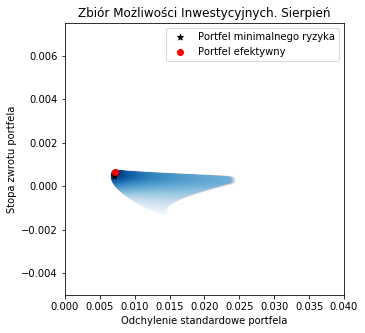

In [1123]:
MONTH_CONST = 6

plt.figure(figsize=(5,5))

plt.scatter(dfs_with_risk[MONTH_CONST]['SD portfolio'], dfs_with_risk[MONTH_CONST]['E(Rp)'], alpha=0.01,c=dfs_with_risk[MONTH_CONST]['Sharp Ratio'], cmap='Blues')

#plt.scatter(0,risk_free_rate, color='green',marker='*', label='Portfel instrumentów wolnych od ryzyka')
plt.scatter(dfs_with_min_risk[MONTH_CONST]['SD portfolio'],dfs_with_min_risk[MONTH_CONST]['E(Rp)'],color='black',label='Portfel minimalnego ryzyka',marker='*')
plt.scatter(dfs_with_max_eff[MONTH_CONST]['SD portfolio'],dfs_with_max_eff[MONTH_CONST]['E(Rp)'],color='red', label='Portfel efektywny')

plt.axis([0, 0.04, -0.005, 0.0075])

plt.title("Zbiór Możliwości Inwestycyjnych. Sierpień")
plt.xlabel("Odchylenie standardowe portfela")
plt.ylabel("Stopa zwrotu portfela")
plt.legend()

plt.show()

In [923]:
max_eff_df = dfs_with_max_eff[0][['W1','W2','W3','W4','E(Rp)','SD portfolio']]
#dfs_with_max_eff[1][['W1','W2','W3','W4','E(Rp)','SD portfolio']]
for i in range(1,len(dfs_with_max_eff)):
    max_eff_df = max_eff_df.append(dfs_with_max_eff[i][['W1','W2','W3','W4','E(Rp)','SD portfolio']])

In [956]:
max_eff_df = max_eff_df.reset_index()

In [959]:
max_eff_df.drop('new index', axis=1,inplace=True)

In [964]:
max_eff_df.drop('index',axis=1,inplace=True)

In [1217]:
max_eff_df[['W1','W2','W3','W4','E(Rp)','SD portfolio']]

,W1,W2,W3,W4,E(Rp),SD portfolio
0,0.00,0.00,0.14,0.86,0.003710,0.014487
1,0.00,0.09,0.00,0.91,0.007889,0.015744
2,0.00,1.00,0.00,0.00,0.001871,0.008954
3,0.00,0.71,0.10,0.19,0.002446,0.005352
4,0.05,0.00,0.84,0.11,0.003775,0.013242
5,0.06,0.77,0.00,0.17,0.002545,0.003142
6,0.00,1.00,0.00,0.00,0.000627,0.007122


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning:

Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.



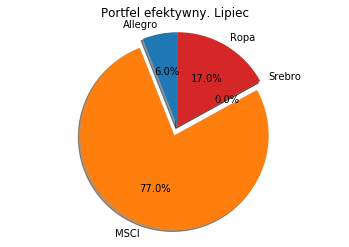

In [1122]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'Allegro', 'MSCI', 'Srebro', 'Ropa'
explode = (0, 0.1, 0, 0)

fig1, ax1 = plt.subplots()
ax1.pie(max_eff_df[['W1','W2','W3','W4']].iloc[5], explode=explode, labels=labels,autopct='%1.1f%%', shadow=True, startangle=90)
ax1.axis('equal')

plt.title("Portfel efektywny. Lipiec")
plt.show()